# Question 1

### Train and validate your own n-layer Neural Network on the Apparel dataset to predict the class label of a given apparel. You are free to choose the hyper-parameters, training strategy to handle large number of training data (Hint: Batch Size) architecture - number of hidden layers, number of nodes in each hidden layer etc.

## Importing libraries


In [8]:
import numpy as np
import pandas as pd
import math as mt
import codecs, json 
import sys
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import accuracy_score



## Utility Functions

NeuralNetwork class

In [9]:
class NeuralNetwork:
    def __init__(self,input_size,output_size, No_HL, h_LS , activation = "sigmoid"):
        self.input_LS = input_size
        self.hidden_LS = h_LS
        self.output_LS = output_size
        self.No_HLayers = No_HL 
        self.W = np.empty(self.No_HLayers + 1, dtype = object)
        self.B = np.empty(self.No_HLayers + 1, dtype = object)
        self.H_in = np.empty(self.No_HLayers + 1, dtype = object)
        self.H_out = np.empty(self.No_HLayers + 2, dtype = object)
        self.w_grad = np.empty(self.No_HLayers + 1, dtype = object)
        self.b_grad = np.empty(self.No_HLayers + 1, dtype = object)
        bound = np.sqrt(1./self.input_LS)
        self.W[0] = np.random.uniform(-bound,bound,(self.input_LS, self.hidden_LS))
        self.B[0] = np.random.uniform(-bound,bound,(1, self.hidden_LS))
        for i in range(1, len(self.W)-1):
            self.W[i] = np.random.uniform(-bound,bound,(self.hidden_LS, self.hidden_LS))
            self.B[i] = np.random.uniform(-bound,bound,(1, self.hidden_LS))  
        self.W[len(self.W)-1] = np.random.uniform(-bound,bound,(self.hidden_LS,self.output_LS))
        self.B[len(self.B)-1] = np.random.uniform(-bound,bound,(1, self.output_LS))
        self.activation = activation
        
        
    def save_metaData(self, fileName):
        data = {"no_of_hidden_layers":self.No_HLayers,"no_of_neurons_per_layer":self.hidden_LS,"activation":self.activation,"weights": self.W, "bais": self.B}
        np.save('./../output_data/'+fileName+'.npy',data)

    def load_metaData(self,fileName):
        try:
            data_loaded = np.load('./../output_data/'+fileName+'.npy')
            self.activation = data_loaded[()]["activation"] 
            self.W = data_loaded[()]["weights"] 
            self.B = data_loaded[()]["bais"]
        except:
            pass
        
    def ReLU(self, z):
        return z * (z > 0)

    def delta_ReLU(self, z):
        return 1. * (z > 0)
    
    def tanh(self, z):
        return np.tanh(z)

    def delta_tanh(self, z):
        return 1. - z * z
    
    def sigmoid(self, z):
        return 1/(1 + np.exp(-z))
    
    def delta_sigmoid(self, z):
        return z * (1 - z)
    
    def softmax(self, y_hat):
        tmp = y_hat - y_hat.max(axis=1).reshape(-1, 1)
        exp_tmp = np.exp(tmp)
        return exp_tmp / exp_tmp.sum(axis=1).reshape(-1, 1)
    
    
    def forwardprop(self, X):
        self.H_out[0] = X
        for i in range(0,len(self.W)):
            self.H_in[i] = np.dot(self.H_out[i], self.W[i]) + self.B[i]
            if i != len(self.W) - 1:
                if self.activation == "sigmoid":
                    self.H_out[i + 1] = self.sigmoid(self.H_in[i])
                elif self.activation == "ReLU": 
                    self.H_out[i + 1] = self.ReLU(self.H_in[i])
                elif self.activation == "tanh": 
                    self.H_out[i + 1] = self.tanh(self.H_in[i])
            else:
                self.H_out[i + 1] = self.softmax(self.H_in[i])
        self.yHat = self.H_out[len(self.W)]
        return self.yHat

    def backprop(self, X, error, LR = 0.01):  
        m = X.shape[0]
        err2 = error
        for i in range(len(self.w_grad) - 1, 0, -1):
            self.w_grad[i] = LR * np.dot(self.H_out[i].T,err2)/m
            self.b_grad[i] = LR * np.average(err2, axis=0)
            err2 = np.dot(err2, self.W[i].T)
            if self.activation == "sigmoid":
                err2 *= self.delta_sigmoid(self.H_out[i])
            elif self.activation == "ReLU": 
                err2 *= self.delta_ReLU(self.H_out[i])
            elif self.activation == "tanh": 
                err2 *= self.delta_tanh(self.H_out[i]) 
        self.w_grad[0] = LR * np.dot(self.H_out[0].T, err2)/m
        self.b_grad[0] = LR * np.average(err2, axis=0)

    def grad_update(self):
        self.W += self.w_grad
        self.B += self.b_grad
        
    def fit(self, X, y, epoch = 10, LR = 0.01, cost_check = False, batch = False, batch_size = -1, savefile = False):
        cost = [] 
        if batch_size == -1:
            batch_size = X.shape[0]
            batch = False
        XList = []
        yList = []
        if batch:
            XList = [X[i : i + batch_size][:] for i in range(0,X.shape[0], batch_size)]
            yList = [y[i : i + batch_size][:] for i in range(0,y.shape[0], batch_size)]    
        else:
            XList.append(X)
            yList.append(y)
        
        for i in range(epoch):
            itr = 0
            y_hatList = []
            for XL,yL in zip(XList, yList):
                y_hat = self.forwardprop(XL)
                error = yL - y_hat
                self.backprop(XL, error, LR)
                self.grad_update()
                y_hatList += list(y_hat)
                print("epoch: ",i ,"iteration: ",itr)
                itr += 1
            if cost_check:
                y_hatList = np.clip(y_hatList, 0.00001, 0.99999)
                cost.append(-np.sum(y * np.log(y_hatList))/y.shape[0])
                print("cost[",i,"]: " , cost[i])
        if savefile:
            self.save_metaData(self.activation)
        return cost
    
    def predict(self, X, loadfile = False):
        if loadfile:
            self.load_metaData(self.activation) 
        y_hat = self.forwardprop(X)
        return np.argmax(y_hat, axis=1)
        
            

### Reading the Data Set


In [10]:
output_file = "./../input_data/Apparel/apparel-trainval.csv"
dataSet = pd.read_csv(output_file)
Class = "label"
columns = list(dataSet.columns)
X = dataSet[columns[1:]].values
y = dataSet[[Class]].values


### Spliting the data set for train and test data randomly

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)


### OneHotEncoding the class labels

In [12]:
ohe = OneHotEncoder(n_values=10)
y_train_enc = ohe.fit_transform(y_train.reshape(-1, 1)).toarray()


/Users/martian/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:331: DeprecationWarning: Passing 'n_values' is deprecated in version 0.20 and will be removed in 0.22. You can use the 'categories' keyword instead. 'n_values=n' corresponds to 'categories=[range(n)]'.
  warnings.warn(msg, DeprecationWarning)


### Neural Network object 
#### NeuralNetwork(input_size, output_size, No of hidden layers, No of neurons per layer ,  activation function = "sigmoid")
 * For best results use NeuralNetwork(input_size, output_size, No of hidden layers = 2, No of neurons per layer = 500 ,  activation function = "sigmoid")

In [13]:
NN = NeuralNetwork(X_train.shape[1] , 10, 2, 500, activation = "sigmoid")

### Fitting the model
#### NN.fit(Feature set, output class, epoch = 10, Learning Rate = 0.01, cost_check = False, batch = False, batch_size = -1, savefile=False)
* For best results use NN.fit(Feature set, output class, epoch = 1000, Learning Rate = 0.1, cost_check=True, batch = True, batch_size = 500, savefile=True)

In [7]:
costs = NN.fit(X_train, y_train_enc, 1000, 0.1, cost_check=True, batch = True, batch_size = 500)

epoch:  0 iteration:  0
epoch:  0 iteration:  1
epoch:  0 iteration:  2
epoch:  0 iteration:  3
epoch:  0 iteration:  4
epoch:  0 iteration:  5
epoch:  0 iteration:  6
epoch:  0 iteration:  7
epoch:  0 iteration:  8
epoch:  0 iteration:  9
epoch:  0 iteration:  10
epoch:  0 iteration:  11
epoch:  0 iteration:  12
epoch:  0 iteration:  13
epoch:  0 iteration:  14
epoch:  0 iteration:  15
epoch:  0 iteration:  16
epoch:  0 iteration:  17
epoch:  0 iteration:  18
epoch:  0 iteration:  19
epoch:  0 iteration:  20
epoch:  0 iteration:  21
epoch:  0 iteration:  22
epoch:  0 iteration:  23
epoch:  0 iteration:  24
epoch:  0 iteration:  25
epoch:  0 iteration:  26
epoch:  0 iteration:  27
epoch:  0 iteration:  28
epoch:  0 iteration:  29
epoch:  0 iteration:  30
epoch:  0 iteration:  31
epoch:  0 iteration:  32
epoch:  0 iteration:  33
epoch:  0 iteration:  34
epoch:  0 iteration:  35
epoch:  0 iteration:  36
epoch:  0 iteration:  37
epoch:  0 iteration:  38
epoch:  0 iteration:  39
epoch:  0 

epoch:  3 iteration:  38
epoch:  3 iteration:  39
epoch:  3 iteration:  40
epoch:  3 iteration:  41
epoch:  3 iteration:  42
epoch:  3 iteration:  43
epoch:  3 iteration:  44
epoch:  3 iteration:  45
epoch:  3 iteration:  46
epoch:  3 iteration:  47
epoch:  3 iteration:  48
epoch:  3 iteration:  49
epoch:  3 iteration:  50
epoch:  3 iteration:  51
epoch:  3 iteration:  52
epoch:  3 iteration:  53
epoch:  3 iteration:  54
epoch:  3 iteration:  55
epoch:  3 iteration:  56
epoch:  3 iteration:  57
epoch:  3 iteration:  58
epoch:  3 iteration:  59
epoch:  3 iteration:  60
epoch:  3 iteration:  61
epoch:  3 iteration:  62
epoch:  3 iteration:  63
epoch:  3 iteration:  64
epoch:  3 iteration:  65
epoch:  3 iteration:  66
epoch:  3 iteration:  67
epoch:  3 iteration:  68
epoch:  3 iteration:  69
epoch:  3 iteration:  70
epoch:  3 iteration:  71
epoch:  3 iteration:  72
epoch:  3 iteration:  73
epoch:  3 iteration:  74
epoch:  3 iteration:  75
epoch:  3 iteration:  76
epoch:  3 iteration:  77


epoch:  6 iteration:  77
epoch:  6 iteration:  78
epoch:  6 iteration:  79
epoch:  6 iteration:  80
epoch:  6 iteration:  81
epoch:  6 iteration:  82
epoch:  6 iteration:  83
epoch:  6 iteration:  84
epoch:  6 iteration:  85
epoch:  6 iteration:  86
epoch:  6 iteration:  87
epoch:  6 iteration:  88
epoch:  6 iteration:  89
epoch:  6 iteration:  90
epoch:  6 iteration:  91
epoch:  6 iteration:  92
epoch:  6 iteration:  93
epoch:  6 iteration:  94
epoch:  6 iteration:  95
cost[ 6 ]:  0.5170523055755171
epoch:  7 iteration:  0
epoch:  7 iteration:  1
epoch:  7 iteration:  2
epoch:  7 iteration:  3
epoch:  7 iteration:  4
epoch:  7 iteration:  5
epoch:  7 iteration:  6
epoch:  7 iteration:  7
epoch:  7 iteration:  8
epoch:  7 iteration:  9
epoch:  7 iteration:  10
epoch:  7 iteration:  11
epoch:  7 iteration:  12
epoch:  7 iteration:  13
epoch:  7 iteration:  14
epoch:  7 iteration:  15
epoch:  7 iteration:  16
epoch:  7 iteration:  17
epoch:  7 iteration:  18
epoch:  7 iteration:  19
epoc

epoch:  10 iteration:  25
epoch:  10 iteration:  26
epoch:  10 iteration:  27
epoch:  10 iteration:  28
epoch:  10 iteration:  29
epoch:  10 iteration:  30
epoch:  10 iteration:  31
epoch:  10 iteration:  32
epoch:  10 iteration:  33
epoch:  10 iteration:  34
epoch:  10 iteration:  35
epoch:  10 iteration:  36
epoch:  10 iteration:  37
epoch:  10 iteration:  38
epoch:  10 iteration:  39
epoch:  10 iteration:  40
epoch:  10 iteration:  41
epoch:  10 iteration:  42
epoch:  10 iteration:  43
epoch:  10 iteration:  44
epoch:  10 iteration:  45
epoch:  10 iteration:  46
epoch:  10 iteration:  47
epoch:  10 iteration:  48
epoch:  10 iteration:  49
epoch:  10 iteration:  50
epoch:  10 iteration:  51
epoch:  10 iteration:  52
epoch:  10 iteration:  53
epoch:  10 iteration:  54
epoch:  10 iteration:  55
epoch:  10 iteration:  56
epoch:  10 iteration:  57
epoch:  10 iteration:  58
epoch:  10 iteration:  59
epoch:  10 iteration:  60
epoch:  10 iteration:  61
epoch:  10 iteration:  62
epoch:  10 i

epoch:  13 iteration:  59
epoch:  13 iteration:  60
epoch:  13 iteration:  61
epoch:  13 iteration:  62
epoch:  13 iteration:  63
epoch:  13 iteration:  64
epoch:  13 iteration:  65
epoch:  13 iteration:  66
epoch:  13 iteration:  67
epoch:  13 iteration:  68
epoch:  13 iteration:  69
epoch:  13 iteration:  70
epoch:  13 iteration:  71
epoch:  13 iteration:  72
epoch:  13 iteration:  73
epoch:  13 iteration:  74
epoch:  13 iteration:  75
epoch:  13 iteration:  76
epoch:  13 iteration:  77
epoch:  13 iteration:  78
epoch:  13 iteration:  79
epoch:  13 iteration:  80
epoch:  13 iteration:  81
epoch:  13 iteration:  82
epoch:  13 iteration:  83
epoch:  13 iteration:  84
epoch:  13 iteration:  85
epoch:  13 iteration:  86
epoch:  13 iteration:  87
epoch:  13 iteration:  88
epoch:  13 iteration:  89
epoch:  13 iteration:  90
epoch:  13 iteration:  91
epoch:  13 iteration:  92
epoch:  13 iteration:  93
epoch:  13 iteration:  94
epoch:  13 iteration:  95
cost[ 13 ]:  0.5024046347359505
epoch:

epoch:  16 iteration:  93
epoch:  16 iteration:  94
epoch:  16 iteration:  95
cost[ 16 ]:  0.4974753195635276
epoch:  17 iteration:  0
epoch:  17 iteration:  1
epoch:  17 iteration:  2
epoch:  17 iteration:  3
epoch:  17 iteration:  4
epoch:  17 iteration:  5
epoch:  17 iteration:  6
epoch:  17 iteration:  7
epoch:  17 iteration:  8
epoch:  17 iteration:  9
epoch:  17 iteration:  10
epoch:  17 iteration:  11
epoch:  17 iteration:  12
epoch:  17 iteration:  13
epoch:  17 iteration:  14
epoch:  17 iteration:  15
epoch:  17 iteration:  16
epoch:  17 iteration:  17
epoch:  17 iteration:  18
epoch:  17 iteration:  19
epoch:  17 iteration:  20
epoch:  17 iteration:  21
epoch:  17 iteration:  22
epoch:  17 iteration:  23
epoch:  17 iteration:  24
epoch:  17 iteration:  25
epoch:  17 iteration:  26
epoch:  17 iteration:  27
epoch:  17 iteration:  28
epoch:  17 iteration:  29
epoch:  17 iteration:  30
epoch:  17 iteration:  31
epoch:  17 iteration:  32
epoch:  17 iteration:  33
epoch:  17 itera

epoch:  20 iteration:  30
epoch:  20 iteration:  31
epoch:  20 iteration:  32
epoch:  20 iteration:  33
epoch:  20 iteration:  34
epoch:  20 iteration:  35
epoch:  20 iteration:  36
epoch:  20 iteration:  37
epoch:  20 iteration:  38
epoch:  20 iteration:  39
epoch:  20 iteration:  40
epoch:  20 iteration:  41
epoch:  20 iteration:  42
epoch:  20 iteration:  43
epoch:  20 iteration:  44
epoch:  20 iteration:  45
epoch:  20 iteration:  46
epoch:  20 iteration:  47
epoch:  20 iteration:  48
epoch:  20 iteration:  49
epoch:  20 iteration:  50
epoch:  20 iteration:  51
epoch:  20 iteration:  52
epoch:  20 iteration:  53
epoch:  20 iteration:  54
epoch:  20 iteration:  55
epoch:  20 iteration:  56
epoch:  20 iteration:  57
epoch:  20 iteration:  58
epoch:  20 iteration:  59
epoch:  20 iteration:  60
epoch:  20 iteration:  61
epoch:  20 iteration:  62
epoch:  20 iteration:  63
epoch:  20 iteration:  64
epoch:  20 iteration:  65
epoch:  20 iteration:  66
epoch:  20 iteration:  67
epoch:  20 i

epoch:  23 iteration:  61
epoch:  23 iteration:  62
epoch:  23 iteration:  63
epoch:  23 iteration:  64
epoch:  23 iteration:  65
epoch:  23 iteration:  66
epoch:  23 iteration:  67
epoch:  23 iteration:  68
epoch:  23 iteration:  69
epoch:  23 iteration:  70
epoch:  23 iteration:  71
epoch:  23 iteration:  72
epoch:  23 iteration:  73
epoch:  23 iteration:  74
epoch:  23 iteration:  75
epoch:  23 iteration:  76
epoch:  23 iteration:  77
epoch:  23 iteration:  78
epoch:  23 iteration:  79
epoch:  23 iteration:  80
epoch:  23 iteration:  81
epoch:  23 iteration:  82
epoch:  23 iteration:  83
epoch:  23 iteration:  84
epoch:  23 iteration:  85
epoch:  23 iteration:  86
epoch:  23 iteration:  87
epoch:  23 iteration:  88
epoch:  23 iteration:  89
epoch:  23 iteration:  90
epoch:  23 iteration:  91
epoch:  23 iteration:  92
epoch:  23 iteration:  93
epoch:  23 iteration:  94
epoch:  23 iteration:  95
cost[ 23 ]:  0.5099679537446045
epoch:  24 iteration:  0
epoch:  24 iteration:  1
epoch:  

cost[ 26 ]:  0.5110210922938866
epoch:  27 iteration:  0
epoch:  27 iteration:  1
epoch:  27 iteration:  2
epoch:  27 iteration:  3
epoch:  27 iteration:  4
epoch:  27 iteration:  5
epoch:  27 iteration:  6
epoch:  27 iteration:  7
epoch:  27 iteration:  8
epoch:  27 iteration:  9
epoch:  27 iteration:  10
epoch:  27 iteration:  11
epoch:  27 iteration:  12
epoch:  27 iteration:  13
epoch:  27 iteration:  14
epoch:  27 iteration:  15
epoch:  27 iteration:  16
epoch:  27 iteration:  17
epoch:  27 iteration:  18
epoch:  27 iteration:  19
epoch:  27 iteration:  20
epoch:  27 iteration:  21
epoch:  27 iteration:  22
epoch:  27 iteration:  23
epoch:  27 iteration:  24
epoch:  27 iteration:  25
epoch:  27 iteration:  26
epoch:  27 iteration:  27
epoch:  27 iteration:  28
epoch:  27 iteration:  29
epoch:  27 iteration:  30
epoch:  27 iteration:  31
epoch:  27 iteration:  32
epoch:  27 iteration:  33
epoch:  27 iteration:  34
epoch:  27 iteration:  35
epoch:  27 iteration:  36
epoch:  27 itera

epoch:  30 iteration:  24
epoch:  30 iteration:  25
epoch:  30 iteration:  26
epoch:  30 iteration:  27
epoch:  30 iteration:  28
epoch:  30 iteration:  29
epoch:  30 iteration:  30
epoch:  30 iteration:  31
epoch:  30 iteration:  32
epoch:  30 iteration:  33
epoch:  30 iteration:  34
epoch:  30 iteration:  35
epoch:  30 iteration:  36
epoch:  30 iteration:  37
epoch:  30 iteration:  38
epoch:  30 iteration:  39
epoch:  30 iteration:  40
epoch:  30 iteration:  41
epoch:  30 iteration:  42
epoch:  30 iteration:  43
epoch:  30 iteration:  44
epoch:  30 iteration:  45
epoch:  30 iteration:  46
epoch:  30 iteration:  47
epoch:  30 iteration:  48
epoch:  30 iteration:  49
epoch:  30 iteration:  50
epoch:  30 iteration:  51
epoch:  30 iteration:  52
epoch:  30 iteration:  53
epoch:  30 iteration:  54
epoch:  30 iteration:  55
epoch:  30 iteration:  56
epoch:  30 iteration:  57
epoch:  30 iteration:  58
epoch:  30 iteration:  59
epoch:  30 iteration:  60
epoch:  30 iteration:  61
epoch:  30 i

epoch:  33 iteration:  54
epoch:  33 iteration:  55
epoch:  33 iteration:  56
epoch:  33 iteration:  57
epoch:  33 iteration:  58
epoch:  33 iteration:  59
epoch:  33 iteration:  60
epoch:  33 iteration:  61
epoch:  33 iteration:  62
epoch:  33 iteration:  63
epoch:  33 iteration:  64
epoch:  33 iteration:  65
epoch:  33 iteration:  66
epoch:  33 iteration:  67
epoch:  33 iteration:  68
epoch:  33 iteration:  69
epoch:  33 iteration:  70
epoch:  33 iteration:  71
epoch:  33 iteration:  72
epoch:  33 iteration:  73
epoch:  33 iteration:  74
epoch:  33 iteration:  75
epoch:  33 iteration:  76
epoch:  33 iteration:  77
epoch:  33 iteration:  78
epoch:  33 iteration:  79
epoch:  33 iteration:  80
epoch:  33 iteration:  81
epoch:  33 iteration:  82
epoch:  33 iteration:  83
epoch:  33 iteration:  84
epoch:  33 iteration:  85
epoch:  33 iteration:  86
epoch:  33 iteration:  87
epoch:  33 iteration:  88
epoch:  33 iteration:  89
epoch:  33 iteration:  90
epoch:  33 iteration:  91
epoch:  33 i

epoch:  36 iteration:  79
epoch:  36 iteration:  80
epoch:  36 iteration:  81
epoch:  36 iteration:  82
epoch:  36 iteration:  83
epoch:  36 iteration:  84
epoch:  36 iteration:  85
epoch:  36 iteration:  86
epoch:  36 iteration:  87
epoch:  36 iteration:  88
epoch:  36 iteration:  89
epoch:  36 iteration:  90
epoch:  36 iteration:  91
epoch:  36 iteration:  92
epoch:  36 iteration:  93
epoch:  36 iteration:  94
epoch:  36 iteration:  95
cost[ 36 ]:  0.5311397304894762
epoch:  37 iteration:  0
epoch:  37 iteration:  1
epoch:  37 iteration:  2
epoch:  37 iteration:  3
epoch:  37 iteration:  4
epoch:  37 iteration:  5
epoch:  37 iteration:  6
epoch:  37 iteration:  7
epoch:  37 iteration:  8
epoch:  37 iteration:  9
epoch:  37 iteration:  10
epoch:  37 iteration:  11
epoch:  37 iteration:  12
epoch:  37 iteration:  13
epoch:  37 iteration:  14
epoch:  37 iteration:  15
epoch:  37 iteration:  16
epoch:  37 iteration:  17
epoch:  37 iteration:  18
epoch:  37 iteration:  19
epoch:  37 itera

epoch:  40 iteration:  13
epoch:  40 iteration:  14
epoch:  40 iteration:  15
epoch:  40 iteration:  16
epoch:  40 iteration:  17
epoch:  40 iteration:  18
epoch:  40 iteration:  19
epoch:  40 iteration:  20
epoch:  40 iteration:  21
epoch:  40 iteration:  22
epoch:  40 iteration:  23
epoch:  40 iteration:  24
epoch:  40 iteration:  25
epoch:  40 iteration:  26
epoch:  40 iteration:  27
epoch:  40 iteration:  28
epoch:  40 iteration:  29
epoch:  40 iteration:  30
epoch:  40 iteration:  31
epoch:  40 iteration:  32
epoch:  40 iteration:  33
epoch:  40 iteration:  34
epoch:  40 iteration:  35
epoch:  40 iteration:  36
epoch:  40 iteration:  37
epoch:  40 iteration:  38
epoch:  40 iteration:  39
epoch:  40 iteration:  40
epoch:  40 iteration:  41
epoch:  40 iteration:  42
epoch:  40 iteration:  43
epoch:  40 iteration:  44
epoch:  40 iteration:  45
epoch:  40 iteration:  46
epoch:  40 iteration:  47
epoch:  40 iteration:  48
epoch:  40 iteration:  49
epoch:  40 iteration:  50
epoch:  40 i

epoch:  43 iteration:  41
epoch:  43 iteration:  42
epoch:  43 iteration:  43
epoch:  43 iteration:  44
epoch:  43 iteration:  45
epoch:  43 iteration:  46
epoch:  43 iteration:  47
epoch:  43 iteration:  48
epoch:  43 iteration:  49
epoch:  43 iteration:  50
epoch:  43 iteration:  51
epoch:  43 iteration:  52
epoch:  43 iteration:  53
epoch:  43 iteration:  54
epoch:  43 iteration:  55
epoch:  43 iteration:  56
epoch:  43 iteration:  57
epoch:  43 iteration:  58
epoch:  43 iteration:  59
epoch:  43 iteration:  60
epoch:  43 iteration:  61
epoch:  43 iteration:  62
epoch:  43 iteration:  63
epoch:  43 iteration:  64
epoch:  43 iteration:  65
epoch:  43 iteration:  66
epoch:  43 iteration:  67
epoch:  43 iteration:  68
epoch:  43 iteration:  69
epoch:  43 iteration:  70
epoch:  43 iteration:  71
epoch:  43 iteration:  72
epoch:  43 iteration:  73
epoch:  43 iteration:  74
epoch:  43 iteration:  75
epoch:  43 iteration:  76
epoch:  43 iteration:  77
epoch:  43 iteration:  78
epoch:  43 i

epoch:  46 iteration:  66
epoch:  46 iteration:  67
epoch:  46 iteration:  68
epoch:  46 iteration:  69
epoch:  46 iteration:  70
epoch:  46 iteration:  71
epoch:  46 iteration:  72
epoch:  46 iteration:  73
epoch:  46 iteration:  74
epoch:  46 iteration:  75
epoch:  46 iteration:  76
epoch:  46 iteration:  77
epoch:  46 iteration:  78
epoch:  46 iteration:  79
epoch:  46 iteration:  80
epoch:  46 iteration:  81
epoch:  46 iteration:  82
epoch:  46 iteration:  83
epoch:  46 iteration:  84
epoch:  46 iteration:  85
epoch:  46 iteration:  86
epoch:  46 iteration:  87
epoch:  46 iteration:  88
epoch:  46 iteration:  89
epoch:  46 iteration:  90
epoch:  46 iteration:  91
epoch:  46 iteration:  92
epoch:  46 iteration:  93
epoch:  46 iteration:  94
epoch:  46 iteration:  95
cost[ 46 ]:  0.5231353463094847
epoch:  47 iteration:  0
epoch:  47 iteration:  1
epoch:  47 iteration:  2
epoch:  47 iteration:  3
epoch:  47 iteration:  4
epoch:  47 iteration:  5
epoch:  47 iteration:  6
epoch:  47 it

epoch:  50 iteration:  2
epoch:  50 iteration:  3
epoch:  50 iteration:  4
epoch:  50 iteration:  5
epoch:  50 iteration:  6
epoch:  50 iteration:  7
epoch:  50 iteration:  8
epoch:  50 iteration:  9
epoch:  50 iteration:  10
epoch:  50 iteration:  11
epoch:  50 iteration:  12
epoch:  50 iteration:  13
epoch:  50 iteration:  14
epoch:  50 iteration:  15
epoch:  50 iteration:  16
epoch:  50 iteration:  17
epoch:  50 iteration:  18
epoch:  50 iteration:  19
epoch:  50 iteration:  20
epoch:  50 iteration:  21
epoch:  50 iteration:  22
epoch:  50 iteration:  23
epoch:  50 iteration:  24
epoch:  50 iteration:  25
epoch:  50 iteration:  26
epoch:  50 iteration:  27
epoch:  50 iteration:  28
epoch:  50 iteration:  29
epoch:  50 iteration:  30
epoch:  50 iteration:  31
epoch:  50 iteration:  32
epoch:  50 iteration:  33
epoch:  50 iteration:  34
epoch:  50 iteration:  35
epoch:  50 iteration:  36
epoch:  50 iteration:  37
epoch:  50 iteration:  38
epoch:  50 iteration:  39
epoch:  50 iteration

epoch:  53 iteration:  34
epoch:  53 iteration:  35
epoch:  53 iteration:  36
epoch:  53 iteration:  37
epoch:  53 iteration:  38
epoch:  53 iteration:  39
epoch:  53 iteration:  40
epoch:  53 iteration:  41
epoch:  53 iteration:  42
epoch:  53 iteration:  43
epoch:  53 iteration:  44
epoch:  53 iteration:  45
epoch:  53 iteration:  46
epoch:  53 iteration:  47
epoch:  53 iteration:  48
epoch:  53 iteration:  49
epoch:  53 iteration:  50
epoch:  53 iteration:  51
epoch:  53 iteration:  52
epoch:  53 iteration:  53
epoch:  53 iteration:  54
epoch:  53 iteration:  55
epoch:  53 iteration:  56
epoch:  53 iteration:  57
epoch:  53 iteration:  58
epoch:  53 iteration:  59
epoch:  53 iteration:  60
epoch:  53 iteration:  61
epoch:  53 iteration:  62
epoch:  53 iteration:  63
epoch:  53 iteration:  64
epoch:  53 iteration:  65
epoch:  53 iteration:  66
epoch:  53 iteration:  67
epoch:  53 iteration:  68
epoch:  53 iteration:  69
epoch:  53 iteration:  70
epoch:  53 iteration:  71
epoch:  53 i

epoch:  56 iteration:  66
epoch:  56 iteration:  67
epoch:  56 iteration:  68
epoch:  56 iteration:  69
epoch:  56 iteration:  70
epoch:  56 iteration:  71
epoch:  56 iteration:  72
epoch:  56 iteration:  73
epoch:  56 iteration:  74
epoch:  56 iteration:  75
epoch:  56 iteration:  76
epoch:  56 iteration:  77
epoch:  56 iteration:  78
epoch:  56 iteration:  79
epoch:  56 iteration:  80
epoch:  56 iteration:  81
epoch:  56 iteration:  82
epoch:  56 iteration:  83
epoch:  56 iteration:  84
epoch:  56 iteration:  85
epoch:  56 iteration:  86
epoch:  56 iteration:  87
epoch:  56 iteration:  88
epoch:  56 iteration:  89
epoch:  56 iteration:  90
epoch:  56 iteration:  91
epoch:  56 iteration:  92
epoch:  56 iteration:  93
epoch:  56 iteration:  94
epoch:  56 iteration:  95
cost[ 56 ]:  0.5212967077617533
epoch:  57 iteration:  0
epoch:  57 iteration:  1
epoch:  57 iteration:  2
epoch:  57 iteration:  3
epoch:  57 iteration:  4
epoch:  57 iteration:  5
epoch:  57 iteration:  6
epoch:  57 it

epoch:  59 iteration:  95
cost[ 59 ]:  0.4906650232610483
epoch:  60 iteration:  0
epoch:  60 iteration:  1
epoch:  60 iteration:  2
epoch:  60 iteration:  3
epoch:  60 iteration:  4
epoch:  60 iteration:  5
epoch:  60 iteration:  6
epoch:  60 iteration:  7
epoch:  60 iteration:  8
epoch:  60 iteration:  9
epoch:  60 iteration:  10
epoch:  60 iteration:  11
epoch:  60 iteration:  12
epoch:  60 iteration:  13
epoch:  60 iteration:  14
epoch:  60 iteration:  15
epoch:  60 iteration:  16
epoch:  60 iteration:  17
epoch:  60 iteration:  18
epoch:  60 iteration:  19
epoch:  60 iteration:  20
epoch:  60 iteration:  21
epoch:  60 iteration:  22
epoch:  60 iteration:  23
epoch:  60 iteration:  24
epoch:  60 iteration:  25
epoch:  60 iteration:  26
epoch:  60 iteration:  27
epoch:  60 iteration:  28
epoch:  60 iteration:  29
epoch:  60 iteration:  30
epoch:  60 iteration:  31
epoch:  60 iteration:  32
epoch:  60 iteration:  33
epoch:  60 iteration:  34
epoch:  60 iteration:  35
epoch:  60 itera

epoch:  63 iteration:  32
epoch:  63 iteration:  33
epoch:  63 iteration:  34
epoch:  63 iteration:  35
epoch:  63 iteration:  36
epoch:  63 iteration:  37
epoch:  63 iteration:  38
epoch:  63 iteration:  39
epoch:  63 iteration:  40
epoch:  63 iteration:  41
epoch:  63 iteration:  42
epoch:  63 iteration:  43
epoch:  63 iteration:  44
epoch:  63 iteration:  45
epoch:  63 iteration:  46
epoch:  63 iteration:  47
epoch:  63 iteration:  48
epoch:  63 iteration:  49
epoch:  63 iteration:  50
epoch:  63 iteration:  51
epoch:  63 iteration:  52
epoch:  63 iteration:  53
epoch:  63 iteration:  54
epoch:  63 iteration:  55
epoch:  63 iteration:  56
epoch:  63 iteration:  57
epoch:  63 iteration:  58
epoch:  63 iteration:  59
epoch:  63 iteration:  60
epoch:  63 iteration:  61
epoch:  63 iteration:  62
epoch:  63 iteration:  63
epoch:  63 iteration:  64
epoch:  63 iteration:  65
epoch:  63 iteration:  66
epoch:  63 iteration:  67
epoch:  63 iteration:  68
epoch:  63 iteration:  69
epoch:  63 i

epoch:  66 iteration:  57
epoch:  66 iteration:  58
epoch:  66 iteration:  59
epoch:  66 iteration:  60
epoch:  66 iteration:  61
epoch:  66 iteration:  62
epoch:  66 iteration:  63
epoch:  66 iteration:  64
epoch:  66 iteration:  65
epoch:  66 iteration:  66
epoch:  66 iteration:  67
epoch:  66 iteration:  68
epoch:  66 iteration:  69
epoch:  66 iteration:  70
epoch:  66 iteration:  71
epoch:  66 iteration:  72
epoch:  66 iteration:  73
epoch:  66 iteration:  74
epoch:  66 iteration:  75
epoch:  66 iteration:  76
epoch:  66 iteration:  77
epoch:  66 iteration:  78
epoch:  66 iteration:  79
epoch:  66 iteration:  80
epoch:  66 iteration:  81
epoch:  66 iteration:  82
epoch:  66 iteration:  83
epoch:  66 iteration:  84
epoch:  66 iteration:  85
epoch:  66 iteration:  86
epoch:  66 iteration:  87
epoch:  66 iteration:  88
epoch:  66 iteration:  89
epoch:  66 iteration:  90
epoch:  66 iteration:  91
epoch:  66 iteration:  92
epoch:  66 iteration:  93
epoch:  66 iteration:  94
epoch:  66 i

epoch:  69 iteration:  90
epoch:  69 iteration:  91
epoch:  69 iteration:  92
epoch:  69 iteration:  93
epoch:  69 iteration:  94
epoch:  69 iteration:  95
cost[ 69 ]:  0.5048897184179567
epoch:  70 iteration:  0
epoch:  70 iteration:  1
epoch:  70 iteration:  2
epoch:  70 iteration:  3
epoch:  70 iteration:  4
epoch:  70 iteration:  5
epoch:  70 iteration:  6
epoch:  70 iteration:  7
epoch:  70 iteration:  8
epoch:  70 iteration:  9
epoch:  70 iteration:  10
epoch:  70 iteration:  11
epoch:  70 iteration:  12
epoch:  70 iteration:  13
epoch:  70 iteration:  14
epoch:  70 iteration:  15
epoch:  70 iteration:  16
epoch:  70 iteration:  17
epoch:  70 iteration:  18
epoch:  70 iteration:  19
epoch:  70 iteration:  20
epoch:  70 iteration:  21
epoch:  70 iteration:  22
epoch:  70 iteration:  23
epoch:  70 iteration:  24
epoch:  70 iteration:  25
epoch:  70 iteration:  26
epoch:  70 iteration:  27
epoch:  70 iteration:  28
epoch:  70 iteration:  29
epoch:  70 iteration:  30
epoch:  70 itera

epoch:  73 iteration:  19
epoch:  73 iteration:  20
epoch:  73 iteration:  21
epoch:  73 iteration:  22
epoch:  73 iteration:  23
epoch:  73 iteration:  24
epoch:  73 iteration:  25
epoch:  73 iteration:  26
epoch:  73 iteration:  27
epoch:  73 iteration:  28
epoch:  73 iteration:  29
epoch:  73 iteration:  30
epoch:  73 iteration:  31
epoch:  73 iteration:  32
epoch:  73 iteration:  33
epoch:  73 iteration:  34
epoch:  73 iteration:  35
epoch:  73 iteration:  36
epoch:  73 iteration:  37
epoch:  73 iteration:  38
epoch:  73 iteration:  39
epoch:  73 iteration:  40
epoch:  73 iteration:  41
epoch:  73 iteration:  42
epoch:  73 iteration:  43
epoch:  73 iteration:  44
epoch:  73 iteration:  45
epoch:  73 iteration:  46
epoch:  73 iteration:  47
epoch:  73 iteration:  48
epoch:  73 iteration:  49
epoch:  73 iteration:  50
epoch:  73 iteration:  51
epoch:  73 iteration:  52
epoch:  73 iteration:  53
epoch:  73 iteration:  54
epoch:  73 iteration:  55
epoch:  73 iteration:  56
epoch:  73 i

epoch:  76 iteration:  50
epoch:  76 iteration:  51
epoch:  76 iteration:  52
epoch:  76 iteration:  53
epoch:  76 iteration:  54
epoch:  76 iteration:  55
epoch:  76 iteration:  56
epoch:  76 iteration:  57
epoch:  76 iteration:  58
epoch:  76 iteration:  59
epoch:  76 iteration:  60
epoch:  76 iteration:  61
epoch:  76 iteration:  62
epoch:  76 iteration:  63
epoch:  76 iteration:  64
epoch:  76 iteration:  65
epoch:  76 iteration:  66
epoch:  76 iteration:  67
epoch:  76 iteration:  68
epoch:  76 iteration:  69
epoch:  76 iteration:  70
epoch:  76 iteration:  71
epoch:  76 iteration:  72
epoch:  76 iteration:  73
epoch:  76 iteration:  74
epoch:  76 iteration:  75
epoch:  76 iteration:  76
epoch:  76 iteration:  77
epoch:  76 iteration:  78
epoch:  76 iteration:  79
epoch:  76 iteration:  80
epoch:  76 iteration:  81
epoch:  76 iteration:  82
epoch:  76 iteration:  83
epoch:  76 iteration:  84
epoch:  76 iteration:  85
epoch:  76 iteration:  86
epoch:  76 iteration:  87
epoch:  76 i

epoch:  79 iteration:  82
epoch:  79 iteration:  83
epoch:  79 iteration:  84
epoch:  79 iteration:  85
epoch:  79 iteration:  86
epoch:  79 iteration:  87
epoch:  79 iteration:  88
epoch:  79 iteration:  89
epoch:  79 iteration:  90
epoch:  79 iteration:  91
epoch:  79 iteration:  92
epoch:  79 iteration:  93
epoch:  79 iteration:  94
epoch:  79 iteration:  95
cost[ 79 ]:  0.528504190224984
epoch:  80 iteration:  0
epoch:  80 iteration:  1
epoch:  80 iteration:  2
epoch:  80 iteration:  3
epoch:  80 iteration:  4
epoch:  80 iteration:  5
epoch:  80 iteration:  6
epoch:  80 iteration:  7
epoch:  80 iteration:  8
epoch:  80 iteration:  9
epoch:  80 iteration:  10
epoch:  80 iteration:  11
epoch:  80 iteration:  12
epoch:  80 iteration:  13
epoch:  80 iteration:  14
epoch:  80 iteration:  15
epoch:  80 iteration:  16
epoch:  80 iteration:  17
epoch:  80 iteration:  18
epoch:  80 iteration:  19
epoch:  80 iteration:  20
epoch:  80 iteration:  21
epoch:  80 iteration:  22
epoch:  80 iterat

epoch:  83 iteration:  16
epoch:  83 iteration:  17
epoch:  83 iteration:  18
epoch:  83 iteration:  19
epoch:  83 iteration:  20
epoch:  83 iteration:  21
epoch:  83 iteration:  22
epoch:  83 iteration:  23
epoch:  83 iteration:  24
epoch:  83 iteration:  25
epoch:  83 iteration:  26
epoch:  83 iteration:  27
epoch:  83 iteration:  28
epoch:  83 iteration:  29
epoch:  83 iteration:  30
epoch:  83 iteration:  31
epoch:  83 iteration:  32
epoch:  83 iteration:  33
epoch:  83 iteration:  34
epoch:  83 iteration:  35
epoch:  83 iteration:  36
epoch:  83 iteration:  37
epoch:  83 iteration:  38
epoch:  83 iteration:  39
epoch:  83 iteration:  40
epoch:  83 iteration:  41
epoch:  83 iteration:  42
epoch:  83 iteration:  43
epoch:  83 iteration:  44
epoch:  83 iteration:  45
epoch:  83 iteration:  46
epoch:  83 iteration:  47
epoch:  83 iteration:  48
epoch:  83 iteration:  49
epoch:  83 iteration:  50
epoch:  83 iteration:  51
epoch:  83 iteration:  52
epoch:  83 iteration:  53
epoch:  83 i

epoch:  86 iteration:  45
epoch:  86 iteration:  46
epoch:  86 iteration:  47
epoch:  86 iteration:  48
epoch:  86 iteration:  49
epoch:  86 iteration:  50
epoch:  86 iteration:  51
epoch:  86 iteration:  52
epoch:  86 iteration:  53
epoch:  86 iteration:  54
epoch:  86 iteration:  55
epoch:  86 iteration:  56
epoch:  86 iteration:  57
epoch:  86 iteration:  58
epoch:  86 iteration:  59
epoch:  86 iteration:  60
epoch:  86 iteration:  61
epoch:  86 iteration:  62
epoch:  86 iteration:  63
epoch:  86 iteration:  64
epoch:  86 iteration:  65
epoch:  86 iteration:  66
epoch:  86 iteration:  67
epoch:  86 iteration:  68
epoch:  86 iteration:  69
epoch:  86 iteration:  70
epoch:  86 iteration:  71
epoch:  86 iteration:  72
epoch:  86 iteration:  73
epoch:  86 iteration:  74
epoch:  86 iteration:  75
epoch:  86 iteration:  76
epoch:  86 iteration:  77
epoch:  86 iteration:  78
epoch:  86 iteration:  79
epoch:  86 iteration:  80
epoch:  86 iteration:  81
epoch:  86 iteration:  82
epoch:  86 i

epoch:  89 iteration:  71
epoch:  89 iteration:  72
epoch:  89 iteration:  73
epoch:  89 iteration:  74
epoch:  89 iteration:  75
epoch:  89 iteration:  76
epoch:  89 iteration:  77
epoch:  89 iteration:  78
epoch:  89 iteration:  79
epoch:  89 iteration:  80
epoch:  89 iteration:  81
epoch:  89 iteration:  82
epoch:  89 iteration:  83
epoch:  89 iteration:  84
epoch:  89 iteration:  85
epoch:  89 iteration:  86
epoch:  89 iteration:  87
epoch:  89 iteration:  88
epoch:  89 iteration:  89
epoch:  89 iteration:  90
epoch:  89 iteration:  91
epoch:  89 iteration:  92
epoch:  89 iteration:  93
epoch:  89 iteration:  94
epoch:  89 iteration:  95
cost[ 89 ]:  0.5116616977146347
epoch:  90 iteration:  0
epoch:  90 iteration:  1
epoch:  90 iteration:  2
epoch:  90 iteration:  3
epoch:  90 iteration:  4
epoch:  90 iteration:  5
epoch:  90 iteration:  6
epoch:  90 iteration:  7
epoch:  90 iteration:  8
epoch:  90 iteration:  9
epoch:  90 iteration:  10
epoch:  90 iteration:  11
epoch:  90 itera

epoch:  93 iteration:  7
epoch:  93 iteration:  8
epoch:  93 iteration:  9
epoch:  93 iteration:  10
epoch:  93 iteration:  11
epoch:  93 iteration:  12
epoch:  93 iteration:  13
epoch:  93 iteration:  14
epoch:  93 iteration:  15
epoch:  93 iteration:  16
epoch:  93 iteration:  17
epoch:  93 iteration:  18
epoch:  93 iteration:  19
epoch:  93 iteration:  20
epoch:  93 iteration:  21
epoch:  93 iteration:  22
epoch:  93 iteration:  23
epoch:  93 iteration:  24
epoch:  93 iteration:  25
epoch:  93 iteration:  26
epoch:  93 iteration:  27
epoch:  93 iteration:  28
epoch:  93 iteration:  29
epoch:  93 iteration:  30
epoch:  93 iteration:  31
epoch:  93 iteration:  32
epoch:  93 iteration:  33
epoch:  93 iteration:  34
epoch:  93 iteration:  35
epoch:  93 iteration:  36
epoch:  93 iteration:  37
epoch:  93 iteration:  38
epoch:  93 iteration:  39
epoch:  93 iteration:  40
epoch:  93 iteration:  41
epoch:  93 iteration:  42
epoch:  93 iteration:  43
epoch:  93 iteration:  44
epoch:  93 iter

epoch:  96 iteration:  36
epoch:  96 iteration:  37
epoch:  96 iteration:  38
epoch:  96 iteration:  39
epoch:  96 iteration:  40
epoch:  96 iteration:  41
epoch:  96 iteration:  42
epoch:  96 iteration:  43
epoch:  96 iteration:  44
epoch:  96 iteration:  45
epoch:  96 iteration:  46
epoch:  96 iteration:  47
epoch:  96 iteration:  48
epoch:  96 iteration:  49
epoch:  96 iteration:  50
epoch:  96 iteration:  51
epoch:  96 iteration:  52
epoch:  96 iteration:  53
epoch:  96 iteration:  54
epoch:  96 iteration:  55
epoch:  96 iteration:  56
epoch:  96 iteration:  57
epoch:  96 iteration:  58
epoch:  96 iteration:  59
epoch:  96 iteration:  60
epoch:  96 iteration:  61
epoch:  96 iteration:  62
epoch:  96 iteration:  63
epoch:  96 iteration:  64
epoch:  96 iteration:  65
epoch:  96 iteration:  66
epoch:  96 iteration:  67
epoch:  96 iteration:  68
epoch:  96 iteration:  69
epoch:  96 iteration:  70
epoch:  96 iteration:  71
epoch:  96 iteration:  72
epoch:  96 iteration:  73
epoch:  96 i

epoch:  99 iteration:  64
epoch:  99 iteration:  65
epoch:  99 iteration:  66
epoch:  99 iteration:  67
epoch:  99 iteration:  68
epoch:  99 iteration:  69
epoch:  99 iteration:  70
epoch:  99 iteration:  71
epoch:  99 iteration:  72
epoch:  99 iteration:  73
epoch:  99 iteration:  74
epoch:  99 iteration:  75
epoch:  99 iteration:  76
epoch:  99 iteration:  77
epoch:  99 iteration:  78
epoch:  99 iteration:  79
epoch:  99 iteration:  80
epoch:  99 iteration:  81
epoch:  99 iteration:  82
epoch:  99 iteration:  83
epoch:  99 iteration:  84
epoch:  99 iteration:  85
epoch:  99 iteration:  86
epoch:  99 iteration:  87
epoch:  99 iteration:  88
epoch:  99 iteration:  89
epoch:  99 iteration:  90
epoch:  99 iteration:  91
epoch:  99 iteration:  92
epoch:  99 iteration:  93
epoch:  99 iteration:  94
epoch:  99 iteration:  95
cost[ 99 ]:  0.5113908805011332
epoch:  100 iteration:  0
epoch:  100 iteration:  1
epoch:  100 iteration:  2
epoch:  100 iteration:  3
epoch:  100 iteration:  4
epoch:

epoch:  102 iteration:  85
epoch:  102 iteration:  86
epoch:  102 iteration:  87
epoch:  102 iteration:  88
epoch:  102 iteration:  89
epoch:  102 iteration:  90
epoch:  102 iteration:  91
epoch:  102 iteration:  92
epoch:  102 iteration:  93
epoch:  102 iteration:  94
epoch:  102 iteration:  95
cost[ 102 ]:  0.4904622553036774
epoch:  103 iteration:  0
epoch:  103 iteration:  1
epoch:  103 iteration:  2
epoch:  103 iteration:  3
epoch:  103 iteration:  4
epoch:  103 iteration:  5
epoch:  103 iteration:  6
epoch:  103 iteration:  7
epoch:  103 iteration:  8
epoch:  103 iteration:  9
epoch:  103 iteration:  10
epoch:  103 iteration:  11
epoch:  103 iteration:  12
epoch:  103 iteration:  13
epoch:  103 iteration:  14
epoch:  103 iteration:  15
epoch:  103 iteration:  16
epoch:  103 iteration:  17
epoch:  103 iteration:  18
epoch:  103 iteration:  19
epoch:  103 iteration:  20
epoch:  103 iteration:  21
epoch:  103 iteration:  22
epoch:  103 iteration:  23
epoch:  103 iteration:  24
epoch

epoch:  106 iteration:  10
epoch:  106 iteration:  11
epoch:  106 iteration:  12
epoch:  106 iteration:  13
epoch:  106 iteration:  14
epoch:  106 iteration:  15
epoch:  106 iteration:  16
epoch:  106 iteration:  17
epoch:  106 iteration:  18
epoch:  106 iteration:  19
epoch:  106 iteration:  20
epoch:  106 iteration:  21
epoch:  106 iteration:  22
epoch:  106 iteration:  23
epoch:  106 iteration:  24
epoch:  106 iteration:  25
epoch:  106 iteration:  26
epoch:  106 iteration:  27
epoch:  106 iteration:  28
epoch:  106 iteration:  29
epoch:  106 iteration:  30
epoch:  106 iteration:  31
epoch:  106 iteration:  32
epoch:  106 iteration:  33
epoch:  106 iteration:  34
epoch:  106 iteration:  35
epoch:  106 iteration:  36
epoch:  106 iteration:  37
epoch:  106 iteration:  38
epoch:  106 iteration:  39
epoch:  106 iteration:  40
epoch:  106 iteration:  41
epoch:  106 iteration:  42
epoch:  106 iteration:  43
epoch:  106 iteration:  44
epoch:  106 iteration:  45
epoch:  106 iteration:  46
e

epoch:  109 iteration:  25
epoch:  109 iteration:  26
epoch:  109 iteration:  27
epoch:  109 iteration:  28
epoch:  109 iteration:  29
epoch:  109 iteration:  30
epoch:  109 iteration:  31
epoch:  109 iteration:  32
epoch:  109 iteration:  33
epoch:  109 iteration:  34
epoch:  109 iteration:  35
epoch:  109 iteration:  36
epoch:  109 iteration:  37
epoch:  109 iteration:  38
epoch:  109 iteration:  39
epoch:  109 iteration:  40
epoch:  109 iteration:  41
epoch:  109 iteration:  42
epoch:  109 iteration:  43
epoch:  109 iteration:  44
epoch:  109 iteration:  45
epoch:  109 iteration:  46
epoch:  109 iteration:  47
epoch:  109 iteration:  48
epoch:  109 iteration:  49
epoch:  109 iteration:  50
epoch:  109 iteration:  51
epoch:  109 iteration:  52
epoch:  109 iteration:  53
epoch:  109 iteration:  54
epoch:  109 iteration:  55
epoch:  109 iteration:  56
epoch:  109 iteration:  57
epoch:  109 iteration:  58
epoch:  109 iteration:  59
epoch:  109 iteration:  60
epoch:  109 iteration:  61
e

epoch:  112 iteration:  40
epoch:  112 iteration:  41
epoch:  112 iteration:  42
epoch:  112 iteration:  43
epoch:  112 iteration:  44
epoch:  112 iteration:  45
epoch:  112 iteration:  46
epoch:  112 iteration:  47
epoch:  112 iteration:  48
epoch:  112 iteration:  49
epoch:  112 iteration:  50
epoch:  112 iteration:  51
epoch:  112 iteration:  52
epoch:  112 iteration:  53
epoch:  112 iteration:  54
epoch:  112 iteration:  55
epoch:  112 iteration:  56
epoch:  112 iteration:  57
epoch:  112 iteration:  58
epoch:  112 iteration:  59
epoch:  112 iteration:  60
epoch:  112 iteration:  61
epoch:  112 iteration:  62
epoch:  112 iteration:  63
epoch:  112 iteration:  64
epoch:  112 iteration:  65
epoch:  112 iteration:  66
epoch:  112 iteration:  67
epoch:  112 iteration:  68
epoch:  112 iteration:  69
epoch:  112 iteration:  70
epoch:  112 iteration:  71
epoch:  112 iteration:  72
epoch:  112 iteration:  73
epoch:  112 iteration:  74
epoch:  112 iteration:  75
epoch:  112 iteration:  76
e

epoch:  115 iteration:  59
epoch:  115 iteration:  60
epoch:  115 iteration:  61
epoch:  115 iteration:  62
epoch:  115 iteration:  63
epoch:  115 iteration:  64
epoch:  115 iteration:  65
epoch:  115 iteration:  66
epoch:  115 iteration:  67
epoch:  115 iteration:  68
epoch:  115 iteration:  69
epoch:  115 iteration:  70
epoch:  115 iteration:  71
epoch:  115 iteration:  72
epoch:  115 iteration:  73
epoch:  115 iteration:  74
epoch:  115 iteration:  75
epoch:  115 iteration:  76
epoch:  115 iteration:  77
epoch:  115 iteration:  78
epoch:  115 iteration:  79
epoch:  115 iteration:  80
epoch:  115 iteration:  81
epoch:  115 iteration:  82
epoch:  115 iteration:  83
epoch:  115 iteration:  84
epoch:  115 iteration:  85
epoch:  115 iteration:  86
epoch:  115 iteration:  87
epoch:  115 iteration:  88
epoch:  115 iteration:  89
epoch:  115 iteration:  90
epoch:  115 iteration:  91
epoch:  115 iteration:  92
epoch:  115 iteration:  93
epoch:  115 iteration:  94
epoch:  115 iteration:  95
c

epoch:  118 iteration:  76
epoch:  118 iteration:  77
epoch:  118 iteration:  78
epoch:  118 iteration:  79
epoch:  118 iteration:  80
epoch:  118 iteration:  81
epoch:  118 iteration:  82
epoch:  118 iteration:  83
epoch:  118 iteration:  84
epoch:  118 iteration:  85
epoch:  118 iteration:  86
epoch:  118 iteration:  87
epoch:  118 iteration:  88
epoch:  118 iteration:  89
epoch:  118 iteration:  90
epoch:  118 iteration:  91
epoch:  118 iteration:  92
epoch:  118 iteration:  93
epoch:  118 iteration:  94
epoch:  118 iteration:  95
cost[ 118 ]:  0.5191549383165577
epoch:  119 iteration:  0
epoch:  119 iteration:  1
epoch:  119 iteration:  2
epoch:  119 iteration:  3
epoch:  119 iteration:  4
epoch:  119 iteration:  5
epoch:  119 iteration:  6
epoch:  119 iteration:  7
epoch:  119 iteration:  8
epoch:  119 iteration:  9
epoch:  119 iteration:  10
epoch:  119 iteration:  11
epoch:  119 iteration:  12
epoch:  119 iteration:  13
epoch:  119 iteration:  14
epoch:  119 iteration:  15
epoch

epoch:  121 iteration:  91
epoch:  121 iteration:  92
epoch:  121 iteration:  93
epoch:  121 iteration:  94
epoch:  121 iteration:  95
cost[ 121 ]:  0.5183404390901902
epoch:  122 iteration:  0
epoch:  122 iteration:  1
epoch:  122 iteration:  2
epoch:  122 iteration:  3
epoch:  122 iteration:  4
epoch:  122 iteration:  5
epoch:  122 iteration:  6
epoch:  122 iteration:  7
epoch:  122 iteration:  8
epoch:  122 iteration:  9
epoch:  122 iteration:  10
epoch:  122 iteration:  11
epoch:  122 iteration:  12
epoch:  122 iteration:  13
epoch:  122 iteration:  14
epoch:  122 iteration:  15
epoch:  122 iteration:  16
epoch:  122 iteration:  17
epoch:  122 iteration:  18
epoch:  122 iteration:  19
epoch:  122 iteration:  20
epoch:  122 iteration:  21
epoch:  122 iteration:  22
epoch:  122 iteration:  23
epoch:  122 iteration:  24
epoch:  122 iteration:  25
epoch:  122 iteration:  26
epoch:  122 iteration:  27
epoch:  122 iteration:  28
epoch:  122 iteration:  29
epoch:  122 iteration:  30
epoch

epoch:  125 iteration:  9
epoch:  125 iteration:  10
epoch:  125 iteration:  11
epoch:  125 iteration:  12
epoch:  125 iteration:  13
epoch:  125 iteration:  14
epoch:  125 iteration:  15
epoch:  125 iteration:  16
epoch:  125 iteration:  17
epoch:  125 iteration:  18
epoch:  125 iteration:  19
epoch:  125 iteration:  20
epoch:  125 iteration:  21
epoch:  125 iteration:  22
epoch:  125 iteration:  23
epoch:  125 iteration:  24
epoch:  125 iteration:  25
epoch:  125 iteration:  26
epoch:  125 iteration:  27
epoch:  125 iteration:  28
epoch:  125 iteration:  29
epoch:  125 iteration:  30
epoch:  125 iteration:  31
epoch:  125 iteration:  32
epoch:  125 iteration:  33
epoch:  125 iteration:  34
epoch:  125 iteration:  35
epoch:  125 iteration:  36
epoch:  125 iteration:  37
epoch:  125 iteration:  38
epoch:  125 iteration:  39
epoch:  125 iteration:  40
epoch:  125 iteration:  41
epoch:  125 iteration:  42
epoch:  125 iteration:  43
epoch:  125 iteration:  44
epoch:  125 iteration:  45
ep

epoch:  128 iteration:  22
epoch:  128 iteration:  23
epoch:  128 iteration:  24
epoch:  128 iteration:  25
epoch:  128 iteration:  26
epoch:  128 iteration:  27
epoch:  128 iteration:  28
epoch:  128 iteration:  29
epoch:  128 iteration:  30
epoch:  128 iteration:  31
epoch:  128 iteration:  32
epoch:  128 iteration:  33
epoch:  128 iteration:  34
epoch:  128 iteration:  35
epoch:  128 iteration:  36
epoch:  128 iteration:  37
epoch:  128 iteration:  38
epoch:  128 iteration:  39
epoch:  128 iteration:  40
epoch:  128 iteration:  41
epoch:  128 iteration:  42
epoch:  128 iteration:  43
epoch:  128 iteration:  44
epoch:  128 iteration:  45
epoch:  128 iteration:  46
epoch:  128 iteration:  47
epoch:  128 iteration:  48
epoch:  128 iteration:  49
epoch:  128 iteration:  50
epoch:  128 iteration:  51
epoch:  128 iteration:  52
epoch:  128 iteration:  53
epoch:  128 iteration:  54
epoch:  128 iteration:  55
epoch:  128 iteration:  56
epoch:  128 iteration:  57
epoch:  128 iteration:  58
e

epoch:  131 iteration:  43
epoch:  131 iteration:  44
epoch:  131 iteration:  45
epoch:  131 iteration:  46
epoch:  131 iteration:  47
epoch:  131 iteration:  48
epoch:  131 iteration:  49
epoch:  131 iteration:  50
epoch:  131 iteration:  51
epoch:  131 iteration:  52
epoch:  131 iteration:  53
epoch:  131 iteration:  54
epoch:  131 iteration:  55
epoch:  131 iteration:  56
epoch:  131 iteration:  57
epoch:  131 iteration:  58
epoch:  131 iteration:  59
epoch:  131 iteration:  60
epoch:  131 iteration:  61
epoch:  131 iteration:  62
epoch:  131 iteration:  63
epoch:  131 iteration:  64
epoch:  131 iteration:  65
epoch:  131 iteration:  66
epoch:  131 iteration:  67
epoch:  131 iteration:  68
epoch:  131 iteration:  69
epoch:  131 iteration:  70
epoch:  131 iteration:  71
epoch:  131 iteration:  72
epoch:  131 iteration:  73
epoch:  131 iteration:  74
epoch:  131 iteration:  75
epoch:  131 iteration:  76
epoch:  131 iteration:  77
epoch:  131 iteration:  78
epoch:  131 iteration:  79
e

epoch:  134 iteration:  64
epoch:  134 iteration:  65
epoch:  134 iteration:  66
epoch:  134 iteration:  67
epoch:  134 iteration:  68
epoch:  134 iteration:  69
epoch:  134 iteration:  70
epoch:  134 iteration:  71
epoch:  134 iteration:  72
epoch:  134 iteration:  73
epoch:  134 iteration:  74
epoch:  134 iteration:  75
epoch:  134 iteration:  76
epoch:  134 iteration:  77
epoch:  134 iteration:  78
epoch:  134 iteration:  79
epoch:  134 iteration:  80
epoch:  134 iteration:  81
epoch:  134 iteration:  82
epoch:  134 iteration:  83
epoch:  134 iteration:  84
epoch:  134 iteration:  85
epoch:  134 iteration:  86
epoch:  134 iteration:  87
epoch:  134 iteration:  88
epoch:  134 iteration:  89
epoch:  134 iteration:  90
epoch:  134 iteration:  91
epoch:  134 iteration:  92
epoch:  134 iteration:  93
epoch:  134 iteration:  94
epoch:  134 iteration:  95
cost[ 134 ]:  0.5051563760802282
epoch:  135 iteration:  0
epoch:  135 iteration:  1
epoch:  135 iteration:  2
epoch:  135 iteration:  3

epoch:  137 iteration:  81
epoch:  137 iteration:  82
epoch:  137 iteration:  83
epoch:  137 iteration:  84
epoch:  137 iteration:  85
epoch:  137 iteration:  86
epoch:  137 iteration:  87
epoch:  137 iteration:  88
epoch:  137 iteration:  89
epoch:  137 iteration:  90
epoch:  137 iteration:  91
epoch:  137 iteration:  92
epoch:  137 iteration:  93
epoch:  137 iteration:  94
epoch:  137 iteration:  95
cost[ 137 ]:  0.5262308005296312
epoch:  138 iteration:  0
epoch:  138 iteration:  1
epoch:  138 iteration:  2
epoch:  138 iteration:  3
epoch:  138 iteration:  4
epoch:  138 iteration:  5
epoch:  138 iteration:  6
epoch:  138 iteration:  7
epoch:  138 iteration:  8
epoch:  138 iteration:  9
epoch:  138 iteration:  10
epoch:  138 iteration:  11
epoch:  138 iteration:  12
epoch:  138 iteration:  13
epoch:  138 iteration:  14
epoch:  138 iteration:  15
epoch:  138 iteration:  16
epoch:  138 iteration:  17
epoch:  138 iteration:  18
epoch:  138 iteration:  19
epoch:  138 iteration:  20
epoch

epoch:  141 iteration:  5
epoch:  141 iteration:  6
epoch:  141 iteration:  7
epoch:  141 iteration:  8
epoch:  141 iteration:  9
epoch:  141 iteration:  10
epoch:  141 iteration:  11
epoch:  141 iteration:  12
epoch:  141 iteration:  13
epoch:  141 iteration:  14
epoch:  141 iteration:  15
epoch:  141 iteration:  16
epoch:  141 iteration:  17
epoch:  141 iteration:  18
epoch:  141 iteration:  19
epoch:  141 iteration:  20
epoch:  141 iteration:  21
epoch:  141 iteration:  22
epoch:  141 iteration:  23
epoch:  141 iteration:  24
epoch:  141 iteration:  25
epoch:  141 iteration:  26
epoch:  141 iteration:  27
epoch:  141 iteration:  28
epoch:  141 iteration:  29
epoch:  141 iteration:  30
epoch:  141 iteration:  31
epoch:  141 iteration:  32
epoch:  141 iteration:  33
epoch:  141 iteration:  34
epoch:  141 iteration:  35
epoch:  141 iteration:  36
epoch:  141 iteration:  37
epoch:  141 iteration:  38
epoch:  141 iteration:  39
epoch:  141 iteration:  40
epoch:  141 iteration:  41
epoch:

epoch:  144 iteration:  26
epoch:  144 iteration:  27
epoch:  144 iteration:  28
epoch:  144 iteration:  29
epoch:  144 iteration:  30
epoch:  144 iteration:  31
epoch:  144 iteration:  32
epoch:  144 iteration:  33
epoch:  144 iteration:  34
epoch:  144 iteration:  35
epoch:  144 iteration:  36
epoch:  144 iteration:  37
epoch:  144 iteration:  38
epoch:  144 iteration:  39
epoch:  144 iteration:  40
epoch:  144 iteration:  41
epoch:  144 iteration:  42
epoch:  144 iteration:  43
epoch:  144 iteration:  44
epoch:  144 iteration:  45
epoch:  144 iteration:  46
epoch:  144 iteration:  47
epoch:  144 iteration:  48
epoch:  144 iteration:  49
epoch:  144 iteration:  50
epoch:  144 iteration:  51
epoch:  144 iteration:  52
epoch:  144 iteration:  53
epoch:  144 iteration:  54
epoch:  144 iteration:  55
epoch:  144 iteration:  56
epoch:  144 iteration:  57
epoch:  144 iteration:  58
epoch:  144 iteration:  59
epoch:  144 iteration:  60
epoch:  144 iteration:  61
epoch:  144 iteration:  62
e

epoch:  147 iteration:  39
epoch:  147 iteration:  40
epoch:  147 iteration:  41
epoch:  147 iteration:  42
epoch:  147 iteration:  43
epoch:  147 iteration:  44
epoch:  147 iteration:  45
epoch:  147 iteration:  46
epoch:  147 iteration:  47
epoch:  147 iteration:  48
epoch:  147 iteration:  49
epoch:  147 iteration:  50
epoch:  147 iteration:  51
epoch:  147 iteration:  52
epoch:  147 iteration:  53
epoch:  147 iteration:  54
epoch:  147 iteration:  55
epoch:  147 iteration:  56
epoch:  147 iteration:  57
epoch:  147 iteration:  58
epoch:  147 iteration:  59
epoch:  147 iteration:  60
epoch:  147 iteration:  61
epoch:  147 iteration:  62
epoch:  147 iteration:  63
epoch:  147 iteration:  64
epoch:  147 iteration:  65
epoch:  147 iteration:  66
epoch:  147 iteration:  67
epoch:  147 iteration:  68
epoch:  147 iteration:  69
epoch:  147 iteration:  70
epoch:  147 iteration:  71
epoch:  147 iteration:  72
epoch:  147 iteration:  73
epoch:  147 iteration:  74
epoch:  147 iteration:  75
e

epoch:  150 iteration:  58
epoch:  150 iteration:  59
epoch:  150 iteration:  60
epoch:  150 iteration:  61
epoch:  150 iteration:  62
epoch:  150 iteration:  63
epoch:  150 iteration:  64
epoch:  150 iteration:  65
epoch:  150 iteration:  66
epoch:  150 iteration:  67
epoch:  150 iteration:  68
epoch:  150 iteration:  69
epoch:  150 iteration:  70
epoch:  150 iteration:  71
epoch:  150 iteration:  72
epoch:  150 iteration:  73
epoch:  150 iteration:  74
epoch:  150 iteration:  75
epoch:  150 iteration:  76
epoch:  150 iteration:  77
epoch:  150 iteration:  78
epoch:  150 iteration:  79
epoch:  150 iteration:  80
epoch:  150 iteration:  81
epoch:  150 iteration:  82
epoch:  150 iteration:  83
epoch:  150 iteration:  84
epoch:  150 iteration:  85
epoch:  150 iteration:  86
epoch:  150 iteration:  87
epoch:  150 iteration:  88
epoch:  150 iteration:  89
epoch:  150 iteration:  90
epoch:  150 iteration:  91
epoch:  150 iteration:  92
epoch:  150 iteration:  93
epoch:  150 iteration:  94
e

epoch:  153 iteration:  78
epoch:  153 iteration:  79
epoch:  153 iteration:  80
epoch:  153 iteration:  81
epoch:  153 iteration:  82
epoch:  153 iteration:  83
epoch:  153 iteration:  84
epoch:  153 iteration:  85
epoch:  153 iteration:  86
epoch:  153 iteration:  87
epoch:  153 iteration:  88
epoch:  153 iteration:  89
epoch:  153 iteration:  90
epoch:  153 iteration:  91
epoch:  153 iteration:  92
epoch:  153 iteration:  93
epoch:  153 iteration:  94
epoch:  153 iteration:  95
cost[ 153 ]:  0.5247030407367378
epoch:  154 iteration:  0
epoch:  154 iteration:  1
epoch:  154 iteration:  2
epoch:  154 iteration:  3
epoch:  154 iteration:  4
epoch:  154 iteration:  5
epoch:  154 iteration:  6
epoch:  154 iteration:  7
epoch:  154 iteration:  8
epoch:  154 iteration:  9
epoch:  154 iteration:  10
epoch:  154 iteration:  11
epoch:  154 iteration:  12
epoch:  154 iteration:  13
epoch:  154 iteration:  14
epoch:  154 iteration:  15
epoch:  154 iteration:  16
epoch:  154 iteration:  17
epoch

epoch:  156 iteration:  93
epoch:  156 iteration:  94
epoch:  156 iteration:  95
cost[ 156 ]:  0.5172670913636451
epoch:  157 iteration:  0
epoch:  157 iteration:  1
epoch:  157 iteration:  2
epoch:  157 iteration:  3
epoch:  157 iteration:  4
epoch:  157 iteration:  5
epoch:  157 iteration:  6
epoch:  157 iteration:  7
epoch:  157 iteration:  8
epoch:  157 iteration:  9
epoch:  157 iteration:  10
epoch:  157 iteration:  11
epoch:  157 iteration:  12
epoch:  157 iteration:  13
epoch:  157 iteration:  14
epoch:  157 iteration:  15
epoch:  157 iteration:  16
epoch:  157 iteration:  17
epoch:  157 iteration:  18
epoch:  157 iteration:  19
epoch:  157 iteration:  20
epoch:  157 iteration:  21
epoch:  157 iteration:  22
epoch:  157 iteration:  23
epoch:  157 iteration:  24
epoch:  157 iteration:  25
epoch:  157 iteration:  26
epoch:  157 iteration:  27
epoch:  157 iteration:  28
epoch:  157 iteration:  29
epoch:  157 iteration:  30
epoch:  157 iteration:  31
epoch:  157 iteration:  32
epoch

epoch:  160 iteration:  16
epoch:  160 iteration:  17
epoch:  160 iteration:  18
epoch:  160 iteration:  19
epoch:  160 iteration:  20
epoch:  160 iteration:  21
epoch:  160 iteration:  22
epoch:  160 iteration:  23
epoch:  160 iteration:  24
epoch:  160 iteration:  25
epoch:  160 iteration:  26
epoch:  160 iteration:  27
epoch:  160 iteration:  28
epoch:  160 iteration:  29
epoch:  160 iteration:  30
epoch:  160 iteration:  31
epoch:  160 iteration:  32
epoch:  160 iteration:  33
epoch:  160 iteration:  34
epoch:  160 iteration:  35
epoch:  160 iteration:  36
epoch:  160 iteration:  37
epoch:  160 iteration:  38
epoch:  160 iteration:  39
epoch:  160 iteration:  40
epoch:  160 iteration:  41
epoch:  160 iteration:  42
epoch:  160 iteration:  43
epoch:  160 iteration:  44
epoch:  160 iteration:  45
epoch:  160 iteration:  46
epoch:  160 iteration:  47
epoch:  160 iteration:  48
epoch:  160 iteration:  49
epoch:  160 iteration:  50
epoch:  160 iteration:  51
epoch:  160 iteration:  52
e

epoch:  163 iteration:  32
epoch:  163 iteration:  33
epoch:  163 iteration:  34
epoch:  163 iteration:  35
epoch:  163 iteration:  36
epoch:  163 iteration:  37
epoch:  163 iteration:  38
epoch:  163 iteration:  39
epoch:  163 iteration:  40
epoch:  163 iteration:  41
epoch:  163 iteration:  42
epoch:  163 iteration:  43
epoch:  163 iteration:  44
epoch:  163 iteration:  45
epoch:  163 iteration:  46
epoch:  163 iteration:  47
epoch:  163 iteration:  48
epoch:  163 iteration:  49
epoch:  163 iteration:  50
epoch:  163 iteration:  51
epoch:  163 iteration:  52
epoch:  163 iteration:  53
epoch:  163 iteration:  54
epoch:  163 iteration:  55
epoch:  163 iteration:  56
epoch:  163 iteration:  57
epoch:  163 iteration:  58
epoch:  163 iteration:  59
epoch:  163 iteration:  60
epoch:  163 iteration:  61
epoch:  163 iteration:  62
epoch:  163 iteration:  63
epoch:  163 iteration:  64
epoch:  163 iteration:  65
epoch:  163 iteration:  66
epoch:  163 iteration:  67
epoch:  163 iteration:  68
e

epoch:  166 iteration:  53
epoch:  166 iteration:  54
epoch:  166 iteration:  55
epoch:  166 iteration:  56
epoch:  166 iteration:  57
epoch:  166 iteration:  58
epoch:  166 iteration:  59
epoch:  166 iteration:  60
epoch:  166 iteration:  61
epoch:  166 iteration:  62
epoch:  166 iteration:  63
epoch:  166 iteration:  64
epoch:  166 iteration:  65
epoch:  166 iteration:  66
epoch:  166 iteration:  67
epoch:  166 iteration:  68
epoch:  166 iteration:  69
epoch:  166 iteration:  70
epoch:  166 iteration:  71
epoch:  166 iteration:  72
epoch:  166 iteration:  73
epoch:  166 iteration:  74
epoch:  166 iteration:  75
epoch:  166 iteration:  76
epoch:  166 iteration:  77
epoch:  166 iteration:  78
epoch:  166 iteration:  79
epoch:  166 iteration:  80
epoch:  166 iteration:  81
epoch:  166 iteration:  82
epoch:  166 iteration:  83
epoch:  166 iteration:  84
epoch:  166 iteration:  85
epoch:  166 iteration:  86
epoch:  166 iteration:  87
epoch:  166 iteration:  88
epoch:  166 iteration:  89
e

epoch:  169 iteration:  73
epoch:  169 iteration:  74
epoch:  169 iteration:  75
epoch:  169 iteration:  76
epoch:  169 iteration:  77
epoch:  169 iteration:  78
epoch:  169 iteration:  79
epoch:  169 iteration:  80
epoch:  169 iteration:  81
epoch:  169 iteration:  82
epoch:  169 iteration:  83
epoch:  169 iteration:  84
epoch:  169 iteration:  85
epoch:  169 iteration:  86
epoch:  169 iteration:  87
epoch:  169 iteration:  88
epoch:  169 iteration:  89
epoch:  169 iteration:  90
epoch:  169 iteration:  91
epoch:  169 iteration:  92
epoch:  169 iteration:  93
epoch:  169 iteration:  94
epoch:  169 iteration:  95
cost[ 169 ]:  0.5120336418781253
epoch:  170 iteration:  0
epoch:  170 iteration:  1
epoch:  170 iteration:  2
epoch:  170 iteration:  3
epoch:  170 iteration:  4
epoch:  170 iteration:  5
epoch:  170 iteration:  6
epoch:  170 iteration:  7
epoch:  170 iteration:  8
epoch:  170 iteration:  9
epoch:  170 iteration:  10
epoch:  170 iteration:  11
epoch:  170 iteration:  12
epoch

epoch:  172 iteration:  90
epoch:  172 iteration:  91
epoch:  172 iteration:  92
epoch:  172 iteration:  93
epoch:  172 iteration:  94
epoch:  172 iteration:  95
cost[ 172 ]:  0.512415348326908
epoch:  173 iteration:  0
epoch:  173 iteration:  1
epoch:  173 iteration:  2
epoch:  173 iteration:  3
epoch:  173 iteration:  4
epoch:  173 iteration:  5
epoch:  173 iteration:  6
epoch:  173 iteration:  7
epoch:  173 iteration:  8
epoch:  173 iteration:  9
epoch:  173 iteration:  10
epoch:  173 iteration:  11
epoch:  173 iteration:  12
epoch:  173 iteration:  13
epoch:  173 iteration:  14
epoch:  173 iteration:  15
epoch:  173 iteration:  16
epoch:  173 iteration:  17
epoch:  173 iteration:  18
epoch:  173 iteration:  19
epoch:  173 iteration:  20
epoch:  173 iteration:  21
epoch:  173 iteration:  22
epoch:  173 iteration:  23
epoch:  173 iteration:  24
epoch:  173 iteration:  25
epoch:  173 iteration:  26
epoch:  173 iteration:  27
epoch:  173 iteration:  28
epoch:  173 iteration:  29
epoch:

epoch:  176 iteration:  13
epoch:  176 iteration:  14
epoch:  176 iteration:  15
epoch:  176 iteration:  16
epoch:  176 iteration:  17
epoch:  176 iteration:  18
epoch:  176 iteration:  19
epoch:  176 iteration:  20
epoch:  176 iteration:  21
epoch:  176 iteration:  22
epoch:  176 iteration:  23
epoch:  176 iteration:  24
epoch:  176 iteration:  25
epoch:  176 iteration:  26
epoch:  176 iteration:  27
epoch:  176 iteration:  28
epoch:  176 iteration:  29
epoch:  176 iteration:  30
epoch:  176 iteration:  31
epoch:  176 iteration:  32
epoch:  176 iteration:  33
epoch:  176 iteration:  34
epoch:  176 iteration:  35
epoch:  176 iteration:  36
epoch:  176 iteration:  37
epoch:  176 iteration:  38
epoch:  176 iteration:  39
epoch:  176 iteration:  40
epoch:  176 iteration:  41
epoch:  176 iteration:  42
epoch:  176 iteration:  43
epoch:  176 iteration:  44
epoch:  176 iteration:  45
epoch:  176 iteration:  46
epoch:  176 iteration:  47
epoch:  176 iteration:  48
epoch:  176 iteration:  49
e

epoch:  179 iteration:  26
epoch:  179 iteration:  27
epoch:  179 iteration:  28
epoch:  179 iteration:  29
epoch:  179 iteration:  30
epoch:  179 iteration:  31
epoch:  179 iteration:  32
epoch:  179 iteration:  33
epoch:  179 iteration:  34
epoch:  179 iteration:  35
epoch:  179 iteration:  36
epoch:  179 iteration:  37
epoch:  179 iteration:  38
epoch:  179 iteration:  39
epoch:  179 iteration:  40
epoch:  179 iteration:  41
epoch:  179 iteration:  42
epoch:  179 iteration:  43
epoch:  179 iteration:  44
epoch:  179 iteration:  45
epoch:  179 iteration:  46
epoch:  179 iteration:  47
epoch:  179 iteration:  48
epoch:  179 iteration:  49
epoch:  179 iteration:  50
epoch:  179 iteration:  51
epoch:  179 iteration:  52
epoch:  179 iteration:  53
epoch:  179 iteration:  54
epoch:  179 iteration:  55
epoch:  179 iteration:  56
epoch:  179 iteration:  57
epoch:  179 iteration:  58
epoch:  179 iteration:  59
epoch:  179 iteration:  60
epoch:  179 iteration:  61
epoch:  179 iteration:  62
e

epoch:  182 iteration:  40
epoch:  182 iteration:  41
epoch:  182 iteration:  42
epoch:  182 iteration:  43
epoch:  182 iteration:  44
epoch:  182 iteration:  45
epoch:  182 iteration:  46
epoch:  182 iteration:  47
epoch:  182 iteration:  48
epoch:  182 iteration:  49
epoch:  182 iteration:  50
epoch:  182 iteration:  51
epoch:  182 iteration:  52
epoch:  182 iteration:  53
epoch:  182 iteration:  54
epoch:  182 iteration:  55
epoch:  182 iteration:  56
epoch:  182 iteration:  57
epoch:  182 iteration:  58
epoch:  182 iteration:  59
epoch:  182 iteration:  60
epoch:  182 iteration:  61
epoch:  182 iteration:  62
epoch:  182 iteration:  63
epoch:  182 iteration:  64
epoch:  182 iteration:  65
epoch:  182 iteration:  66
epoch:  182 iteration:  67
epoch:  182 iteration:  68
epoch:  182 iteration:  69
epoch:  182 iteration:  70
epoch:  182 iteration:  71
epoch:  182 iteration:  72
epoch:  182 iteration:  73
epoch:  182 iteration:  74
epoch:  182 iteration:  75
epoch:  182 iteration:  76
e

epoch:  185 iteration:  60
epoch:  185 iteration:  61
epoch:  185 iteration:  62
epoch:  185 iteration:  63
epoch:  185 iteration:  64
epoch:  185 iteration:  65
epoch:  185 iteration:  66
epoch:  185 iteration:  67
epoch:  185 iteration:  68
epoch:  185 iteration:  69
epoch:  185 iteration:  70
epoch:  185 iteration:  71
epoch:  185 iteration:  72
epoch:  185 iteration:  73
epoch:  185 iteration:  74
epoch:  185 iteration:  75
epoch:  185 iteration:  76
epoch:  185 iteration:  77
epoch:  185 iteration:  78
epoch:  185 iteration:  79
epoch:  185 iteration:  80
epoch:  185 iteration:  81
epoch:  185 iteration:  82
epoch:  185 iteration:  83
epoch:  185 iteration:  84
epoch:  185 iteration:  85
epoch:  185 iteration:  86
epoch:  185 iteration:  87
epoch:  185 iteration:  88
epoch:  185 iteration:  89
epoch:  185 iteration:  90
epoch:  185 iteration:  91
epoch:  185 iteration:  92
epoch:  185 iteration:  93
epoch:  185 iteration:  94
epoch:  185 iteration:  95
cost[ 185 ]:  0.522714759506

epoch:  188 iteration:  74
epoch:  188 iteration:  75
epoch:  188 iteration:  76
epoch:  188 iteration:  77
epoch:  188 iteration:  78
epoch:  188 iteration:  79
epoch:  188 iteration:  80
epoch:  188 iteration:  81
epoch:  188 iteration:  82
epoch:  188 iteration:  83
epoch:  188 iteration:  84
epoch:  188 iteration:  85
epoch:  188 iteration:  86
epoch:  188 iteration:  87
epoch:  188 iteration:  88
epoch:  188 iteration:  89
epoch:  188 iteration:  90
epoch:  188 iteration:  91
epoch:  188 iteration:  92
epoch:  188 iteration:  93
epoch:  188 iteration:  94
epoch:  188 iteration:  95
cost[ 188 ]:  0.5069249370490077
epoch:  189 iteration:  0
epoch:  189 iteration:  1
epoch:  189 iteration:  2
epoch:  189 iteration:  3
epoch:  189 iteration:  4
epoch:  189 iteration:  5
epoch:  189 iteration:  6
epoch:  189 iteration:  7
epoch:  189 iteration:  8
epoch:  189 iteration:  9
epoch:  189 iteration:  10
epoch:  189 iteration:  11
epoch:  189 iteration:  12
epoch:  189 iteration:  13
epoch

epoch:  191 iteration:  87
epoch:  191 iteration:  88
epoch:  191 iteration:  89
epoch:  191 iteration:  90
epoch:  191 iteration:  91
epoch:  191 iteration:  92
epoch:  191 iteration:  93
epoch:  191 iteration:  94
epoch:  191 iteration:  95
cost[ 191 ]:  0.5094582474942572
epoch:  192 iteration:  0
epoch:  192 iteration:  1
epoch:  192 iteration:  2
epoch:  192 iteration:  3
epoch:  192 iteration:  4
epoch:  192 iteration:  5
epoch:  192 iteration:  6
epoch:  192 iteration:  7
epoch:  192 iteration:  8
epoch:  192 iteration:  9
epoch:  192 iteration:  10
epoch:  192 iteration:  11
epoch:  192 iteration:  12
epoch:  192 iteration:  13
epoch:  192 iteration:  14
epoch:  192 iteration:  15
epoch:  192 iteration:  16
epoch:  192 iteration:  17
epoch:  192 iteration:  18
epoch:  192 iteration:  19
epoch:  192 iteration:  20
epoch:  192 iteration:  21
epoch:  192 iteration:  22
epoch:  192 iteration:  23
epoch:  192 iteration:  24
epoch:  192 iteration:  25
epoch:  192 iteration:  26
epoch

epoch:  195 iteration:  4
epoch:  195 iteration:  5
epoch:  195 iteration:  6
epoch:  195 iteration:  7
epoch:  195 iteration:  8
epoch:  195 iteration:  9
epoch:  195 iteration:  10
epoch:  195 iteration:  11
epoch:  195 iteration:  12
epoch:  195 iteration:  13
epoch:  195 iteration:  14
epoch:  195 iteration:  15
epoch:  195 iteration:  16
epoch:  195 iteration:  17
epoch:  195 iteration:  18
epoch:  195 iteration:  19
epoch:  195 iteration:  20
epoch:  195 iteration:  21
epoch:  195 iteration:  22
epoch:  195 iteration:  23
epoch:  195 iteration:  24
epoch:  195 iteration:  25
epoch:  195 iteration:  26
epoch:  195 iteration:  27
epoch:  195 iteration:  28
epoch:  195 iteration:  29
epoch:  195 iteration:  30
epoch:  195 iteration:  31
epoch:  195 iteration:  32
epoch:  195 iteration:  33
epoch:  195 iteration:  34
epoch:  195 iteration:  35
epoch:  195 iteration:  36
epoch:  195 iteration:  37
epoch:  195 iteration:  38
epoch:  195 iteration:  39
epoch:  195 iteration:  40
epoch: 

epoch:  198 iteration:  20
epoch:  198 iteration:  21
epoch:  198 iteration:  22
epoch:  198 iteration:  23
epoch:  198 iteration:  24
epoch:  198 iteration:  25
epoch:  198 iteration:  26
epoch:  198 iteration:  27
epoch:  198 iteration:  28
epoch:  198 iteration:  29
epoch:  198 iteration:  30
epoch:  198 iteration:  31
epoch:  198 iteration:  32
epoch:  198 iteration:  33
epoch:  198 iteration:  34
epoch:  198 iteration:  35
epoch:  198 iteration:  36
epoch:  198 iteration:  37
epoch:  198 iteration:  38
epoch:  198 iteration:  39
epoch:  198 iteration:  40
epoch:  198 iteration:  41
epoch:  198 iteration:  42
epoch:  198 iteration:  43
epoch:  198 iteration:  44
epoch:  198 iteration:  45
epoch:  198 iteration:  46
epoch:  198 iteration:  47
epoch:  198 iteration:  48
epoch:  198 iteration:  49
epoch:  198 iteration:  50
epoch:  198 iteration:  51
epoch:  198 iteration:  52
epoch:  198 iteration:  53
epoch:  198 iteration:  54
epoch:  198 iteration:  55
epoch:  198 iteration:  56
e

epoch:  201 iteration:  34
epoch:  201 iteration:  35
epoch:  201 iteration:  36
epoch:  201 iteration:  37
epoch:  201 iteration:  38
epoch:  201 iteration:  39
epoch:  201 iteration:  40
epoch:  201 iteration:  41
epoch:  201 iteration:  42
epoch:  201 iteration:  43
epoch:  201 iteration:  44
epoch:  201 iteration:  45
epoch:  201 iteration:  46
epoch:  201 iteration:  47
epoch:  201 iteration:  48
epoch:  201 iteration:  49
epoch:  201 iteration:  50
epoch:  201 iteration:  51
epoch:  201 iteration:  52
epoch:  201 iteration:  53
epoch:  201 iteration:  54
epoch:  201 iteration:  55
epoch:  201 iteration:  56
epoch:  201 iteration:  57
epoch:  201 iteration:  58
epoch:  201 iteration:  59
epoch:  201 iteration:  60
epoch:  201 iteration:  61
epoch:  201 iteration:  62
epoch:  201 iteration:  63
epoch:  201 iteration:  64
epoch:  201 iteration:  65
epoch:  201 iteration:  66
epoch:  201 iteration:  67
epoch:  201 iteration:  68
epoch:  201 iteration:  69
epoch:  201 iteration:  70
e

epoch:  204 iteration:  52
epoch:  204 iteration:  53
epoch:  204 iteration:  54
epoch:  204 iteration:  55
epoch:  204 iteration:  56
epoch:  204 iteration:  57
epoch:  204 iteration:  58
epoch:  204 iteration:  59
epoch:  204 iteration:  60
epoch:  204 iteration:  61
epoch:  204 iteration:  62
epoch:  204 iteration:  63
epoch:  204 iteration:  64
epoch:  204 iteration:  65
epoch:  204 iteration:  66
epoch:  204 iteration:  67
epoch:  204 iteration:  68
epoch:  204 iteration:  69
epoch:  204 iteration:  70
epoch:  204 iteration:  71
epoch:  204 iteration:  72
epoch:  204 iteration:  73
epoch:  204 iteration:  74
epoch:  204 iteration:  75
epoch:  204 iteration:  76
epoch:  204 iteration:  77
epoch:  204 iteration:  78
epoch:  204 iteration:  79
epoch:  204 iteration:  80
epoch:  204 iteration:  81
epoch:  204 iteration:  82
epoch:  204 iteration:  83
epoch:  204 iteration:  84
epoch:  204 iteration:  85
epoch:  204 iteration:  86
epoch:  204 iteration:  87
epoch:  204 iteration:  88
e

epoch:  207 iteration:  67
epoch:  207 iteration:  68
epoch:  207 iteration:  69
epoch:  207 iteration:  70
epoch:  207 iteration:  71
epoch:  207 iteration:  72
epoch:  207 iteration:  73
epoch:  207 iteration:  74
epoch:  207 iteration:  75
epoch:  207 iteration:  76
epoch:  207 iteration:  77
epoch:  207 iteration:  78
epoch:  207 iteration:  79
epoch:  207 iteration:  80
epoch:  207 iteration:  81
epoch:  207 iteration:  82
epoch:  207 iteration:  83
epoch:  207 iteration:  84
epoch:  207 iteration:  85
epoch:  207 iteration:  86
epoch:  207 iteration:  87
epoch:  207 iteration:  88
epoch:  207 iteration:  89
epoch:  207 iteration:  90
epoch:  207 iteration:  91
epoch:  207 iteration:  92
epoch:  207 iteration:  93
epoch:  207 iteration:  94
epoch:  207 iteration:  95
cost[ 207 ]:  0.5017537539394112
epoch:  208 iteration:  0
epoch:  208 iteration:  1
epoch:  208 iteration:  2
epoch:  208 iteration:  3
epoch:  208 iteration:  4
epoch:  208 iteration:  5
epoch:  208 iteration:  6
ep

epoch:  210 iteration:  87
epoch:  210 iteration:  88
epoch:  210 iteration:  89
epoch:  210 iteration:  90
epoch:  210 iteration:  91
epoch:  210 iteration:  92
epoch:  210 iteration:  93
epoch:  210 iteration:  94
epoch:  210 iteration:  95
cost[ 210 ]:  0.5170183058938946
epoch:  211 iteration:  0
epoch:  211 iteration:  1
epoch:  211 iteration:  2
epoch:  211 iteration:  3
epoch:  211 iteration:  4
epoch:  211 iteration:  5
epoch:  211 iteration:  6
epoch:  211 iteration:  7
epoch:  211 iteration:  8
epoch:  211 iteration:  9
epoch:  211 iteration:  10
epoch:  211 iteration:  11
epoch:  211 iteration:  12
epoch:  211 iteration:  13
epoch:  211 iteration:  14
epoch:  211 iteration:  15
epoch:  211 iteration:  16
epoch:  211 iteration:  17
epoch:  211 iteration:  18
epoch:  211 iteration:  19
epoch:  211 iteration:  20
epoch:  211 iteration:  21
epoch:  211 iteration:  22
epoch:  211 iteration:  23
epoch:  211 iteration:  24
epoch:  211 iteration:  25
epoch:  211 iteration:  26
epoch

epoch:  214 iteration:  10
epoch:  214 iteration:  11
epoch:  214 iteration:  12
epoch:  214 iteration:  13
epoch:  214 iteration:  14
epoch:  214 iteration:  15
epoch:  214 iteration:  16
epoch:  214 iteration:  17
epoch:  214 iteration:  18
epoch:  214 iteration:  19
epoch:  214 iteration:  20
epoch:  214 iteration:  21
epoch:  214 iteration:  22
epoch:  214 iteration:  23
epoch:  214 iteration:  24
epoch:  214 iteration:  25
epoch:  214 iteration:  26
epoch:  214 iteration:  27
epoch:  214 iteration:  28
epoch:  214 iteration:  29
epoch:  214 iteration:  30
epoch:  214 iteration:  31
epoch:  214 iteration:  32
epoch:  214 iteration:  33
epoch:  214 iteration:  34
epoch:  214 iteration:  35
epoch:  214 iteration:  36
epoch:  214 iteration:  37
epoch:  214 iteration:  38
epoch:  214 iteration:  39
epoch:  214 iteration:  40
epoch:  214 iteration:  41
epoch:  214 iteration:  42
epoch:  214 iteration:  43
epoch:  214 iteration:  44
epoch:  214 iteration:  45
epoch:  214 iteration:  46
e

epoch:  217 iteration:  24
epoch:  217 iteration:  25
epoch:  217 iteration:  26
epoch:  217 iteration:  27
epoch:  217 iteration:  28
epoch:  217 iteration:  29
epoch:  217 iteration:  30
epoch:  217 iteration:  31
epoch:  217 iteration:  32
epoch:  217 iteration:  33
epoch:  217 iteration:  34
epoch:  217 iteration:  35
epoch:  217 iteration:  36
epoch:  217 iteration:  37
epoch:  217 iteration:  38
epoch:  217 iteration:  39
epoch:  217 iteration:  40
epoch:  217 iteration:  41
epoch:  217 iteration:  42
epoch:  217 iteration:  43
epoch:  217 iteration:  44
epoch:  217 iteration:  45
epoch:  217 iteration:  46
epoch:  217 iteration:  47
epoch:  217 iteration:  48
epoch:  217 iteration:  49
epoch:  217 iteration:  50
epoch:  217 iteration:  51
epoch:  217 iteration:  52
epoch:  217 iteration:  53
epoch:  217 iteration:  54
epoch:  217 iteration:  55
epoch:  217 iteration:  56
epoch:  217 iteration:  57
epoch:  217 iteration:  58
epoch:  217 iteration:  59
epoch:  217 iteration:  60
e

epoch:  220 iteration:  39
epoch:  220 iteration:  40
epoch:  220 iteration:  41
epoch:  220 iteration:  42
epoch:  220 iteration:  43
epoch:  220 iteration:  44
epoch:  220 iteration:  45
epoch:  220 iteration:  46
epoch:  220 iteration:  47
epoch:  220 iteration:  48
epoch:  220 iteration:  49
epoch:  220 iteration:  50
epoch:  220 iteration:  51
epoch:  220 iteration:  52
epoch:  220 iteration:  53
epoch:  220 iteration:  54
epoch:  220 iteration:  55
epoch:  220 iteration:  56
epoch:  220 iteration:  57
epoch:  220 iteration:  58
epoch:  220 iteration:  59
epoch:  220 iteration:  60
epoch:  220 iteration:  61
epoch:  220 iteration:  62
epoch:  220 iteration:  63
epoch:  220 iteration:  64
epoch:  220 iteration:  65
epoch:  220 iteration:  66
epoch:  220 iteration:  67
epoch:  220 iteration:  68
epoch:  220 iteration:  69
epoch:  220 iteration:  70
epoch:  220 iteration:  71
epoch:  220 iteration:  72
epoch:  220 iteration:  73
epoch:  220 iteration:  74
epoch:  220 iteration:  75
e

epoch:  223 iteration:  54
epoch:  223 iteration:  55
epoch:  223 iteration:  56
epoch:  223 iteration:  57
epoch:  223 iteration:  58
epoch:  223 iteration:  59
epoch:  223 iteration:  60
epoch:  223 iteration:  61
epoch:  223 iteration:  62
epoch:  223 iteration:  63
epoch:  223 iteration:  64
epoch:  223 iteration:  65
epoch:  223 iteration:  66
epoch:  223 iteration:  67
epoch:  223 iteration:  68
epoch:  223 iteration:  69
epoch:  223 iteration:  70
epoch:  223 iteration:  71
epoch:  223 iteration:  72
epoch:  223 iteration:  73
epoch:  223 iteration:  74
epoch:  223 iteration:  75
epoch:  223 iteration:  76
epoch:  223 iteration:  77
epoch:  223 iteration:  78
epoch:  223 iteration:  79
epoch:  223 iteration:  80
epoch:  223 iteration:  81
epoch:  223 iteration:  82
epoch:  223 iteration:  83
epoch:  223 iteration:  84
epoch:  223 iteration:  85
epoch:  223 iteration:  86
epoch:  223 iteration:  87
epoch:  223 iteration:  88
epoch:  223 iteration:  89
epoch:  223 iteration:  90
e

epoch:  226 iteration:  73
epoch:  226 iteration:  74
epoch:  226 iteration:  75
epoch:  226 iteration:  76
epoch:  226 iteration:  77
epoch:  226 iteration:  78
epoch:  226 iteration:  79
epoch:  226 iteration:  80
epoch:  226 iteration:  81
epoch:  226 iteration:  82
epoch:  226 iteration:  83
epoch:  226 iteration:  84
epoch:  226 iteration:  85
epoch:  226 iteration:  86
epoch:  226 iteration:  87
epoch:  226 iteration:  88
epoch:  226 iteration:  89
epoch:  226 iteration:  90
epoch:  226 iteration:  91
epoch:  226 iteration:  92
epoch:  226 iteration:  93
epoch:  226 iteration:  94
epoch:  226 iteration:  95
cost[ 226 ]:  0.5100177105207284
epoch:  227 iteration:  0
epoch:  227 iteration:  1
epoch:  227 iteration:  2
epoch:  227 iteration:  3
epoch:  227 iteration:  4
epoch:  227 iteration:  5
epoch:  227 iteration:  6
epoch:  227 iteration:  7
epoch:  227 iteration:  8
epoch:  227 iteration:  9
epoch:  227 iteration:  10
epoch:  227 iteration:  11
epoch:  227 iteration:  12
epoch

epoch:  229 iteration:  94
epoch:  229 iteration:  95
cost[ 229 ]:  0.5084865734860373
epoch:  230 iteration:  0
epoch:  230 iteration:  1
epoch:  230 iteration:  2
epoch:  230 iteration:  3
epoch:  230 iteration:  4
epoch:  230 iteration:  5
epoch:  230 iteration:  6
epoch:  230 iteration:  7
epoch:  230 iteration:  8
epoch:  230 iteration:  9
epoch:  230 iteration:  10
epoch:  230 iteration:  11
epoch:  230 iteration:  12
epoch:  230 iteration:  13
epoch:  230 iteration:  14
epoch:  230 iteration:  15
epoch:  230 iteration:  16
epoch:  230 iteration:  17
epoch:  230 iteration:  18
epoch:  230 iteration:  19
epoch:  230 iteration:  20
epoch:  230 iteration:  21
epoch:  230 iteration:  22
epoch:  230 iteration:  23
epoch:  230 iteration:  24
epoch:  230 iteration:  25
epoch:  230 iteration:  26
epoch:  230 iteration:  27
epoch:  230 iteration:  28
epoch:  230 iteration:  29
epoch:  230 iteration:  30
epoch:  230 iteration:  31
epoch:  230 iteration:  32
epoch:  230 iteration:  33
epoch

epoch:  233 iteration:  18
epoch:  233 iteration:  19
epoch:  233 iteration:  20
epoch:  233 iteration:  21
epoch:  233 iteration:  22
epoch:  233 iteration:  23
epoch:  233 iteration:  24
epoch:  233 iteration:  25
epoch:  233 iteration:  26
epoch:  233 iteration:  27
epoch:  233 iteration:  28
epoch:  233 iteration:  29
epoch:  233 iteration:  30
epoch:  233 iteration:  31
epoch:  233 iteration:  32
epoch:  233 iteration:  33
epoch:  233 iteration:  34
epoch:  233 iteration:  35
epoch:  233 iteration:  36
epoch:  233 iteration:  37
epoch:  233 iteration:  38
epoch:  233 iteration:  39
epoch:  233 iteration:  40
epoch:  233 iteration:  41
epoch:  233 iteration:  42
epoch:  233 iteration:  43
epoch:  233 iteration:  44
epoch:  233 iteration:  45
epoch:  233 iteration:  46
epoch:  233 iteration:  47
epoch:  233 iteration:  48
epoch:  233 iteration:  49
epoch:  233 iteration:  50
epoch:  233 iteration:  51
epoch:  233 iteration:  52
epoch:  233 iteration:  53
epoch:  233 iteration:  54
e

epoch:  236 iteration:  31
epoch:  236 iteration:  32
epoch:  236 iteration:  33
epoch:  236 iteration:  34
epoch:  236 iteration:  35
epoch:  236 iteration:  36
epoch:  236 iteration:  37
epoch:  236 iteration:  38
epoch:  236 iteration:  39
epoch:  236 iteration:  40
epoch:  236 iteration:  41
epoch:  236 iteration:  42
epoch:  236 iteration:  43
epoch:  236 iteration:  44
epoch:  236 iteration:  45
epoch:  236 iteration:  46
epoch:  236 iteration:  47
epoch:  236 iteration:  48
epoch:  236 iteration:  49
epoch:  236 iteration:  50
epoch:  236 iteration:  51
epoch:  236 iteration:  52
epoch:  236 iteration:  53
epoch:  236 iteration:  54
epoch:  236 iteration:  55
epoch:  236 iteration:  56
epoch:  236 iteration:  57
epoch:  236 iteration:  58
epoch:  236 iteration:  59
epoch:  236 iteration:  60
epoch:  236 iteration:  61
epoch:  236 iteration:  62
epoch:  236 iteration:  63
epoch:  236 iteration:  64
epoch:  236 iteration:  65
epoch:  236 iteration:  66
epoch:  236 iteration:  67
e

epoch:  239 iteration:  51
epoch:  239 iteration:  52
epoch:  239 iteration:  53
epoch:  239 iteration:  54
epoch:  239 iteration:  55
epoch:  239 iteration:  56
epoch:  239 iteration:  57
epoch:  239 iteration:  58
epoch:  239 iteration:  59
epoch:  239 iteration:  60
epoch:  239 iteration:  61
epoch:  239 iteration:  62
epoch:  239 iteration:  63
epoch:  239 iteration:  64
epoch:  239 iteration:  65
epoch:  239 iteration:  66
epoch:  239 iteration:  67
epoch:  239 iteration:  68
epoch:  239 iteration:  69
epoch:  239 iteration:  70
epoch:  239 iteration:  71
epoch:  239 iteration:  72
epoch:  239 iteration:  73
epoch:  239 iteration:  74
epoch:  239 iteration:  75
epoch:  239 iteration:  76
epoch:  239 iteration:  77
epoch:  239 iteration:  78
epoch:  239 iteration:  79
epoch:  239 iteration:  80
epoch:  239 iteration:  81
epoch:  239 iteration:  82
epoch:  239 iteration:  83
epoch:  239 iteration:  84
epoch:  239 iteration:  85
epoch:  239 iteration:  86
epoch:  239 iteration:  87
e

epoch:  242 iteration:  66
epoch:  242 iteration:  67
epoch:  242 iteration:  68
epoch:  242 iteration:  69
epoch:  242 iteration:  70
epoch:  242 iteration:  71
epoch:  242 iteration:  72
epoch:  242 iteration:  73
epoch:  242 iteration:  74
epoch:  242 iteration:  75
epoch:  242 iteration:  76
epoch:  242 iteration:  77
epoch:  242 iteration:  78
epoch:  242 iteration:  79
epoch:  242 iteration:  80
epoch:  242 iteration:  81
epoch:  242 iteration:  82
epoch:  242 iteration:  83
epoch:  242 iteration:  84
epoch:  242 iteration:  85
epoch:  242 iteration:  86
epoch:  242 iteration:  87
epoch:  242 iteration:  88
epoch:  242 iteration:  89
epoch:  242 iteration:  90
epoch:  242 iteration:  91
epoch:  242 iteration:  92
epoch:  242 iteration:  93
epoch:  242 iteration:  94
epoch:  242 iteration:  95
cost[ 242 ]:  0.5231829839932808
epoch:  243 iteration:  0
epoch:  243 iteration:  1
epoch:  243 iteration:  2
epoch:  243 iteration:  3
epoch:  243 iteration:  4
epoch:  243 iteration:  5
e

epoch:  245 iteration:  82
epoch:  245 iteration:  83
epoch:  245 iteration:  84
epoch:  245 iteration:  85
epoch:  245 iteration:  86
epoch:  245 iteration:  87
epoch:  245 iteration:  88
epoch:  245 iteration:  89
epoch:  245 iteration:  90
epoch:  245 iteration:  91
epoch:  245 iteration:  92
epoch:  245 iteration:  93
epoch:  245 iteration:  94
epoch:  245 iteration:  95
cost[ 245 ]:  0.49506059783113776
epoch:  246 iteration:  0
epoch:  246 iteration:  1
epoch:  246 iteration:  2
epoch:  246 iteration:  3
epoch:  246 iteration:  4
epoch:  246 iteration:  5
epoch:  246 iteration:  6
epoch:  246 iteration:  7
epoch:  246 iteration:  8
epoch:  246 iteration:  9
epoch:  246 iteration:  10
epoch:  246 iteration:  11
epoch:  246 iteration:  12
epoch:  246 iteration:  13
epoch:  246 iteration:  14
epoch:  246 iteration:  15
epoch:  246 iteration:  16
epoch:  246 iteration:  17
epoch:  246 iteration:  18
epoch:  246 iteration:  19
epoch:  246 iteration:  20
epoch:  246 iteration:  21
epoc

epoch:  249 iteration:  5
epoch:  249 iteration:  6
epoch:  249 iteration:  7
epoch:  249 iteration:  8
epoch:  249 iteration:  9
epoch:  249 iteration:  10
epoch:  249 iteration:  11
epoch:  249 iteration:  12
epoch:  249 iteration:  13
epoch:  249 iteration:  14
epoch:  249 iteration:  15
epoch:  249 iteration:  16
epoch:  249 iteration:  17
epoch:  249 iteration:  18
epoch:  249 iteration:  19
epoch:  249 iteration:  20
epoch:  249 iteration:  21
epoch:  249 iteration:  22
epoch:  249 iteration:  23
epoch:  249 iteration:  24
epoch:  249 iteration:  25
epoch:  249 iteration:  26
epoch:  249 iteration:  27
epoch:  249 iteration:  28
epoch:  249 iteration:  29
epoch:  249 iteration:  30
epoch:  249 iteration:  31
epoch:  249 iteration:  32
epoch:  249 iteration:  33
epoch:  249 iteration:  34
epoch:  249 iteration:  35
epoch:  249 iteration:  36
epoch:  249 iteration:  37
epoch:  249 iteration:  38
epoch:  249 iteration:  39
epoch:  249 iteration:  40
epoch:  249 iteration:  41
epoch:

epoch:  252 iteration:  21
epoch:  252 iteration:  22
epoch:  252 iteration:  23
epoch:  252 iteration:  24
epoch:  252 iteration:  25
epoch:  252 iteration:  26
epoch:  252 iteration:  27
epoch:  252 iteration:  28
epoch:  252 iteration:  29
epoch:  252 iteration:  30
epoch:  252 iteration:  31
epoch:  252 iteration:  32
epoch:  252 iteration:  33
epoch:  252 iteration:  34
epoch:  252 iteration:  35
epoch:  252 iteration:  36
epoch:  252 iteration:  37
epoch:  252 iteration:  38
epoch:  252 iteration:  39
epoch:  252 iteration:  40
epoch:  252 iteration:  41
epoch:  252 iteration:  42
epoch:  252 iteration:  43
epoch:  252 iteration:  44
epoch:  252 iteration:  45
epoch:  252 iteration:  46
epoch:  252 iteration:  47
epoch:  252 iteration:  48
epoch:  252 iteration:  49
epoch:  252 iteration:  50
epoch:  252 iteration:  51
epoch:  252 iteration:  52
epoch:  252 iteration:  53
epoch:  252 iteration:  54
epoch:  252 iteration:  55
epoch:  252 iteration:  56
epoch:  252 iteration:  57
e

epoch:  255 iteration:  39
epoch:  255 iteration:  40
epoch:  255 iteration:  41
epoch:  255 iteration:  42
epoch:  255 iteration:  43
epoch:  255 iteration:  44
epoch:  255 iteration:  45
epoch:  255 iteration:  46
epoch:  255 iteration:  47
epoch:  255 iteration:  48
epoch:  255 iteration:  49
epoch:  255 iteration:  50
epoch:  255 iteration:  51
epoch:  255 iteration:  52
epoch:  255 iteration:  53
epoch:  255 iteration:  54
epoch:  255 iteration:  55
epoch:  255 iteration:  56
epoch:  255 iteration:  57
epoch:  255 iteration:  58
epoch:  255 iteration:  59
epoch:  255 iteration:  60
epoch:  255 iteration:  61
epoch:  255 iteration:  62
epoch:  255 iteration:  63
epoch:  255 iteration:  64
epoch:  255 iteration:  65
epoch:  255 iteration:  66
epoch:  255 iteration:  67
epoch:  255 iteration:  68
epoch:  255 iteration:  69
epoch:  255 iteration:  70
epoch:  255 iteration:  71
epoch:  255 iteration:  72
epoch:  255 iteration:  73
epoch:  255 iteration:  74
epoch:  255 iteration:  75
e

epoch:  258 iteration:  52
epoch:  258 iteration:  53
epoch:  258 iteration:  54
epoch:  258 iteration:  55
epoch:  258 iteration:  56
epoch:  258 iteration:  57
epoch:  258 iteration:  58
epoch:  258 iteration:  59
epoch:  258 iteration:  60
epoch:  258 iteration:  61
epoch:  258 iteration:  62
epoch:  258 iteration:  63
epoch:  258 iteration:  64
epoch:  258 iteration:  65
epoch:  258 iteration:  66
epoch:  258 iteration:  67
epoch:  258 iteration:  68
epoch:  258 iteration:  69
epoch:  258 iteration:  70
epoch:  258 iteration:  71
epoch:  258 iteration:  72
epoch:  258 iteration:  73
epoch:  258 iteration:  74
epoch:  258 iteration:  75
epoch:  258 iteration:  76
epoch:  258 iteration:  77
epoch:  258 iteration:  78
epoch:  258 iteration:  79
epoch:  258 iteration:  80
epoch:  258 iteration:  81
epoch:  258 iteration:  82
epoch:  258 iteration:  83
epoch:  258 iteration:  84
epoch:  258 iteration:  85
epoch:  258 iteration:  86
epoch:  258 iteration:  87
epoch:  258 iteration:  88
e

epoch:  261 iteration:  65
epoch:  261 iteration:  66
epoch:  261 iteration:  67
epoch:  261 iteration:  68
epoch:  261 iteration:  69
epoch:  261 iteration:  70
epoch:  261 iteration:  71
epoch:  261 iteration:  72
epoch:  261 iteration:  73
epoch:  261 iteration:  74
epoch:  261 iteration:  75
epoch:  261 iteration:  76
epoch:  261 iteration:  77
epoch:  261 iteration:  78
epoch:  261 iteration:  79
epoch:  261 iteration:  80
epoch:  261 iteration:  81
epoch:  261 iteration:  82
epoch:  261 iteration:  83
epoch:  261 iteration:  84
epoch:  261 iteration:  85
epoch:  261 iteration:  86
epoch:  261 iteration:  87
epoch:  261 iteration:  88
epoch:  261 iteration:  89
epoch:  261 iteration:  90
epoch:  261 iteration:  91
epoch:  261 iteration:  92
epoch:  261 iteration:  93
epoch:  261 iteration:  94
epoch:  261 iteration:  95
cost[ 261 ]:  0.4992124685701036
epoch:  262 iteration:  0
epoch:  262 iteration:  1
epoch:  262 iteration:  2
epoch:  262 iteration:  3
epoch:  262 iteration:  4


epoch:  264 iteration:  84
epoch:  264 iteration:  85
epoch:  264 iteration:  86
epoch:  264 iteration:  87
epoch:  264 iteration:  88
epoch:  264 iteration:  89
epoch:  264 iteration:  90
epoch:  264 iteration:  91
epoch:  264 iteration:  92
epoch:  264 iteration:  93
epoch:  264 iteration:  94
epoch:  264 iteration:  95
cost[ 264 ]:  0.4955573179590775
epoch:  265 iteration:  0
epoch:  265 iteration:  1
epoch:  265 iteration:  2
epoch:  265 iteration:  3
epoch:  265 iteration:  4
epoch:  265 iteration:  5
epoch:  265 iteration:  6
epoch:  265 iteration:  7
epoch:  265 iteration:  8
epoch:  265 iteration:  9
epoch:  265 iteration:  10
epoch:  265 iteration:  11
epoch:  265 iteration:  12
epoch:  265 iteration:  13
epoch:  265 iteration:  14
epoch:  265 iteration:  15
epoch:  265 iteration:  16
epoch:  265 iteration:  17
epoch:  265 iteration:  18
epoch:  265 iteration:  19
epoch:  265 iteration:  20
epoch:  265 iteration:  21
epoch:  265 iteration:  22
epoch:  265 iteration:  23
epoch

epoch:  268 iteration:  3
epoch:  268 iteration:  4
epoch:  268 iteration:  5
epoch:  268 iteration:  6
epoch:  268 iteration:  7
epoch:  268 iteration:  8
epoch:  268 iteration:  9
epoch:  268 iteration:  10
epoch:  268 iteration:  11
epoch:  268 iteration:  12
epoch:  268 iteration:  13
epoch:  268 iteration:  14
epoch:  268 iteration:  15
epoch:  268 iteration:  16
epoch:  268 iteration:  17
epoch:  268 iteration:  18
epoch:  268 iteration:  19
epoch:  268 iteration:  20
epoch:  268 iteration:  21
epoch:  268 iteration:  22
epoch:  268 iteration:  23
epoch:  268 iteration:  24
epoch:  268 iteration:  25
epoch:  268 iteration:  26
epoch:  268 iteration:  27
epoch:  268 iteration:  28
epoch:  268 iteration:  29
epoch:  268 iteration:  30
epoch:  268 iteration:  31
epoch:  268 iteration:  32
epoch:  268 iteration:  33
epoch:  268 iteration:  34
epoch:  268 iteration:  35
epoch:  268 iteration:  36
epoch:  268 iteration:  37
epoch:  268 iteration:  38
epoch:  268 iteration:  39
epoch:  

epoch:  271 iteration:  19
epoch:  271 iteration:  20
epoch:  271 iteration:  21
epoch:  271 iteration:  22
epoch:  271 iteration:  23
epoch:  271 iteration:  24
epoch:  271 iteration:  25
epoch:  271 iteration:  26
epoch:  271 iteration:  27
epoch:  271 iteration:  28
epoch:  271 iteration:  29
epoch:  271 iteration:  30
epoch:  271 iteration:  31
epoch:  271 iteration:  32
epoch:  271 iteration:  33
epoch:  271 iteration:  34
epoch:  271 iteration:  35
epoch:  271 iteration:  36
epoch:  271 iteration:  37
epoch:  271 iteration:  38
epoch:  271 iteration:  39
epoch:  271 iteration:  40
epoch:  271 iteration:  41
epoch:  271 iteration:  42
epoch:  271 iteration:  43
epoch:  271 iteration:  44
epoch:  271 iteration:  45
epoch:  271 iteration:  46
epoch:  271 iteration:  47
epoch:  271 iteration:  48
epoch:  271 iteration:  49
epoch:  271 iteration:  50
epoch:  271 iteration:  51
epoch:  271 iteration:  52
epoch:  271 iteration:  53
epoch:  271 iteration:  54
epoch:  271 iteration:  55
e

epoch:  274 iteration:  34
epoch:  274 iteration:  35
epoch:  274 iteration:  36
epoch:  274 iteration:  37
epoch:  274 iteration:  38
epoch:  274 iteration:  39
epoch:  274 iteration:  40
epoch:  274 iteration:  41
epoch:  274 iteration:  42
epoch:  274 iteration:  43
epoch:  274 iteration:  44
epoch:  274 iteration:  45
epoch:  274 iteration:  46
epoch:  274 iteration:  47
epoch:  274 iteration:  48
epoch:  274 iteration:  49
epoch:  274 iteration:  50
epoch:  274 iteration:  51
epoch:  274 iteration:  52
epoch:  274 iteration:  53
epoch:  274 iteration:  54
epoch:  274 iteration:  55
epoch:  274 iteration:  56
epoch:  274 iteration:  57
epoch:  274 iteration:  58
epoch:  274 iteration:  59
epoch:  274 iteration:  60
epoch:  274 iteration:  61
epoch:  274 iteration:  62
epoch:  274 iteration:  63
epoch:  274 iteration:  64
epoch:  274 iteration:  65
epoch:  274 iteration:  66
epoch:  274 iteration:  67
epoch:  274 iteration:  68
epoch:  274 iteration:  69
epoch:  274 iteration:  70
e

epoch:  277 iteration:  51
epoch:  277 iteration:  52
epoch:  277 iteration:  53
epoch:  277 iteration:  54
epoch:  277 iteration:  55
epoch:  277 iteration:  56
epoch:  277 iteration:  57
epoch:  277 iteration:  58
epoch:  277 iteration:  59
epoch:  277 iteration:  60
epoch:  277 iteration:  61
epoch:  277 iteration:  62
epoch:  277 iteration:  63
epoch:  277 iteration:  64
epoch:  277 iteration:  65
epoch:  277 iteration:  66
epoch:  277 iteration:  67
epoch:  277 iteration:  68
epoch:  277 iteration:  69
epoch:  277 iteration:  70
epoch:  277 iteration:  71
epoch:  277 iteration:  72
epoch:  277 iteration:  73
epoch:  277 iteration:  74
epoch:  277 iteration:  75
epoch:  277 iteration:  76
epoch:  277 iteration:  77
epoch:  277 iteration:  78
epoch:  277 iteration:  79
epoch:  277 iteration:  80
epoch:  277 iteration:  81
epoch:  277 iteration:  82
epoch:  277 iteration:  83
epoch:  277 iteration:  84
epoch:  277 iteration:  85
epoch:  277 iteration:  86
epoch:  277 iteration:  87
e

epoch:  280 iteration:  68
epoch:  280 iteration:  69
epoch:  280 iteration:  70
epoch:  280 iteration:  71
epoch:  280 iteration:  72
epoch:  280 iteration:  73
epoch:  280 iteration:  74
epoch:  280 iteration:  75
epoch:  280 iteration:  76
epoch:  280 iteration:  77
epoch:  280 iteration:  78
epoch:  280 iteration:  79
epoch:  280 iteration:  80
epoch:  280 iteration:  81
epoch:  280 iteration:  82
epoch:  280 iteration:  83
epoch:  280 iteration:  84
epoch:  280 iteration:  85
epoch:  280 iteration:  86
epoch:  280 iteration:  87
epoch:  280 iteration:  88
epoch:  280 iteration:  89
epoch:  280 iteration:  90
epoch:  280 iteration:  91
epoch:  280 iteration:  92
epoch:  280 iteration:  93
epoch:  280 iteration:  94
epoch:  280 iteration:  95
cost[ 280 ]:  0.5043668743451328
epoch:  281 iteration:  0
epoch:  281 iteration:  1
epoch:  281 iteration:  2
epoch:  281 iteration:  3
epoch:  281 iteration:  4
epoch:  281 iteration:  5
epoch:  281 iteration:  6
epoch:  281 iteration:  7
epo

epoch:  283 iteration:  86
epoch:  283 iteration:  87
epoch:  283 iteration:  88
epoch:  283 iteration:  89
epoch:  283 iteration:  90
epoch:  283 iteration:  91
epoch:  283 iteration:  92
epoch:  283 iteration:  93
epoch:  283 iteration:  94
epoch:  283 iteration:  95
cost[ 283 ]:  0.5040739900080935
epoch:  284 iteration:  0
epoch:  284 iteration:  1
epoch:  284 iteration:  2
epoch:  284 iteration:  3
epoch:  284 iteration:  4
epoch:  284 iteration:  5
epoch:  284 iteration:  6
epoch:  284 iteration:  7
epoch:  284 iteration:  8
epoch:  284 iteration:  9
epoch:  284 iteration:  10
epoch:  284 iteration:  11
epoch:  284 iteration:  12
epoch:  284 iteration:  13
epoch:  284 iteration:  14
epoch:  284 iteration:  15
epoch:  284 iteration:  16
epoch:  284 iteration:  17
epoch:  284 iteration:  18
epoch:  284 iteration:  19
epoch:  284 iteration:  20
epoch:  284 iteration:  21
epoch:  284 iteration:  22
epoch:  284 iteration:  23
epoch:  284 iteration:  24
epoch:  284 iteration:  25
epoch

epoch:  287 iteration:  2
epoch:  287 iteration:  3
epoch:  287 iteration:  4
epoch:  287 iteration:  5
epoch:  287 iteration:  6
epoch:  287 iteration:  7
epoch:  287 iteration:  8
epoch:  287 iteration:  9
epoch:  287 iteration:  10
epoch:  287 iteration:  11
epoch:  287 iteration:  12
epoch:  287 iteration:  13
epoch:  287 iteration:  14
epoch:  287 iteration:  15
epoch:  287 iteration:  16
epoch:  287 iteration:  17
epoch:  287 iteration:  18
epoch:  287 iteration:  19
epoch:  287 iteration:  20
epoch:  287 iteration:  21
epoch:  287 iteration:  22
epoch:  287 iteration:  23
epoch:  287 iteration:  24
epoch:  287 iteration:  25
epoch:  287 iteration:  26
epoch:  287 iteration:  27
epoch:  287 iteration:  28
epoch:  287 iteration:  29
epoch:  287 iteration:  30
epoch:  287 iteration:  31
epoch:  287 iteration:  32
epoch:  287 iteration:  33
epoch:  287 iteration:  34
epoch:  287 iteration:  35
epoch:  287 iteration:  36
epoch:  287 iteration:  37
epoch:  287 iteration:  38
epoch:  2

epoch:  290 iteration:  23
epoch:  290 iteration:  24
epoch:  290 iteration:  25
epoch:  290 iteration:  26
epoch:  290 iteration:  27
epoch:  290 iteration:  28
epoch:  290 iteration:  29
epoch:  290 iteration:  30
epoch:  290 iteration:  31
epoch:  290 iteration:  32
epoch:  290 iteration:  33
epoch:  290 iteration:  34
epoch:  290 iteration:  35
epoch:  290 iteration:  36
epoch:  290 iteration:  37
epoch:  290 iteration:  38
epoch:  290 iteration:  39
epoch:  290 iteration:  40
epoch:  290 iteration:  41
epoch:  290 iteration:  42
epoch:  290 iteration:  43
epoch:  290 iteration:  44
epoch:  290 iteration:  45
epoch:  290 iteration:  46
epoch:  290 iteration:  47
epoch:  290 iteration:  48
epoch:  290 iteration:  49
epoch:  290 iteration:  50
epoch:  290 iteration:  51
epoch:  290 iteration:  52
epoch:  290 iteration:  53
epoch:  290 iteration:  54
epoch:  290 iteration:  55
epoch:  290 iteration:  56
epoch:  290 iteration:  57
epoch:  290 iteration:  58
epoch:  290 iteration:  59
e

epoch:  293 iteration:  41
epoch:  293 iteration:  42
epoch:  293 iteration:  43
epoch:  293 iteration:  44
epoch:  293 iteration:  45
epoch:  293 iteration:  46
epoch:  293 iteration:  47
epoch:  293 iteration:  48
epoch:  293 iteration:  49
epoch:  293 iteration:  50
epoch:  293 iteration:  51
epoch:  293 iteration:  52
epoch:  293 iteration:  53
epoch:  293 iteration:  54
epoch:  293 iteration:  55
epoch:  293 iteration:  56
epoch:  293 iteration:  57
epoch:  293 iteration:  58
epoch:  293 iteration:  59
epoch:  293 iteration:  60
epoch:  293 iteration:  61
epoch:  293 iteration:  62
epoch:  293 iteration:  63
epoch:  293 iteration:  64
epoch:  293 iteration:  65
epoch:  293 iteration:  66
epoch:  293 iteration:  67
epoch:  293 iteration:  68
epoch:  293 iteration:  69
epoch:  293 iteration:  70
epoch:  293 iteration:  71
epoch:  293 iteration:  72
epoch:  293 iteration:  73
epoch:  293 iteration:  74
epoch:  293 iteration:  75
epoch:  293 iteration:  76
epoch:  293 iteration:  77
e

epoch:  296 iteration:  63
epoch:  296 iteration:  64
epoch:  296 iteration:  65
epoch:  296 iteration:  66
epoch:  296 iteration:  67
epoch:  296 iteration:  68
epoch:  296 iteration:  69
epoch:  296 iteration:  70
epoch:  296 iteration:  71
epoch:  296 iteration:  72
epoch:  296 iteration:  73
epoch:  296 iteration:  74
epoch:  296 iteration:  75
epoch:  296 iteration:  76
epoch:  296 iteration:  77
epoch:  296 iteration:  78
epoch:  296 iteration:  79
epoch:  296 iteration:  80
epoch:  296 iteration:  81
epoch:  296 iteration:  82
epoch:  296 iteration:  83
epoch:  296 iteration:  84
epoch:  296 iteration:  85
epoch:  296 iteration:  86
epoch:  296 iteration:  87
epoch:  296 iteration:  88
epoch:  296 iteration:  89
epoch:  296 iteration:  90
epoch:  296 iteration:  91
epoch:  296 iteration:  92
epoch:  296 iteration:  93
epoch:  296 iteration:  94
epoch:  296 iteration:  95
cost[ 296 ]:  0.5064345858181417
epoch:  297 iteration:  0
epoch:  297 iteration:  1
epoch:  297 iteration:  

epoch:  299 iteration:  83
epoch:  299 iteration:  84
epoch:  299 iteration:  85
epoch:  299 iteration:  86
epoch:  299 iteration:  87
epoch:  299 iteration:  88
epoch:  299 iteration:  89
epoch:  299 iteration:  90
epoch:  299 iteration:  91
epoch:  299 iteration:  92
epoch:  299 iteration:  93
epoch:  299 iteration:  94
epoch:  299 iteration:  95
cost[ 299 ]:  0.48389169607123467
epoch:  300 iteration:  0
epoch:  300 iteration:  1
epoch:  300 iteration:  2
epoch:  300 iteration:  3
epoch:  300 iteration:  4
epoch:  300 iteration:  5
epoch:  300 iteration:  6
epoch:  300 iteration:  7
epoch:  300 iteration:  8
epoch:  300 iteration:  9
epoch:  300 iteration:  10
epoch:  300 iteration:  11
epoch:  300 iteration:  12
epoch:  300 iteration:  13
epoch:  300 iteration:  14
epoch:  300 iteration:  15
epoch:  300 iteration:  16
epoch:  300 iteration:  17
epoch:  300 iteration:  18
epoch:  300 iteration:  19
epoch:  300 iteration:  20
epoch:  300 iteration:  21
epoch:  300 iteration:  22
epoc

epoch:  303 iteration:  3
epoch:  303 iteration:  4
epoch:  303 iteration:  5
epoch:  303 iteration:  6
epoch:  303 iteration:  7
epoch:  303 iteration:  8
epoch:  303 iteration:  9
epoch:  303 iteration:  10
epoch:  303 iteration:  11
epoch:  303 iteration:  12
epoch:  303 iteration:  13
epoch:  303 iteration:  14
epoch:  303 iteration:  15
epoch:  303 iteration:  16
epoch:  303 iteration:  17
epoch:  303 iteration:  18
epoch:  303 iteration:  19
epoch:  303 iteration:  20
epoch:  303 iteration:  21
epoch:  303 iteration:  22
epoch:  303 iteration:  23
epoch:  303 iteration:  24
epoch:  303 iteration:  25
epoch:  303 iteration:  26
epoch:  303 iteration:  27
epoch:  303 iteration:  28
epoch:  303 iteration:  29
epoch:  303 iteration:  30
epoch:  303 iteration:  31
epoch:  303 iteration:  32
epoch:  303 iteration:  33
epoch:  303 iteration:  34
epoch:  303 iteration:  35
epoch:  303 iteration:  36
epoch:  303 iteration:  37
epoch:  303 iteration:  38
epoch:  303 iteration:  39
epoch:  

epoch:  306 iteration:  23
epoch:  306 iteration:  24
epoch:  306 iteration:  25
epoch:  306 iteration:  26
epoch:  306 iteration:  27
epoch:  306 iteration:  28
epoch:  306 iteration:  29
epoch:  306 iteration:  30
epoch:  306 iteration:  31
epoch:  306 iteration:  32
epoch:  306 iteration:  33
epoch:  306 iteration:  34
epoch:  306 iteration:  35
epoch:  306 iteration:  36
epoch:  306 iteration:  37
epoch:  306 iteration:  38
epoch:  306 iteration:  39
epoch:  306 iteration:  40
epoch:  306 iteration:  41
epoch:  306 iteration:  42
epoch:  306 iteration:  43
epoch:  306 iteration:  44
epoch:  306 iteration:  45
epoch:  306 iteration:  46
epoch:  306 iteration:  47
epoch:  306 iteration:  48
epoch:  306 iteration:  49
epoch:  306 iteration:  50
epoch:  306 iteration:  51
epoch:  306 iteration:  52
epoch:  306 iteration:  53
epoch:  306 iteration:  54
epoch:  306 iteration:  55
epoch:  306 iteration:  56
epoch:  306 iteration:  57
epoch:  306 iteration:  58
epoch:  306 iteration:  59
e

epoch:  309 iteration:  36
epoch:  309 iteration:  37
epoch:  309 iteration:  38
epoch:  309 iteration:  39
epoch:  309 iteration:  40
epoch:  309 iteration:  41
epoch:  309 iteration:  42
epoch:  309 iteration:  43
epoch:  309 iteration:  44
epoch:  309 iteration:  45
epoch:  309 iteration:  46
epoch:  309 iteration:  47
epoch:  309 iteration:  48
epoch:  309 iteration:  49
epoch:  309 iteration:  50
epoch:  309 iteration:  51
epoch:  309 iteration:  52
epoch:  309 iteration:  53
epoch:  309 iteration:  54
epoch:  309 iteration:  55
epoch:  309 iteration:  56
epoch:  309 iteration:  57
epoch:  309 iteration:  58
epoch:  309 iteration:  59
epoch:  309 iteration:  60
epoch:  309 iteration:  61
epoch:  309 iteration:  62
epoch:  309 iteration:  63
epoch:  309 iteration:  64
epoch:  309 iteration:  65
epoch:  309 iteration:  66
epoch:  309 iteration:  67
epoch:  309 iteration:  68
epoch:  309 iteration:  69
epoch:  309 iteration:  70
epoch:  309 iteration:  71
epoch:  309 iteration:  72
e

epoch:  312 iteration:  55
epoch:  312 iteration:  56
epoch:  312 iteration:  57
epoch:  312 iteration:  58
epoch:  312 iteration:  59
epoch:  312 iteration:  60
epoch:  312 iteration:  61
epoch:  312 iteration:  62
epoch:  312 iteration:  63
epoch:  312 iteration:  64
epoch:  312 iteration:  65
epoch:  312 iteration:  66
epoch:  312 iteration:  67
epoch:  312 iteration:  68
epoch:  312 iteration:  69
epoch:  312 iteration:  70
epoch:  312 iteration:  71
epoch:  312 iteration:  72
epoch:  312 iteration:  73
epoch:  312 iteration:  74
epoch:  312 iteration:  75
epoch:  312 iteration:  76
epoch:  312 iteration:  77
epoch:  312 iteration:  78
epoch:  312 iteration:  79
epoch:  312 iteration:  80
epoch:  312 iteration:  81
epoch:  312 iteration:  82
epoch:  312 iteration:  83
epoch:  312 iteration:  84
epoch:  312 iteration:  85
epoch:  312 iteration:  86
epoch:  312 iteration:  87
epoch:  312 iteration:  88
epoch:  312 iteration:  89
epoch:  312 iteration:  90
epoch:  312 iteration:  91
e

epoch:  315 iteration:  70
epoch:  315 iteration:  71
epoch:  315 iteration:  72
epoch:  315 iteration:  73
epoch:  315 iteration:  74
epoch:  315 iteration:  75
epoch:  315 iteration:  76
epoch:  315 iteration:  77
epoch:  315 iteration:  78
epoch:  315 iteration:  79
epoch:  315 iteration:  80
epoch:  315 iteration:  81
epoch:  315 iteration:  82
epoch:  315 iteration:  83
epoch:  315 iteration:  84
epoch:  315 iteration:  85
epoch:  315 iteration:  86
epoch:  315 iteration:  87
epoch:  315 iteration:  88
epoch:  315 iteration:  89
epoch:  315 iteration:  90
epoch:  315 iteration:  91
epoch:  315 iteration:  92
epoch:  315 iteration:  93
epoch:  315 iteration:  94
epoch:  315 iteration:  95
cost[ 315 ]:  0.49944558125097577
epoch:  316 iteration:  0
epoch:  316 iteration:  1
epoch:  316 iteration:  2
epoch:  316 iteration:  3
epoch:  316 iteration:  4
epoch:  316 iteration:  5
epoch:  316 iteration:  6
epoch:  316 iteration:  7
epoch:  316 iteration:  8
epoch:  316 iteration:  9
epoc

epoch:  318 iteration:  91
epoch:  318 iteration:  92
epoch:  318 iteration:  93
epoch:  318 iteration:  94
epoch:  318 iteration:  95
cost[ 318 ]:  0.5399676103355122
epoch:  319 iteration:  0
epoch:  319 iteration:  1
epoch:  319 iteration:  2
epoch:  319 iteration:  3
epoch:  319 iteration:  4
epoch:  319 iteration:  5
epoch:  319 iteration:  6
epoch:  319 iteration:  7
epoch:  319 iteration:  8
epoch:  319 iteration:  9
epoch:  319 iteration:  10
epoch:  319 iteration:  11
epoch:  319 iteration:  12
epoch:  319 iteration:  13
epoch:  319 iteration:  14
epoch:  319 iteration:  15
epoch:  319 iteration:  16
epoch:  319 iteration:  17
epoch:  319 iteration:  18
epoch:  319 iteration:  19
epoch:  319 iteration:  20
epoch:  319 iteration:  21
epoch:  319 iteration:  22
epoch:  319 iteration:  23
epoch:  319 iteration:  24
epoch:  319 iteration:  25
epoch:  319 iteration:  26
epoch:  319 iteration:  27
epoch:  319 iteration:  28
epoch:  319 iteration:  29
epoch:  319 iteration:  30
epoch

epoch:  322 iteration:  8
epoch:  322 iteration:  9
epoch:  322 iteration:  10
epoch:  322 iteration:  11
epoch:  322 iteration:  12
epoch:  322 iteration:  13
epoch:  322 iteration:  14
epoch:  322 iteration:  15
epoch:  322 iteration:  16
epoch:  322 iteration:  17
epoch:  322 iteration:  18
epoch:  322 iteration:  19
epoch:  322 iteration:  20
epoch:  322 iteration:  21
epoch:  322 iteration:  22
epoch:  322 iteration:  23
epoch:  322 iteration:  24
epoch:  322 iteration:  25
epoch:  322 iteration:  26
epoch:  322 iteration:  27
epoch:  322 iteration:  28
epoch:  322 iteration:  29
epoch:  322 iteration:  30
epoch:  322 iteration:  31
epoch:  322 iteration:  32
epoch:  322 iteration:  33
epoch:  322 iteration:  34
epoch:  322 iteration:  35
epoch:  322 iteration:  36
epoch:  322 iteration:  37
epoch:  322 iteration:  38
epoch:  322 iteration:  39
epoch:  322 iteration:  40
epoch:  322 iteration:  41
epoch:  322 iteration:  42
epoch:  322 iteration:  43
epoch:  322 iteration:  44
epo

epoch:  325 iteration:  21
epoch:  325 iteration:  22
epoch:  325 iteration:  23
epoch:  325 iteration:  24
epoch:  325 iteration:  25
epoch:  325 iteration:  26
epoch:  325 iteration:  27
epoch:  325 iteration:  28
epoch:  325 iteration:  29
epoch:  325 iteration:  30
epoch:  325 iteration:  31
epoch:  325 iteration:  32
epoch:  325 iteration:  33
epoch:  325 iteration:  34
epoch:  325 iteration:  35
epoch:  325 iteration:  36
epoch:  325 iteration:  37
epoch:  325 iteration:  38
epoch:  325 iteration:  39
epoch:  325 iteration:  40
epoch:  325 iteration:  41
epoch:  325 iteration:  42
epoch:  325 iteration:  43
epoch:  325 iteration:  44
epoch:  325 iteration:  45
epoch:  325 iteration:  46
epoch:  325 iteration:  47
epoch:  325 iteration:  48
epoch:  325 iteration:  49
epoch:  325 iteration:  50
epoch:  325 iteration:  51
epoch:  325 iteration:  52
epoch:  325 iteration:  53
epoch:  325 iteration:  54
epoch:  325 iteration:  55
epoch:  325 iteration:  56
epoch:  325 iteration:  57
e

epoch:  328 iteration:  42
epoch:  328 iteration:  43
epoch:  328 iteration:  44
epoch:  328 iteration:  45
epoch:  328 iteration:  46
epoch:  328 iteration:  47
epoch:  328 iteration:  48
epoch:  328 iteration:  49
epoch:  328 iteration:  50
epoch:  328 iteration:  51
epoch:  328 iteration:  52
epoch:  328 iteration:  53
epoch:  328 iteration:  54
epoch:  328 iteration:  55
epoch:  328 iteration:  56
epoch:  328 iteration:  57
epoch:  328 iteration:  58
epoch:  328 iteration:  59
epoch:  328 iteration:  60
epoch:  328 iteration:  61
epoch:  328 iteration:  62
epoch:  328 iteration:  63
epoch:  328 iteration:  64
epoch:  328 iteration:  65
epoch:  328 iteration:  66
epoch:  328 iteration:  67
epoch:  328 iteration:  68
epoch:  328 iteration:  69
epoch:  328 iteration:  70
epoch:  328 iteration:  71
epoch:  328 iteration:  72
epoch:  328 iteration:  73
epoch:  328 iteration:  74
epoch:  328 iteration:  75
epoch:  328 iteration:  76
epoch:  328 iteration:  77
epoch:  328 iteration:  78
e

epoch:  331 iteration:  56
epoch:  331 iteration:  57
epoch:  331 iteration:  58
epoch:  331 iteration:  59
epoch:  331 iteration:  60
epoch:  331 iteration:  61
epoch:  331 iteration:  62
epoch:  331 iteration:  63
epoch:  331 iteration:  64
epoch:  331 iteration:  65
epoch:  331 iteration:  66
epoch:  331 iteration:  67
epoch:  331 iteration:  68
epoch:  331 iteration:  69
epoch:  331 iteration:  70
epoch:  331 iteration:  71
epoch:  331 iteration:  72
epoch:  331 iteration:  73
epoch:  331 iteration:  74
epoch:  331 iteration:  75
epoch:  331 iteration:  76
epoch:  331 iteration:  77
epoch:  331 iteration:  78
epoch:  331 iteration:  79
epoch:  331 iteration:  80
epoch:  331 iteration:  81
epoch:  331 iteration:  82
epoch:  331 iteration:  83
epoch:  331 iteration:  84
epoch:  331 iteration:  85
epoch:  331 iteration:  86
epoch:  331 iteration:  87
epoch:  331 iteration:  88
epoch:  331 iteration:  89
epoch:  331 iteration:  90
epoch:  331 iteration:  91
epoch:  331 iteration:  92
e

epoch:  334 iteration:  71
epoch:  334 iteration:  72
epoch:  334 iteration:  73
epoch:  334 iteration:  74
epoch:  334 iteration:  75
epoch:  334 iteration:  76
epoch:  334 iteration:  77
epoch:  334 iteration:  78
epoch:  334 iteration:  79
epoch:  334 iteration:  80
epoch:  334 iteration:  81
epoch:  334 iteration:  82
epoch:  334 iteration:  83
epoch:  334 iteration:  84
epoch:  334 iteration:  85
epoch:  334 iteration:  86
epoch:  334 iteration:  87
epoch:  334 iteration:  88
epoch:  334 iteration:  89
epoch:  334 iteration:  90
epoch:  334 iteration:  91
epoch:  334 iteration:  92
epoch:  334 iteration:  93
epoch:  334 iteration:  94
epoch:  334 iteration:  95
cost[ 334 ]:  0.5150451318487285
epoch:  335 iteration:  0
epoch:  335 iteration:  1
epoch:  335 iteration:  2
epoch:  335 iteration:  3
epoch:  335 iteration:  4
epoch:  335 iteration:  5
epoch:  335 iteration:  6
epoch:  335 iteration:  7
epoch:  335 iteration:  8
epoch:  335 iteration:  9
epoch:  335 iteration:  10
epoch

epoch:  337 iteration:  86
epoch:  337 iteration:  87
epoch:  337 iteration:  88
epoch:  337 iteration:  89
epoch:  337 iteration:  90
epoch:  337 iteration:  91
epoch:  337 iteration:  92
epoch:  337 iteration:  93
epoch:  337 iteration:  94
epoch:  337 iteration:  95
cost[ 337 ]:  0.5064076119902099
epoch:  338 iteration:  0
epoch:  338 iteration:  1
epoch:  338 iteration:  2
epoch:  338 iteration:  3
epoch:  338 iteration:  4
epoch:  338 iteration:  5
epoch:  338 iteration:  6
epoch:  338 iteration:  7
epoch:  338 iteration:  8
epoch:  338 iteration:  9
epoch:  338 iteration:  10
epoch:  338 iteration:  11
epoch:  338 iteration:  12
epoch:  338 iteration:  13
epoch:  338 iteration:  14
epoch:  338 iteration:  15
epoch:  338 iteration:  16
epoch:  338 iteration:  17
epoch:  338 iteration:  18
epoch:  338 iteration:  19
epoch:  338 iteration:  20
epoch:  338 iteration:  21
epoch:  338 iteration:  22
epoch:  338 iteration:  23
epoch:  338 iteration:  24
epoch:  338 iteration:  25
epoch

epoch:  341 iteration:  9
epoch:  341 iteration:  10
epoch:  341 iteration:  11
epoch:  341 iteration:  12
epoch:  341 iteration:  13
epoch:  341 iteration:  14
epoch:  341 iteration:  15
epoch:  341 iteration:  16
epoch:  341 iteration:  17
epoch:  341 iteration:  18
epoch:  341 iteration:  19
epoch:  341 iteration:  20
epoch:  341 iteration:  21
epoch:  341 iteration:  22
epoch:  341 iteration:  23
epoch:  341 iteration:  24
epoch:  341 iteration:  25
epoch:  341 iteration:  26
epoch:  341 iteration:  27
epoch:  341 iteration:  28
epoch:  341 iteration:  29
epoch:  341 iteration:  30
epoch:  341 iteration:  31
epoch:  341 iteration:  32
epoch:  341 iteration:  33
epoch:  341 iteration:  34
epoch:  341 iteration:  35
epoch:  341 iteration:  36
epoch:  341 iteration:  37
epoch:  341 iteration:  38
epoch:  341 iteration:  39
epoch:  341 iteration:  40
epoch:  341 iteration:  41
epoch:  341 iteration:  42
epoch:  341 iteration:  43
epoch:  341 iteration:  44
epoch:  341 iteration:  45
ep

epoch:  344 iteration:  27
epoch:  344 iteration:  28
epoch:  344 iteration:  29
epoch:  344 iteration:  30
epoch:  344 iteration:  31
epoch:  344 iteration:  32
epoch:  344 iteration:  33
epoch:  344 iteration:  34
epoch:  344 iteration:  35
epoch:  344 iteration:  36
epoch:  344 iteration:  37
epoch:  344 iteration:  38
epoch:  344 iteration:  39
epoch:  344 iteration:  40
epoch:  344 iteration:  41
epoch:  344 iteration:  42
epoch:  344 iteration:  43
epoch:  344 iteration:  44
epoch:  344 iteration:  45
epoch:  344 iteration:  46
epoch:  344 iteration:  47
epoch:  344 iteration:  48
epoch:  344 iteration:  49
epoch:  344 iteration:  50
epoch:  344 iteration:  51
epoch:  344 iteration:  52
epoch:  344 iteration:  53
epoch:  344 iteration:  54
epoch:  344 iteration:  55
epoch:  344 iteration:  56
epoch:  344 iteration:  57
epoch:  344 iteration:  58
epoch:  344 iteration:  59
epoch:  344 iteration:  60
epoch:  344 iteration:  61
epoch:  344 iteration:  62
epoch:  344 iteration:  63
e

epoch:  347 iteration:  40
epoch:  347 iteration:  41
epoch:  347 iteration:  42
epoch:  347 iteration:  43
epoch:  347 iteration:  44
epoch:  347 iteration:  45
epoch:  347 iteration:  46
epoch:  347 iteration:  47
epoch:  347 iteration:  48
epoch:  347 iteration:  49
epoch:  347 iteration:  50
epoch:  347 iteration:  51
epoch:  347 iteration:  52
epoch:  347 iteration:  53
epoch:  347 iteration:  54
epoch:  347 iteration:  55
epoch:  347 iteration:  56
epoch:  347 iteration:  57
epoch:  347 iteration:  58
epoch:  347 iteration:  59
epoch:  347 iteration:  60
epoch:  347 iteration:  61
epoch:  347 iteration:  62
epoch:  347 iteration:  63
epoch:  347 iteration:  64
epoch:  347 iteration:  65
epoch:  347 iteration:  66
epoch:  347 iteration:  67
epoch:  347 iteration:  68
epoch:  347 iteration:  69
epoch:  347 iteration:  70
epoch:  347 iteration:  71
epoch:  347 iteration:  72
epoch:  347 iteration:  73
epoch:  347 iteration:  74
epoch:  347 iteration:  75
epoch:  347 iteration:  76
e

epoch:  350 iteration:  55
epoch:  350 iteration:  56
epoch:  350 iteration:  57
epoch:  350 iteration:  58
epoch:  350 iteration:  59
epoch:  350 iteration:  60
epoch:  350 iteration:  61
epoch:  350 iteration:  62
epoch:  350 iteration:  63
epoch:  350 iteration:  64
epoch:  350 iteration:  65
epoch:  350 iteration:  66
epoch:  350 iteration:  67
epoch:  350 iteration:  68
epoch:  350 iteration:  69
epoch:  350 iteration:  70
epoch:  350 iteration:  71
epoch:  350 iteration:  72
epoch:  350 iteration:  73
epoch:  350 iteration:  74
epoch:  350 iteration:  75
epoch:  350 iteration:  76
epoch:  350 iteration:  77
epoch:  350 iteration:  78
epoch:  350 iteration:  79
epoch:  350 iteration:  80
epoch:  350 iteration:  81
epoch:  350 iteration:  82
epoch:  350 iteration:  83
epoch:  350 iteration:  84
epoch:  350 iteration:  85
epoch:  350 iteration:  86
epoch:  350 iteration:  87
epoch:  350 iteration:  88
epoch:  350 iteration:  89
epoch:  350 iteration:  90
epoch:  350 iteration:  91
e

epoch:  353 iteration:  70
epoch:  353 iteration:  71
epoch:  353 iteration:  72
epoch:  353 iteration:  73
epoch:  353 iteration:  74
epoch:  353 iteration:  75
epoch:  353 iteration:  76
epoch:  353 iteration:  77
epoch:  353 iteration:  78
epoch:  353 iteration:  79
epoch:  353 iteration:  80
epoch:  353 iteration:  81
epoch:  353 iteration:  82
epoch:  353 iteration:  83
epoch:  353 iteration:  84
epoch:  353 iteration:  85
epoch:  353 iteration:  86
epoch:  353 iteration:  87
epoch:  353 iteration:  88
epoch:  353 iteration:  89
epoch:  353 iteration:  90
epoch:  353 iteration:  91
epoch:  353 iteration:  92
epoch:  353 iteration:  93
epoch:  353 iteration:  94
epoch:  353 iteration:  95
cost[ 353 ]:  0.504903607282769
epoch:  354 iteration:  0
epoch:  354 iteration:  1
epoch:  354 iteration:  2
epoch:  354 iteration:  3
epoch:  354 iteration:  4
epoch:  354 iteration:  5
epoch:  354 iteration:  6
epoch:  354 iteration:  7
epoch:  354 iteration:  8
epoch:  354 iteration:  9
epoch:

epoch:  356 iteration:  85
epoch:  356 iteration:  86
epoch:  356 iteration:  87
epoch:  356 iteration:  88
epoch:  356 iteration:  89
epoch:  356 iteration:  90
epoch:  356 iteration:  91
epoch:  356 iteration:  92
epoch:  356 iteration:  93
epoch:  356 iteration:  94
epoch:  356 iteration:  95
cost[ 356 ]:  0.501183638334484
epoch:  357 iteration:  0
epoch:  357 iteration:  1
epoch:  357 iteration:  2
epoch:  357 iteration:  3
epoch:  357 iteration:  4
epoch:  357 iteration:  5
epoch:  357 iteration:  6
epoch:  357 iteration:  7
epoch:  357 iteration:  8
epoch:  357 iteration:  9
epoch:  357 iteration:  10
epoch:  357 iteration:  11
epoch:  357 iteration:  12
epoch:  357 iteration:  13
epoch:  357 iteration:  14
epoch:  357 iteration:  15
epoch:  357 iteration:  16
epoch:  357 iteration:  17
epoch:  357 iteration:  18
epoch:  357 iteration:  19
epoch:  357 iteration:  20
epoch:  357 iteration:  21
epoch:  357 iteration:  22
epoch:  357 iteration:  23
epoch:  357 iteration:  24
epoch:

epoch:  360 iteration:  3
epoch:  360 iteration:  4
epoch:  360 iteration:  5
epoch:  360 iteration:  6
epoch:  360 iteration:  7
epoch:  360 iteration:  8
epoch:  360 iteration:  9
epoch:  360 iteration:  10
epoch:  360 iteration:  11
epoch:  360 iteration:  12
epoch:  360 iteration:  13
epoch:  360 iteration:  14
epoch:  360 iteration:  15
epoch:  360 iteration:  16
epoch:  360 iteration:  17
epoch:  360 iteration:  18
epoch:  360 iteration:  19
epoch:  360 iteration:  20
epoch:  360 iteration:  21
epoch:  360 iteration:  22
epoch:  360 iteration:  23
epoch:  360 iteration:  24
epoch:  360 iteration:  25
epoch:  360 iteration:  26
epoch:  360 iteration:  27
epoch:  360 iteration:  28
epoch:  360 iteration:  29
epoch:  360 iteration:  30
epoch:  360 iteration:  31
epoch:  360 iteration:  32
epoch:  360 iteration:  33
epoch:  360 iteration:  34
epoch:  360 iteration:  35
epoch:  360 iteration:  36
epoch:  360 iteration:  37
epoch:  360 iteration:  38
epoch:  360 iteration:  39
epoch:  

epoch:  363 iteration:  23
epoch:  363 iteration:  24
epoch:  363 iteration:  25
epoch:  363 iteration:  26
epoch:  363 iteration:  27
epoch:  363 iteration:  28
epoch:  363 iteration:  29
epoch:  363 iteration:  30
epoch:  363 iteration:  31
epoch:  363 iteration:  32
epoch:  363 iteration:  33
epoch:  363 iteration:  34
epoch:  363 iteration:  35
epoch:  363 iteration:  36
epoch:  363 iteration:  37
epoch:  363 iteration:  38
epoch:  363 iteration:  39
epoch:  363 iteration:  40
epoch:  363 iteration:  41
epoch:  363 iteration:  42
epoch:  363 iteration:  43
epoch:  363 iteration:  44
epoch:  363 iteration:  45
epoch:  363 iteration:  46
epoch:  363 iteration:  47
epoch:  363 iteration:  48
epoch:  363 iteration:  49
epoch:  363 iteration:  50
epoch:  363 iteration:  51
epoch:  363 iteration:  52
epoch:  363 iteration:  53
epoch:  363 iteration:  54
epoch:  363 iteration:  55
epoch:  363 iteration:  56
epoch:  363 iteration:  57
epoch:  363 iteration:  58
epoch:  363 iteration:  59
e

epoch:  366 iteration:  38
epoch:  366 iteration:  39
epoch:  366 iteration:  40
epoch:  366 iteration:  41
epoch:  366 iteration:  42
epoch:  366 iteration:  43
epoch:  366 iteration:  44
epoch:  366 iteration:  45
epoch:  366 iteration:  46
epoch:  366 iteration:  47
epoch:  366 iteration:  48
epoch:  366 iteration:  49
epoch:  366 iteration:  50
epoch:  366 iteration:  51
epoch:  366 iteration:  52
epoch:  366 iteration:  53
epoch:  366 iteration:  54
epoch:  366 iteration:  55
epoch:  366 iteration:  56
epoch:  366 iteration:  57
epoch:  366 iteration:  58
epoch:  366 iteration:  59
epoch:  366 iteration:  60
epoch:  366 iteration:  61
epoch:  366 iteration:  62
epoch:  366 iteration:  63
epoch:  366 iteration:  64
epoch:  366 iteration:  65
epoch:  366 iteration:  66
epoch:  366 iteration:  67
epoch:  366 iteration:  68
epoch:  366 iteration:  69
epoch:  366 iteration:  70
epoch:  366 iteration:  71
epoch:  366 iteration:  72
epoch:  366 iteration:  73
epoch:  366 iteration:  74
e

epoch:  369 iteration:  52
epoch:  369 iteration:  53
epoch:  369 iteration:  54
epoch:  369 iteration:  55
epoch:  369 iteration:  56
epoch:  369 iteration:  57
epoch:  369 iteration:  58
epoch:  369 iteration:  59
epoch:  369 iteration:  60
epoch:  369 iteration:  61
epoch:  369 iteration:  62
epoch:  369 iteration:  63
epoch:  369 iteration:  64
epoch:  369 iteration:  65
epoch:  369 iteration:  66
epoch:  369 iteration:  67
epoch:  369 iteration:  68
epoch:  369 iteration:  69
epoch:  369 iteration:  70
epoch:  369 iteration:  71
epoch:  369 iteration:  72
epoch:  369 iteration:  73
epoch:  369 iteration:  74
epoch:  369 iteration:  75
epoch:  369 iteration:  76
epoch:  369 iteration:  77
epoch:  369 iteration:  78
epoch:  369 iteration:  79
epoch:  369 iteration:  80
epoch:  369 iteration:  81
epoch:  369 iteration:  82
epoch:  369 iteration:  83
epoch:  369 iteration:  84
epoch:  369 iteration:  85
epoch:  369 iteration:  86
epoch:  369 iteration:  87
epoch:  369 iteration:  88
e

epoch:  372 iteration:  66
epoch:  372 iteration:  67
epoch:  372 iteration:  68
epoch:  372 iteration:  69
epoch:  372 iteration:  70
epoch:  372 iteration:  71
epoch:  372 iteration:  72
epoch:  372 iteration:  73
epoch:  372 iteration:  74
epoch:  372 iteration:  75
epoch:  372 iteration:  76
epoch:  372 iteration:  77
epoch:  372 iteration:  78
epoch:  372 iteration:  79
epoch:  372 iteration:  80
epoch:  372 iteration:  81
epoch:  372 iteration:  82
epoch:  372 iteration:  83
epoch:  372 iteration:  84
epoch:  372 iteration:  85
epoch:  372 iteration:  86
epoch:  372 iteration:  87
epoch:  372 iteration:  88
epoch:  372 iteration:  89
epoch:  372 iteration:  90
epoch:  372 iteration:  91
epoch:  372 iteration:  92
epoch:  372 iteration:  93
epoch:  372 iteration:  94
epoch:  372 iteration:  95
cost[ 372 ]:  0.5103785657960881
epoch:  373 iteration:  0
epoch:  373 iteration:  1
epoch:  373 iteration:  2
epoch:  373 iteration:  3
epoch:  373 iteration:  4
epoch:  373 iteration:  5
e

epoch:  375 iteration:  87
epoch:  375 iteration:  88
epoch:  375 iteration:  89
epoch:  375 iteration:  90
epoch:  375 iteration:  91
epoch:  375 iteration:  92
epoch:  375 iteration:  93
epoch:  375 iteration:  94
epoch:  375 iteration:  95
cost[ 375 ]:  0.49277235055263136
epoch:  376 iteration:  0
epoch:  376 iteration:  1
epoch:  376 iteration:  2
epoch:  376 iteration:  3
epoch:  376 iteration:  4
epoch:  376 iteration:  5
epoch:  376 iteration:  6
epoch:  376 iteration:  7
epoch:  376 iteration:  8
epoch:  376 iteration:  9
epoch:  376 iteration:  10
epoch:  376 iteration:  11
epoch:  376 iteration:  12
epoch:  376 iteration:  13
epoch:  376 iteration:  14
epoch:  376 iteration:  15
epoch:  376 iteration:  16
epoch:  376 iteration:  17
epoch:  376 iteration:  18
epoch:  376 iteration:  19
epoch:  376 iteration:  20
epoch:  376 iteration:  21
epoch:  376 iteration:  22
epoch:  376 iteration:  23
epoch:  376 iteration:  24
epoch:  376 iteration:  25
epoch:  376 iteration:  26
epoc

epoch:  379 iteration:  7
epoch:  379 iteration:  8
epoch:  379 iteration:  9
epoch:  379 iteration:  10
epoch:  379 iteration:  11
epoch:  379 iteration:  12
epoch:  379 iteration:  13
epoch:  379 iteration:  14
epoch:  379 iteration:  15
epoch:  379 iteration:  16
epoch:  379 iteration:  17
epoch:  379 iteration:  18
epoch:  379 iteration:  19
epoch:  379 iteration:  20
epoch:  379 iteration:  21
epoch:  379 iteration:  22
epoch:  379 iteration:  23
epoch:  379 iteration:  24
epoch:  379 iteration:  25
epoch:  379 iteration:  26
epoch:  379 iteration:  27
epoch:  379 iteration:  28
epoch:  379 iteration:  29
epoch:  379 iteration:  30
epoch:  379 iteration:  31
epoch:  379 iteration:  32
epoch:  379 iteration:  33
epoch:  379 iteration:  34
epoch:  379 iteration:  35
epoch:  379 iteration:  36
epoch:  379 iteration:  37
epoch:  379 iteration:  38
epoch:  379 iteration:  39
epoch:  379 iteration:  40
epoch:  379 iteration:  41
epoch:  379 iteration:  42
epoch:  379 iteration:  43
epoc

epoch:  382 iteration:  24
epoch:  382 iteration:  25
epoch:  382 iteration:  26
epoch:  382 iteration:  27
epoch:  382 iteration:  28
epoch:  382 iteration:  29
epoch:  382 iteration:  30
epoch:  382 iteration:  31
epoch:  382 iteration:  32
epoch:  382 iteration:  33
epoch:  382 iteration:  34
epoch:  382 iteration:  35
epoch:  382 iteration:  36
epoch:  382 iteration:  37
epoch:  382 iteration:  38
epoch:  382 iteration:  39
epoch:  382 iteration:  40
epoch:  382 iteration:  41
epoch:  382 iteration:  42
epoch:  382 iteration:  43
epoch:  382 iteration:  44
epoch:  382 iteration:  45
epoch:  382 iteration:  46
epoch:  382 iteration:  47
epoch:  382 iteration:  48
epoch:  382 iteration:  49
epoch:  382 iteration:  50
epoch:  382 iteration:  51
epoch:  382 iteration:  52
epoch:  382 iteration:  53
epoch:  382 iteration:  54
epoch:  382 iteration:  55
epoch:  382 iteration:  56
epoch:  382 iteration:  57
epoch:  382 iteration:  58
epoch:  382 iteration:  59
epoch:  382 iteration:  60
e

epoch:  385 iteration:  40
epoch:  385 iteration:  41
epoch:  385 iteration:  42
epoch:  385 iteration:  43
epoch:  385 iteration:  44
epoch:  385 iteration:  45
epoch:  385 iteration:  46
epoch:  385 iteration:  47
epoch:  385 iteration:  48
epoch:  385 iteration:  49
epoch:  385 iteration:  50
epoch:  385 iteration:  51
epoch:  385 iteration:  52
epoch:  385 iteration:  53
epoch:  385 iteration:  54
epoch:  385 iteration:  55
epoch:  385 iteration:  56
epoch:  385 iteration:  57
epoch:  385 iteration:  58
epoch:  385 iteration:  59
epoch:  385 iteration:  60
epoch:  385 iteration:  61
epoch:  385 iteration:  62
epoch:  385 iteration:  63
epoch:  385 iteration:  64
epoch:  385 iteration:  65
epoch:  385 iteration:  66
epoch:  385 iteration:  67
epoch:  385 iteration:  68
epoch:  385 iteration:  69
epoch:  385 iteration:  70
epoch:  385 iteration:  71
epoch:  385 iteration:  72
epoch:  385 iteration:  73
epoch:  385 iteration:  74
epoch:  385 iteration:  75
epoch:  385 iteration:  76
e

epoch:  388 iteration:  54
epoch:  388 iteration:  55
epoch:  388 iteration:  56
epoch:  388 iteration:  57
epoch:  388 iteration:  58
epoch:  388 iteration:  59
epoch:  388 iteration:  60
epoch:  388 iteration:  61
epoch:  388 iteration:  62
epoch:  388 iteration:  63
epoch:  388 iteration:  64
epoch:  388 iteration:  65
epoch:  388 iteration:  66
epoch:  388 iteration:  67
epoch:  388 iteration:  68
epoch:  388 iteration:  69
epoch:  388 iteration:  70
epoch:  388 iteration:  71
epoch:  388 iteration:  72
epoch:  388 iteration:  73
epoch:  388 iteration:  74
epoch:  388 iteration:  75
epoch:  388 iteration:  76
epoch:  388 iteration:  77
epoch:  388 iteration:  78
epoch:  388 iteration:  79
epoch:  388 iteration:  80
epoch:  388 iteration:  81
epoch:  388 iteration:  82
epoch:  388 iteration:  83
epoch:  388 iteration:  84
epoch:  388 iteration:  85
epoch:  388 iteration:  86
epoch:  388 iteration:  87
epoch:  388 iteration:  88
epoch:  388 iteration:  89
epoch:  388 iteration:  90
e

epoch:  391 iteration:  71
epoch:  391 iteration:  72
epoch:  391 iteration:  73
epoch:  391 iteration:  74
epoch:  391 iteration:  75
epoch:  391 iteration:  76
epoch:  391 iteration:  77
epoch:  391 iteration:  78
epoch:  391 iteration:  79
epoch:  391 iteration:  80
epoch:  391 iteration:  81
epoch:  391 iteration:  82
epoch:  391 iteration:  83
epoch:  391 iteration:  84
epoch:  391 iteration:  85
epoch:  391 iteration:  86
epoch:  391 iteration:  87
epoch:  391 iteration:  88
epoch:  391 iteration:  89
epoch:  391 iteration:  90
epoch:  391 iteration:  91
epoch:  391 iteration:  92
epoch:  391 iteration:  93
epoch:  391 iteration:  94
epoch:  391 iteration:  95
cost[ 391 ]:  0.5239183647609278
epoch:  392 iteration:  0
epoch:  392 iteration:  1
epoch:  392 iteration:  2
epoch:  392 iteration:  3
epoch:  392 iteration:  4
epoch:  392 iteration:  5
epoch:  392 iteration:  6
epoch:  392 iteration:  7
epoch:  392 iteration:  8
epoch:  392 iteration:  9
epoch:  392 iteration:  10
epoch

epoch:  394 iteration:  92
epoch:  394 iteration:  93
epoch:  394 iteration:  94
epoch:  394 iteration:  95
cost[ 394 ]:  0.49914441258778985
epoch:  395 iteration:  0
epoch:  395 iteration:  1
epoch:  395 iteration:  2
epoch:  395 iteration:  3
epoch:  395 iteration:  4
epoch:  395 iteration:  5
epoch:  395 iteration:  6
epoch:  395 iteration:  7
epoch:  395 iteration:  8
epoch:  395 iteration:  9
epoch:  395 iteration:  10
epoch:  395 iteration:  11
epoch:  395 iteration:  12
epoch:  395 iteration:  13
epoch:  395 iteration:  14
epoch:  395 iteration:  15
epoch:  395 iteration:  16
epoch:  395 iteration:  17
epoch:  395 iteration:  18
epoch:  395 iteration:  19
epoch:  395 iteration:  20
epoch:  395 iteration:  21
epoch:  395 iteration:  22
epoch:  395 iteration:  23
epoch:  395 iteration:  24
epoch:  395 iteration:  25
epoch:  395 iteration:  26
epoch:  395 iteration:  27
epoch:  395 iteration:  28
epoch:  395 iteration:  29
epoch:  395 iteration:  30
epoch:  395 iteration:  31
epoc

epoch:  398 iteration:  15
epoch:  398 iteration:  16
epoch:  398 iteration:  17
epoch:  398 iteration:  18
epoch:  398 iteration:  19
epoch:  398 iteration:  20
epoch:  398 iteration:  21
epoch:  398 iteration:  22
epoch:  398 iteration:  23
epoch:  398 iteration:  24
epoch:  398 iteration:  25
epoch:  398 iteration:  26
epoch:  398 iteration:  27
epoch:  398 iteration:  28
epoch:  398 iteration:  29
epoch:  398 iteration:  30
epoch:  398 iteration:  31
epoch:  398 iteration:  32
epoch:  398 iteration:  33
epoch:  398 iteration:  34
epoch:  398 iteration:  35
epoch:  398 iteration:  36
epoch:  398 iteration:  37
epoch:  398 iteration:  38
epoch:  398 iteration:  39
epoch:  398 iteration:  40
epoch:  398 iteration:  41
epoch:  398 iteration:  42
epoch:  398 iteration:  43
epoch:  398 iteration:  44
epoch:  398 iteration:  45
epoch:  398 iteration:  46
epoch:  398 iteration:  47
epoch:  398 iteration:  48
epoch:  398 iteration:  49
epoch:  398 iteration:  50
epoch:  398 iteration:  51
e

epoch:  401 iteration:  28
epoch:  401 iteration:  29
epoch:  401 iteration:  30
epoch:  401 iteration:  31
epoch:  401 iteration:  32
epoch:  401 iteration:  33
epoch:  401 iteration:  34
epoch:  401 iteration:  35
epoch:  401 iteration:  36
epoch:  401 iteration:  37
epoch:  401 iteration:  38
epoch:  401 iteration:  39
epoch:  401 iteration:  40
epoch:  401 iteration:  41
epoch:  401 iteration:  42
epoch:  401 iteration:  43
epoch:  401 iteration:  44
epoch:  401 iteration:  45
epoch:  401 iteration:  46
epoch:  401 iteration:  47
epoch:  401 iteration:  48
epoch:  401 iteration:  49
epoch:  401 iteration:  50
epoch:  401 iteration:  51
epoch:  401 iteration:  52
epoch:  401 iteration:  53
epoch:  401 iteration:  54
epoch:  401 iteration:  55
epoch:  401 iteration:  56
epoch:  401 iteration:  57
epoch:  401 iteration:  58
epoch:  401 iteration:  59
epoch:  401 iteration:  60
epoch:  401 iteration:  61
epoch:  401 iteration:  62
epoch:  401 iteration:  63
epoch:  401 iteration:  64
e

epoch:  404 iteration:  46
epoch:  404 iteration:  47
epoch:  404 iteration:  48
epoch:  404 iteration:  49
epoch:  404 iteration:  50
epoch:  404 iteration:  51
epoch:  404 iteration:  52
epoch:  404 iteration:  53
epoch:  404 iteration:  54
epoch:  404 iteration:  55
epoch:  404 iteration:  56
epoch:  404 iteration:  57
epoch:  404 iteration:  58
epoch:  404 iteration:  59
epoch:  404 iteration:  60
epoch:  404 iteration:  61
epoch:  404 iteration:  62
epoch:  404 iteration:  63
epoch:  404 iteration:  64
epoch:  404 iteration:  65
epoch:  404 iteration:  66
epoch:  404 iteration:  67
epoch:  404 iteration:  68
epoch:  404 iteration:  69
epoch:  404 iteration:  70
epoch:  404 iteration:  71
epoch:  404 iteration:  72
epoch:  404 iteration:  73
epoch:  404 iteration:  74
epoch:  404 iteration:  75
epoch:  404 iteration:  76
epoch:  404 iteration:  77
epoch:  404 iteration:  78
epoch:  404 iteration:  79
epoch:  404 iteration:  80
epoch:  404 iteration:  81
epoch:  404 iteration:  82
e

epoch:  407 iteration:  65
epoch:  407 iteration:  66
epoch:  407 iteration:  67
epoch:  407 iteration:  68
epoch:  407 iteration:  69
epoch:  407 iteration:  70
epoch:  407 iteration:  71
epoch:  407 iteration:  72
epoch:  407 iteration:  73
epoch:  407 iteration:  74
epoch:  407 iteration:  75
epoch:  407 iteration:  76
epoch:  407 iteration:  77
epoch:  407 iteration:  78
epoch:  407 iteration:  79
epoch:  407 iteration:  80
epoch:  407 iteration:  81
epoch:  407 iteration:  82
epoch:  407 iteration:  83
epoch:  407 iteration:  84
epoch:  407 iteration:  85
epoch:  407 iteration:  86
epoch:  407 iteration:  87
epoch:  407 iteration:  88
epoch:  407 iteration:  89
epoch:  407 iteration:  90
epoch:  407 iteration:  91
epoch:  407 iteration:  92
epoch:  407 iteration:  93
epoch:  407 iteration:  94
epoch:  407 iteration:  95
cost[ 407 ]:  0.47527741674482044
epoch:  408 iteration:  0
epoch:  408 iteration:  1
epoch:  408 iteration:  2
epoch:  408 iteration:  3
epoch:  408 iteration:  4

epoch:  410 iteration:  86
epoch:  410 iteration:  87
epoch:  410 iteration:  88
epoch:  410 iteration:  89
epoch:  410 iteration:  90
epoch:  410 iteration:  91
epoch:  410 iteration:  92
epoch:  410 iteration:  93
epoch:  410 iteration:  94
epoch:  410 iteration:  95
cost[ 410 ]:  0.49094795667480867
epoch:  411 iteration:  0
epoch:  411 iteration:  1
epoch:  411 iteration:  2
epoch:  411 iteration:  3
epoch:  411 iteration:  4
epoch:  411 iteration:  5
epoch:  411 iteration:  6
epoch:  411 iteration:  7
epoch:  411 iteration:  8
epoch:  411 iteration:  9
epoch:  411 iteration:  10
epoch:  411 iteration:  11
epoch:  411 iteration:  12
epoch:  411 iteration:  13
epoch:  411 iteration:  14
epoch:  411 iteration:  15
epoch:  411 iteration:  16
epoch:  411 iteration:  17
epoch:  411 iteration:  18
epoch:  411 iteration:  19
epoch:  411 iteration:  20
epoch:  411 iteration:  21
epoch:  411 iteration:  22
epoch:  411 iteration:  23
epoch:  411 iteration:  24
epoch:  411 iteration:  25
epoc

epoch:  414 iteration:  5
epoch:  414 iteration:  6
epoch:  414 iteration:  7
epoch:  414 iteration:  8
epoch:  414 iteration:  9
epoch:  414 iteration:  10
epoch:  414 iteration:  11
epoch:  414 iteration:  12
epoch:  414 iteration:  13
epoch:  414 iteration:  14
epoch:  414 iteration:  15
epoch:  414 iteration:  16
epoch:  414 iteration:  17
epoch:  414 iteration:  18
epoch:  414 iteration:  19
epoch:  414 iteration:  20
epoch:  414 iteration:  21
epoch:  414 iteration:  22
epoch:  414 iteration:  23
epoch:  414 iteration:  24
epoch:  414 iteration:  25
epoch:  414 iteration:  26
epoch:  414 iteration:  27
epoch:  414 iteration:  28
epoch:  414 iteration:  29
epoch:  414 iteration:  30
epoch:  414 iteration:  31
epoch:  414 iteration:  32
epoch:  414 iteration:  33
epoch:  414 iteration:  34
epoch:  414 iteration:  35
epoch:  414 iteration:  36
epoch:  414 iteration:  37
epoch:  414 iteration:  38
epoch:  414 iteration:  39
epoch:  414 iteration:  40
epoch:  414 iteration:  41
epoch:

epoch:  417 iteration:  18
epoch:  417 iteration:  19
epoch:  417 iteration:  20
epoch:  417 iteration:  21
epoch:  417 iteration:  22
epoch:  417 iteration:  23
epoch:  417 iteration:  24
epoch:  417 iteration:  25
epoch:  417 iteration:  26
epoch:  417 iteration:  27
epoch:  417 iteration:  28
epoch:  417 iteration:  29
epoch:  417 iteration:  30
epoch:  417 iteration:  31
epoch:  417 iteration:  32
epoch:  417 iteration:  33
epoch:  417 iteration:  34
epoch:  417 iteration:  35
epoch:  417 iteration:  36
epoch:  417 iteration:  37
epoch:  417 iteration:  38
epoch:  417 iteration:  39
epoch:  417 iteration:  40
epoch:  417 iteration:  41
epoch:  417 iteration:  42
epoch:  417 iteration:  43
epoch:  417 iteration:  44
epoch:  417 iteration:  45
epoch:  417 iteration:  46
epoch:  417 iteration:  47
epoch:  417 iteration:  48
epoch:  417 iteration:  49
epoch:  417 iteration:  50
epoch:  417 iteration:  51
epoch:  417 iteration:  52
epoch:  417 iteration:  53
epoch:  417 iteration:  54
e

epoch:  420 iteration:  39
epoch:  420 iteration:  40
epoch:  420 iteration:  41
epoch:  420 iteration:  42
epoch:  420 iteration:  43
epoch:  420 iteration:  44
epoch:  420 iteration:  45
epoch:  420 iteration:  46
epoch:  420 iteration:  47
epoch:  420 iteration:  48
epoch:  420 iteration:  49
epoch:  420 iteration:  50
epoch:  420 iteration:  51
epoch:  420 iteration:  52
epoch:  420 iteration:  53
epoch:  420 iteration:  54
epoch:  420 iteration:  55
epoch:  420 iteration:  56
epoch:  420 iteration:  57
epoch:  420 iteration:  58
epoch:  420 iteration:  59
epoch:  420 iteration:  60
epoch:  420 iteration:  61
epoch:  420 iteration:  62
epoch:  420 iteration:  63
epoch:  420 iteration:  64
epoch:  420 iteration:  65
epoch:  420 iteration:  66
epoch:  420 iteration:  67
epoch:  420 iteration:  68
epoch:  420 iteration:  69
epoch:  420 iteration:  70
epoch:  420 iteration:  71
epoch:  420 iteration:  72
epoch:  420 iteration:  73
epoch:  420 iteration:  74
epoch:  420 iteration:  75
e

epoch:  423 iteration:  57
epoch:  423 iteration:  58
epoch:  423 iteration:  59
epoch:  423 iteration:  60
epoch:  423 iteration:  61
epoch:  423 iteration:  62
epoch:  423 iteration:  63
epoch:  423 iteration:  64
epoch:  423 iteration:  65
epoch:  423 iteration:  66
epoch:  423 iteration:  67
epoch:  423 iteration:  68
epoch:  423 iteration:  69
epoch:  423 iteration:  70
epoch:  423 iteration:  71
epoch:  423 iteration:  72
epoch:  423 iteration:  73
epoch:  423 iteration:  74
epoch:  423 iteration:  75
epoch:  423 iteration:  76
epoch:  423 iteration:  77
epoch:  423 iteration:  78
epoch:  423 iteration:  79
epoch:  423 iteration:  80
epoch:  423 iteration:  81
epoch:  423 iteration:  82
epoch:  423 iteration:  83
epoch:  423 iteration:  84
epoch:  423 iteration:  85
epoch:  423 iteration:  86
epoch:  423 iteration:  87
epoch:  423 iteration:  88
epoch:  423 iteration:  89
epoch:  423 iteration:  90
epoch:  423 iteration:  91
epoch:  423 iteration:  92
epoch:  423 iteration:  93
e

epoch:  426 iteration:  71
epoch:  426 iteration:  72
epoch:  426 iteration:  73
epoch:  426 iteration:  74
epoch:  426 iteration:  75
epoch:  426 iteration:  76
epoch:  426 iteration:  77
epoch:  426 iteration:  78
epoch:  426 iteration:  79
epoch:  426 iteration:  80
epoch:  426 iteration:  81
epoch:  426 iteration:  82
epoch:  426 iteration:  83
epoch:  426 iteration:  84
epoch:  426 iteration:  85
epoch:  426 iteration:  86
epoch:  426 iteration:  87
epoch:  426 iteration:  88
epoch:  426 iteration:  89
epoch:  426 iteration:  90
epoch:  426 iteration:  91
epoch:  426 iteration:  92
epoch:  426 iteration:  93
epoch:  426 iteration:  94
epoch:  426 iteration:  95
cost[ 426 ]:  0.47089344376693315
epoch:  427 iteration:  0
epoch:  427 iteration:  1
epoch:  427 iteration:  2
epoch:  427 iteration:  3
epoch:  427 iteration:  4
epoch:  427 iteration:  5
epoch:  427 iteration:  6
epoch:  427 iteration:  7
epoch:  427 iteration:  8
epoch:  427 iteration:  9
epoch:  427 iteration:  10
epoc

epoch:  429 iteration:  85
epoch:  429 iteration:  86
epoch:  429 iteration:  87
epoch:  429 iteration:  88
epoch:  429 iteration:  89
epoch:  429 iteration:  90
epoch:  429 iteration:  91
epoch:  429 iteration:  92
epoch:  429 iteration:  93
epoch:  429 iteration:  94
epoch:  429 iteration:  95
cost[ 429 ]:  0.462682592479906
epoch:  430 iteration:  0
epoch:  430 iteration:  1
epoch:  430 iteration:  2
epoch:  430 iteration:  3
epoch:  430 iteration:  4
epoch:  430 iteration:  5
epoch:  430 iteration:  6
epoch:  430 iteration:  7
epoch:  430 iteration:  8
epoch:  430 iteration:  9
epoch:  430 iteration:  10
epoch:  430 iteration:  11
epoch:  430 iteration:  12
epoch:  430 iteration:  13
epoch:  430 iteration:  14
epoch:  430 iteration:  15
epoch:  430 iteration:  16
epoch:  430 iteration:  17
epoch:  430 iteration:  18
epoch:  430 iteration:  19
epoch:  430 iteration:  20
epoch:  430 iteration:  21
epoch:  430 iteration:  22
epoch:  430 iteration:  23
epoch:  430 iteration:  24
epoch:

epoch:  433 iteration:  3
epoch:  433 iteration:  4
epoch:  433 iteration:  5
epoch:  433 iteration:  6
epoch:  433 iteration:  7
epoch:  433 iteration:  8
epoch:  433 iteration:  9
epoch:  433 iteration:  10
epoch:  433 iteration:  11
epoch:  433 iteration:  12
epoch:  433 iteration:  13
epoch:  433 iteration:  14
epoch:  433 iteration:  15
epoch:  433 iteration:  16
epoch:  433 iteration:  17
epoch:  433 iteration:  18
epoch:  433 iteration:  19
epoch:  433 iteration:  20
epoch:  433 iteration:  21
epoch:  433 iteration:  22
epoch:  433 iteration:  23
epoch:  433 iteration:  24
epoch:  433 iteration:  25
epoch:  433 iteration:  26
epoch:  433 iteration:  27
epoch:  433 iteration:  28
epoch:  433 iteration:  29
epoch:  433 iteration:  30
epoch:  433 iteration:  31
epoch:  433 iteration:  32
epoch:  433 iteration:  33
epoch:  433 iteration:  34
epoch:  433 iteration:  35
epoch:  433 iteration:  36
epoch:  433 iteration:  37
epoch:  433 iteration:  38
epoch:  433 iteration:  39
epoch:  

epoch:  436 iteration:  19
epoch:  436 iteration:  20
epoch:  436 iteration:  21
epoch:  436 iteration:  22
epoch:  436 iteration:  23
epoch:  436 iteration:  24
epoch:  436 iteration:  25
epoch:  436 iteration:  26
epoch:  436 iteration:  27
epoch:  436 iteration:  28
epoch:  436 iteration:  29
epoch:  436 iteration:  30
epoch:  436 iteration:  31
epoch:  436 iteration:  32
epoch:  436 iteration:  33
epoch:  436 iteration:  34
epoch:  436 iteration:  35
epoch:  436 iteration:  36
epoch:  436 iteration:  37
epoch:  436 iteration:  38
epoch:  436 iteration:  39
epoch:  436 iteration:  40
epoch:  436 iteration:  41
epoch:  436 iteration:  42
epoch:  436 iteration:  43
epoch:  436 iteration:  44
epoch:  436 iteration:  45
epoch:  436 iteration:  46
epoch:  436 iteration:  47
epoch:  436 iteration:  48
epoch:  436 iteration:  49
epoch:  436 iteration:  50
epoch:  436 iteration:  51
epoch:  436 iteration:  52
epoch:  436 iteration:  53
epoch:  436 iteration:  54
epoch:  436 iteration:  55
e

epoch:  439 iteration:  39
epoch:  439 iteration:  40
epoch:  439 iteration:  41
epoch:  439 iteration:  42
epoch:  439 iteration:  43
epoch:  439 iteration:  44
epoch:  439 iteration:  45
epoch:  439 iteration:  46
epoch:  439 iteration:  47
epoch:  439 iteration:  48
epoch:  439 iteration:  49
epoch:  439 iteration:  50
epoch:  439 iteration:  51
epoch:  439 iteration:  52
epoch:  439 iteration:  53
epoch:  439 iteration:  54
epoch:  439 iteration:  55
epoch:  439 iteration:  56
epoch:  439 iteration:  57
epoch:  439 iteration:  58
epoch:  439 iteration:  59
epoch:  439 iteration:  60
epoch:  439 iteration:  61
epoch:  439 iteration:  62
epoch:  439 iteration:  63
epoch:  439 iteration:  64
epoch:  439 iteration:  65
epoch:  439 iteration:  66
epoch:  439 iteration:  67
epoch:  439 iteration:  68
epoch:  439 iteration:  69
epoch:  439 iteration:  70
epoch:  439 iteration:  71
epoch:  439 iteration:  72
epoch:  439 iteration:  73
epoch:  439 iteration:  74
epoch:  439 iteration:  75
e

epoch:  442 iteration:  60
epoch:  442 iteration:  61
epoch:  442 iteration:  62
epoch:  442 iteration:  63
epoch:  442 iteration:  64
epoch:  442 iteration:  65
epoch:  442 iteration:  66
epoch:  442 iteration:  67
epoch:  442 iteration:  68
epoch:  442 iteration:  69
epoch:  442 iteration:  70
epoch:  442 iteration:  71
epoch:  442 iteration:  72
epoch:  442 iteration:  73
epoch:  442 iteration:  74
epoch:  442 iteration:  75
epoch:  442 iteration:  76
epoch:  442 iteration:  77
epoch:  442 iteration:  78
epoch:  442 iteration:  79
epoch:  442 iteration:  80
epoch:  442 iteration:  81
epoch:  442 iteration:  82
epoch:  442 iteration:  83
epoch:  442 iteration:  84
epoch:  442 iteration:  85
epoch:  442 iteration:  86
epoch:  442 iteration:  87
epoch:  442 iteration:  88
epoch:  442 iteration:  89
epoch:  442 iteration:  90
epoch:  442 iteration:  91
epoch:  442 iteration:  92
epoch:  442 iteration:  93
epoch:  442 iteration:  94
epoch:  442 iteration:  95
cost[ 442 ]:  0.487370144571

epoch:  445 iteration:  75
epoch:  445 iteration:  76
epoch:  445 iteration:  77
epoch:  445 iteration:  78
epoch:  445 iteration:  79
epoch:  445 iteration:  80
epoch:  445 iteration:  81
epoch:  445 iteration:  82
epoch:  445 iteration:  83
epoch:  445 iteration:  84
epoch:  445 iteration:  85
epoch:  445 iteration:  86
epoch:  445 iteration:  87
epoch:  445 iteration:  88
epoch:  445 iteration:  89
epoch:  445 iteration:  90
epoch:  445 iteration:  91
epoch:  445 iteration:  92
epoch:  445 iteration:  93
epoch:  445 iteration:  94
epoch:  445 iteration:  95
cost[ 445 ]:  0.46972200185351515
epoch:  446 iteration:  0
epoch:  446 iteration:  1
epoch:  446 iteration:  2
epoch:  446 iteration:  3
epoch:  446 iteration:  4
epoch:  446 iteration:  5
epoch:  446 iteration:  6
epoch:  446 iteration:  7
epoch:  446 iteration:  8
epoch:  446 iteration:  9
epoch:  446 iteration:  10
epoch:  446 iteration:  11
epoch:  446 iteration:  12
epoch:  446 iteration:  13
epoch:  446 iteration:  14
epoc

epoch:  448 iteration:  95
cost[ 448 ]:  0.48882922108576016
epoch:  449 iteration:  0
epoch:  449 iteration:  1
epoch:  449 iteration:  2
epoch:  449 iteration:  3
epoch:  449 iteration:  4
epoch:  449 iteration:  5
epoch:  449 iteration:  6
epoch:  449 iteration:  7
epoch:  449 iteration:  8
epoch:  449 iteration:  9
epoch:  449 iteration:  10
epoch:  449 iteration:  11
epoch:  449 iteration:  12
epoch:  449 iteration:  13
epoch:  449 iteration:  14
epoch:  449 iteration:  15
epoch:  449 iteration:  16
epoch:  449 iteration:  17
epoch:  449 iteration:  18
epoch:  449 iteration:  19
epoch:  449 iteration:  20
epoch:  449 iteration:  21
epoch:  449 iteration:  22
epoch:  449 iteration:  23
epoch:  449 iteration:  24
epoch:  449 iteration:  25
epoch:  449 iteration:  26
epoch:  449 iteration:  27
epoch:  449 iteration:  28
epoch:  449 iteration:  29
epoch:  449 iteration:  30
epoch:  449 iteration:  31
epoch:  449 iteration:  32
epoch:  449 iteration:  33
epoch:  449 iteration:  34
epoc

epoch:  452 iteration:  13
epoch:  452 iteration:  14
epoch:  452 iteration:  15
epoch:  452 iteration:  16
epoch:  452 iteration:  17
epoch:  452 iteration:  18
epoch:  452 iteration:  19
epoch:  452 iteration:  20
epoch:  452 iteration:  21
epoch:  452 iteration:  22
epoch:  452 iteration:  23
epoch:  452 iteration:  24
epoch:  452 iteration:  25
epoch:  452 iteration:  26
epoch:  452 iteration:  27
epoch:  452 iteration:  28
epoch:  452 iteration:  29
epoch:  452 iteration:  30
epoch:  452 iteration:  31
epoch:  452 iteration:  32
epoch:  452 iteration:  33
epoch:  452 iteration:  34
epoch:  452 iteration:  35
epoch:  452 iteration:  36
epoch:  452 iteration:  37
epoch:  452 iteration:  38
epoch:  452 iteration:  39
epoch:  452 iteration:  40
epoch:  452 iteration:  41
epoch:  452 iteration:  42
epoch:  452 iteration:  43
epoch:  452 iteration:  44
epoch:  452 iteration:  45
epoch:  452 iteration:  46
epoch:  452 iteration:  47
epoch:  452 iteration:  48
epoch:  452 iteration:  49
e

epoch:  455 iteration:  26
epoch:  455 iteration:  27
epoch:  455 iteration:  28
epoch:  455 iteration:  29
epoch:  455 iteration:  30
epoch:  455 iteration:  31
epoch:  455 iteration:  32
epoch:  455 iteration:  33
epoch:  455 iteration:  34
epoch:  455 iteration:  35
epoch:  455 iteration:  36
epoch:  455 iteration:  37
epoch:  455 iteration:  38
epoch:  455 iteration:  39
epoch:  455 iteration:  40
epoch:  455 iteration:  41
epoch:  455 iteration:  42
epoch:  455 iteration:  43
epoch:  455 iteration:  44
epoch:  455 iteration:  45
epoch:  455 iteration:  46
epoch:  455 iteration:  47
epoch:  455 iteration:  48
epoch:  455 iteration:  49
epoch:  455 iteration:  50
epoch:  455 iteration:  51
epoch:  455 iteration:  52
epoch:  455 iteration:  53
epoch:  455 iteration:  54
epoch:  455 iteration:  55
epoch:  455 iteration:  56
epoch:  455 iteration:  57
epoch:  455 iteration:  58
epoch:  455 iteration:  59
epoch:  455 iteration:  60
epoch:  455 iteration:  61
epoch:  455 iteration:  62
e

epoch:  458 iteration:  46
epoch:  458 iteration:  47
epoch:  458 iteration:  48
epoch:  458 iteration:  49
epoch:  458 iteration:  50
epoch:  458 iteration:  51
epoch:  458 iteration:  52
epoch:  458 iteration:  53
epoch:  458 iteration:  54
epoch:  458 iteration:  55
epoch:  458 iteration:  56
epoch:  458 iteration:  57
epoch:  458 iteration:  58
epoch:  458 iteration:  59
epoch:  458 iteration:  60
epoch:  458 iteration:  61
epoch:  458 iteration:  62
epoch:  458 iteration:  63
epoch:  458 iteration:  64
epoch:  458 iteration:  65
epoch:  458 iteration:  66
epoch:  458 iteration:  67
epoch:  458 iteration:  68
epoch:  458 iteration:  69
epoch:  458 iteration:  70
epoch:  458 iteration:  71
epoch:  458 iteration:  72
epoch:  458 iteration:  73
epoch:  458 iteration:  74
epoch:  458 iteration:  75
epoch:  458 iteration:  76
epoch:  458 iteration:  77
epoch:  458 iteration:  78
epoch:  458 iteration:  79
epoch:  458 iteration:  80
epoch:  458 iteration:  81
epoch:  458 iteration:  82
e

epoch:  461 iteration:  65
epoch:  461 iteration:  66
epoch:  461 iteration:  67
epoch:  461 iteration:  68
epoch:  461 iteration:  69
epoch:  461 iteration:  70
epoch:  461 iteration:  71
epoch:  461 iteration:  72
epoch:  461 iteration:  73
epoch:  461 iteration:  74
epoch:  461 iteration:  75
epoch:  461 iteration:  76
epoch:  461 iteration:  77
epoch:  461 iteration:  78
epoch:  461 iteration:  79
epoch:  461 iteration:  80
epoch:  461 iteration:  81
epoch:  461 iteration:  82
epoch:  461 iteration:  83
epoch:  461 iteration:  84
epoch:  461 iteration:  85
epoch:  461 iteration:  86
epoch:  461 iteration:  87
epoch:  461 iteration:  88
epoch:  461 iteration:  89
epoch:  461 iteration:  90
epoch:  461 iteration:  91
epoch:  461 iteration:  92
epoch:  461 iteration:  93
epoch:  461 iteration:  94
epoch:  461 iteration:  95
cost[ 461 ]:  0.47635051258132594
epoch:  462 iteration:  0
epoch:  462 iteration:  1
epoch:  462 iteration:  2
epoch:  462 iteration:  3
epoch:  462 iteration:  4

epoch:  464 iteration:  83
epoch:  464 iteration:  84
epoch:  464 iteration:  85
epoch:  464 iteration:  86
epoch:  464 iteration:  87
epoch:  464 iteration:  88
epoch:  464 iteration:  89
epoch:  464 iteration:  90
epoch:  464 iteration:  91
epoch:  464 iteration:  92
epoch:  464 iteration:  93
epoch:  464 iteration:  94
epoch:  464 iteration:  95
cost[ 464 ]:  0.4869478564968271
epoch:  465 iteration:  0
epoch:  465 iteration:  1
epoch:  465 iteration:  2
epoch:  465 iteration:  3
epoch:  465 iteration:  4
epoch:  465 iteration:  5
epoch:  465 iteration:  6
epoch:  465 iteration:  7
epoch:  465 iteration:  8
epoch:  465 iteration:  9
epoch:  465 iteration:  10
epoch:  465 iteration:  11
epoch:  465 iteration:  12
epoch:  465 iteration:  13
epoch:  465 iteration:  14
epoch:  465 iteration:  15
epoch:  465 iteration:  16
epoch:  465 iteration:  17
epoch:  465 iteration:  18
epoch:  465 iteration:  19
epoch:  465 iteration:  20
epoch:  465 iteration:  21
epoch:  465 iteration:  22
epoch

epoch:  468 iteration:  0
epoch:  468 iteration:  1
epoch:  468 iteration:  2
epoch:  468 iteration:  3
epoch:  468 iteration:  4
epoch:  468 iteration:  5
epoch:  468 iteration:  6
epoch:  468 iteration:  7
epoch:  468 iteration:  8
epoch:  468 iteration:  9
epoch:  468 iteration:  10
epoch:  468 iteration:  11
epoch:  468 iteration:  12
epoch:  468 iteration:  13
epoch:  468 iteration:  14
epoch:  468 iteration:  15
epoch:  468 iteration:  16
epoch:  468 iteration:  17
epoch:  468 iteration:  18
epoch:  468 iteration:  19
epoch:  468 iteration:  20
epoch:  468 iteration:  21
epoch:  468 iteration:  22
epoch:  468 iteration:  23
epoch:  468 iteration:  24
epoch:  468 iteration:  25
epoch:  468 iteration:  26
epoch:  468 iteration:  27
epoch:  468 iteration:  28
epoch:  468 iteration:  29
epoch:  468 iteration:  30
epoch:  468 iteration:  31
epoch:  468 iteration:  32
epoch:  468 iteration:  33
epoch:  468 iteration:  34
epoch:  468 iteration:  35
epoch:  468 iteration:  36
epoch:  468

epoch:  471 iteration:  22
epoch:  471 iteration:  23
epoch:  471 iteration:  24
epoch:  471 iteration:  25
epoch:  471 iteration:  26
epoch:  471 iteration:  27
epoch:  471 iteration:  28
epoch:  471 iteration:  29
epoch:  471 iteration:  30
epoch:  471 iteration:  31
epoch:  471 iteration:  32
epoch:  471 iteration:  33
epoch:  471 iteration:  34
epoch:  471 iteration:  35
epoch:  471 iteration:  36
epoch:  471 iteration:  37
epoch:  471 iteration:  38
epoch:  471 iteration:  39
epoch:  471 iteration:  40
epoch:  471 iteration:  41
epoch:  471 iteration:  42
epoch:  471 iteration:  43
epoch:  471 iteration:  44
epoch:  471 iteration:  45
epoch:  471 iteration:  46
epoch:  471 iteration:  47
epoch:  471 iteration:  48
epoch:  471 iteration:  49
epoch:  471 iteration:  50
epoch:  471 iteration:  51
epoch:  471 iteration:  52
epoch:  471 iteration:  53
epoch:  471 iteration:  54
epoch:  471 iteration:  55
epoch:  471 iteration:  56
epoch:  471 iteration:  57
epoch:  471 iteration:  58
e

epoch:  474 iteration:  41
epoch:  474 iteration:  42
epoch:  474 iteration:  43
epoch:  474 iteration:  44
epoch:  474 iteration:  45
epoch:  474 iteration:  46
epoch:  474 iteration:  47
epoch:  474 iteration:  48
epoch:  474 iteration:  49
epoch:  474 iteration:  50
epoch:  474 iteration:  51
epoch:  474 iteration:  52
epoch:  474 iteration:  53
epoch:  474 iteration:  54
epoch:  474 iteration:  55
epoch:  474 iteration:  56
epoch:  474 iteration:  57
epoch:  474 iteration:  58
epoch:  474 iteration:  59
epoch:  474 iteration:  60
epoch:  474 iteration:  61
epoch:  474 iteration:  62
epoch:  474 iteration:  63
epoch:  474 iteration:  64
epoch:  474 iteration:  65
epoch:  474 iteration:  66
epoch:  474 iteration:  67
epoch:  474 iteration:  68
epoch:  474 iteration:  69
epoch:  474 iteration:  70
epoch:  474 iteration:  71
epoch:  474 iteration:  72
epoch:  474 iteration:  73
epoch:  474 iteration:  74
epoch:  474 iteration:  75
epoch:  474 iteration:  76
epoch:  474 iteration:  77
e

epoch:  477 iteration:  56
epoch:  477 iteration:  57
epoch:  477 iteration:  58
epoch:  477 iteration:  59
epoch:  477 iteration:  60
epoch:  477 iteration:  61
epoch:  477 iteration:  62
epoch:  477 iteration:  63
epoch:  477 iteration:  64
epoch:  477 iteration:  65
epoch:  477 iteration:  66
epoch:  477 iteration:  67
epoch:  477 iteration:  68
epoch:  477 iteration:  69
epoch:  477 iteration:  70
epoch:  477 iteration:  71
epoch:  477 iteration:  72
epoch:  477 iteration:  73
epoch:  477 iteration:  74
epoch:  477 iteration:  75
epoch:  477 iteration:  76
epoch:  477 iteration:  77
epoch:  477 iteration:  78
epoch:  477 iteration:  79
epoch:  477 iteration:  80
epoch:  477 iteration:  81
epoch:  477 iteration:  82
epoch:  477 iteration:  83
epoch:  477 iteration:  84
epoch:  477 iteration:  85
epoch:  477 iteration:  86
epoch:  477 iteration:  87
epoch:  477 iteration:  88
epoch:  477 iteration:  89
epoch:  477 iteration:  90
epoch:  477 iteration:  91
epoch:  477 iteration:  92
e

epoch:  480 iteration:  69
epoch:  480 iteration:  70
epoch:  480 iteration:  71
epoch:  480 iteration:  72
epoch:  480 iteration:  73
epoch:  480 iteration:  74
epoch:  480 iteration:  75
epoch:  480 iteration:  76
epoch:  480 iteration:  77
epoch:  480 iteration:  78
epoch:  480 iteration:  79
epoch:  480 iteration:  80
epoch:  480 iteration:  81
epoch:  480 iteration:  82
epoch:  480 iteration:  83
epoch:  480 iteration:  84
epoch:  480 iteration:  85
epoch:  480 iteration:  86
epoch:  480 iteration:  87
epoch:  480 iteration:  88
epoch:  480 iteration:  89
epoch:  480 iteration:  90
epoch:  480 iteration:  91
epoch:  480 iteration:  92
epoch:  480 iteration:  93
epoch:  480 iteration:  94
epoch:  480 iteration:  95
cost[ 480 ]:  0.4706192227982952
epoch:  481 iteration:  0
epoch:  481 iteration:  1
epoch:  481 iteration:  2
epoch:  481 iteration:  3
epoch:  481 iteration:  4
epoch:  481 iteration:  5
epoch:  481 iteration:  6
epoch:  481 iteration:  7
epoch:  481 iteration:  8
epoc

epoch:  483 iteration:  89
epoch:  483 iteration:  90
epoch:  483 iteration:  91
epoch:  483 iteration:  92
epoch:  483 iteration:  93
epoch:  483 iteration:  94
epoch:  483 iteration:  95
cost[ 483 ]:  0.46746019602860733
epoch:  484 iteration:  0
epoch:  484 iteration:  1
epoch:  484 iteration:  2
epoch:  484 iteration:  3
epoch:  484 iteration:  4
epoch:  484 iteration:  5
epoch:  484 iteration:  6
epoch:  484 iteration:  7
epoch:  484 iteration:  8
epoch:  484 iteration:  9
epoch:  484 iteration:  10
epoch:  484 iteration:  11
epoch:  484 iteration:  12
epoch:  484 iteration:  13
epoch:  484 iteration:  14
epoch:  484 iteration:  15
epoch:  484 iteration:  16
epoch:  484 iteration:  17
epoch:  484 iteration:  18
epoch:  484 iteration:  19
epoch:  484 iteration:  20
epoch:  484 iteration:  21
epoch:  484 iteration:  22
epoch:  484 iteration:  23
epoch:  484 iteration:  24
epoch:  484 iteration:  25
epoch:  484 iteration:  26
epoch:  484 iteration:  27
epoch:  484 iteration:  28
epoc

epoch:  487 iteration:  13
epoch:  487 iteration:  14
epoch:  487 iteration:  15
epoch:  487 iteration:  16
epoch:  487 iteration:  17
epoch:  487 iteration:  18
epoch:  487 iteration:  19
epoch:  487 iteration:  20
epoch:  487 iteration:  21
epoch:  487 iteration:  22
epoch:  487 iteration:  23
epoch:  487 iteration:  24
epoch:  487 iteration:  25
epoch:  487 iteration:  26
epoch:  487 iteration:  27
epoch:  487 iteration:  28
epoch:  487 iteration:  29
epoch:  487 iteration:  30
epoch:  487 iteration:  31
epoch:  487 iteration:  32
epoch:  487 iteration:  33
epoch:  487 iteration:  34
epoch:  487 iteration:  35
epoch:  487 iteration:  36
epoch:  487 iteration:  37
epoch:  487 iteration:  38
epoch:  487 iteration:  39
epoch:  487 iteration:  40
epoch:  487 iteration:  41
epoch:  487 iteration:  42
epoch:  487 iteration:  43
epoch:  487 iteration:  44
epoch:  487 iteration:  45
epoch:  487 iteration:  46
epoch:  487 iteration:  47
epoch:  487 iteration:  48
epoch:  487 iteration:  49
e

epoch:  490 iteration:  27
epoch:  490 iteration:  28
epoch:  490 iteration:  29
epoch:  490 iteration:  30
epoch:  490 iteration:  31
epoch:  490 iteration:  32
epoch:  490 iteration:  33
epoch:  490 iteration:  34
epoch:  490 iteration:  35
epoch:  490 iteration:  36
epoch:  490 iteration:  37
epoch:  490 iteration:  38
epoch:  490 iteration:  39
epoch:  490 iteration:  40
epoch:  490 iteration:  41
epoch:  490 iteration:  42
epoch:  490 iteration:  43
epoch:  490 iteration:  44
epoch:  490 iteration:  45
epoch:  490 iteration:  46
epoch:  490 iteration:  47
epoch:  490 iteration:  48
epoch:  490 iteration:  49
epoch:  490 iteration:  50
epoch:  490 iteration:  51
epoch:  490 iteration:  52
epoch:  490 iteration:  53
epoch:  490 iteration:  54
epoch:  490 iteration:  55
epoch:  490 iteration:  56
epoch:  490 iteration:  57
epoch:  490 iteration:  58
epoch:  490 iteration:  59
epoch:  490 iteration:  60
epoch:  490 iteration:  61
epoch:  490 iteration:  62
epoch:  490 iteration:  63
e

epoch:  493 iteration:  46
epoch:  493 iteration:  47
epoch:  493 iteration:  48
epoch:  493 iteration:  49
epoch:  493 iteration:  50
epoch:  493 iteration:  51
epoch:  493 iteration:  52
epoch:  493 iteration:  53
epoch:  493 iteration:  54
epoch:  493 iteration:  55
epoch:  493 iteration:  56
epoch:  493 iteration:  57
epoch:  493 iteration:  58
epoch:  493 iteration:  59
epoch:  493 iteration:  60
epoch:  493 iteration:  61
epoch:  493 iteration:  62
epoch:  493 iteration:  63
epoch:  493 iteration:  64
epoch:  493 iteration:  65
epoch:  493 iteration:  66
epoch:  493 iteration:  67
epoch:  493 iteration:  68
epoch:  493 iteration:  69
epoch:  493 iteration:  70
epoch:  493 iteration:  71
epoch:  493 iteration:  72
epoch:  493 iteration:  73
epoch:  493 iteration:  74
epoch:  493 iteration:  75
epoch:  493 iteration:  76
epoch:  493 iteration:  77
epoch:  493 iteration:  78
epoch:  493 iteration:  79
epoch:  493 iteration:  80
epoch:  493 iteration:  81
epoch:  493 iteration:  82
e

epoch:  496 iteration:  63
epoch:  496 iteration:  64
epoch:  496 iteration:  65
epoch:  496 iteration:  66
epoch:  496 iteration:  67
epoch:  496 iteration:  68
epoch:  496 iteration:  69
epoch:  496 iteration:  70
epoch:  496 iteration:  71
epoch:  496 iteration:  72
epoch:  496 iteration:  73
epoch:  496 iteration:  74
epoch:  496 iteration:  75
epoch:  496 iteration:  76
epoch:  496 iteration:  77
epoch:  496 iteration:  78
epoch:  496 iteration:  79
epoch:  496 iteration:  80
epoch:  496 iteration:  81
epoch:  496 iteration:  82
epoch:  496 iteration:  83
epoch:  496 iteration:  84
epoch:  496 iteration:  85
epoch:  496 iteration:  86
epoch:  496 iteration:  87
epoch:  496 iteration:  88
epoch:  496 iteration:  89
epoch:  496 iteration:  90
epoch:  496 iteration:  91
epoch:  496 iteration:  92
epoch:  496 iteration:  93
epoch:  496 iteration:  94
epoch:  496 iteration:  95
cost[ 496 ]:  0.44993968549609364
epoch:  497 iteration:  0
epoch:  497 iteration:  1
epoch:  497 iteration: 

epoch:  499 iteration:  84
epoch:  499 iteration:  85
epoch:  499 iteration:  86
epoch:  499 iteration:  87
epoch:  499 iteration:  88
epoch:  499 iteration:  89
epoch:  499 iteration:  90
epoch:  499 iteration:  91
epoch:  499 iteration:  92
epoch:  499 iteration:  93
epoch:  499 iteration:  94
epoch:  499 iteration:  95
cost[ 499 ]:  0.47413469106974315
epoch:  500 iteration:  0
epoch:  500 iteration:  1
epoch:  500 iteration:  2
epoch:  500 iteration:  3
epoch:  500 iteration:  4
epoch:  500 iteration:  5
epoch:  500 iteration:  6
epoch:  500 iteration:  7
epoch:  500 iteration:  8
epoch:  500 iteration:  9
epoch:  500 iteration:  10
epoch:  500 iteration:  11
epoch:  500 iteration:  12
epoch:  500 iteration:  13
epoch:  500 iteration:  14
epoch:  500 iteration:  15
epoch:  500 iteration:  16
epoch:  500 iteration:  17
epoch:  500 iteration:  18
epoch:  500 iteration:  19
epoch:  500 iteration:  20
epoch:  500 iteration:  21
epoch:  500 iteration:  22
epoch:  500 iteration:  23
epoc

epoch:  503 iteration:  4
epoch:  503 iteration:  5
epoch:  503 iteration:  6
epoch:  503 iteration:  7
epoch:  503 iteration:  8
epoch:  503 iteration:  9
epoch:  503 iteration:  10
epoch:  503 iteration:  11
epoch:  503 iteration:  12
epoch:  503 iteration:  13
epoch:  503 iteration:  14
epoch:  503 iteration:  15
epoch:  503 iteration:  16
epoch:  503 iteration:  17
epoch:  503 iteration:  18
epoch:  503 iteration:  19
epoch:  503 iteration:  20
epoch:  503 iteration:  21
epoch:  503 iteration:  22
epoch:  503 iteration:  23
epoch:  503 iteration:  24
epoch:  503 iteration:  25
epoch:  503 iteration:  26
epoch:  503 iteration:  27
epoch:  503 iteration:  28
epoch:  503 iteration:  29
epoch:  503 iteration:  30
epoch:  503 iteration:  31
epoch:  503 iteration:  32
epoch:  503 iteration:  33
epoch:  503 iteration:  34
epoch:  503 iteration:  35
epoch:  503 iteration:  36
epoch:  503 iteration:  37
epoch:  503 iteration:  38
epoch:  503 iteration:  39
epoch:  503 iteration:  40
epoch: 

epoch:  506 iteration:  22
epoch:  506 iteration:  23
epoch:  506 iteration:  24
epoch:  506 iteration:  25
epoch:  506 iteration:  26
epoch:  506 iteration:  27
epoch:  506 iteration:  28
epoch:  506 iteration:  29
epoch:  506 iteration:  30
epoch:  506 iteration:  31
epoch:  506 iteration:  32
epoch:  506 iteration:  33
epoch:  506 iteration:  34
epoch:  506 iteration:  35
epoch:  506 iteration:  36
epoch:  506 iteration:  37
epoch:  506 iteration:  38
epoch:  506 iteration:  39
epoch:  506 iteration:  40
epoch:  506 iteration:  41
epoch:  506 iteration:  42
epoch:  506 iteration:  43
epoch:  506 iteration:  44
epoch:  506 iteration:  45
epoch:  506 iteration:  46
epoch:  506 iteration:  47
epoch:  506 iteration:  48
epoch:  506 iteration:  49
epoch:  506 iteration:  50
epoch:  506 iteration:  51
epoch:  506 iteration:  52
epoch:  506 iteration:  53
epoch:  506 iteration:  54
epoch:  506 iteration:  55
epoch:  506 iteration:  56
epoch:  506 iteration:  57
epoch:  506 iteration:  58
e

epoch:  509 iteration:  37
epoch:  509 iteration:  38
epoch:  509 iteration:  39
epoch:  509 iteration:  40
epoch:  509 iteration:  41
epoch:  509 iteration:  42
epoch:  509 iteration:  43
epoch:  509 iteration:  44
epoch:  509 iteration:  45
epoch:  509 iteration:  46
epoch:  509 iteration:  47
epoch:  509 iteration:  48
epoch:  509 iteration:  49
epoch:  509 iteration:  50
epoch:  509 iteration:  51
epoch:  509 iteration:  52
epoch:  509 iteration:  53
epoch:  509 iteration:  54
epoch:  509 iteration:  55
epoch:  509 iteration:  56
epoch:  509 iteration:  57
epoch:  509 iteration:  58
epoch:  509 iteration:  59
epoch:  509 iteration:  60
epoch:  509 iteration:  61
epoch:  509 iteration:  62
epoch:  509 iteration:  63
epoch:  509 iteration:  64
epoch:  509 iteration:  65
epoch:  509 iteration:  66
epoch:  509 iteration:  67
epoch:  509 iteration:  68
epoch:  509 iteration:  69
epoch:  509 iteration:  70
epoch:  509 iteration:  71
epoch:  509 iteration:  72
epoch:  509 iteration:  73
e

epoch:  512 iteration:  52
epoch:  512 iteration:  53
epoch:  512 iteration:  54
epoch:  512 iteration:  55
epoch:  512 iteration:  56
epoch:  512 iteration:  57
epoch:  512 iteration:  58
epoch:  512 iteration:  59
epoch:  512 iteration:  60
epoch:  512 iteration:  61
epoch:  512 iteration:  62
epoch:  512 iteration:  63
epoch:  512 iteration:  64
epoch:  512 iteration:  65
epoch:  512 iteration:  66
epoch:  512 iteration:  67
epoch:  512 iteration:  68
epoch:  512 iteration:  69
epoch:  512 iteration:  70
epoch:  512 iteration:  71
epoch:  512 iteration:  72
epoch:  512 iteration:  73
epoch:  512 iteration:  74
epoch:  512 iteration:  75
epoch:  512 iteration:  76
epoch:  512 iteration:  77
epoch:  512 iteration:  78
epoch:  512 iteration:  79
epoch:  512 iteration:  80
epoch:  512 iteration:  81
epoch:  512 iteration:  82
epoch:  512 iteration:  83
epoch:  512 iteration:  84
epoch:  512 iteration:  85
epoch:  512 iteration:  86
epoch:  512 iteration:  87
epoch:  512 iteration:  88
e

epoch:  515 iteration:  68
epoch:  515 iteration:  69
epoch:  515 iteration:  70
epoch:  515 iteration:  71
epoch:  515 iteration:  72
epoch:  515 iteration:  73
epoch:  515 iteration:  74
epoch:  515 iteration:  75
epoch:  515 iteration:  76
epoch:  515 iteration:  77
epoch:  515 iteration:  78
epoch:  515 iteration:  79
epoch:  515 iteration:  80
epoch:  515 iteration:  81
epoch:  515 iteration:  82
epoch:  515 iteration:  83
epoch:  515 iteration:  84
epoch:  515 iteration:  85
epoch:  515 iteration:  86
epoch:  515 iteration:  87
epoch:  515 iteration:  88
epoch:  515 iteration:  89
epoch:  515 iteration:  90
epoch:  515 iteration:  91
epoch:  515 iteration:  92
epoch:  515 iteration:  93
epoch:  515 iteration:  94
epoch:  515 iteration:  95
cost[ 515 ]:  0.466854302496294
epoch:  516 iteration:  0
epoch:  516 iteration:  1
epoch:  516 iteration:  2
epoch:  516 iteration:  3
epoch:  516 iteration:  4
epoch:  516 iteration:  5
epoch:  516 iteration:  6
epoch:  516 iteration:  7
epoc

epoch:  518 iteration:  84
epoch:  518 iteration:  85
epoch:  518 iteration:  86
epoch:  518 iteration:  87
epoch:  518 iteration:  88
epoch:  518 iteration:  89
epoch:  518 iteration:  90
epoch:  518 iteration:  91
epoch:  518 iteration:  92
epoch:  518 iteration:  93
epoch:  518 iteration:  94
epoch:  518 iteration:  95
cost[ 518 ]:  0.4755010359052378
epoch:  519 iteration:  0
epoch:  519 iteration:  1
epoch:  519 iteration:  2
epoch:  519 iteration:  3
epoch:  519 iteration:  4
epoch:  519 iteration:  5
epoch:  519 iteration:  6
epoch:  519 iteration:  7
epoch:  519 iteration:  8
epoch:  519 iteration:  9
epoch:  519 iteration:  10
epoch:  519 iteration:  11
epoch:  519 iteration:  12
epoch:  519 iteration:  13
epoch:  519 iteration:  14
epoch:  519 iteration:  15
epoch:  519 iteration:  16
epoch:  519 iteration:  17
epoch:  519 iteration:  18
epoch:  519 iteration:  19
epoch:  519 iteration:  20
epoch:  519 iteration:  21
epoch:  519 iteration:  22
epoch:  519 iteration:  23
epoch

epoch:  522 iteration:  8
epoch:  522 iteration:  9
epoch:  522 iteration:  10
epoch:  522 iteration:  11
epoch:  522 iteration:  12
epoch:  522 iteration:  13
epoch:  522 iteration:  14
epoch:  522 iteration:  15
epoch:  522 iteration:  16
epoch:  522 iteration:  17
epoch:  522 iteration:  18
epoch:  522 iteration:  19
epoch:  522 iteration:  20
epoch:  522 iteration:  21
epoch:  522 iteration:  22
epoch:  522 iteration:  23
epoch:  522 iteration:  24
epoch:  522 iteration:  25
epoch:  522 iteration:  26
epoch:  522 iteration:  27
epoch:  522 iteration:  28
epoch:  522 iteration:  29
epoch:  522 iteration:  30
epoch:  522 iteration:  31
epoch:  522 iteration:  32
epoch:  522 iteration:  33
epoch:  522 iteration:  34
epoch:  522 iteration:  35
epoch:  522 iteration:  36
epoch:  522 iteration:  37
epoch:  522 iteration:  38
epoch:  522 iteration:  39
epoch:  522 iteration:  40
epoch:  522 iteration:  41
epoch:  522 iteration:  42
epoch:  522 iteration:  43
epoch:  522 iteration:  44
epo

epoch:  525 iteration:  28
epoch:  525 iteration:  29
epoch:  525 iteration:  30
epoch:  525 iteration:  31
epoch:  525 iteration:  32
epoch:  525 iteration:  33
epoch:  525 iteration:  34
epoch:  525 iteration:  35
epoch:  525 iteration:  36
epoch:  525 iteration:  37
epoch:  525 iteration:  38
epoch:  525 iteration:  39
epoch:  525 iteration:  40
epoch:  525 iteration:  41
epoch:  525 iteration:  42
epoch:  525 iteration:  43
epoch:  525 iteration:  44
epoch:  525 iteration:  45
epoch:  525 iteration:  46
epoch:  525 iteration:  47
epoch:  525 iteration:  48
epoch:  525 iteration:  49
epoch:  525 iteration:  50
epoch:  525 iteration:  51
epoch:  525 iteration:  52
epoch:  525 iteration:  53
epoch:  525 iteration:  54
epoch:  525 iteration:  55
epoch:  525 iteration:  56
epoch:  525 iteration:  57
epoch:  525 iteration:  58
epoch:  525 iteration:  59
epoch:  525 iteration:  60
epoch:  525 iteration:  61
epoch:  525 iteration:  62
epoch:  525 iteration:  63
epoch:  525 iteration:  64
e

epoch:  528 iteration:  42
epoch:  528 iteration:  43
epoch:  528 iteration:  44
epoch:  528 iteration:  45
epoch:  528 iteration:  46
epoch:  528 iteration:  47
epoch:  528 iteration:  48
epoch:  528 iteration:  49
epoch:  528 iteration:  50
epoch:  528 iteration:  51
epoch:  528 iteration:  52
epoch:  528 iteration:  53
epoch:  528 iteration:  54
epoch:  528 iteration:  55
epoch:  528 iteration:  56
epoch:  528 iteration:  57
epoch:  528 iteration:  58
epoch:  528 iteration:  59
epoch:  528 iteration:  60
epoch:  528 iteration:  61
epoch:  528 iteration:  62
epoch:  528 iteration:  63
epoch:  528 iteration:  64
epoch:  528 iteration:  65
epoch:  528 iteration:  66
epoch:  528 iteration:  67
epoch:  528 iteration:  68
epoch:  528 iteration:  69
epoch:  528 iteration:  70
epoch:  528 iteration:  71
epoch:  528 iteration:  72
epoch:  528 iteration:  73
epoch:  528 iteration:  74
epoch:  528 iteration:  75
epoch:  528 iteration:  76
epoch:  528 iteration:  77
epoch:  528 iteration:  78
e

epoch:  531 iteration:  56
epoch:  531 iteration:  57
epoch:  531 iteration:  58
epoch:  531 iteration:  59
epoch:  531 iteration:  60
epoch:  531 iteration:  61
epoch:  531 iteration:  62
epoch:  531 iteration:  63
epoch:  531 iteration:  64
epoch:  531 iteration:  65
epoch:  531 iteration:  66
epoch:  531 iteration:  67
epoch:  531 iteration:  68
epoch:  531 iteration:  69
epoch:  531 iteration:  70
epoch:  531 iteration:  71
epoch:  531 iteration:  72
epoch:  531 iteration:  73
epoch:  531 iteration:  74
epoch:  531 iteration:  75
epoch:  531 iteration:  76
epoch:  531 iteration:  77
epoch:  531 iteration:  78
epoch:  531 iteration:  79
epoch:  531 iteration:  80
epoch:  531 iteration:  81
epoch:  531 iteration:  82
epoch:  531 iteration:  83
epoch:  531 iteration:  84
epoch:  531 iteration:  85
epoch:  531 iteration:  86
epoch:  531 iteration:  87
epoch:  531 iteration:  88
epoch:  531 iteration:  89
epoch:  531 iteration:  90
epoch:  531 iteration:  91
epoch:  531 iteration:  92
e

epoch:  534 iteration:  74
epoch:  534 iteration:  75
epoch:  534 iteration:  76
epoch:  534 iteration:  77
epoch:  534 iteration:  78
epoch:  534 iteration:  79
epoch:  534 iteration:  80
epoch:  534 iteration:  81
epoch:  534 iteration:  82
epoch:  534 iteration:  83
epoch:  534 iteration:  84
epoch:  534 iteration:  85
epoch:  534 iteration:  86
epoch:  534 iteration:  87
epoch:  534 iteration:  88
epoch:  534 iteration:  89
epoch:  534 iteration:  90
epoch:  534 iteration:  91
epoch:  534 iteration:  92
epoch:  534 iteration:  93
epoch:  534 iteration:  94
epoch:  534 iteration:  95
cost[ 534 ]:  0.46555356823947425
epoch:  535 iteration:  0
epoch:  535 iteration:  1
epoch:  535 iteration:  2
epoch:  535 iteration:  3
epoch:  535 iteration:  4
epoch:  535 iteration:  5
epoch:  535 iteration:  6
epoch:  535 iteration:  7
epoch:  535 iteration:  8
epoch:  535 iteration:  9
epoch:  535 iteration:  10
epoch:  535 iteration:  11
epoch:  535 iteration:  12
epoch:  535 iteration:  13
epoc

epoch:  537 iteration:  90
epoch:  537 iteration:  91
epoch:  537 iteration:  92
epoch:  537 iteration:  93
epoch:  537 iteration:  94
epoch:  537 iteration:  95
cost[ 537 ]:  0.4674005317765872
epoch:  538 iteration:  0
epoch:  538 iteration:  1
epoch:  538 iteration:  2
epoch:  538 iteration:  3
epoch:  538 iteration:  4
epoch:  538 iteration:  5
epoch:  538 iteration:  6
epoch:  538 iteration:  7
epoch:  538 iteration:  8
epoch:  538 iteration:  9
epoch:  538 iteration:  10
epoch:  538 iteration:  11
epoch:  538 iteration:  12
epoch:  538 iteration:  13
epoch:  538 iteration:  14
epoch:  538 iteration:  15
epoch:  538 iteration:  16
epoch:  538 iteration:  17
epoch:  538 iteration:  18
epoch:  538 iteration:  19
epoch:  538 iteration:  20
epoch:  538 iteration:  21
epoch:  538 iteration:  22
epoch:  538 iteration:  23
epoch:  538 iteration:  24
epoch:  538 iteration:  25
epoch:  538 iteration:  26
epoch:  538 iteration:  27
epoch:  538 iteration:  28
epoch:  538 iteration:  29
epoch

epoch:  541 iteration:  14
epoch:  541 iteration:  15
epoch:  541 iteration:  16
epoch:  541 iteration:  17
epoch:  541 iteration:  18
epoch:  541 iteration:  19
epoch:  541 iteration:  20
epoch:  541 iteration:  21
epoch:  541 iteration:  22
epoch:  541 iteration:  23
epoch:  541 iteration:  24
epoch:  541 iteration:  25
epoch:  541 iteration:  26
epoch:  541 iteration:  27
epoch:  541 iteration:  28
epoch:  541 iteration:  29
epoch:  541 iteration:  30
epoch:  541 iteration:  31
epoch:  541 iteration:  32
epoch:  541 iteration:  33
epoch:  541 iteration:  34
epoch:  541 iteration:  35
epoch:  541 iteration:  36
epoch:  541 iteration:  37
epoch:  541 iteration:  38
epoch:  541 iteration:  39
epoch:  541 iteration:  40
epoch:  541 iteration:  41
epoch:  541 iteration:  42
epoch:  541 iteration:  43
epoch:  541 iteration:  44
epoch:  541 iteration:  45
epoch:  541 iteration:  46
epoch:  541 iteration:  47
epoch:  541 iteration:  48
epoch:  541 iteration:  49
epoch:  541 iteration:  50
e

epoch:  544 iteration:  29
epoch:  544 iteration:  30
epoch:  544 iteration:  31
epoch:  544 iteration:  32
epoch:  544 iteration:  33
epoch:  544 iteration:  34
epoch:  544 iteration:  35
epoch:  544 iteration:  36
epoch:  544 iteration:  37
epoch:  544 iteration:  38
epoch:  544 iteration:  39
epoch:  544 iteration:  40
epoch:  544 iteration:  41
epoch:  544 iteration:  42
epoch:  544 iteration:  43
epoch:  544 iteration:  44
epoch:  544 iteration:  45
epoch:  544 iteration:  46
epoch:  544 iteration:  47
epoch:  544 iteration:  48
epoch:  544 iteration:  49
epoch:  544 iteration:  50
epoch:  544 iteration:  51
epoch:  544 iteration:  52
epoch:  544 iteration:  53
epoch:  544 iteration:  54
epoch:  544 iteration:  55
epoch:  544 iteration:  56
epoch:  544 iteration:  57
epoch:  544 iteration:  58
epoch:  544 iteration:  59
epoch:  544 iteration:  60
epoch:  544 iteration:  61
epoch:  544 iteration:  62
epoch:  544 iteration:  63
epoch:  544 iteration:  64
epoch:  544 iteration:  65
e

epoch:  547 iteration:  42
epoch:  547 iteration:  43
epoch:  547 iteration:  44
epoch:  547 iteration:  45
epoch:  547 iteration:  46
epoch:  547 iteration:  47
epoch:  547 iteration:  48
epoch:  547 iteration:  49
epoch:  547 iteration:  50
epoch:  547 iteration:  51
epoch:  547 iteration:  52
epoch:  547 iteration:  53
epoch:  547 iteration:  54
epoch:  547 iteration:  55
epoch:  547 iteration:  56
epoch:  547 iteration:  57
epoch:  547 iteration:  58
epoch:  547 iteration:  59
epoch:  547 iteration:  60
epoch:  547 iteration:  61
epoch:  547 iteration:  62
epoch:  547 iteration:  63
epoch:  547 iteration:  64
epoch:  547 iteration:  65
epoch:  547 iteration:  66
epoch:  547 iteration:  67
epoch:  547 iteration:  68
epoch:  547 iteration:  69
epoch:  547 iteration:  70
epoch:  547 iteration:  71
epoch:  547 iteration:  72
epoch:  547 iteration:  73
epoch:  547 iteration:  74
epoch:  547 iteration:  75
epoch:  547 iteration:  76
epoch:  547 iteration:  77
epoch:  547 iteration:  78
e

epoch:  550 iteration:  55
epoch:  550 iteration:  56
epoch:  550 iteration:  57
epoch:  550 iteration:  58
epoch:  550 iteration:  59
epoch:  550 iteration:  60
epoch:  550 iteration:  61
epoch:  550 iteration:  62
epoch:  550 iteration:  63
epoch:  550 iteration:  64
epoch:  550 iteration:  65
epoch:  550 iteration:  66
epoch:  550 iteration:  67
epoch:  550 iteration:  68
epoch:  550 iteration:  69
epoch:  550 iteration:  70
epoch:  550 iteration:  71
epoch:  550 iteration:  72
epoch:  550 iteration:  73
epoch:  550 iteration:  74
epoch:  550 iteration:  75
epoch:  550 iteration:  76
epoch:  550 iteration:  77
epoch:  550 iteration:  78
epoch:  550 iteration:  79
epoch:  550 iteration:  80
epoch:  550 iteration:  81
epoch:  550 iteration:  82
epoch:  550 iteration:  83
epoch:  550 iteration:  84
epoch:  550 iteration:  85
epoch:  550 iteration:  86
epoch:  550 iteration:  87
epoch:  550 iteration:  88
epoch:  550 iteration:  89
epoch:  550 iteration:  90
epoch:  550 iteration:  91
e

epoch:  553 iteration:  74
epoch:  553 iteration:  75
epoch:  553 iteration:  76
epoch:  553 iteration:  77
epoch:  553 iteration:  78
epoch:  553 iteration:  79
epoch:  553 iteration:  80
epoch:  553 iteration:  81
epoch:  553 iteration:  82
epoch:  553 iteration:  83
epoch:  553 iteration:  84
epoch:  553 iteration:  85
epoch:  553 iteration:  86
epoch:  553 iteration:  87
epoch:  553 iteration:  88
epoch:  553 iteration:  89
epoch:  553 iteration:  90
epoch:  553 iteration:  91
epoch:  553 iteration:  92
epoch:  553 iteration:  93
epoch:  553 iteration:  94
epoch:  553 iteration:  95
cost[ 553 ]:  0.4499725395575514
epoch:  554 iteration:  0
epoch:  554 iteration:  1
epoch:  554 iteration:  2
epoch:  554 iteration:  3
epoch:  554 iteration:  4
epoch:  554 iteration:  5
epoch:  554 iteration:  6
epoch:  554 iteration:  7
epoch:  554 iteration:  8
epoch:  554 iteration:  9
epoch:  554 iteration:  10
epoch:  554 iteration:  11
epoch:  554 iteration:  12
epoch:  554 iteration:  13
epoch

epoch:  556 iteration:  93
epoch:  556 iteration:  94
epoch:  556 iteration:  95
cost[ 556 ]:  0.44394651866227247
epoch:  557 iteration:  0
epoch:  557 iteration:  1
epoch:  557 iteration:  2
epoch:  557 iteration:  3
epoch:  557 iteration:  4
epoch:  557 iteration:  5
epoch:  557 iteration:  6
epoch:  557 iteration:  7
epoch:  557 iteration:  8
epoch:  557 iteration:  9
epoch:  557 iteration:  10
epoch:  557 iteration:  11
epoch:  557 iteration:  12
epoch:  557 iteration:  13
epoch:  557 iteration:  14
epoch:  557 iteration:  15
epoch:  557 iteration:  16
epoch:  557 iteration:  17
epoch:  557 iteration:  18
epoch:  557 iteration:  19
epoch:  557 iteration:  20
epoch:  557 iteration:  21
epoch:  557 iteration:  22
epoch:  557 iteration:  23
epoch:  557 iteration:  24
epoch:  557 iteration:  25
epoch:  557 iteration:  26
epoch:  557 iteration:  27
epoch:  557 iteration:  28
epoch:  557 iteration:  29
epoch:  557 iteration:  30
epoch:  557 iteration:  31
epoch:  557 iteration:  32
epoc

epoch:  560 iteration:  15
epoch:  560 iteration:  16
epoch:  560 iteration:  17
epoch:  560 iteration:  18
epoch:  560 iteration:  19
epoch:  560 iteration:  20
epoch:  560 iteration:  21
epoch:  560 iteration:  22
epoch:  560 iteration:  23
epoch:  560 iteration:  24
epoch:  560 iteration:  25
epoch:  560 iteration:  26
epoch:  560 iteration:  27
epoch:  560 iteration:  28
epoch:  560 iteration:  29
epoch:  560 iteration:  30
epoch:  560 iteration:  31
epoch:  560 iteration:  32
epoch:  560 iteration:  33
epoch:  560 iteration:  34
epoch:  560 iteration:  35
epoch:  560 iteration:  36
epoch:  560 iteration:  37
epoch:  560 iteration:  38
epoch:  560 iteration:  39
epoch:  560 iteration:  40
epoch:  560 iteration:  41
epoch:  560 iteration:  42
epoch:  560 iteration:  43
epoch:  560 iteration:  44
epoch:  560 iteration:  45
epoch:  560 iteration:  46
epoch:  560 iteration:  47
epoch:  560 iteration:  48
epoch:  560 iteration:  49
epoch:  560 iteration:  50
epoch:  560 iteration:  51
e

epoch:  563 iteration:  31
epoch:  563 iteration:  32
epoch:  563 iteration:  33
epoch:  563 iteration:  34
epoch:  563 iteration:  35
epoch:  563 iteration:  36
epoch:  563 iteration:  37
epoch:  563 iteration:  38
epoch:  563 iteration:  39
epoch:  563 iteration:  40
epoch:  563 iteration:  41
epoch:  563 iteration:  42
epoch:  563 iteration:  43
epoch:  563 iteration:  44
epoch:  563 iteration:  45
epoch:  563 iteration:  46
epoch:  563 iteration:  47
epoch:  563 iteration:  48
epoch:  563 iteration:  49
epoch:  563 iteration:  50
epoch:  563 iteration:  51
epoch:  563 iteration:  52
epoch:  563 iteration:  53
epoch:  563 iteration:  54
epoch:  563 iteration:  55
epoch:  563 iteration:  56
epoch:  563 iteration:  57
epoch:  563 iteration:  58
epoch:  563 iteration:  59
epoch:  563 iteration:  60
epoch:  563 iteration:  61
epoch:  563 iteration:  62
epoch:  563 iteration:  63
epoch:  563 iteration:  64
epoch:  563 iteration:  65
epoch:  563 iteration:  66
epoch:  563 iteration:  67
e

epoch:  566 iteration:  44
epoch:  566 iteration:  45
epoch:  566 iteration:  46
epoch:  566 iteration:  47
epoch:  566 iteration:  48
epoch:  566 iteration:  49
epoch:  566 iteration:  50
epoch:  566 iteration:  51
epoch:  566 iteration:  52
epoch:  566 iteration:  53
epoch:  566 iteration:  54
epoch:  566 iteration:  55
epoch:  566 iteration:  56
epoch:  566 iteration:  57
epoch:  566 iteration:  58
epoch:  566 iteration:  59
epoch:  566 iteration:  60
epoch:  566 iteration:  61
epoch:  566 iteration:  62
epoch:  566 iteration:  63
epoch:  566 iteration:  64
epoch:  566 iteration:  65
epoch:  566 iteration:  66
epoch:  566 iteration:  67
epoch:  566 iteration:  68
epoch:  566 iteration:  69
epoch:  566 iteration:  70
epoch:  566 iteration:  71
epoch:  566 iteration:  72
epoch:  566 iteration:  73
epoch:  566 iteration:  74
epoch:  566 iteration:  75
epoch:  566 iteration:  76
epoch:  566 iteration:  77
epoch:  566 iteration:  78
epoch:  566 iteration:  79
epoch:  566 iteration:  80
e

epoch:  569 iteration:  61
epoch:  569 iteration:  62
epoch:  569 iteration:  63
epoch:  569 iteration:  64
epoch:  569 iteration:  65
epoch:  569 iteration:  66
epoch:  569 iteration:  67
epoch:  569 iteration:  68
epoch:  569 iteration:  69
epoch:  569 iteration:  70
epoch:  569 iteration:  71
epoch:  569 iteration:  72
epoch:  569 iteration:  73
epoch:  569 iteration:  74
epoch:  569 iteration:  75
epoch:  569 iteration:  76
epoch:  569 iteration:  77
epoch:  569 iteration:  78
epoch:  569 iteration:  79
epoch:  569 iteration:  80
epoch:  569 iteration:  81
epoch:  569 iteration:  82
epoch:  569 iteration:  83
epoch:  569 iteration:  84
epoch:  569 iteration:  85
epoch:  569 iteration:  86
epoch:  569 iteration:  87
epoch:  569 iteration:  88
epoch:  569 iteration:  89
epoch:  569 iteration:  90
epoch:  569 iteration:  91
epoch:  569 iteration:  92
epoch:  569 iteration:  93
epoch:  569 iteration:  94
epoch:  569 iteration:  95
cost[ 569 ]:  0.44962913941714994
epoch:  570 iteration

epoch:  572 iteration:  80
epoch:  572 iteration:  81
epoch:  572 iteration:  82
epoch:  572 iteration:  83
epoch:  572 iteration:  84
epoch:  572 iteration:  85
epoch:  572 iteration:  86
epoch:  572 iteration:  87
epoch:  572 iteration:  88
epoch:  572 iteration:  89
epoch:  572 iteration:  90
epoch:  572 iteration:  91
epoch:  572 iteration:  92
epoch:  572 iteration:  93
epoch:  572 iteration:  94
epoch:  572 iteration:  95
cost[ 572 ]:  0.46006229802120857
epoch:  573 iteration:  0
epoch:  573 iteration:  1
epoch:  573 iteration:  2
epoch:  573 iteration:  3
epoch:  573 iteration:  4
epoch:  573 iteration:  5
epoch:  573 iteration:  6
epoch:  573 iteration:  7
epoch:  573 iteration:  8
epoch:  573 iteration:  9
epoch:  573 iteration:  10
epoch:  573 iteration:  11
epoch:  573 iteration:  12
epoch:  573 iteration:  13
epoch:  573 iteration:  14
epoch:  573 iteration:  15
epoch:  573 iteration:  16
epoch:  573 iteration:  17
epoch:  573 iteration:  18
epoch:  573 iteration:  19
epoc

epoch:  576 iteration:  0
epoch:  576 iteration:  1
epoch:  576 iteration:  2
epoch:  576 iteration:  3
epoch:  576 iteration:  4
epoch:  576 iteration:  5
epoch:  576 iteration:  6
epoch:  576 iteration:  7
epoch:  576 iteration:  8
epoch:  576 iteration:  9
epoch:  576 iteration:  10
epoch:  576 iteration:  11
epoch:  576 iteration:  12
epoch:  576 iteration:  13
epoch:  576 iteration:  14
epoch:  576 iteration:  15
epoch:  576 iteration:  16
epoch:  576 iteration:  17
epoch:  576 iteration:  18
epoch:  576 iteration:  19
epoch:  576 iteration:  20
epoch:  576 iteration:  21
epoch:  576 iteration:  22
epoch:  576 iteration:  23
epoch:  576 iteration:  24
epoch:  576 iteration:  25
epoch:  576 iteration:  26
epoch:  576 iteration:  27
epoch:  576 iteration:  28
epoch:  576 iteration:  29
epoch:  576 iteration:  30
epoch:  576 iteration:  31
epoch:  576 iteration:  32
epoch:  576 iteration:  33
epoch:  576 iteration:  34
epoch:  576 iteration:  35
epoch:  576 iteration:  36
epoch:  576

epoch:  579 iteration:  21
epoch:  579 iteration:  22
epoch:  579 iteration:  23
epoch:  579 iteration:  24
epoch:  579 iteration:  25
epoch:  579 iteration:  26
epoch:  579 iteration:  27
epoch:  579 iteration:  28
epoch:  579 iteration:  29
epoch:  579 iteration:  30
epoch:  579 iteration:  31
epoch:  579 iteration:  32
epoch:  579 iteration:  33
epoch:  579 iteration:  34
epoch:  579 iteration:  35
epoch:  579 iteration:  36
epoch:  579 iteration:  37
epoch:  579 iteration:  38
epoch:  579 iteration:  39
epoch:  579 iteration:  40
epoch:  579 iteration:  41
epoch:  579 iteration:  42
epoch:  579 iteration:  43
epoch:  579 iteration:  44
epoch:  579 iteration:  45
epoch:  579 iteration:  46
epoch:  579 iteration:  47
epoch:  579 iteration:  48
epoch:  579 iteration:  49
epoch:  579 iteration:  50
epoch:  579 iteration:  51
epoch:  579 iteration:  52
epoch:  579 iteration:  53
epoch:  579 iteration:  54
epoch:  579 iteration:  55
epoch:  579 iteration:  56
epoch:  579 iteration:  57
e

epoch:  582 iteration:  39
epoch:  582 iteration:  40
epoch:  582 iteration:  41
epoch:  582 iteration:  42
epoch:  582 iteration:  43
epoch:  582 iteration:  44
epoch:  582 iteration:  45
epoch:  582 iteration:  46
epoch:  582 iteration:  47
epoch:  582 iteration:  48
epoch:  582 iteration:  49
epoch:  582 iteration:  50
epoch:  582 iteration:  51
epoch:  582 iteration:  52
epoch:  582 iteration:  53
epoch:  582 iteration:  54
epoch:  582 iteration:  55
epoch:  582 iteration:  56
epoch:  582 iteration:  57
epoch:  582 iteration:  58
epoch:  582 iteration:  59
epoch:  582 iteration:  60
epoch:  582 iteration:  61
epoch:  582 iteration:  62
epoch:  582 iteration:  63
epoch:  582 iteration:  64
epoch:  582 iteration:  65
epoch:  582 iteration:  66
epoch:  582 iteration:  67
epoch:  582 iteration:  68
epoch:  582 iteration:  69
epoch:  582 iteration:  70
epoch:  582 iteration:  71
epoch:  582 iteration:  72
epoch:  582 iteration:  73
epoch:  582 iteration:  74
epoch:  582 iteration:  75
e

epoch:  585 iteration:  57
epoch:  585 iteration:  58
epoch:  585 iteration:  59
epoch:  585 iteration:  60
epoch:  585 iteration:  61
epoch:  585 iteration:  62
epoch:  585 iteration:  63
epoch:  585 iteration:  64
epoch:  585 iteration:  65
epoch:  585 iteration:  66
epoch:  585 iteration:  67
epoch:  585 iteration:  68
epoch:  585 iteration:  69
epoch:  585 iteration:  70
epoch:  585 iteration:  71
epoch:  585 iteration:  72
epoch:  585 iteration:  73
epoch:  585 iteration:  74
epoch:  585 iteration:  75
epoch:  585 iteration:  76
epoch:  585 iteration:  77
epoch:  585 iteration:  78
epoch:  585 iteration:  79
epoch:  585 iteration:  80
epoch:  585 iteration:  81
epoch:  585 iteration:  82
epoch:  585 iteration:  83
epoch:  585 iteration:  84
epoch:  585 iteration:  85
epoch:  585 iteration:  86
epoch:  585 iteration:  87
epoch:  585 iteration:  88
epoch:  585 iteration:  89
epoch:  585 iteration:  90
epoch:  585 iteration:  91
epoch:  585 iteration:  92
epoch:  585 iteration:  93
e

epoch:  588 iteration:  77
epoch:  588 iteration:  78
epoch:  588 iteration:  79
epoch:  588 iteration:  80
epoch:  588 iteration:  81
epoch:  588 iteration:  82
epoch:  588 iteration:  83
epoch:  588 iteration:  84
epoch:  588 iteration:  85
epoch:  588 iteration:  86
epoch:  588 iteration:  87
epoch:  588 iteration:  88
epoch:  588 iteration:  89
epoch:  588 iteration:  90
epoch:  588 iteration:  91
epoch:  588 iteration:  92
epoch:  588 iteration:  93
epoch:  588 iteration:  94
epoch:  588 iteration:  95
cost[ 588 ]:  0.4653762729531875
epoch:  589 iteration:  0
epoch:  589 iteration:  1
epoch:  589 iteration:  2
epoch:  589 iteration:  3
epoch:  589 iteration:  4
epoch:  589 iteration:  5
epoch:  589 iteration:  6
epoch:  589 iteration:  7
epoch:  589 iteration:  8
epoch:  589 iteration:  9
epoch:  589 iteration:  10
epoch:  589 iteration:  11
epoch:  589 iteration:  12
epoch:  589 iteration:  13
epoch:  589 iteration:  14
epoch:  589 iteration:  15
epoch:  589 iteration:  16
epoch

epoch:  591 iteration:  94
epoch:  591 iteration:  95
cost[ 591 ]:  0.45240915720235625
epoch:  592 iteration:  0
epoch:  592 iteration:  1
epoch:  592 iteration:  2
epoch:  592 iteration:  3
epoch:  592 iteration:  4
epoch:  592 iteration:  5
epoch:  592 iteration:  6
epoch:  592 iteration:  7
epoch:  592 iteration:  8
epoch:  592 iteration:  9
epoch:  592 iteration:  10
epoch:  592 iteration:  11
epoch:  592 iteration:  12
epoch:  592 iteration:  13
epoch:  592 iteration:  14
epoch:  592 iteration:  15
epoch:  592 iteration:  16
epoch:  592 iteration:  17
epoch:  592 iteration:  18
epoch:  592 iteration:  19
epoch:  592 iteration:  20
epoch:  592 iteration:  21
epoch:  592 iteration:  22
epoch:  592 iteration:  23
epoch:  592 iteration:  24
epoch:  592 iteration:  25
epoch:  592 iteration:  26
epoch:  592 iteration:  27
epoch:  592 iteration:  28
epoch:  592 iteration:  29
epoch:  592 iteration:  30
epoch:  592 iteration:  31
epoch:  592 iteration:  32
epoch:  592 iteration:  33
epoc

epoch:  595 iteration:  15
epoch:  595 iteration:  16
epoch:  595 iteration:  17
epoch:  595 iteration:  18
epoch:  595 iteration:  19
epoch:  595 iteration:  20
epoch:  595 iteration:  21
epoch:  595 iteration:  22
epoch:  595 iteration:  23
epoch:  595 iteration:  24
epoch:  595 iteration:  25
epoch:  595 iteration:  26
epoch:  595 iteration:  27
epoch:  595 iteration:  28
epoch:  595 iteration:  29
epoch:  595 iteration:  30
epoch:  595 iteration:  31
epoch:  595 iteration:  32
epoch:  595 iteration:  33
epoch:  595 iteration:  34
epoch:  595 iteration:  35
epoch:  595 iteration:  36
epoch:  595 iteration:  37
epoch:  595 iteration:  38
epoch:  595 iteration:  39
epoch:  595 iteration:  40
epoch:  595 iteration:  41
epoch:  595 iteration:  42
epoch:  595 iteration:  43
epoch:  595 iteration:  44
epoch:  595 iteration:  45
epoch:  595 iteration:  46
epoch:  595 iteration:  47
epoch:  595 iteration:  48
epoch:  595 iteration:  49
epoch:  595 iteration:  50
epoch:  595 iteration:  51
e

epoch:  598 iteration:  29
epoch:  598 iteration:  30
epoch:  598 iteration:  31
epoch:  598 iteration:  32
epoch:  598 iteration:  33
epoch:  598 iteration:  34
epoch:  598 iteration:  35
epoch:  598 iteration:  36
epoch:  598 iteration:  37
epoch:  598 iteration:  38
epoch:  598 iteration:  39
epoch:  598 iteration:  40
epoch:  598 iteration:  41
epoch:  598 iteration:  42
epoch:  598 iteration:  43
epoch:  598 iteration:  44
epoch:  598 iteration:  45
epoch:  598 iteration:  46
epoch:  598 iteration:  47
epoch:  598 iteration:  48
epoch:  598 iteration:  49
epoch:  598 iteration:  50
epoch:  598 iteration:  51
epoch:  598 iteration:  52
epoch:  598 iteration:  53
epoch:  598 iteration:  54
epoch:  598 iteration:  55
epoch:  598 iteration:  56
epoch:  598 iteration:  57
epoch:  598 iteration:  58
epoch:  598 iteration:  59
epoch:  598 iteration:  60
epoch:  598 iteration:  61
epoch:  598 iteration:  62
epoch:  598 iteration:  63
epoch:  598 iteration:  64
epoch:  598 iteration:  65
e

epoch:  601 iteration:  43
epoch:  601 iteration:  44
epoch:  601 iteration:  45
epoch:  601 iteration:  46
epoch:  601 iteration:  47
epoch:  601 iteration:  48
epoch:  601 iteration:  49
epoch:  601 iteration:  50
epoch:  601 iteration:  51
epoch:  601 iteration:  52
epoch:  601 iteration:  53
epoch:  601 iteration:  54
epoch:  601 iteration:  55
epoch:  601 iteration:  56
epoch:  601 iteration:  57
epoch:  601 iteration:  58
epoch:  601 iteration:  59
epoch:  601 iteration:  60
epoch:  601 iteration:  61
epoch:  601 iteration:  62
epoch:  601 iteration:  63
epoch:  601 iteration:  64
epoch:  601 iteration:  65
epoch:  601 iteration:  66
epoch:  601 iteration:  67
epoch:  601 iteration:  68
epoch:  601 iteration:  69
epoch:  601 iteration:  70
epoch:  601 iteration:  71
epoch:  601 iteration:  72
epoch:  601 iteration:  73
epoch:  601 iteration:  74
epoch:  601 iteration:  75
epoch:  601 iteration:  76
epoch:  601 iteration:  77
epoch:  601 iteration:  78
epoch:  601 iteration:  79
e

epoch:  604 iteration:  59
epoch:  604 iteration:  60
epoch:  604 iteration:  61
epoch:  604 iteration:  62
epoch:  604 iteration:  63
epoch:  604 iteration:  64
epoch:  604 iteration:  65
epoch:  604 iteration:  66
epoch:  604 iteration:  67
epoch:  604 iteration:  68
epoch:  604 iteration:  69
epoch:  604 iteration:  70
epoch:  604 iteration:  71
epoch:  604 iteration:  72
epoch:  604 iteration:  73
epoch:  604 iteration:  74
epoch:  604 iteration:  75
epoch:  604 iteration:  76
epoch:  604 iteration:  77
epoch:  604 iteration:  78
epoch:  604 iteration:  79
epoch:  604 iteration:  80
epoch:  604 iteration:  81
epoch:  604 iteration:  82
epoch:  604 iteration:  83
epoch:  604 iteration:  84
epoch:  604 iteration:  85
epoch:  604 iteration:  86
epoch:  604 iteration:  87
epoch:  604 iteration:  88
epoch:  604 iteration:  89
epoch:  604 iteration:  90
epoch:  604 iteration:  91
epoch:  604 iteration:  92
epoch:  604 iteration:  93
epoch:  604 iteration:  94
epoch:  604 iteration:  95
c

epoch:  607 iteration:  73
epoch:  607 iteration:  74
epoch:  607 iteration:  75
epoch:  607 iteration:  76
epoch:  607 iteration:  77
epoch:  607 iteration:  78
epoch:  607 iteration:  79
epoch:  607 iteration:  80
epoch:  607 iteration:  81
epoch:  607 iteration:  82
epoch:  607 iteration:  83
epoch:  607 iteration:  84
epoch:  607 iteration:  85
epoch:  607 iteration:  86
epoch:  607 iteration:  87
epoch:  607 iteration:  88
epoch:  607 iteration:  89
epoch:  607 iteration:  90
epoch:  607 iteration:  91
epoch:  607 iteration:  92
epoch:  607 iteration:  93
epoch:  607 iteration:  94
epoch:  607 iteration:  95
cost[ 607 ]:  0.46587999749322184
epoch:  608 iteration:  0
epoch:  608 iteration:  1
epoch:  608 iteration:  2
epoch:  608 iteration:  3
epoch:  608 iteration:  4
epoch:  608 iteration:  5
epoch:  608 iteration:  6
epoch:  608 iteration:  7
epoch:  608 iteration:  8
epoch:  608 iteration:  9
epoch:  608 iteration:  10
epoch:  608 iteration:  11
epoch:  608 iteration:  12
epoc

epoch:  610 iteration:  87
epoch:  610 iteration:  88
epoch:  610 iteration:  89
epoch:  610 iteration:  90
epoch:  610 iteration:  91
epoch:  610 iteration:  92
epoch:  610 iteration:  93
epoch:  610 iteration:  94
epoch:  610 iteration:  95
cost[ 610 ]:  0.4445013200428215
epoch:  611 iteration:  0
epoch:  611 iteration:  1
epoch:  611 iteration:  2
epoch:  611 iteration:  3
epoch:  611 iteration:  4
epoch:  611 iteration:  5
epoch:  611 iteration:  6
epoch:  611 iteration:  7
epoch:  611 iteration:  8
epoch:  611 iteration:  9
epoch:  611 iteration:  10
epoch:  611 iteration:  11
epoch:  611 iteration:  12
epoch:  611 iteration:  13
epoch:  611 iteration:  14
epoch:  611 iteration:  15
epoch:  611 iteration:  16
epoch:  611 iteration:  17
epoch:  611 iteration:  18
epoch:  611 iteration:  19
epoch:  611 iteration:  20
epoch:  611 iteration:  21
epoch:  611 iteration:  22
epoch:  611 iteration:  23
epoch:  611 iteration:  24
epoch:  611 iteration:  25
epoch:  611 iteration:  26
epoch

epoch:  614 iteration:  7
epoch:  614 iteration:  8
epoch:  614 iteration:  9
epoch:  614 iteration:  10
epoch:  614 iteration:  11
epoch:  614 iteration:  12
epoch:  614 iteration:  13
epoch:  614 iteration:  14
epoch:  614 iteration:  15
epoch:  614 iteration:  16
epoch:  614 iteration:  17
epoch:  614 iteration:  18
epoch:  614 iteration:  19
epoch:  614 iteration:  20
epoch:  614 iteration:  21
epoch:  614 iteration:  22
epoch:  614 iteration:  23
epoch:  614 iteration:  24
epoch:  614 iteration:  25
epoch:  614 iteration:  26
epoch:  614 iteration:  27
epoch:  614 iteration:  28
epoch:  614 iteration:  29
epoch:  614 iteration:  30
epoch:  614 iteration:  31
epoch:  614 iteration:  32
epoch:  614 iteration:  33
epoch:  614 iteration:  34
epoch:  614 iteration:  35
epoch:  614 iteration:  36
epoch:  614 iteration:  37
epoch:  614 iteration:  38
epoch:  614 iteration:  39
epoch:  614 iteration:  40
epoch:  614 iteration:  41
epoch:  614 iteration:  42
epoch:  614 iteration:  43
epoc

epoch:  617 iteration:  23
epoch:  617 iteration:  24
epoch:  617 iteration:  25
epoch:  617 iteration:  26
epoch:  617 iteration:  27
epoch:  617 iteration:  28
epoch:  617 iteration:  29
epoch:  617 iteration:  30
epoch:  617 iteration:  31
epoch:  617 iteration:  32
epoch:  617 iteration:  33
epoch:  617 iteration:  34
epoch:  617 iteration:  35
epoch:  617 iteration:  36
epoch:  617 iteration:  37
epoch:  617 iteration:  38
epoch:  617 iteration:  39
epoch:  617 iteration:  40
epoch:  617 iteration:  41
epoch:  617 iteration:  42
epoch:  617 iteration:  43
epoch:  617 iteration:  44
epoch:  617 iteration:  45
epoch:  617 iteration:  46
epoch:  617 iteration:  47
epoch:  617 iteration:  48
epoch:  617 iteration:  49
epoch:  617 iteration:  50
epoch:  617 iteration:  51
epoch:  617 iteration:  52
epoch:  617 iteration:  53
epoch:  617 iteration:  54
epoch:  617 iteration:  55
epoch:  617 iteration:  56
epoch:  617 iteration:  57
epoch:  617 iteration:  58
epoch:  617 iteration:  59
e

epoch:  620 iteration:  36
epoch:  620 iteration:  37
epoch:  620 iteration:  38
epoch:  620 iteration:  39
epoch:  620 iteration:  40
epoch:  620 iteration:  41
epoch:  620 iteration:  42
epoch:  620 iteration:  43
epoch:  620 iteration:  44
epoch:  620 iteration:  45
epoch:  620 iteration:  46
epoch:  620 iteration:  47
epoch:  620 iteration:  48
epoch:  620 iteration:  49
epoch:  620 iteration:  50
epoch:  620 iteration:  51
epoch:  620 iteration:  52
epoch:  620 iteration:  53
epoch:  620 iteration:  54
epoch:  620 iteration:  55
epoch:  620 iteration:  56
epoch:  620 iteration:  57
epoch:  620 iteration:  58
epoch:  620 iteration:  59
epoch:  620 iteration:  60
epoch:  620 iteration:  61
epoch:  620 iteration:  62
epoch:  620 iteration:  63
epoch:  620 iteration:  64
epoch:  620 iteration:  65
epoch:  620 iteration:  66
epoch:  620 iteration:  67
epoch:  620 iteration:  68
epoch:  620 iteration:  69
epoch:  620 iteration:  70
epoch:  620 iteration:  71
epoch:  620 iteration:  72
e

epoch:  623 iteration:  51
epoch:  623 iteration:  52
epoch:  623 iteration:  53
epoch:  623 iteration:  54
epoch:  623 iteration:  55
epoch:  623 iteration:  56
epoch:  623 iteration:  57
epoch:  623 iteration:  58
epoch:  623 iteration:  59
epoch:  623 iteration:  60
epoch:  623 iteration:  61
epoch:  623 iteration:  62
epoch:  623 iteration:  63
epoch:  623 iteration:  64
epoch:  623 iteration:  65
epoch:  623 iteration:  66
epoch:  623 iteration:  67
epoch:  623 iteration:  68
epoch:  623 iteration:  69
epoch:  623 iteration:  70
epoch:  623 iteration:  71
epoch:  623 iteration:  72
epoch:  623 iteration:  73
epoch:  623 iteration:  74
epoch:  623 iteration:  75
epoch:  623 iteration:  76
epoch:  623 iteration:  77
epoch:  623 iteration:  78
epoch:  623 iteration:  79
epoch:  623 iteration:  80
epoch:  623 iteration:  81
epoch:  623 iteration:  82
epoch:  623 iteration:  83
epoch:  623 iteration:  84
epoch:  623 iteration:  85
epoch:  623 iteration:  86
epoch:  623 iteration:  87
e

epoch:  626 iteration:  64
epoch:  626 iteration:  65
epoch:  626 iteration:  66
epoch:  626 iteration:  67
epoch:  626 iteration:  68
epoch:  626 iteration:  69
epoch:  626 iteration:  70
epoch:  626 iteration:  71
epoch:  626 iteration:  72
epoch:  626 iteration:  73
epoch:  626 iteration:  74
epoch:  626 iteration:  75
epoch:  626 iteration:  76
epoch:  626 iteration:  77
epoch:  626 iteration:  78
epoch:  626 iteration:  79
epoch:  626 iteration:  80
epoch:  626 iteration:  81
epoch:  626 iteration:  82
epoch:  626 iteration:  83
epoch:  626 iteration:  84
epoch:  626 iteration:  85
epoch:  626 iteration:  86
epoch:  626 iteration:  87
epoch:  626 iteration:  88
epoch:  626 iteration:  89
epoch:  626 iteration:  90
epoch:  626 iteration:  91
epoch:  626 iteration:  92
epoch:  626 iteration:  93
epoch:  626 iteration:  94
epoch:  626 iteration:  95
cost[ 626 ]:  0.4487409337259827
epoch:  627 iteration:  0
epoch:  627 iteration:  1
epoch:  627 iteration:  2
epoch:  627 iteration:  3

epoch:  629 iteration:  79
epoch:  629 iteration:  80
epoch:  629 iteration:  81
epoch:  629 iteration:  82
epoch:  629 iteration:  83
epoch:  629 iteration:  84
epoch:  629 iteration:  85
epoch:  629 iteration:  86
epoch:  629 iteration:  87
epoch:  629 iteration:  88
epoch:  629 iteration:  89
epoch:  629 iteration:  90
epoch:  629 iteration:  91
epoch:  629 iteration:  92
epoch:  629 iteration:  93
epoch:  629 iteration:  94
epoch:  629 iteration:  95
cost[ 629 ]:  0.4523072936857963
epoch:  630 iteration:  0
epoch:  630 iteration:  1
epoch:  630 iteration:  2
epoch:  630 iteration:  3
epoch:  630 iteration:  4
epoch:  630 iteration:  5
epoch:  630 iteration:  6
epoch:  630 iteration:  7
epoch:  630 iteration:  8
epoch:  630 iteration:  9
epoch:  630 iteration:  10
epoch:  630 iteration:  11
epoch:  630 iteration:  12
epoch:  630 iteration:  13
epoch:  630 iteration:  14
epoch:  630 iteration:  15
epoch:  630 iteration:  16
epoch:  630 iteration:  17
epoch:  630 iteration:  18
epoch

epoch:  633 iteration:  0
epoch:  633 iteration:  1
epoch:  633 iteration:  2
epoch:  633 iteration:  3
epoch:  633 iteration:  4
epoch:  633 iteration:  5
epoch:  633 iteration:  6
epoch:  633 iteration:  7
epoch:  633 iteration:  8
epoch:  633 iteration:  9
epoch:  633 iteration:  10
epoch:  633 iteration:  11
epoch:  633 iteration:  12
epoch:  633 iteration:  13
epoch:  633 iteration:  14
epoch:  633 iteration:  15
epoch:  633 iteration:  16
epoch:  633 iteration:  17
epoch:  633 iteration:  18
epoch:  633 iteration:  19
epoch:  633 iteration:  20
epoch:  633 iteration:  21
epoch:  633 iteration:  22
epoch:  633 iteration:  23
epoch:  633 iteration:  24
epoch:  633 iteration:  25
epoch:  633 iteration:  26
epoch:  633 iteration:  27
epoch:  633 iteration:  28
epoch:  633 iteration:  29
epoch:  633 iteration:  30
epoch:  633 iteration:  31
epoch:  633 iteration:  32
epoch:  633 iteration:  33
epoch:  633 iteration:  34
epoch:  633 iteration:  35
epoch:  633 iteration:  36
epoch:  633

epoch:  636 iteration:  17
epoch:  636 iteration:  18
epoch:  636 iteration:  19
epoch:  636 iteration:  20
epoch:  636 iteration:  21
epoch:  636 iteration:  22
epoch:  636 iteration:  23
epoch:  636 iteration:  24
epoch:  636 iteration:  25
epoch:  636 iteration:  26
epoch:  636 iteration:  27
epoch:  636 iteration:  28
epoch:  636 iteration:  29
epoch:  636 iteration:  30
epoch:  636 iteration:  31
epoch:  636 iteration:  32
epoch:  636 iteration:  33
epoch:  636 iteration:  34
epoch:  636 iteration:  35
epoch:  636 iteration:  36
epoch:  636 iteration:  37
epoch:  636 iteration:  38
epoch:  636 iteration:  39
epoch:  636 iteration:  40
epoch:  636 iteration:  41
epoch:  636 iteration:  42
epoch:  636 iteration:  43
epoch:  636 iteration:  44
epoch:  636 iteration:  45
epoch:  636 iteration:  46
epoch:  636 iteration:  47
epoch:  636 iteration:  48
epoch:  636 iteration:  49
epoch:  636 iteration:  50
epoch:  636 iteration:  51
epoch:  636 iteration:  52
epoch:  636 iteration:  53
e

epoch:  639 iteration:  36
epoch:  639 iteration:  37
epoch:  639 iteration:  38
epoch:  639 iteration:  39
epoch:  639 iteration:  40
epoch:  639 iteration:  41
epoch:  639 iteration:  42
epoch:  639 iteration:  43
epoch:  639 iteration:  44
epoch:  639 iteration:  45
epoch:  639 iteration:  46
epoch:  639 iteration:  47
epoch:  639 iteration:  48
epoch:  639 iteration:  49
epoch:  639 iteration:  50
epoch:  639 iteration:  51
epoch:  639 iteration:  52
epoch:  639 iteration:  53
epoch:  639 iteration:  54
epoch:  639 iteration:  55
epoch:  639 iteration:  56
epoch:  639 iteration:  57
epoch:  639 iteration:  58
epoch:  639 iteration:  59
epoch:  639 iteration:  60
epoch:  639 iteration:  61
epoch:  639 iteration:  62
epoch:  639 iteration:  63
epoch:  639 iteration:  64
epoch:  639 iteration:  65
epoch:  639 iteration:  66
epoch:  639 iteration:  67
epoch:  639 iteration:  68
epoch:  639 iteration:  69
epoch:  639 iteration:  70
epoch:  639 iteration:  71
epoch:  639 iteration:  72
e

epoch:  642 iteration:  50
epoch:  642 iteration:  51
epoch:  642 iteration:  52
epoch:  642 iteration:  53
epoch:  642 iteration:  54
epoch:  642 iteration:  55
epoch:  642 iteration:  56
epoch:  642 iteration:  57
epoch:  642 iteration:  58
epoch:  642 iteration:  59
epoch:  642 iteration:  60
epoch:  642 iteration:  61
epoch:  642 iteration:  62
epoch:  642 iteration:  63
epoch:  642 iteration:  64
epoch:  642 iteration:  65
epoch:  642 iteration:  66
epoch:  642 iteration:  67
epoch:  642 iteration:  68
epoch:  642 iteration:  69
epoch:  642 iteration:  70
epoch:  642 iteration:  71
epoch:  642 iteration:  72
epoch:  642 iteration:  73
epoch:  642 iteration:  74
epoch:  642 iteration:  75
epoch:  642 iteration:  76
epoch:  642 iteration:  77
epoch:  642 iteration:  78
epoch:  642 iteration:  79
epoch:  642 iteration:  80
epoch:  642 iteration:  81
epoch:  642 iteration:  82
epoch:  642 iteration:  83
epoch:  642 iteration:  84
epoch:  642 iteration:  85
epoch:  642 iteration:  86
e

epoch:  645 iteration:  66
epoch:  645 iteration:  67
epoch:  645 iteration:  68
epoch:  645 iteration:  69
epoch:  645 iteration:  70
epoch:  645 iteration:  71
epoch:  645 iteration:  72
epoch:  645 iteration:  73
epoch:  645 iteration:  74
epoch:  645 iteration:  75
epoch:  645 iteration:  76
epoch:  645 iteration:  77
epoch:  645 iteration:  78
epoch:  645 iteration:  79
epoch:  645 iteration:  80
epoch:  645 iteration:  81
epoch:  645 iteration:  82
epoch:  645 iteration:  83
epoch:  645 iteration:  84
epoch:  645 iteration:  85
epoch:  645 iteration:  86
epoch:  645 iteration:  87
epoch:  645 iteration:  88
epoch:  645 iteration:  89
epoch:  645 iteration:  90
epoch:  645 iteration:  91
epoch:  645 iteration:  92
epoch:  645 iteration:  93
epoch:  645 iteration:  94
epoch:  645 iteration:  95
cost[ 645 ]:  0.43623807105268825
epoch:  646 iteration:  0
epoch:  646 iteration:  1
epoch:  646 iteration:  2
epoch:  646 iteration:  3
epoch:  646 iteration:  4
epoch:  646 iteration:  5


epoch:  648 iteration:  85
epoch:  648 iteration:  86
epoch:  648 iteration:  87
epoch:  648 iteration:  88
epoch:  648 iteration:  89
epoch:  648 iteration:  90
epoch:  648 iteration:  91
epoch:  648 iteration:  92
epoch:  648 iteration:  93
epoch:  648 iteration:  94
epoch:  648 iteration:  95
cost[ 648 ]:  0.43665420157806706
epoch:  649 iteration:  0
epoch:  649 iteration:  1
epoch:  649 iteration:  2
epoch:  649 iteration:  3
epoch:  649 iteration:  4
epoch:  649 iteration:  5
epoch:  649 iteration:  6
epoch:  649 iteration:  7
epoch:  649 iteration:  8
epoch:  649 iteration:  9
epoch:  649 iteration:  10
epoch:  649 iteration:  11
epoch:  649 iteration:  12
epoch:  649 iteration:  13
epoch:  649 iteration:  14
epoch:  649 iteration:  15
epoch:  649 iteration:  16
epoch:  649 iteration:  17
epoch:  649 iteration:  18
epoch:  649 iteration:  19
epoch:  649 iteration:  20
epoch:  649 iteration:  21
epoch:  649 iteration:  22
epoch:  649 iteration:  23
epoch:  649 iteration:  24
epoc

epoch:  652 iteration:  9
epoch:  652 iteration:  10
epoch:  652 iteration:  11
epoch:  652 iteration:  12
epoch:  652 iteration:  13
epoch:  652 iteration:  14
epoch:  652 iteration:  15
epoch:  652 iteration:  16
epoch:  652 iteration:  17
epoch:  652 iteration:  18
epoch:  652 iteration:  19
epoch:  652 iteration:  20
epoch:  652 iteration:  21
epoch:  652 iteration:  22
epoch:  652 iteration:  23
epoch:  652 iteration:  24
epoch:  652 iteration:  25
epoch:  652 iteration:  26
epoch:  652 iteration:  27
epoch:  652 iteration:  28
epoch:  652 iteration:  29
epoch:  652 iteration:  30
epoch:  652 iteration:  31
epoch:  652 iteration:  32
epoch:  652 iteration:  33
epoch:  652 iteration:  34
epoch:  652 iteration:  35
epoch:  652 iteration:  36
epoch:  652 iteration:  37
epoch:  652 iteration:  38
epoch:  652 iteration:  39
epoch:  652 iteration:  40
epoch:  652 iteration:  41
epoch:  652 iteration:  42
epoch:  652 iteration:  43
epoch:  652 iteration:  44
epoch:  652 iteration:  45
ep

epoch:  655 iteration:  23
epoch:  655 iteration:  24
epoch:  655 iteration:  25
epoch:  655 iteration:  26
epoch:  655 iteration:  27
epoch:  655 iteration:  28
epoch:  655 iteration:  29
epoch:  655 iteration:  30
epoch:  655 iteration:  31
epoch:  655 iteration:  32
epoch:  655 iteration:  33
epoch:  655 iteration:  34
epoch:  655 iteration:  35
epoch:  655 iteration:  36
epoch:  655 iteration:  37
epoch:  655 iteration:  38
epoch:  655 iteration:  39
epoch:  655 iteration:  40
epoch:  655 iteration:  41
epoch:  655 iteration:  42
epoch:  655 iteration:  43
epoch:  655 iteration:  44
epoch:  655 iteration:  45
epoch:  655 iteration:  46
epoch:  655 iteration:  47
epoch:  655 iteration:  48
epoch:  655 iteration:  49
epoch:  655 iteration:  50
epoch:  655 iteration:  51
epoch:  655 iteration:  52
epoch:  655 iteration:  53
epoch:  655 iteration:  54
epoch:  655 iteration:  55
epoch:  655 iteration:  56
epoch:  655 iteration:  57
epoch:  655 iteration:  58
epoch:  655 iteration:  59
e

epoch:  658 iteration:  36
epoch:  658 iteration:  37
epoch:  658 iteration:  38
epoch:  658 iteration:  39
epoch:  658 iteration:  40
epoch:  658 iteration:  41
epoch:  658 iteration:  42
epoch:  658 iteration:  43
epoch:  658 iteration:  44
epoch:  658 iteration:  45
epoch:  658 iteration:  46
epoch:  658 iteration:  47
epoch:  658 iteration:  48
epoch:  658 iteration:  49
epoch:  658 iteration:  50
epoch:  658 iteration:  51
epoch:  658 iteration:  52
epoch:  658 iteration:  53
epoch:  658 iteration:  54
epoch:  658 iteration:  55
epoch:  658 iteration:  56
epoch:  658 iteration:  57
epoch:  658 iteration:  58
epoch:  658 iteration:  59
epoch:  658 iteration:  60
epoch:  658 iteration:  61
epoch:  658 iteration:  62
epoch:  658 iteration:  63
epoch:  658 iteration:  64
epoch:  658 iteration:  65
epoch:  658 iteration:  66
epoch:  658 iteration:  67
epoch:  658 iteration:  68
epoch:  658 iteration:  69
epoch:  658 iteration:  70
epoch:  658 iteration:  71
epoch:  658 iteration:  72
e

epoch:  661 iteration:  54
epoch:  661 iteration:  55
epoch:  661 iteration:  56
epoch:  661 iteration:  57
epoch:  661 iteration:  58
epoch:  661 iteration:  59
epoch:  661 iteration:  60
epoch:  661 iteration:  61
epoch:  661 iteration:  62
epoch:  661 iteration:  63
epoch:  661 iteration:  64
epoch:  661 iteration:  65
epoch:  661 iteration:  66
epoch:  661 iteration:  67
epoch:  661 iteration:  68
epoch:  661 iteration:  69
epoch:  661 iteration:  70
epoch:  661 iteration:  71
epoch:  661 iteration:  72
epoch:  661 iteration:  73
epoch:  661 iteration:  74
epoch:  661 iteration:  75
epoch:  661 iteration:  76
epoch:  661 iteration:  77
epoch:  661 iteration:  78
epoch:  661 iteration:  79
epoch:  661 iteration:  80
epoch:  661 iteration:  81
epoch:  661 iteration:  82
epoch:  661 iteration:  83
epoch:  661 iteration:  84
epoch:  661 iteration:  85
epoch:  661 iteration:  86
epoch:  661 iteration:  87
epoch:  661 iteration:  88
epoch:  661 iteration:  89
epoch:  661 iteration:  90
e

epoch:  664 iteration:  71
epoch:  664 iteration:  72
epoch:  664 iteration:  73
epoch:  664 iteration:  74
epoch:  664 iteration:  75
epoch:  664 iteration:  76
epoch:  664 iteration:  77
epoch:  664 iteration:  78
epoch:  664 iteration:  79
epoch:  664 iteration:  80
epoch:  664 iteration:  81
epoch:  664 iteration:  82
epoch:  664 iteration:  83
epoch:  664 iteration:  84
epoch:  664 iteration:  85
epoch:  664 iteration:  86
epoch:  664 iteration:  87
epoch:  664 iteration:  88
epoch:  664 iteration:  89
epoch:  664 iteration:  90
epoch:  664 iteration:  91
epoch:  664 iteration:  92
epoch:  664 iteration:  93
epoch:  664 iteration:  94
epoch:  664 iteration:  95
cost[ 664 ]:  0.4385556296720655
epoch:  665 iteration:  0
epoch:  665 iteration:  1
epoch:  665 iteration:  2
epoch:  665 iteration:  3
epoch:  665 iteration:  4
epoch:  665 iteration:  5
epoch:  665 iteration:  6
epoch:  665 iteration:  7
epoch:  665 iteration:  8
epoch:  665 iteration:  9
epoch:  665 iteration:  10
epoch

epoch:  667 iteration:  89
epoch:  667 iteration:  90
epoch:  667 iteration:  91
epoch:  667 iteration:  92
epoch:  667 iteration:  93
epoch:  667 iteration:  94
epoch:  667 iteration:  95
cost[ 667 ]:  0.43253960794088314
epoch:  668 iteration:  0
epoch:  668 iteration:  1
epoch:  668 iteration:  2
epoch:  668 iteration:  3
epoch:  668 iteration:  4
epoch:  668 iteration:  5
epoch:  668 iteration:  6
epoch:  668 iteration:  7
epoch:  668 iteration:  8
epoch:  668 iteration:  9
epoch:  668 iteration:  10
epoch:  668 iteration:  11
epoch:  668 iteration:  12
epoch:  668 iteration:  13
epoch:  668 iteration:  14
epoch:  668 iteration:  15
epoch:  668 iteration:  16
epoch:  668 iteration:  17
epoch:  668 iteration:  18
epoch:  668 iteration:  19
epoch:  668 iteration:  20
epoch:  668 iteration:  21
epoch:  668 iteration:  22
epoch:  668 iteration:  23
epoch:  668 iteration:  24
epoch:  668 iteration:  25
epoch:  668 iteration:  26
epoch:  668 iteration:  27
epoch:  668 iteration:  28
epoc

epoch:  671 iteration:  13
epoch:  671 iteration:  14
epoch:  671 iteration:  15
epoch:  671 iteration:  16
epoch:  671 iteration:  17
epoch:  671 iteration:  18
epoch:  671 iteration:  19
epoch:  671 iteration:  20
epoch:  671 iteration:  21
epoch:  671 iteration:  22
epoch:  671 iteration:  23
epoch:  671 iteration:  24
epoch:  671 iteration:  25
epoch:  671 iteration:  26
epoch:  671 iteration:  27
epoch:  671 iteration:  28
epoch:  671 iteration:  29
epoch:  671 iteration:  30
epoch:  671 iteration:  31
epoch:  671 iteration:  32
epoch:  671 iteration:  33
epoch:  671 iteration:  34
epoch:  671 iteration:  35
epoch:  671 iteration:  36
epoch:  671 iteration:  37
epoch:  671 iteration:  38
epoch:  671 iteration:  39
epoch:  671 iteration:  40
epoch:  671 iteration:  41
epoch:  671 iteration:  42
epoch:  671 iteration:  43
epoch:  671 iteration:  44
epoch:  671 iteration:  45
epoch:  671 iteration:  46
epoch:  671 iteration:  47
epoch:  671 iteration:  48
epoch:  671 iteration:  49
e

epoch:  674 iteration:  27
epoch:  674 iteration:  28
epoch:  674 iteration:  29
epoch:  674 iteration:  30
epoch:  674 iteration:  31
epoch:  674 iteration:  32
epoch:  674 iteration:  33
epoch:  674 iteration:  34
epoch:  674 iteration:  35
epoch:  674 iteration:  36
epoch:  674 iteration:  37
epoch:  674 iteration:  38
epoch:  674 iteration:  39
epoch:  674 iteration:  40
epoch:  674 iteration:  41
epoch:  674 iteration:  42
epoch:  674 iteration:  43
epoch:  674 iteration:  44
epoch:  674 iteration:  45
epoch:  674 iteration:  46
epoch:  674 iteration:  47
epoch:  674 iteration:  48
epoch:  674 iteration:  49
epoch:  674 iteration:  50
epoch:  674 iteration:  51
epoch:  674 iteration:  52
epoch:  674 iteration:  53
epoch:  674 iteration:  54
epoch:  674 iteration:  55
epoch:  674 iteration:  56
epoch:  674 iteration:  57
epoch:  674 iteration:  58
epoch:  674 iteration:  59
epoch:  674 iteration:  60
epoch:  674 iteration:  61
epoch:  674 iteration:  62
epoch:  674 iteration:  63
e

epoch:  677 iteration:  42
epoch:  677 iteration:  43
epoch:  677 iteration:  44
epoch:  677 iteration:  45
epoch:  677 iteration:  46
epoch:  677 iteration:  47
epoch:  677 iteration:  48
epoch:  677 iteration:  49
epoch:  677 iteration:  50
epoch:  677 iteration:  51
epoch:  677 iteration:  52
epoch:  677 iteration:  53
epoch:  677 iteration:  54
epoch:  677 iteration:  55
epoch:  677 iteration:  56
epoch:  677 iteration:  57
epoch:  677 iteration:  58
epoch:  677 iteration:  59
epoch:  677 iteration:  60
epoch:  677 iteration:  61
epoch:  677 iteration:  62
epoch:  677 iteration:  63
epoch:  677 iteration:  64
epoch:  677 iteration:  65
epoch:  677 iteration:  66
epoch:  677 iteration:  67
epoch:  677 iteration:  68
epoch:  677 iteration:  69
epoch:  677 iteration:  70
epoch:  677 iteration:  71
epoch:  677 iteration:  72
epoch:  677 iteration:  73
epoch:  677 iteration:  74
epoch:  677 iteration:  75
epoch:  677 iteration:  76
epoch:  677 iteration:  77
epoch:  677 iteration:  78
e

epoch:  680 iteration:  61
epoch:  680 iteration:  62
epoch:  680 iteration:  63
epoch:  680 iteration:  64
epoch:  680 iteration:  65
epoch:  680 iteration:  66
epoch:  680 iteration:  67
epoch:  680 iteration:  68
epoch:  680 iteration:  69
epoch:  680 iteration:  70
epoch:  680 iteration:  71
epoch:  680 iteration:  72
epoch:  680 iteration:  73
epoch:  680 iteration:  74
epoch:  680 iteration:  75
epoch:  680 iteration:  76
epoch:  680 iteration:  77
epoch:  680 iteration:  78
epoch:  680 iteration:  79
epoch:  680 iteration:  80
epoch:  680 iteration:  81
epoch:  680 iteration:  82
epoch:  680 iteration:  83
epoch:  680 iteration:  84
epoch:  680 iteration:  85
epoch:  680 iteration:  86
epoch:  680 iteration:  87
epoch:  680 iteration:  88
epoch:  680 iteration:  89
epoch:  680 iteration:  90
epoch:  680 iteration:  91
epoch:  680 iteration:  92
epoch:  680 iteration:  93
epoch:  680 iteration:  94
epoch:  680 iteration:  95
cost[ 680 ]:  0.434099259328681
epoch:  681 iteration: 

epoch:  683 iteration:  76
epoch:  683 iteration:  77
epoch:  683 iteration:  78
epoch:  683 iteration:  79
epoch:  683 iteration:  80
epoch:  683 iteration:  81
epoch:  683 iteration:  82
epoch:  683 iteration:  83
epoch:  683 iteration:  84
epoch:  683 iteration:  85
epoch:  683 iteration:  86
epoch:  683 iteration:  87
epoch:  683 iteration:  88
epoch:  683 iteration:  89
epoch:  683 iteration:  90
epoch:  683 iteration:  91
epoch:  683 iteration:  92
epoch:  683 iteration:  93
epoch:  683 iteration:  94
epoch:  683 iteration:  95
cost[ 683 ]:  0.43613587982576524
epoch:  684 iteration:  0
epoch:  684 iteration:  1
epoch:  684 iteration:  2
epoch:  684 iteration:  3
epoch:  684 iteration:  4
epoch:  684 iteration:  5
epoch:  684 iteration:  6
epoch:  684 iteration:  7
epoch:  684 iteration:  8
epoch:  684 iteration:  9
epoch:  684 iteration:  10
epoch:  684 iteration:  11
epoch:  684 iteration:  12
epoch:  684 iteration:  13
epoch:  684 iteration:  14
epoch:  684 iteration:  15
epoc

epoch:  686 iteration:  93
epoch:  686 iteration:  94
epoch:  686 iteration:  95
cost[ 686 ]:  0.44610269051248824
epoch:  687 iteration:  0
epoch:  687 iteration:  1
epoch:  687 iteration:  2
epoch:  687 iteration:  3
epoch:  687 iteration:  4
epoch:  687 iteration:  5
epoch:  687 iteration:  6
epoch:  687 iteration:  7
epoch:  687 iteration:  8
epoch:  687 iteration:  9
epoch:  687 iteration:  10
epoch:  687 iteration:  11
epoch:  687 iteration:  12
epoch:  687 iteration:  13
epoch:  687 iteration:  14
epoch:  687 iteration:  15
epoch:  687 iteration:  16
epoch:  687 iteration:  17
epoch:  687 iteration:  18
epoch:  687 iteration:  19
epoch:  687 iteration:  20
epoch:  687 iteration:  21
epoch:  687 iteration:  22
epoch:  687 iteration:  23
epoch:  687 iteration:  24
epoch:  687 iteration:  25
epoch:  687 iteration:  26
epoch:  687 iteration:  27
epoch:  687 iteration:  28
epoch:  687 iteration:  29
epoch:  687 iteration:  30
epoch:  687 iteration:  31
epoch:  687 iteration:  32
epoc

epoch:  690 iteration:  10
epoch:  690 iteration:  11
epoch:  690 iteration:  12
epoch:  690 iteration:  13
epoch:  690 iteration:  14
epoch:  690 iteration:  15
epoch:  690 iteration:  16
epoch:  690 iteration:  17
epoch:  690 iteration:  18
epoch:  690 iteration:  19
epoch:  690 iteration:  20
epoch:  690 iteration:  21
epoch:  690 iteration:  22
epoch:  690 iteration:  23
epoch:  690 iteration:  24
epoch:  690 iteration:  25
epoch:  690 iteration:  26
epoch:  690 iteration:  27
epoch:  690 iteration:  28
epoch:  690 iteration:  29
epoch:  690 iteration:  30
epoch:  690 iteration:  31
epoch:  690 iteration:  32
epoch:  690 iteration:  33
epoch:  690 iteration:  34
epoch:  690 iteration:  35
epoch:  690 iteration:  36
epoch:  690 iteration:  37
epoch:  690 iteration:  38
epoch:  690 iteration:  39
epoch:  690 iteration:  40
epoch:  690 iteration:  41
epoch:  690 iteration:  42
epoch:  690 iteration:  43
epoch:  690 iteration:  44
epoch:  690 iteration:  45
epoch:  690 iteration:  46
e

epoch:  693 iteration:  28
epoch:  693 iteration:  29
epoch:  693 iteration:  30
epoch:  693 iteration:  31
epoch:  693 iteration:  32
epoch:  693 iteration:  33
epoch:  693 iteration:  34
epoch:  693 iteration:  35
epoch:  693 iteration:  36
epoch:  693 iteration:  37
epoch:  693 iteration:  38
epoch:  693 iteration:  39
epoch:  693 iteration:  40
epoch:  693 iteration:  41
epoch:  693 iteration:  42
epoch:  693 iteration:  43
epoch:  693 iteration:  44
epoch:  693 iteration:  45
epoch:  693 iteration:  46
epoch:  693 iteration:  47
epoch:  693 iteration:  48
epoch:  693 iteration:  49
epoch:  693 iteration:  50
epoch:  693 iteration:  51
epoch:  693 iteration:  52
epoch:  693 iteration:  53
epoch:  693 iteration:  54
epoch:  693 iteration:  55
epoch:  693 iteration:  56
epoch:  693 iteration:  57
epoch:  693 iteration:  58
epoch:  693 iteration:  59
epoch:  693 iteration:  60
epoch:  693 iteration:  61
epoch:  693 iteration:  62
epoch:  693 iteration:  63
epoch:  693 iteration:  64
e

epoch:  696 iteration:  45
epoch:  696 iteration:  46
epoch:  696 iteration:  47
epoch:  696 iteration:  48
epoch:  696 iteration:  49
epoch:  696 iteration:  50
epoch:  696 iteration:  51
epoch:  696 iteration:  52
epoch:  696 iteration:  53
epoch:  696 iteration:  54
epoch:  696 iteration:  55
epoch:  696 iteration:  56
epoch:  696 iteration:  57
epoch:  696 iteration:  58
epoch:  696 iteration:  59
epoch:  696 iteration:  60
epoch:  696 iteration:  61
epoch:  696 iteration:  62
epoch:  696 iteration:  63
epoch:  696 iteration:  64
epoch:  696 iteration:  65
epoch:  696 iteration:  66
epoch:  696 iteration:  67
epoch:  696 iteration:  68
epoch:  696 iteration:  69
epoch:  696 iteration:  70
epoch:  696 iteration:  71
epoch:  696 iteration:  72
epoch:  696 iteration:  73
epoch:  696 iteration:  74
epoch:  696 iteration:  75
epoch:  696 iteration:  76
epoch:  696 iteration:  77
epoch:  696 iteration:  78
epoch:  696 iteration:  79
epoch:  696 iteration:  80
epoch:  696 iteration:  81
e

epoch:  699 iteration:  63
epoch:  699 iteration:  64
epoch:  699 iteration:  65
epoch:  699 iteration:  66
epoch:  699 iteration:  67
epoch:  699 iteration:  68
epoch:  699 iteration:  69
epoch:  699 iteration:  70
epoch:  699 iteration:  71
epoch:  699 iteration:  72
epoch:  699 iteration:  73
epoch:  699 iteration:  74
epoch:  699 iteration:  75
epoch:  699 iteration:  76
epoch:  699 iteration:  77
epoch:  699 iteration:  78
epoch:  699 iteration:  79
epoch:  699 iteration:  80
epoch:  699 iteration:  81
epoch:  699 iteration:  82
epoch:  699 iteration:  83
epoch:  699 iteration:  84
epoch:  699 iteration:  85
epoch:  699 iteration:  86
epoch:  699 iteration:  87
epoch:  699 iteration:  88
epoch:  699 iteration:  89
epoch:  699 iteration:  90
epoch:  699 iteration:  91
epoch:  699 iteration:  92
epoch:  699 iteration:  93
epoch:  699 iteration:  94
epoch:  699 iteration:  95
cost[ 699 ]:  0.4288752296251213
epoch:  700 iteration:  0
epoch:  700 iteration:  1
epoch:  700 iteration:  

epoch:  702 iteration:  78
epoch:  702 iteration:  79
epoch:  702 iteration:  80
epoch:  702 iteration:  81
epoch:  702 iteration:  82
epoch:  702 iteration:  83
epoch:  702 iteration:  84
epoch:  702 iteration:  85
epoch:  702 iteration:  86
epoch:  702 iteration:  87
epoch:  702 iteration:  88
epoch:  702 iteration:  89
epoch:  702 iteration:  90
epoch:  702 iteration:  91
epoch:  702 iteration:  92
epoch:  702 iteration:  93
epoch:  702 iteration:  94
epoch:  702 iteration:  95
cost[ 702 ]:  0.44514527853559716
epoch:  703 iteration:  0
epoch:  703 iteration:  1
epoch:  703 iteration:  2
epoch:  703 iteration:  3
epoch:  703 iteration:  4
epoch:  703 iteration:  5
epoch:  703 iteration:  6
epoch:  703 iteration:  7
epoch:  703 iteration:  8
epoch:  703 iteration:  9
epoch:  703 iteration:  10
epoch:  703 iteration:  11
epoch:  703 iteration:  12
epoch:  703 iteration:  13
epoch:  703 iteration:  14
epoch:  703 iteration:  15
epoch:  703 iteration:  16
epoch:  703 iteration:  17
epoc

epoch:  705 iteration:  94
epoch:  705 iteration:  95
cost[ 705 ]:  0.43886742602956275
epoch:  706 iteration:  0
epoch:  706 iteration:  1
epoch:  706 iteration:  2
epoch:  706 iteration:  3
epoch:  706 iteration:  4
epoch:  706 iteration:  5
epoch:  706 iteration:  6
epoch:  706 iteration:  7
epoch:  706 iteration:  8
epoch:  706 iteration:  9
epoch:  706 iteration:  10
epoch:  706 iteration:  11
epoch:  706 iteration:  12
epoch:  706 iteration:  13
epoch:  706 iteration:  14
epoch:  706 iteration:  15
epoch:  706 iteration:  16
epoch:  706 iteration:  17
epoch:  706 iteration:  18
epoch:  706 iteration:  19
epoch:  706 iteration:  20
epoch:  706 iteration:  21
epoch:  706 iteration:  22
epoch:  706 iteration:  23
epoch:  706 iteration:  24
epoch:  706 iteration:  25
epoch:  706 iteration:  26
epoch:  706 iteration:  27
epoch:  706 iteration:  28
epoch:  706 iteration:  29
epoch:  706 iteration:  30
epoch:  706 iteration:  31
epoch:  706 iteration:  32
epoch:  706 iteration:  33
epoc

epoch:  709 iteration:  16
epoch:  709 iteration:  17
epoch:  709 iteration:  18
epoch:  709 iteration:  19
epoch:  709 iteration:  20
epoch:  709 iteration:  21
epoch:  709 iteration:  22
epoch:  709 iteration:  23
epoch:  709 iteration:  24
epoch:  709 iteration:  25
epoch:  709 iteration:  26
epoch:  709 iteration:  27
epoch:  709 iteration:  28
epoch:  709 iteration:  29
epoch:  709 iteration:  30
epoch:  709 iteration:  31
epoch:  709 iteration:  32
epoch:  709 iteration:  33
epoch:  709 iteration:  34
epoch:  709 iteration:  35
epoch:  709 iteration:  36
epoch:  709 iteration:  37
epoch:  709 iteration:  38
epoch:  709 iteration:  39
epoch:  709 iteration:  40
epoch:  709 iteration:  41
epoch:  709 iteration:  42
epoch:  709 iteration:  43
epoch:  709 iteration:  44
epoch:  709 iteration:  45
epoch:  709 iteration:  46
epoch:  709 iteration:  47
epoch:  709 iteration:  48
epoch:  709 iteration:  49
epoch:  709 iteration:  50
epoch:  709 iteration:  51
epoch:  709 iteration:  52
e

epoch:  712 iteration:  33
epoch:  712 iteration:  34
epoch:  712 iteration:  35
epoch:  712 iteration:  36
epoch:  712 iteration:  37
epoch:  712 iteration:  38
epoch:  712 iteration:  39
epoch:  712 iteration:  40
epoch:  712 iteration:  41
epoch:  712 iteration:  42
epoch:  712 iteration:  43
epoch:  712 iteration:  44
epoch:  712 iteration:  45
epoch:  712 iteration:  46
epoch:  712 iteration:  47
epoch:  712 iteration:  48
epoch:  712 iteration:  49
epoch:  712 iteration:  50
epoch:  712 iteration:  51
epoch:  712 iteration:  52
epoch:  712 iteration:  53
epoch:  712 iteration:  54
epoch:  712 iteration:  55
epoch:  712 iteration:  56
epoch:  712 iteration:  57
epoch:  712 iteration:  58
epoch:  712 iteration:  59
epoch:  712 iteration:  60
epoch:  712 iteration:  61
epoch:  712 iteration:  62
epoch:  712 iteration:  63
epoch:  712 iteration:  64
epoch:  712 iteration:  65
epoch:  712 iteration:  66
epoch:  712 iteration:  67
epoch:  712 iteration:  68
epoch:  712 iteration:  69
e

epoch:  715 iteration:  48
epoch:  715 iteration:  49
epoch:  715 iteration:  50
epoch:  715 iteration:  51
epoch:  715 iteration:  52
epoch:  715 iteration:  53
epoch:  715 iteration:  54
epoch:  715 iteration:  55
epoch:  715 iteration:  56
epoch:  715 iteration:  57
epoch:  715 iteration:  58
epoch:  715 iteration:  59
epoch:  715 iteration:  60
epoch:  715 iteration:  61
epoch:  715 iteration:  62
epoch:  715 iteration:  63
epoch:  715 iteration:  64
epoch:  715 iteration:  65
epoch:  715 iteration:  66
epoch:  715 iteration:  67
epoch:  715 iteration:  68
epoch:  715 iteration:  69
epoch:  715 iteration:  70
epoch:  715 iteration:  71
epoch:  715 iteration:  72
epoch:  715 iteration:  73
epoch:  715 iteration:  74
epoch:  715 iteration:  75
epoch:  715 iteration:  76
epoch:  715 iteration:  77
epoch:  715 iteration:  78
epoch:  715 iteration:  79
epoch:  715 iteration:  80
epoch:  715 iteration:  81
epoch:  715 iteration:  82
epoch:  715 iteration:  83
epoch:  715 iteration:  84
e

epoch:  718 iteration:  65
epoch:  718 iteration:  66
epoch:  718 iteration:  67
epoch:  718 iteration:  68
epoch:  718 iteration:  69
epoch:  718 iteration:  70
epoch:  718 iteration:  71
epoch:  718 iteration:  72
epoch:  718 iteration:  73
epoch:  718 iteration:  74
epoch:  718 iteration:  75
epoch:  718 iteration:  76
epoch:  718 iteration:  77
epoch:  718 iteration:  78
epoch:  718 iteration:  79
epoch:  718 iteration:  80
epoch:  718 iteration:  81
epoch:  718 iteration:  82
epoch:  718 iteration:  83
epoch:  718 iteration:  84
epoch:  718 iteration:  85
epoch:  718 iteration:  86
epoch:  718 iteration:  87
epoch:  718 iteration:  88
epoch:  718 iteration:  89
epoch:  718 iteration:  90
epoch:  718 iteration:  91
epoch:  718 iteration:  92
epoch:  718 iteration:  93
epoch:  718 iteration:  94
epoch:  718 iteration:  95
cost[ 718 ]:  0.4466875567960231
epoch:  719 iteration:  0
epoch:  719 iteration:  1
epoch:  719 iteration:  2
epoch:  719 iteration:  3
epoch:  719 iteration:  4


epoch:  721 iteration:  83
epoch:  721 iteration:  84
epoch:  721 iteration:  85
epoch:  721 iteration:  86
epoch:  721 iteration:  87
epoch:  721 iteration:  88
epoch:  721 iteration:  89
epoch:  721 iteration:  90
epoch:  721 iteration:  91
epoch:  721 iteration:  92
epoch:  721 iteration:  93
epoch:  721 iteration:  94
epoch:  721 iteration:  95
cost[ 721 ]:  0.42451184873008635
epoch:  722 iteration:  0
epoch:  722 iteration:  1
epoch:  722 iteration:  2
epoch:  722 iteration:  3
epoch:  722 iteration:  4
epoch:  722 iteration:  5
epoch:  722 iteration:  6
epoch:  722 iteration:  7
epoch:  722 iteration:  8
epoch:  722 iteration:  9
epoch:  722 iteration:  10
epoch:  722 iteration:  11
epoch:  722 iteration:  12
epoch:  722 iteration:  13
epoch:  722 iteration:  14
epoch:  722 iteration:  15
epoch:  722 iteration:  16
epoch:  722 iteration:  17
epoch:  722 iteration:  18
epoch:  722 iteration:  19
epoch:  722 iteration:  20
epoch:  722 iteration:  21
epoch:  722 iteration:  22
epoc

epoch:  725 iteration:  5
epoch:  725 iteration:  6
epoch:  725 iteration:  7
epoch:  725 iteration:  8
epoch:  725 iteration:  9
epoch:  725 iteration:  10
epoch:  725 iteration:  11
epoch:  725 iteration:  12
epoch:  725 iteration:  13
epoch:  725 iteration:  14
epoch:  725 iteration:  15
epoch:  725 iteration:  16
epoch:  725 iteration:  17
epoch:  725 iteration:  18
epoch:  725 iteration:  19
epoch:  725 iteration:  20
epoch:  725 iteration:  21
epoch:  725 iteration:  22
epoch:  725 iteration:  23
epoch:  725 iteration:  24
epoch:  725 iteration:  25
epoch:  725 iteration:  26
epoch:  725 iteration:  27
epoch:  725 iteration:  28
epoch:  725 iteration:  29
epoch:  725 iteration:  30
epoch:  725 iteration:  31
epoch:  725 iteration:  32
epoch:  725 iteration:  33
epoch:  725 iteration:  34
epoch:  725 iteration:  35
epoch:  725 iteration:  36
epoch:  725 iteration:  37
epoch:  725 iteration:  38
epoch:  725 iteration:  39
epoch:  725 iteration:  40
epoch:  725 iteration:  41
epoch:

epoch:  728 iteration:  19
epoch:  728 iteration:  20
epoch:  728 iteration:  21
epoch:  728 iteration:  22
epoch:  728 iteration:  23
epoch:  728 iteration:  24
epoch:  728 iteration:  25
epoch:  728 iteration:  26
epoch:  728 iteration:  27
epoch:  728 iteration:  28
epoch:  728 iteration:  29
epoch:  728 iteration:  30
epoch:  728 iteration:  31
epoch:  728 iteration:  32
epoch:  728 iteration:  33
epoch:  728 iteration:  34
epoch:  728 iteration:  35
epoch:  728 iteration:  36
epoch:  728 iteration:  37
epoch:  728 iteration:  38
epoch:  728 iteration:  39
epoch:  728 iteration:  40
epoch:  728 iteration:  41
epoch:  728 iteration:  42
epoch:  728 iteration:  43
epoch:  728 iteration:  44
epoch:  728 iteration:  45
epoch:  728 iteration:  46
epoch:  728 iteration:  47
epoch:  728 iteration:  48
epoch:  728 iteration:  49
epoch:  728 iteration:  50
epoch:  728 iteration:  51
epoch:  728 iteration:  52
epoch:  728 iteration:  53
epoch:  728 iteration:  54
epoch:  728 iteration:  55
e

epoch:  731 iteration:  37
epoch:  731 iteration:  38
epoch:  731 iteration:  39
epoch:  731 iteration:  40
epoch:  731 iteration:  41
epoch:  731 iteration:  42
epoch:  731 iteration:  43
epoch:  731 iteration:  44
epoch:  731 iteration:  45
epoch:  731 iteration:  46
epoch:  731 iteration:  47
epoch:  731 iteration:  48
epoch:  731 iteration:  49
epoch:  731 iteration:  50
epoch:  731 iteration:  51
epoch:  731 iteration:  52
epoch:  731 iteration:  53
epoch:  731 iteration:  54
epoch:  731 iteration:  55
epoch:  731 iteration:  56
epoch:  731 iteration:  57
epoch:  731 iteration:  58
epoch:  731 iteration:  59
epoch:  731 iteration:  60
epoch:  731 iteration:  61
epoch:  731 iteration:  62
epoch:  731 iteration:  63
epoch:  731 iteration:  64
epoch:  731 iteration:  65
epoch:  731 iteration:  66
epoch:  731 iteration:  67
epoch:  731 iteration:  68
epoch:  731 iteration:  69
epoch:  731 iteration:  70
epoch:  731 iteration:  71
epoch:  731 iteration:  72
epoch:  731 iteration:  73
e

epoch:  734 iteration:  54
epoch:  734 iteration:  55
epoch:  734 iteration:  56
epoch:  734 iteration:  57
epoch:  734 iteration:  58
epoch:  734 iteration:  59
epoch:  734 iteration:  60
epoch:  734 iteration:  61
epoch:  734 iteration:  62
epoch:  734 iteration:  63
epoch:  734 iteration:  64
epoch:  734 iteration:  65
epoch:  734 iteration:  66
epoch:  734 iteration:  67
epoch:  734 iteration:  68
epoch:  734 iteration:  69
epoch:  734 iteration:  70
epoch:  734 iteration:  71
epoch:  734 iteration:  72
epoch:  734 iteration:  73
epoch:  734 iteration:  74
epoch:  734 iteration:  75
epoch:  734 iteration:  76
epoch:  734 iteration:  77
epoch:  734 iteration:  78
epoch:  734 iteration:  79
epoch:  734 iteration:  80
epoch:  734 iteration:  81
epoch:  734 iteration:  82
epoch:  734 iteration:  83
epoch:  734 iteration:  84
epoch:  734 iteration:  85
epoch:  734 iteration:  86
epoch:  734 iteration:  87
epoch:  734 iteration:  88
epoch:  734 iteration:  89
epoch:  734 iteration:  90
e

epoch:  737 iteration:  68
epoch:  737 iteration:  69
epoch:  737 iteration:  70
epoch:  737 iteration:  71
epoch:  737 iteration:  72
epoch:  737 iteration:  73
epoch:  737 iteration:  74
epoch:  737 iteration:  75
epoch:  737 iteration:  76
epoch:  737 iteration:  77
epoch:  737 iteration:  78
epoch:  737 iteration:  79
epoch:  737 iteration:  80
epoch:  737 iteration:  81
epoch:  737 iteration:  82
epoch:  737 iteration:  83
epoch:  737 iteration:  84
epoch:  737 iteration:  85
epoch:  737 iteration:  86
epoch:  737 iteration:  87
epoch:  737 iteration:  88
epoch:  737 iteration:  89
epoch:  737 iteration:  90
epoch:  737 iteration:  91
epoch:  737 iteration:  92
epoch:  737 iteration:  93
epoch:  737 iteration:  94
epoch:  737 iteration:  95
cost[ 737 ]:  0.4228316791234742
epoch:  738 iteration:  0
epoch:  738 iteration:  1
epoch:  738 iteration:  2
epoch:  738 iteration:  3
epoch:  738 iteration:  4
epoch:  738 iteration:  5
epoch:  738 iteration:  6
epoch:  738 iteration:  7
epo

epoch:  740 iteration:  89
epoch:  740 iteration:  90
epoch:  740 iteration:  91
epoch:  740 iteration:  92
epoch:  740 iteration:  93
epoch:  740 iteration:  94
epoch:  740 iteration:  95
cost[ 740 ]:  0.4102535708776327
epoch:  741 iteration:  0
epoch:  741 iteration:  1
epoch:  741 iteration:  2
epoch:  741 iteration:  3
epoch:  741 iteration:  4
epoch:  741 iteration:  5
epoch:  741 iteration:  6
epoch:  741 iteration:  7
epoch:  741 iteration:  8
epoch:  741 iteration:  9
epoch:  741 iteration:  10
epoch:  741 iteration:  11
epoch:  741 iteration:  12
epoch:  741 iteration:  13
epoch:  741 iteration:  14
epoch:  741 iteration:  15
epoch:  741 iteration:  16
epoch:  741 iteration:  17
epoch:  741 iteration:  18
epoch:  741 iteration:  19
epoch:  741 iteration:  20
epoch:  741 iteration:  21
epoch:  741 iteration:  22
epoch:  741 iteration:  23
epoch:  741 iteration:  24
epoch:  741 iteration:  25
epoch:  741 iteration:  26
epoch:  741 iteration:  27
epoch:  741 iteration:  28
epoch

epoch:  744 iteration:  10
epoch:  744 iteration:  11
epoch:  744 iteration:  12
epoch:  744 iteration:  13
epoch:  744 iteration:  14
epoch:  744 iteration:  15
epoch:  744 iteration:  16
epoch:  744 iteration:  17
epoch:  744 iteration:  18
epoch:  744 iteration:  19
epoch:  744 iteration:  20
epoch:  744 iteration:  21
epoch:  744 iteration:  22
epoch:  744 iteration:  23
epoch:  744 iteration:  24
epoch:  744 iteration:  25
epoch:  744 iteration:  26
epoch:  744 iteration:  27
epoch:  744 iteration:  28
epoch:  744 iteration:  29
epoch:  744 iteration:  30
epoch:  744 iteration:  31
epoch:  744 iteration:  32
epoch:  744 iteration:  33
epoch:  744 iteration:  34
epoch:  744 iteration:  35
epoch:  744 iteration:  36
epoch:  744 iteration:  37
epoch:  744 iteration:  38
epoch:  744 iteration:  39
epoch:  744 iteration:  40
epoch:  744 iteration:  41
epoch:  744 iteration:  42
epoch:  744 iteration:  43
epoch:  744 iteration:  44
epoch:  744 iteration:  45
epoch:  744 iteration:  46
e

epoch:  747 iteration:  23
epoch:  747 iteration:  24
epoch:  747 iteration:  25
epoch:  747 iteration:  26
epoch:  747 iteration:  27
epoch:  747 iteration:  28
epoch:  747 iteration:  29
epoch:  747 iteration:  30
epoch:  747 iteration:  31
epoch:  747 iteration:  32
epoch:  747 iteration:  33
epoch:  747 iteration:  34
epoch:  747 iteration:  35
epoch:  747 iteration:  36
epoch:  747 iteration:  37
epoch:  747 iteration:  38
epoch:  747 iteration:  39
epoch:  747 iteration:  40
epoch:  747 iteration:  41
epoch:  747 iteration:  42
epoch:  747 iteration:  43
epoch:  747 iteration:  44
epoch:  747 iteration:  45
epoch:  747 iteration:  46
epoch:  747 iteration:  47
epoch:  747 iteration:  48
epoch:  747 iteration:  49
epoch:  747 iteration:  50
epoch:  747 iteration:  51
epoch:  747 iteration:  52
epoch:  747 iteration:  53
epoch:  747 iteration:  54
epoch:  747 iteration:  55
epoch:  747 iteration:  56
epoch:  747 iteration:  57
epoch:  747 iteration:  58
epoch:  747 iteration:  59
e

epoch:  750 iteration:  43
epoch:  750 iteration:  44
epoch:  750 iteration:  45
epoch:  750 iteration:  46
epoch:  750 iteration:  47
epoch:  750 iteration:  48
epoch:  750 iteration:  49
epoch:  750 iteration:  50
epoch:  750 iteration:  51
epoch:  750 iteration:  52
epoch:  750 iteration:  53
epoch:  750 iteration:  54
epoch:  750 iteration:  55
epoch:  750 iteration:  56
epoch:  750 iteration:  57
epoch:  750 iteration:  58
epoch:  750 iteration:  59
epoch:  750 iteration:  60
epoch:  750 iteration:  61
epoch:  750 iteration:  62
epoch:  750 iteration:  63
epoch:  750 iteration:  64
epoch:  750 iteration:  65
epoch:  750 iteration:  66
epoch:  750 iteration:  67
epoch:  750 iteration:  68
epoch:  750 iteration:  69
epoch:  750 iteration:  70
epoch:  750 iteration:  71
epoch:  750 iteration:  72
epoch:  750 iteration:  73
epoch:  750 iteration:  74
epoch:  750 iteration:  75
epoch:  750 iteration:  76
epoch:  750 iteration:  77
epoch:  750 iteration:  78
epoch:  750 iteration:  79
e

epoch:  753 iteration:  61
epoch:  753 iteration:  62
epoch:  753 iteration:  63
epoch:  753 iteration:  64
epoch:  753 iteration:  65
epoch:  753 iteration:  66
epoch:  753 iteration:  67
epoch:  753 iteration:  68
epoch:  753 iteration:  69
epoch:  753 iteration:  70
epoch:  753 iteration:  71
epoch:  753 iteration:  72
epoch:  753 iteration:  73
epoch:  753 iteration:  74
epoch:  753 iteration:  75
epoch:  753 iteration:  76
epoch:  753 iteration:  77
epoch:  753 iteration:  78
epoch:  753 iteration:  79
epoch:  753 iteration:  80
epoch:  753 iteration:  81
epoch:  753 iteration:  82
epoch:  753 iteration:  83
epoch:  753 iteration:  84
epoch:  753 iteration:  85
epoch:  753 iteration:  86
epoch:  753 iteration:  87
epoch:  753 iteration:  88
epoch:  753 iteration:  89
epoch:  753 iteration:  90
epoch:  753 iteration:  91
epoch:  753 iteration:  92
epoch:  753 iteration:  93
epoch:  753 iteration:  94
epoch:  753 iteration:  95
cost[ 753 ]:  0.432666730388492
epoch:  754 iteration: 

epoch:  756 iteration:  82
epoch:  756 iteration:  83
epoch:  756 iteration:  84
epoch:  756 iteration:  85
epoch:  756 iteration:  86
epoch:  756 iteration:  87
epoch:  756 iteration:  88
epoch:  756 iteration:  89
epoch:  756 iteration:  90
epoch:  756 iteration:  91
epoch:  756 iteration:  92
epoch:  756 iteration:  93
epoch:  756 iteration:  94
epoch:  756 iteration:  95
cost[ 756 ]:  0.4245167977121064
epoch:  757 iteration:  0
epoch:  757 iteration:  1
epoch:  757 iteration:  2
epoch:  757 iteration:  3
epoch:  757 iteration:  4
epoch:  757 iteration:  5
epoch:  757 iteration:  6
epoch:  757 iteration:  7
epoch:  757 iteration:  8
epoch:  757 iteration:  9
epoch:  757 iteration:  10
epoch:  757 iteration:  11
epoch:  757 iteration:  12
epoch:  757 iteration:  13
epoch:  757 iteration:  14
epoch:  757 iteration:  15
epoch:  757 iteration:  16
epoch:  757 iteration:  17
epoch:  757 iteration:  18
epoch:  757 iteration:  19
epoch:  757 iteration:  20
epoch:  757 iteration:  21
epoch

epoch:  760 iteration:  4
epoch:  760 iteration:  5
epoch:  760 iteration:  6
epoch:  760 iteration:  7
epoch:  760 iteration:  8
epoch:  760 iteration:  9
epoch:  760 iteration:  10
epoch:  760 iteration:  11
epoch:  760 iteration:  12
epoch:  760 iteration:  13
epoch:  760 iteration:  14
epoch:  760 iteration:  15
epoch:  760 iteration:  16
epoch:  760 iteration:  17
epoch:  760 iteration:  18
epoch:  760 iteration:  19
epoch:  760 iteration:  20
epoch:  760 iteration:  21
epoch:  760 iteration:  22
epoch:  760 iteration:  23
epoch:  760 iteration:  24
epoch:  760 iteration:  25
epoch:  760 iteration:  26
epoch:  760 iteration:  27
epoch:  760 iteration:  28
epoch:  760 iteration:  29
epoch:  760 iteration:  30
epoch:  760 iteration:  31
epoch:  760 iteration:  32
epoch:  760 iteration:  33
epoch:  760 iteration:  34
epoch:  760 iteration:  35
epoch:  760 iteration:  36
epoch:  760 iteration:  37
epoch:  760 iteration:  38
epoch:  760 iteration:  39
epoch:  760 iteration:  40
epoch: 

epoch:  763 iteration:  22
epoch:  763 iteration:  23
epoch:  763 iteration:  24
epoch:  763 iteration:  25
epoch:  763 iteration:  26
epoch:  763 iteration:  27
epoch:  763 iteration:  28
epoch:  763 iteration:  29
epoch:  763 iteration:  30
epoch:  763 iteration:  31
epoch:  763 iteration:  32
epoch:  763 iteration:  33
epoch:  763 iteration:  34
epoch:  763 iteration:  35
epoch:  763 iteration:  36
epoch:  763 iteration:  37
epoch:  763 iteration:  38
epoch:  763 iteration:  39
epoch:  763 iteration:  40
epoch:  763 iteration:  41
epoch:  763 iteration:  42
epoch:  763 iteration:  43
epoch:  763 iteration:  44
epoch:  763 iteration:  45
epoch:  763 iteration:  46
epoch:  763 iteration:  47
epoch:  763 iteration:  48
epoch:  763 iteration:  49
epoch:  763 iteration:  50
epoch:  763 iteration:  51
epoch:  763 iteration:  52
epoch:  763 iteration:  53
epoch:  763 iteration:  54
epoch:  763 iteration:  55
epoch:  763 iteration:  56
epoch:  763 iteration:  57
epoch:  763 iteration:  58
e

epoch:  766 iteration:  37
epoch:  766 iteration:  38
epoch:  766 iteration:  39
epoch:  766 iteration:  40
epoch:  766 iteration:  41
epoch:  766 iteration:  42
epoch:  766 iteration:  43
epoch:  766 iteration:  44
epoch:  766 iteration:  45
epoch:  766 iteration:  46
epoch:  766 iteration:  47
epoch:  766 iteration:  48
epoch:  766 iteration:  49
epoch:  766 iteration:  50
epoch:  766 iteration:  51
epoch:  766 iteration:  52
epoch:  766 iteration:  53
epoch:  766 iteration:  54
epoch:  766 iteration:  55
epoch:  766 iteration:  56
epoch:  766 iteration:  57
epoch:  766 iteration:  58
epoch:  766 iteration:  59
epoch:  766 iteration:  60
epoch:  766 iteration:  61
epoch:  766 iteration:  62
epoch:  766 iteration:  63
epoch:  766 iteration:  64
epoch:  766 iteration:  65
epoch:  766 iteration:  66
epoch:  766 iteration:  67
epoch:  766 iteration:  68
epoch:  766 iteration:  69
epoch:  766 iteration:  70
epoch:  766 iteration:  71
epoch:  766 iteration:  72
epoch:  766 iteration:  73
e

epoch:  769 iteration:  52
epoch:  769 iteration:  53
epoch:  769 iteration:  54
epoch:  769 iteration:  55
epoch:  769 iteration:  56
epoch:  769 iteration:  57
epoch:  769 iteration:  58
epoch:  769 iteration:  59
epoch:  769 iteration:  60
epoch:  769 iteration:  61
epoch:  769 iteration:  62
epoch:  769 iteration:  63
epoch:  769 iteration:  64
epoch:  769 iteration:  65
epoch:  769 iteration:  66
epoch:  769 iteration:  67
epoch:  769 iteration:  68
epoch:  769 iteration:  69
epoch:  769 iteration:  70
epoch:  769 iteration:  71
epoch:  769 iteration:  72
epoch:  769 iteration:  73
epoch:  769 iteration:  74
epoch:  769 iteration:  75
epoch:  769 iteration:  76
epoch:  769 iteration:  77
epoch:  769 iteration:  78
epoch:  769 iteration:  79
epoch:  769 iteration:  80
epoch:  769 iteration:  81
epoch:  769 iteration:  82
epoch:  769 iteration:  83
epoch:  769 iteration:  84
epoch:  769 iteration:  85
epoch:  769 iteration:  86
epoch:  769 iteration:  87
epoch:  769 iteration:  88
e

epoch:  772 iteration:  69
epoch:  772 iteration:  70
epoch:  772 iteration:  71
epoch:  772 iteration:  72
epoch:  772 iteration:  73
epoch:  772 iteration:  74
epoch:  772 iteration:  75
epoch:  772 iteration:  76
epoch:  772 iteration:  77
epoch:  772 iteration:  78
epoch:  772 iteration:  79
epoch:  772 iteration:  80
epoch:  772 iteration:  81
epoch:  772 iteration:  82
epoch:  772 iteration:  83
epoch:  772 iteration:  84
epoch:  772 iteration:  85
epoch:  772 iteration:  86
epoch:  772 iteration:  87
epoch:  772 iteration:  88
epoch:  772 iteration:  89
epoch:  772 iteration:  90
epoch:  772 iteration:  91
epoch:  772 iteration:  92
epoch:  772 iteration:  93
epoch:  772 iteration:  94
epoch:  772 iteration:  95
cost[ 772 ]:  0.42945353464626124
epoch:  773 iteration:  0
epoch:  773 iteration:  1
epoch:  773 iteration:  2
epoch:  773 iteration:  3
epoch:  773 iteration:  4
epoch:  773 iteration:  5
epoch:  773 iteration:  6
epoch:  773 iteration:  7
epoch:  773 iteration:  8
epo

epoch:  775 iteration:  86
epoch:  775 iteration:  87
epoch:  775 iteration:  88
epoch:  775 iteration:  89
epoch:  775 iteration:  90
epoch:  775 iteration:  91
epoch:  775 iteration:  92
epoch:  775 iteration:  93
epoch:  775 iteration:  94
epoch:  775 iteration:  95
cost[ 775 ]:  0.43756768679835645
epoch:  776 iteration:  0
epoch:  776 iteration:  1
epoch:  776 iteration:  2
epoch:  776 iteration:  3
epoch:  776 iteration:  4
epoch:  776 iteration:  5
epoch:  776 iteration:  6
epoch:  776 iteration:  7
epoch:  776 iteration:  8
epoch:  776 iteration:  9
epoch:  776 iteration:  10
epoch:  776 iteration:  11
epoch:  776 iteration:  12
epoch:  776 iteration:  13
epoch:  776 iteration:  14
epoch:  776 iteration:  15
epoch:  776 iteration:  16
epoch:  776 iteration:  17
epoch:  776 iteration:  18
epoch:  776 iteration:  19
epoch:  776 iteration:  20
epoch:  776 iteration:  21
epoch:  776 iteration:  22
epoch:  776 iteration:  23
epoch:  776 iteration:  24
epoch:  776 iteration:  25
epoc

epoch:  779 iteration:  9
epoch:  779 iteration:  10
epoch:  779 iteration:  11
epoch:  779 iteration:  12
epoch:  779 iteration:  13
epoch:  779 iteration:  14
epoch:  779 iteration:  15
epoch:  779 iteration:  16
epoch:  779 iteration:  17
epoch:  779 iteration:  18
epoch:  779 iteration:  19
epoch:  779 iteration:  20
epoch:  779 iteration:  21
epoch:  779 iteration:  22
epoch:  779 iteration:  23
epoch:  779 iteration:  24
epoch:  779 iteration:  25
epoch:  779 iteration:  26
epoch:  779 iteration:  27
epoch:  779 iteration:  28
epoch:  779 iteration:  29
epoch:  779 iteration:  30
epoch:  779 iteration:  31
epoch:  779 iteration:  32
epoch:  779 iteration:  33
epoch:  779 iteration:  34
epoch:  779 iteration:  35
epoch:  779 iteration:  36
epoch:  779 iteration:  37
epoch:  779 iteration:  38
epoch:  779 iteration:  39
epoch:  779 iteration:  40
epoch:  779 iteration:  41
epoch:  779 iteration:  42
epoch:  779 iteration:  43
epoch:  779 iteration:  44
epoch:  779 iteration:  45
ep

epoch:  782 iteration:  25
epoch:  782 iteration:  26
epoch:  782 iteration:  27
epoch:  782 iteration:  28
epoch:  782 iteration:  29
epoch:  782 iteration:  30
epoch:  782 iteration:  31
epoch:  782 iteration:  32
epoch:  782 iteration:  33
epoch:  782 iteration:  34
epoch:  782 iteration:  35
epoch:  782 iteration:  36
epoch:  782 iteration:  37
epoch:  782 iteration:  38
epoch:  782 iteration:  39
epoch:  782 iteration:  40
epoch:  782 iteration:  41
epoch:  782 iteration:  42
epoch:  782 iteration:  43
epoch:  782 iteration:  44
epoch:  782 iteration:  45
epoch:  782 iteration:  46
epoch:  782 iteration:  47
epoch:  782 iteration:  48
epoch:  782 iteration:  49
epoch:  782 iteration:  50
epoch:  782 iteration:  51
epoch:  782 iteration:  52
epoch:  782 iteration:  53
epoch:  782 iteration:  54
epoch:  782 iteration:  55
epoch:  782 iteration:  56
epoch:  782 iteration:  57
epoch:  782 iteration:  58
epoch:  782 iteration:  59
epoch:  782 iteration:  60
epoch:  782 iteration:  61
e

epoch:  785 iteration:  39
epoch:  785 iteration:  40
epoch:  785 iteration:  41
epoch:  785 iteration:  42
epoch:  785 iteration:  43
epoch:  785 iteration:  44
epoch:  785 iteration:  45
epoch:  785 iteration:  46
epoch:  785 iteration:  47
epoch:  785 iteration:  48
epoch:  785 iteration:  49
epoch:  785 iteration:  50
epoch:  785 iteration:  51
epoch:  785 iteration:  52
epoch:  785 iteration:  53
epoch:  785 iteration:  54
epoch:  785 iteration:  55
epoch:  785 iteration:  56
epoch:  785 iteration:  57
epoch:  785 iteration:  58
epoch:  785 iteration:  59
epoch:  785 iteration:  60
epoch:  785 iteration:  61
epoch:  785 iteration:  62
epoch:  785 iteration:  63
epoch:  785 iteration:  64
epoch:  785 iteration:  65
epoch:  785 iteration:  66
epoch:  785 iteration:  67
epoch:  785 iteration:  68
epoch:  785 iteration:  69
epoch:  785 iteration:  70
epoch:  785 iteration:  71
epoch:  785 iteration:  72
epoch:  785 iteration:  73
epoch:  785 iteration:  74
epoch:  785 iteration:  75
e

epoch:  788 iteration:  59
epoch:  788 iteration:  60
epoch:  788 iteration:  61
epoch:  788 iteration:  62
epoch:  788 iteration:  63
epoch:  788 iteration:  64
epoch:  788 iteration:  65
epoch:  788 iteration:  66
epoch:  788 iteration:  67
epoch:  788 iteration:  68
epoch:  788 iteration:  69
epoch:  788 iteration:  70
epoch:  788 iteration:  71
epoch:  788 iteration:  72
epoch:  788 iteration:  73
epoch:  788 iteration:  74
epoch:  788 iteration:  75
epoch:  788 iteration:  76
epoch:  788 iteration:  77
epoch:  788 iteration:  78
epoch:  788 iteration:  79
epoch:  788 iteration:  80
epoch:  788 iteration:  81
epoch:  788 iteration:  82
epoch:  788 iteration:  83
epoch:  788 iteration:  84
epoch:  788 iteration:  85
epoch:  788 iteration:  86
epoch:  788 iteration:  87
epoch:  788 iteration:  88
epoch:  788 iteration:  89
epoch:  788 iteration:  90
epoch:  788 iteration:  91
epoch:  788 iteration:  92
epoch:  788 iteration:  93
epoch:  788 iteration:  94
epoch:  788 iteration:  95
c

epoch:  791 iteration:  75
epoch:  791 iteration:  76
epoch:  791 iteration:  77
epoch:  791 iteration:  78
epoch:  791 iteration:  79
epoch:  791 iteration:  80
epoch:  791 iteration:  81
epoch:  791 iteration:  82
epoch:  791 iteration:  83
epoch:  791 iteration:  84
epoch:  791 iteration:  85
epoch:  791 iteration:  86
epoch:  791 iteration:  87
epoch:  791 iteration:  88
epoch:  791 iteration:  89
epoch:  791 iteration:  90
epoch:  791 iteration:  91
epoch:  791 iteration:  92
epoch:  791 iteration:  93
epoch:  791 iteration:  94
epoch:  791 iteration:  95
cost[ 791 ]:  0.42604532917933213
epoch:  792 iteration:  0
epoch:  792 iteration:  1
epoch:  792 iteration:  2
epoch:  792 iteration:  3
epoch:  792 iteration:  4
epoch:  792 iteration:  5
epoch:  792 iteration:  6
epoch:  792 iteration:  7
epoch:  792 iteration:  8
epoch:  792 iteration:  9
epoch:  792 iteration:  10
epoch:  792 iteration:  11
epoch:  792 iteration:  12
epoch:  792 iteration:  13
epoch:  792 iteration:  14
epoc

epoch:  794 iteration:  92
epoch:  794 iteration:  93
epoch:  794 iteration:  94
epoch:  794 iteration:  95
cost[ 794 ]:  0.42035331901473294
epoch:  795 iteration:  0
epoch:  795 iteration:  1
epoch:  795 iteration:  2
epoch:  795 iteration:  3
epoch:  795 iteration:  4
epoch:  795 iteration:  5
epoch:  795 iteration:  6
epoch:  795 iteration:  7
epoch:  795 iteration:  8
epoch:  795 iteration:  9
epoch:  795 iteration:  10
epoch:  795 iteration:  11
epoch:  795 iteration:  12
epoch:  795 iteration:  13
epoch:  795 iteration:  14
epoch:  795 iteration:  15
epoch:  795 iteration:  16
epoch:  795 iteration:  17
epoch:  795 iteration:  18
epoch:  795 iteration:  19
epoch:  795 iteration:  20
epoch:  795 iteration:  21
epoch:  795 iteration:  22
epoch:  795 iteration:  23
epoch:  795 iteration:  24
epoch:  795 iteration:  25
epoch:  795 iteration:  26
epoch:  795 iteration:  27
epoch:  795 iteration:  28
epoch:  795 iteration:  29
epoch:  795 iteration:  30
epoch:  795 iteration:  31
epoc

epoch:  798 iteration:  10
epoch:  798 iteration:  11
epoch:  798 iteration:  12
epoch:  798 iteration:  13
epoch:  798 iteration:  14
epoch:  798 iteration:  15
epoch:  798 iteration:  16
epoch:  798 iteration:  17
epoch:  798 iteration:  18
epoch:  798 iteration:  19
epoch:  798 iteration:  20
epoch:  798 iteration:  21
epoch:  798 iteration:  22
epoch:  798 iteration:  23
epoch:  798 iteration:  24
epoch:  798 iteration:  25
epoch:  798 iteration:  26
epoch:  798 iteration:  27
epoch:  798 iteration:  28
epoch:  798 iteration:  29
epoch:  798 iteration:  30
epoch:  798 iteration:  31
epoch:  798 iteration:  32
epoch:  798 iteration:  33
epoch:  798 iteration:  34
epoch:  798 iteration:  35
epoch:  798 iteration:  36
epoch:  798 iteration:  37
epoch:  798 iteration:  38
epoch:  798 iteration:  39
epoch:  798 iteration:  40
epoch:  798 iteration:  41
epoch:  798 iteration:  42
epoch:  798 iteration:  43
epoch:  798 iteration:  44
epoch:  798 iteration:  45
epoch:  798 iteration:  46
e

epoch:  801 iteration:  28
epoch:  801 iteration:  29
epoch:  801 iteration:  30
epoch:  801 iteration:  31
epoch:  801 iteration:  32
epoch:  801 iteration:  33
epoch:  801 iteration:  34
epoch:  801 iteration:  35
epoch:  801 iteration:  36
epoch:  801 iteration:  37
epoch:  801 iteration:  38
epoch:  801 iteration:  39
epoch:  801 iteration:  40
epoch:  801 iteration:  41
epoch:  801 iteration:  42
epoch:  801 iteration:  43
epoch:  801 iteration:  44
epoch:  801 iteration:  45
epoch:  801 iteration:  46
epoch:  801 iteration:  47
epoch:  801 iteration:  48
epoch:  801 iteration:  49
epoch:  801 iteration:  50
epoch:  801 iteration:  51
epoch:  801 iteration:  52
epoch:  801 iteration:  53
epoch:  801 iteration:  54
epoch:  801 iteration:  55
epoch:  801 iteration:  56
epoch:  801 iteration:  57
epoch:  801 iteration:  58
epoch:  801 iteration:  59
epoch:  801 iteration:  60
epoch:  801 iteration:  61
epoch:  801 iteration:  62
epoch:  801 iteration:  63
epoch:  801 iteration:  64
e

epoch:  804 iteration:  44
epoch:  804 iteration:  45
epoch:  804 iteration:  46
epoch:  804 iteration:  47
epoch:  804 iteration:  48
epoch:  804 iteration:  49
epoch:  804 iteration:  50
epoch:  804 iteration:  51
epoch:  804 iteration:  52
epoch:  804 iteration:  53
epoch:  804 iteration:  54
epoch:  804 iteration:  55
epoch:  804 iteration:  56
epoch:  804 iteration:  57
epoch:  804 iteration:  58
epoch:  804 iteration:  59
epoch:  804 iteration:  60
epoch:  804 iteration:  61
epoch:  804 iteration:  62
epoch:  804 iteration:  63
epoch:  804 iteration:  64
epoch:  804 iteration:  65
epoch:  804 iteration:  66
epoch:  804 iteration:  67
epoch:  804 iteration:  68
epoch:  804 iteration:  69
epoch:  804 iteration:  70
epoch:  804 iteration:  71
epoch:  804 iteration:  72
epoch:  804 iteration:  73
epoch:  804 iteration:  74
epoch:  804 iteration:  75
epoch:  804 iteration:  76
epoch:  804 iteration:  77
epoch:  804 iteration:  78
epoch:  804 iteration:  79
epoch:  804 iteration:  80
e

epoch:  807 iteration:  62
epoch:  807 iteration:  63
epoch:  807 iteration:  64
epoch:  807 iteration:  65
epoch:  807 iteration:  66
epoch:  807 iteration:  67
epoch:  807 iteration:  68
epoch:  807 iteration:  69
epoch:  807 iteration:  70
epoch:  807 iteration:  71
epoch:  807 iteration:  72
epoch:  807 iteration:  73
epoch:  807 iteration:  74
epoch:  807 iteration:  75
epoch:  807 iteration:  76
epoch:  807 iteration:  77
epoch:  807 iteration:  78
epoch:  807 iteration:  79
epoch:  807 iteration:  80
epoch:  807 iteration:  81
epoch:  807 iteration:  82
epoch:  807 iteration:  83
epoch:  807 iteration:  84
epoch:  807 iteration:  85
epoch:  807 iteration:  86
epoch:  807 iteration:  87
epoch:  807 iteration:  88
epoch:  807 iteration:  89
epoch:  807 iteration:  90
epoch:  807 iteration:  91
epoch:  807 iteration:  92
epoch:  807 iteration:  93
epoch:  807 iteration:  94
epoch:  807 iteration:  95
cost[ 807 ]:  0.41690908518123715
epoch:  808 iteration:  0
epoch:  808 iteration:

epoch:  810 iteration:  83
epoch:  810 iteration:  84
epoch:  810 iteration:  85
epoch:  810 iteration:  86
epoch:  810 iteration:  87
epoch:  810 iteration:  88
epoch:  810 iteration:  89
epoch:  810 iteration:  90
epoch:  810 iteration:  91
epoch:  810 iteration:  92
epoch:  810 iteration:  93
epoch:  810 iteration:  94
epoch:  810 iteration:  95
cost[ 810 ]:  0.4125572361397826
epoch:  811 iteration:  0
epoch:  811 iteration:  1
epoch:  811 iteration:  2
epoch:  811 iteration:  3
epoch:  811 iteration:  4
epoch:  811 iteration:  5
epoch:  811 iteration:  6
epoch:  811 iteration:  7
epoch:  811 iteration:  8
epoch:  811 iteration:  9
epoch:  811 iteration:  10
epoch:  811 iteration:  11
epoch:  811 iteration:  12
epoch:  811 iteration:  13
epoch:  811 iteration:  14
epoch:  811 iteration:  15
epoch:  811 iteration:  16
epoch:  811 iteration:  17
epoch:  811 iteration:  18
epoch:  811 iteration:  19
epoch:  811 iteration:  20
epoch:  811 iteration:  21
epoch:  811 iteration:  22
epoch

epoch:  814 iteration:  5
epoch:  814 iteration:  6
epoch:  814 iteration:  7
epoch:  814 iteration:  8
epoch:  814 iteration:  9
epoch:  814 iteration:  10
epoch:  814 iteration:  11
epoch:  814 iteration:  12
epoch:  814 iteration:  13
epoch:  814 iteration:  14
epoch:  814 iteration:  15
epoch:  814 iteration:  16
epoch:  814 iteration:  17
epoch:  814 iteration:  18
epoch:  814 iteration:  19
epoch:  814 iteration:  20
epoch:  814 iteration:  21
epoch:  814 iteration:  22
epoch:  814 iteration:  23
epoch:  814 iteration:  24
epoch:  814 iteration:  25
epoch:  814 iteration:  26
epoch:  814 iteration:  27
epoch:  814 iteration:  28
epoch:  814 iteration:  29
epoch:  814 iteration:  30
epoch:  814 iteration:  31
epoch:  814 iteration:  32
epoch:  814 iteration:  33
epoch:  814 iteration:  34
epoch:  814 iteration:  35
epoch:  814 iteration:  36
epoch:  814 iteration:  37
epoch:  814 iteration:  38
epoch:  814 iteration:  39
epoch:  814 iteration:  40
epoch:  814 iteration:  41
epoch:

epoch:  817 iteration:  26
epoch:  817 iteration:  27
epoch:  817 iteration:  28
epoch:  817 iteration:  29
epoch:  817 iteration:  30
epoch:  817 iteration:  31
epoch:  817 iteration:  32
epoch:  817 iteration:  33
epoch:  817 iteration:  34
epoch:  817 iteration:  35
epoch:  817 iteration:  36
epoch:  817 iteration:  37
epoch:  817 iteration:  38
epoch:  817 iteration:  39
epoch:  817 iteration:  40
epoch:  817 iteration:  41
epoch:  817 iteration:  42
epoch:  817 iteration:  43
epoch:  817 iteration:  44
epoch:  817 iteration:  45
epoch:  817 iteration:  46
epoch:  817 iteration:  47
epoch:  817 iteration:  48
epoch:  817 iteration:  49
epoch:  817 iteration:  50
epoch:  817 iteration:  51
epoch:  817 iteration:  52
epoch:  817 iteration:  53
epoch:  817 iteration:  54
epoch:  817 iteration:  55
epoch:  817 iteration:  56
epoch:  817 iteration:  57
epoch:  817 iteration:  58
epoch:  817 iteration:  59
epoch:  817 iteration:  60
epoch:  817 iteration:  61
epoch:  817 iteration:  62
e

epoch:  820 iteration:  39
epoch:  820 iteration:  40
epoch:  820 iteration:  41
epoch:  820 iteration:  42
epoch:  820 iteration:  43
epoch:  820 iteration:  44
epoch:  820 iteration:  45
epoch:  820 iteration:  46
epoch:  820 iteration:  47
epoch:  820 iteration:  48
epoch:  820 iteration:  49
epoch:  820 iteration:  50
epoch:  820 iteration:  51
epoch:  820 iteration:  52
epoch:  820 iteration:  53
epoch:  820 iteration:  54
epoch:  820 iteration:  55
epoch:  820 iteration:  56
epoch:  820 iteration:  57
epoch:  820 iteration:  58
epoch:  820 iteration:  59
epoch:  820 iteration:  60
epoch:  820 iteration:  61
epoch:  820 iteration:  62
epoch:  820 iteration:  63
epoch:  820 iteration:  64
epoch:  820 iteration:  65
epoch:  820 iteration:  66
epoch:  820 iteration:  67
epoch:  820 iteration:  68
epoch:  820 iteration:  69
epoch:  820 iteration:  70
epoch:  820 iteration:  71
epoch:  820 iteration:  72
epoch:  820 iteration:  73
epoch:  820 iteration:  74
epoch:  820 iteration:  75
e

epoch:  823 iteration:  59
epoch:  823 iteration:  60
epoch:  823 iteration:  61
epoch:  823 iteration:  62
epoch:  823 iteration:  63
epoch:  823 iteration:  64
epoch:  823 iteration:  65
epoch:  823 iteration:  66
epoch:  823 iteration:  67
epoch:  823 iteration:  68
epoch:  823 iteration:  69
epoch:  823 iteration:  70
epoch:  823 iteration:  71
epoch:  823 iteration:  72
epoch:  823 iteration:  73
epoch:  823 iteration:  74
epoch:  823 iteration:  75
epoch:  823 iteration:  76
epoch:  823 iteration:  77
epoch:  823 iteration:  78
epoch:  823 iteration:  79
epoch:  823 iteration:  80
epoch:  823 iteration:  81
epoch:  823 iteration:  82
epoch:  823 iteration:  83
epoch:  823 iteration:  84
epoch:  823 iteration:  85
epoch:  823 iteration:  86
epoch:  823 iteration:  87
epoch:  823 iteration:  88
epoch:  823 iteration:  89
epoch:  823 iteration:  90
epoch:  823 iteration:  91
epoch:  823 iteration:  92
epoch:  823 iteration:  93
epoch:  823 iteration:  94
epoch:  823 iteration:  95
c

epoch:  826 iteration:  75
epoch:  826 iteration:  76
epoch:  826 iteration:  77
epoch:  826 iteration:  78
epoch:  826 iteration:  79
epoch:  826 iteration:  80
epoch:  826 iteration:  81
epoch:  826 iteration:  82
epoch:  826 iteration:  83
epoch:  826 iteration:  84
epoch:  826 iteration:  85
epoch:  826 iteration:  86
epoch:  826 iteration:  87
epoch:  826 iteration:  88
epoch:  826 iteration:  89
epoch:  826 iteration:  90
epoch:  826 iteration:  91
epoch:  826 iteration:  92
epoch:  826 iteration:  93
epoch:  826 iteration:  94
epoch:  826 iteration:  95
cost[ 826 ]:  0.40547574851289125
epoch:  827 iteration:  0
epoch:  827 iteration:  1
epoch:  827 iteration:  2
epoch:  827 iteration:  3
epoch:  827 iteration:  4
epoch:  827 iteration:  5
epoch:  827 iteration:  6
epoch:  827 iteration:  7
epoch:  827 iteration:  8
epoch:  827 iteration:  9
epoch:  827 iteration:  10
epoch:  827 iteration:  11
epoch:  827 iteration:  12
epoch:  827 iteration:  13
epoch:  827 iteration:  14
epoc

epoch:  829 iteration:  90
epoch:  829 iteration:  91
epoch:  829 iteration:  92
epoch:  829 iteration:  93
epoch:  829 iteration:  94
epoch:  829 iteration:  95
cost[ 829 ]:  0.4320740392454817
epoch:  830 iteration:  0
epoch:  830 iteration:  1
epoch:  830 iteration:  2
epoch:  830 iteration:  3
epoch:  830 iteration:  4
epoch:  830 iteration:  5
epoch:  830 iteration:  6
epoch:  830 iteration:  7
epoch:  830 iteration:  8
epoch:  830 iteration:  9
epoch:  830 iteration:  10
epoch:  830 iteration:  11
epoch:  830 iteration:  12
epoch:  830 iteration:  13
epoch:  830 iteration:  14
epoch:  830 iteration:  15
epoch:  830 iteration:  16
epoch:  830 iteration:  17
epoch:  830 iteration:  18
epoch:  830 iteration:  19
epoch:  830 iteration:  20
epoch:  830 iteration:  21
epoch:  830 iteration:  22
epoch:  830 iteration:  23
epoch:  830 iteration:  24
epoch:  830 iteration:  25
epoch:  830 iteration:  26
epoch:  830 iteration:  27
epoch:  830 iteration:  28
epoch:  830 iteration:  29
epoch

epoch:  833 iteration:  9
epoch:  833 iteration:  10
epoch:  833 iteration:  11
epoch:  833 iteration:  12
epoch:  833 iteration:  13
epoch:  833 iteration:  14
epoch:  833 iteration:  15
epoch:  833 iteration:  16
epoch:  833 iteration:  17
epoch:  833 iteration:  18
epoch:  833 iteration:  19
epoch:  833 iteration:  20
epoch:  833 iteration:  21
epoch:  833 iteration:  22
epoch:  833 iteration:  23
epoch:  833 iteration:  24
epoch:  833 iteration:  25
epoch:  833 iteration:  26
epoch:  833 iteration:  27
epoch:  833 iteration:  28
epoch:  833 iteration:  29
epoch:  833 iteration:  30
epoch:  833 iteration:  31
epoch:  833 iteration:  32
epoch:  833 iteration:  33
epoch:  833 iteration:  34
epoch:  833 iteration:  35
epoch:  833 iteration:  36
epoch:  833 iteration:  37
epoch:  833 iteration:  38
epoch:  833 iteration:  39
epoch:  833 iteration:  40
epoch:  833 iteration:  41
epoch:  833 iteration:  42
epoch:  833 iteration:  43
epoch:  833 iteration:  44
epoch:  833 iteration:  45
ep

epoch:  836 iteration:  25
epoch:  836 iteration:  26
epoch:  836 iteration:  27
epoch:  836 iteration:  28
epoch:  836 iteration:  29
epoch:  836 iteration:  30
epoch:  836 iteration:  31
epoch:  836 iteration:  32
epoch:  836 iteration:  33
epoch:  836 iteration:  34
epoch:  836 iteration:  35
epoch:  836 iteration:  36
epoch:  836 iteration:  37
epoch:  836 iteration:  38
epoch:  836 iteration:  39
epoch:  836 iteration:  40
epoch:  836 iteration:  41
epoch:  836 iteration:  42
epoch:  836 iteration:  43
epoch:  836 iteration:  44
epoch:  836 iteration:  45
epoch:  836 iteration:  46
epoch:  836 iteration:  47
epoch:  836 iteration:  48
epoch:  836 iteration:  49
epoch:  836 iteration:  50
epoch:  836 iteration:  51
epoch:  836 iteration:  52
epoch:  836 iteration:  53
epoch:  836 iteration:  54
epoch:  836 iteration:  55
epoch:  836 iteration:  56
epoch:  836 iteration:  57
epoch:  836 iteration:  58
epoch:  836 iteration:  59
epoch:  836 iteration:  60
epoch:  836 iteration:  61
e

epoch:  839 iteration:  43
epoch:  839 iteration:  44
epoch:  839 iteration:  45
epoch:  839 iteration:  46
epoch:  839 iteration:  47
epoch:  839 iteration:  48
epoch:  839 iteration:  49
epoch:  839 iteration:  50
epoch:  839 iteration:  51
epoch:  839 iteration:  52
epoch:  839 iteration:  53
epoch:  839 iteration:  54
epoch:  839 iteration:  55
epoch:  839 iteration:  56
epoch:  839 iteration:  57
epoch:  839 iteration:  58
epoch:  839 iteration:  59
epoch:  839 iteration:  60
epoch:  839 iteration:  61
epoch:  839 iteration:  62
epoch:  839 iteration:  63
epoch:  839 iteration:  64
epoch:  839 iteration:  65
epoch:  839 iteration:  66
epoch:  839 iteration:  67
epoch:  839 iteration:  68
epoch:  839 iteration:  69
epoch:  839 iteration:  70
epoch:  839 iteration:  71
epoch:  839 iteration:  72
epoch:  839 iteration:  73
epoch:  839 iteration:  74
epoch:  839 iteration:  75
epoch:  839 iteration:  76
epoch:  839 iteration:  77
epoch:  839 iteration:  78
epoch:  839 iteration:  79
e

epoch:  842 iteration:  63
epoch:  842 iteration:  64
epoch:  842 iteration:  65
epoch:  842 iteration:  66
epoch:  842 iteration:  67
epoch:  842 iteration:  68
epoch:  842 iteration:  69
epoch:  842 iteration:  70
epoch:  842 iteration:  71
epoch:  842 iteration:  72
epoch:  842 iteration:  73
epoch:  842 iteration:  74
epoch:  842 iteration:  75
epoch:  842 iteration:  76
epoch:  842 iteration:  77
epoch:  842 iteration:  78
epoch:  842 iteration:  79
epoch:  842 iteration:  80
epoch:  842 iteration:  81
epoch:  842 iteration:  82
epoch:  842 iteration:  83
epoch:  842 iteration:  84
epoch:  842 iteration:  85
epoch:  842 iteration:  86
epoch:  842 iteration:  87
epoch:  842 iteration:  88
epoch:  842 iteration:  89
epoch:  842 iteration:  90
epoch:  842 iteration:  91
epoch:  842 iteration:  92
epoch:  842 iteration:  93
epoch:  842 iteration:  94
epoch:  842 iteration:  95
cost[ 842 ]:  0.4148990099409121
epoch:  843 iteration:  0
epoch:  843 iteration:  1
epoch:  843 iteration:  

epoch:  845 iteration:  84
epoch:  845 iteration:  85
epoch:  845 iteration:  86
epoch:  845 iteration:  87
epoch:  845 iteration:  88
epoch:  845 iteration:  89
epoch:  845 iteration:  90
epoch:  845 iteration:  91
epoch:  845 iteration:  92
epoch:  845 iteration:  93
epoch:  845 iteration:  94
epoch:  845 iteration:  95
cost[ 845 ]:  0.41191012184910947
epoch:  846 iteration:  0
epoch:  846 iteration:  1
epoch:  846 iteration:  2
epoch:  846 iteration:  3
epoch:  846 iteration:  4
epoch:  846 iteration:  5
epoch:  846 iteration:  6
epoch:  846 iteration:  7
epoch:  846 iteration:  8
epoch:  846 iteration:  9
epoch:  846 iteration:  10
epoch:  846 iteration:  11
epoch:  846 iteration:  12
epoch:  846 iteration:  13
epoch:  846 iteration:  14
epoch:  846 iteration:  15
epoch:  846 iteration:  16
epoch:  846 iteration:  17
epoch:  846 iteration:  18
epoch:  846 iteration:  19
epoch:  846 iteration:  20
epoch:  846 iteration:  21
epoch:  846 iteration:  22
epoch:  846 iteration:  23
epoc

epoch:  849 iteration:  5
epoch:  849 iteration:  6
epoch:  849 iteration:  7
epoch:  849 iteration:  8
epoch:  849 iteration:  9
epoch:  849 iteration:  10
epoch:  849 iteration:  11
epoch:  849 iteration:  12
epoch:  849 iteration:  13
epoch:  849 iteration:  14
epoch:  849 iteration:  15
epoch:  849 iteration:  16
epoch:  849 iteration:  17
epoch:  849 iteration:  18
epoch:  849 iteration:  19
epoch:  849 iteration:  20
epoch:  849 iteration:  21
epoch:  849 iteration:  22
epoch:  849 iteration:  23
epoch:  849 iteration:  24
epoch:  849 iteration:  25
epoch:  849 iteration:  26
epoch:  849 iteration:  27
epoch:  849 iteration:  28
epoch:  849 iteration:  29
epoch:  849 iteration:  30
epoch:  849 iteration:  31
epoch:  849 iteration:  32
epoch:  849 iteration:  33
epoch:  849 iteration:  34
epoch:  849 iteration:  35
epoch:  849 iteration:  36
epoch:  849 iteration:  37
epoch:  849 iteration:  38
epoch:  849 iteration:  39
epoch:  849 iteration:  40
epoch:  849 iteration:  41
epoch:

epoch:  852 iteration:  19
epoch:  852 iteration:  20
epoch:  852 iteration:  21
epoch:  852 iteration:  22
epoch:  852 iteration:  23
epoch:  852 iteration:  24
epoch:  852 iteration:  25
epoch:  852 iteration:  26
epoch:  852 iteration:  27
epoch:  852 iteration:  28
epoch:  852 iteration:  29
epoch:  852 iteration:  30
epoch:  852 iteration:  31
epoch:  852 iteration:  32
epoch:  852 iteration:  33
epoch:  852 iteration:  34
epoch:  852 iteration:  35
epoch:  852 iteration:  36
epoch:  852 iteration:  37
epoch:  852 iteration:  38
epoch:  852 iteration:  39
epoch:  852 iteration:  40
epoch:  852 iteration:  41
epoch:  852 iteration:  42
epoch:  852 iteration:  43
epoch:  852 iteration:  44
epoch:  852 iteration:  45
epoch:  852 iteration:  46
epoch:  852 iteration:  47
epoch:  852 iteration:  48
epoch:  852 iteration:  49
epoch:  852 iteration:  50
epoch:  852 iteration:  51
epoch:  852 iteration:  52
epoch:  852 iteration:  53
epoch:  852 iteration:  54
epoch:  852 iteration:  55
e

epoch:  855 iteration:  32
epoch:  855 iteration:  33
epoch:  855 iteration:  34
epoch:  855 iteration:  35
epoch:  855 iteration:  36
epoch:  855 iteration:  37
epoch:  855 iteration:  38
epoch:  855 iteration:  39
epoch:  855 iteration:  40
epoch:  855 iteration:  41
epoch:  855 iteration:  42
epoch:  855 iteration:  43
epoch:  855 iteration:  44
epoch:  855 iteration:  45
epoch:  855 iteration:  46
epoch:  855 iteration:  47
epoch:  855 iteration:  48
epoch:  855 iteration:  49
epoch:  855 iteration:  50
epoch:  855 iteration:  51
epoch:  855 iteration:  52
epoch:  855 iteration:  53
epoch:  855 iteration:  54
epoch:  855 iteration:  55
epoch:  855 iteration:  56
epoch:  855 iteration:  57
epoch:  855 iteration:  58
epoch:  855 iteration:  59
epoch:  855 iteration:  60
epoch:  855 iteration:  61
epoch:  855 iteration:  62
epoch:  855 iteration:  63
epoch:  855 iteration:  64
epoch:  855 iteration:  65
epoch:  855 iteration:  66
epoch:  855 iteration:  67
epoch:  855 iteration:  68
e

epoch:  858 iteration:  49
epoch:  858 iteration:  50
epoch:  858 iteration:  51
epoch:  858 iteration:  52
epoch:  858 iteration:  53
epoch:  858 iteration:  54
epoch:  858 iteration:  55
epoch:  858 iteration:  56
epoch:  858 iteration:  57
epoch:  858 iteration:  58
epoch:  858 iteration:  59
epoch:  858 iteration:  60
epoch:  858 iteration:  61
epoch:  858 iteration:  62
epoch:  858 iteration:  63
epoch:  858 iteration:  64
epoch:  858 iteration:  65
epoch:  858 iteration:  66
epoch:  858 iteration:  67
epoch:  858 iteration:  68
epoch:  858 iteration:  69
epoch:  858 iteration:  70
epoch:  858 iteration:  71
epoch:  858 iteration:  72
epoch:  858 iteration:  73
epoch:  858 iteration:  74
epoch:  858 iteration:  75
epoch:  858 iteration:  76
epoch:  858 iteration:  77
epoch:  858 iteration:  78
epoch:  858 iteration:  79
epoch:  858 iteration:  80
epoch:  858 iteration:  81
epoch:  858 iteration:  82
epoch:  858 iteration:  83
epoch:  858 iteration:  84
epoch:  858 iteration:  85
e

epoch:  861 iteration:  70
epoch:  861 iteration:  71
epoch:  861 iteration:  72
epoch:  861 iteration:  73
epoch:  861 iteration:  74
epoch:  861 iteration:  75
epoch:  861 iteration:  76
epoch:  861 iteration:  77
epoch:  861 iteration:  78
epoch:  861 iteration:  79
epoch:  861 iteration:  80
epoch:  861 iteration:  81
epoch:  861 iteration:  82
epoch:  861 iteration:  83
epoch:  861 iteration:  84
epoch:  861 iteration:  85
epoch:  861 iteration:  86
epoch:  861 iteration:  87
epoch:  861 iteration:  88
epoch:  861 iteration:  89
epoch:  861 iteration:  90
epoch:  861 iteration:  91
epoch:  861 iteration:  92
epoch:  861 iteration:  93
epoch:  861 iteration:  94
epoch:  861 iteration:  95
cost[ 861 ]:  0.42497219708508394
epoch:  862 iteration:  0
epoch:  862 iteration:  1
epoch:  862 iteration:  2
epoch:  862 iteration:  3
epoch:  862 iteration:  4
epoch:  862 iteration:  5
epoch:  862 iteration:  6
epoch:  862 iteration:  7
epoch:  862 iteration:  8
epoch:  862 iteration:  9
epoc

epoch:  864 iteration:  90
epoch:  864 iteration:  91
epoch:  864 iteration:  92
epoch:  864 iteration:  93
epoch:  864 iteration:  94
epoch:  864 iteration:  95
cost[ 864 ]:  0.4243500922663016
epoch:  865 iteration:  0
epoch:  865 iteration:  1
epoch:  865 iteration:  2
epoch:  865 iteration:  3
epoch:  865 iteration:  4
epoch:  865 iteration:  5
epoch:  865 iteration:  6
epoch:  865 iteration:  7
epoch:  865 iteration:  8
epoch:  865 iteration:  9
epoch:  865 iteration:  10
epoch:  865 iteration:  11
epoch:  865 iteration:  12
epoch:  865 iteration:  13
epoch:  865 iteration:  14
epoch:  865 iteration:  15
epoch:  865 iteration:  16
epoch:  865 iteration:  17
epoch:  865 iteration:  18
epoch:  865 iteration:  19
epoch:  865 iteration:  20
epoch:  865 iteration:  21
epoch:  865 iteration:  22
epoch:  865 iteration:  23
epoch:  865 iteration:  24
epoch:  865 iteration:  25
epoch:  865 iteration:  26
epoch:  865 iteration:  27
epoch:  865 iteration:  28
epoch:  865 iteration:  29
epoch

epoch:  868 iteration:  12
epoch:  868 iteration:  13
epoch:  868 iteration:  14
epoch:  868 iteration:  15
epoch:  868 iteration:  16
epoch:  868 iteration:  17
epoch:  868 iteration:  18
epoch:  868 iteration:  19
epoch:  868 iteration:  20
epoch:  868 iteration:  21
epoch:  868 iteration:  22
epoch:  868 iteration:  23
epoch:  868 iteration:  24
epoch:  868 iteration:  25
epoch:  868 iteration:  26
epoch:  868 iteration:  27
epoch:  868 iteration:  28
epoch:  868 iteration:  29
epoch:  868 iteration:  30
epoch:  868 iteration:  31
epoch:  868 iteration:  32
epoch:  868 iteration:  33
epoch:  868 iteration:  34
epoch:  868 iteration:  35
epoch:  868 iteration:  36
epoch:  868 iteration:  37
epoch:  868 iteration:  38
epoch:  868 iteration:  39
epoch:  868 iteration:  40
epoch:  868 iteration:  41
epoch:  868 iteration:  42
epoch:  868 iteration:  43
epoch:  868 iteration:  44
epoch:  868 iteration:  45
epoch:  868 iteration:  46
epoch:  868 iteration:  47
epoch:  868 iteration:  48
e

epoch:  871 iteration:  30
epoch:  871 iteration:  31
epoch:  871 iteration:  32
epoch:  871 iteration:  33
epoch:  871 iteration:  34
epoch:  871 iteration:  35
epoch:  871 iteration:  36
epoch:  871 iteration:  37
epoch:  871 iteration:  38
epoch:  871 iteration:  39
epoch:  871 iteration:  40
epoch:  871 iteration:  41
epoch:  871 iteration:  42
epoch:  871 iteration:  43
epoch:  871 iteration:  44
epoch:  871 iteration:  45
epoch:  871 iteration:  46
epoch:  871 iteration:  47
epoch:  871 iteration:  48
epoch:  871 iteration:  49
epoch:  871 iteration:  50
epoch:  871 iteration:  51
epoch:  871 iteration:  52
epoch:  871 iteration:  53
epoch:  871 iteration:  54
epoch:  871 iteration:  55
epoch:  871 iteration:  56
epoch:  871 iteration:  57
epoch:  871 iteration:  58
epoch:  871 iteration:  59
epoch:  871 iteration:  60
epoch:  871 iteration:  61
epoch:  871 iteration:  62
epoch:  871 iteration:  63
epoch:  871 iteration:  64
epoch:  871 iteration:  65
epoch:  871 iteration:  66
e

epoch:  874 iteration:  43
epoch:  874 iteration:  44
epoch:  874 iteration:  45
epoch:  874 iteration:  46
epoch:  874 iteration:  47
epoch:  874 iteration:  48
epoch:  874 iteration:  49
epoch:  874 iteration:  50
epoch:  874 iteration:  51
epoch:  874 iteration:  52
epoch:  874 iteration:  53
epoch:  874 iteration:  54
epoch:  874 iteration:  55
epoch:  874 iteration:  56
epoch:  874 iteration:  57
epoch:  874 iteration:  58
epoch:  874 iteration:  59
epoch:  874 iteration:  60
epoch:  874 iteration:  61
epoch:  874 iteration:  62
epoch:  874 iteration:  63
epoch:  874 iteration:  64
epoch:  874 iteration:  65
epoch:  874 iteration:  66
epoch:  874 iteration:  67
epoch:  874 iteration:  68
epoch:  874 iteration:  69
epoch:  874 iteration:  70
epoch:  874 iteration:  71
epoch:  874 iteration:  72
epoch:  874 iteration:  73
epoch:  874 iteration:  74
epoch:  874 iteration:  75
epoch:  874 iteration:  76
epoch:  874 iteration:  77
epoch:  874 iteration:  78
epoch:  874 iteration:  79
e

epoch:  877 iteration:  63
epoch:  877 iteration:  64
epoch:  877 iteration:  65
epoch:  877 iteration:  66
epoch:  877 iteration:  67
epoch:  877 iteration:  68
epoch:  877 iteration:  69
epoch:  877 iteration:  70
epoch:  877 iteration:  71
epoch:  877 iteration:  72
epoch:  877 iteration:  73
epoch:  877 iteration:  74
epoch:  877 iteration:  75
epoch:  877 iteration:  76
epoch:  877 iteration:  77
epoch:  877 iteration:  78
epoch:  877 iteration:  79
epoch:  877 iteration:  80
epoch:  877 iteration:  81
epoch:  877 iteration:  82
epoch:  877 iteration:  83
epoch:  877 iteration:  84
epoch:  877 iteration:  85
epoch:  877 iteration:  86
epoch:  877 iteration:  87
epoch:  877 iteration:  88
epoch:  877 iteration:  89
epoch:  877 iteration:  90
epoch:  877 iteration:  91
epoch:  877 iteration:  92
epoch:  877 iteration:  93
epoch:  877 iteration:  94
epoch:  877 iteration:  95
cost[ 877 ]:  0.4378019250037427
epoch:  878 iteration:  0
epoch:  878 iteration:  1
epoch:  878 iteration:  

epoch:  880 iteration:  80
epoch:  880 iteration:  81
epoch:  880 iteration:  82
epoch:  880 iteration:  83
epoch:  880 iteration:  84
epoch:  880 iteration:  85
epoch:  880 iteration:  86
epoch:  880 iteration:  87
epoch:  880 iteration:  88
epoch:  880 iteration:  89
epoch:  880 iteration:  90
epoch:  880 iteration:  91
epoch:  880 iteration:  92
epoch:  880 iteration:  93
epoch:  880 iteration:  94
epoch:  880 iteration:  95
cost[ 880 ]:  0.42751663925756817
epoch:  881 iteration:  0
epoch:  881 iteration:  1
epoch:  881 iteration:  2
epoch:  881 iteration:  3
epoch:  881 iteration:  4
epoch:  881 iteration:  5
epoch:  881 iteration:  6
epoch:  881 iteration:  7
epoch:  881 iteration:  8
epoch:  881 iteration:  9
epoch:  881 iteration:  10
epoch:  881 iteration:  11
epoch:  881 iteration:  12
epoch:  881 iteration:  13
epoch:  881 iteration:  14
epoch:  881 iteration:  15
epoch:  881 iteration:  16
epoch:  881 iteration:  17
epoch:  881 iteration:  18
epoch:  881 iteration:  19
epoc

epoch:  884 iteration:  1
epoch:  884 iteration:  2
epoch:  884 iteration:  3
epoch:  884 iteration:  4
epoch:  884 iteration:  5
epoch:  884 iteration:  6
epoch:  884 iteration:  7
epoch:  884 iteration:  8
epoch:  884 iteration:  9
epoch:  884 iteration:  10
epoch:  884 iteration:  11
epoch:  884 iteration:  12
epoch:  884 iteration:  13
epoch:  884 iteration:  14
epoch:  884 iteration:  15
epoch:  884 iteration:  16
epoch:  884 iteration:  17
epoch:  884 iteration:  18
epoch:  884 iteration:  19
epoch:  884 iteration:  20
epoch:  884 iteration:  21
epoch:  884 iteration:  22
epoch:  884 iteration:  23
epoch:  884 iteration:  24
epoch:  884 iteration:  25
epoch:  884 iteration:  26
epoch:  884 iteration:  27
epoch:  884 iteration:  28
epoch:  884 iteration:  29
epoch:  884 iteration:  30
epoch:  884 iteration:  31
epoch:  884 iteration:  32
epoch:  884 iteration:  33
epoch:  884 iteration:  34
epoch:  884 iteration:  35
epoch:  884 iteration:  36
epoch:  884 iteration:  37
epoch:  88

epoch:  887 iteration:  17
epoch:  887 iteration:  18
epoch:  887 iteration:  19
epoch:  887 iteration:  20
epoch:  887 iteration:  21
epoch:  887 iteration:  22
epoch:  887 iteration:  23
epoch:  887 iteration:  24
epoch:  887 iteration:  25
epoch:  887 iteration:  26
epoch:  887 iteration:  27
epoch:  887 iteration:  28
epoch:  887 iteration:  29
epoch:  887 iteration:  30
epoch:  887 iteration:  31
epoch:  887 iteration:  32
epoch:  887 iteration:  33
epoch:  887 iteration:  34
epoch:  887 iteration:  35
epoch:  887 iteration:  36
epoch:  887 iteration:  37
epoch:  887 iteration:  38
epoch:  887 iteration:  39
epoch:  887 iteration:  40
epoch:  887 iteration:  41
epoch:  887 iteration:  42
epoch:  887 iteration:  43
epoch:  887 iteration:  44
epoch:  887 iteration:  45
epoch:  887 iteration:  46
epoch:  887 iteration:  47
epoch:  887 iteration:  48
epoch:  887 iteration:  49
epoch:  887 iteration:  50
epoch:  887 iteration:  51
epoch:  887 iteration:  52
epoch:  887 iteration:  53
e

epoch:  890 iteration:  30
epoch:  890 iteration:  31
epoch:  890 iteration:  32
epoch:  890 iteration:  33
epoch:  890 iteration:  34
epoch:  890 iteration:  35
epoch:  890 iteration:  36
epoch:  890 iteration:  37
epoch:  890 iteration:  38
epoch:  890 iteration:  39
epoch:  890 iteration:  40
epoch:  890 iteration:  41
epoch:  890 iteration:  42
epoch:  890 iteration:  43
epoch:  890 iteration:  44
epoch:  890 iteration:  45
epoch:  890 iteration:  46
epoch:  890 iteration:  47
epoch:  890 iteration:  48
epoch:  890 iteration:  49
epoch:  890 iteration:  50
epoch:  890 iteration:  51
epoch:  890 iteration:  52
epoch:  890 iteration:  53
epoch:  890 iteration:  54
epoch:  890 iteration:  55
epoch:  890 iteration:  56
epoch:  890 iteration:  57
epoch:  890 iteration:  58
epoch:  890 iteration:  59
epoch:  890 iteration:  60
epoch:  890 iteration:  61
epoch:  890 iteration:  62
epoch:  890 iteration:  63
epoch:  890 iteration:  64
epoch:  890 iteration:  65
epoch:  890 iteration:  66
e

epoch:  893 iteration:  45
epoch:  893 iteration:  46
epoch:  893 iteration:  47
epoch:  893 iteration:  48
epoch:  893 iteration:  49
epoch:  893 iteration:  50
epoch:  893 iteration:  51
epoch:  893 iteration:  52
epoch:  893 iteration:  53
epoch:  893 iteration:  54
epoch:  893 iteration:  55
epoch:  893 iteration:  56
epoch:  893 iteration:  57
epoch:  893 iteration:  58
epoch:  893 iteration:  59
epoch:  893 iteration:  60
epoch:  893 iteration:  61
epoch:  893 iteration:  62
epoch:  893 iteration:  63
epoch:  893 iteration:  64
epoch:  893 iteration:  65
epoch:  893 iteration:  66
epoch:  893 iteration:  67
epoch:  893 iteration:  68
epoch:  893 iteration:  69
epoch:  893 iteration:  70
epoch:  893 iteration:  71
epoch:  893 iteration:  72
epoch:  893 iteration:  73
epoch:  893 iteration:  74
epoch:  893 iteration:  75
epoch:  893 iteration:  76
epoch:  893 iteration:  77
epoch:  893 iteration:  78
epoch:  893 iteration:  79
epoch:  893 iteration:  80
epoch:  893 iteration:  81
e

epoch:  896 iteration:  60
epoch:  896 iteration:  61
epoch:  896 iteration:  62
epoch:  896 iteration:  63
epoch:  896 iteration:  64
epoch:  896 iteration:  65
epoch:  896 iteration:  66
epoch:  896 iteration:  67
epoch:  896 iteration:  68
epoch:  896 iteration:  69
epoch:  896 iteration:  70
epoch:  896 iteration:  71
epoch:  896 iteration:  72
epoch:  896 iteration:  73
epoch:  896 iteration:  74
epoch:  896 iteration:  75
epoch:  896 iteration:  76
epoch:  896 iteration:  77
epoch:  896 iteration:  78
epoch:  896 iteration:  79
epoch:  896 iteration:  80
epoch:  896 iteration:  81
epoch:  896 iteration:  82
epoch:  896 iteration:  83
epoch:  896 iteration:  84
epoch:  896 iteration:  85
epoch:  896 iteration:  86
epoch:  896 iteration:  87
epoch:  896 iteration:  88
epoch:  896 iteration:  89
epoch:  896 iteration:  90
epoch:  896 iteration:  91
epoch:  896 iteration:  92
epoch:  896 iteration:  93
epoch:  896 iteration:  94
epoch:  896 iteration:  95
cost[ 896 ]:  0.414421212859

epoch:  899 iteration:  76
epoch:  899 iteration:  77
epoch:  899 iteration:  78
epoch:  899 iteration:  79
epoch:  899 iteration:  80
epoch:  899 iteration:  81
epoch:  899 iteration:  82
epoch:  899 iteration:  83
epoch:  899 iteration:  84
epoch:  899 iteration:  85
epoch:  899 iteration:  86
epoch:  899 iteration:  87
epoch:  899 iteration:  88
epoch:  899 iteration:  89
epoch:  899 iteration:  90
epoch:  899 iteration:  91
epoch:  899 iteration:  92
epoch:  899 iteration:  93
epoch:  899 iteration:  94
epoch:  899 iteration:  95
cost[ 899 ]:  0.41292754627819683
epoch:  900 iteration:  0
epoch:  900 iteration:  1
epoch:  900 iteration:  2
epoch:  900 iteration:  3
epoch:  900 iteration:  4
epoch:  900 iteration:  5
epoch:  900 iteration:  6
epoch:  900 iteration:  7
epoch:  900 iteration:  8
epoch:  900 iteration:  9
epoch:  900 iteration:  10
epoch:  900 iteration:  11
epoch:  900 iteration:  12
epoch:  900 iteration:  13
epoch:  900 iteration:  14
epoch:  900 iteration:  15
epoc

epoch:  902 iteration:  91
epoch:  902 iteration:  92
epoch:  902 iteration:  93
epoch:  902 iteration:  94
epoch:  902 iteration:  95
cost[ 902 ]:  0.42382947795209036
epoch:  903 iteration:  0
epoch:  903 iteration:  1
epoch:  903 iteration:  2
epoch:  903 iteration:  3
epoch:  903 iteration:  4
epoch:  903 iteration:  5
epoch:  903 iteration:  6
epoch:  903 iteration:  7
epoch:  903 iteration:  8
epoch:  903 iteration:  9
epoch:  903 iteration:  10
epoch:  903 iteration:  11
epoch:  903 iteration:  12
epoch:  903 iteration:  13
epoch:  903 iteration:  14
epoch:  903 iteration:  15
epoch:  903 iteration:  16
epoch:  903 iteration:  17
epoch:  903 iteration:  18
epoch:  903 iteration:  19
epoch:  903 iteration:  20
epoch:  903 iteration:  21
epoch:  903 iteration:  22
epoch:  903 iteration:  23
epoch:  903 iteration:  24
epoch:  903 iteration:  25
epoch:  903 iteration:  26
epoch:  903 iteration:  27
epoch:  903 iteration:  28
epoch:  903 iteration:  29
epoch:  903 iteration:  30
epoc

epoch:  906 iteration:  9
epoch:  906 iteration:  10
epoch:  906 iteration:  11
epoch:  906 iteration:  12
epoch:  906 iteration:  13
epoch:  906 iteration:  14
epoch:  906 iteration:  15
epoch:  906 iteration:  16
epoch:  906 iteration:  17
epoch:  906 iteration:  18
epoch:  906 iteration:  19
epoch:  906 iteration:  20
epoch:  906 iteration:  21
epoch:  906 iteration:  22
epoch:  906 iteration:  23
epoch:  906 iteration:  24
epoch:  906 iteration:  25
epoch:  906 iteration:  26
epoch:  906 iteration:  27
epoch:  906 iteration:  28
epoch:  906 iteration:  29
epoch:  906 iteration:  30
epoch:  906 iteration:  31
epoch:  906 iteration:  32
epoch:  906 iteration:  33
epoch:  906 iteration:  34
epoch:  906 iteration:  35
epoch:  906 iteration:  36
epoch:  906 iteration:  37
epoch:  906 iteration:  38
epoch:  906 iteration:  39
epoch:  906 iteration:  40
epoch:  906 iteration:  41
epoch:  906 iteration:  42
epoch:  906 iteration:  43
epoch:  906 iteration:  44
epoch:  906 iteration:  45
ep

epoch:  909 iteration:  28
epoch:  909 iteration:  29
epoch:  909 iteration:  30
epoch:  909 iteration:  31
epoch:  909 iteration:  32
epoch:  909 iteration:  33
epoch:  909 iteration:  34
epoch:  909 iteration:  35
epoch:  909 iteration:  36
epoch:  909 iteration:  37
epoch:  909 iteration:  38
epoch:  909 iteration:  39
epoch:  909 iteration:  40
epoch:  909 iteration:  41
epoch:  909 iteration:  42
epoch:  909 iteration:  43
epoch:  909 iteration:  44
epoch:  909 iteration:  45
epoch:  909 iteration:  46
epoch:  909 iteration:  47
epoch:  909 iteration:  48
epoch:  909 iteration:  49
epoch:  909 iteration:  50
epoch:  909 iteration:  51
epoch:  909 iteration:  52
epoch:  909 iteration:  53
epoch:  909 iteration:  54
epoch:  909 iteration:  55
epoch:  909 iteration:  56
epoch:  909 iteration:  57
epoch:  909 iteration:  58
epoch:  909 iteration:  59
epoch:  909 iteration:  60
epoch:  909 iteration:  61
epoch:  909 iteration:  62
epoch:  909 iteration:  63
epoch:  909 iteration:  64
e

epoch:  912 iteration:  46
epoch:  912 iteration:  47
epoch:  912 iteration:  48
epoch:  912 iteration:  49
epoch:  912 iteration:  50
epoch:  912 iteration:  51
epoch:  912 iteration:  52
epoch:  912 iteration:  53
epoch:  912 iteration:  54
epoch:  912 iteration:  55
epoch:  912 iteration:  56
epoch:  912 iteration:  57
epoch:  912 iteration:  58
epoch:  912 iteration:  59
epoch:  912 iteration:  60
epoch:  912 iteration:  61
epoch:  912 iteration:  62
epoch:  912 iteration:  63
epoch:  912 iteration:  64
epoch:  912 iteration:  65
epoch:  912 iteration:  66
epoch:  912 iteration:  67
epoch:  912 iteration:  68
epoch:  912 iteration:  69
epoch:  912 iteration:  70
epoch:  912 iteration:  71
epoch:  912 iteration:  72
epoch:  912 iteration:  73
epoch:  912 iteration:  74
epoch:  912 iteration:  75
epoch:  912 iteration:  76
epoch:  912 iteration:  77
epoch:  912 iteration:  78
epoch:  912 iteration:  79
epoch:  912 iteration:  80
epoch:  912 iteration:  81
epoch:  912 iteration:  82
e

epoch:  915 iteration:  63
epoch:  915 iteration:  64
epoch:  915 iteration:  65
epoch:  915 iteration:  66
epoch:  915 iteration:  67
epoch:  915 iteration:  68
epoch:  915 iteration:  69
epoch:  915 iteration:  70
epoch:  915 iteration:  71
epoch:  915 iteration:  72
epoch:  915 iteration:  73
epoch:  915 iteration:  74
epoch:  915 iteration:  75
epoch:  915 iteration:  76
epoch:  915 iteration:  77
epoch:  915 iteration:  78
epoch:  915 iteration:  79
epoch:  915 iteration:  80
epoch:  915 iteration:  81
epoch:  915 iteration:  82
epoch:  915 iteration:  83
epoch:  915 iteration:  84
epoch:  915 iteration:  85
epoch:  915 iteration:  86
epoch:  915 iteration:  87
epoch:  915 iteration:  88
epoch:  915 iteration:  89
epoch:  915 iteration:  90
epoch:  915 iteration:  91
epoch:  915 iteration:  92
epoch:  915 iteration:  93
epoch:  915 iteration:  94
epoch:  915 iteration:  95
cost[ 915 ]:  0.4153463505131865
epoch:  916 iteration:  0
epoch:  916 iteration:  1
epoch:  916 iteration:  

epoch:  918 iteration:  80
epoch:  918 iteration:  81
epoch:  918 iteration:  82
epoch:  918 iteration:  83
epoch:  918 iteration:  84
epoch:  918 iteration:  85
epoch:  918 iteration:  86
epoch:  918 iteration:  87
epoch:  918 iteration:  88
epoch:  918 iteration:  89
epoch:  918 iteration:  90
epoch:  918 iteration:  91
epoch:  918 iteration:  92
epoch:  918 iteration:  93
epoch:  918 iteration:  94
epoch:  918 iteration:  95
cost[ 918 ]:  0.4075470918582053
epoch:  919 iteration:  0
epoch:  919 iteration:  1
epoch:  919 iteration:  2
epoch:  919 iteration:  3
epoch:  919 iteration:  4
epoch:  919 iteration:  5
epoch:  919 iteration:  6
epoch:  919 iteration:  7
epoch:  919 iteration:  8
epoch:  919 iteration:  9
epoch:  919 iteration:  10
epoch:  919 iteration:  11
epoch:  919 iteration:  12
epoch:  919 iteration:  13
epoch:  919 iteration:  14
epoch:  919 iteration:  15
epoch:  919 iteration:  16
epoch:  919 iteration:  17
epoch:  919 iteration:  18
epoch:  919 iteration:  19
epoch

epoch:  921 iteration:  95
cost[ 921 ]:  0.40747144732730256
epoch:  922 iteration:  0
epoch:  922 iteration:  1
epoch:  922 iteration:  2
epoch:  922 iteration:  3
epoch:  922 iteration:  4
epoch:  922 iteration:  5
epoch:  922 iteration:  6
epoch:  922 iteration:  7
epoch:  922 iteration:  8
epoch:  922 iteration:  9
epoch:  922 iteration:  10
epoch:  922 iteration:  11
epoch:  922 iteration:  12
epoch:  922 iteration:  13
epoch:  922 iteration:  14
epoch:  922 iteration:  15
epoch:  922 iteration:  16
epoch:  922 iteration:  17
epoch:  922 iteration:  18
epoch:  922 iteration:  19
epoch:  922 iteration:  20
epoch:  922 iteration:  21
epoch:  922 iteration:  22
epoch:  922 iteration:  23
epoch:  922 iteration:  24
epoch:  922 iteration:  25
epoch:  922 iteration:  26
epoch:  922 iteration:  27
epoch:  922 iteration:  28
epoch:  922 iteration:  29
epoch:  922 iteration:  30
epoch:  922 iteration:  31
epoch:  922 iteration:  32
epoch:  922 iteration:  33
epoch:  922 iteration:  34
epoc

epoch:  925 iteration:  18
epoch:  925 iteration:  19
epoch:  925 iteration:  20
epoch:  925 iteration:  21
epoch:  925 iteration:  22
epoch:  925 iteration:  23
epoch:  925 iteration:  24
epoch:  925 iteration:  25
epoch:  925 iteration:  26
epoch:  925 iteration:  27
epoch:  925 iteration:  28
epoch:  925 iteration:  29
epoch:  925 iteration:  30
epoch:  925 iteration:  31
epoch:  925 iteration:  32
epoch:  925 iteration:  33
epoch:  925 iteration:  34
epoch:  925 iteration:  35
epoch:  925 iteration:  36
epoch:  925 iteration:  37
epoch:  925 iteration:  38
epoch:  925 iteration:  39
epoch:  925 iteration:  40
epoch:  925 iteration:  41
epoch:  925 iteration:  42
epoch:  925 iteration:  43
epoch:  925 iteration:  44
epoch:  925 iteration:  45
epoch:  925 iteration:  46
epoch:  925 iteration:  47
epoch:  925 iteration:  48
epoch:  925 iteration:  49
epoch:  925 iteration:  50
epoch:  925 iteration:  51
epoch:  925 iteration:  52
epoch:  925 iteration:  53
epoch:  925 iteration:  54
e

epoch:  928 iteration:  38
epoch:  928 iteration:  39
epoch:  928 iteration:  40
epoch:  928 iteration:  41
epoch:  928 iteration:  42
epoch:  928 iteration:  43
epoch:  928 iteration:  44
epoch:  928 iteration:  45
epoch:  928 iteration:  46
epoch:  928 iteration:  47
epoch:  928 iteration:  48
epoch:  928 iteration:  49
epoch:  928 iteration:  50
epoch:  928 iteration:  51
epoch:  928 iteration:  52
epoch:  928 iteration:  53
epoch:  928 iteration:  54
epoch:  928 iteration:  55
epoch:  928 iteration:  56
epoch:  928 iteration:  57
epoch:  928 iteration:  58
epoch:  928 iteration:  59
epoch:  928 iteration:  60
epoch:  928 iteration:  61
epoch:  928 iteration:  62
epoch:  928 iteration:  63
epoch:  928 iteration:  64
epoch:  928 iteration:  65
epoch:  928 iteration:  66
epoch:  928 iteration:  67
epoch:  928 iteration:  68
epoch:  928 iteration:  69
epoch:  928 iteration:  70
epoch:  928 iteration:  71
epoch:  928 iteration:  72
epoch:  928 iteration:  73
epoch:  928 iteration:  74
e

epoch:  931 iteration:  56
epoch:  931 iteration:  57
epoch:  931 iteration:  58
epoch:  931 iteration:  59
epoch:  931 iteration:  60
epoch:  931 iteration:  61
epoch:  931 iteration:  62
epoch:  931 iteration:  63
epoch:  931 iteration:  64
epoch:  931 iteration:  65
epoch:  931 iteration:  66
epoch:  931 iteration:  67
epoch:  931 iteration:  68
epoch:  931 iteration:  69
epoch:  931 iteration:  70
epoch:  931 iteration:  71
epoch:  931 iteration:  72
epoch:  931 iteration:  73
epoch:  931 iteration:  74
epoch:  931 iteration:  75
epoch:  931 iteration:  76
epoch:  931 iteration:  77
epoch:  931 iteration:  78
epoch:  931 iteration:  79
epoch:  931 iteration:  80
epoch:  931 iteration:  81
epoch:  931 iteration:  82
epoch:  931 iteration:  83
epoch:  931 iteration:  84
epoch:  931 iteration:  85
epoch:  931 iteration:  86
epoch:  931 iteration:  87
epoch:  931 iteration:  88
epoch:  931 iteration:  89
epoch:  931 iteration:  90
epoch:  931 iteration:  91
epoch:  931 iteration:  92
e

epoch:  934 iteration:  74
epoch:  934 iteration:  75
epoch:  934 iteration:  76
epoch:  934 iteration:  77
epoch:  934 iteration:  78
epoch:  934 iteration:  79
epoch:  934 iteration:  80
epoch:  934 iteration:  81
epoch:  934 iteration:  82
epoch:  934 iteration:  83
epoch:  934 iteration:  84
epoch:  934 iteration:  85
epoch:  934 iteration:  86
epoch:  934 iteration:  87
epoch:  934 iteration:  88
epoch:  934 iteration:  89
epoch:  934 iteration:  90
epoch:  934 iteration:  91
epoch:  934 iteration:  92
epoch:  934 iteration:  93
epoch:  934 iteration:  94
epoch:  934 iteration:  95
cost[ 934 ]:  0.40515568396599694
epoch:  935 iteration:  0
epoch:  935 iteration:  1
epoch:  935 iteration:  2
epoch:  935 iteration:  3
epoch:  935 iteration:  4
epoch:  935 iteration:  5
epoch:  935 iteration:  6
epoch:  935 iteration:  7
epoch:  935 iteration:  8
epoch:  935 iteration:  9
epoch:  935 iteration:  10
epoch:  935 iteration:  11
epoch:  935 iteration:  12
epoch:  935 iteration:  13
epoc

epoch:  937 iteration:  89
epoch:  937 iteration:  90
epoch:  937 iteration:  91
epoch:  937 iteration:  92
epoch:  937 iteration:  93
epoch:  937 iteration:  94
epoch:  937 iteration:  95
cost[ 937 ]:  0.40770041003526686
epoch:  938 iteration:  0
epoch:  938 iteration:  1
epoch:  938 iteration:  2
epoch:  938 iteration:  3
epoch:  938 iteration:  4
epoch:  938 iteration:  5
epoch:  938 iteration:  6
epoch:  938 iteration:  7
epoch:  938 iteration:  8
epoch:  938 iteration:  9
epoch:  938 iteration:  10
epoch:  938 iteration:  11
epoch:  938 iteration:  12
epoch:  938 iteration:  13
epoch:  938 iteration:  14
epoch:  938 iteration:  15
epoch:  938 iteration:  16
epoch:  938 iteration:  17
epoch:  938 iteration:  18
epoch:  938 iteration:  19
epoch:  938 iteration:  20
epoch:  938 iteration:  21
epoch:  938 iteration:  22
epoch:  938 iteration:  23
epoch:  938 iteration:  24
epoch:  938 iteration:  25
epoch:  938 iteration:  26
epoch:  938 iteration:  27
epoch:  938 iteration:  28
epoc

epoch:  941 iteration:  5
epoch:  941 iteration:  6
epoch:  941 iteration:  7
epoch:  941 iteration:  8
epoch:  941 iteration:  9
epoch:  941 iteration:  10
epoch:  941 iteration:  11
epoch:  941 iteration:  12
epoch:  941 iteration:  13
epoch:  941 iteration:  14
epoch:  941 iteration:  15
epoch:  941 iteration:  16
epoch:  941 iteration:  17
epoch:  941 iteration:  18
epoch:  941 iteration:  19
epoch:  941 iteration:  20
epoch:  941 iteration:  21
epoch:  941 iteration:  22
epoch:  941 iteration:  23
epoch:  941 iteration:  24
epoch:  941 iteration:  25
epoch:  941 iteration:  26
epoch:  941 iteration:  27
epoch:  941 iteration:  28
epoch:  941 iteration:  29
epoch:  941 iteration:  30
epoch:  941 iteration:  31
epoch:  941 iteration:  32
epoch:  941 iteration:  33
epoch:  941 iteration:  34
epoch:  941 iteration:  35
epoch:  941 iteration:  36
epoch:  941 iteration:  37
epoch:  941 iteration:  38
epoch:  941 iteration:  39
epoch:  941 iteration:  40
epoch:  941 iteration:  41
epoch:

epoch:  944 iteration:  19
epoch:  944 iteration:  20
epoch:  944 iteration:  21
epoch:  944 iteration:  22
epoch:  944 iteration:  23
epoch:  944 iteration:  24
epoch:  944 iteration:  25
epoch:  944 iteration:  26
epoch:  944 iteration:  27
epoch:  944 iteration:  28
epoch:  944 iteration:  29
epoch:  944 iteration:  30
epoch:  944 iteration:  31
epoch:  944 iteration:  32
epoch:  944 iteration:  33
epoch:  944 iteration:  34
epoch:  944 iteration:  35
epoch:  944 iteration:  36
epoch:  944 iteration:  37
epoch:  944 iteration:  38
epoch:  944 iteration:  39
epoch:  944 iteration:  40
epoch:  944 iteration:  41
epoch:  944 iteration:  42
epoch:  944 iteration:  43
epoch:  944 iteration:  44
epoch:  944 iteration:  45
epoch:  944 iteration:  46
epoch:  944 iteration:  47
epoch:  944 iteration:  48
epoch:  944 iteration:  49
epoch:  944 iteration:  50
epoch:  944 iteration:  51
epoch:  944 iteration:  52
epoch:  944 iteration:  53
epoch:  944 iteration:  54
epoch:  944 iteration:  55
e

epoch:  947 iteration:  40
epoch:  947 iteration:  41
epoch:  947 iteration:  42
epoch:  947 iteration:  43
epoch:  947 iteration:  44
epoch:  947 iteration:  45
epoch:  947 iteration:  46
epoch:  947 iteration:  47
epoch:  947 iteration:  48
epoch:  947 iteration:  49
epoch:  947 iteration:  50
epoch:  947 iteration:  51
epoch:  947 iteration:  52
epoch:  947 iteration:  53
epoch:  947 iteration:  54
epoch:  947 iteration:  55
epoch:  947 iteration:  56
epoch:  947 iteration:  57
epoch:  947 iteration:  58
epoch:  947 iteration:  59
epoch:  947 iteration:  60
epoch:  947 iteration:  61
epoch:  947 iteration:  62
epoch:  947 iteration:  63
epoch:  947 iteration:  64
epoch:  947 iteration:  65
epoch:  947 iteration:  66
epoch:  947 iteration:  67
epoch:  947 iteration:  68
epoch:  947 iteration:  69
epoch:  947 iteration:  70
epoch:  947 iteration:  71
epoch:  947 iteration:  72
epoch:  947 iteration:  73
epoch:  947 iteration:  74
epoch:  947 iteration:  75
epoch:  947 iteration:  76
e

epoch:  950 iteration:  56
epoch:  950 iteration:  57
epoch:  950 iteration:  58
epoch:  950 iteration:  59
epoch:  950 iteration:  60
epoch:  950 iteration:  61
epoch:  950 iteration:  62
epoch:  950 iteration:  63
epoch:  950 iteration:  64
epoch:  950 iteration:  65
epoch:  950 iteration:  66
epoch:  950 iteration:  67
epoch:  950 iteration:  68
epoch:  950 iteration:  69
epoch:  950 iteration:  70
epoch:  950 iteration:  71
epoch:  950 iteration:  72
epoch:  950 iteration:  73
epoch:  950 iteration:  74
epoch:  950 iteration:  75
epoch:  950 iteration:  76
epoch:  950 iteration:  77
epoch:  950 iteration:  78
epoch:  950 iteration:  79
epoch:  950 iteration:  80
epoch:  950 iteration:  81
epoch:  950 iteration:  82
epoch:  950 iteration:  83
epoch:  950 iteration:  84
epoch:  950 iteration:  85
epoch:  950 iteration:  86
epoch:  950 iteration:  87
epoch:  950 iteration:  88
epoch:  950 iteration:  89
epoch:  950 iteration:  90
epoch:  950 iteration:  91
epoch:  950 iteration:  92
e

epoch:  953 iteration:  73
epoch:  953 iteration:  74
epoch:  953 iteration:  75
epoch:  953 iteration:  76
epoch:  953 iteration:  77
epoch:  953 iteration:  78
epoch:  953 iteration:  79
epoch:  953 iteration:  80
epoch:  953 iteration:  81
epoch:  953 iteration:  82
epoch:  953 iteration:  83
epoch:  953 iteration:  84
epoch:  953 iteration:  85
epoch:  953 iteration:  86
epoch:  953 iteration:  87
epoch:  953 iteration:  88
epoch:  953 iteration:  89
epoch:  953 iteration:  90
epoch:  953 iteration:  91
epoch:  953 iteration:  92
epoch:  953 iteration:  93
epoch:  953 iteration:  94
epoch:  953 iteration:  95
cost[ 953 ]:  0.40967261932522275
epoch:  954 iteration:  0
epoch:  954 iteration:  1
epoch:  954 iteration:  2
epoch:  954 iteration:  3
epoch:  954 iteration:  4
epoch:  954 iteration:  5
epoch:  954 iteration:  6
epoch:  954 iteration:  7
epoch:  954 iteration:  8
epoch:  954 iteration:  9
epoch:  954 iteration:  10
epoch:  954 iteration:  11
epoch:  954 iteration:  12
epoc

epoch:  956 iteration:  92
epoch:  956 iteration:  93
epoch:  956 iteration:  94
epoch:  956 iteration:  95
cost[ 956 ]:  0.4051271231074938
epoch:  957 iteration:  0
epoch:  957 iteration:  1
epoch:  957 iteration:  2
epoch:  957 iteration:  3
epoch:  957 iteration:  4
epoch:  957 iteration:  5
epoch:  957 iteration:  6
epoch:  957 iteration:  7
epoch:  957 iteration:  8
epoch:  957 iteration:  9
epoch:  957 iteration:  10
epoch:  957 iteration:  11
epoch:  957 iteration:  12
epoch:  957 iteration:  13
epoch:  957 iteration:  14
epoch:  957 iteration:  15
epoch:  957 iteration:  16
epoch:  957 iteration:  17
epoch:  957 iteration:  18
epoch:  957 iteration:  19
epoch:  957 iteration:  20
epoch:  957 iteration:  21
epoch:  957 iteration:  22
epoch:  957 iteration:  23
epoch:  957 iteration:  24
epoch:  957 iteration:  25
epoch:  957 iteration:  26
epoch:  957 iteration:  27
epoch:  957 iteration:  28
epoch:  957 iteration:  29
epoch:  957 iteration:  30
epoch:  957 iteration:  31
epoch

epoch:  960 iteration:  16
epoch:  960 iteration:  17
epoch:  960 iteration:  18
epoch:  960 iteration:  19
epoch:  960 iteration:  20
epoch:  960 iteration:  21
epoch:  960 iteration:  22
epoch:  960 iteration:  23
epoch:  960 iteration:  24
epoch:  960 iteration:  25
epoch:  960 iteration:  26
epoch:  960 iteration:  27
epoch:  960 iteration:  28
epoch:  960 iteration:  29
epoch:  960 iteration:  30
epoch:  960 iteration:  31
epoch:  960 iteration:  32
epoch:  960 iteration:  33
epoch:  960 iteration:  34
epoch:  960 iteration:  35
epoch:  960 iteration:  36
epoch:  960 iteration:  37
epoch:  960 iteration:  38
epoch:  960 iteration:  39
epoch:  960 iteration:  40
epoch:  960 iteration:  41
epoch:  960 iteration:  42
epoch:  960 iteration:  43
epoch:  960 iteration:  44
epoch:  960 iteration:  45
epoch:  960 iteration:  46
epoch:  960 iteration:  47
epoch:  960 iteration:  48
epoch:  960 iteration:  49
epoch:  960 iteration:  50
epoch:  960 iteration:  51
epoch:  960 iteration:  52
e

epoch:  963 iteration:  29
epoch:  963 iteration:  30
epoch:  963 iteration:  31
epoch:  963 iteration:  32
epoch:  963 iteration:  33
epoch:  963 iteration:  34
epoch:  963 iteration:  35
epoch:  963 iteration:  36
epoch:  963 iteration:  37
epoch:  963 iteration:  38
epoch:  963 iteration:  39
epoch:  963 iteration:  40
epoch:  963 iteration:  41
epoch:  963 iteration:  42
epoch:  963 iteration:  43
epoch:  963 iteration:  44
epoch:  963 iteration:  45
epoch:  963 iteration:  46
epoch:  963 iteration:  47
epoch:  963 iteration:  48
epoch:  963 iteration:  49
epoch:  963 iteration:  50
epoch:  963 iteration:  51
epoch:  963 iteration:  52
epoch:  963 iteration:  53
epoch:  963 iteration:  54
epoch:  963 iteration:  55
epoch:  963 iteration:  56
epoch:  963 iteration:  57
epoch:  963 iteration:  58
epoch:  963 iteration:  59
epoch:  963 iteration:  60
epoch:  963 iteration:  61
epoch:  963 iteration:  62
epoch:  963 iteration:  63
epoch:  963 iteration:  64
epoch:  963 iteration:  65
e

epoch:  966 iteration:  44
epoch:  966 iteration:  45
epoch:  966 iteration:  46
epoch:  966 iteration:  47
epoch:  966 iteration:  48
epoch:  966 iteration:  49
epoch:  966 iteration:  50
epoch:  966 iteration:  51
epoch:  966 iteration:  52
epoch:  966 iteration:  53
epoch:  966 iteration:  54
epoch:  966 iteration:  55
epoch:  966 iteration:  56
epoch:  966 iteration:  57
epoch:  966 iteration:  58
epoch:  966 iteration:  59
epoch:  966 iteration:  60
epoch:  966 iteration:  61
epoch:  966 iteration:  62
epoch:  966 iteration:  63
epoch:  966 iteration:  64
epoch:  966 iteration:  65
epoch:  966 iteration:  66
epoch:  966 iteration:  67
epoch:  966 iteration:  68
epoch:  966 iteration:  69
epoch:  966 iteration:  70
epoch:  966 iteration:  71
epoch:  966 iteration:  72
epoch:  966 iteration:  73
epoch:  966 iteration:  74
epoch:  966 iteration:  75
epoch:  966 iteration:  76
epoch:  966 iteration:  77
epoch:  966 iteration:  78
epoch:  966 iteration:  79
epoch:  966 iteration:  80
e

epoch:  969 iteration:  59
epoch:  969 iteration:  60
epoch:  969 iteration:  61
epoch:  969 iteration:  62
epoch:  969 iteration:  63
epoch:  969 iteration:  64
epoch:  969 iteration:  65
epoch:  969 iteration:  66
epoch:  969 iteration:  67
epoch:  969 iteration:  68
epoch:  969 iteration:  69
epoch:  969 iteration:  70
epoch:  969 iteration:  71
epoch:  969 iteration:  72
epoch:  969 iteration:  73
epoch:  969 iteration:  74
epoch:  969 iteration:  75
epoch:  969 iteration:  76
epoch:  969 iteration:  77
epoch:  969 iteration:  78
epoch:  969 iteration:  79
epoch:  969 iteration:  80
epoch:  969 iteration:  81
epoch:  969 iteration:  82
epoch:  969 iteration:  83
epoch:  969 iteration:  84
epoch:  969 iteration:  85
epoch:  969 iteration:  86
epoch:  969 iteration:  87
epoch:  969 iteration:  88
epoch:  969 iteration:  89
epoch:  969 iteration:  90
epoch:  969 iteration:  91
epoch:  969 iteration:  92
epoch:  969 iteration:  93
epoch:  969 iteration:  94
epoch:  969 iteration:  95
c

epoch:  972 iteration:  76
epoch:  972 iteration:  77
epoch:  972 iteration:  78
epoch:  972 iteration:  79
epoch:  972 iteration:  80
epoch:  972 iteration:  81
epoch:  972 iteration:  82
epoch:  972 iteration:  83
epoch:  972 iteration:  84
epoch:  972 iteration:  85
epoch:  972 iteration:  86
epoch:  972 iteration:  87
epoch:  972 iteration:  88
epoch:  972 iteration:  89
epoch:  972 iteration:  90
epoch:  972 iteration:  91
epoch:  972 iteration:  92
epoch:  972 iteration:  93
epoch:  972 iteration:  94
epoch:  972 iteration:  95
cost[ 972 ]:  0.4058919924870294
epoch:  973 iteration:  0
epoch:  973 iteration:  1
epoch:  973 iteration:  2
epoch:  973 iteration:  3
epoch:  973 iteration:  4
epoch:  973 iteration:  5
epoch:  973 iteration:  6
epoch:  973 iteration:  7
epoch:  973 iteration:  8
epoch:  973 iteration:  9
epoch:  973 iteration:  10
epoch:  973 iteration:  11
epoch:  973 iteration:  12
epoch:  973 iteration:  13
epoch:  973 iteration:  14
epoch:  973 iteration:  15
epoch

cost[ 975 ]:  0.41462008708807996
epoch:  976 iteration:  0
epoch:  976 iteration:  1
epoch:  976 iteration:  2
epoch:  976 iteration:  3
epoch:  976 iteration:  4
epoch:  976 iteration:  5
epoch:  976 iteration:  6
epoch:  976 iteration:  7
epoch:  976 iteration:  8
epoch:  976 iteration:  9
epoch:  976 iteration:  10
epoch:  976 iteration:  11
epoch:  976 iteration:  12
epoch:  976 iteration:  13
epoch:  976 iteration:  14
epoch:  976 iteration:  15
epoch:  976 iteration:  16
epoch:  976 iteration:  17
epoch:  976 iteration:  18
epoch:  976 iteration:  19
epoch:  976 iteration:  20
epoch:  976 iteration:  21
epoch:  976 iteration:  22
epoch:  976 iteration:  23
epoch:  976 iteration:  24
epoch:  976 iteration:  25
epoch:  976 iteration:  26
epoch:  976 iteration:  27
epoch:  976 iteration:  28
epoch:  976 iteration:  29
epoch:  976 iteration:  30
epoch:  976 iteration:  31
epoch:  976 iteration:  32
epoch:  976 iteration:  33
epoch:  976 iteration:  34
epoch:  976 iteration:  35
epoc

epoch:  979 iteration:  20
epoch:  979 iteration:  21
epoch:  979 iteration:  22
epoch:  979 iteration:  23
epoch:  979 iteration:  24
epoch:  979 iteration:  25
epoch:  979 iteration:  26
epoch:  979 iteration:  27
epoch:  979 iteration:  28
epoch:  979 iteration:  29
epoch:  979 iteration:  30
epoch:  979 iteration:  31
epoch:  979 iteration:  32
epoch:  979 iteration:  33
epoch:  979 iteration:  34
epoch:  979 iteration:  35
epoch:  979 iteration:  36
epoch:  979 iteration:  37
epoch:  979 iteration:  38
epoch:  979 iteration:  39
epoch:  979 iteration:  40
epoch:  979 iteration:  41
epoch:  979 iteration:  42
epoch:  979 iteration:  43
epoch:  979 iteration:  44
epoch:  979 iteration:  45
epoch:  979 iteration:  46
epoch:  979 iteration:  47
epoch:  979 iteration:  48
epoch:  979 iteration:  49
epoch:  979 iteration:  50
epoch:  979 iteration:  51
epoch:  979 iteration:  52
epoch:  979 iteration:  53
epoch:  979 iteration:  54
epoch:  979 iteration:  55
epoch:  979 iteration:  56
e

epoch:  982 iteration:  33
epoch:  982 iteration:  34
epoch:  982 iteration:  35
epoch:  982 iteration:  36
epoch:  982 iteration:  37
epoch:  982 iteration:  38
epoch:  982 iteration:  39
epoch:  982 iteration:  40
epoch:  982 iteration:  41
epoch:  982 iteration:  42
epoch:  982 iteration:  43
epoch:  982 iteration:  44
epoch:  982 iteration:  45
epoch:  982 iteration:  46
epoch:  982 iteration:  47
epoch:  982 iteration:  48
epoch:  982 iteration:  49
epoch:  982 iteration:  50
epoch:  982 iteration:  51
epoch:  982 iteration:  52
epoch:  982 iteration:  53
epoch:  982 iteration:  54
epoch:  982 iteration:  55
epoch:  982 iteration:  56
epoch:  982 iteration:  57
epoch:  982 iteration:  58
epoch:  982 iteration:  59
epoch:  982 iteration:  60
epoch:  982 iteration:  61
epoch:  982 iteration:  62
epoch:  982 iteration:  63
epoch:  982 iteration:  64
epoch:  982 iteration:  65
epoch:  982 iteration:  66
epoch:  982 iteration:  67
epoch:  982 iteration:  68
epoch:  982 iteration:  69
e

epoch:  985 iteration:  47
epoch:  985 iteration:  48
epoch:  985 iteration:  49
epoch:  985 iteration:  50
epoch:  985 iteration:  51
epoch:  985 iteration:  52
epoch:  985 iteration:  53
epoch:  985 iteration:  54
epoch:  985 iteration:  55
epoch:  985 iteration:  56
epoch:  985 iteration:  57
epoch:  985 iteration:  58
epoch:  985 iteration:  59
epoch:  985 iteration:  60
epoch:  985 iteration:  61
epoch:  985 iteration:  62
epoch:  985 iteration:  63
epoch:  985 iteration:  64
epoch:  985 iteration:  65
epoch:  985 iteration:  66
epoch:  985 iteration:  67
epoch:  985 iteration:  68
epoch:  985 iteration:  69
epoch:  985 iteration:  70
epoch:  985 iteration:  71
epoch:  985 iteration:  72
epoch:  985 iteration:  73
epoch:  985 iteration:  74
epoch:  985 iteration:  75
epoch:  985 iteration:  76
epoch:  985 iteration:  77
epoch:  985 iteration:  78
epoch:  985 iteration:  79
epoch:  985 iteration:  80
epoch:  985 iteration:  81
epoch:  985 iteration:  82
epoch:  985 iteration:  83
e

epoch:  988 iteration:  62
epoch:  988 iteration:  63
epoch:  988 iteration:  64
epoch:  988 iteration:  65
epoch:  988 iteration:  66
epoch:  988 iteration:  67
epoch:  988 iteration:  68
epoch:  988 iteration:  69
epoch:  988 iteration:  70
epoch:  988 iteration:  71
epoch:  988 iteration:  72
epoch:  988 iteration:  73
epoch:  988 iteration:  74
epoch:  988 iteration:  75
epoch:  988 iteration:  76
epoch:  988 iteration:  77
epoch:  988 iteration:  78
epoch:  988 iteration:  79
epoch:  988 iteration:  80
epoch:  988 iteration:  81
epoch:  988 iteration:  82
epoch:  988 iteration:  83
epoch:  988 iteration:  84
epoch:  988 iteration:  85
epoch:  988 iteration:  86
epoch:  988 iteration:  87
epoch:  988 iteration:  88
epoch:  988 iteration:  89
epoch:  988 iteration:  90
epoch:  988 iteration:  91
epoch:  988 iteration:  92
epoch:  988 iteration:  93
epoch:  988 iteration:  94
epoch:  988 iteration:  95
cost[ 988 ]:  0.3985407513273469
epoch:  989 iteration:  0
epoch:  989 iteration: 

epoch:  991 iteration:  81
epoch:  991 iteration:  82
epoch:  991 iteration:  83
epoch:  991 iteration:  84
epoch:  991 iteration:  85
epoch:  991 iteration:  86
epoch:  991 iteration:  87
epoch:  991 iteration:  88
epoch:  991 iteration:  89
epoch:  991 iteration:  90
epoch:  991 iteration:  91
epoch:  991 iteration:  92
epoch:  991 iteration:  93
epoch:  991 iteration:  94
epoch:  991 iteration:  95
cost[ 991 ]:  0.40646418239580506
epoch:  992 iteration:  0
epoch:  992 iteration:  1
epoch:  992 iteration:  2
epoch:  992 iteration:  3
epoch:  992 iteration:  4
epoch:  992 iteration:  5
epoch:  992 iteration:  6
epoch:  992 iteration:  7
epoch:  992 iteration:  8
epoch:  992 iteration:  9
epoch:  992 iteration:  10
epoch:  992 iteration:  11
epoch:  992 iteration:  12
epoch:  992 iteration:  13
epoch:  992 iteration:  14
epoch:  992 iteration:  15
epoch:  992 iteration:  16
epoch:  992 iteration:  17
epoch:  992 iteration:  18
epoch:  992 iteration:  19
epoch:  992 iteration:  20
epoc

epoch:  994 iteration:  94
epoch:  994 iteration:  95
cost[ 994 ]:  0.4092576546222743
epoch:  995 iteration:  0
epoch:  995 iteration:  1
epoch:  995 iteration:  2
epoch:  995 iteration:  3
epoch:  995 iteration:  4
epoch:  995 iteration:  5
epoch:  995 iteration:  6
epoch:  995 iteration:  7
epoch:  995 iteration:  8
epoch:  995 iteration:  9
epoch:  995 iteration:  10
epoch:  995 iteration:  11
epoch:  995 iteration:  12
epoch:  995 iteration:  13
epoch:  995 iteration:  14
epoch:  995 iteration:  15
epoch:  995 iteration:  16
epoch:  995 iteration:  17
epoch:  995 iteration:  18
epoch:  995 iteration:  19
epoch:  995 iteration:  20
epoch:  995 iteration:  21
epoch:  995 iteration:  22
epoch:  995 iteration:  23
epoch:  995 iteration:  24
epoch:  995 iteration:  25
epoch:  995 iteration:  26
epoch:  995 iteration:  27
epoch:  995 iteration:  28
epoch:  995 iteration:  29
epoch:  995 iteration:  30
epoch:  995 iteration:  31
epoch:  995 iteration:  32
epoch:  995 iteration:  33
epoch

epoch:  998 iteration:  13
epoch:  998 iteration:  14
epoch:  998 iteration:  15
epoch:  998 iteration:  16
epoch:  998 iteration:  17
epoch:  998 iteration:  18
epoch:  998 iteration:  19
epoch:  998 iteration:  20
epoch:  998 iteration:  21
epoch:  998 iteration:  22
epoch:  998 iteration:  23
epoch:  998 iteration:  24
epoch:  998 iteration:  25
epoch:  998 iteration:  26
epoch:  998 iteration:  27
epoch:  998 iteration:  28
epoch:  998 iteration:  29
epoch:  998 iteration:  30
epoch:  998 iteration:  31
epoch:  998 iteration:  32
epoch:  998 iteration:  33
epoch:  998 iteration:  34
epoch:  998 iteration:  35
epoch:  998 iteration:  36
epoch:  998 iteration:  37
epoch:  998 iteration:  38
epoch:  998 iteration:  39
epoch:  998 iteration:  40
epoch:  998 iteration:  41
epoch:  998 iteration:  42
epoch:  998 iteration:  43
epoch:  998 iteration:  44
epoch:  998 iteration:  45
epoch:  998 iteration:  46
epoch:  998 iteration:  47
epoch:  998 iteration:  48
epoch:  998 iteration:  49
e

### Predicting the test data

In [14]:
y_hat = NN.predict(X_test,loadfile = True)
y_hat

array([8, 5, 8, ..., 6, 8, 2])

In [15]:
y_test

array([[8],
       [5],
       [8],
       ...,
       [6],
       [6],
       [2]])

### Accuracy for sigmoid

In [16]:
accuracy_score(y_test, y_hat)

0.8394166666666667

### Cost vs epochs

In [17]:
plt.plot(costs)

NameError: name 'costs' is not defined

### Neural Network object 
#### NeuralNetwork(input_size, output_size, No of hidden layers, No of neurons per layer ,  activation function = "sigmoid")
 * For best results use NeuralNetwork(input_size, output_size, No of hidden layers = 2, No of neurons per layer = 500 ,  activation function = "ReLU")

In [18]:
NNReLU = NeuralNetwork(X_train.shape[1] , 10, 2, 500, activation = "ReLU")

### Fitting the model
#### NN.fit(Feature set, output class, epoch = 10, Learning Rate = 0.01, cost_check = False, batch = False, batch_size = -1, savefile = False)
* For best results use NN.fit(Feature set, output class, epoch = 1000, Learning Rate = 0.001, cost_check=True, batch = True, batch_size = 500, savefile=True)

In [13]:
costs = NNReLU.fit(X_train, y_train_enc, 1000, 0.001, cost_check=True, batch = True, batch_size = 500)

epoch:  0 iteration:  0
epoch:  0 iteration:  1
epoch:  0 iteration:  2
epoch:  0 iteration:  3
epoch:  0 iteration:  4
epoch:  0 iteration:  5
epoch:  0 iteration:  6
epoch:  0 iteration:  7
epoch:  0 iteration:  8
epoch:  0 iteration:  9
epoch:  0 iteration:  10
epoch:  0 iteration:  11
epoch:  0 iteration:  12
epoch:  0 iteration:  13
epoch:  0 iteration:  14
epoch:  0 iteration:  15
epoch:  0 iteration:  16
epoch:  0 iteration:  17
epoch:  0 iteration:  18
epoch:  0 iteration:  19
epoch:  0 iteration:  20
epoch:  0 iteration:  21
epoch:  0 iteration:  22
epoch:  0 iteration:  23
epoch:  0 iteration:  24
epoch:  0 iteration:  25
epoch:  0 iteration:  26
epoch:  0 iteration:  27
epoch:  0 iteration:  28
epoch:  0 iteration:  29
epoch:  0 iteration:  30
epoch:  0 iteration:  31
epoch:  0 iteration:  32
epoch:  0 iteration:  33
epoch:  0 iteration:  34
epoch:  0 iteration:  35
epoch:  0 iteration:  36
epoch:  0 iteration:  37
epoch:  0 iteration:  38
epoch:  0 iteration:  39
epoch:  0 

epoch:  3 iteration:  48
epoch:  3 iteration:  49
epoch:  3 iteration:  50
epoch:  3 iteration:  51
epoch:  3 iteration:  52
epoch:  3 iteration:  53
epoch:  3 iteration:  54
epoch:  3 iteration:  55
epoch:  3 iteration:  56
epoch:  3 iteration:  57
epoch:  3 iteration:  58
epoch:  3 iteration:  59
epoch:  3 iteration:  60
epoch:  3 iteration:  61
epoch:  3 iteration:  62
epoch:  3 iteration:  63
epoch:  3 iteration:  64
epoch:  3 iteration:  65
epoch:  3 iteration:  66
epoch:  3 iteration:  67
epoch:  3 iteration:  68
epoch:  3 iteration:  69
epoch:  3 iteration:  70
epoch:  3 iteration:  71
epoch:  3 iteration:  72
epoch:  3 iteration:  73
epoch:  3 iteration:  74
epoch:  3 iteration:  75
epoch:  3 iteration:  76
epoch:  3 iteration:  77
epoch:  3 iteration:  78
epoch:  3 iteration:  79
epoch:  3 iteration:  80
epoch:  3 iteration:  81
epoch:  3 iteration:  82
epoch:  3 iteration:  83
epoch:  3 iteration:  84
epoch:  3 iteration:  85
epoch:  3 iteration:  86
epoch:  3 iteration:  87


epoch:  6 iteration:  95
cost[ 6 ]:  0.39794542642620534
epoch:  7 iteration:  0
epoch:  7 iteration:  1
epoch:  7 iteration:  2
epoch:  7 iteration:  3
epoch:  7 iteration:  4
epoch:  7 iteration:  5
epoch:  7 iteration:  6
epoch:  7 iteration:  7
epoch:  7 iteration:  8
epoch:  7 iteration:  9
epoch:  7 iteration:  10
epoch:  7 iteration:  11
epoch:  7 iteration:  12
epoch:  7 iteration:  13
epoch:  7 iteration:  14
epoch:  7 iteration:  15
epoch:  7 iteration:  16
epoch:  7 iteration:  17
epoch:  7 iteration:  18
epoch:  7 iteration:  19
epoch:  7 iteration:  20
epoch:  7 iteration:  21
epoch:  7 iteration:  22
epoch:  7 iteration:  23
epoch:  7 iteration:  24
epoch:  7 iteration:  25
epoch:  7 iteration:  26
epoch:  7 iteration:  27
epoch:  7 iteration:  28
epoch:  7 iteration:  29
epoch:  7 iteration:  30
epoch:  7 iteration:  31
epoch:  7 iteration:  32
epoch:  7 iteration:  33
epoch:  7 iteration:  34
epoch:  7 iteration:  35
epoch:  7 iteration:  36
epoch:  7 iteration:  37
epo

epoch:  10 iteration:  36
epoch:  10 iteration:  37
epoch:  10 iteration:  38
epoch:  10 iteration:  39
epoch:  10 iteration:  40
epoch:  10 iteration:  41
epoch:  10 iteration:  42
epoch:  10 iteration:  43
epoch:  10 iteration:  44
epoch:  10 iteration:  45
epoch:  10 iteration:  46
epoch:  10 iteration:  47
epoch:  10 iteration:  48
epoch:  10 iteration:  49
epoch:  10 iteration:  50
epoch:  10 iteration:  51
epoch:  10 iteration:  52
epoch:  10 iteration:  53
epoch:  10 iteration:  54
epoch:  10 iteration:  55
epoch:  10 iteration:  56
epoch:  10 iteration:  57
epoch:  10 iteration:  58
epoch:  10 iteration:  59
epoch:  10 iteration:  60
epoch:  10 iteration:  61
epoch:  10 iteration:  62
epoch:  10 iteration:  63
epoch:  10 iteration:  64
epoch:  10 iteration:  65
epoch:  10 iteration:  66
epoch:  10 iteration:  67
epoch:  10 iteration:  68
epoch:  10 iteration:  69
epoch:  10 iteration:  70
epoch:  10 iteration:  71
epoch:  10 iteration:  72
epoch:  10 iteration:  73
epoch:  10 i

epoch:  13 iteration:  69
epoch:  13 iteration:  70
epoch:  13 iteration:  71
epoch:  13 iteration:  72
epoch:  13 iteration:  73
epoch:  13 iteration:  74
epoch:  13 iteration:  75
epoch:  13 iteration:  76
epoch:  13 iteration:  77
epoch:  13 iteration:  78
epoch:  13 iteration:  79
epoch:  13 iteration:  80
epoch:  13 iteration:  81
epoch:  13 iteration:  82
epoch:  13 iteration:  83
epoch:  13 iteration:  84
epoch:  13 iteration:  85
epoch:  13 iteration:  86
epoch:  13 iteration:  87
epoch:  13 iteration:  88
epoch:  13 iteration:  89
epoch:  13 iteration:  90
epoch:  13 iteration:  91
epoch:  13 iteration:  92
epoch:  13 iteration:  93
epoch:  13 iteration:  94
epoch:  13 iteration:  95
cost[ 13 ]:  0.3375421661741475
epoch:  14 iteration:  0
epoch:  14 iteration:  1
epoch:  14 iteration:  2
epoch:  14 iteration:  3
epoch:  14 iteration:  4
epoch:  14 iteration:  5
epoch:  14 iteration:  6
epoch:  14 iteration:  7
epoch:  14 iteration:  8
epoch:  14 iteration:  9
epoch:  14 itera

epoch:  16 iteration:  95
cost[ 16 ]:  0.3206371847730374
epoch:  17 iteration:  0
epoch:  17 iteration:  1
epoch:  17 iteration:  2
epoch:  17 iteration:  3
epoch:  17 iteration:  4
epoch:  17 iteration:  5
epoch:  17 iteration:  6
epoch:  17 iteration:  7
epoch:  17 iteration:  8
epoch:  17 iteration:  9
epoch:  17 iteration:  10
epoch:  17 iteration:  11
epoch:  17 iteration:  12
epoch:  17 iteration:  13
epoch:  17 iteration:  14
epoch:  17 iteration:  15
epoch:  17 iteration:  16
epoch:  17 iteration:  17
epoch:  17 iteration:  18
epoch:  17 iteration:  19
epoch:  17 iteration:  20
epoch:  17 iteration:  21
epoch:  17 iteration:  22
epoch:  17 iteration:  23
epoch:  17 iteration:  24
epoch:  17 iteration:  25
epoch:  17 iteration:  26
epoch:  17 iteration:  27
epoch:  17 iteration:  28
epoch:  17 iteration:  29
epoch:  17 iteration:  30
epoch:  17 iteration:  31
epoch:  17 iteration:  32
epoch:  17 iteration:  33
epoch:  17 iteration:  34
epoch:  17 iteration:  35
epoch:  17 itera

epoch:  20 iteration:  30
epoch:  20 iteration:  31
epoch:  20 iteration:  32
epoch:  20 iteration:  33
epoch:  20 iteration:  34
epoch:  20 iteration:  35
epoch:  20 iteration:  36
epoch:  20 iteration:  37
epoch:  20 iteration:  38
epoch:  20 iteration:  39
epoch:  20 iteration:  40
epoch:  20 iteration:  41
epoch:  20 iteration:  42
epoch:  20 iteration:  43
epoch:  20 iteration:  44
epoch:  20 iteration:  45
epoch:  20 iteration:  46
epoch:  20 iteration:  47
epoch:  20 iteration:  48
epoch:  20 iteration:  49
epoch:  20 iteration:  50
epoch:  20 iteration:  51
epoch:  20 iteration:  52
epoch:  20 iteration:  53
epoch:  20 iteration:  54
epoch:  20 iteration:  55
epoch:  20 iteration:  56
epoch:  20 iteration:  57
epoch:  20 iteration:  58
epoch:  20 iteration:  59
epoch:  20 iteration:  60
epoch:  20 iteration:  61
epoch:  20 iteration:  62
epoch:  20 iteration:  63
epoch:  20 iteration:  64
epoch:  20 iteration:  65
epoch:  20 iteration:  66
epoch:  20 iteration:  67
epoch:  20 i

epoch:  23 iteration:  55
epoch:  23 iteration:  56
epoch:  23 iteration:  57
epoch:  23 iteration:  58
epoch:  23 iteration:  59
epoch:  23 iteration:  60
epoch:  23 iteration:  61
epoch:  23 iteration:  62
epoch:  23 iteration:  63
epoch:  23 iteration:  64
epoch:  23 iteration:  65
epoch:  23 iteration:  66
epoch:  23 iteration:  67
epoch:  23 iteration:  68
epoch:  23 iteration:  69
epoch:  23 iteration:  70
epoch:  23 iteration:  71
epoch:  23 iteration:  72
epoch:  23 iteration:  73
epoch:  23 iteration:  74
epoch:  23 iteration:  75
epoch:  23 iteration:  76
epoch:  23 iteration:  77
epoch:  23 iteration:  78
epoch:  23 iteration:  79
epoch:  23 iteration:  80
epoch:  23 iteration:  81
epoch:  23 iteration:  82
epoch:  23 iteration:  83
epoch:  23 iteration:  84
epoch:  23 iteration:  85
epoch:  23 iteration:  86
epoch:  23 iteration:  87
epoch:  23 iteration:  88
epoch:  23 iteration:  89
epoch:  23 iteration:  90
epoch:  23 iteration:  91
epoch:  23 iteration:  92
epoch:  23 i

epoch:  26 iteration:  84
epoch:  26 iteration:  85
epoch:  26 iteration:  86
epoch:  26 iteration:  87
epoch:  26 iteration:  88
epoch:  26 iteration:  89
epoch:  26 iteration:  90
epoch:  26 iteration:  91
epoch:  26 iteration:  92
epoch:  26 iteration:  93
epoch:  26 iteration:  94
epoch:  26 iteration:  95
cost[ 26 ]:  0.2787104400183019
epoch:  27 iteration:  0
epoch:  27 iteration:  1
epoch:  27 iteration:  2
epoch:  27 iteration:  3
epoch:  27 iteration:  4
epoch:  27 iteration:  5
epoch:  27 iteration:  6
epoch:  27 iteration:  7
epoch:  27 iteration:  8
epoch:  27 iteration:  9
epoch:  27 iteration:  10
epoch:  27 iteration:  11
epoch:  27 iteration:  12
epoch:  27 iteration:  13
epoch:  27 iteration:  14
epoch:  27 iteration:  15
epoch:  27 iteration:  16
epoch:  27 iteration:  17
epoch:  27 iteration:  18
epoch:  27 iteration:  19
epoch:  27 iteration:  20
epoch:  27 iteration:  21
epoch:  27 iteration:  22
epoch:  27 iteration:  23
epoch:  27 iteration:  24
epoch:  27 itera

epoch:  30 iteration:  17
epoch:  30 iteration:  18
epoch:  30 iteration:  19
epoch:  30 iteration:  20
epoch:  30 iteration:  21
epoch:  30 iteration:  22
epoch:  30 iteration:  23
epoch:  30 iteration:  24
epoch:  30 iteration:  25
epoch:  30 iteration:  26
epoch:  30 iteration:  27
epoch:  30 iteration:  28
epoch:  30 iteration:  29
epoch:  30 iteration:  30
epoch:  30 iteration:  31
epoch:  30 iteration:  32
epoch:  30 iteration:  33
epoch:  30 iteration:  34
epoch:  30 iteration:  35
epoch:  30 iteration:  36
epoch:  30 iteration:  37
epoch:  30 iteration:  38
epoch:  30 iteration:  39
epoch:  30 iteration:  40
epoch:  30 iteration:  41
epoch:  30 iteration:  42
epoch:  30 iteration:  43
epoch:  30 iteration:  44
epoch:  30 iteration:  45
epoch:  30 iteration:  46
epoch:  30 iteration:  47
epoch:  30 iteration:  48
epoch:  30 iteration:  49
epoch:  30 iteration:  50
epoch:  30 iteration:  51
epoch:  30 iteration:  52
epoch:  30 iteration:  53
epoch:  30 iteration:  54
epoch:  30 i

epoch:  33 iteration:  45
epoch:  33 iteration:  46
epoch:  33 iteration:  47
epoch:  33 iteration:  48
epoch:  33 iteration:  49
epoch:  33 iteration:  50
epoch:  33 iteration:  51
epoch:  33 iteration:  52
epoch:  33 iteration:  53
epoch:  33 iteration:  54
epoch:  33 iteration:  55
epoch:  33 iteration:  56
epoch:  33 iteration:  57
epoch:  33 iteration:  58
epoch:  33 iteration:  59
epoch:  33 iteration:  60
epoch:  33 iteration:  61
epoch:  33 iteration:  62
epoch:  33 iteration:  63
epoch:  33 iteration:  64
epoch:  33 iteration:  65
epoch:  33 iteration:  66
epoch:  33 iteration:  67
epoch:  33 iteration:  68
epoch:  33 iteration:  69
epoch:  33 iteration:  70
epoch:  33 iteration:  71
epoch:  33 iteration:  72
epoch:  33 iteration:  73
epoch:  33 iteration:  74
epoch:  33 iteration:  75
epoch:  33 iteration:  76
epoch:  33 iteration:  77
epoch:  33 iteration:  78
epoch:  33 iteration:  79
epoch:  33 iteration:  80
epoch:  33 iteration:  81
epoch:  33 iteration:  82
epoch:  33 i

epoch:  36 iteration:  72
epoch:  36 iteration:  73
epoch:  36 iteration:  74
epoch:  36 iteration:  75
epoch:  36 iteration:  76
epoch:  36 iteration:  77
epoch:  36 iteration:  78
epoch:  36 iteration:  79
epoch:  36 iteration:  80
epoch:  36 iteration:  81
epoch:  36 iteration:  82
epoch:  36 iteration:  83
epoch:  36 iteration:  84
epoch:  36 iteration:  85
epoch:  36 iteration:  86
epoch:  36 iteration:  87
epoch:  36 iteration:  88
epoch:  36 iteration:  89
epoch:  36 iteration:  90
epoch:  36 iteration:  91
epoch:  36 iteration:  92
epoch:  36 iteration:  93
epoch:  36 iteration:  94
epoch:  36 iteration:  95
cost[ 36 ]:  0.24823543214796742
epoch:  37 iteration:  0
epoch:  37 iteration:  1
epoch:  37 iteration:  2
epoch:  37 iteration:  3
epoch:  37 iteration:  4
epoch:  37 iteration:  5
epoch:  37 iteration:  6
epoch:  37 iteration:  7
epoch:  37 iteration:  8
epoch:  37 iteration:  9
epoch:  37 iteration:  10
epoch:  37 iteration:  11
epoch:  37 iteration:  12
epoch:  37 iter

epoch:  40 iteration:  0
epoch:  40 iteration:  1
epoch:  40 iteration:  2
epoch:  40 iteration:  3
epoch:  40 iteration:  4
epoch:  40 iteration:  5
epoch:  40 iteration:  6
epoch:  40 iteration:  7
epoch:  40 iteration:  8
epoch:  40 iteration:  9
epoch:  40 iteration:  10
epoch:  40 iteration:  11
epoch:  40 iteration:  12
epoch:  40 iteration:  13
epoch:  40 iteration:  14
epoch:  40 iteration:  15
epoch:  40 iteration:  16
epoch:  40 iteration:  17
epoch:  40 iteration:  18
epoch:  40 iteration:  19
epoch:  40 iteration:  20
epoch:  40 iteration:  21
epoch:  40 iteration:  22
epoch:  40 iteration:  23
epoch:  40 iteration:  24
epoch:  40 iteration:  25
epoch:  40 iteration:  26
epoch:  40 iteration:  27
epoch:  40 iteration:  28
epoch:  40 iteration:  29
epoch:  40 iteration:  30
epoch:  40 iteration:  31
epoch:  40 iteration:  32
epoch:  40 iteration:  33
epoch:  40 iteration:  34
epoch:  40 iteration:  35
epoch:  40 iteration:  36
epoch:  40 iteration:  37
epoch:  40 iteration: 

epoch:  43 iteration:  32
epoch:  43 iteration:  33
epoch:  43 iteration:  34
epoch:  43 iteration:  35
epoch:  43 iteration:  36
epoch:  43 iteration:  37
epoch:  43 iteration:  38
epoch:  43 iteration:  39
epoch:  43 iteration:  40
epoch:  43 iteration:  41
epoch:  43 iteration:  42
epoch:  43 iteration:  43
epoch:  43 iteration:  44
epoch:  43 iteration:  45
epoch:  43 iteration:  46
epoch:  43 iteration:  47
epoch:  43 iteration:  48
epoch:  43 iteration:  49
epoch:  43 iteration:  50
epoch:  43 iteration:  51
epoch:  43 iteration:  52
epoch:  43 iteration:  53
epoch:  43 iteration:  54
epoch:  43 iteration:  55
epoch:  43 iteration:  56
epoch:  43 iteration:  57
epoch:  43 iteration:  58
epoch:  43 iteration:  59
epoch:  43 iteration:  60
epoch:  43 iteration:  61
epoch:  43 iteration:  62
epoch:  43 iteration:  63
epoch:  43 iteration:  64
epoch:  43 iteration:  65
epoch:  43 iteration:  66
epoch:  43 iteration:  67
epoch:  43 iteration:  68
epoch:  43 iteration:  69
epoch:  43 i

epoch:  46 iteration:  58
epoch:  46 iteration:  59
epoch:  46 iteration:  60
epoch:  46 iteration:  61
epoch:  46 iteration:  62
epoch:  46 iteration:  63
epoch:  46 iteration:  64
epoch:  46 iteration:  65
epoch:  46 iteration:  66
epoch:  46 iteration:  67
epoch:  46 iteration:  68
epoch:  46 iteration:  69
epoch:  46 iteration:  70
epoch:  46 iteration:  71
epoch:  46 iteration:  72
epoch:  46 iteration:  73
epoch:  46 iteration:  74
epoch:  46 iteration:  75
epoch:  46 iteration:  76
epoch:  46 iteration:  77
epoch:  46 iteration:  78
epoch:  46 iteration:  79
epoch:  46 iteration:  80
epoch:  46 iteration:  81
epoch:  46 iteration:  82
epoch:  46 iteration:  83
epoch:  46 iteration:  84
epoch:  46 iteration:  85
epoch:  46 iteration:  86
epoch:  46 iteration:  87
epoch:  46 iteration:  88
epoch:  46 iteration:  89
epoch:  46 iteration:  90
epoch:  46 iteration:  91
epoch:  46 iteration:  92
epoch:  46 iteration:  93
epoch:  46 iteration:  94
epoch:  46 iteration:  95
cost[ 46 ]: 

epoch:  49 iteration:  92
epoch:  49 iteration:  93
epoch:  49 iteration:  94
epoch:  49 iteration:  95
cost[ 49 ]:  0.21658005093909055
epoch:  50 iteration:  0
epoch:  50 iteration:  1
epoch:  50 iteration:  2
epoch:  50 iteration:  3
epoch:  50 iteration:  4
epoch:  50 iteration:  5
epoch:  50 iteration:  6
epoch:  50 iteration:  7
epoch:  50 iteration:  8
epoch:  50 iteration:  9
epoch:  50 iteration:  10
epoch:  50 iteration:  11
epoch:  50 iteration:  12
epoch:  50 iteration:  13
epoch:  50 iteration:  14
epoch:  50 iteration:  15
epoch:  50 iteration:  16
epoch:  50 iteration:  17
epoch:  50 iteration:  18
epoch:  50 iteration:  19
epoch:  50 iteration:  20
epoch:  50 iteration:  21
epoch:  50 iteration:  22
epoch:  50 iteration:  23
epoch:  50 iteration:  24
epoch:  50 iteration:  25
epoch:  50 iteration:  26
epoch:  50 iteration:  27
epoch:  50 iteration:  28
epoch:  50 iteration:  29
epoch:  50 iteration:  30
epoch:  50 iteration:  31
epoch:  50 iteration:  32
epoch:  50 iter

epoch:  53 iteration:  22
epoch:  53 iteration:  23
epoch:  53 iteration:  24
epoch:  53 iteration:  25
epoch:  53 iteration:  26
epoch:  53 iteration:  27
epoch:  53 iteration:  28
epoch:  53 iteration:  29
epoch:  53 iteration:  30
epoch:  53 iteration:  31
epoch:  53 iteration:  32
epoch:  53 iteration:  33
epoch:  53 iteration:  34
epoch:  53 iteration:  35
epoch:  53 iteration:  36
epoch:  53 iteration:  37
epoch:  53 iteration:  38
epoch:  53 iteration:  39
epoch:  53 iteration:  40
epoch:  53 iteration:  41
epoch:  53 iteration:  42
epoch:  53 iteration:  43
epoch:  53 iteration:  44
epoch:  53 iteration:  45
epoch:  53 iteration:  46
epoch:  53 iteration:  47
epoch:  53 iteration:  48
epoch:  53 iteration:  49
epoch:  53 iteration:  50
epoch:  53 iteration:  51
epoch:  53 iteration:  52
epoch:  53 iteration:  53
epoch:  53 iteration:  54
epoch:  53 iteration:  55
epoch:  53 iteration:  56
epoch:  53 iteration:  57
epoch:  53 iteration:  58
epoch:  53 iteration:  59
epoch:  53 i

epoch:  56 iteration:  55
epoch:  56 iteration:  56
epoch:  56 iteration:  57
epoch:  56 iteration:  58
epoch:  56 iteration:  59
epoch:  56 iteration:  60
epoch:  56 iteration:  61
epoch:  56 iteration:  62
epoch:  56 iteration:  63
epoch:  56 iteration:  64
epoch:  56 iteration:  65
epoch:  56 iteration:  66
epoch:  56 iteration:  67
epoch:  56 iteration:  68
epoch:  56 iteration:  69
epoch:  56 iteration:  70
epoch:  56 iteration:  71
epoch:  56 iteration:  72
epoch:  56 iteration:  73
epoch:  56 iteration:  74
epoch:  56 iteration:  75
epoch:  56 iteration:  76
epoch:  56 iteration:  77
epoch:  56 iteration:  78
epoch:  56 iteration:  79
epoch:  56 iteration:  80
epoch:  56 iteration:  81
epoch:  56 iteration:  82
epoch:  56 iteration:  83
epoch:  56 iteration:  84
epoch:  56 iteration:  85
epoch:  56 iteration:  86
epoch:  56 iteration:  87
epoch:  56 iteration:  88
epoch:  56 iteration:  89
epoch:  56 iteration:  90
epoch:  56 iteration:  91
epoch:  56 iteration:  92
epoch:  56 i

epoch:  59 iteration:  90
epoch:  59 iteration:  91
epoch:  59 iteration:  92
epoch:  59 iteration:  93
epoch:  59 iteration:  94
epoch:  59 iteration:  95
cost[ 59 ]:  0.19623144500591946
epoch:  60 iteration:  0
epoch:  60 iteration:  1
epoch:  60 iteration:  2
epoch:  60 iteration:  3
epoch:  60 iteration:  4
epoch:  60 iteration:  5
epoch:  60 iteration:  6
epoch:  60 iteration:  7
epoch:  60 iteration:  8
epoch:  60 iteration:  9
epoch:  60 iteration:  10
epoch:  60 iteration:  11
epoch:  60 iteration:  12
epoch:  60 iteration:  13
epoch:  60 iteration:  14
epoch:  60 iteration:  15
epoch:  60 iteration:  16
epoch:  60 iteration:  17
epoch:  60 iteration:  18
epoch:  60 iteration:  19
epoch:  60 iteration:  20
epoch:  60 iteration:  21
epoch:  60 iteration:  22
epoch:  60 iteration:  23
epoch:  60 iteration:  24
epoch:  60 iteration:  25
epoch:  60 iteration:  26
epoch:  60 iteration:  27
epoch:  60 iteration:  28
epoch:  60 iteration:  29
epoch:  60 iteration:  30
epoch:  60 iter

epoch:  63 iteration:  26
epoch:  63 iteration:  27
epoch:  63 iteration:  28
epoch:  63 iteration:  29
epoch:  63 iteration:  30
epoch:  63 iteration:  31
epoch:  63 iteration:  32
epoch:  63 iteration:  33
epoch:  63 iteration:  34
epoch:  63 iteration:  35
epoch:  63 iteration:  36
epoch:  63 iteration:  37
epoch:  63 iteration:  38
epoch:  63 iteration:  39
epoch:  63 iteration:  40
epoch:  63 iteration:  41
epoch:  63 iteration:  42
epoch:  63 iteration:  43
epoch:  63 iteration:  44
epoch:  63 iteration:  45
epoch:  63 iteration:  46
epoch:  63 iteration:  47
epoch:  63 iteration:  48
epoch:  63 iteration:  49
epoch:  63 iteration:  50
epoch:  63 iteration:  51
epoch:  63 iteration:  52
epoch:  63 iteration:  53
epoch:  63 iteration:  54
epoch:  63 iteration:  55
epoch:  63 iteration:  56
epoch:  63 iteration:  57
epoch:  63 iteration:  58
epoch:  63 iteration:  59
epoch:  63 iteration:  60
epoch:  63 iteration:  61
epoch:  63 iteration:  62
epoch:  63 iteration:  63
epoch:  63 i

epoch:  66 iteration:  52
epoch:  66 iteration:  53
epoch:  66 iteration:  54
epoch:  66 iteration:  55
epoch:  66 iteration:  56
epoch:  66 iteration:  57
epoch:  66 iteration:  58
epoch:  66 iteration:  59
epoch:  66 iteration:  60
epoch:  66 iteration:  61
epoch:  66 iteration:  62
epoch:  66 iteration:  63
epoch:  66 iteration:  64
epoch:  66 iteration:  65
epoch:  66 iteration:  66
epoch:  66 iteration:  67
epoch:  66 iteration:  68
epoch:  66 iteration:  69
epoch:  66 iteration:  70
epoch:  66 iteration:  71
epoch:  66 iteration:  72
epoch:  66 iteration:  73
epoch:  66 iteration:  74
epoch:  66 iteration:  75
epoch:  66 iteration:  76
epoch:  66 iteration:  77
epoch:  66 iteration:  78
epoch:  66 iteration:  79
epoch:  66 iteration:  80
epoch:  66 iteration:  81
epoch:  66 iteration:  82
epoch:  66 iteration:  83
epoch:  66 iteration:  84
epoch:  66 iteration:  85
epoch:  66 iteration:  86
epoch:  66 iteration:  87
epoch:  66 iteration:  88
epoch:  66 iteration:  89
epoch:  66 i

epoch:  69 iteration:  78
epoch:  69 iteration:  79
epoch:  69 iteration:  80
epoch:  69 iteration:  81
epoch:  69 iteration:  82
epoch:  69 iteration:  83
epoch:  69 iteration:  84
epoch:  69 iteration:  85
epoch:  69 iteration:  86
epoch:  69 iteration:  87
epoch:  69 iteration:  88
epoch:  69 iteration:  89
epoch:  69 iteration:  90
epoch:  69 iteration:  91
epoch:  69 iteration:  92
epoch:  69 iteration:  93
epoch:  69 iteration:  94
epoch:  69 iteration:  95
cost[ 69 ]:  0.17815367111588806
epoch:  70 iteration:  0
epoch:  70 iteration:  1
epoch:  70 iteration:  2
epoch:  70 iteration:  3
epoch:  70 iteration:  4
epoch:  70 iteration:  5
epoch:  70 iteration:  6
epoch:  70 iteration:  7
epoch:  70 iteration:  8
epoch:  70 iteration:  9
epoch:  70 iteration:  10
epoch:  70 iteration:  11
epoch:  70 iteration:  12
epoch:  70 iteration:  13
epoch:  70 iteration:  14
epoch:  70 iteration:  15
epoch:  70 iteration:  16
epoch:  70 iteration:  17
epoch:  70 iteration:  18
epoch:  70 iter

epoch:  73 iteration:  16
epoch:  73 iteration:  17
epoch:  73 iteration:  18
epoch:  73 iteration:  19
epoch:  73 iteration:  20
epoch:  73 iteration:  21
epoch:  73 iteration:  22
epoch:  73 iteration:  23
epoch:  73 iteration:  24
epoch:  73 iteration:  25
epoch:  73 iteration:  26
epoch:  73 iteration:  27
epoch:  73 iteration:  28
epoch:  73 iteration:  29
epoch:  73 iteration:  30
epoch:  73 iteration:  31
epoch:  73 iteration:  32
epoch:  73 iteration:  33
epoch:  73 iteration:  34
epoch:  73 iteration:  35
epoch:  73 iteration:  36
epoch:  73 iteration:  37
epoch:  73 iteration:  38
epoch:  73 iteration:  39
epoch:  73 iteration:  40
epoch:  73 iteration:  41
epoch:  73 iteration:  42
epoch:  73 iteration:  43
epoch:  73 iteration:  44
epoch:  73 iteration:  45
epoch:  73 iteration:  46
epoch:  73 iteration:  47
epoch:  73 iteration:  48
epoch:  73 iteration:  49
epoch:  73 iteration:  50
epoch:  73 iteration:  51
epoch:  73 iteration:  52
epoch:  73 iteration:  53
epoch:  73 i

epoch:  76 iteration:  43
epoch:  76 iteration:  44
epoch:  76 iteration:  45
epoch:  76 iteration:  46
epoch:  76 iteration:  47
epoch:  76 iteration:  48
epoch:  76 iteration:  49
epoch:  76 iteration:  50
epoch:  76 iteration:  51
epoch:  76 iteration:  52
epoch:  76 iteration:  53
epoch:  76 iteration:  54
epoch:  76 iteration:  55
epoch:  76 iteration:  56
epoch:  76 iteration:  57
epoch:  76 iteration:  58
epoch:  76 iteration:  59
epoch:  76 iteration:  60
epoch:  76 iteration:  61
epoch:  76 iteration:  62
epoch:  76 iteration:  63
epoch:  76 iteration:  64
epoch:  76 iteration:  65
epoch:  76 iteration:  66
epoch:  76 iteration:  67
epoch:  76 iteration:  68
epoch:  76 iteration:  69
epoch:  76 iteration:  70
epoch:  76 iteration:  71
epoch:  76 iteration:  72
epoch:  76 iteration:  73
epoch:  76 iteration:  74
epoch:  76 iteration:  75
epoch:  76 iteration:  76
epoch:  76 iteration:  77
epoch:  76 iteration:  78
epoch:  76 iteration:  79
epoch:  76 iteration:  80
epoch:  76 i

epoch:  79 iteration:  78
epoch:  79 iteration:  79
epoch:  79 iteration:  80
epoch:  79 iteration:  81
epoch:  79 iteration:  82
epoch:  79 iteration:  83
epoch:  79 iteration:  84
epoch:  79 iteration:  85
epoch:  79 iteration:  86
epoch:  79 iteration:  87
epoch:  79 iteration:  88
epoch:  79 iteration:  89
epoch:  79 iteration:  90
epoch:  79 iteration:  91
epoch:  79 iteration:  92
epoch:  79 iteration:  93
epoch:  79 iteration:  94
epoch:  79 iteration:  95
cost[ 79 ]:  0.16172497161881594
epoch:  80 iteration:  0
epoch:  80 iteration:  1
epoch:  80 iteration:  2
epoch:  80 iteration:  3
epoch:  80 iteration:  4
epoch:  80 iteration:  5
epoch:  80 iteration:  6
epoch:  80 iteration:  7
epoch:  80 iteration:  8
epoch:  80 iteration:  9
epoch:  80 iteration:  10
epoch:  80 iteration:  11
epoch:  80 iteration:  12
epoch:  80 iteration:  13
epoch:  80 iteration:  14
epoch:  80 iteration:  15
epoch:  80 iteration:  16
epoch:  80 iteration:  17
epoch:  80 iteration:  18
epoch:  80 iter

epoch:  83 iteration:  7
epoch:  83 iteration:  8
epoch:  83 iteration:  9
epoch:  83 iteration:  10
epoch:  83 iteration:  11
epoch:  83 iteration:  12
epoch:  83 iteration:  13
epoch:  83 iteration:  14
epoch:  83 iteration:  15
epoch:  83 iteration:  16
epoch:  83 iteration:  17
epoch:  83 iteration:  18
epoch:  83 iteration:  19
epoch:  83 iteration:  20
epoch:  83 iteration:  21
epoch:  83 iteration:  22
epoch:  83 iteration:  23
epoch:  83 iteration:  24
epoch:  83 iteration:  25
epoch:  83 iteration:  26
epoch:  83 iteration:  27
epoch:  83 iteration:  28
epoch:  83 iteration:  29
epoch:  83 iteration:  30
epoch:  83 iteration:  31
epoch:  83 iteration:  32
epoch:  83 iteration:  33
epoch:  83 iteration:  34
epoch:  83 iteration:  35
epoch:  83 iteration:  36
epoch:  83 iteration:  37
epoch:  83 iteration:  38
epoch:  83 iteration:  39
epoch:  83 iteration:  40
epoch:  83 iteration:  41
epoch:  83 iteration:  42
epoch:  83 iteration:  43
epoch:  83 iteration:  44
epoch:  83 iter

epoch:  86 iteration:  33
epoch:  86 iteration:  34
epoch:  86 iteration:  35
epoch:  86 iteration:  36
epoch:  86 iteration:  37
epoch:  86 iteration:  38
epoch:  86 iteration:  39
epoch:  86 iteration:  40
epoch:  86 iteration:  41
epoch:  86 iteration:  42
epoch:  86 iteration:  43
epoch:  86 iteration:  44
epoch:  86 iteration:  45
epoch:  86 iteration:  46
epoch:  86 iteration:  47
epoch:  86 iteration:  48
epoch:  86 iteration:  49
epoch:  86 iteration:  50
epoch:  86 iteration:  51
epoch:  86 iteration:  52
epoch:  86 iteration:  53
epoch:  86 iteration:  54
epoch:  86 iteration:  55
epoch:  86 iteration:  56
epoch:  86 iteration:  57
epoch:  86 iteration:  58
epoch:  86 iteration:  59
epoch:  86 iteration:  60
epoch:  86 iteration:  61
epoch:  86 iteration:  62
epoch:  86 iteration:  63
epoch:  86 iteration:  64
epoch:  86 iteration:  65
epoch:  86 iteration:  66
epoch:  86 iteration:  67
epoch:  86 iteration:  68
epoch:  86 iteration:  69
epoch:  86 iteration:  70
epoch:  86 i

epoch:  89 iteration:  68
epoch:  89 iteration:  69
epoch:  89 iteration:  70
epoch:  89 iteration:  71
epoch:  89 iteration:  72
epoch:  89 iteration:  73
epoch:  89 iteration:  74
epoch:  89 iteration:  75
epoch:  89 iteration:  76
epoch:  89 iteration:  77
epoch:  89 iteration:  78
epoch:  89 iteration:  79
epoch:  89 iteration:  80
epoch:  89 iteration:  81
epoch:  89 iteration:  82
epoch:  89 iteration:  83
epoch:  89 iteration:  84
epoch:  89 iteration:  85
epoch:  89 iteration:  86
epoch:  89 iteration:  87
epoch:  89 iteration:  88
epoch:  89 iteration:  89
epoch:  89 iteration:  90
epoch:  89 iteration:  91
epoch:  89 iteration:  92
epoch:  89 iteration:  93
epoch:  89 iteration:  94
epoch:  89 iteration:  95
cost[ 89 ]:  0.14801499681218844
epoch:  90 iteration:  0
epoch:  90 iteration:  1
epoch:  90 iteration:  2
epoch:  90 iteration:  3
epoch:  90 iteration:  4
epoch:  90 iteration:  5
epoch:  90 iteration:  6
epoch:  90 iteration:  7
epoch:  90 iteration:  8
epoch:  90 ite

cost[ 92 ]:  0.14455020374816804
epoch:  93 iteration:  0
epoch:  93 iteration:  1
epoch:  93 iteration:  2
epoch:  93 iteration:  3
epoch:  93 iteration:  4
epoch:  93 iteration:  5
epoch:  93 iteration:  6
epoch:  93 iteration:  7
epoch:  93 iteration:  8
epoch:  93 iteration:  9
epoch:  93 iteration:  10
epoch:  93 iteration:  11
epoch:  93 iteration:  12
epoch:  93 iteration:  13
epoch:  93 iteration:  14
epoch:  93 iteration:  15
epoch:  93 iteration:  16
epoch:  93 iteration:  17
epoch:  93 iteration:  18
epoch:  93 iteration:  19
epoch:  93 iteration:  20
epoch:  93 iteration:  21
epoch:  93 iteration:  22
epoch:  93 iteration:  23
epoch:  93 iteration:  24
epoch:  93 iteration:  25
epoch:  93 iteration:  26
epoch:  93 iteration:  27
epoch:  93 iteration:  28
epoch:  93 iteration:  29
epoch:  93 iteration:  30
epoch:  93 iteration:  31
epoch:  93 iteration:  32
epoch:  93 iteration:  33
epoch:  93 iteration:  34
epoch:  93 iteration:  35
epoch:  93 iteration:  36
epoch:  93 iter

epoch:  96 iteration:  25
epoch:  96 iteration:  26
epoch:  96 iteration:  27
epoch:  96 iteration:  28
epoch:  96 iteration:  29
epoch:  96 iteration:  30
epoch:  96 iteration:  31
epoch:  96 iteration:  32
epoch:  96 iteration:  33
epoch:  96 iteration:  34
epoch:  96 iteration:  35
epoch:  96 iteration:  36
epoch:  96 iteration:  37
epoch:  96 iteration:  38
epoch:  96 iteration:  39
epoch:  96 iteration:  40
epoch:  96 iteration:  41
epoch:  96 iteration:  42
epoch:  96 iteration:  43
epoch:  96 iteration:  44
epoch:  96 iteration:  45
epoch:  96 iteration:  46
epoch:  96 iteration:  47
epoch:  96 iteration:  48
epoch:  96 iteration:  49
epoch:  96 iteration:  50
epoch:  96 iteration:  51
epoch:  96 iteration:  52
epoch:  96 iteration:  53
epoch:  96 iteration:  54
epoch:  96 iteration:  55
epoch:  96 iteration:  56
epoch:  96 iteration:  57
epoch:  96 iteration:  58
epoch:  96 iteration:  59
epoch:  96 iteration:  60
epoch:  96 iteration:  61
epoch:  96 iteration:  62
epoch:  96 i

epoch:  99 iteration:  52
epoch:  99 iteration:  53
epoch:  99 iteration:  54
epoch:  99 iteration:  55
epoch:  99 iteration:  56
epoch:  99 iteration:  57
epoch:  99 iteration:  58
epoch:  99 iteration:  59
epoch:  99 iteration:  60
epoch:  99 iteration:  61
epoch:  99 iteration:  62
epoch:  99 iteration:  63
epoch:  99 iteration:  64
epoch:  99 iteration:  65
epoch:  99 iteration:  66
epoch:  99 iteration:  67
epoch:  99 iteration:  68
epoch:  99 iteration:  69
epoch:  99 iteration:  70
epoch:  99 iteration:  71
epoch:  99 iteration:  72
epoch:  99 iteration:  73
epoch:  99 iteration:  74
epoch:  99 iteration:  75
epoch:  99 iteration:  76
epoch:  99 iteration:  77
epoch:  99 iteration:  78
epoch:  99 iteration:  79
epoch:  99 iteration:  80
epoch:  99 iteration:  81
epoch:  99 iteration:  82
epoch:  99 iteration:  83
epoch:  99 iteration:  84
epoch:  99 iteration:  85
epoch:  99 iteration:  86
epoch:  99 iteration:  87
epoch:  99 iteration:  88
epoch:  99 iteration:  89
epoch:  99 i

epoch:  102 iteration:  73
epoch:  102 iteration:  74
epoch:  102 iteration:  75
epoch:  102 iteration:  76
epoch:  102 iteration:  77
epoch:  102 iteration:  78
epoch:  102 iteration:  79
epoch:  102 iteration:  80
epoch:  102 iteration:  81
epoch:  102 iteration:  82
epoch:  102 iteration:  83
epoch:  102 iteration:  84
epoch:  102 iteration:  85
epoch:  102 iteration:  86
epoch:  102 iteration:  87
epoch:  102 iteration:  88
epoch:  102 iteration:  89
epoch:  102 iteration:  90
epoch:  102 iteration:  91
epoch:  102 iteration:  92
epoch:  102 iteration:  93
epoch:  102 iteration:  94
epoch:  102 iteration:  95
cost[ 102 ]:  0.13292652682065406
epoch:  103 iteration:  0
epoch:  103 iteration:  1
epoch:  103 iteration:  2
epoch:  103 iteration:  3
epoch:  103 iteration:  4
epoch:  103 iteration:  5
epoch:  103 iteration:  6
epoch:  103 iteration:  7
epoch:  103 iteration:  8
epoch:  103 iteration:  9
epoch:  103 iteration:  10
epoch:  103 iteration:  11
epoch:  103 iteration:  12
epoc

cost[ 105 ]:  0.12937035643786854
epoch:  106 iteration:  0
epoch:  106 iteration:  1
epoch:  106 iteration:  2
epoch:  106 iteration:  3
epoch:  106 iteration:  4
epoch:  106 iteration:  5
epoch:  106 iteration:  6
epoch:  106 iteration:  7
epoch:  106 iteration:  8
epoch:  106 iteration:  9
epoch:  106 iteration:  10
epoch:  106 iteration:  11
epoch:  106 iteration:  12
epoch:  106 iteration:  13
epoch:  106 iteration:  14
epoch:  106 iteration:  15
epoch:  106 iteration:  16
epoch:  106 iteration:  17
epoch:  106 iteration:  18
epoch:  106 iteration:  19
epoch:  106 iteration:  20
epoch:  106 iteration:  21
epoch:  106 iteration:  22
epoch:  106 iteration:  23
epoch:  106 iteration:  24
epoch:  106 iteration:  25
epoch:  106 iteration:  26
epoch:  106 iteration:  27
epoch:  106 iteration:  28
epoch:  106 iteration:  29
epoch:  106 iteration:  30
epoch:  106 iteration:  31
epoch:  106 iteration:  32
epoch:  106 iteration:  33
epoch:  106 iteration:  34
epoch:  106 iteration:  35
epoc

epoch:  109 iteration:  22
epoch:  109 iteration:  23
epoch:  109 iteration:  24
epoch:  109 iteration:  25
epoch:  109 iteration:  26
epoch:  109 iteration:  27
epoch:  109 iteration:  28
epoch:  109 iteration:  29
epoch:  109 iteration:  30
epoch:  109 iteration:  31
epoch:  109 iteration:  32
epoch:  109 iteration:  33
epoch:  109 iteration:  34
epoch:  109 iteration:  35
epoch:  109 iteration:  36
epoch:  109 iteration:  37
epoch:  109 iteration:  38
epoch:  109 iteration:  39
epoch:  109 iteration:  40
epoch:  109 iteration:  41
epoch:  109 iteration:  42
epoch:  109 iteration:  43
epoch:  109 iteration:  44
epoch:  109 iteration:  45
epoch:  109 iteration:  46
epoch:  109 iteration:  47
epoch:  109 iteration:  48
epoch:  109 iteration:  49
epoch:  109 iteration:  50
epoch:  109 iteration:  51
epoch:  109 iteration:  52
epoch:  109 iteration:  53
epoch:  109 iteration:  54
epoch:  109 iteration:  55
epoch:  109 iteration:  56
epoch:  109 iteration:  57
epoch:  109 iteration:  58
e

epoch:  112 iteration:  37
epoch:  112 iteration:  38
epoch:  112 iteration:  39
epoch:  112 iteration:  40
epoch:  112 iteration:  41
epoch:  112 iteration:  42
epoch:  112 iteration:  43
epoch:  112 iteration:  44
epoch:  112 iteration:  45
epoch:  112 iteration:  46
epoch:  112 iteration:  47
epoch:  112 iteration:  48
epoch:  112 iteration:  49
epoch:  112 iteration:  50
epoch:  112 iteration:  51
epoch:  112 iteration:  52
epoch:  112 iteration:  53
epoch:  112 iteration:  54
epoch:  112 iteration:  55
epoch:  112 iteration:  56
epoch:  112 iteration:  57
epoch:  112 iteration:  58
epoch:  112 iteration:  59
epoch:  112 iteration:  60
epoch:  112 iteration:  61
epoch:  112 iteration:  62
epoch:  112 iteration:  63
epoch:  112 iteration:  64
epoch:  112 iteration:  65
epoch:  112 iteration:  66
epoch:  112 iteration:  67
epoch:  112 iteration:  68
epoch:  112 iteration:  69
epoch:  112 iteration:  70
epoch:  112 iteration:  71
epoch:  112 iteration:  72
epoch:  112 iteration:  73
e

epoch:  115 iteration:  52
epoch:  115 iteration:  53
epoch:  115 iteration:  54
epoch:  115 iteration:  55
epoch:  115 iteration:  56
epoch:  115 iteration:  57
epoch:  115 iteration:  58
epoch:  115 iteration:  59
epoch:  115 iteration:  60
epoch:  115 iteration:  61
epoch:  115 iteration:  62
epoch:  115 iteration:  63
epoch:  115 iteration:  64
epoch:  115 iteration:  65
epoch:  115 iteration:  66
epoch:  115 iteration:  67
epoch:  115 iteration:  68
epoch:  115 iteration:  69
epoch:  115 iteration:  70
epoch:  115 iteration:  71
epoch:  115 iteration:  72
epoch:  115 iteration:  73
epoch:  115 iteration:  74
epoch:  115 iteration:  75
epoch:  115 iteration:  76
epoch:  115 iteration:  77
epoch:  115 iteration:  78
epoch:  115 iteration:  79
epoch:  115 iteration:  80
epoch:  115 iteration:  81
epoch:  115 iteration:  82
epoch:  115 iteration:  83
epoch:  115 iteration:  84
epoch:  115 iteration:  85
epoch:  115 iteration:  86
epoch:  115 iteration:  87
epoch:  115 iteration:  88
e

epoch:  118 iteration:  68
epoch:  118 iteration:  69
epoch:  118 iteration:  70
epoch:  118 iteration:  71
epoch:  118 iteration:  72
epoch:  118 iteration:  73
epoch:  118 iteration:  74
epoch:  118 iteration:  75
epoch:  118 iteration:  76
epoch:  118 iteration:  77
epoch:  118 iteration:  78
epoch:  118 iteration:  79
epoch:  118 iteration:  80
epoch:  118 iteration:  81
epoch:  118 iteration:  82
epoch:  118 iteration:  83
epoch:  118 iteration:  84
epoch:  118 iteration:  85
epoch:  118 iteration:  86
epoch:  118 iteration:  87
epoch:  118 iteration:  88
epoch:  118 iteration:  89
epoch:  118 iteration:  90
epoch:  118 iteration:  91
epoch:  118 iteration:  92
epoch:  118 iteration:  93
epoch:  118 iteration:  94
epoch:  118 iteration:  95
cost[ 118 ]:  0.11412665487604713
epoch:  119 iteration:  0
epoch:  119 iteration:  1
epoch:  119 iteration:  2
epoch:  119 iteration:  3
epoch:  119 iteration:  4
epoch:  119 iteration:  5
epoch:  119 iteration:  6
epoch:  119 iteration:  7
ep

epoch:  121 iteration:  89
epoch:  121 iteration:  90
epoch:  121 iteration:  91
epoch:  121 iteration:  92
epoch:  121 iteration:  93
epoch:  121 iteration:  94
epoch:  121 iteration:  95
cost[ 121 ]:  0.11080601196306802
epoch:  122 iteration:  0
epoch:  122 iteration:  1
epoch:  122 iteration:  2
epoch:  122 iteration:  3
epoch:  122 iteration:  4
epoch:  122 iteration:  5
epoch:  122 iteration:  6
epoch:  122 iteration:  7
epoch:  122 iteration:  8
epoch:  122 iteration:  9
epoch:  122 iteration:  10
epoch:  122 iteration:  11
epoch:  122 iteration:  12
epoch:  122 iteration:  13
epoch:  122 iteration:  14
epoch:  122 iteration:  15
epoch:  122 iteration:  16
epoch:  122 iteration:  17
epoch:  122 iteration:  18
epoch:  122 iteration:  19
epoch:  122 iteration:  20
epoch:  122 iteration:  21
epoch:  122 iteration:  22
epoch:  122 iteration:  23
epoch:  122 iteration:  24
epoch:  122 iteration:  25
epoch:  122 iteration:  26
epoch:  122 iteration:  27
epoch:  122 iteration:  28
epoc

epoch:  125 iteration:  13
epoch:  125 iteration:  14
epoch:  125 iteration:  15
epoch:  125 iteration:  16
epoch:  125 iteration:  17
epoch:  125 iteration:  18
epoch:  125 iteration:  19
epoch:  125 iteration:  20
epoch:  125 iteration:  21
epoch:  125 iteration:  22
epoch:  125 iteration:  23
epoch:  125 iteration:  24
epoch:  125 iteration:  25
epoch:  125 iteration:  26
epoch:  125 iteration:  27
epoch:  125 iteration:  28
epoch:  125 iteration:  29
epoch:  125 iteration:  30
epoch:  125 iteration:  31
epoch:  125 iteration:  32
epoch:  125 iteration:  33
epoch:  125 iteration:  34
epoch:  125 iteration:  35
epoch:  125 iteration:  36
epoch:  125 iteration:  37
epoch:  125 iteration:  38
epoch:  125 iteration:  39
epoch:  125 iteration:  40
epoch:  125 iteration:  41
epoch:  125 iteration:  42
epoch:  125 iteration:  43
epoch:  125 iteration:  44
epoch:  125 iteration:  45
epoch:  125 iteration:  46
epoch:  125 iteration:  47
epoch:  125 iteration:  48
epoch:  125 iteration:  49
e

epoch:  128 iteration:  36
epoch:  128 iteration:  37
epoch:  128 iteration:  38
epoch:  128 iteration:  39
epoch:  128 iteration:  40
epoch:  128 iteration:  41
epoch:  128 iteration:  42
epoch:  128 iteration:  43
epoch:  128 iteration:  44
epoch:  128 iteration:  45
epoch:  128 iteration:  46
epoch:  128 iteration:  47
epoch:  128 iteration:  48
epoch:  128 iteration:  49
epoch:  128 iteration:  50
epoch:  128 iteration:  51
epoch:  128 iteration:  52
epoch:  128 iteration:  53
epoch:  128 iteration:  54
epoch:  128 iteration:  55
epoch:  128 iteration:  56
epoch:  128 iteration:  57
epoch:  128 iteration:  58
epoch:  128 iteration:  59
epoch:  128 iteration:  60
epoch:  128 iteration:  61
epoch:  128 iteration:  62
epoch:  128 iteration:  63
epoch:  128 iteration:  64
epoch:  128 iteration:  65
epoch:  128 iteration:  66
epoch:  128 iteration:  67
epoch:  128 iteration:  68
epoch:  128 iteration:  69
epoch:  128 iteration:  70
epoch:  128 iteration:  71
epoch:  128 iteration:  72
e

epoch:  131 iteration:  49
epoch:  131 iteration:  50
epoch:  131 iteration:  51
epoch:  131 iteration:  52
epoch:  131 iteration:  53
epoch:  131 iteration:  54
epoch:  131 iteration:  55
epoch:  131 iteration:  56
epoch:  131 iteration:  57
epoch:  131 iteration:  58
epoch:  131 iteration:  59
epoch:  131 iteration:  60
epoch:  131 iteration:  61
epoch:  131 iteration:  62
epoch:  131 iteration:  63
epoch:  131 iteration:  64
epoch:  131 iteration:  65
epoch:  131 iteration:  66
epoch:  131 iteration:  67
epoch:  131 iteration:  68
epoch:  131 iteration:  69
epoch:  131 iteration:  70
epoch:  131 iteration:  71
epoch:  131 iteration:  72
epoch:  131 iteration:  73
epoch:  131 iteration:  74
epoch:  131 iteration:  75
epoch:  131 iteration:  76
epoch:  131 iteration:  77
epoch:  131 iteration:  78
epoch:  131 iteration:  79
epoch:  131 iteration:  80
epoch:  131 iteration:  81
epoch:  131 iteration:  82
epoch:  131 iteration:  83
epoch:  131 iteration:  84
epoch:  131 iteration:  85
e

epoch:  134 iteration:  70
epoch:  134 iteration:  71
epoch:  134 iteration:  72
epoch:  134 iteration:  73
epoch:  134 iteration:  74
epoch:  134 iteration:  75
epoch:  134 iteration:  76
epoch:  134 iteration:  77
epoch:  134 iteration:  78
epoch:  134 iteration:  79
epoch:  134 iteration:  80
epoch:  134 iteration:  81
epoch:  134 iteration:  82
epoch:  134 iteration:  83
epoch:  134 iteration:  84
epoch:  134 iteration:  85
epoch:  134 iteration:  86
epoch:  134 iteration:  87
epoch:  134 iteration:  88
epoch:  134 iteration:  89
epoch:  134 iteration:  90
epoch:  134 iteration:  91
epoch:  134 iteration:  92
epoch:  134 iteration:  93
epoch:  134 iteration:  94
epoch:  134 iteration:  95
cost[ 134 ]:  0.09651260390423266
epoch:  135 iteration:  0
epoch:  135 iteration:  1
epoch:  135 iteration:  2
epoch:  135 iteration:  3
epoch:  135 iteration:  4
epoch:  135 iteration:  5
epoch:  135 iteration:  6
epoch:  135 iteration:  7
epoch:  135 iteration:  8
epoch:  135 iteration:  9
epoc

epoch:  137 iteration:  90
epoch:  137 iteration:  91
epoch:  137 iteration:  92
epoch:  137 iteration:  93
epoch:  137 iteration:  94
epoch:  137 iteration:  95
cost[ 137 ]:  0.09640153829217889
epoch:  138 iteration:  0
epoch:  138 iteration:  1
epoch:  138 iteration:  2
epoch:  138 iteration:  3
epoch:  138 iteration:  4
epoch:  138 iteration:  5
epoch:  138 iteration:  6
epoch:  138 iteration:  7
epoch:  138 iteration:  8
epoch:  138 iteration:  9
epoch:  138 iteration:  10
epoch:  138 iteration:  11
epoch:  138 iteration:  12
epoch:  138 iteration:  13
epoch:  138 iteration:  14
epoch:  138 iteration:  15
epoch:  138 iteration:  16
epoch:  138 iteration:  17
epoch:  138 iteration:  18
epoch:  138 iteration:  19
epoch:  138 iteration:  20
epoch:  138 iteration:  21
epoch:  138 iteration:  22
epoch:  138 iteration:  23
epoch:  138 iteration:  24
epoch:  138 iteration:  25
epoch:  138 iteration:  26
epoch:  138 iteration:  27
epoch:  138 iteration:  28
epoch:  138 iteration:  29
epoc

epoch:  141 iteration:  9
epoch:  141 iteration:  10
epoch:  141 iteration:  11
epoch:  141 iteration:  12
epoch:  141 iteration:  13
epoch:  141 iteration:  14
epoch:  141 iteration:  15
epoch:  141 iteration:  16
epoch:  141 iteration:  17
epoch:  141 iteration:  18
epoch:  141 iteration:  19
epoch:  141 iteration:  20
epoch:  141 iteration:  21
epoch:  141 iteration:  22
epoch:  141 iteration:  23
epoch:  141 iteration:  24
epoch:  141 iteration:  25
epoch:  141 iteration:  26
epoch:  141 iteration:  27
epoch:  141 iteration:  28
epoch:  141 iteration:  29
epoch:  141 iteration:  30
epoch:  141 iteration:  31
epoch:  141 iteration:  32
epoch:  141 iteration:  33
epoch:  141 iteration:  34
epoch:  141 iteration:  35
epoch:  141 iteration:  36
epoch:  141 iteration:  37
epoch:  141 iteration:  38
epoch:  141 iteration:  39
epoch:  141 iteration:  40
epoch:  141 iteration:  41
epoch:  141 iteration:  42
epoch:  141 iteration:  43
epoch:  141 iteration:  44
epoch:  141 iteration:  45
ep

epoch:  144 iteration:  25
epoch:  144 iteration:  26
epoch:  144 iteration:  27
epoch:  144 iteration:  28
epoch:  144 iteration:  29
epoch:  144 iteration:  30
epoch:  144 iteration:  31
epoch:  144 iteration:  32
epoch:  144 iteration:  33
epoch:  144 iteration:  34
epoch:  144 iteration:  35
epoch:  144 iteration:  36
epoch:  144 iteration:  37
epoch:  144 iteration:  38
epoch:  144 iteration:  39
epoch:  144 iteration:  40
epoch:  144 iteration:  41
epoch:  144 iteration:  42
epoch:  144 iteration:  43
epoch:  144 iteration:  44
epoch:  144 iteration:  45
epoch:  144 iteration:  46
epoch:  144 iteration:  47
epoch:  144 iteration:  48
epoch:  144 iteration:  49
epoch:  144 iteration:  50
epoch:  144 iteration:  51
epoch:  144 iteration:  52
epoch:  144 iteration:  53
epoch:  144 iteration:  54
epoch:  144 iteration:  55
epoch:  144 iteration:  56
epoch:  144 iteration:  57
epoch:  144 iteration:  58
epoch:  144 iteration:  59
epoch:  144 iteration:  60
epoch:  144 iteration:  61
e

epoch:  147 iteration:  38
epoch:  147 iteration:  39
epoch:  147 iteration:  40
epoch:  147 iteration:  41
epoch:  147 iteration:  42
epoch:  147 iteration:  43
epoch:  147 iteration:  44
epoch:  147 iteration:  45
epoch:  147 iteration:  46
epoch:  147 iteration:  47
epoch:  147 iteration:  48
epoch:  147 iteration:  49
epoch:  147 iteration:  50
epoch:  147 iteration:  51
epoch:  147 iteration:  52
epoch:  147 iteration:  53
epoch:  147 iteration:  54
epoch:  147 iteration:  55
epoch:  147 iteration:  56
epoch:  147 iteration:  57
epoch:  147 iteration:  58
epoch:  147 iteration:  59
epoch:  147 iteration:  60
epoch:  147 iteration:  61
epoch:  147 iteration:  62
epoch:  147 iteration:  63
epoch:  147 iteration:  64
epoch:  147 iteration:  65
epoch:  147 iteration:  66
epoch:  147 iteration:  67
epoch:  147 iteration:  68
epoch:  147 iteration:  69
epoch:  147 iteration:  70
epoch:  147 iteration:  71
epoch:  147 iteration:  72
epoch:  147 iteration:  73
epoch:  147 iteration:  74
e

epoch:  150 iteration:  57
epoch:  150 iteration:  58
epoch:  150 iteration:  59
epoch:  150 iteration:  60
epoch:  150 iteration:  61
epoch:  150 iteration:  62
epoch:  150 iteration:  63
epoch:  150 iteration:  64
epoch:  150 iteration:  65
epoch:  150 iteration:  66
epoch:  150 iteration:  67
epoch:  150 iteration:  68
epoch:  150 iteration:  69
epoch:  150 iteration:  70
epoch:  150 iteration:  71
epoch:  150 iteration:  72
epoch:  150 iteration:  73
epoch:  150 iteration:  74
epoch:  150 iteration:  75
epoch:  150 iteration:  76
epoch:  150 iteration:  77
epoch:  150 iteration:  78
epoch:  150 iteration:  79
epoch:  150 iteration:  80
epoch:  150 iteration:  81
epoch:  150 iteration:  82
epoch:  150 iteration:  83
epoch:  150 iteration:  84
epoch:  150 iteration:  85
epoch:  150 iteration:  86
epoch:  150 iteration:  87
epoch:  150 iteration:  88
epoch:  150 iteration:  89
epoch:  150 iteration:  90
epoch:  150 iteration:  91
epoch:  150 iteration:  92
epoch:  150 iteration:  93
e

epoch:  153 iteration:  72
epoch:  153 iteration:  73
epoch:  153 iteration:  74
epoch:  153 iteration:  75
epoch:  153 iteration:  76
epoch:  153 iteration:  77
epoch:  153 iteration:  78
epoch:  153 iteration:  79
epoch:  153 iteration:  80
epoch:  153 iteration:  81
epoch:  153 iteration:  82
epoch:  153 iteration:  83
epoch:  153 iteration:  84
epoch:  153 iteration:  85
epoch:  153 iteration:  86
epoch:  153 iteration:  87
epoch:  153 iteration:  88
epoch:  153 iteration:  89
epoch:  153 iteration:  90
epoch:  153 iteration:  91
epoch:  153 iteration:  92
epoch:  153 iteration:  93
epoch:  153 iteration:  94
epoch:  153 iteration:  95
cost[ 153 ]:  0.08031511338131227
epoch:  154 iteration:  0
epoch:  154 iteration:  1
epoch:  154 iteration:  2
epoch:  154 iteration:  3
epoch:  154 iteration:  4
epoch:  154 iteration:  5
epoch:  154 iteration:  6
epoch:  154 iteration:  7
epoch:  154 iteration:  8
epoch:  154 iteration:  9
epoch:  154 iteration:  10
epoch:  154 iteration:  11
epoc

epoch:  156 iteration:  92
epoch:  156 iteration:  93
epoch:  156 iteration:  94
epoch:  156 iteration:  95
cost[ 156 ]:  0.07745236936197143
epoch:  157 iteration:  0
epoch:  157 iteration:  1
epoch:  157 iteration:  2
epoch:  157 iteration:  3
epoch:  157 iteration:  4
epoch:  157 iteration:  5
epoch:  157 iteration:  6
epoch:  157 iteration:  7
epoch:  157 iteration:  8
epoch:  157 iteration:  9
epoch:  157 iteration:  10
epoch:  157 iteration:  11
epoch:  157 iteration:  12
epoch:  157 iteration:  13
epoch:  157 iteration:  14
epoch:  157 iteration:  15
epoch:  157 iteration:  16
epoch:  157 iteration:  17
epoch:  157 iteration:  18
epoch:  157 iteration:  19
epoch:  157 iteration:  20
epoch:  157 iteration:  21
epoch:  157 iteration:  22
epoch:  157 iteration:  23
epoch:  157 iteration:  24
epoch:  157 iteration:  25
epoch:  157 iteration:  26
epoch:  157 iteration:  27
epoch:  157 iteration:  28
epoch:  157 iteration:  29
epoch:  157 iteration:  30
epoch:  157 iteration:  31
epoc

epoch:  160 iteration:  12
epoch:  160 iteration:  13
epoch:  160 iteration:  14
epoch:  160 iteration:  15
epoch:  160 iteration:  16
epoch:  160 iteration:  17
epoch:  160 iteration:  18
epoch:  160 iteration:  19
epoch:  160 iteration:  20
epoch:  160 iteration:  21
epoch:  160 iteration:  22
epoch:  160 iteration:  23
epoch:  160 iteration:  24
epoch:  160 iteration:  25
epoch:  160 iteration:  26
epoch:  160 iteration:  27
epoch:  160 iteration:  28
epoch:  160 iteration:  29
epoch:  160 iteration:  30
epoch:  160 iteration:  31
epoch:  160 iteration:  32
epoch:  160 iteration:  33
epoch:  160 iteration:  34
epoch:  160 iteration:  35
epoch:  160 iteration:  36
epoch:  160 iteration:  37
epoch:  160 iteration:  38
epoch:  160 iteration:  39
epoch:  160 iteration:  40
epoch:  160 iteration:  41
epoch:  160 iteration:  42
epoch:  160 iteration:  43
epoch:  160 iteration:  44
epoch:  160 iteration:  45
epoch:  160 iteration:  46
epoch:  160 iteration:  47
epoch:  160 iteration:  48
e

epoch:  163 iteration:  32
epoch:  163 iteration:  33
epoch:  163 iteration:  34
epoch:  163 iteration:  35
epoch:  163 iteration:  36
epoch:  163 iteration:  37
epoch:  163 iteration:  38
epoch:  163 iteration:  39
epoch:  163 iteration:  40
epoch:  163 iteration:  41
epoch:  163 iteration:  42
epoch:  163 iteration:  43
epoch:  163 iteration:  44
epoch:  163 iteration:  45
epoch:  163 iteration:  46
epoch:  163 iteration:  47
epoch:  163 iteration:  48
epoch:  163 iteration:  49
epoch:  163 iteration:  50
epoch:  163 iteration:  51
epoch:  163 iteration:  52
epoch:  163 iteration:  53
epoch:  163 iteration:  54
epoch:  163 iteration:  55
epoch:  163 iteration:  56
epoch:  163 iteration:  57
epoch:  163 iteration:  58
epoch:  163 iteration:  59
epoch:  163 iteration:  60
epoch:  163 iteration:  61
epoch:  163 iteration:  62
epoch:  163 iteration:  63
epoch:  163 iteration:  64
epoch:  163 iteration:  65
epoch:  163 iteration:  66
epoch:  163 iteration:  67
epoch:  163 iteration:  68
e

epoch:  166 iteration:  49
epoch:  166 iteration:  50
epoch:  166 iteration:  51
epoch:  166 iteration:  52
epoch:  166 iteration:  53
epoch:  166 iteration:  54
epoch:  166 iteration:  55
epoch:  166 iteration:  56
epoch:  166 iteration:  57
epoch:  166 iteration:  58
epoch:  166 iteration:  59
epoch:  166 iteration:  60
epoch:  166 iteration:  61
epoch:  166 iteration:  62
epoch:  166 iteration:  63
epoch:  166 iteration:  64
epoch:  166 iteration:  65
epoch:  166 iteration:  66
epoch:  166 iteration:  67
epoch:  166 iteration:  68
epoch:  166 iteration:  69
epoch:  166 iteration:  70
epoch:  166 iteration:  71
epoch:  166 iteration:  72
epoch:  166 iteration:  73
epoch:  166 iteration:  74
epoch:  166 iteration:  75
epoch:  166 iteration:  76
epoch:  166 iteration:  77
epoch:  166 iteration:  78
epoch:  166 iteration:  79
epoch:  166 iteration:  80
epoch:  166 iteration:  81
epoch:  166 iteration:  82
epoch:  166 iteration:  83
epoch:  166 iteration:  84
epoch:  166 iteration:  85
e

epoch:  169 iteration:  67
epoch:  169 iteration:  68
epoch:  169 iteration:  69
epoch:  169 iteration:  70
epoch:  169 iteration:  71
epoch:  169 iteration:  72
epoch:  169 iteration:  73
epoch:  169 iteration:  74
epoch:  169 iteration:  75
epoch:  169 iteration:  76
epoch:  169 iteration:  77
epoch:  169 iteration:  78
epoch:  169 iteration:  79
epoch:  169 iteration:  80
epoch:  169 iteration:  81
epoch:  169 iteration:  82
epoch:  169 iteration:  83
epoch:  169 iteration:  84
epoch:  169 iteration:  85
epoch:  169 iteration:  86
epoch:  169 iteration:  87
epoch:  169 iteration:  88
epoch:  169 iteration:  89
epoch:  169 iteration:  90
epoch:  169 iteration:  91
epoch:  169 iteration:  92
epoch:  169 iteration:  93
epoch:  169 iteration:  94
epoch:  169 iteration:  95
cost[ 169 ]:  0.06792445134369407
epoch:  170 iteration:  0
epoch:  170 iteration:  1
epoch:  170 iteration:  2
epoch:  170 iteration:  3
epoch:  170 iteration:  4
epoch:  170 iteration:  5
epoch:  170 iteration:  6
e

epoch:  172 iteration:  84
epoch:  172 iteration:  85
epoch:  172 iteration:  86
epoch:  172 iteration:  87
epoch:  172 iteration:  88
epoch:  172 iteration:  89
epoch:  172 iteration:  90
epoch:  172 iteration:  91
epoch:  172 iteration:  92
epoch:  172 iteration:  93
epoch:  172 iteration:  94
epoch:  172 iteration:  95
cost[ 172 ]:  0.07953916844802131
epoch:  173 iteration:  0
epoch:  173 iteration:  1
epoch:  173 iteration:  2
epoch:  173 iteration:  3
epoch:  173 iteration:  4
epoch:  173 iteration:  5
epoch:  173 iteration:  6
epoch:  173 iteration:  7
epoch:  173 iteration:  8
epoch:  173 iteration:  9
epoch:  173 iteration:  10
epoch:  173 iteration:  11
epoch:  173 iteration:  12
epoch:  173 iteration:  13
epoch:  173 iteration:  14
epoch:  173 iteration:  15
epoch:  173 iteration:  16
epoch:  173 iteration:  17
epoch:  173 iteration:  18
epoch:  173 iteration:  19
epoch:  173 iteration:  20
epoch:  173 iteration:  21
epoch:  173 iteration:  22
epoch:  173 iteration:  23
epoc

epoch:  176 iteration:  4
epoch:  176 iteration:  5
epoch:  176 iteration:  6
epoch:  176 iteration:  7
epoch:  176 iteration:  8
epoch:  176 iteration:  9
epoch:  176 iteration:  10
epoch:  176 iteration:  11
epoch:  176 iteration:  12
epoch:  176 iteration:  13
epoch:  176 iteration:  14
epoch:  176 iteration:  15
epoch:  176 iteration:  16
epoch:  176 iteration:  17
epoch:  176 iteration:  18
epoch:  176 iteration:  19
epoch:  176 iteration:  20
epoch:  176 iteration:  21
epoch:  176 iteration:  22
epoch:  176 iteration:  23
epoch:  176 iteration:  24
epoch:  176 iteration:  25
epoch:  176 iteration:  26
epoch:  176 iteration:  27
epoch:  176 iteration:  28
epoch:  176 iteration:  29
epoch:  176 iteration:  30
epoch:  176 iteration:  31
epoch:  176 iteration:  32
epoch:  176 iteration:  33
epoch:  176 iteration:  34
epoch:  176 iteration:  35
epoch:  176 iteration:  36
epoch:  176 iteration:  37
epoch:  176 iteration:  38
epoch:  176 iteration:  39
epoch:  176 iteration:  40
epoch: 

epoch:  179 iteration:  19
epoch:  179 iteration:  20
epoch:  179 iteration:  21
epoch:  179 iteration:  22
epoch:  179 iteration:  23
epoch:  179 iteration:  24
epoch:  179 iteration:  25
epoch:  179 iteration:  26
epoch:  179 iteration:  27
epoch:  179 iteration:  28
epoch:  179 iteration:  29
epoch:  179 iteration:  30
epoch:  179 iteration:  31
epoch:  179 iteration:  32
epoch:  179 iteration:  33
epoch:  179 iteration:  34
epoch:  179 iteration:  35
epoch:  179 iteration:  36
epoch:  179 iteration:  37
epoch:  179 iteration:  38
epoch:  179 iteration:  39
epoch:  179 iteration:  40
epoch:  179 iteration:  41
epoch:  179 iteration:  42
epoch:  179 iteration:  43
epoch:  179 iteration:  44
epoch:  179 iteration:  45
epoch:  179 iteration:  46
epoch:  179 iteration:  47
epoch:  179 iteration:  48
epoch:  179 iteration:  49
epoch:  179 iteration:  50
epoch:  179 iteration:  51
epoch:  179 iteration:  52
epoch:  179 iteration:  53
epoch:  179 iteration:  54
epoch:  179 iteration:  55
e

epoch:  182 iteration:  41
epoch:  182 iteration:  42
epoch:  182 iteration:  43
epoch:  182 iteration:  44
epoch:  182 iteration:  45
epoch:  182 iteration:  46
epoch:  182 iteration:  47
epoch:  182 iteration:  48
epoch:  182 iteration:  49
epoch:  182 iteration:  50
epoch:  182 iteration:  51
epoch:  182 iteration:  52
epoch:  182 iteration:  53
epoch:  182 iteration:  54
epoch:  182 iteration:  55
epoch:  182 iteration:  56
epoch:  182 iteration:  57
epoch:  182 iteration:  58
epoch:  182 iteration:  59
epoch:  182 iteration:  60
epoch:  182 iteration:  61
epoch:  182 iteration:  62
epoch:  182 iteration:  63
epoch:  182 iteration:  64
epoch:  182 iteration:  65
epoch:  182 iteration:  66
epoch:  182 iteration:  67
epoch:  182 iteration:  68
epoch:  182 iteration:  69
epoch:  182 iteration:  70
epoch:  182 iteration:  71
epoch:  182 iteration:  72
epoch:  182 iteration:  73
epoch:  182 iteration:  74
epoch:  182 iteration:  75
epoch:  182 iteration:  76
epoch:  182 iteration:  77
e

epoch:  185 iteration:  59
epoch:  185 iteration:  60
epoch:  185 iteration:  61
epoch:  185 iteration:  62
epoch:  185 iteration:  63
epoch:  185 iteration:  64
epoch:  185 iteration:  65
epoch:  185 iteration:  66
epoch:  185 iteration:  67
epoch:  185 iteration:  68
epoch:  185 iteration:  69
epoch:  185 iteration:  70
epoch:  185 iteration:  71
epoch:  185 iteration:  72
epoch:  185 iteration:  73
epoch:  185 iteration:  74
epoch:  185 iteration:  75
epoch:  185 iteration:  76
epoch:  185 iteration:  77
epoch:  185 iteration:  78
epoch:  185 iteration:  79
epoch:  185 iteration:  80
epoch:  185 iteration:  81
epoch:  185 iteration:  82
epoch:  185 iteration:  83
epoch:  185 iteration:  84
epoch:  185 iteration:  85
epoch:  185 iteration:  86
epoch:  185 iteration:  87
epoch:  185 iteration:  88
epoch:  185 iteration:  89
epoch:  185 iteration:  90
epoch:  185 iteration:  91
epoch:  185 iteration:  92
epoch:  185 iteration:  93
epoch:  185 iteration:  94
epoch:  185 iteration:  95
c

epoch:  188 iteration:  80
epoch:  188 iteration:  81
epoch:  188 iteration:  82
epoch:  188 iteration:  83
epoch:  188 iteration:  84
epoch:  188 iteration:  85
epoch:  188 iteration:  86
epoch:  188 iteration:  87
epoch:  188 iteration:  88
epoch:  188 iteration:  89
epoch:  188 iteration:  90
epoch:  188 iteration:  91
epoch:  188 iteration:  92
epoch:  188 iteration:  93
epoch:  188 iteration:  94
epoch:  188 iteration:  95
cost[ 188 ]:  0.05687778987477724
epoch:  189 iteration:  0
epoch:  189 iteration:  1
epoch:  189 iteration:  2
epoch:  189 iteration:  3
epoch:  189 iteration:  4
epoch:  189 iteration:  5
epoch:  189 iteration:  6
epoch:  189 iteration:  7
epoch:  189 iteration:  8
epoch:  189 iteration:  9
epoch:  189 iteration:  10
epoch:  189 iteration:  11
epoch:  189 iteration:  12
epoch:  189 iteration:  13
epoch:  189 iteration:  14
epoch:  189 iteration:  15
epoch:  189 iteration:  16
epoch:  189 iteration:  17
epoch:  189 iteration:  18
epoch:  189 iteration:  19
epoc

epoch:  191 iteration:  94
epoch:  191 iteration:  95
cost[ 191 ]:  0.05489049034362256
epoch:  192 iteration:  0
epoch:  192 iteration:  1
epoch:  192 iteration:  2
epoch:  192 iteration:  3
epoch:  192 iteration:  4
epoch:  192 iteration:  5
epoch:  192 iteration:  6
epoch:  192 iteration:  7
epoch:  192 iteration:  8
epoch:  192 iteration:  9
epoch:  192 iteration:  10
epoch:  192 iteration:  11
epoch:  192 iteration:  12
epoch:  192 iteration:  13
epoch:  192 iteration:  14
epoch:  192 iteration:  15
epoch:  192 iteration:  16
epoch:  192 iteration:  17
epoch:  192 iteration:  18
epoch:  192 iteration:  19
epoch:  192 iteration:  20
epoch:  192 iteration:  21
epoch:  192 iteration:  22
epoch:  192 iteration:  23
epoch:  192 iteration:  24
epoch:  192 iteration:  25
epoch:  192 iteration:  26
epoch:  192 iteration:  27
epoch:  192 iteration:  28
epoch:  192 iteration:  29
epoch:  192 iteration:  30
epoch:  192 iteration:  31
epoch:  192 iteration:  32
epoch:  192 iteration:  33
epoc

epoch:  195 iteration:  11
epoch:  195 iteration:  12
epoch:  195 iteration:  13
epoch:  195 iteration:  14
epoch:  195 iteration:  15
epoch:  195 iteration:  16
epoch:  195 iteration:  17
epoch:  195 iteration:  18
epoch:  195 iteration:  19
epoch:  195 iteration:  20
epoch:  195 iteration:  21
epoch:  195 iteration:  22
epoch:  195 iteration:  23
epoch:  195 iteration:  24
epoch:  195 iteration:  25
epoch:  195 iteration:  26
epoch:  195 iteration:  27
epoch:  195 iteration:  28
epoch:  195 iteration:  29
epoch:  195 iteration:  30
epoch:  195 iteration:  31
epoch:  195 iteration:  32
epoch:  195 iteration:  33
epoch:  195 iteration:  34
epoch:  195 iteration:  35
epoch:  195 iteration:  36
epoch:  195 iteration:  37
epoch:  195 iteration:  38
epoch:  195 iteration:  39
epoch:  195 iteration:  40
epoch:  195 iteration:  41
epoch:  195 iteration:  42
epoch:  195 iteration:  43
epoch:  195 iteration:  44
epoch:  195 iteration:  45
epoch:  195 iteration:  46
epoch:  195 iteration:  47
e

epoch:  198 iteration:  26
epoch:  198 iteration:  27
epoch:  198 iteration:  28
epoch:  198 iteration:  29
epoch:  198 iteration:  30
epoch:  198 iteration:  31
epoch:  198 iteration:  32
epoch:  198 iteration:  33
epoch:  198 iteration:  34
epoch:  198 iteration:  35
epoch:  198 iteration:  36
epoch:  198 iteration:  37
epoch:  198 iteration:  38
epoch:  198 iteration:  39
epoch:  198 iteration:  40
epoch:  198 iteration:  41
epoch:  198 iteration:  42
epoch:  198 iteration:  43
epoch:  198 iteration:  44
epoch:  198 iteration:  45
epoch:  198 iteration:  46
epoch:  198 iteration:  47
epoch:  198 iteration:  48
epoch:  198 iteration:  49
epoch:  198 iteration:  50
epoch:  198 iteration:  51
epoch:  198 iteration:  52
epoch:  198 iteration:  53
epoch:  198 iteration:  54
epoch:  198 iteration:  55
epoch:  198 iteration:  56
epoch:  198 iteration:  57
epoch:  198 iteration:  58
epoch:  198 iteration:  59
epoch:  198 iteration:  60
epoch:  198 iteration:  61
epoch:  198 iteration:  62
e

epoch:  201 iteration:  45
epoch:  201 iteration:  46
epoch:  201 iteration:  47
epoch:  201 iteration:  48
epoch:  201 iteration:  49
epoch:  201 iteration:  50
epoch:  201 iteration:  51
epoch:  201 iteration:  52
epoch:  201 iteration:  53
epoch:  201 iteration:  54
epoch:  201 iteration:  55
epoch:  201 iteration:  56
epoch:  201 iteration:  57
epoch:  201 iteration:  58
epoch:  201 iteration:  59
epoch:  201 iteration:  60
epoch:  201 iteration:  61
epoch:  201 iteration:  62
epoch:  201 iteration:  63
epoch:  201 iteration:  64
epoch:  201 iteration:  65
epoch:  201 iteration:  66
epoch:  201 iteration:  67
epoch:  201 iteration:  68
epoch:  201 iteration:  69
epoch:  201 iteration:  70
epoch:  201 iteration:  71
epoch:  201 iteration:  72
epoch:  201 iteration:  73
epoch:  201 iteration:  74
epoch:  201 iteration:  75
epoch:  201 iteration:  76
epoch:  201 iteration:  77
epoch:  201 iteration:  78
epoch:  201 iteration:  79
epoch:  201 iteration:  80
epoch:  201 iteration:  81
e

epoch:  204 iteration:  60
epoch:  204 iteration:  61
epoch:  204 iteration:  62
epoch:  204 iteration:  63
epoch:  204 iteration:  64
epoch:  204 iteration:  65
epoch:  204 iteration:  66
epoch:  204 iteration:  67
epoch:  204 iteration:  68
epoch:  204 iteration:  69
epoch:  204 iteration:  70
epoch:  204 iteration:  71
epoch:  204 iteration:  72
epoch:  204 iteration:  73
epoch:  204 iteration:  74
epoch:  204 iteration:  75
epoch:  204 iteration:  76
epoch:  204 iteration:  77
epoch:  204 iteration:  78
epoch:  204 iteration:  79
epoch:  204 iteration:  80
epoch:  204 iteration:  81
epoch:  204 iteration:  82
epoch:  204 iteration:  83
epoch:  204 iteration:  84
epoch:  204 iteration:  85
epoch:  204 iteration:  86
epoch:  204 iteration:  87
epoch:  204 iteration:  88
epoch:  204 iteration:  89
epoch:  204 iteration:  90
epoch:  204 iteration:  91
epoch:  204 iteration:  92
epoch:  204 iteration:  93
epoch:  204 iteration:  94
epoch:  204 iteration:  95
cost[ 204 ]:  0.066870427773

epoch:  207 iteration:  77
epoch:  207 iteration:  78
epoch:  207 iteration:  79
epoch:  207 iteration:  80
epoch:  207 iteration:  81
epoch:  207 iteration:  82
epoch:  207 iteration:  83
epoch:  207 iteration:  84
epoch:  207 iteration:  85
epoch:  207 iteration:  86
epoch:  207 iteration:  87
epoch:  207 iteration:  88
epoch:  207 iteration:  89
epoch:  207 iteration:  90
epoch:  207 iteration:  91
epoch:  207 iteration:  92
epoch:  207 iteration:  93
epoch:  207 iteration:  94
epoch:  207 iteration:  95
cost[ 207 ]:  0.047036489060909466
epoch:  208 iteration:  0
epoch:  208 iteration:  1
epoch:  208 iteration:  2
epoch:  208 iteration:  3
epoch:  208 iteration:  4
epoch:  208 iteration:  5
epoch:  208 iteration:  6
epoch:  208 iteration:  7
epoch:  208 iteration:  8
epoch:  208 iteration:  9
epoch:  208 iteration:  10
epoch:  208 iteration:  11
epoch:  208 iteration:  12
epoch:  208 iteration:  13
epoch:  208 iteration:  14
epoch:  208 iteration:  15
epoch:  208 iteration:  16
epo

epoch:  210 iteration:  94
epoch:  210 iteration:  95
cost[ 210 ]:  0.045595332291281425
epoch:  211 iteration:  0
epoch:  211 iteration:  1
epoch:  211 iteration:  2
epoch:  211 iteration:  3
epoch:  211 iteration:  4
epoch:  211 iteration:  5
epoch:  211 iteration:  6
epoch:  211 iteration:  7
epoch:  211 iteration:  8
epoch:  211 iteration:  9
epoch:  211 iteration:  10
epoch:  211 iteration:  11
epoch:  211 iteration:  12
epoch:  211 iteration:  13
epoch:  211 iteration:  14
epoch:  211 iteration:  15
epoch:  211 iteration:  16
epoch:  211 iteration:  17
epoch:  211 iteration:  18
epoch:  211 iteration:  19
epoch:  211 iteration:  20
epoch:  211 iteration:  21
epoch:  211 iteration:  22
epoch:  211 iteration:  23
epoch:  211 iteration:  24
epoch:  211 iteration:  25
epoch:  211 iteration:  26
epoch:  211 iteration:  27
epoch:  211 iteration:  28
epoch:  211 iteration:  29
epoch:  211 iteration:  30
epoch:  211 iteration:  31
epoch:  211 iteration:  32
epoch:  211 iteration:  33
epo

epoch:  214 iteration:  16
epoch:  214 iteration:  17
epoch:  214 iteration:  18
epoch:  214 iteration:  19
epoch:  214 iteration:  20
epoch:  214 iteration:  21
epoch:  214 iteration:  22
epoch:  214 iteration:  23
epoch:  214 iteration:  24
epoch:  214 iteration:  25
epoch:  214 iteration:  26
epoch:  214 iteration:  27
epoch:  214 iteration:  28
epoch:  214 iteration:  29
epoch:  214 iteration:  30
epoch:  214 iteration:  31
epoch:  214 iteration:  32
epoch:  214 iteration:  33
epoch:  214 iteration:  34
epoch:  214 iteration:  35
epoch:  214 iteration:  36
epoch:  214 iteration:  37
epoch:  214 iteration:  38
epoch:  214 iteration:  39
epoch:  214 iteration:  40
epoch:  214 iteration:  41
epoch:  214 iteration:  42
epoch:  214 iteration:  43
epoch:  214 iteration:  44
epoch:  214 iteration:  45
epoch:  214 iteration:  46
epoch:  214 iteration:  47
epoch:  214 iteration:  48
epoch:  214 iteration:  49
epoch:  214 iteration:  50
epoch:  214 iteration:  51
epoch:  214 iteration:  52
e

epoch:  217 iteration:  30
epoch:  217 iteration:  31
epoch:  217 iteration:  32
epoch:  217 iteration:  33
epoch:  217 iteration:  34
epoch:  217 iteration:  35
epoch:  217 iteration:  36
epoch:  217 iteration:  37
epoch:  217 iteration:  38
epoch:  217 iteration:  39
epoch:  217 iteration:  40
epoch:  217 iteration:  41
epoch:  217 iteration:  42
epoch:  217 iteration:  43
epoch:  217 iteration:  44
epoch:  217 iteration:  45
epoch:  217 iteration:  46
epoch:  217 iteration:  47
epoch:  217 iteration:  48
epoch:  217 iteration:  49
epoch:  217 iteration:  50
epoch:  217 iteration:  51
epoch:  217 iteration:  52
epoch:  217 iteration:  53
epoch:  217 iteration:  54
epoch:  217 iteration:  55
epoch:  217 iteration:  56
epoch:  217 iteration:  57
epoch:  217 iteration:  58
epoch:  217 iteration:  59
epoch:  217 iteration:  60
epoch:  217 iteration:  61
epoch:  217 iteration:  62
epoch:  217 iteration:  63
epoch:  217 iteration:  64
epoch:  217 iteration:  65
epoch:  217 iteration:  66
e

epoch:  220 iteration:  48
epoch:  220 iteration:  49
epoch:  220 iteration:  50
epoch:  220 iteration:  51
epoch:  220 iteration:  52
epoch:  220 iteration:  53
epoch:  220 iteration:  54
epoch:  220 iteration:  55
epoch:  220 iteration:  56
epoch:  220 iteration:  57
epoch:  220 iteration:  58
epoch:  220 iteration:  59
epoch:  220 iteration:  60
epoch:  220 iteration:  61
epoch:  220 iteration:  62
epoch:  220 iteration:  63
epoch:  220 iteration:  64
epoch:  220 iteration:  65
epoch:  220 iteration:  66
epoch:  220 iteration:  67
epoch:  220 iteration:  68
epoch:  220 iteration:  69
epoch:  220 iteration:  70
epoch:  220 iteration:  71
epoch:  220 iteration:  72
epoch:  220 iteration:  73
epoch:  220 iteration:  74
epoch:  220 iteration:  75
epoch:  220 iteration:  76
epoch:  220 iteration:  77
epoch:  220 iteration:  78
epoch:  220 iteration:  79
epoch:  220 iteration:  80
epoch:  220 iteration:  81
epoch:  220 iteration:  82
epoch:  220 iteration:  83
epoch:  220 iteration:  84
e

epoch:  223 iteration:  66
epoch:  223 iteration:  67
epoch:  223 iteration:  68
epoch:  223 iteration:  69
epoch:  223 iteration:  70
epoch:  223 iteration:  71
epoch:  223 iteration:  72
epoch:  223 iteration:  73
epoch:  223 iteration:  74
epoch:  223 iteration:  75
epoch:  223 iteration:  76
epoch:  223 iteration:  77
epoch:  223 iteration:  78
epoch:  223 iteration:  79
epoch:  223 iteration:  80
epoch:  223 iteration:  81
epoch:  223 iteration:  82
epoch:  223 iteration:  83
epoch:  223 iteration:  84
epoch:  223 iteration:  85
epoch:  223 iteration:  86
epoch:  223 iteration:  87
epoch:  223 iteration:  88
epoch:  223 iteration:  89
epoch:  223 iteration:  90
epoch:  223 iteration:  91
epoch:  223 iteration:  92
epoch:  223 iteration:  93
epoch:  223 iteration:  94
epoch:  223 iteration:  95
cost[ 223 ]:  0.0404510209141594
epoch:  224 iteration:  0
epoch:  224 iteration:  1
epoch:  224 iteration:  2
epoch:  224 iteration:  3
epoch:  224 iteration:  4
epoch:  224 iteration:  5
e

epoch:  226 iteration:  83
epoch:  226 iteration:  84
epoch:  226 iteration:  85
epoch:  226 iteration:  86
epoch:  226 iteration:  87
epoch:  226 iteration:  88
epoch:  226 iteration:  89
epoch:  226 iteration:  90
epoch:  226 iteration:  91
epoch:  226 iteration:  92
epoch:  226 iteration:  93
epoch:  226 iteration:  94
epoch:  226 iteration:  95
cost[ 226 ]:  0.03939750735288497
epoch:  227 iteration:  0
epoch:  227 iteration:  1
epoch:  227 iteration:  2
epoch:  227 iteration:  3
epoch:  227 iteration:  4
epoch:  227 iteration:  5
epoch:  227 iteration:  6
epoch:  227 iteration:  7
epoch:  227 iteration:  8
epoch:  227 iteration:  9
epoch:  227 iteration:  10
epoch:  227 iteration:  11
epoch:  227 iteration:  12
epoch:  227 iteration:  13
epoch:  227 iteration:  14
epoch:  227 iteration:  15
epoch:  227 iteration:  16
epoch:  227 iteration:  17
epoch:  227 iteration:  18
epoch:  227 iteration:  19
epoch:  227 iteration:  20
epoch:  227 iteration:  21
epoch:  227 iteration:  22
epoc

epoch:  230 iteration:  5
epoch:  230 iteration:  6
epoch:  230 iteration:  7
epoch:  230 iteration:  8
epoch:  230 iteration:  9
epoch:  230 iteration:  10
epoch:  230 iteration:  11
epoch:  230 iteration:  12
epoch:  230 iteration:  13
epoch:  230 iteration:  14
epoch:  230 iteration:  15
epoch:  230 iteration:  16
epoch:  230 iteration:  17
epoch:  230 iteration:  18
epoch:  230 iteration:  19
epoch:  230 iteration:  20
epoch:  230 iteration:  21
epoch:  230 iteration:  22
epoch:  230 iteration:  23
epoch:  230 iteration:  24
epoch:  230 iteration:  25
epoch:  230 iteration:  26
epoch:  230 iteration:  27
epoch:  230 iteration:  28
epoch:  230 iteration:  29
epoch:  230 iteration:  30
epoch:  230 iteration:  31
epoch:  230 iteration:  32
epoch:  230 iteration:  33
epoch:  230 iteration:  34
epoch:  230 iteration:  35
epoch:  230 iteration:  36
epoch:  230 iteration:  37
epoch:  230 iteration:  38
epoch:  230 iteration:  39
epoch:  230 iteration:  40
epoch:  230 iteration:  41
epoch:

epoch:  233 iteration:  26
epoch:  233 iteration:  27
epoch:  233 iteration:  28
epoch:  233 iteration:  29
epoch:  233 iteration:  30
epoch:  233 iteration:  31
epoch:  233 iteration:  32
epoch:  233 iteration:  33
epoch:  233 iteration:  34
epoch:  233 iteration:  35
epoch:  233 iteration:  36
epoch:  233 iteration:  37
epoch:  233 iteration:  38
epoch:  233 iteration:  39
epoch:  233 iteration:  40
epoch:  233 iteration:  41
epoch:  233 iteration:  42
epoch:  233 iteration:  43
epoch:  233 iteration:  44
epoch:  233 iteration:  45
epoch:  233 iteration:  46
epoch:  233 iteration:  47
epoch:  233 iteration:  48
epoch:  233 iteration:  49
epoch:  233 iteration:  50
epoch:  233 iteration:  51
epoch:  233 iteration:  52
epoch:  233 iteration:  53
epoch:  233 iteration:  54
epoch:  233 iteration:  55
epoch:  233 iteration:  56
epoch:  233 iteration:  57
epoch:  233 iteration:  58
epoch:  233 iteration:  59
epoch:  233 iteration:  60
epoch:  233 iteration:  61
epoch:  233 iteration:  62
e

epoch:  236 iteration:  45
epoch:  236 iteration:  46
epoch:  236 iteration:  47
epoch:  236 iteration:  48
epoch:  236 iteration:  49
epoch:  236 iteration:  50
epoch:  236 iteration:  51
epoch:  236 iteration:  52
epoch:  236 iteration:  53
epoch:  236 iteration:  54
epoch:  236 iteration:  55
epoch:  236 iteration:  56
epoch:  236 iteration:  57
epoch:  236 iteration:  58
epoch:  236 iteration:  59
epoch:  236 iteration:  60
epoch:  236 iteration:  61
epoch:  236 iteration:  62
epoch:  236 iteration:  63
epoch:  236 iteration:  64
epoch:  236 iteration:  65
epoch:  236 iteration:  66
epoch:  236 iteration:  67
epoch:  236 iteration:  68
epoch:  236 iteration:  69
epoch:  236 iteration:  70
epoch:  236 iteration:  71
epoch:  236 iteration:  72
epoch:  236 iteration:  73
epoch:  236 iteration:  74
epoch:  236 iteration:  75
epoch:  236 iteration:  76
epoch:  236 iteration:  77
epoch:  236 iteration:  78
epoch:  236 iteration:  79
epoch:  236 iteration:  80
epoch:  236 iteration:  81
e

epoch:  239 iteration:  59
epoch:  239 iteration:  60
epoch:  239 iteration:  61
epoch:  239 iteration:  62
epoch:  239 iteration:  63
epoch:  239 iteration:  64
epoch:  239 iteration:  65
epoch:  239 iteration:  66
epoch:  239 iteration:  67
epoch:  239 iteration:  68
epoch:  239 iteration:  69
epoch:  239 iteration:  70
epoch:  239 iteration:  71
epoch:  239 iteration:  72
epoch:  239 iteration:  73
epoch:  239 iteration:  74
epoch:  239 iteration:  75
epoch:  239 iteration:  76
epoch:  239 iteration:  77
epoch:  239 iteration:  78
epoch:  239 iteration:  79
epoch:  239 iteration:  80
epoch:  239 iteration:  81
epoch:  239 iteration:  82
epoch:  239 iteration:  83
epoch:  239 iteration:  84
epoch:  239 iteration:  85
epoch:  239 iteration:  86
epoch:  239 iteration:  87
epoch:  239 iteration:  88
epoch:  239 iteration:  89
epoch:  239 iteration:  90
epoch:  239 iteration:  91
epoch:  239 iteration:  92
epoch:  239 iteration:  93
epoch:  239 iteration:  94
epoch:  239 iteration:  95
c

epoch:  242 iteration:  73
epoch:  242 iteration:  74
epoch:  242 iteration:  75
epoch:  242 iteration:  76
epoch:  242 iteration:  77
epoch:  242 iteration:  78
epoch:  242 iteration:  79
epoch:  242 iteration:  80
epoch:  242 iteration:  81
epoch:  242 iteration:  82
epoch:  242 iteration:  83
epoch:  242 iteration:  84
epoch:  242 iteration:  85
epoch:  242 iteration:  86
epoch:  242 iteration:  87
epoch:  242 iteration:  88
epoch:  242 iteration:  89
epoch:  242 iteration:  90
epoch:  242 iteration:  91
epoch:  242 iteration:  92
epoch:  242 iteration:  93
epoch:  242 iteration:  94
epoch:  242 iteration:  95
cost[ 242 ]:  0.03386983638587731
epoch:  243 iteration:  0
epoch:  243 iteration:  1
epoch:  243 iteration:  2
epoch:  243 iteration:  3
epoch:  243 iteration:  4
epoch:  243 iteration:  5
epoch:  243 iteration:  6
epoch:  243 iteration:  7
epoch:  243 iteration:  8
epoch:  243 iteration:  9
epoch:  243 iteration:  10
epoch:  243 iteration:  11
epoch:  243 iteration:  12
epoc

epoch:  245 iteration:  94
epoch:  245 iteration:  95
cost[ 245 ]:  0.03321245923950898
epoch:  246 iteration:  0
epoch:  246 iteration:  1
epoch:  246 iteration:  2
epoch:  246 iteration:  3
epoch:  246 iteration:  4
epoch:  246 iteration:  5
epoch:  246 iteration:  6
epoch:  246 iteration:  7
epoch:  246 iteration:  8
epoch:  246 iteration:  9
epoch:  246 iteration:  10
epoch:  246 iteration:  11
epoch:  246 iteration:  12
epoch:  246 iteration:  13
epoch:  246 iteration:  14
epoch:  246 iteration:  15
epoch:  246 iteration:  16
epoch:  246 iteration:  17
epoch:  246 iteration:  18
epoch:  246 iteration:  19
epoch:  246 iteration:  20
epoch:  246 iteration:  21
epoch:  246 iteration:  22
epoch:  246 iteration:  23
epoch:  246 iteration:  24
epoch:  246 iteration:  25
epoch:  246 iteration:  26
epoch:  246 iteration:  27
epoch:  246 iteration:  28
epoch:  246 iteration:  29
epoch:  246 iteration:  30
epoch:  246 iteration:  31
epoch:  246 iteration:  32
epoch:  246 iteration:  33
epoc

epoch:  249 iteration:  12
epoch:  249 iteration:  13
epoch:  249 iteration:  14
epoch:  249 iteration:  15
epoch:  249 iteration:  16
epoch:  249 iteration:  17
epoch:  249 iteration:  18
epoch:  249 iteration:  19
epoch:  249 iteration:  20
epoch:  249 iteration:  21
epoch:  249 iteration:  22
epoch:  249 iteration:  23
epoch:  249 iteration:  24
epoch:  249 iteration:  25
epoch:  249 iteration:  26
epoch:  249 iteration:  27
epoch:  249 iteration:  28
epoch:  249 iteration:  29
epoch:  249 iteration:  30
epoch:  249 iteration:  31
epoch:  249 iteration:  32
epoch:  249 iteration:  33
epoch:  249 iteration:  34
epoch:  249 iteration:  35
epoch:  249 iteration:  36
epoch:  249 iteration:  37
epoch:  249 iteration:  38
epoch:  249 iteration:  39
epoch:  249 iteration:  40
epoch:  249 iteration:  41
epoch:  249 iteration:  42
epoch:  249 iteration:  43
epoch:  249 iteration:  44
epoch:  249 iteration:  45
epoch:  249 iteration:  46
epoch:  249 iteration:  47
epoch:  249 iteration:  48
e

epoch:  252 iteration:  29
epoch:  252 iteration:  30
epoch:  252 iteration:  31
epoch:  252 iteration:  32
epoch:  252 iteration:  33
epoch:  252 iteration:  34
epoch:  252 iteration:  35
epoch:  252 iteration:  36
epoch:  252 iteration:  37
epoch:  252 iteration:  38
epoch:  252 iteration:  39
epoch:  252 iteration:  40
epoch:  252 iteration:  41
epoch:  252 iteration:  42
epoch:  252 iteration:  43
epoch:  252 iteration:  44
epoch:  252 iteration:  45
epoch:  252 iteration:  46
epoch:  252 iteration:  47
epoch:  252 iteration:  48
epoch:  252 iteration:  49
epoch:  252 iteration:  50
epoch:  252 iteration:  51
epoch:  252 iteration:  52
epoch:  252 iteration:  53
epoch:  252 iteration:  54
epoch:  252 iteration:  55
epoch:  252 iteration:  56
epoch:  252 iteration:  57
epoch:  252 iteration:  58
epoch:  252 iteration:  59
epoch:  252 iteration:  60
epoch:  252 iteration:  61
epoch:  252 iteration:  62
epoch:  252 iteration:  63
epoch:  252 iteration:  64
epoch:  252 iteration:  65
e

epoch:  255 iteration:  44
epoch:  255 iteration:  45
epoch:  255 iteration:  46
epoch:  255 iteration:  47
epoch:  255 iteration:  48
epoch:  255 iteration:  49
epoch:  255 iteration:  50
epoch:  255 iteration:  51
epoch:  255 iteration:  52
epoch:  255 iteration:  53
epoch:  255 iteration:  54
epoch:  255 iteration:  55
epoch:  255 iteration:  56
epoch:  255 iteration:  57
epoch:  255 iteration:  58
epoch:  255 iteration:  59
epoch:  255 iteration:  60
epoch:  255 iteration:  61
epoch:  255 iteration:  62
epoch:  255 iteration:  63
epoch:  255 iteration:  64
epoch:  255 iteration:  65
epoch:  255 iteration:  66
epoch:  255 iteration:  67
epoch:  255 iteration:  68
epoch:  255 iteration:  69
epoch:  255 iteration:  70
epoch:  255 iteration:  71
epoch:  255 iteration:  72
epoch:  255 iteration:  73
epoch:  255 iteration:  74
epoch:  255 iteration:  75
epoch:  255 iteration:  76
epoch:  255 iteration:  77
epoch:  255 iteration:  78
epoch:  255 iteration:  79
epoch:  255 iteration:  80
e

epoch:  258 iteration:  66
epoch:  258 iteration:  67
epoch:  258 iteration:  68
epoch:  258 iteration:  69
epoch:  258 iteration:  70
epoch:  258 iteration:  71
epoch:  258 iteration:  72
epoch:  258 iteration:  73
epoch:  258 iteration:  74
epoch:  258 iteration:  75
epoch:  258 iteration:  76
epoch:  258 iteration:  77
epoch:  258 iteration:  78
epoch:  258 iteration:  79
epoch:  258 iteration:  80
epoch:  258 iteration:  81
epoch:  258 iteration:  82
epoch:  258 iteration:  83
epoch:  258 iteration:  84
epoch:  258 iteration:  85
epoch:  258 iteration:  86
epoch:  258 iteration:  87
epoch:  258 iteration:  88
epoch:  258 iteration:  89
epoch:  258 iteration:  90
epoch:  258 iteration:  91
epoch:  258 iteration:  92
epoch:  258 iteration:  93
epoch:  258 iteration:  94
epoch:  258 iteration:  95
cost[ 258 ]:  0.02928811925831974
epoch:  259 iteration:  0
epoch:  259 iteration:  1
epoch:  259 iteration:  2
epoch:  259 iteration:  3
epoch:  259 iteration:  4
epoch:  259 iteration:  5


epoch:  261 iteration:  84
epoch:  261 iteration:  85
epoch:  261 iteration:  86
epoch:  261 iteration:  87
epoch:  261 iteration:  88
epoch:  261 iteration:  89
epoch:  261 iteration:  90
epoch:  261 iteration:  91
epoch:  261 iteration:  92
epoch:  261 iteration:  93
epoch:  261 iteration:  94
epoch:  261 iteration:  95
cost[ 261 ]:  0.02853823019931722
epoch:  262 iteration:  0
epoch:  262 iteration:  1
epoch:  262 iteration:  2
epoch:  262 iteration:  3
epoch:  262 iteration:  4
epoch:  262 iteration:  5
epoch:  262 iteration:  6
epoch:  262 iteration:  7
epoch:  262 iteration:  8
epoch:  262 iteration:  9
epoch:  262 iteration:  10
epoch:  262 iteration:  11
epoch:  262 iteration:  12
epoch:  262 iteration:  13
epoch:  262 iteration:  14
epoch:  262 iteration:  15
epoch:  262 iteration:  16
epoch:  262 iteration:  17
epoch:  262 iteration:  18
epoch:  262 iteration:  19
epoch:  262 iteration:  20
epoch:  262 iteration:  21
epoch:  262 iteration:  22
epoch:  262 iteration:  23
epoc

epoch:  265 iteration:  3
epoch:  265 iteration:  4
epoch:  265 iteration:  5
epoch:  265 iteration:  6
epoch:  265 iteration:  7
epoch:  265 iteration:  8
epoch:  265 iteration:  9
epoch:  265 iteration:  10
epoch:  265 iteration:  11
epoch:  265 iteration:  12
epoch:  265 iteration:  13
epoch:  265 iteration:  14
epoch:  265 iteration:  15
epoch:  265 iteration:  16
epoch:  265 iteration:  17
epoch:  265 iteration:  18
epoch:  265 iteration:  19
epoch:  265 iteration:  20
epoch:  265 iteration:  21
epoch:  265 iteration:  22
epoch:  265 iteration:  23
epoch:  265 iteration:  24
epoch:  265 iteration:  25
epoch:  265 iteration:  26
epoch:  265 iteration:  27
epoch:  265 iteration:  28
epoch:  265 iteration:  29
epoch:  265 iteration:  30
epoch:  265 iteration:  31
epoch:  265 iteration:  32
epoch:  265 iteration:  33
epoch:  265 iteration:  34
epoch:  265 iteration:  35
epoch:  265 iteration:  36
epoch:  265 iteration:  37
epoch:  265 iteration:  38
epoch:  265 iteration:  39
epoch:  

epoch:  268 iteration:  17
epoch:  268 iteration:  18
epoch:  268 iteration:  19
epoch:  268 iteration:  20
epoch:  268 iteration:  21
epoch:  268 iteration:  22
epoch:  268 iteration:  23
epoch:  268 iteration:  24
epoch:  268 iteration:  25
epoch:  268 iteration:  26
epoch:  268 iteration:  27
epoch:  268 iteration:  28
epoch:  268 iteration:  29
epoch:  268 iteration:  30
epoch:  268 iteration:  31
epoch:  268 iteration:  32
epoch:  268 iteration:  33
epoch:  268 iteration:  34
epoch:  268 iteration:  35
epoch:  268 iteration:  36
epoch:  268 iteration:  37
epoch:  268 iteration:  38
epoch:  268 iteration:  39
epoch:  268 iteration:  40
epoch:  268 iteration:  41
epoch:  268 iteration:  42
epoch:  268 iteration:  43
epoch:  268 iteration:  44
epoch:  268 iteration:  45
epoch:  268 iteration:  46
epoch:  268 iteration:  47
epoch:  268 iteration:  48
epoch:  268 iteration:  49
epoch:  268 iteration:  50
epoch:  268 iteration:  51
epoch:  268 iteration:  52
epoch:  268 iteration:  53
e

epoch:  271 iteration:  35
epoch:  271 iteration:  36
epoch:  271 iteration:  37
epoch:  271 iteration:  38
epoch:  271 iteration:  39
epoch:  271 iteration:  40
epoch:  271 iteration:  41
epoch:  271 iteration:  42
epoch:  271 iteration:  43
epoch:  271 iteration:  44
epoch:  271 iteration:  45
epoch:  271 iteration:  46
epoch:  271 iteration:  47
epoch:  271 iteration:  48
epoch:  271 iteration:  49
epoch:  271 iteration:  50
epoch:  271 iteration:  51
epoch:  271 iteration:  52
epoch:  271 iteration:  53
epoch:  271 iteration:  54
epoch:  271 iteration:  55
epoch:  271 iteration:  56
epoch:  271 iteration:  57
epoch:  271 iteration:  58
epoch:  271 iteration:  59
epoch:  271 iteration:  60
epoch:  271 iteration:  61
epoch:  271 iteration:  62
epoch:  271 iteration:  63
epoch:  271 iteration:  64
epoch:  271 iteration:  65
epoch:  271 iteration:  66
epoch:  271 iteration:  67
epoch:  271 iteration:  68
epoch:  271 iteration:  69
epoch:  271 iteration:  70
epoch:  271 iteration:  71
e

epoch:  274 iteration:  55
epoch:  274 iteration:  56
epoch:  274 iteration:  57
epoch:  274 iteration:  58
epoch:  274 iteration:  59
epoch:  274 iteration:  60
epoch:  274 iteration:  61
epoch:  274 iteration:  62
epoch:  274 iteration:  63
epoch:  274 iteration:  64
epoch:  274 iteration:  65
epoch:  274 iteration:  66
epoch:  274 iteration:  67
epoch:  274 iteration:  68
epoch:  274 iteration:  69
epoch:  274 iteration:  70
epoch:  274 iteration:  71
epoch:  274 iteration:  72
epoch:  274 iteration:  73
epoch:  274 iteration:  74
epoch:  274 iteration:  75
epoch:  274 iteration:  76
epoch:  274 iteration:  77
epoch:  274 iteration:  78
epoch:  274 iteration:  79
epoch:  274 iteration:  80
epoch:  274 iteration:  81
epoch:  274 iteration:  82
epoch:  274 iteration:  83
epoch:  274 iteration:  84
epoch:  274 iteration:  85
epoch:  274 iteration:  86
epoch:  274 iteration:  87
epoch:  274 iteration:  88
epoch:  274 iteration:  89
epoch:  274 iteration:  90
epoch:  274 iteration:  91
e

epoch:  277 iteration:  69
epoch:  277 iteration:  70
epoch:  277 iteration:  71
epoch:  277 iteration:  72
epoch:  277 iteration:  73
epoch:  277 iteration:  74
epoch:  277 iteration:  75
epoch:  277 iteration:  76
epoch:  277 iteration:  77
epoch:  277 iteration:  78
epoch:  277 iteration:  79
epoch:  277 iteration:  80
epoch:  277 iteration:  81
epoch:  277 iteration:  82
epoch:  277 iteration:  83
epoch:  277 iteration:  84
epoch:  277 iteration:  85
epoch:  277 iteration:  86
epoch:  277 iteration:  87
epoch:  277 iteration:  88
epoch:  277 iteration:  89
epoch:  277 iteration:  90
epoch:  277 iteration:  91
epoch:  277 iteration:  92
epoch:  277 iteration:  93
epoch:  277 iteration:  94
epoch:  277 iteration:  95
cost[ 277 ]:  0.02489374564130369
epoch:  278 iteration:  0
epoch:  278 iteration:  1
epoch:  278 iteration:  2
epoch:  278 iteration:  3
epoch:  278 iteration:  4
epoch:  278 iteration:  5
epoch:  278 iteration:  6
epoch:  278 iteration:  7
epoch:  278 iteration:  8
epo

epoch:  280 iteration:  84
epoch:  280 iteration:  85
epoch:  280 iteration:  86
epoch:  280 iteration:  87
epoch:  280 iteration:  88
epoch:  280 iteration:  89
epoch:  280 iteration:  90
epoch:  280 iteration:  91
epoch:  280 iteration:  92
epoch:  280 iteration:  93
epoch:  280 iteration:  94
epoch:  280 iteration:  95
cost[ 280 ]:  0.02427614838711509
epoch:  281 iteration:  0
epoch:  281 iteration:  1
epoch:  281 iteration:  2
epoch:  281 iteration:  3
epoch:  281 iteration:  4
epoch:  281 iteration:  5
epoch:  281 iteration:  6
epoch:  281 iteration:  7
epoch:  281 iteration:  8
epoch:  281 iteration:  9
epoch:  281 iteration:  10
epoch:  281 iteration:  11
epoch:  281 iteration:  12
epoch:  281 iteration:  13
epoch:  281 iteration:  14
epoch:  281 iteration:  15
epoch:  281 iteration:  16
epoch:  281 iteration:  17
epoch:  281 iteration:  18
epoch:  281 iteration:  19
epoch:  281 iteration:  20
epoch:  281 iteration:  21
epoch:  281 iteration:  22
epoch:  281 iteration:  23
epoc

epoch:  284 iteration:  10
epoch:  284 iteration:  11
epoch:  284 iteration:  12
epoch:  284 iteration:  13
epoch:  284 iteration:  14
epoch:  284 iteration:  15
epoch:  284 iteration:  16
epoch:  284 iteration:  17
epoch:  284 iteration:  18
epoch:  284 iteration:  19
epoch:  284 iteration:  20
epoch:  284 iteration:  21
epoch:  284 iteration:  22
epoch:  284 iteration:  23
epoch:  284 iteration:  24
epoch:  284 iteration:  25
epoch:  284 iteration:  26
epoch:  284 iteration:  27
epoch:  284 iteration:  28
epoch:  284 iteration:  29
epoch:  284 iteration:  30
epoch:  284 iteration:  31
epoch:  284 iteration:  32
epoch:  284 iteration:  33
epoch:  284 iteration:  34
epoch:  284 iteration:  35
epoch:  284 iteration:  36
epoch:  284 iteration:  37
epoch:  284 iteration:  38
epoch:  284 iteration:  39
epoch:  284 iteration:  40
epoch:  284 iteration:  41
epoch:  284 iteration:  42
epoch:  284 iteration:  43
epoch:  284 iteration:  44
epoch:  284 iteration:  45
epoch:  284 iteration:  46
e

epoch:  287 iteration:  30
epoch:  287 iteration:  31
epoch:  287 iteration:  32
epoch:  287 iteration:  33
epoch:  287 iteration:  34
epoch:  287 iteration:  35
epoch:  287 iteration:  36
epoch:  287 iteration:  37
epoch:  287 iteration:  38
epoch:  287 iteration:  39
epoch:  287 iteration:  40
epoch:  287 iteration:  41
epoch:  287 iteration:  42
epoch:  287 iteration:  43
epoch:  287 iteration:  44
epoch:  287 iteration:  45
epoch:  287 iteration:  46
epoch:  287 iteration:  47
epoch:  287 iteration:  48
epoch:  287 iteration:  49
epoch:  287 iteration:  50
epoch:  287 iteration:  51
epoch:  287 iteration:  52
epoch:  287 iteration:  53
epoch:  287 iteration:  54
epoch:  287 iteration:  55
epoch:  287 iteration:  56
epoch:  287 iteration:  57
epoch:  287 iteration:  58
epoch:  287 iteration:  59
epoch:  287 iteration:  60
epoch:  287 iteration:  61
epoch:  287 iteration:  62
epoch:  287 iteration:  63
epoch:  287 iteration:  64
epoch:  287 iteration:  65
epoch:  287 iteration:  66
e

epoch:  290 iteration:  44
epoch:  290 iteration:  45
epoch:  290 iteration:  46
epoch:  290 iteration:  47
epoch:  290 iteration:  48
epoch:  290 iteration:  49
epoch:  290 iteration:  50
epoch:  290 iteration:  51
epoch:  290 iteration:  52
epoch:  290 iteration:  53
epoch:  290 iteration:  54
epoch:  290 iteration:  55
epoch:  290 iteration:  56
epoch:  290 iteration:  57
epoch:  290 iteration:  58
epoch:  290 iteration:  59
epoch:  290 iteration:  60
epoch:  290 iteration:  61
epoch:  290 iteration:  62
epoch:  290 iteration:  63
epoch:  290 iteration:  64
epoch:  290 iteration:  65
epoch:  290 iteration:  66
epoch:  290 iteration:  67
epoch:  290 iteration:  68
epoch:  290 iteration:  69
epoch:  290 iteration:  70
epoch:  290 iteration:  71
epoch:  290 iteration:  72
epoch:  290 iteration:  73
epoch:  290 iteration:  74
epoch:  290 iteration:  75
epoch:  290 iteration:  76
epoch:  290 iteration:  77
epoch:  290 iteration:  78
epoch:  290 iteration:  79
epoch:  290 iteration:  80
e

epoch:  293 iteration:  66
epoch:  293 iteration:  67
epoch:  293 iteration:  68
epoch:  293 iteration:  69
epoch:  293 iteration:  70
epoch:  293 iteration:  71
epoch:  293 iteration:  72
epoch:  293 iteration:  73
epoch:  293 iteration:  74
epoch:  293 iteration:  75
epoch:  293 iteration:  76
epoch:  293 iteration:  77
epoch:  293 iteration:  78
epoch:  293 iteration:  79
epoch:  293 iteration:  80
epoch:  293 iteration:  81
epoch:  293 iteration:  82
epoch:  293 iteration:  83
epoch:  293 iteration:  84
epoch:  293 iteration:  85
epoch:  293 iteration:  86
epoch:  293 iteration:  87
epoch:  293 iteration:  88
epoch:  293 iteration:  89
epoch:  293 iteration:  90
epoch:  293 iteration:  91
epoch:  293 iteration:  92
epoch:  293 iteration:  93
epoch:  293 iteration:  94
epoch:  293 iteration:  95
cost[ 293 ]:  0.021869721739731052
epoch:  294 iteration:  0
epoch:  294 iteration:  1
epoch:  294 iteration:  2
epoch:  294 iteration:  3
epoch:  294 iteration:  4
epoch:  294 iteration:  5

epoch:  296 iteration:  87
epoch:  296 iteration:  88
epoch:  296 iteration:  89
epoch:  296 iteration:  90
epoch:  296 iteration:  91
epoch:  296 iteration:  92
epoch:  296 iteration:  93
epoch:  296 iteration:  94
epoch:  296 iteration:  95
cost[ 296 ]:  0.02134871029279963
epoch:  297 iteration:  0
epoch:  297 iteration:  1
epoch:  297 iteration:  2
epoch:  297 iteration:  3
epoch:  297 iteration:  4
epoch:  297 iteration:  5
epoch:  297 iteration:  6
epoch:  297 iteration:  7
epoch:  297 iteration:  8
epoch:  297 iteration:  9
epoch:  297 iteration:  10
epoch:  297 iteration:  11
epoch:  297 iteration:  12
epoch:  297 iteration:  13
epoch:  297 iteration:  14
epoch:  297 iteration:  15
epoch:  297 iteration:  16
epoch:  297 iteration:  17
epoch:  297 iteration:  18
epoch:  297 iteration:  19
epoch:  297 iteration:  20
epoch:  297 iteration:  21
epoch:  297 iteration:  22
epoch:  297 iteration:  23
epoch:  297 iteration:  24
epoch:  297 iteration:  25
epoch:  297 iteration:  26
epoc

epoch:  300 iteration:  12
epoch:  300 iteration:  13
epoch:  300 iteration:  14
epoch:  300 iteration:  15
epoch:  300 iteration:  16
epoch:  300 iteration:  17
epoch:  300 iteration:  18
epoch:  300 iteration:  19
epoch:  300 iteration:  20
epoch:  300 iteration:  21
epoch:  300 iteration:  22
epoch:  300 iteration:  23
epoch:  300 iteration:  24
epoch:  300 iteration:  25
epoch:  300 iteration:  26
epoch:  300 iteration:  27
epoch:  300 iteration:  28
epoch:  300 iteration:  29
epoch:  300 iteration:  30
epoch:  300 iteration:  31
epoch:  300 iteration:  32
epoch:  300 iteration:  33
epoch:  300 iteration:  34
epoch:  300 iteration:  35
epoch:  300 iteration:  36
epoch:  300 iteration:  37
epoch:  300 iteration:  38
epoch:  300 iteration:  39
epoch:  300 iteration:  40
epoch:  300 iteration:  41
epoch:  300 iteration:  42
epoch:  300 iteration:  43
epoch:  300 iteration:  44
epoch:  300 iteration:  45
epoch:  300 iteration:  46
epoch:  300 iteration:  47
epoch:  300 iteration:  48
e

epoch:  303 iteration:  33
epoch:  303 iteration:  34
epoch:  303 iteration:  35
epoch:  303 iteration:  36
epoch:  303 iteration:  37
epoch:  303 iteration:  38
epoch:  303 iteration:  39
epoch:  303 iteration:  40
epoch:  303 iteration:  41
epoch:  303 iteration:  42
epoch:  303 iteration:  43
epoch:  303 iteration:  44
epoch:  303 iteration:  45
epoch:  303 iteration:  46
epoch:  303 iteration:  47
epoch:  303 iteration:  48
epoch:  303 iteration:  49
epoch:  303 iteration:  50
epoch:  303 iteration:  51
epoch:  303 iteration:  52
epoch:  303 iteration:  53
epoch:  303 iteration:  54
epoch:  303 iteration:  55
epoch:  303 iteration:  56
epoch:  303 iteration:  57
epoch:  303 iteration:  58
epoch:  303 iteration:  59
epoch:  303 iteration:  60
epoch:  303 iteration:  61
epoch:  303 iteration:  62
epoch:  303 iteration:  63
epoch:  303 iteration:  64
epoch:  303 iteration:  65
epoch:  303 iteration:  66
epoch:  303 iteration:  67
epoch:  303 iteration:  68
epoch:  303 iteration:  69
e

epoch:  306 iteration:  48
epoch:  306 iteration:  49
epoch:  306 iteration:  50
epoch:  306 iteration:  51
epoch:  306 iteration:  52
epoch:  306 iteration:  53
epoch:  306 iteration:  54
epoch:  306 iteration:  55
epoch:  306 iteration:  56
epoch:  306 iteration:  57
epoch:  306 iteration:  58
epoch:  306 iteration:  59
epoch:  306 iteration:  60
epoch:  306 iteration:  61
epoch:  306 iteration:  62
epoch:  306 iteration:  63
epoch:  306 iteration:  64
epoch:  306 iteration:  65
epoch:  306 iteration:  66
epoch:  306 iteration:  67
epoch:  306 iteration:  68
epoch:  306 iteration:  69
epoch:  306 iteration:  70
epoch:  306 iteration:  71
epoch:  306 iteration:  72
epoch:  306 iteration:  73
epoch:  306 iteration:  74
epoch:  306 iteration:  75
epoch:  306 iteration:  76
epoch:  306 iteration:  77
epoch:  306 iteration:  78
epoch:  306 iteration:  79
epoch:  306 iteration:  80
epoch:  306 iteration:  81
epoch:  306 iteration:  82
epoch:  306 iteration:  83
epoch:  306 iteration:  84
e

epoch:  309 iteration:  64
epoch:  309 iteration:  65
epoch:  309 iteration:  66
epoch:  309 iteration:  67
epoch:  309 iteration:  68
epoch:  309 iteration:  69
epoch:  309 iteration:  70
epoch:  309 iteration:  71
epoch:  309 iteration:  72
epoch:  309 iteration:  73
epoch:  309 iteration:  74
epoch:  309 iteration:  75
epoch:  309 iteration:  76
epoch:  309 iteration:  77
epoch:  309 iteration:  78
epoch:  309 iteration:  79
epoch:  309 iteration:  80
epoch:  309 iteration:  81
epoch:  309 iteration:  82
epoch:  309 iteration:  83
epoch:  309 iteration:  84
epoch:  309 iteration:  85
epoch:  309 iteration:  86
epoch:  309 iteration:  87
epoch:  309 iteration:  88
epoch:  309 iteration:  89
epoch:  309 iteration:  90
epoch:  309 iteration:  91
epoch:  309 iteration:  92
epoch:  309 iteration:  93
epoch:  309 iteration:  94
epoch:  309 iteration:  95
cost[ 309 ]:  0.01933050710374818
epoch:  310 iteration:  0
epoch:  310 iteration:  1
epoch:  310 iteration:  2
epoch:  310 iteration:  

epoch:  312 iteration:  77
epoch:  312 iteration:  78
epoch:  312 iteration:  79
epoch:  312 iteration:  80
epoch:  312 iteration:  81
epoch:  312 iteration:  82
epoch:  312 iteration:  83
epoch:  312 iteration:  84
epoch:  312 iteration:  85
epoch:  312 iteration:  86
epoch:  312 iteration:  87
epoch:  312 iteration:  88
epoch:  312 iteration:  89
epoch:  312 iteration:  90
epoch:  312 iteration:  91
epoch:  312 iteration:  92
epoch:  312 iteration:  93
epoch:  312 iteration:  94
epoch:  312 iteration:  95
cost[ 312 ]:  0.018902113174423175
epoch:  313 iteration:  0
epoch:  313 iteration:  1
epoch:  313 iteration:  2
epoch:  313 iteration:  3
epoch:  313 iteration:  4
epoch:  313 iteration:  5
epoch:  313 iteration:  6
epoch:  313 iteration:  7
epoch:  313 iteration:  8
epoch:  313 iteration:  9
epoch:  313 iteration:  10
epoch:  313 iteration:  11
epoch:  313 iteration:  12
epoch:  313 iteration:  13
epoch:  313 iteration:  14
epoch:  313 iteration:  15
epoch:  313 iteration:  16
epo

epoch:  316 iteration:  1
epoch:  316 iteration:  2
epoch:  316 iteration:  3
epoch:  316 iteration:  4
epoch:  316 iteration:  5
epoch:  316 iteration:  6
epoch:  316 iteration:  7
epoch:  316 iteration:  8
epoch:  316 iteration:  9
epoch:  316 iteration:  10
epoch:  316 iteration:  11
epoch:  316 iteration:  12
epoch:  316 iteration:  13
epoch:  316 iteration:  14
epoch:  316 iteration:  15
epoch:  316 iteration:  16
epoch:  316 iteration:  17
epoch:  316 iteration:  18
epoch:  316 iteration:  19
epoch:  316 iteration:  20
epoch:  316 iteration:  21
epoch:  316 iteration:  22
epoch:  316 iteration:  23
epoch:  316 iteration:  24
epoch:  316 iteration:  25
epoch:  316 iteration:  26
epoch:  316 iteration:  27
epoch:  316 iteration:  28
epoch:  316 iteration:  29
epoch:  316 iteration:  30
epoch:  316 iteration:  31
epoch:  316 iteration:  32
epoch:  316 iteration:  33
epoch:  316 iteration:  34
epoch:  316 iteration:  35
epoch:  316 iteration:  36
epoch:  316 iteration:  37
epoch:  31

epoch:  319 iteration:  16
epoch:  319 iteration:  17
epoch:  319 iteration:  18
epoch:  319 iteration:  19
epoch:  319 iteration:  20
epoch:  319 iteration:  21
epoch:  319 iteration:  22
epoch:  319 iteration:  23
epoch:  319 iteration:  24
epoch:  319 iteration:  25
epoch:  319 iteration:  26
epoch:  319 iteration:  27
epoch:  319 iteration:  28
epoch:  319 iteration:  29
epoch:  319 iteration:  30
epoch:  319 iteration:  31
epoch:  319 iteration:  32
epoch:  319 iteration:  33
epoch:  319 iteration:  34
epoch:  319 iteration:  35
epoch:  319 iteration:  36
epoch:  319 iteration:  37
epoch:  319 iteration:  38
epoch:  319 iteration:  39
epoch:  319 iteration:  40
epoch:  319 iteration:  41
epoch:  319 iteration:  42
epoch:  319 iteration:  43
epoch:  319 iteration:  44
epoch:  319 iteration:  45
epoch:  319 iteration:  46
epoch:  319 iteration:  47
epoch:  319 iteration:  48
epoch:  319 iteration:  49
epoch:  319 iteration:  50
epoch:  319 iteration:  51
epoch:  319 iteration:  52
e

epoch:  322 iteration:  30
epoch:  322 iteration:  31
epoch:  322 iteration:  32
epoch:  322 iteration:  33
epoch:  322 iteration:  34
epoch:  322 iteration:  35
epoch:  322 iteration:  36
epoch:  322 iteration:  37
epoch:  322 iteration:  38
epoch:  322 iteration:  39
epoch:  322 iteration:  40
epoch:  322 iteration:  41
epoch:  322 iteration:  42
epoch:  322 iteration:  43
epoch:  322 iteration:  44
epoch:  322 iteration:  45
epoch:  322 iteration:  46
epoch:  322 iteration:  47
epoch:  322 iteration:  48
epoch:  322 iteration:  49
epoch:  322 iteration:  50
epoch:  322 iteration:  51
epoch:  322 iteration:  52
epoch:  322 iteration:  53
epoch:  322 iteration:  54
epoch:  322 iteration:  55
epoch:  322 iteration:  56
epoch:  322 iteration:  57
epoch:  322 iteration:  58
epoch:  322 iteration:  59
epoch:  322 iteration:  60
epoch:  322 iteration:  61
epoch:  322 iteration:  62
epoch:  322 iteration:  63
epoch:  322 iteration:  64
epoch:  322 iteration:  65
epoch:  322 iteration:  66
e

epoch:  325 iteration:  45
epoch:  325 iteration:  46
epoch:  325 iteration:  47
epoch:  325 iteration:  48
epoch:  325 iteration:  49
epoch:  325 iteration:  50
epoch:  325 iteration:  51
epoch:  325 iteration:  52
epoch:  325 iteration:  53
epoch:  325 iteration:  54
epoch:  325 iteration:  55
epoch:  325 iteration:  56
epoch:  325 iteration:  57
epoch:  325 iteration:  58
epoch:  325 iteration:  59
epoch:  325 iteration:  60
epoch:  325 iteration:  61
epoch:  325 iteration:  62
epoch:  325 iteration:  63
epoch:  325 iteration:  64
epoch:  325 iteration:  65
epoch:  325 iteration:  66
epoch:  325 iteration:  67
epoch:  325 iteration:  68
epoch:  325 iteration:  69
epoch:  325 iteration:  70
epoch:  325 iteration:  71
epoch:  325 iteration:  72
epoch:  325 iteration:  73
epoch:  325 iteration:  74
epoch:  325 iteration:  75
epoch:  325 iteration:  76
epoch:  325 iteration:  77
epoch:  325 iteration:  78
epoch:  325 iteration:  79
epoch:  325 iteration:  80
epoch:  325 iteration:  81
e

epoch:  328 iteration:  59
epoch:  328 iteration:  60
epoch:  328 iteration:  61
epoch:  328 iteration:  62
epoch:  328 iteration:  63
epoch:  328 iteration:  64
epoch:  328 iteration:  65
epoch:  328 iteration:  66
epoch:  328 iteration:  67
epoch:  328 iteration:  68
epoch:  328 iteration:  69
epoch:  328 iteration:  70
epoch:  328 iteration:  71
epoch:  328 iteration:  72
epoch:  328 iteration:  73
epoch:  328 iteration:  74
epoch:  328 iteration:  75
epoch:  328 iteration:  76
epoch:  328 iteration:  77
epoch:  328 iteration:  78
epoch:  328 iteration:  79
epoch:  328 iteration:  80
epoch:  328 iteration:  81
epoch:  328 iteration:  82
epoch:  328 iteration:  83
epoch:  328 iteration:  84
epoch:  328 iteration:  85
epoch:  328 iteration:  86
epoch:  328 iteration:  87
epoch:  328 iteration:  88
epoch:  328 iteration:  89
epoch:  328 iteration:  90
epoch:  328 iteration:  91
epoch:  328 iteration:  92
epoch:  328 iteration:  93
epoch:  328 iteration:  94
epoch:  328 iteration:  95
c

epoch:  331 iteration:  73
epoch:  331 iteration:  74
epoch:  331 iteration:  75
epoch:  331 iteration:  76
epoch:  331 iteration:  77
epoch:  331 iteration:  78
epoch:  331 iteration:  79
epoch:  331 iteration:  80
epoch:  331 iteration:  81
epoch:  331 iteration:  82
epoch:  331 iteration:  83
epoch:  331 iteration:  84
epoch:  331 iteration:  85
epoch:  331 iteration:  86
epoch:  331 iteration:  87
epoch:  331 iteration:  88
epoch:  331 iteration:  89
epoch:  331 iteration:  90
epoch:  331 iteration:  91
epoch:  331 iteration:  92
epoch:  331 iteration:  93
epoch:  331 iteration:  94
epoch:  331 iteration:  95
cost[ 331 ]:  0.01647139945877542
epoch:  332 iteration:  0
epoch:  332 iteration:  1
epoch:  332 iteration:  2
epoch:  332 iteration:  3
epoch:  332 iteration:  4
epoch:  332 iteration:  5
epoch:  332 iteration:  6
epoch:  332 iteration:  7
epoch:  332 iteration:  8
epoch:  332 iteration:  9
epoch:  332 iteration:  10
epoch:  332 iteration:  11
epoch:  332 iteration:  12
epoc

epoch:  334 iteration:  91
epoch:  334 iteration:  92
epoch:  334 iteration:  93
epoch:  334 iteration:  94
epoch:  334 iteration:  95
cost[ 334 ]:  0.016139084984135573
epoch:  335 iteration:  0
epoch:  335 iteration:  1
epoch:  335 iteration:  2
epoch:  335 iteration:  3
epoch:  335 iteration:  4
epoch:  335 iteration:  5
epoch:  335 iteration:  6
epoch:  335 iteration:  7
epoch:  335 iteration:  8
epoch:  335 iteration:  9
epoch:  335 iteration:  10
epoch:  335 iteration:  11
epoch:  335 iteration:  12
epoch:  335 iteration:  13
epoch:  335 iteration:  14
epoch:  335 iteration:  15
epoch:  335 iteration:  16
epoch:  335 iteration:  17
epoch:  335 iteration:  18
epoch:  335 iteration:  19
epoch:  335 iteration:  20
epoch:  335 iteration:  21
epoch:  335 iteration:  22
epoch:  335 iteration:  23
epoch:  335 iteration:  24
epoch:  335 iteration:  25
epoch:  335 iteration:  26
epoch:  335 iteration:  27
epoch:  335 iteration:  28
epoch:  335 iteration:  29
epoch:  335 iteration:  30
epo

epoch:  338 iteration:  16
epoch:  338 iteration:  17
epoch:  338 iteration:  18
epoch:  338 iteration:  19
epoch:  338 iteration:  20
epoch:  338 iteration:  21
epoch:  338 iteration:  22
epoch:  338 iteration:  23
epoch:  338 iteration:  24
epoch:  338 iteration:  25
epoch:  338 iteration:  26
epoch:  338 iteration:  27
epoch:  338 iteration:  28
epoch:  338 iteration:  29
epoch:  338 iteration:  30
epoch:  338 iteration:  31
epoch:  338 iteration:  32
epoch:  338 iteration:  33
epoch:  338 iteration:  34
epoch:  338 iteration:  35
epoch:  338 iteration:  36
epoch:  338 iteration:  37
epoch:  338 iteration:  38
epoch:  338 iteration:  39
epoch:  338 iteration:  40
epoch:  338 iteration:  41
epoch:  338 iteration:  42
epoch:  338 iteration:  43
epoch:  338 iteration:  44
epoch:  338 iteration:  45
epoch:  338 iteration:  46
epoch:  338 iteration:  47
epoch:  338 iteration:  48
epoch:  338 iteration:  49
epoch:  338 iteration:  50
epoch:  338 iteration:  51
epoch:  338 iteration:  52
e

epoch:  341 iteration:  34
epoch:  341 iteration:  35
epoch:  341 iteration:  36
epoch:  341 iteration:  37
epoch:  341 iteration:  38
epoch:  341 iteration:  39
epoch:  341 iteration:  40
epoch:  341 iteration:  41
epoch:  341 iteration:  42
epoch:  341 iteration:  43
epoch:  341 iteration:  44
epoch:  341 iteration:  45
epoch:  341 iteration:  46
epoch:  341 iteration:  47
epoch:  341 iteration:  48
epoch:  341 iteration:  49
epoch:  341 iteration:  50
epoch:  341 iteration:  51
epoch:  341 iteration:  52
epoch:  341 iteration:  53
epoch:  341 iteration:  54
epoch:  341 iteration:  55
epoch:  341 iteration:  56
epoch:  341 iteration:  57
epoch:  341 iteration:  58
epoch:  341 iteration:  59
epoch:  341 iteration:  60
epoch:  341 iteration:  61
epoch:  341 iteration:  62
epoch:  341 iteration:  63
epoch:  341 iteration:  64
epoch:  341 iteration:  65
epoch:  341 iteration:  66
epoch:  341 iteration:  67
epoch:  341 iteration:  68
epoch:  341 iteration:  69
epoch:  341 iteration:  70
e

epoch:  344 iteration:  55
epoch:  344 iteration:  56
epoch:  344 iteration:  57
epoch:  344 iteration:  58
epoch:  344 iteration:  59
epoch:  344 iteration:  60
epoch:  344 iteration:  61
epoch:  344 iteration:  62
epoch:  344 iteration:  63
epoch:  344 iteration:  64
epoch:  344 iteration:  65
epoch:  344 iteration:  66
epoch:  344 iteration:  67
epoch:  344 iteration:  68
epoch:  344 iteration:  69
epoch:  344 iteration:  70
epoch:  344 iteration:  71
epoch:  344 iteration:  72
epoch:  344 iteration:  73
epoch:  344 iteration:  74
epoch:  344 iteration:  75
epoch:  344 iteration:  76
epoch:  344 iteration:  77
epoch:  344 iteration:  78
epoch:  344 iteration:  79
epoch:  344 iteration:  80
epoch:  344 iteration:  81
epoch:  344 iteration:  82
epoch:  344 iteration:  83
epoch:  344 iteration:  84
epoch:  344 iteration:  85
epoch:  344 iteration:  86
epoch:  344 iteration:  87
epoch:  344 iteration:  88
epoch:  344 iteration:  89
epoch:  344 iteration:  90
epoch:  344 iteration:  91
e

epoch:  347 iteration:  68
epoch:  347 iteration:  69
epoch:  347 iteration:  70
epoch:  347 iteration:  71
epoch:  347 iteration:  72
epoch:  347 iteration:  73
epoch:  347 iteration:  74
epoch:  347 iteration:  75
epoch:  347 iteration:  76
epoch:  347 iteration:  77
epoch:  347 iteration:  78
epoch:  347 iteration:  79
epoch:  347 iteration:  80
epoch:  347 iteration:  81
epoch:  347 iteration:  82
epoch:  347 iteration:  83
epoch:  347 iteration:  84
epoch:  347 iteration:  85
epoch:  347 iteration:  86
epoch:  347 iteration:  87
epoch:  347 iteration:  88
epoch:  347 iteration:  89
epoch:  347 iteration:  90
epoch:  347 iteration:  91
epoch:  347 iteration:  92
epoch:  347 iteration:  93
epoch:  347 iteration:  94
epoch:  347 iteration:  95
cost[ 347 ]:  0.014796176822921801
epoch:  348 iteration:  0
epoch:  348 iteration:  1
epoch:  348 iteration:  2
epoch:  348 iteration:  3
epoch:  348 iteration:  4
epoch:  348 iteration:  5
epoch:  348 iteration:  6
epoch:  348 iteration:  7
e

epoch:  350 iteration:  86
epoch:  350 iteration:  87
epoch:  350 iteration:  88
epoch:  350 iteration:  89
epoch:  350 iteration:  90
epoch:  350 iteration:  91
epoch:  350 iteration:  92
epoch:  350 iteration:  93
epoch:  350 iteration:  94
epoch:  350 iteration:  95
cost[ 350 ]:  0.014504788372517034
epoch:  351 iteration:  0
epoch:  351 iteration:  1
epoch:  351 iteration:  2
epoch:  351 iteration:  3
epoch:  351 iteration:  4
epoch:  351 iteration:  5
epoch:  351 iteration:  6
epoch:  351 iteration:  7
epoch:  351 iteration:  8
epoch:  351 iteration:  9
epoch:  351 iteration:  10
epoch:  351 iteration:  11
epoch:  351 iteration:  12
epoch:  351 iteration:  13
epoch:  351 iteration:  14
epoch:  351 iteration:  15
epoch:  351 iteration:  16
epoch:  351 iteration:  17
epoch:  351 iteration:  18
epoch:  351 iteration:  19
epoch:  351 iteration:  20
epoch:  351 iteration:  21
epoch:  351 iteration:  22
epoch:  351 iteration:  23
epoch:  351 iteration:  24
epoch:  351 iteration:  25
epo

epoch:  354 iteration:  3
epoch:  354 iteration:  4
epoch:  354 iteration:  5
epoch:  354 iteration:  6
epoch:  354 iteration:  7
epoch:  354 iteration:  8
epoch:  354 iteration:  9
epoch:  354 iteration:  10
epoch:  354 iteration:  11
epoch:  354 iteration:  12
epoch:  354 iteration:  13
epoch:  354 iteration:  14
epoch:  354 iteration:  15
epoch:  354 iteration:  16
epoch:  354 iteration:  17
epoch:  354 iteration:  18
epoch:  354 iteration:  19
epoch:  354 iteration:  20
epoch:  354 iteration:  21
epoch:  354 iteration:  22
epoch:  354 iteration:  23
epoch:  354 iteration:  24
epoch:  354 iteration:  25
epoch:  354 iteration:  26
epoch:  354 iteration:  27
epoch:  354 iteration:  28
epoch:  354 iteration:  29
epoch:  354 iteration:  30
epoch:  354 iteration:  31
epoch:  354 iteration:  32
epoch:  354 iteration:  33
epoch:  354 iteration:  34
epoch:  354 iteration:  35
epoch:  354 iteration:  36
epoch:  354 iteration:  37
epoch:  354 iteration:  38
epoch:  354 iteration:  39
epoch:  

epoch:  357 iteration:  25
epoch:  357 iteration:  26
epoch:  357 iteration:  27
epoch:  357 iteration:  28
epoch:  357 iteration:  29
epoch:  357 iteration:  30
epoch:  357 iteration:  31
epoch:  357 iteration:  32
epoch:  357 iteration:  33
epoch:  357 iteration:  34
epoch:  357 iteration:  35
epoch:  357 iteration:  36
epoch:  357 iteration:  37
epoch:  357 iteration:  38
epoch:  357 iteration:  39
epoch:  357 iteration:  40
epoch:  357 iteration:  41
epoch:  357 iteration:  42
epoch:  357 iteration:  43
epoch:  357 iteration:  44
epoch:  357 iteration:  45
epoch:  357 iteration:  46
epoch:  357 iteration:  47
epoch:  357 iteration:  48
epoch:  357 iteration:  49
epoch:  357 iteration:  50
epoch:  357 iteration:  51
epoch:  357 iteration:  52
epoch:  357 iteration:  53
epoch:  357 iteration:  54
epoch:  357 iteration:  55
epoch:  357 iteration:  56
epoch:  357 iteration:  57
epoch:  357 iteration:  58
epoch:  357 iteration:  59
epoch:  357 iteration:  60
epoch:  357 iteration:  61
e

epoch:  360 iteration:  41
epoch:  360 iteration:  42
epoch:  360 iteration:  43
epoch:  360 iteration:  44
epoch:  360 iteration:  45
epoch:  360 iteration:  46
epoch:  360 iteration:  47
epoch:  360 iteration:  48
epoch:  360 iteration:  49
epoch:  360 iteration:  50
epoch:  360 iteration:  51
epoch:  360 iteration:  52
epoch:  360 iteration:  53
epoch:  360 iteration:  54
epoch:  360 iteration:  55
epoch:  360 iteration:  56
epoch:  360 iteration:  57
epoch:  360 iteration:  58
epoch:  360 iteration:  59
epoch:  360 iteration:  60
epoch:  360 iteration:  61
epoch:  360 iteration:  62
epoch:  360 iteration:  63
epoch:  360 iteration:  64
epoch:  360 iteration:  65
epoch:  360 iteration:  66
epoch:  360 iteration:  67
epoch:  360 iteration:  68
epoch:  360 iteration:  69
epoch:  360 iteration:  70
epoch:  360 iteration:  71
epoch:  360 iteration:  72
epoch:  360 iteration:  73
epoch:  360 iteration:  74
epoch:  360 iteration:  75
epoch:  360 iteration:  76
epoch:  360 iteration:  77
e

epoch:  363 iteration:  58
epoch:  363 iteration:  59
epoch:  363 iteration:  60
epoch:  363 iteration:  61
epoch:  363 iteration:  62
epoch:  363 iteration:  63
epoch:  363 iteration:  64
epoch:  363 iteration:  65
epoch:  363 iteration:  66
epoch:  363 iteration:  67
epoch:  363 iteration:  68
epoch:  363 iteration:  69
epoch:  363 iteration:  70
epoch:  363 iteration:  71
epoch:  363 iteration:  72
epoch:  363 iteration:  73
epoch:  363 iteration:  74
epoch:  363 iteration:  75
epoch:  363 iteration:  76
epoch:  363 iteration:  77
epoch:  363 iteration:  78
epoch:  363 iteration:  79
epoch:  363 iteration:  80
epoch:  363 iteration:  81
epoch:  363 iteration:  82
epoch:  363 iteration:  83
epoch:  363 iteration:  84
epoch:  363 iteration:  85
epoch:  363 iteration:  86
epoch:  363 iteration:  87
epoch:  363 iteration:  88
epoch:  363 iteration:  89
epoch:  363 iteration:  90
epoch:  363 iteration:  91
epoch:  363 iteration:  92
epoch:  363 iteration:  93
epoch:  363 iteration:  94
e

epoch:  366 iteration:  74
epoch:  366 iteration:  75
epoch:  366 iteration:  76
epoch:  366 iteration:  77
epoch:  366 iteration:  78
epoch:  366 iteration:  79
epoch:  366 iteration:  80
epoch:  366 iteration:  81
epoch:  366 iteration:  82
epoch:  366 iteration:  83
epoch:  366 iteration:  84
epoch:  366 iteration:  85
epoch:  366 iteration:  86
epoch:  366 iteration:  87
epoch:  366 iteration:  88
epoch:  366 iteration:  89
epoch:  366 iteration:  90
epoch:  366 iteration:  91
epoch:  366 iteration:  92
epoch:  366 iteration:  93
epoch:  366 iteration:  94
epoch:  366 iteration:  95
cost[ 366 ]:  0.013100124127800906
epoch:  367 iteration:  0
epoch:  367 iteration:  1
epoch:  367 iteration:  2
epoch:  367 iteration:  3
epoch:  367 iteration:  4
epoch:  367 iteration:  5
epoch:  367 iteration:  6
epoch:  367 iteration:  7
epoch:  367 iteration:  8
epoch:  367 iteration:  9
epoch:  367 iteration:  10
epoch:  367 iteration:  11
epoch:  367 iteration:  12
epoch:  367 iteration:  13
epo

epoch:  369 iteration:  92
epoch:  369 iteration:  93
epoch:  369 iteration:  94
epoch:  369 iteration:  95
cost[ 369 ]:  0.012863182912829984
epoch:  370 iteration:  0
epoch:  370 iteration:  1
epoch:  370 iteration:  2
epoch:  370 iteration:  3
epoch:  370 iteration:  4
epoch:  370 iteration:  5
epoch:  370 iteration:  6
epoch:  370 iteration:  7
epoch:  370 iteration:  8
epoch:  370 iteration:  9
epoch:  370 iteration:  10
epoch:  370 iteration:  11
epoch:  370 iteration:  12
epoch:  370 iteration:  13
epoch:  370 iteration:  14
epoch:  370 iteration:  15
epoch:  370 iteration:  16
epoch:  370 iteration:  17
epoch:  370 iteration:  18
epoch:  370 iteration:  19
epoch:  370 iteration:  20
epoch:  370 iteration:  21
epoch:  370 iteration:  22
epoch:  370 iteration:  23
epoch:  370 iteration:  24
epoch:  370 iteration:  25
epoch:  370 iteration:  26
epoch:  370 iteration:  27
epoch:  370 iteration:  28
epoch:  370 iteration:  29
epoch:  370 iteration:  30
epoch:  370 iteration:  31
epo

epoch:  373 iteration:  15
epoch:  373 iteration:  16
epoch:  373 iteration:  17
epoch:  373 iteration:  18
epoch:  373 iteration:  19
epoch:  373 iteration:  20
epoch:  373 iteration:  21
epoch:  373 iteration:  22
epoch:  373 iteration:  23
epoch:  373 iteration:  24
epoch:  373 iteration:  25
epoch:  373 iteration:  26
epoch:  373 iteration:  27
epoch:  373 iteration:  28
epoch:  373 iteration:  29
epoch:  373 iteration:  30
epoch:  373 iteration:  31
epoch:  373 iteration:  32
epoch:  373 iteration:  33
epoch:  373 iteration:  34
epoch:  373 iteration:  35
epoch:  373 iteration:  36
epoch:  373 iteration:  37
epoch:  373 iteration:  38
epoch:  373 iteration:  39
epoch:  373 iteration:  40
epoch:  373 iteration:  41
epoch:  373 iteration:  42
epoch:  373 iteration:  43
epoch:  373 iteration:  44
epoch:  373 iteration:  45
epoch:  373 iteration:  46
epoch:  373 iteration:  47
epoch:  373 iteration:  48
epoch:  373 iteration:  49
epoch:  373 iteration:  50
epoch:  373 iteration:  51
e

epoch:  376 iteration:  33
epoch:  376 iteration:  34
epoch:  376 iteration:  35
epoch:  376 iteration:  36
epoch:  376 iteration:  37
epoch:  376 iteration:  38
epoch:  376 iteration:  39
epoch:  376 iteration:  40
epoch:  376 iteration:  41
epoch:  376 iteration:  42
epoch:  376 iteration:  43
epoch:  376 iteration:  44
epoch:  376 iteration:  45
epoch:  376 iteration:  46
epoch:  376 iteration:  47
epoch:  376 iteration:  48
epoch:  376 iteration:  49
epoch:  376 iteration:  50
epoch:  376 iteration:  51
epoch:  376 iteration:  52
epoch:  376 iteration:  53
epoch:  376 iteration:  54
epoch:  376 iteration:  55
epoch:  376 iteration:  56
epoch:  376 iteration:  57
epoch:  376 iteration:  58
epoch:  376 iteration:  59
epoch:  376 iteration:  60
epoch:  376 iteration:  61
epoch:  376 iteration:  62
epoch:  376 iteration:  63
epoch:  376 iteration:  64
epoch:  376 iteration:  65
epoch:  376 iteration:  66
epoch:  376 iteration:  67
epoch:  376 iteration:  68
epoch:  376 iteration:  69
e

epoch:  379 iteration:  49
epoch:  379 iteration:  50
epoch:  379 iteration:  51
epoch:  379 iteration:  52
epoch:  379 iteration:  53
epoch:  379 iteration:  54
epoch:  379 iteration:  55
epoch:  379 iteration:  56
epoch:  379 iteration:  57
epoch:  379 iteration:  58
epoch:  379 iteration:  59
epoch:  379 iteration:  60
epoch:  379 iteration:  61
epoch:  379 iteration:  62
epoch:  379 iteration:  63
epoch:  379 iteration:  64
epoch:  379 iteration:  65
epoch:  379 iteration:  66
epoch:  379 iteration:  67
epoch:  379 iteration:  68
epoch:  379 iteration:  69
epoch:  379 iteration:  70
epoch:  379 iteration:  71
epoch:  379 iteration:  72
epoch:  379 iteration:  73
epoch:  379 iteration:  74
epoch:  379 iteration:  75
epoch:  379 iteration:  76
epoch:  379 iteration:  77
epoch:  379 iteration:  78
epoch:  379 iteration:  79
epoch:  379 iteration:  80
epoch:  379 iteration:  81
epoch:  379 iteration:  82
epoch:  379 iteration:  83
epoch:  379 iteration:  84
epoch:  379 iteration:  85
e

epoch:  382 iteration:  68
epoch:  382 iteration:  69
epoch:  382 iteration:  70
epoch:  382 iteration:  71
epoch:  382 iteration:  72
epoch:  382 iteration:  73
epoch:  382 iteration:  74
epoch:  382 iteration:  75
epoch:  382 iteration:  76
epoch:  382 iteration:  77
epoch:  382 iteration:  78
epoch:  382 iteration:  79
epoch:  382 iteration:  80
epoch:  382 iteration:  81
epoch:  382 iteration:  82
epoch:  382 iteration:  83
epoch:  382 iteration:  84
epoch:  382 iteration:  85
epoch:  382 iteration:  86
epoch:  382 iteration:  87
epoch:  382 iteration:  88
epoch:  382 iteration:  89
epoch:  382 iteration:  90
epoch:  382 iteration:  91
epoch:  382 iteration:  92
epoch:  382 iteration:  93
epoch:  382 iteration:  94
epoch:  382 iteration:  95
cost[ 382 ]:  0.011889124085719334
epoch:  383 iteration:  0
epoch:  383 iteration:  1
epoch:  383 iteration:  2
epoch:  383 iteration:  3
epoch:  383 iteration:  4
epoch:  383 iteration:  5
epoch:  383 iteration:  6
epoch:  383 iteration:  7
e

epoch:  385 iteration:  83
epoch:  385 iteration:  84
epoch:  385 iteration:  85
epoch:  385 iteration:  86
epoch:  385 iteration:  87
epoch:  385 iteration:  88
epoch:  385 iteration:  89
epoch:  385 iteration:  90
epoch:  385 iteration:  91
epoch:  385 iteration:  92
epoch:  385 iteration:  93
epoch:  385 iteration:  94
epoch:  385 iteration:  95
cost[ 385 ]:  0.011688062350879096
epoch:  386 iteration:  0
epoch:  386 iteration:  1
epoch:  386 iteration:  2
epoch:  386 iteration:  3
epoch:  386 iteration:  4
epoch:  386 iteration:  5
epoch:  386 iteration:  6
epoch:  386 iteration:  7
epoch:  386 iteration:  8
epoch:  386 iteration:  9
epoch:  386 iteration:  10
epoch:  386 iteration:  11
epoch:  386 iteration:  12
epoch:  386 iteration:  13
epoch:  386 iteration:  14
epoch:  386 iteration:  15
epoch:  386 iteration:  16
epoch:  386 iteration:  17
epoch:  386 iteration:  18
epoch:  386 iteration:  19
epoch:  386 iteration:  20
epoch:  386 iteration:  21
epoch:  386 iteration:  22
epo

epoch:  389 iteration:  2
epoch:  389 iteration:  3
epoch:  389 iteration:  4
epoch:  389 iteration:  5
epoch:  389 iteration:  6
epoch:  389 iteration:  7
epoch:  389 iteration:  8
epoch:  389 iteration:  9
epoch:  389 iteration:  10
epoch:  389 iteration:  11
epoch:  389 iteration:  12
epoch:  389 iteration:  13
epoch:  389 iteration:  14
epoch:  389 iteration:  15
epoch:  389 iteration:  16
epoch:  389 iteration:  17
epoch:  389 iteration:  18
epoch:  389 iteration:  19
epoch:  389 iteration:  20
epoch:  389 iteration:  21
epoch:  389 iteration:  22
epoch:  389 iteration:  23
epoch:  389 iteration:  24
epoch:  389 iteration:  25
epoch:  389 iteration:  26
epoch:  389 iteration:  27
epoch:  389 iteration:  28
epoch:  389 iteration:  29
epoch:  389 iteration:  30
epoch:  389 iteration:  31
epoch:  389 iteration:  32
epoch:  389 iteration:  33
epoch:  389 iteration:  34
epoch:  389 iteration:  35
epoch:  389 iteration:  36
epoch:  389 iteration:  37
epoch:  389 iteration:  38
epoch:  3

epoch:  392 iteration:  18
epoch:  392 iteration:  19
epoch:  392 iteration:  20
epoch:  392 iteration:  21
epoch:  392 iteration:  22
epoch:  392 iteration:  23
epoch:  392 iteration:  24
epoch:  392 iteration:  25
epoch:  392 iteration:  26
epoch:  392 iteration:  27
epoch:  392 iteration:  28
epoch:  392 iteration:  29
epoch:  392 iteration:  30
epoch:  392 iteration:  31
epoch:  392 iteration:  32
epoch:  392 iteration:  33
epoch:  392 iteration:  34
epoch:  392 iteration:  35
epoch:  392 iteration:  36
epoch:  392 iteration:  37
epoch:  392 iteration:  38
epoch:  392 iteration:  39
epoch:  392 iteration:  40
epoch:  392 iteration:  41
epoch:  392 iteration:  42
epoch:  392 iteration:  43
epoch:  392 iteration:  44
epoch:  392 iteration:  45
epoch:  392 iteration:  46
epoch:  392 iteration:  47
epoch:  392 iteration:  48
epoch:  392 iteration:  49
epoch:  392 iteration:  50
epoch:  392 iteration:  51
epoch:  392 iteration:  52
epoch:  392 iteration:  53
epoch:  392 iteration:  54
e

epoch:  395 iteration:  41
epoch:  395 iteration:  42
epoch:  395 iteration:  43
epoch:  395 iteration:  44
epoch:  395 iteration:  45
epoch:  395 iteration:  46
epoch:  395 iteration:  47
epoch:  395 iteration:  48
epoch:  395 iteration:  49
epoch:  395 iteration:  50
epoch:  395 iteration:  51
epoch:  395 iteration:  52
epoch:  395 iteration:  53
epoch:  395 iteration:  54
epoch:  395 iteration:  55
epoch:  395 iteration:  56
epoch:  395 iteration:  57
epoch:  395 iteration:  58
epoch:  395 iteration:  59
epoch:  395 iteration:  60
epoch:  395 iteration:  61
epoch:  395 iteration:  62
epoch:  395 iteration:  63
epoch:  395 iteration:  64
epoch:  395 iteration:  65
epoch:  395 iteration:  66
epoch:  395 iteration:  67
epoch:  395 iteration:  68
epoch:  395 iteration:  69
epoch:  395 iteration:  70
epoch:  395 iteration:  71
epoch:  395 iteration:  72
epoch:  395 iteration:  73
epoch:  395 iteration:  74
epoch:  395 iteration:  75
epoch:  395 iteration:  76
epoch:  395 iteration:  77
e

epoch:  398 iteration:  60
epoch:  398 iteration:  61
epoch:  398 iteration:  62
epoch:  398 iteration:  63
epoch:  398 iteration:  64
epoch:  398 iteration:  65
epoch:  398 iteration:  66
epoch:  398 iteration:  67
epoch:  398 iteration:  68
epoch:  398 iteration:  69
epoch:  398 iteration:  70
epoch:  398 iteration:  71
epoch:  398 iteration:  72
epoch:  398 iteration:  73
epoch:  398 iteration:  74
epoch:  398 iteration:  75
epoch:  398 iteration:  76
epoch:  398 iteration:  77
epoch:  398 iteration:  78
epoch:  398 iteration:  79
epoch:  398 iteration:  80
epoch:  398 iteration:  81
epoch:  398 iteration:  82
epoch:  398 iteration:  83
epoch:  398 iteration:  84
epoch:  398 iteration:  85
epoch:  398 iteration:  86
epoch:  398 iteration:  87
epoch:  398 iteration:  88
epoch:  398 iteration:  89
epoch:  398 iteration:  90
epoch:  398 iteration:  91
epoch:  398 iteration:  92
epoch:  398 iteration:  93
epoch:  398 iteration:  94
epoch:  398 iteration:  95
cost[ 398 ]:  0.010846059269

epoch:  401 iteration:  78
epoch:  401 iteration:  79
epoch:  401 iteration:  80
epoch:  401 iteration:  81
epoch:  401 iteration:  82
epoch:  401 iteration:  83
epoch:  401 iteration:  84
epoch:  401 iteration:  85
epoch:  401 iteration:  86
epoch:  401 iteration:  87
epoch:  401 iteration:  88
epoch:  401 iteration:  89
epoch:  401 iteration:  90
epoch:  401 iteration:  91
epoch:  401 iteration:  92
epoch:  401 iteration:  93
epoch:  401 iteration:  94
epoch:  401 iteration:  95
cost[ 401 ]:  0.01066262576954531
epoch:  402 iteration:  0
epoch:  402 iteration:  1
epoch:  402 iteration:  2
epoch:  402 iteration:  3
epoch:  402 iteration:  4
epoch:  402 iteration:  5
epoch:  402 iteration:  6
epoch:  402 iteration:  7
epoch:  402 iteration:  8
epoch:  402 iteration:  9
epoch:  402 iteration:  10
epoch:  402 iteration:  11
epoch:  402 iteration:  12
epoch:  402 iteration:  13
epoch:  402 iteration:  14
epoch:  402 iteration:  15
epoch:  402 iteration:  16
epoch:  402 iteration:  17
epoc

epoch:  404 iteration:  95
cost[ 404 ]:  0.010488432933126835
epoch:  405 iteration:  0
epoch:  405 iteration:  1
epoch:  405 iteration:  2
epoch:  405 iteration:  3
epoch:  405 iteration:  4
epoch:  405 iteration:  5
epoch:  405 iteration:  6
epoch:  405 iteration:  7
epoch:  405 iteration:  8
epoch:  405 iteration:  9
epoch:  405 iteration:  10
epoch:  405 iteration:  11
epoch:  405 iteration:  12
epoch:  405 iteration:  13
epoch:  405 iteration:  14
epoch:  405 iteration:  15
epoch:  405 iteration:  16
epoch:  405 iteration:  17
epoch:  405 iteration:  18
epoch:  405 iteration:  19
epoch:  405 iteration:  20
epoch:  405 iteration:  21
epoch:  405 iteration:  22
epoch:  405 iteration:  23
epoch:  405 iteration:  24
epoch:  405 iteration:  25
epoch:  405 iteration:  26
epoch:  405 iteration:  27
epoch:  405 iteration:  28
epoch:  405 iteration:  29
epoch:  405 iteration:  30
epoch:  405 iteration:  31
epoch:  405 iteration:  32
epoch:  405 iteration:  33
epoch:  405 iteration:  34
epo

epoch:  408 iteration:  13
epoch:  408 iteration:  14
epoch:  408 iteration:  15
epoch:  408 iteration:  16
epoch:  408 iteration:  17
epoch:  408 iteration:  18
epoch:  408 iteration:  19
epoch:  408 iteration:  20
epoch:  408 iteration:  21
epoch:  408 iteration:  22
epoch:  408 iteration:  23
epoch:  408 iteration:  24
epoch:  408 iteration:  25
epoch:  408 iteration:  26
epoch:  408 iteration:  27
epoch:  408 iteration:  28
epoch:  408 iteration:  29
epoch:  408 iteration:  30
epoch:  408 iteration:  31
epoch:  408 iteration:  32
epoch:  408 iteration:  33
epoch:  408 iteration:  34
epoch:  408 iteration:  35
epoch:  408 iteration:  36
epoch:  408 iteration:  37
epoch:  408 iteration:  38
epoch:  408 iteration:  39
epoch:  408 iteration:  40
epoch:  408 iteration:  41
epoch:  408 iteration:  42
epoch:  408 iteration:  43
epoch:  408 iteration:  44
epoch:  408 iteration:  45
epoch:  408 iteration:  46
epoch:  408 iteration:  47
epoch:  408 iteration:  48
epoch:  408 iteration:  49
e

epoch:  411 iteration:  28
epoch:  411 iteration:  29
epoch:  411 iteration:  30
epoch:  411 iteration:  31
epoch:  411 iteration:  32
epoch:  411 iteration:  33
epoch:  411 iteration:  34
epoch:  411 iteration:  35
epoch:  411 iteration:  36
epoch:  411 iteration:  37
epoch:  411 iteration:  38
epoch:  411 iteration:  39
epoch:  411 iteration:  40
epoch:  411 iteration:  41
epoch:  411 iteration:  42
epoch:  411 iteration:  43
epoch:  411 iteration:  44
epoch:  411 iteration:  45
epoch:  411 iteration:  46
epoch:  411 iteration:  47
epoch:  411 iteration:  48
epoch:  411 iteration:  49
epoch:  411 iteration:  50
epoch:  411 iteration:  51
epoch:  411 iteration:  52
epoch:  411 iteration:  53
epoch:  411 iteration:  54
epoch:  411 iteration:  55
epoch:  411 iteration:  56
epoch:  411 iteration:  57
epoch:  411 iteration:  58
epoch:  411 iteration:  59
epoch:  411 iteration:  60
epoch:  411 iteration:  61
epoch:  411 iteration:  62
epoch:  411 iteration:  63
epoch:  411 iteration:  64
e

epoch:  414 iteration:  44
epoch:  414 iteration:  45
epoch:  414 iteration:  46
epoch:  414 iteration:  47
epoch:  414 iteration:  48
epoch:  414 iteration:  49
epoch:  414 iteration:  50
epoch:  414 iteration:  51
epoch:  414 iteration:  52
epoch:  414 iteration:  53
epoch:  414 iteration:  54
epoch:  414 iteration:  55
epoch:  414 iteration:  56
epoch:  414 iteration:  57
epoch:  414 iteration:  58
epoch:  414 iteration:  59
epoch:  414 iteration:  60
epoch:  414 iteration:  61
epoch:  414 iteration:  62
epoch:  414 iteration:  63
epoch:  414 iteration:  64
epoch:  414 iteration:  65
epoch:  414 iteration:  66
epoch:  414 iteration:  67
epoch:  414 iteration:  68
epoch:  414 iteration:  69
epoch:  414 iteration:  70
epoch:  414 iteration:  71
epoch:  414 iteration:  72
epoch:  414 iteration:  73
epoch:  414 iteration:  74
epoch:  414 iteration:  75
epoch:  414 iteration:  76
epoch:  414 iteration:  77
epoch:  414 iteration:  78
epoch:  414 iteration:  79
epoch:  414 iteration:  80
e

epoch:  417 iteration:  61
epoch:  417 iteration:  62
epoch:  417 iteration:  63
epoch:  417 iteration:  64
epoch:  417 iteration:  65
epoch:  417 iteration:  66
epoch:  417 iteration:  67
epoch:  417 iteration:  68
epoch:  417 iteration:  69
epoch:  417 iteration:  70
epoch:  417 iteration:  71
epoch:  417 iteration:  72
epoch:  417 iteration:  73
epoch:  417 iteration:  74
epoch:  417 iteration:  75
epoch:  417 iteration:  76
epoch:  417 iteration:  77
epoch:  417 iteration:  78
epoch:  417 iteration:  79
epoch:  417 iteration:  80
epoch:  417 iteration:  81
epoch:  417 iteration:  82
epoch:  417 iteration:  83
epoch:  417 iteration:  84
epoch:  417 iteration:  85
epoch:  417 iteration:  86
epoch:  417 iteration:  87
epoch:  417 iteration:  88
epoch:  417 iteration:  89
epoch:  417 iteration:  90
epoch:  417 iteration:  91
epoch:  417 iteration:  92
epoch:  417 iteration:  93
epoch:  417 iteration:  94
epoch:  417 iteration:  95
cost[ 417 ]:  0.009771799369264032
epoch:  418 iteratio

epoch:  420 iteration:  78
epoch:  420 iteration:  79
epoch:  420 iteration:  80
epoch:  420 iteration:  81
epoch:  420 iteration:  82
epoch:  420 iteration:  83
epoch:  420 iteration:  84
epoch:  420 iteration:  85
epoch:  420 iteration:  86
epoch:  420 iteration:  87
epoch:  420 iteration:  88
epoch:  420 iteration:  89
epoch:  420 iteration:  90
epoch:  420 iteration:  91
epoch:  420 iteration:  92
epoch:  420 iteration:  93
epoch:  420 iteration:  94
epoch:  420 iteration:  95
cost[ 420 ]:  0.009618062246231636
epoch:  421 iteration:  0
epoch:  421 iteration:  1
epoch:  421 iteration:  2
epoch:  421 iteration:  3
epoch:  421 iteration:  4
epoch:  421 iteration:  5
epoch:  421 iteration:  6
epoch:  421 iteration:  7
epoch:  421 iteration:  8
epoch:  421 iteration:  9
epoch:  421 iteration:  10
epoch:  421 iteration:  11
epoch:  421 iteration:  12
epoch:  421 iteration:  13
epoch:  421 iteration:  14
epoch:  421 iteration:  15
epoch:  421 iteration:  16
epoch:  421 iteration:  17
epo

cost[ 423 ]:  0.00947293977557246
epoch:  424 iteration:  0
epoch:  424 iteration:  1
epoch:  424 iteration:  2
epoch:  424 iteration:  3
epoch:  424 iteration:  4
epoch:  424 iteration:  5
epoch:  424 iteration:  6
epoch:  424 iteration:  7
epoch:  424 iteration:  8
epoch:  424 iteration:  9
epoch:  424 iteration:  10
epoch:  424 iteration:  11
epoch:  424 iteration:  12
epoch:  424 iteration:  13
epoch:  424 iteration:  14
epoch:  424 iteration:  15
epoch:  424 iteration:  16
epoch:  424 iteration:  17
epoch:  424 iteration:  18
epoch:  424 iteration:  19
epoch:  424 iteration:  20
epoch:  424 iteration:  21
epoch:  424 iteration:  22
epoch:  424 iteration:  23
epoch:  424 iteration:  24
epoch:  424 iteration:  25
epoch:  424 iteration:  26
epoch:  424 iteration:  27
epoch:  424 iteration:  28
epoch:  424 iteration:  29
epoch:  424 iteration:  30
epoch:  424 iteration:  31
epoch:  424 iteration:  32
epoch:  424 iteration:  33
epoch:  424 iteration:  34
epoch:  424 iteration:  35
epoc

epoch:  427 iteration:  19
epoch:  427 iteration:  20
epoch:  427 iteration:  21
epoch:  427 iteration:  22
epoch:  427 iteration:  23
epoch:  427 iteration:  24
epoch:  427 iteration:  25
epoch:  427 iteration:  26
epoch:  427 iteration:  27
epoch:  427 iteration:  28
epoch:  427 iteration:  29
epoch:  427 iteration:  30
epoch:  427 iteration:  31
epoch:  427 iteration:  32
epoch:  427 iteration:  33
epoch:  427 iteration:  34
epoch:  427 iteration:  35
epoch:  427 iteration:  36
epoch:  427 iteration:  37
epoch:  427 iteration:  38
epoch:  427 iteration:  39
epoch:  427 iteration:  40
epoch:  427 iteration:  41
epoch:  427 iteration:  42
epoch:  427 iteration:  43
epoch:  427 iteration:  44
epoch:  427 iteration:  45
epoch:  427 iteration:  46
epoch:  427 iteration:  47
epoch:  427 iteration:  48
epoch:  427 iteration:  49
epoch:  427 iteration:  50
epoch:  427 iteration:  51
epoch:  427 iteration:  52
epoch:  427 iteration:  53
epoch:  427 iteration:  54
epoch:  427 iteration:  55
e

epoch:  430 iteration:  38
epoch:  430 iteration:  39
epoch:  430 iteration:  40
epoch:  430 iteration:  41
epoch:  430 iteration:  42
epoch:  430 iteration:  43
epoch:  430 iteration:  44
epoch:  430 iteration:  45
epoch:  430 iteration:  46
epoch:  430 iteration:  47
epoch:  430 iteration:  48
epoch:  430 iteration:  49
epoch:  430 iteration:  50
epoch:  430 iteration:  51
epoch:  430 iteration:  52
epoch:  430 iteration:  53
epoch:  430 iteration:  54
epoch:  430 iteration:  55
epoch:  430 iteration:  56
epoch:  430 iteration:  57
epoch:  430 iteration:  58
epoch:  430 iteration:  59
epoch:  430 iteration:  60
epoch:  430 iteration:  61
epoch:  430 iteration:  62
epoch:  430 iteration:  63
epoch:  430 iteration:  64
epoch:  430 iteration:  65
epoch:  430 iteration:  66
epoch:  430 iteration:  67
epoch:  430 iteration:  68
epoch:  430 iteration:  69
epoch:  430 iteration:  70
epoch:  430 iteration:  71
epoch:  430 iteration:  72
epoch:  430 iteration:  73
epoch:  430 iteration:  74
e

epoch:  433 iteration:  52
epoch:  433 iteration:  53
epoch:  433 iteration:  54
epoch:  433 iteration:  55
epoch:  433 iteration:  56
epoch:  433 iteration:  57
epoch:  433 iteration:  58
epoch:  433 iteration:  59
epoch:  433 iteration:  60
epoch:  433 iteration:  61
epoch:  433 iteration:  62
epoch:  433 iteration:  63
epoch:  433 iteration:  64
epoch:  433 iteration:  65
epoch:  433 iteration:  66
epoch:  433 iteration:  67
epoch:  433 iteration:  68
epoch:  433 iteration:  69
epoch:  433 iteration:  70
epoch:  433 iteration:  71
epoch:  433 iteration:  72
epoch:  433 iteration:  73
epoch:  433 iteration:  74
epoch:  433 iteration:  75
epoch:  433 iteration:  76
epoch:  433 iteration:  77
epoch:  433 iteration:  78
epoch:  433 iteration:  79
epoch:  433 iteration:  80
epoch:  433 iteration:  81
epoch:  433 iteration:  82
epoch:  433 iteration:  83
epoch:  433 iteration:  84
epoch:  433 iteration:  85
epoch:  433 iteration:  86
epoch:  433 iteration:  87
epoch:  433 iteration:  88
e

epoch:  436 iteration:  71
epoch:  436 iteration:  72
epoch:  436 iteration:  73
epoch:  436 iteration:  74
epoch:  436 iteration:  75
epoch:  436 iteration:  76
epoch:  436 iteration:  77
epoch:  436 iteration:  78
epoch:  436 iteration:  79
epoch:  436 iteration:  80
epoch:  436 iteration:  81
epoch:  436 iteration:  82
epoch:  436 iteration:  83
epoch:  436 iteration:  84
epoch:  436 iteration:  85
epoch:  436 iteration:  86
epoch:  436 iteration:  87
epoch:  436 iteration:  88
epoch:  436 iteration:  89
epoch:  436 iteration:  90
epoch:  436 iteration:  91
epoch:  436 iteration:  92
epoch:  436 iteration:  93
epoch:  436 iteration:  94
epoch:  436 iteration:  95
cost[ 436 ]:  0.008859145454260057
epoch:  437 iteration:  0
epoch:  437 iteration:  1
epoch:  437 iteration:  2
epoch:  437 iteration:  3
epoch:  437 iteration:  4
epoch:  437 iteration:  5
epoch:  437 iteration:  6
epoch:  437 iteration:  7
epoch:  437 iteration:  8
epoch:  437 iteration:  9
epoch:  437 iteration:  10
epo

epoch:  439 iteration:  90
epoch:  439 iteration:  91
epoch:  439 iteration:  92
epoch:  439 iteration:  93
epoch:  439 iteration:  94
epoch:  439 iteration:  95
cost[ 439 ]:  0.008727882586824677
epoch:  440 iteration:  0
epoch:  440 iteration:  1
epoch:  440 iteration:  2
epoch:  440 iteration:  3
epoch:  440 iteration:  4
epoch:  440 iteration:  5
epoch:  440 iteration:  6
epoch:  440 iteration:  7
epoch:  440 iteration:  8
epoch:  440 iteration:  9
epoch:  440 iteration:  10
epoch:  440 iteration:  11
epoch:  440 iteration:  12
epoch:  440 iteration:  13
epoch:  440 iteration:  14
epoch:  440 iteration:  15
epoch:  440 iteration:  16
epoch:  440 iteration:  17
epoch:  440 iteration:  18
epoch:  440 iteration:  19
epoch:  440 iteration:  20
epoch:  440 iteration:  21
epoch:  440 iteration:  22
epoch:  440 iteration:  23
epoch:  440 iteration:  24
epoch:  440 iteration:  25
epoch:  440 iteration:  26
epoch:  440 iteration:  27
epoch:  440 iteration:  28
epoch:  440 iteration:  29
epo

epoch:  443 iteration:  15
epoch:  443 iteration:  16
epoch:  443 iteration:  17
epoch:  443 iteration:  18
epoch:  443 iteration:  19
epoch:  443 iteration:  20
epoch:  443 iteration:  21
epoch:  443 iteration:  22
epoch:  443 iteration:  23
epoch:  443 iteration:  24
epoch:  443 iteration:  25
epoch:  443 iteration:  26
epoch:  443 iteration:  27
epoch:  443 iteration:  28
epoch:  443 iteration:  29
epoch:  443 iteration:  30
epoch:  443 iteration:  31
epoch:  443 iteration:  32
epoch:  443 iteration:  33
epoch:  443 iteration:  34
epoch:  443 iteration:  35
epoch:  443 iteration:  36
epoch:  443 iteration:  37
epoch:  443 iteration:  38
epoch:  443 iteration:  39
epoch:  443 iteration:  40
epoch:  443 iteration:  41
epoch:  443 iteration:  42
epoch:  443 iteration:  43
epoch:  443 iteration:  44
epoch:  443 iteration:  45
epoch:  443 iteration:  46
epoch:  443 iteration:  47
epoch:  443 iteration:  48
epoch:  443 iteration:  49
epoch:  443 iteration:  50
epoch:  443 iteration:  51
e

epoch:  446 iteration:  32
epoch:  446 iteration:  33
epoch:  446 iteration:  34
epoch:  446 iteration:  35
epoch:  446 iteration:  36
epoch:  446 iteration:  37
epoch:  446 iteration:  38
epoch:  446 iteration:  39
epoch:  446 iteration:  40
epoch:  446 iteration:  41
epoch:  446 iteration:  42
epoch:  446 iteration:  43
epoch:  446 iteration:  44
epoch:  446 iteration:  45
epoch:  446 iteration:  46
epoch:  446 iteration:  47
epoch:  446 iteration:  48
epoch:  446 iteration:  49
epoch:  446 iteration:  50
epoch:  446 iteration:  51
epoch:  446 iteration:  52
epoch:  446 iteration:  53
epoch:  446 iteration:  54
epoch:  446 iteration:  55
epoch:  446 iteration:  56
epoch:  446 iteration:  57
epoch:  446 iteration:  58
epoch:  446 iteration:  59
epoch:  446 iteration:  60
epoch:  446 iteration:  61
epoch:  446 iteration:  62
epoch:  446 iteration:  63
epoch:  446 iteration:  64
epoch:  446 iteration:  65
epoch:  446 iteration:  66
epoch:  446 iteration:  67
epoch:  446 iteration:  68
e

epoch:  449 iteration:  46
epoch:  449 iteration:  47
epoch:  449 iteration:  48
epoch:  449 iteration:  49
epoch:  449 iteration:  50
epoch:  449 iteration:  51
epoch:  449 iteration:  52
epoch:  449 iteration:  53
epoch:  449 iteration:  54
epoch:  449 iteration:  55
epoch:  449 iteration:  56
epoch:  449 iteration:  57
epoch:  449 iteration:  58
epoch:  449 iteration:  59
epoch:  449 iteration:  60
epoch:  449 iteration:  61
epoch:  449 iteration:  62
epoch:  449 iteration:  63
epoch:  449 iteration:  64
epoch:  449 iteration:  65
epoch:  449 iteration:  66
epoch:  449 iteration:  67
epoch:  449 iteration:  68
epoch:  449 iteration:  69
epoch:  449 iteration:  70
epoch:  449 iteration:  71
epoch:  449 iteration:  72
epoch:  449 iteration:  73
epoch:  449 iteration:  74
epoch:  449 iteration:  75
epoch:  449 iteration:  76
epoch:  449 iteration:  77
epoch:  449 iteration:  78
epoch:  449 iteration:  79
epoch:  449 iteration:  80
epoch:  449 iteration:  81
epoch:  449 iteration:  82
e

epoch:  452 iteration:  67
epoch:  452 iteration:  68
epoch:  452 iteration:  69
epoch:  452 iteration:  70
epoch:  452 iteration:  71
epoch:  452 iteration:  72
epoch:  452 iteration:  73
epoch:  452 iteration:  74
epoch:  452 iteration:  75
epoch:  452 iteration:  76
epoch:  452 iteration:  77
epoch:  452 iteration:  78
epoch:  452 iteration:  79
epoch:  452 iteration:  80
epoch:  452 iteration:  81
epoch:  452 iteration:  82
epoch:  452 iteration:  83
epoch:  452 iteration:  84
epoch:  452 iteration:  85
epoch:  452 iteration:  86
epoch:  452 iteration:  87
epoch:  452 iteration:  88
epoch:  452 iteration:  89
epoch:  452 iteration:  90
epoch:  452 iteration:  91
epoch:  452 iteration:  92
epoch:  452 iteration:  93
epoch:  452 iteration:  94
epoch:  452 iteration:  95
cost[ 452 ]:  0.008189680030113285
epoch:  453 iteration:  0
epoch:  453 iteration:  1
epoch:  453 iteration:  2
epoch:  453 iteration:  3
epoch:  453 iteration:  4
epoch:  453 iteration:  5
epoch:  453 iteration:  6


epoch:  455 iteration:  83
epoch:  455 iteration:  84
epoch:  455 iteration:  85
epoch:  455 iteration:  86
epoch:  455 iteration:  87
epoch:  455 iteration:  88
epoch:  455 iteration:  89
epoch:  455 iteration:  90
epoch:  455 iteration:  91
epoch:  455 iteration:  92
epoch:  455 iteration:  93
epoch:  455 iteration:  94
epoch:  455 iteration:  95
cost[ 455 ]:  0.008070453447742052
epoch:  456 iteration:  0
epoch:  456 iteration:  1
epoch:  456 iteration:  2
epoch:  456 iteration:  3
epoch:  456 iteration:  4
epoch:  456 iteration:  5
epoch:  456 iteration:  6
epoch:  456 iteration:  7
epoch:  456 iteration:  8
epoch:  456 iteration:  9
epoch:  456 iteration:  10
epoch:  456 iteration:  11
epoch:  456 iteration:  12
epoch:  456 iteration:  13
epoch:  456 iteration:  14
epoch:  456 iteration:  15
epoch:  456 iteration:  16
epoch:  456 iteration:  17
epoch:  456 iteration:  18
epoch:  456 iteration:  19
epoch:  456 iteration:  20
epoch:  456 iteration:  21
epoch:  456 iteration:  22
epo

epoch:  459 iteration:  4
epoch:  459 iteration:  5
epoch:  459 iteration:  6
epoch:  459 iteration:  7
epoch:  459 iteration:  8
epoch:  459 iteration:  9
epoch:  459 iteration:  10
epoch:  459 iteration:  11
epoch:  459 iteration:  12
epoch:  459 iteration:  13
epoch:  459 iteration:  14
epoch:  459 iteration:  15
epoch:  459 iteration:  16
epoch:  459 iteration:  17
epoch:  459 iteration:  18
epoch:  459 iteration:  19
epoch:  459 iteration:  20
epoch:  459 iteration:  21
epoch:  459 iteration:  22
epoch:  459 iteration:  23
epoch:  459 iteration:  24
epoch:  459 iteration:  25
epoch:  459 iteration:  26
epoch:  459 iteration:  27
epoch:  459 iteration:  28
epoch:  459 iteration:  29
epoch:  459 iteration:  30
epoch:  459 iteration:  31
epoch:  459 iteration:  32
epoch:  459 iteration:  33
epoch:  459 iteration:  34
epoch:  459 iteration:  35
epoch:  459 iteration:  36
epoch:  459 iteration:  37
epoch:  459 iteration:  38
epoch:  459 iteration:  39
epoch:  459 iteration:  40
epoch: 

epoch:  462 iteration:  18
epoch:  462 iteration:  19
epoch:  462 iteration:  20
epoch:  462 iteration:  21
epoch:  462 iteration:  22
epoch:  462 iteration:  23
epoch:  462 iteration:  24
epoch:  462 iteration:  25
epoch:  462 iteration:  26
epoch:  462 iteration:  27
epoch:  462 iteration:  28
epoch:  462 iteration:  29
epoch:  462 iteration:  30
epoch:  462 iteration:  31
epoch:  462 iteration:  32
epoch:  462 iteration:  33
epoch:  462 iteration:  34
epoch:  462 iteration:  35
epoch:  462 iteration:  36
epoch:  462 iteration:  37
epoch:  462 iteration:  38
epoch:  462 iteration:  39
epoch:  462 iteration:  40
epoch:  462 iteration:  41
epoch:  462 iteration:  42
epoch:  462 iteration:  43
epoch:  462 iteration:  44
epoch:  462 iteration:  45
epoch:  462 iteration:  46
epoch:  462 iteration:  47
epoch:  462 iteration:  48
epoch:  462 iteration:  49
epoch:  462 iteration:  50
epoch:  462 iteration:  51
epoch:  462 iteration:  52
epoch:  462 iteration:  53
epoch:  462 iteration:  54
e

epoch:  465 iteration:  37
epoch:  465 iteration:  38
epoch:  465 iteration:  39
epoch:  465 iteration:  40
epoch:  465 iteration:  41
epoch:  465 iteration:  42
epoch:  465 iteration:  43
epoch:  465 iteration:  44
epoch:  465 iteration:  45
epoch:  465 iteration:  46
epoch:  465 iteration:  47
epoch:  465 iteration:  48
epoch:  465 iteration:  49
epoch:  465 iteration:  50
epoch:  465 iteration:  51
epoch:  465 iteration:  52
epoch:  465 iteration:  53
epoch:  465 iteration:  54
epoch:  465 iteration:  55
epoch:  465 iteration:  56
epoch:  465 iteration:  57
epoch:  465 iteration:  58
epoch:  465 iteration:  59
epoch:  465 iteration:  60
epoch:  465 iteration:  61
epoch:  465 iteration:  62
epoch:  465 iteration:  63
epoch:  465 iteration:  64
epoch:  465 iteration:  65
epoch:  465 iteration:  66
epoch:  465 iteration:  67
epoch:  465 iteration:  68
epoch:  465 iteration:  69
epoch:  465 iteration:  70
epoch:  465 iteration:  71
epoch:  465 iteration:  72
epoch:  465 iteration:  73
e

epoch:  468 iteration:  50
epoch:  468 iteration:  51
epoch:  468 iteration:  52
epoch:  468 iteration:  53
epoch:  468 iteration:  54
epoch:  468 iteration:  55
epoch:  468 iteration:  56
epoch:  468 iteration:  57
epoch:  468 iteration:  58
epoch:  468 iteration:  59
epoch:  468 iteration:  60
epoch:  468 iteration:  61
epoch:  468 iteration:  62
epoch:  468 iteration:  63
epoch:  468 iteration:  64
epoch:  468 iteration:  65
epoch:  468 iteration:  66
epoch:  468 iteration:  67
epoch:  468 iteration:  68
epoch:  468 iteration:  69
epoch:  468 iteration:  70
epoch:  468 iteration:  71
epoch:  468 iteration:  72
epoch:  468 iteration:  73
epoch:  468 iteration:  74
epoch:  468 iteration:  75
epoch:  468 iteration:  76
epoch:  468 iteration:  77
epoch:  468 iteration:  78
epoch:  468 iteration:  79
epoch:  468 iteration:  80
epoch:  468 iteration:  81
epoch:  468 iteration:  82
epoch:  468 iteration:  83
epoch:  468 iteration:  84
epoch:  468 iteration:  85
epoch:  468 iteration:  86
e

epoch:  471 iteration:  71
epoch:  471 iteration:  72
epoch:  471 iteration:  73
epoch:  471 iteration:  74
epoch:  471 iteration:  75
epoch:  471 iteration:  76
epoch:  471 iteration:  77
epoch:  471 iteration:  78
epoch:  471 iteration:  79
epoch:  471 iteration:  80
epoch:  471 iteration:  81
epoch:  471 iteration:  82
epoch:  471 iteration:  83
epoch:  471 iteration:  84
epoch:  471 iteration:  85
epoch:  471 iteration:  86
epoch:  471 iteration:  87
epoch:  471 iteration:  88
epoch:  471 iteration:  89
epoch:  471 iteration:  90
epoch:  471 iteration:  91
epoch:  471 iteration:  92
epoch:  471 iteration:  93
epoch:  471 iteration:  94
epoch:  471 iteration:  95
cost[ 471 ]:  0.007491352750830226
epoch:  472 iteration:  0
epoch:  472 iteration:  1
epoch:  472 iteration:  2
epoch:  472 iteration:  3
epoch:  472 iteration:  4
epoch:  472 iteration:  5
epoch:  472 iteration:  6
epoch:  472 iteration:  7
epoch:  472 iteration:  8
epoch:  472 iteration:  9
epoch:  472 iteration:  10
epo

epoch:  474 iteration:  94
epoch:  474 iteration:  95
cost[ 474 ]:  0.007392927515574338
epoch:  475 iteration:  0
epoch:  475 iteration:  1
epoch:  475 iteration:  2
epoch:  475 iteration:  3
epoch:  475 iteration:  4
epoch:  475 iteration:  5
epoch:  475 iteration:  6
epoch:  475 iteration:  7
epoch:  475 iteration:  8
epoch:  475 iteration:  9
epoch:  475 iteration:  10
epoch:  475 iteration:  11
epoch:  475 iteration:  12
epoch:  475 iteration:  13
epoch:  475 iteration:  14
epoch:  475 iteration:  15
epoch:  475 iteration:  16
epoch:  475 iteration:  17
epoch:  475 iteration:  18
epoch:  475 iteration:  19
epoch:  475 iteration:  20
epoch:  475 iteration:  21
epoch:  475 iteration:  22
epoch:  475 iteration:  23
epoch:  475 iteration:  24
epoch:  475 iteration:  25
epoch:  475 iteration:  26
epoch:  475 iteration:  27
epoch:  475 iteration:  28
epoch:  475 iteration:  29
epoch:  475 iteration:  30
epoch:  475 iteration:  31
epoch:  475 iteration:  32
epoch:  475 iteration:  33
epo

epoch:  478 iteration:  16
epoch:  478 iteration:  17
epoch:  478 iteration:  18
epoch:  478 iteration:  19
epoch:  478 iteration:  20
epoch:  478 iteration:  21
epoch:  478 iteration:  22
epoch:  478 iteration:  23
epoch:  478 iteration:  24
epoch:  478 iteration:  25
epoch:  478 iteration:  26
epoch:  478 iteration:  27
epoch:  478 iteration:  28
epoch:  478 iteration:  29
epoch:  478 iteration:  30
epoch:  478 iteration:  31
epoch:  478 iteration:  32
epoch:  478 iteration:  33
epoch:  478 iteration:  34
epoch:  478 iteration:  35
epoch:  478 iteration:  36
epoch:  478 iteration:  37
epoch:  478 iteration:  38
epoch:  478 iteration:  39
epoch:  478 iteration:  40
epoch:  478 iteration:  41
epoch:  478 iteration:  42
epoch:  478 iteration:  43
epoch:  478 iteration:  44
epoch:  478 iteration:  45
epoch:  478 iteration:  46
epoch:  478 iteration:  47
epoch:  478 iteration:  48
epoch:  478 iteration:  49
epoch:  478 iteration:  50
epoch:  478 iteration:  51
epoch:  478 iteration:  52
e

epoch:  481 iteration:  35
epoch:  481 iteration:  36
epoch:  481 iteration:  37
epoch:  481 iteration:  38
epoch:  481 iteration:  39
epoch:  481 iteration:  40
epoch:  481 iteration:  41
epoch:  481 iteration:  42
epoch:  481 iteration:  43
epoch:  481 iteration:  44
epoch:  481 iteration:  45
epoch:  481 iteration:  46
epoch:  481 iteration:  47
epoch:  481 iteration:  48
epoch:  481 iteration:  49
epoch:  481 iteration:  50
epoch:  481 iteration:  51
epoch:  481 iteration:  52
epoch:  481 iteration:  53
epoch:  481 iteration:  54
epoch:  481 iteration:  55
epoch:  481 iteration:  56
epoch:  481 iteration:  57
epoch:  481 iteration:  58
epoch:  481 iteration:  59
epoch:  481 iteration:  60
epoch:  481 iteration:  61
epoch:  481 iteration:  62
epoch:  481 iteration:  63
epoch:  481 iteration:  64
epoch:  481 iteration:  65
epoch:  481 iteration:  66
epoch:  481 iteration:  67
epoch:  481 iteration:  68
epoch:  481 iteration:  69
epoch:  481 iteration:  70
epoch:  481 iteration:  71
e

epoch:  484 iteration:  51
epoch:  484 iteration:  52
epoch:  484 iteration:  53
epoch:  484 iteration:  54
epoch:  484 iteration:  55
epoch:  484 iteration:  56
epoch:  484 iteration:  57
epoch:  484 iteration:  58
epoch:  484 iteration:  59
epoch:  484 iteration:  60
epoch:  484 iteration:  61
epoch:  484 iteration:  62
epoch:  484 iteration:  63
epoch:  484 iteration:  64
epoch:  484 iteration:  65
epoch:  484 iteration:  66
epoch:  484 iteration:  67
epoch:  484 iteration:  68
epoch:  484 iteration:  69
epoch:  484 iteration:  70
epoch:  484 iteration:  71
epoch:  484 iteration:  72
epoch:  484 iteration:  73
epoch:  484 iteration:  74
epoch:  484 iteration:  75
epoch:  484 iteration:  76
epoch:  484 iteration:  77
epoch:  484 iteration:  78
epoch:  484 iteration:  79
epoch:  484 iteration:  80
epoch:  484 iteration:  81
epoch:  484 iteration:  82
epoch:  484 iteration:  83
epoch:  484 iteration:  84
epoch:  484 iteration:  85
epoch:  484 iteration:  86
epoch:  484 iteration:  87
e

epoch:  487 iteration:  64
epoch:  487 iteration:  65
epoch:  487 iteration:  66
epoch:  487 iteration:  67
epoch:  487 iteration:  68
epoch:  487 iteration:  69
epoch:  487 iteration:  70
epoch:  487 iteration:  71
epoch:  487 iteration:  72
epoch:  487 iteration:  73
epoch:  487 iteration:  74
epoch:  487 iteration:  75
epoch:  487 iteration:  76
epoch:  487 iteration:  77
epoch:  487 iteration:  78
epoch:  487 iteration:  79
epoch:  487 iteration:  80
epoch:  487 iteration:  81
epoch:  487 iteration:  82
epoch:  487 iteration:  83
epoch:  487 iteration:  84
epoch:  487 iteration:  85
epoch:  487 iteration:  86
epoch:  487 iteration:  87
epoch:  487 iteration:  88
epoch:  487 iteration:  89
epoch:  487 iteration:  90
epoch:  487 iteration:  91
epoch:  487 iteration:  92
epoch:  487 iteration:  93
epoch:  487 iteration:  94
epoch:  487 iteration:  95
cost[ 487 ]:  0.006980899166255593
epoch:  488 iteration:  0
epoch:  488 iteration:  1
epoch:  488 iteration:  2
epoch:  488 iteration: 

epoch:  490 iteration:  83
epoch:  490 iteration:  84
epoch:  490 iteration:  85
epoch:  490 iteration:  86
epoch:  490 iteration:  87
epoch:  490 iteration:  88
epoch:  490 iteration:  89
epoch:  490 iteration:  90
epoch:  490 iteration:  91
epoch:  490 iteration:  92
epoch:  490 iteration:  93
epoch:  490 iteration:  94
epoch:  490 iteration:  95
cost[ 490 ]:  0.0068924850171422514
epoch:  491 iteration:  0
epoch:  491 iteration:  1
epoch:  491 iteration:  2
epoch:  491 iteration:  3
epoch:  491 iteration:  4
epoch:  491 iteration:  5
epoch:  491 iteration:  6
epoch:  491 iteration:  7
epoch:  491 iteration:  8
epoch:  491 iteration:  9
epoch:  491 iteration:  10
epoch:  491 iteration:  11
epoch:  491 iteration:  12
epoch:  491 iteration:  13
epoch:  491 iteration:  14
epoch:  491 iteration:  15
epoch:  491 iteration:  16
epoch:  491 iteration:  17
epoch:  491 iteration:  18
epoch:  491 iteration:  19
epoch:  491 iteration:  20
epoch:  491 iteration:  21
epoch:  491 iteration:  22
ep

epoch:  494 iteration:  4
epoch:  494 iteration:  5
epoch:  494 iteration:  6
epoch:  494 iteration:  7
epoch:  494 iteration:  8
epoch:  494 iteration:  9
epoch:  494 iteration:  10
epoch:  494 iteration:  11
epoch:  494 iteration:  12
epoch:  494 iteration:  13
epoch:  494 iteration:  14
epoch:  494 iteration:  15
epoch:  494 iteration:  16
epoch:  494 iteration:  17
epoch:  494 iteration:  18
epoch:  494 iteration:  19
epoch:  494 iteration:  20
epoch:  494 iteration:  21
epoch:  494 iteration:  22
epoch:  494 iteration:  23
epoch:  494 iteration:  24
epoch:  494 iteration:  25
epoch:  494 iteration:  26
epoch:  494 iteration:  27
epoch:  494 iteration:  28
epoch:  494 iteration:  29
epoch:  494 iteration:  30
epoch:  494 iteration:  31
epoch:  494 iteration:  32
epoch:  494 iteration:  33
epoch:  494 iteration:  34
epoch:  494 iteration:  35
epoch:  494 iteration:  36
epoch:  494 iteration:  37
epoch:  494 iteration:  38
epoch:  494 iteration:  39
epoch:  494 iteration:  40
epoch: 

epoch:  497 iteration:  23
epoch:  497 iteration:  24
epoch:  497 iteration:  25
epoch:  497 iteration:  26
epoch:  497 iteration:  27
epoch:  497 iteration:  28
epoch:  497 iteration:  29
epoch:  497 iteration:  30
epoch:  497 iteration:  31
epoch:  497 iteration:  32
epoch:  497 iteration:  33
epoch:  497 iteration:  34
epoch:  497 iteration:  35
epoch:  497 iteration:  36
epoch:  497 iteration:  37
epoch:  497 iteration:  38
epoch:  497 iteration:  39
epoch:  497 iteration:  40
epoch:  497 iteration:  41
epoch:  497 iteration:  42
epoch:  497 iteration:  43
epoch:  497 iteration:  44
epoch:  497 iteration:  45
epoch:  497 iteration:  46
epoch:  497 iteration:  47
epoch:  497 iteration:  48
epoch:  497 iteration:  49
epoch:  497 iteration:  50
epoch:  497 iteration:  51
epoch:  497 iteration:  52
epoch:  497 iteration:  53
epoch:  497 iteration:  54
epoch:  497 iteration:  55
epoch:  497 iteration:  56
epoch:  497 iteration:  57
epoch:  497 iteration:  58
epoch:  497 iteration:  59
e

epoch:  500 iteration:  42
epoch:  500 iteration:  43
epoch:  500 iteration:  44
epoch:  500 iteration:  45
epoch:  500 iteration:  46
epoch:  500 iteration:  47
epoch:  500 iteration:  48
epoch:  500 iteration:  49
epoch:  500 iteration:  50
epoch:  500 iteration:  51
epoch:  500 iteration:  52
epoch:  500 iteration:  53
epoch:  500 iteration:  54
epoch:  500 iteration:  55
epoch:  500 iteration:  56
epoch:  500 iteration:  57
epoch:  500 iteration:  58
epoch:  500 iteration:  59
epoch:  500 iteration:  60
epoch:  500 iteration:  61
epoch:  500 iteration:  62
epoch:  500 iteration:  63
epoch:  500 iteration:  64
epoch:  500 iteration:  65
epoch:  500 iteration:  66
epoch:  500 iteration:  67
epoch:  500 iteration:  68
epoch:  500 iteration:  69
epoch:  500 iteration:  70
epoch:  500 iteration:  71
epoch:  500 iteration:  72
epoch:  500 iteration:  73
epoch:  500 iteration:  74
epoch:  500 iteration:  75
epoch:  500 iteration:  76
epoch:  500 iteration:  77
epoch:  500 iteration:  78
e

epoch:  503 iteration:  63
epoch:  503 iteration:  64
epoch:  503 iteration:  65
epoch:  503 iteration:  66
epoch:  503 iteration:  67
epoch:  503 iteration:  68
epoch:  503 iteration:  69
epoch:  503 iteration:  70
epoch:  503 iteration:  71
epoch:  503 iteration:  72
epoch:  503 iteration:  73
epoch:  503 iteration:  74
epoch:  503 iteration:  75
epoch:  503 iteration:  76
epoch:  503 iteration:  77
epoch:  503 iteration:  78
epoch:  503 iteration:  79
epoch:  503 iteration:  80
epoch:  503 iteration:  81
epoch:  503 iteration:  82
epoch:  503 iteration:  83
epoch:  503 iteration:  84
epoch:  503 iteration:  85
epoch:  503 iteration:  86
epoch:  503 iteration:  87
epoch:  503 iteration:  88
epoch:  503 iteration:  89
epoch:  503 iteration:  90
epoch:  503 iteration:  91
epoch:  503 iteration:  92
epoch:  503 iteration:  93
epoch:  503 iteration:  94
epoch:  503 iteration:  95
cost[ 503 ]:  0.006523325861138195
epoch:  504 iteration:  0
epoch:  504 iteration:  1
epoch:  504 iteration:

epoch:  506 iteration:  77
epoch:  506 iteration:  78
epoch:  506 iteration:  79
epoch:  506 iteration:  80
epoch:  506 iteration:  81
epoch:  506 iteration:  82
epoch:  506 iteration:  83
epoch:  506 iteration:  84
epoch:  506 iteration:  85
epoch:  506 iteration:  86
epoch:  506 iteration:  87
epoch:  506 iteration:  88
epoch:  506 iteration:  89
epoch:  506 iteration:  90
epoch:  506 iteration:  91
epoch:  506 iteration:  92
epoch:  506 iteration:  93
epoch:  506 iteration:  94
epoch:  506 iteration:  95
cost[ 506 ]:  0.006444168021439824
epoch:  507 iteration:  0
epoch:  507 iteration:  1
epoch:  507 iteration:  2
epoch:  507 iteration:  3
epoch:  507 iteration:  4
epoch:  507 iteration:  5
epoch:  507 iteration:  6
epoch:  507 iteration:  7
epoch:  507 iteration:  8
epoch:  507 iteration:  9
epoch:  507 iteration:  10
epoch:  507 iteration:  11
epoch:  507 iteration:  12
epoch:  507 iteration:  13
epoch:  507 iteration:  14
epoch:  507 iteration:  15
epoch:  507 iteration:  16
epo

epoch:  510 iteration:  2
epoch:  510 iteration:  3
epoch:  510 iteration:  4
epoch:  510 iteration:  5
epoch:  510 iteration:  6
epoch:  510 iteration:  7
epoch:  510 iteration:  8
epoch:  510 iteration:  9
epoch:  510 iteration:  10
epoch:  510 iteration:  11
epoch:  510 iteration:  12
epoch:  510 iteration:  13
epoch:  510 iteration:  14
epoch:  510 iteration:  15
epoch:  510 iteration:  16
epoch:  510 iteration:  17
epoch:  510 iteration:  18
epoch:  510 iteration:  19
epoch:  510 iteration:  20
epoch:  510 iteration:  21
epoch:  510 iteration:  22
epoch:  510 iteration:  23
epoch:  510 iteration:  24
epoch:  510 iteration:  25
epoch:  510 iteration:  26
epoch:  510 iteration:  27
epoch:  510 iteration:  28
epoch:  510 iteration:  29
epoch:  510 iteration:  30
epoch:  510 iteration:  31
epoch:  510 iteration:  32
epoch:  510 iteration:  33
epoch:  510 iteration:  34
epoch:  510 iteration:  35
epoch:  510 iteration:  36
epoch:  510 iteration:  37
epoch:  510 iteration:  38
epoch:  5

epoch:  513 iteration:  21
epoch:  513 iteration:  22
epoch:  513 iteration:  23
epoch:  513 iteration:  24
epoch:  513 iteration:  25
epoch:  513 iteration:  26
epoch:  513 iteration:  27
epoch:  513 iteration:  28
epoch:  513 iteration:  29
epoch:  513 iteration:  30
epoch:  513 iteration:  31
epoch:  513 iteration:  32
epoch:  513 iteration:  33
epoch:  513 iteration:  34
epoch:  513 iteration:  35
epoch:  513 iteration:  36
epoch:  513 iteration:  37
epoch:  513 iteration:  38
epoch:  513 iteration:  39
epoch:  513 iteration:  40
epoch:  513 iteration:  41
epoch:  513 iteration:  42
epoch:  513 iteration:  43
epoch:  513 iteration:  44
epoch:  513 iteration:  45
epoch:  513 iteration:  46
epoch:  513 iteration:  47
epoch:  513 iteration:  48
epoch:  513 iteration:  49
epoch:  513 iteration:  50
epoch:  513 iteration:  51
epoch:  513 iteration:  52
epoch:  513 iteration:  53
epoch:  513 iteration:  54
epoch:  513 iteration:  55
epoch:  513 iteration:  56
epoch:  513 iteration:  57
e

epoch:  516 iteration:  40
epoch:  516 iteration:  41
epoch:  516 iteration:  42
epoch:  516 iteration:  43
epoch:  516 iteration:  44
epoch:  516 iteration:  45
epoch:  516 iteration:  46
epoch:  516 iteration:  47
epoch:  516 iteration:  48
epoch:  516 iteration:  49
epoch:  516 iteration:  50
epoch:  516 iteration:  51
epoch:  516 iteration:  52
epoch:  516 iteration:  53
epoch:  516 iteration:  54
epoch:  516 iteration:  55
epoch:  516 iteration:  56
epoch:  516 iteration:  57
epoch:  516 iteration:  58
epoch:  516 iteration:  59
epoch:  516 iteration:  60
epoch:  516 iteration:  61
epoch:  516 iteration:  62
epoch:  516 iteration:  63
epoch:  516 iteration:  64
epoch:  516 iteration:  65
epoch:  516 iteration:  66
epoch:  516 iteration:  67
epoch:  516 iteration:  68
epoch:  516 iteration:  69
epoch:  516 iteration:  70
epoch:  516 iteration:  71
epoch:  516 iteration:  72
epoch:  516 iteration:  73
epoch:  516 iteration:  74
epoch:  516 iteration:  75
epoch:  516 iteration:  76
e

epoch:  519 iteration:  57
epoch:  519 iteration:  58
epoch:  519 iteration:  59
epoch:  519 iteration:  60
epoch:  519 iteration:  61
epoch:  519 iteration:  62
epoch:  519 iteration:  63
epoch:  519 iteration:  64
epoch:  519 iteration:  65
epoch:  519 iteration:  66
epoch:  519 iteration:  67
epoch:  519 iteration:  68
epoch:  519 iteration:  69
epoch:  519 iteration:  70
epoch:  519 iteration:  71
epoch:  519 iteration:  72
epoch:  519 iteration:  73
epoch:  519 iteration:  74
epoch:  519 iteration:  75
epoch:  519 iteration:  76
epoch:  519 iteration:  77
epoch:  519 iteration:  78
epoch:  519 iteration:  79
epoch:  519 iteration:  80
epoch:  519 iteration:  81
epoch:  519 iteration:  82
epoch:  519 iteration:  83
epoch:  519 iteration:  84
epoch:  519 iteration:  85
epoch:  519 iteration:  86
epoch:  519 iteration:  87
epoch:  519 iteration:  88
epoch:  519 iteration:  89
epoch:  519 iteration:  90
epoch:  519 iteration:  91
epoch:  519 iteration:  92
epoch:  519 iteration:  93
e

epoch:  522 iteration:  78
epoch:  522 iteration:  79
epoch:  522 iteration:  80
epoch:  522 iteration:  81
epoch:  522 iteration:  82
epoch:  522 iteration:  83
epoch:  522 iteration:  84
epoch:  522 iteration:  85
epoch:  522 iteration:  86
epoch:  522 iteration:  87
epoch:  522 iteration:  88
epoch:  522 iteration:  89
epoch:  522 iteration:  90
epoch:  522 iteration:  91
epoch:  522 iteration:  92
epoch:  522 iteration:  93
epoch:  522 iteration:  94
epoch:  522 iteration:  95
cost[ 522 ]:  0.006041534828884807
epoch:  523 iteration:  0
epoch:  523 iteration:  1
epoch:  523 iteration:  2
epoch:  523 iteration:  3
epoch:  523 iteration:  4
epoch:  523 iteration:  5
epoch:  523 iteration:  6
epoch:  523 iteration:  7
epoch:  523 iteration:  8
epoch:  523 iteration:  9
epoch:  523 iteration:  10
epoch:  523 iteration:  11
epoch:  523 iteration:  12
epoch:  523 iteration:  13
epoch:  523 iteration:  14
epoch:  523 iteration:  15
epoch:  523 iteration:  16
epoch:  523 iteration:  17
epo

epoch:  525 iteration:  95
cost[ 525 ]:  0.005972331814129882
epoch:  526 iteration:  0
epoch:  526 iteration:  1
epoch:  526 iteration:  2
epoch:  526 iteration:  3
epoch:  526 iteration:  4
epoch:  526 iteration:  5
epoch:  526 iteration:  6
epoch:  526 iteration:  7
epoch:  526 iteration:  8
epoch:  526 iteration:  9
epoch:  526 iteration:  10
epoch:  526 iteration:  11
epoch:  526 iteration:  12
epoch:  526 iteration:  13
epoch:  526 iteration:  14
epoch:  526 iteration:  15
epoch:  526 iteration:  16
epoch:  526 iteration:  17
epoch:  526 iteration:  18
epoch:  526 iteration:  19
epoch:  526 iteration:  20
epoch:  526 iteration:  21
epoch:  526 iteration:  22
epoch:  526 iteration:  23
epoch:  526 iteration:  24
epoch:  526 iteration:  25
epoch:  526 iteration:  26
epoch:  526 iteration:  27
epoch:  526 iteration:  28
epoch:  526 iteration:  29
epoch:  526 iteration:  30
epoch:  526 iteration:  31
epoch:  526 iteration:  32
epoch:  526 iteration:  33
epoch:  526 iteration:  34
epo

epoch:  529 iteration:  13
epoch:  529 iteration:  14
epoch:  529 iteration:  15
epoch:  529 iteration:  16
epoch:  529 iteration:  17
epoch:  529 iteration:  18
epoch:  529 iteration:  19
epoch:  529 iteration:  20
epoch:  529 iteration:  21
epoch:  529 iteration:  22
epoch:  529 iteration:  23
epoch:  529 iteration:  24
epoch:  529 iteration:  25
epoch:  529 iteration:  26
epoch:  529 iteration:  27
epoch:  529 iteration:  28
epoch:  529 iteration:  29
epoch:  529 iteration:  30
epoch:  529 iteration:  31
epoch:  529 iteration:  32
epoch:  529 iteration:  33
epoch:  529 iteration:  34
epoch:  529 iteration:  35
epoch:  529 iteration:  36
epoch:  529 iteration:  37
epoch:  529 iteration:  38
epoch:  529 iteration:  39
epoch:  529 iteration:  40
epoch:  529 iteration:  41
epoch:  529 iteration:  42
epoch:  529 iteration:  43
epoch:  529 iteration:  44
epoch:  529 iteration:  45
epoch:  529 iteration:  46
epoch:  529 iteration:  47
epoch:  529 iteration:  48
epoch:  529 iteration:  49
e

epoch:  532 iteration:  27
epoch:  532 iteration:  28
epoch:  532 iteration:  29
epoch:  532 iteration:  30
epoch:  532 iteration:  31
epoch:  532 iteration:  32
epoch:  532 iteration:  33
epoch:  532 iteration:  34
epoch:  532 iteration:  35
epoch:  532 iteration:  36
epoch:  532 iteration:  37
epoch:  532 iteration:  38
epoch:  532 iteration:  39
epoch:  532 iteration:  40
epoch:  532 iteration:  41
epoch:  532 iteration:  42
epoch:  532 iteration:  43
epoch:  532 iteration:  44
epoch:  532 iteration:  45
epoch:  532 iteration:  46
epoch:  532 iteration:  47
epoch:  532 iteration:  48
epoch:  532 iteration:  49
epoch:  532 iteration:  50
epoch:  532 iteration:  51
epoch:  532 iteration:  52
epoch:  532 iteration:  53
epoch:  532 iteration:  54
epoch:  532 iteration:  55
epoch:  532 iteration:  56
epoch:  532 iteration:  57
epoch:  532 iteration:  58
epoch:  532 iteration:  59
epoch:  532 iteration:  60
epoch:  532 iteration:  61
epoch:  532 iteration:  62
epoch:  532 iteration:  63
e

epoch:  535 iteration:  47
epoch:  535 iteration:  48
epoch:  535 iteration:  49
epoch:  535 iteration:  50
epoch:  535 iteration:  51
epoch:  535 iteration:  52
epoch:  535 iteration:  53
epoch:  535 iteration:  54
epoch:  535 iteration:  55
epoch:  535 iteration:  56
epoch:  535 iteration:  57
epoch:  535 iteration:  58
epoch:  535 iteration:  59
epoch:  535 iteration:  60
epoch:  535 iteration:  61
epoch:  535 iteration:  62
epoch:  535 iteration:  63
epoch:  535 iteration:  64
epoch:  535 iteration:  65
epoch:  535 iteration:  66
epoch:  535 iteration:  67
epoch:  535 iteration:  68
epoch:  535 iteration:  69
epoch:  535 iteration:  70
epoch:  535 iteration:  71
epoch:  535 iteration:  72
epoch:  535 iteration:  73
epoch:  535 iteration:  74
epoch:  535 iteration:  75
epoch:  535 iteration:  76
epoch:  535 iteration:  77
epoch:  535 iteration:  78
epoch:  535 iteration:  79
epoch:  535 iteration:  80
epoch:  535 iteration:  81
epoch:  535 iteration:  82
epoch:  535 iteration:  83
e

epoch:  538 iteration:  64
epoch:  538 iteration:  65
epoch:  538 iteration:  66
epoch:  538 iteration:  67
epoch:  538 iteration:  68
epoch:  538 iteration:  69
epoch:  538 iteration:  70
epoch:  538 iteration:  71
epoch:  538 iteration:  72
epoch:  538 iteration:  73
epoch:  538 iteration:  74
epoch:  538 iteration:  75
epoch:  538 iteration:  76
epoch:  538 iteration:  77
epoch:  538 iteration:  78
epoch:  538 iteration:  79
epoch:  538 iteration:  80
epoch:  538 iteration:  81
epoch:  538 iteration:  82
epoch:  538 iteration:  83
epoch:  538 iteration:  84
epoch:  538 iteration:  85
epoch:  538 iteration:  86
epoch:  538 iteration:  87
epoch:  538 iteration:  88
epoch:  538 iteration:  89
epoch:  538 iteration:  90
epoch:  538 iteration:  91
epoch:  538 iteration:  92
epoch:  538 iteration:  93
epoch:  538 iteration:  94
epoch:  538 iteration:  95
cost[ 538 ]:  0.005683676666658815
epoch:  539 iteration:  0
epoch:  539 iteration:  1
epoch:  539 iteration:  2
epoch:  539 iteration: 

epoch:  541 iteration:  83
epoch:  541 iteration:  84
epoch:  541 iteration:  85
epoch:  541 iteration:  86
epoch:  541 iteration:  87
epoch:  541 iteration:  88
epoch:  541 iteration:  89
epoch:  541 iteration:  90
epoch:  541 iteration:  91
epoch:  541 iteration:  92
epoch:  541 iteration:  93
epoch:  541 iteration:  94
epoch:  541 iteration:  95
cost[ 541 ]:  0.005618004498032657
epoch:  542 iteration:  0
epoch:  542 iteration:  1
epoch:  542 iteration:  2
epoch:  542 iteration:  3
epoch:  542 iteration:  4
epoch:  542 iteration:  5
epoch:  542 iteration:  6
epoch:  542 iteration:  7
epoch:  542 iteration:  8
epoch:  542 iteration:  9
epoch:  542 iteration:  10
epoch:  542 iteration:  11
epoch:  542 iteration:  12
epoch:  542 iteration:  13
epoch:  542 iteration:  14
epoch:  542 iteration:  15
epoch:  542 iteration:  16
epoch:  542 iteration:  17
epoch:  542 iteration:  18
epoch:  542 iteration:  19
epoch:  542 iteration:  20
epoch:  542 iteration:  21
epoch:  542 iteration:  22
epo

epoch:  545 iteration:  1
epoch:  545 iteration:  2
epoch:  545 iteration:  3
epoch:  545 iteration:  4
epoch:  545 iteration:  5
epoch:  545 iteration:  6
epoch:  545 iteration:  7
epoch:  545 iteration:  8
epoch:  545 iteration:  9
epoch:  545 iteration:  10
epoch:  545 iteration:  11
epoch:  545 iteration:  12
epoch:  545 iteration:  13
epoch:  545 iteration:  14
epoch:  545 iteration:  15
epoch:  545 iteration:  16
epoch:  545 iteration:  17
epoch:  545 iteration:  18
epoch:  545 iteration:  19
epoch:  545 iteration:  20
epoch:  545 iteration:  21
epoch:  545 iteration:  22
epoch:  545 iteration:  23
epoch:  545 iteration:  24
epoch:  545 iteration:  25
epoch:  545 iteration:  26
epoch:  545 iteration:  27
epoch:  545 iteration:  28
epoch:  545 iteration:  29
epoch:  545 iteration:  30
epoch:  545 iteration:  31
epoch:  545 iteration:  32
epoch:  545 iteration:  33
epoch:  545 iteration:  34
epoch:  545 iteration:  35
epoch:  545 iteration:  36
epoch:  545 iteration:  37
epoch:  54

epoch:  548 iteration:  18
epoch:  548 iteration:  19
epoch:  548 iteration:  20
epoch:  548 iteration:  21
epoch:  548 iteration:  22
epoch:  548 iteration:  23
epoch:  548 iteration:  24
epoch:  548 iteration:  25
epoch:  548 iteration:  26
epoch:  548 iteration:  27
epoch:  548 iteration:  28
epoch:  548 iteration:  29
epoch:  548 iteration:  30
epoch:  548 iteration:  31
epoch:  548 iteration:  32
epoch:  548 iteration:  33
epoch:  548 iteration:  34
epoch:  548 iteration:  35
epoch:  548 iteration:  36
epoch:  548 iteration:  37
epoch:  548 iteration:  38
epoch:  548 iteration:  39
epoch:  548 iteration:  40
epoch:  548 iteration:  41
epoch:  548 iteration:  42
epoch:  548 iteration:  43
epoch:  548 iteration:  44
epoch:  548 iteration:  45
epoch:  548 iteration:  46
epoch:  548 iteration:  47
epoch:  548 iteration:  48
epoch:  548 iteration:  49
epoch:  548 iteration:  50
epoch:  548 iteration:  51
epoch:  548 iteration:  52
epoch:  548 iteration:  53
epoch:  548 iteration:  54
e

epoch:  551 iteration:  37
epoch:  551 iteration:  38
epoch:  551 iteration:  39
epoch:  551 iteration:  40
epoch:  551 iteration:  41
epoch:  551 iteration:  42
epoch:  551 iteration:  43
epoch:  551 iteration:  44
epoch:  551 iteration:  45
epoch:  551 iteration:  46
epoch:  551 iteration:  47
epoch:  551 iteration:  48
epoch:  551 iteration:  49
epoch:  551 iteration:  50
epoch:  551 iteration:  51
epoch:  551 iteration:  52
epoch:  551 iteration:  53
epoch:  551 iteration:  54
epoch:  551 iteration:  55
epoch:  551 iteration:  56
epoch:  551 iteration:  57
epoch:  551 iteration:  58
epoch:  551 iteration:  59
epoch:  551 iteration:  60
epoch:  551 iteration:  61
epoch:  551 iteration:  62
epoch:  551 iteration:  63
epoch:  551 iteration:  64
epoch:  551 iteration:  65
epoch:  551 iteration:  66
epoch:  551 iteration:  67
epoch:  551 iteration:  68
epoch:  551 iteration:  69
epoch:  551 iteration:  70
epoch:  551 iteration:  71
epoch:  551 iteration:  72
epoch:  551 iteration:  73
e

epoch:  554 iteration:  57
epoch:  554 iteration:  58
epoch:  554 iteration:  59
epoch:  554 iteration:  60
epoch:  554 iteration:  61
epoch:  554 iteration:  62
epoch:  554 iteration:  63
epoch:  554 iteration:  64
epoch:  554 iteration:  65
epoch:  554 iteration:  66
epoch:  554 iteration:  67
epoch:  554 iteration:  68
epoch:  554 iteration:  69
epoch:  554 iteration:  70
epoch:  554 iteration:  71
epoch:  554 iteration:  72
epoch:  554 iteration:  73
epoch:  554 iteration:  74
epoch:  554 iteration:  75
epoch:  554 iteration:  76
epoch:  554 iteration:  77
epoch:  554 iteration:  78
epoch:  554 iteration:  79
epoch:  554 iteration:  80
epoch:  554 iteration:  81
epoch:  554 iteration:  82
epoch:  554 iteration:  83
epoch:  554 iteration:  84
epoch:  554 iteration:  85
epoch:  554 iteration:  86
epoch:  554 iteration:  87
epoch:  554 iteration:  88
epoch:  554 iteration:  89
epoch:  554 iteration:  90
epoch:  554 iteration:  91
epoch:  554 iteration:  92
epoch:  554 iteration:  93
e

epoch:  557 iteration:  70
epoch:  557 iteration:  71
epoch:  557 iteration:  72
epoch:  557 iteration:  73
epoch:  557 iteration:  74
epoch:  557 iteration:  75
epoch:  557 iteration:  76
epoch:  557 iteration:  77
epoch:  557 iteration:  78
epoch:  557 iteration:  79
epoch:  557 iteration:  80
epoch:  557 iteration:  81
epoch:  557 iteration:  82
epoch:  557 iteration:  83
epoch:  557 iteration:  84
epoch:  557 iteration:  85
epoch:  557 iteration:  86
epoch:  557 iteration:  87
epoch:  557 iteration:  88
epoch:  557 iteration:  89
epoch:  557 iteration:  90
epoch:  557 iteration:  91
epoch:  557 iteration:  92
epoch:  557 iteration:  93
epoch:  557 iteration:  94
epoch:  557 iteration:  95
cost[ 557 ]:  0.005300500181163484
epoch:  558 iteration:  0
epoch:  558 iteration:  1
epoch:  558 iteration:  2
epoch:  558 iteration:  3
epoch:  558 iteration:  4
epoch:  558 iteration:  5
epoch:  558 iteration:  6
epoch:  558 iteration:  7
epoch:  558 iteration:  8
epoch:  558 iteration:  9
epo

epoch:  560 iteration:  87
epoch:  560 iteration:  88
epoch:  560 iteration:  89
epoch:  560 iteration:  90
epoch:  560 iteration:  91
epoch:  560 iteration:  92
epoch:  560 iteration:  93
epoch:  560 iteration:  94
epoch:  560 iteration:  95
cost[ 560 ]:  0.005244314890346846
epoch:  561 iteration:  0
epoch:  561 iteration:  1
epoch:  561 iteration:  2
epoch:  561 iteration:  3
epoch:  561 iteration:  4
epoch:  561 iteration:  5
epoch:  561 iteration:  6
epoch:  561 iteration:  7
epoch:  561 iteration:  8
epoch:  561 iteration:  9
epoch:  561 iteration:  10
epoch:  561 iteration:  11
epoch:  561 iteration:  12
epoch:  561 iteration:  13
epoch:  561 iteration:  14
epoch:  561 iteration:  15
epoch:  561 iteration:  16
epoch:  561 iteration:  17
epoch:  561 iteration:  18
epoch:  561 iteration:  19
epoch:  561 iteration:  20
epoch:  561 iteration:  21
epoch:  561 iteration:  22
epoch:  561 iteration:  23
epoch:  561 iteration:  24
epoch:  561 iteration:  25
epoch:  561 iteration:  26
epo

epoch:  564 iteration:  3
epoch:  564 iteration:  4
epoch:  564 iteration:  5
epoch:  564 iteration:  6
epoch:  564 iteration:  7
epoch:  564 iteration:  8
epoch:  564 iteration:  9
epoch:  564 iteration:  10
epoch:  564 iteration:  11
epoch:  564 iteration:  12
epoch:  564 iteration:  13
epoch:  564 iteration:  14
epoch:  564 iteration:  15
epoch:  564 iteration:  16
epoch:  564 iteration:  17
epoch:  564 iteration:  18
epoch:  564 iteration:  19
epoch:  564 iteration:  20
epoch:  564 iteration:  21
epoch:  564 iteration:  22
epoch:  564 iteration:  23
epoch:  564 iteration:  24
epoch:  564 iteration:  25
epoch:  564 iteration:  26
epoch:  564 iteration:  27
epoch:  564 iteration:  28
epoch:  564 iteration:  29
epoch:  564 iteration:  30
epoch:  564 iteration:  31
epoch:  564 iteration:  32
epoch:  564 iteration:  33
epoch:  564 iteration:  34
epoch:  564 iteration:  35
epoch:  564 iteration:  36
epoch:  564 iteration:  37
epoch:  564 iteration:  38
epoch:  564 iteration:  39
epoch:  

epoch:  567 iteration:  24
epoch:  567 iteration:  25
epoch:  567 iteration:  26
epoch:  567 iteration:  27
epoch:  567 iteration:  28
epoch:  567 iteration:  29
epoch:  567 iteration:  30
epoch:  567 iteration:  31
epoch:  567 iteration:  32
epoch:  567 iteration:  33
epoch:  567 iteration:  34
epoch:  567 iteration:  35
epoch:  567 iteration:  36
epoch:  567 iteration:  37
epoch:  567 iteration:  38
epoch:  567 iteration:  39
epoch:  567 iteration:  40
epoch:  567 iteration:  41
epoch:  567 iteration:  42
epoch:  567 iteration:  43
epoch:  567 iteration:  44
epoch:  567 iteration:  45
epoch:  567 iteration:  46
epoch:  567 iteration:  47
epoch:  567 iteration:  48
epoch:  567 iteration:  49
epoch:  567 iteration:  50
epoch:  567 iteration:  51
epoch:  567 iteration:  52
epoch:  567 iteration:  53
epoch:  567 iteration:  54
epoch:  567 iteration:  55
epoch:  567 iteration:  56
epoch:  567 iteration:  57
epoch:  567 iteration:  58
epoch:  567 iteration:  59
epoch:  567 iteration:  60
e

epoch:  570 iteration:  42
epoch:  570 iteration:  43
epoch:  570 iteration:  44
epoch:  570 iteration:  45
epoch:  570 iteration:  46
epoch:  570 iteration:  47
epoch:  570 iteration:  48
epoch:  570 iteration:  49
epoch:  570 iteration:  50
epoch:  570 iteration:  51
epoch:  570 iteration:  52
epoch:  570 iteration:  53
epoch:  570 iteration:  54
epoch:  570 iteration:  55
epoch:  570 iteration:  56
epoch:  570 iteration:  57
epoch:  570 iteration:  58
epoch:  570 iteration:  59
epoch:  570 iteration:  60
epoch:  570 iteration:  61
epoch:  570 iteration:  62
epoch:  570 iteration:  63
epoch:  570 iteration:  64
epoch:  570 iteration:  65
epoch:  570 iteration:  66
epoch:  570 iteration:  67
epoch:  570 iteration:  68
epoch:  570 iteration:  69
epoch:  570 iteration:  70
epoch:  570 iteration:  71
epoch:  570 iteration:  72
epoch:  570 iteration:  73
epoch:  570 iteration:  74
epoch:  570 iteration:  75
epoch:  570 iteration:  76
epoch:  570 iteration:  77
epoch:  570 iteration:  78
e

epoch:  573 iteration:  62
epoch:  573 iteration:  63
epoch:  573 iteration:  64
epoch:  573 iteration:  65
epoch:  573 iteration:  66
epoch:  573 iteration:  67
epoch:  573 iteration:  68
epoch:  573 iteration:  69
epoch:  573 iteration:  70
epoch:  573 iteration:  71
epoch:  573 iteration:  72
epoch:  573 iteration:  73
epoch:  573 iteration:  74
epoch:  573 iteration:  75
epoch:  573 iteration:  76
epoch:  573 iteration:  77
epoch:  573 iteration:  78
epoch:  573 iteration:  79
epoch:  573 iteration:  80
epoch:  573 iteration:  81
epoch:  573 iteration:  82
epoch:  573 iteration:  83
epoch:  573 iteration:  84
epoch:  573 iteration:  85
epoch:  573 iteration:  86
epoch:  573 iteration:  87
epoch:  573 iteration:  88
epoch:  573 iteration:  89
epoch:  573 iteration:  90
epoch:  573 iteration:  91
epoch:  573 iteration:  92
epoch:  573 iteration:  93
epoch:  573 iteration:  94
epoch:  573 iteration:  95
cost[ 573 ]:  0.005011429245287012
epoch:  574 iteration:  0
epoch:  574 iteration

epoch:  576 iteration:  80
epoch:  576 iteration:  81
epoch:  576 iteration:  82
epoch:  576 iteration:  83
epoch:  576 iteration:  84
epoch:  576 iteration:  85
epoch:  576 iteration:  86
epoch:  576 iteration:  87
epoch:  576 iteration:  88
epoch:  576 iteration:  89
epoch:  576 iteration:  90
epoch:  576 iteration:  91
epoch:  576 iteration:  92
epoch:  576 iteration:  93
epoch:  576 iteration:  94
epoch:  576 iteration:  95
cost[ 576 ]:  0.004959536015793173
epoch:  577 iteration:  0
epoch:  577 iteration:  1
epoch:  577 iteration:  2
epoch:  577 iteration:  3
epoch:  577 iteration:  4
epoch:  577 iteration:  5
epoch:  577 iteration:  6
epoch:  577 iteration:  7
epoch:  577 iteration:  8
epoch:  577 iteration:  9
epoch:  577 iteration:  10
epoch:  577 iteration:  11
epoch:  577 iteration:  12
epoch:  577 iteration:  13
epoch:  577 iteration:  14
epoch:  577 iteration:  15
epoch:  577 iteration:  16
epoch:  577 iteration:  17
epoch:  577 iteration:  18
epoch:  577 iteration:  19
epo

epoch:  579 iteration:  95
cost[ 579 ]:  0.004908928521847973
epoch:  580 iteration:  0
epoch:  580 iteration:  1
epoch:  580 iteration:  2
epoch:  580 iteration:  3
epoch:  580 iteration:  4
epoch:  580 iteration:  5
epoch:  580 iteration:  6
epoch:  580 iteration:  7
epoch:  580 iteration:  8
epoch:  580 iteration:  9
epoch:  580 iteration:  10
epoch:  580 iteration:  11
epoch:  580 iteration:  12
epoch:  580 iteration:  13
epoch:  580 iteration:  14
epoch:  580 iteration:  15
epoch:  580 iteration:  16
epoch:  580 iteration:  17
epoch:  580 iteration:  18
epoch:  580 iteration:  19
epoch:  580 iteration:  20
epoch:  580 iteration:  21
epoch:  580 iteration:  22
epoch:  580 iteration:  23
epoch:  580 iteration:  24
epoch:  580 iteration:  25
epoch:  580 iteration:  26
epoch:  580 iteration:  27
epoch:  580 iteration:  28
epoch:  580 iteration:  29
epoch:  580 iteration:  30
epoch:  580 iteration:  31
epoch:  580 iteration:  32
epoch:  580 iteration:  33
epoch:  580 iteration:  34
epo

epoch:  583 iteration:  20
epoch:  583 iteration:  21
epoch:  583 iteration:  22
epoch:  583 iteration:  23
epoch:  583 iteration:  24
epoch:  583 iteration:  25
epoch:  583 iteration:  26
epoch:  583 iteration:  27
epoch:  583 iteration:  28
epoch:  583 iteration:  29
epoch:  583 iteration:  30
epoch:  583 iteration:  31
epoch:  583 iteration:  32
epoch:  583 iteration:  33
epoch:  583 iteration:  34
epoch:  583 iteration:  35
epoch:  583 iteration:  36
epoch:  583 iteration:  37
epoch:  583 iteration:  38
epoch:  583 iteration:  39
epoch:  583 iteration:  40
epoch:  583 iteration:  41
epoch:  583 iteration:  42
epoch:  583 iteration:  43
epoch:  583 iteration:  44
epoch:  583 iteration:  45
epoch:  583 iteration:  46
epoch:  583 iteration:  47
epoch:  583 iteration:  48
epoch:  583 iteration:  49
epoch:  583 iteration:  50
epoch:  583 iteration:  51
epoch:  583 iteration:  52
epoch:  583 iteration:  53
epoch:  583 iteration:  54
epoch:  583 iteration:  55
epoch:  583 iteration:  56
e

epoch:  586 iteration:  36
epoch:  586 iteration:  37
epoch:  586 iteration:  38
epoch:  586 iteration:  39
epoch:  586 iteration:  40
epoch:  586 iteration:  41
epoch:  586 iteration:  42
epoch:  586 iteration:  43
epoch:  586 iteration:  44
epoch:  586 iteration:  45
epoch:  586 iteration:  46
epoch:  586 iteration:  47
epoch:  586 iteration:  48
epoch:  586 iteration:  49
epoch:  586 iteration:  50
epoch:  586 iteration:  51
epoch:  586 iteration:  52
epoch:  586 iteration:  53
epoch:  586 iteration:  54
epoch:  586 iteration:  55
epoch:  586 iteration:  56
epoch:  586 iteration:  57
epoch:  586 iteration:  58
epoch:  586 iteration:  59
epoch:  586 iteration:  60
epoch:  586 iteration:  61
epoch:  586 iteration:  62
epoch:  586 iteration:  63
epoch:  586 iteration:  64
epoch:  586 iteration:  65
epoch:  586 iteration:  66
epoch:  586 iteration:  67
epoch:  586 iteration:  68
epoch:  586 iteration:  69
epoch:  586 iteration:  70
epoch:  586 iteration:  71
epoch:  586 iteration:  72
e

epoch:  589 iteration:  52
epoch:  589 iteration:  53
epoch:  589 iteration:  54
epoch:  589 iteration:  55
epoch:  589 iteration:  56
epoch:  589 iteration:  57
epoch:  589 iteration:  58
epoch:  589 iteration:  59
epoch:  589 iteration:  60
epoch:  589 iteration:  61
epoch:  589 iteration:  62
epoch:  589 iteration:  63
epoch:  589 iteration:  64
epoch:  589 iteration:  65
epoch:  589 iteration:  66
epoch:  589 iteration:  67
epoch:  589 iteration:  68
epoch:  589 iteration:  69
epoch:  589 iteration:  70
epoch:  589 iteration:  71
epoch:  589 iteration:  72
epoch:  589 iteration:  73
epoch:  589 iteration:  74
epoch:  589 iteration:  75
epoch:  589 iteration:  76
epoch:  589 iteration:  77
epoch:  589 iteration:  78
epoch:  589 iteration:  79
epoch:  589 iteration:  80
epoch:  589 iteration:  81
epoch:  589 iteration:  82
epoch:  589 iteration:  83
epoch:  589 iteration:  84
epoch:  589 iteration:  85
epoch:  589 iteration:  86
epoch:  589 iteration:  87
epoch:  589 iteration:  88
e

epoch:  592 iteration:  69
epoch:  592 iteration:  70
epoch:  592 iteration:  71
epoch:  592 iteration:  72
epoch:  592 iteration:  73
epoch:  592 iteration:  74
epoch:  592 iteration:  75
epoch:  592 iteration:  76
epoch:  592 iteration:  77
epoch:  592 iteration:  78
epoch:  592 iteration:  79
epoch:  592 iteration:  80
epoch:  592 iteration:  81
epoch:  592 iteration:  82
epoch:  592 iteration:  83
epoch:  592 iteration:  84
epoch:  592 iteration:  85
epoch:  592 iteration:  86
epoch:  592 iteration:  87
epoch:  592 iteration:  88
epoch:  592 iteration:  89
epoch:  592 iteration:  90
epoch:  592 iteration:  91
epoch:  592 iteration:  92
epoch:  592 iteration:  93
epoch:  592 iteration:  94
epoch:  592 iteration:  95
cost[ 592 ]:  0.0047008211562798025
epoch:  593 iteration:  0
epoch:  593 iteration:  1
epoch:  593 iteration:  2
epoch:  593 iteration:  3
epoch:  593 iteration:  4
epoch:  593 iteration:  5
epoch:  593 iteration:  6
epoch:  593 iteration:  7
epoch:  593 iteration:  8
e

epoch:  595 iteration:  88
epoch:  595 iteration:  89
epoch:  595 iteration:  90
epoch:  595 iteration:  91
epoch:  595 iteration:  92
epoch:  595 iteration:  93
epoch:  595 iteration:  94
epoch:  595 iteration:  95
cost[ 595 ]:  0.004653835371976551
epoch:  596 iteration:  0
epoch:  596 iteration:  1
epoch:  596 iteration:  2
epoch:  596 iteration:  3
epoch:  596 iteration:  4
epoch:  596 iteration:  5
epoch:  596 iteration:  6
epoch:  596 iteration:  7
epoch:  596 iteration:  8
epoch:  596 iteration:  9
epoch:  596 iteration:  10
epoch:  596 iteration:  11
epoch:  596 iteration:  12
epoch:  596 iteration:  13
epoch:  596 iteration:  14
epoch:  596 iteration:  15
epoch:  596 iteration:  16
epoch:  596 iteration:  17
epoch:  596 iteration:  18
epoch:  596 iteration:  19
epoch:  596 iteration:  20
epoch:  596 iteration:  21
epoch:  596 iteration:  22
epoch:  596 iteration:  23
epoch:  596 iteration:  24
epoch:  596 iteration:  25
epoch:  596 iteration:  26
epoch:  596 iteration:  27
epo

epoch:  599 iteration:  9
epoch:  599 iteration:  10
epoch:  599 iteration:  11
epoch:  599 iteration:  12
epoch:  599 iteration:  13
epoch:  599 iteration:  14
epoch:  599 iteration:  15
epoch:  599 iteration:  16
epoch:  599 iteration:  17
epoch:  599 iteration:  18
epoch:  599 iteration:  19
epoch:  599 iteration:  20
epoch:  599 iteration:  21
epoch:  599 iteration:  22
epoch:  599 iteration:  23
epoch:  599 iteration:  24
epoch:  599 iteration:  25
epoch:  599 iteration:  26
epoch:  599 iteration:  27
epoch:  599 iteration:  28
epoch:  599 iteration:  29
epoch:  599 iteration:  30
epoch:  599 iteration:  31
epoch:  599 iteration:  32
epoch:  599 iteration:  33
epoch:  599 iteration:  34
epoch:  599 iteration:  35
epoch:  599 iteration:  36
epoch:  599 iteration:  37
epoch:  599 iteration:  38
epoch:  599 iteration:  39
epoch:  599 iteration:  40
epoch:  599 iteration:  41
epoch:  599 iteration:  42
epoch:  599 iteration:  43
epoch:  599 iteration:  44
epoch:  599 iteration:  45
ep

epoch:  602 iteration:  29
epoch:  602 iteration:  30
epoch:  602 iteration:  31
epoch:  602 iteration:  32
epoch:  602 iteration:  33
epoch:  602 iteration:  34
epoch:  602 iteration:  35
epoch:  602 iteration:  36
epoch:  602 iteration:  37
epoch:  602 iteration:  38
epoch:  602 iteration:  39
epoch:  602 iteration:  40
epoch:  602 iteration:  41
epoch:  602 iteration:  42
epoch:  602 iteration:  43
epoch:  602 iteration:  44
epoch:  602 iteration:  45
epoch:  602 iteration:  46
epoch:  602 iteration:  47
epoch:  602 iteration:  48
epoch:  602 iteration:  49
epoch:  602 iteration:  50
epoch:  602 iteration:  51
epoch:  602 iteration:  52
epoch:  602 iteration:  53
epoch:  602 iteration:  54
epoch:  602 iteration:  55
epoch:  602 iteration:  56
epoch:  602 iteration:  57
epoch:  602 iteration:  58
epoch:  602 iteration:  59
epoch:  602 iteration:  60
epoch:  602 iteration:  61
epoch:  602 iteration:  62
epoch:  602 iteration:  63
epoch:  602 iteration:  64
epoch:  602 iteration:  65
e

epoch:  605 iteration:  52
epoch:  605 iteration:  53
epoch:  605 iteration:  54
epoch:  605 iteration:  55
epoch:  605 iteration:  56
epoch:  605 iteration:  57
epoch:  605 iteration:  58
epoch:  605 iteration:  59
epoch:  605 iteration:  60
epoch:  605 iteration:  61
epoch:  605 iteration:  62
epoch:  605 iteration:  63
epoch:  605 iteration:  64
epoch:  605 iteration:  65
epoch:  605 iteration:  66
epoch:  605 iteration:  67
epoch:  605 iteration:  68
epoch:  605 iteration:  69
epoch:  605 iteration:  70
epoch:  605 iteration:  71
epoch:  605 iteration:  72
epoch:  605 iteration:  73
epoch:  605 iteration:  74
epoch:  605 iteration:  75
epoch:  605 iteration:  76
epoch:  605 iteration:  77
epoch:  605 iteration:  78
epoch:  605 iteration:  79
epoch:  605 iteration:  80
epoch:  605 iteration:  81
epoch:  605 iteration:  82
epoch:  605 iteration:  83
epoch:  605 iteration:  84
epoch:  605 iteration:  85
epoch:  605 iteration:  86
epoch:  605 iteration:  87
epoch:  605 iteration:  88
e

epoch:  608 iteration:  73
epoch:  608 iteration:  74
epoch:  608 iteration:  75
epoch:  608 iteration:  76
epoch:  608 iteration:  77
epoch:  608 iteration:  78
epoch:  608 iteration:  79
epoch:  608 iteration:  80
epoch:  608 iteration:  81
epoch:  608 iteration:  82
epoch:  608 iteration:  83
epoch:  608 iteration:  84
epoch:  608 iteration:  85
epoch:  608 iteration:  86
epoch:  608 iteration:  87
epoch:  608 iteration:  88
epoch:  608 iteration:  89
epoch:  608 iteration:  90
epoch:  608 iteration:  91
epoch:  608 iteration:  92
epoch:  608 iteration:  93
epoch:  608 iteration:  94
epoch:  608 iteration:  95
cost[ 608 ]:  0.004463767949030101
epoch:  609 iteration:  0
epoch:  609 iteration:  1
epoch:  609 iteration:  2
epoch:  609 iteration:  3
epoch:  609 iteration:  4
epoch:  609 iteration:  5
epoch:  609 iteration:  6
epoch:  609 iteration:  7
epoch:  609 iteration:  8
epoch:  609 iteration:  9
epoch:  609 iteration:  10
epoch:  609 iteration:  11
epoch:  609 iteration:  12
epo

epoch:  611 iteration:  86
epoch:  611 iteration:  87
epoch:  611 iteration:  88
epoch:  611 iteration:  89
epoch:  611 iteration:  90
epoch:  611 iteration:  91
epoch:  611 iteration:  92
epoch:  611 iteration:  93
epoch:  611 iteration:  94
epoch:  611 iteration:  95
cost[ 611 ]:  0.0044206794822655845
epoch:  612 iteration:  0
epoch:  612 iteration:  1
epoch:  612 iteration:  2
epoch:  612 iteration:  3
epoch:  612 iteration:  4
epoch:  612 iteration:  5
epoch:  612 iteration:  6
epoch:  612 iteration:  7
epoch:  612 iteration:  8
epoch:  612 iteration:  9
epoch:  612 iteration:  10
epoch:  612 iteration:  11
epoch:  612 iteration:  12
epoch:  612 iteration:  13
epoch:  612 iteration:  14
epoch:  612 iteration:  15
epoch:  612 iteration:  16
epoch:  612 iteration:  17
epoch:  612 iteration:  18
epoch:  612 iteration:  19
epoch:  612 iteration:  20
epoch:  612 iteration:  21
epoch:  612 iteration:  22
epoch:  612 iteration:  23
epoch:  612 iteration:  24
epoch:  612 iteration:  25
ep

epoch:  615 iteration:  11
epoch:  615 iteration:  12
epoch:  615 iteration:  13
epoch:  615 iteration:  14
epoch:  615 iteration:  15
epoch:  615 iteration:  16
epoch:  615 iteration:  17
epoch:  615 iteration:  18
epoch:  615 iteration:  19
epoch:  615 iteration:  20
epoch:  615 iteration:  21
epoch:  615 iteration:  22
epoch:  615 iteration:  23
epoch:  615 iteration:  24
epoch:  615 iteration:  25
epoch:  615 iteration:  26
epoch:  615 iteration:  27
epoch:  615 iteration:  28
epoch:  615 iteration:  29
epoch:  615 iteration:  30
epoch:  615 iteration:  31
epoch:  615 iteration:  32
epoch:  615 iteration:  33
epoch:  615 iteration:  34
epoch:  615 iteration:  35
epoch:  615 iteration:  36
epoch:  615 iteration:  37
epoch:  615 iteration:  38
epoch:  615 iteration:  39
epoch:  615 iteration:  40
epoch:  615 iteration:  41
epoch:  615 iteration:  42
epoch:  615 iteration:  43
epoch:  615 iteration:  44
epoch:  615 iteration:  45
epoch:  615 iteration:  46
epoch:  615 iteration:  47
e

epoch:  618 iteration:  32
epoch:  618 iteration:  33
epoch:  618 iteration:  34
epoch:  618 iteration:  35
epoch:  618 iteration:  36
epoch:  618 iteration:  37
epoch:  618 iteration:  38
epoch:  618 iteration:  39
epoch:  618 iteration:  40
epoch:  618 iteration:  41
epoch:  618 iteration:  42
epoch:  618 iteration:  43
epoch:  618 iteration:  44
epoch:  618 iteration:  45
epoch:  618 iteration:  46
epoch:  618 iteration:  47
epoch:  618 iteration:  48
epoch:  618 iteration:  49
epoch:  618 iteration:  50
epoch:  618 iteration:  51
epoch:  618 iteration:  52
epoch:  618 iteration:  53
epoch:  618 iteration:  54
epoch:  618 iteration:  55
epoch:  618 iteration:  56
epoch:  618 iteration:  57
epoch:  618 iteration:  58
epoch:  618 iteration:  59
epoch:  618 iteration:  60
epoch:  618 iteration:  61
epoch:  618 iteration:  62
epoch:  618 iteration:  63
epoch:  618 iteration:  64
epoch:  618 iteration:  65
epoch:  618 iteration:  66
epoch:  618 iteration:  67
epoch:  618 iteration:  68
e

epoch:  621 iteration:  54
epoch:  621 iteration:  55
epoch:  621 iteration:  56
epoch:  621 iteration:  57
epoch:  621 iteration:  58
epoch:  621 iteration:  59
epoch:  621 iteration:  60
epoch:  621 iteration:  61
epoch:  621 iteration:  62
epoch:  621 iteration:  63
epoch:  621 iteration:  64
epoch:  621 iteration:  65
epoch:  621 iteration:  66
epoch:  621 iteration:  67
epoch:  621 iteration:  68
epoch:  621 iteration:  69
epoch:  621 iteration:  70
epoch:  621 iteration:  71
epoch:  621 iteration:  72
epoch:  621 iteration:  73
epoch:  621 iteration:  74
epoch:  621 iteration:  75
epoch:  621 iteration:  76
epoch:  621 iteration:  77
epoch:  621 iteration:  78
epoch:  621 iteration:  79
epoch:  621 iteration:  80
epoch:  621 iteration:  81
epoch:  621 iteration:  82
epoch:  621 iteration:  83
epoch:  621 iteration:  84
epoch:  621 iteration:  85
epoch:  621 iteration:  86
epoch:  621 iteration:  87
epoch:  621 iteration:  88
epoch:  621 iteration:  89
epoch:  621 iteration:  90
e

epoch:  624 iteration:  70
epoch:  624 iteration:  71
epoch:  624 iteration:  72
epoch:  624 iteration:  73
epoch:  624 iteration:  74
epoch:  624 iteration:  75
epoch:  624 iteration:  76
epoch:  624 iteration:  77
epoch:  624 iteration:  78
epoch:  624 iteration:  79
epoch:  624 iteration:  80
epoch:  624 iteration:  81
epoch:  624 iteration:  82
epoch:  624 iteration:  83
epoch:  624 iteration:  84
epoch:  624 iteration:  85
epoch:  624 iteration:  86
epoch:  624 iteration:  87
epoch:  624 iteration:  88
epoch:  624 iteration:  89
epoch:  624 iteration:  90
epoch:  624 iteration:  91
epoch:  624 iteration:  92
epoch:  624 iteration:  93
epoch:  624 iteration:  94
epoch:  624 iteration:  95
cost[ 624 ]:  0.0042448873929713206
epoch:  625 iteration:  0
epoch:  625 iteration:  1
epoch:  625 iteration:  2
epoch:  625 iteration:  3
epoch:  625 iteration:  4
epoch:  625 iteration:  5
epoch:  625 iteration:  6
epoch:  625 iteration:  7
epoch:  625 iteration:  8
epoch:  625 iteration:  9
ep

epoch:  627 iteration:  89
epoch:  627 iteration:  90
epoch:  627 iteration:  91
epoch:  627 iteration:  92
epoch:  627 iteration:  93
epoch:  627 iteration:  94
epoch:  627 iteration:  95
cost[ 627 ]:  0.004206204907491112
epoch:  628 iteration:  0
epoch:  628 iteration:  1
epoch:  628 iteration:  2
epoch:  628 iteration:  3
epoch:  628 iteration:  4
epoch:  628 iteration:  5
epoch:  628 iteration:  6
epoch:  628 iteration:  7
epoch:  628 iteration:  8
epoch:  628 iteration:  9
epoch:  628 iteration:  10
epoch:  628 iteration:  11
epoch:  628 iteration:  12
epoch:  628 iteration:  13
epoch:  628 iteration:  14
epoch:  628 iteration:  15
epoch:  628 iteration:  16
epoch:  628 iteration:  17
epoch:  628 iteration:  18
epoch:  628 iteration:  19
epoch:  628 iteration:  20
epoch:  628 iteration:  21
epoch:  628 iteration:  22
epoch:  628 iteration:  23
epoch:  628 iteration:  24
epoch:  628 iteration:  25
epoch:  628 iteration:  26
epoch:  628 iteration:  27
epoch:  628 iteration:  28
epo

epoch:  631 iteration:  12
epoch:  631 iteration:  13
epoch:  631 iteration:  14
epoch:  631 iteration:  15
epoch:  631 iteration:  16
epoch:  631 iteration:  17
epoch:  631 iteration:  18
epoch:  631 iteration:  19
epoch:  631 iteration:  20
epoch:  631 iteration:  21
epoch:  631 iteration:  22
epoch:  631 iteration:  23
epoch:  631 iteration:  24
epoch:  631 iteration:  25
epoch:  631 iteration:  26
epoch:  631 iteration:  27
epoch:  631 iteration:  28
epoch:  631 iteration:  29
epoch:  631 iteration:  30
epoch:  631 iteration:  31
epoch:  631 iteration:  32
epoch:  631 iteration:  33
epoch:  631 iteration:  34
epoch:  631 iteration:  35
epoch:  631 iteration:  36
epoch:  631 iteration:  37
epoch:  631 iteration:  38
epoch:  631 iteration:  39
epoch:  631 iteration:  40
epoch:  631 iteration:  41
epoch:  631 iteration:  42
epoch:  631 iteration:  43
epoch:  631 iteration:  44
epoch:  631 iteration:  45
epoch:  631 iteration:  46
epoch:  631 iteration:  47
epoch:  631 iteration:  48
e

epoch:  634 iteration:  35
epoch:  634 iteration:  36
epoch:  634 iteration:  37
epoch:  634 iteration:  38
epoch:  634 iteration:  39
epoch:  634 iteration:  40
epoch:  634 iteration:  41
epoch:  634 iteration:  42
epoch:  634 iteration:  43
epoch:  634 iteration:  44
epoch:  634 iteration:  45
epoch:  634 iteration:  46
epoch:  634 iteration:  47
epoch:  634 iteration:  48
epoch:  634 iteration:  49
epoch:  634 iteration:  50
epoch:  634 iteration:  51
epoch:  634 iteration:  52
epoch:  634 iteration:  53
epoch:  634 iteration:  54
epoch:  634 iteration:  55
epoch:  634 iteration:  56
epoch:  634 iteration:  57
epoch:  634 iteration:  58
epoch:  634 iteration:  59
epoch:  634 iteration:  60
epoch:  634 iteration:  61
epoch:  634 iteration:  62
epoch:  634 iteration:  63
epoch:  634 iteration:  64
epoch:  634 iteration:  65
epoch:  634 iteration:  66
epoch:  634 iteration:  67
epoch:  634 iteration:  68
epoch:  634 iteration:  69
epoch:  634 iteration:  70
epoch:  634 iteration:  71
e

epoch:  637 iteration:  55
epoch:  637 iteration:  56
epoch:  637 iteration:  57
epoch:  637 iteration:  58
epoch:  637 iteration:  59
epoch:  637 iteration:  60
epoch:  637 iteration:  61
epoch:  637 iteration:  62
epoch:  637 iteration:  63
epoch:  637 iteration:  64
epoch:  637 iteration:  65
epoch:  637 iteration:  66
epoch:  637 iteration:  67
epoch:  637 iteration:  68
epoch:  637 iteration:  69
epoch:  637 iteration:  70
epoch:  637 iteration:  71
epoch:  637 iteration:  72
epoch:  637 iteration:  73
epoch:  637 iteration:  74
epoch:  637 iteration:  75
epoch:  637 iteration:  76
epoch:  637 iteration:  77
epoch:  637 iteration:  78
epoch:  637 iteration:  79
epoch:  637 iteration:  80
epoch:  637 iteration:  81
epoch:  637 iteration:  82
epoch:  637 iteration:  83
epoch:  637 iteration:  84
epoch:  637 iteration:  85
epoch:  637 iteration:  86
epoch:  637 iteration:  87
epoch:  637 iteration:  88
epoch:  637 iteration:  89
epoch:  637 iteration:  90
epoch:  637 iteration:  91
e

epoch:  640 iteration:  68
epoch:  640 iteration:  69
epoch:  640 iteration:  70
epoch:  640 iteration:  71
epoch:  640 iteration:  72
epoch:  640 iteration:  73
epoch:  640 iteration:  74
epoch:  640 iteration:  75
epoch:  640 iteration:  76
epoch:  640 iteration:  77
epoch:  640 iteration:  78
epoch:  640 iteration:  79
epoch:  640 iteration:  80
epoch:  640 iteration:  81
epoch:  640 iteration:  82
epoch:  640 iteration:  83
epoch:  640 iteration:  84
epoch:  640 iteration:  85
epoch:  640 iteration:  86
epoch:  640 iteration:  87
epoch:  640 iteration:  88
epoch:  640 iteration:  89
epoch:  640 iteration:  90
epoch:  640 iteration:  91
epoch:  640 iteration:  92
epoch:  640 iteration:  93
epoch:  640 iteration:  94
epoch:  640 iteration:  95
cost[ 640 ]:  0.0040441970523256154
epoch:  641 iteration:  0
epoch:  641 iteration:  1
epoch:  641 iteration:  2
epoch:  641 iteration:  3
epoch:  641 iteration:  4
epoch:  641 iteration:  5
epoch:  641 iteration:  6
epoch:  641 iteration:  7


epoch:  643 iteration:  82
epoch:  643 iteration:  83
epoch:  643 iteration:  84
epoch:  643 iteration:  85
epoch:  643 iteration:  86
epoch:  643 iteration:  87
epoch:  643 iteration:  88
epoch:  643 iteration:  89
epoch:  643 iteration:  90
epoch:  643 iteration:  91
epoch:  643 iteration:  92
epoch:  643 iteration:  93
epoch:  643 iteration:  94
epoch:  643 iteration:  95
cost[ 643 ]:  0.004009376798519888
epoch:  644 iteration:  0
epoch:  644 iteration:  1
epoch:  644 iteration:  2
epoch:  644 iteration:  3
epoch:  644 iteration:  4
epoch:  644 iteration:  5
epoch:  644 iteration:  6
epoch:  644 iteration:  7
epoch:  644 iteration:  8
epoch:  644 iteration:  9
epoch:  644 iteration:  10
epoch:  644 iteration:  11
epoch:  644 iteration:  12
epoch:  644 iteration:  13
epoch:  644 iteration:  14
epoch:  644 iteration:  15
epoch:  644 iteration:  16
epoch:  644 iteration:  17
epoch:  644 iteration:  18
epoch:  644 iteration:  19
epoch:  644 iteration:  20
epoch:  644 iteration:  21
epo

epoch:  647 iteration:  2
epoch:  647 iteration:  3
epoch:  647 iteration:  4
epoch:  647 iteration:  5
epoch:  647 iteration:  6
epoch:  647 iteration:  7
epoch:  647 iteration:  8
epoch:  647 iteration:  9
epoch:  647 iteration:  10
epoch:  647 iteration:  11
epoch:  647 iteration:  12
epoch:  647 iteration:  13
epoch:  647 iteration:  14
epoch:  647 iteration:  15
epoch:  647 iteration:  16
epoch:  647 iteration:  17
epoch:  647 iteration:  18
epoch:  647 iteration:  19
epoch:  647 iteration:  20
epoch:  647 iteration:  21
epoch:  647 iteration:  22
epoch:  647 iteration:  23
epoch:  647 iteration:  24
epoch:  647 iteration:  25
epoch:  647 iteration:  26
epoch:  647 iteration:  27
epoch:  647 iteration:  28
epoch:  647 iteration:  29
epoch:  647 iteration:  30
epoch:  647 iteration:  31
epoch:  647 iteration:  32
epoch:  647 iteration:  33
epoch:  647 iteration:  34
epoch:  647 iteration:  35
epoch:  647 iteration:  36
epoch:  647 iteration:  37
epoch:  647 iteration:  38
epoch:  6

epoch:  650 iteration:  17
epoch:  650 iteration:  18
epoch:  650 iteration:  19
epoch:  650 iteration:  20
epoch:  650 iteration:  21
epoch:  650 iteration:  22
epoch:  650 iteration:  23
epoch:  650 iteration:  24
epoch:  650 iteration:  25
epoch:  650 iteration:  26
epoch:  650 iteration:  27
epoch:  650 iteration:  28
epoch:  650 iteration:  29
epoch:  650 iteration:  30
epoch:  650 iteration:  31
epoch:  650 iteration:  32
epoch:  650 iteration:  33
epoch:  650 iteration:  34
epoch:  650 iteration:  35
epoch:  650 iteration:  36
epoch:  650 iteration:  37
epoch:  650 iteration:  38
epoch:  650 iteration:  39
epoch:  650 iteration:  40
epoch:  650 iteration:  41
epoch:  650 iteration:  42
epoch:  650 iteration:  43
epoch:  650 iteration:  44
epoch:  650 iteration:  45
epoch:  650 iteration:  46
epoch:  650 iteration:  47
epoch:  650 iteration:  48
epoch:  650 iteration:  49
epoch:  650 iteration:  50
epoch:  650 iteration:  51
epoch:  650 iteration:  52
epoch:  650 iteration:  53
e

epoch:  653 iteration:  32
epoch:  653 iteration:  33
epoch:  653 iteration:  34
epoch:  653 iteration:  35
epoch:  653 iteration:  36
epoch:  653 iteration:  37
epoch:  653 iteration:  38
epoch:  653 iteration:  39
epoch:  653 iteration:  40
epoch:  653 iteration:  41
epoch:  653 iteration:  42
epoch:  653 iteration:  43
epoch:  653 iteration:  44
epoch:  653 iteration:  45
epoch:  653 iteration:  46
epoch:  653 iteration:  47
epoch:  653 iteration:  48
epoch:  653 iteration:  49
epoch:  653 iteration:  50
epoch:  653 iteration:  51
epoch:  653 iteration:  52
epoch:  653 iteration:  53
epoch:  653 iteration:  54
epoch:  653 iteration:  55
epoch:  653 iteration:  56
epoch:  653 iteration:  57
epoch:  653 iteration:  58
epoch:  653 iteration:  59
epoch:  653 iteration:  60
epoch:  653 iteration:  61
epoch:  653 iteration:  62
epoch:  653 iteration:  63
epoch:  653 iteration:  64
epoch:  653 iteration:  65
epoch:  653 iteration:  66
epoch:  653 iteration:  67
epoch:  653 iteration:  68
e

epoch:  656 iteration:  45
epoch:  656 iteration:  46
epoch:  656 iteration:  47
epoch:  656 iteration:  48
epoch:  656 iteration:  49
epoch:  656 iteration:  50
epoch:  656 iteration:  51
epoch:  656 iteration:  52
epoch:  656 iteration:  53
epoch:  656 iteration:  54
epoch:  656 iteration:  55
epoch:  656 iteration:  56
epoch:  656 iteration:  57
epoch:  656 iteration:  58
epoch:  656 iteration:  59
epoch:  656 iteration:  60
epoch:  656 iteration:  61
epoch:  656 iteration:  62
epoch:  656 iteration:  63
epoch:  656 iteration:  64
epoch:  656 iteration:  65
epoch:  656 iteration:  66
epoch:  656 iteration:  67
epoch:  656 iteration:  68
epoch:  656 iteration:  69
epoch:  656 iteration:  70
epoch:  656 iteration:  71
epoch:  656 iteration:  72
epoch:  656 iteration:  73
epoch:  656 iteration:  74
epoch:  656 iteration:  75
epoch:  656 iteration:  76
epoch:  656 iteration:  77
epoch:  656 iteration:  78
epoch:  656 iteration:  79
epoch:  656 iteration:  80
epoch:  656 iteration:  81
e

epoch:  659 iteration:  58
epoch:  659 iteration:  59
epoch:  659 iteration:  60
epoch:  659 iteration:  61
epoch:  659 iteration:  62
epoch:  659 iteration:  63
epoch:  659 iteration:  64
epoch:  659 iteration:  65
epoch:  659 iteration:  66
epoch:  659 iteration:  67
epoch:  659 iteration:  68
epoch:  659 iteration:  69
epoch:  659 iteration:  70
epoch:  659 iteration:  71
epoch:  659 iteration:  72
epoch:  659 iteration:  73
epoch:  659 iteration:  74
epoch:  659 iteration:  75
epoch:  659 iteration:  76
epoch:  659 iteration:  77
epoch:  659 iteration:  78
epoch:  659 iteration:  79
epoch:  659 iteration:  80
epoch:  659 iteration:  81
epoch:  659 iteration:  82
epoch:  659 iteration:  83
epoch:  659 iteration:  84
epoch:  659 iteration:  85
epoch:  659 iteration:  86
epoch:  659 iteration:  87
epoch:  659 iteration:  88
epoch:  659 iteration:  89
epoch:  659 iteration:  90
epoch:  659 iteration:  91
epoch:  659 iteration:  92
epoch:  659 iteration:  93
epoch:  659 iteration:  94
e

epoch:  662 iteration:  80
epoch:  662 iteration:  81
epoch:  662 iteration:  82
epoch:  662 iteration:  83
epoch:  662 iteration:  84
epoch:  662 iteration:  85
epoch:  662 iteration:  86
epoch:  662 iteration:  87
epoch:  662 iteration:  88
epoch:  662 iteration:  89
epoch:  662 iteration:  90
epoch:  662 iteration:  91
epoch:  662 iteration:  92
epoch:  662 iteration:  93
epoch:  662 iteration:  94
epoch:  662 iteration:  95
cost[ 662 ]:  0.0037943124610357467
epoch:  663 iteration:  0
epoch:  663 iteration:  1
epoch:  663 iteration:  2
epoch:  663 iteration:  3
epoch:  663 iteration:  4
epoch:  663 iteration:  5
epoch:  663 iteration:  6
epoch:  663 iteration:  7
epoch:  663 iteration:  8
epoch:  663 iteration:  9
epoch:  663 iteration:  10
epoch:  663 iteration:  11
epoch:  663 iteration:  12
epoch:  663 iteration:  13
epoch:  663 iteration:  14
epoch:  663 iteration:  15
epoch:  663 iteration:  16
epoch:  663 iteration:  17
epoch:  663 iteration:  18
epoch:  663 iteration:  19
ep

epoch:  666 iteration:  4
epoch:  666 iteration:  5
epoch:  666 iteration:  6
epoch:  666 iteration:  7
epoch:  666 iteration:  8
epoch:  666 iteration:  9
epoch:  666 iteration:  10
epoch:  666 iteration:  11
epoch:  666 iteration:  12
epoch:  666 iteration:  13
epoch:  666 iteration:  14
epoch:  666 iteration:  15
epoch:  666 iteration:  16
epoch:  666 iteration:  17
epoch:  666 iteration:  18
epoch:  666 iteration:  19
epoch:  666 iteration:  20
epoch:  666 iteration:  21
epoch:  666 iteration:  22
epoch:  666 iteration:  23
epoch:  666 iteration:  24
epoch:  666 iteration:  25
epoch:  666 iteration:  26
epoch:  666 iteration:  27
epoch:  666 iteration:  28
epoch:  666 iteration:  29
epoch:  666 iteration:  30
epoch:  666 iteration:  31
epoch:  666 iteration:  32
epoch:  666 iteration:  33
epoch:  666 iteration:  34
epoch:  666 iteration:  35
epoch:  666 iteration:  36
epoch:  666 iteration:  37
epoch:  666 iteration:  38
epoch:  666 iteration:  39
epoch:  666 iteration:  40
epoch: 

epoch:  669 iteration:  27
epoch:  669 iteration:  28
epoch:  669 iteration:  29
epoch:  669 iteration:  30
epoch:  669 iteration:  31
epoch:  669 iteration:  32
epoch:  669 iteration:  33
epoch:  669 iteration:  34
epoch:  669 iteration:  35
epoch:  669 iteration:  36
epoch:  669 iteration:  37
epoch:  669 iteration:  38
epoch:  669 iteration:  39
epoch:  669 iteration:  40
epoch:  669 iteration:  41
epoch:  669 iteration:  42
epoch:  669 iteration:  43
epoch:  669 iteration:  44
epoch:  669 iteration:  45
epoch:  669 iteration:  46
epoch:  669 iteration:  47
epoch:  669 iteration:  48
epoch:  669 iteration:  49
epoch:  669 iteration:  50
epoch:  669 iteration:  51
epoch:  669 iteration:  52
epoch:  669 iteration:  53
epoch:  669 iteration:  54
epoch:  669 iteration:  55
epoch:  669 iteration:  56
epoch:  669 iteration:  57
epoch:  669 iteration:  58
epoch:  669 iteration:  59
epoch:  669 iteration:  60
epoch:  669 iteration:  61
epoch:  669 iteration:  62
epoch:  669 iteration:  63
e

epoch:  672 iteration:  50
epoch:  672 iteration:  51
epoch:  672 iteration:  52
epoch:  672 iteration:  53
epoch:  672 iteration:  54
epoch:  672 iteration:  55
epoch:  672 iteration:  56
epoch:  672 iteration:  57
epoch:  672 iteration:  58
epoch:  672 iteration:  59
epoch:  672 iteration:  60
epoch:  672 iteration:  61
epoch:  672 iteration:  62
epoch:  672 iteration:  63
epoch:  672 iteration:  64
epoch:  672 iteration:  65
epoch:  672 iteration:  66
epoch:  672 iteration:  67
epoch:  672 iteration:  68
epoch:  672 iteration:  69
epoch:  672 iteration:  70
epoch:  672 iteration:  71
epoch:  672 iteration:  72
epoch:  672 iteration:  73
epoch:  672 iteration:  74
epoch:  672 iteration:  75
epoch:  672 iteration:  76
epoch:  672 iteration:  77
epoch:  672 iteration:  78
epoch:  672 iteration:  79
epoch:  672 iteration:  80
epoch:  672 iteration:  81
epoch:  672 iteration:  82
epoch:  672 iteration:  83
epoch:  672 iteration:  84
epoch:  672 iteration:  85
epoch:  672 iteration:  86
e

epoch:  675 iteration:  72
epoch:  675 iteration:  73
epoch:  675 iteration:  74
epoch:  675 iteration:  75
epoch:  675 iteration:  76
epoch:  675 iteration:  77
epoch:  675 iteration:  78
epoch:  675 iteration:  79
epoch:  675 iteration:  80
epoch:  675 iteration:  81
epoch:  675 iteration:  82
epoch:  675 iteration:  83
epoch:  675 iteration:  84
epoch:  675 iteration:  85
epoch:  675 iteration:  86
epoch:  675 iteration:  87
epoch:  675 iteration:  88
epoch:  675 iteration:  89
epoch:  675 iteration:  90
epoch:  675 iteration:  91
epoch:  675 iteration:  92
epoch:  675 iteration:  93
epoch:  675 iteration:  94
epoch:  675 iteration:  95
cost[ 675 ]:  0.0036587662731582134
epoch:  676 iteration:  0
epoch:  676 iteration:  1
epoch:  676 iteration:  2
epoch:  676 iteration:  3
epoch:  676 iteration:  4
epoch:  676 iteration:  5
epoch:  676 iteration:  6
epoch:  676 iteration:  7
epoch:  676 iteration:  8
epoch:  676 iteration:  9
epoch:  676 iteration:  10
epoch:  676 iteration:  11
ep

epoch:  678 iteration:  86
epoch:  678 iteration:  87
epoch:  678 iteration:  88
epoch:  678 iteration:  89
epoch:  678 iteration:  90
epoch:  678 iteration:  91
epoch:  678 iteration:  92
epoch:  678 iteration:  93
epoch:  678 iteration:  94
epoch:  678 iteration:  95
cost[ 678 ]:  0.0036286688203522968
epoch:  679 iteration:  0
epoch:  679 iteration:  1
epoch:  679 iteration:  2
epoch:  679 iteration:  3
epoch:  679 iteration:  4
epoch:  679 iteration:  5
epoch:  679 iteration:  6
epoch:  679 iteration:  7
epoch:  679 iteration:  8
epoch:  679 iteration:  9
epoch:  679 iteration:  10
epoch:  679 iteration:  11
epoch:  679 iteration:  12
epoch:  679 iteration:  13
epoch:  679 iteration:  14
epoch:  679 iteration:  15
epoch:  679 iteration:  16
epoch:  679 iteration:  17
epoch:  679 iteration:  18
epoch:  679 iteration:  19
epoch:  679 iteration:  20
epoch:  679 iteration:  21
epoch:  679 iteration:  22
epoch:  679 iteration:  23
epoch:  679 iteration:  24
epoch:  679 iteration:  25
ep

epoch:  682 iteration:  4
epoch:  682 iteration:  5
epoch:  682 iteration:  6
epoch:  682 iteration:  7
epoch:  682 iteration:  8
epoch:  682 iteration:  9
epoch:  682 iteration:  10
epoch:  682 iteration:  11
epoch:  682 iteration:  12
epoch:  682 iteration:  13
epoch:  682 iteration:  14
epoch:  682 iteration:  15
epoch:  682 iteration:  16
epoch:  682 iteration:  17
epoch:  682 iteration:  18
epoch:  682 iteration:  19
epoch:  682 iteration:  20
epoch:  682 iteration:  21
epoch:  682 iteration:  22
epoch:  682 iteration:  23
epoch:  682 iteration:  24
epoch:  682 iteration:  25
epoch:  682 iteration:  26
epoch:  682 iteration:  27
epoch:  682 iteration:  28
epoch:  682 iteration:  29
epoch:  682 iteration:  30
epoch:  682 iteration:  31
epoch:  682 iteration:  32
epoch:  682 iteration:  33
epoch:  682 iteration:  34
epoch:  682 iteration:  35
epoch:  682 iteration:  36
epoch:  682 iteration:  37
epoch:  682 iteration:  38
epoch:  682 iteration:  39
epoch:  682 iteration:  40
epoch: 

epoch:  685 iteration:  25
epoch:  685 iteration:  26
epoch:  685 iteration:  27
epoch:  685 iteration:  28
epoch:  685 iteration:  29
epoch:  685 iteration:  30
epoch:  685 iteration:  31
epoch:  685 iteration:  32
epoch:  685 iteration:  33
epoch:  685 iteration:  34
epoch:  685 iteration:  35
epoch:  685 iteration:  36
epoch:  685 iteration:  37
epoch:  685 iteration:  38
epoch:  685 iteration:  39
epoch:  685 iteration:  40
epoch:  685 iteration:  41
epoch:  685 iteration:  42
epoch:  685 iteration:  43
epoch:  685 iteration:  44
epoch:  685 iteration:  45
epoch:  685 iteration:  46
epoch:  685 iteration:  47
epoch:  685 iteration:  48
epoch:  685 iteration:  49
epoch:  685 iteration:  50
epoch:  685 iteration:  51
epoch:  685 iteration:  52
epoch:  685 iteration:  53
epoch:  685 iteration:  54
epoch:  685 iteration:  55
epoch:  685 iteration:  56
epoch:  685 iteration:  57
epoch:  685 iteration:  58
epoch:  685 iteration:  59
epoch:  685 iteration:  60
epoch:  685 iteration:  61
e

epoch:  688 iteration:  39
epoch:  688 iteration:  40
epoch:  688 iteration:  41
epoch:  688 iteration:  42
epoch:  688 iteration:  43
epoch:  688 iteration:  44
epoch:  688 iteration:  45
epoch:  688 iteration:  46
epoch:  688 iteration:  47
epoch:  688 iteration:  48
epoch:  688 iteration:  49
epoch:  688 iteration:  50
epoch:  688 iteration:  51
epoch:  688 iteration:  52
epoch:  688 iteration:  53
epoch:  688 iteration:  54
epoch:  688 iteration:  55
epoch:  688 iteration:  56
epoch:  688 iteration:  57
epoch:  688 iteration:  58
epoch:  688 iteration:  59
epoch:  688 iteration:  60
epoch:  688 iteration:  61
epoch:  688 iteration:  62
epoch:  688 iteration:  63
epoch:  688 iteration:  64
epoch:  688 iteration:  65
epoch:  688 iteration:  66
epoch:  688 iteration:  67
epoch:  688 iteration:  68
epoch:  688 iteration:  69
epoch:  688 iteration:  70
epoch:  688 iteration:  71
epoch:  688 iteration:  72
epoch:  688 iteration:  73
epoch:  688 iteration:  74
epoch:  688 iteration:  75
e

epoch:  691 iteration:  58
epoch:  691 iteration:  59
epoch:  691 iteration:  60
epoch:  691 iteration:  61
epoch:  691 iteration:  62
epoch:  691 iteration:  63
epoch:  691 iteration:  64
epoch:  691 iteration:  65
epoch:  691 iteration:  66
epoch:  691 iteration:  67
epoch:  691 iteration:  68
epoch:  691 iteration:  69
epoch:  691 iteration:  70
epoch:  691 iteration:  71
epoch:  691 iteration:  72
epoch:  691 iteration:  73
epoch:  691 iteration:  74
epoch:  691 iteration:  75
epoch:  691 iteration:  76
epoch:  691 iteration:  77
epoch:  691 iteration:  78
epoch:  691 iteration:  79
epoch:  691 iteration:  80
epoch:  691 iteration:  81
epoch:  691 iteration:  82
epoch:  691 iteration:  83
epoch:  691 iteration:  84
epoch:  691 iteration:  85
epoch:  691 iteration:  86
epoch:  691 iteration:  87
epoch:  691 iteration:  88
epoch:  691 iteration:  89
epoch:  691 iteration:  90
epoch:  691 iteration:  91
epoch:  691 iteration:  92
epoch:  691 iteration:  93
epoch:  691 iteration:  94
e

epoch:  694 iteration:  80
epoch:  694 iteration:  81
epoch:  694 iteration:  82
epoch:  694 iteration:  83
epoch:  694 iteration:  84
epoch:  694 iteration:  85
epoch:  694 iteration:  86
epoch:  694 iteration:  87
epoch:  694 iteration:  88
epoch:  694 iteration:  89
epoch:  694 iteration:  90
epoch:  694 iteration:  91
epoch:  694 iteration:  92
epoch:  694 iteration:  93
epoch:  694 iteration:  94
epoch:  694 iteration:  95
cost[ 694 ]:  0.003475883092392289
epoch:  695 iteration:  0
epoch:  695 iteration:  1
epoch:  695 iteration:  2
epoch:  695 iteration:  3
epoch:  695 iteration:  4
epoch:  695 iteration:  5
epoch:  695 iteration:  6
epoch:  695 iteration:  7
epoch:  695 iteration:  8
epoch:  695 iteration:  9
epoch:  695 iteration:  10
epoch:  695 iteration:  11
epoch:  695 iteration:  12
epoch:  695 iteration:  13
epoch:  695 iteration:  14
epoch:  695 iteration:  15
epoch:  695 iteration:  16
epoch:  695 iteration:  17
epoch:  695 iteration:  18
epoch:  695 iteration:  19
epo

epoch:  697 iteration:  93
epoch:  697 iteration:  94
epoch:  697 iteration:  95
cost[ 697 ]:  0.0034476330858160147
epoch:  698 iteration:  0
epoch:  698 iteration:  1
epoch:  698 iteration:  2
epoch:  698 iteration:  3
epoch:  698 iteration:  4
epoch:  698 iteration:  5
epoch:  698 iteration:  6
epoch:  698 iteration:  7
epoch:  698 iteration:  8
epoch:  698 iteration:  9
epoch:  698 iteration:  10
epoch:  698 iteration:  11
epoch:  698 iteration:  12
epoch:  698 iteration:  13
epoch:  698 iteration:  14
epoch:  698 iteration:  15
epoch:  698 iteration:  16
epoch:  698 iteration:  17
epoch:  698 iteration:  18
epoch:  698 iteration:  19
epoch:  698 iteration:  20
epoch:  698 iteration:  21
epoch:  698 iteration:  22
epoch:  698 iteration:  23
epoch:  698 iteration:  24
epoch:  698 iteration:  25
epoch:  698 iteration:  26
epoch:  698 iteration:  27
epoch:  698 iteration:  28
epoch:  698 iteration:  29
epoch:  698 iteration:  30
epoch:  698 iteration:  31
epoch:  698 iteration:  32
ep

epoch:  701 iteration:  17
epoch:  701 iteration:  18
epoch:  701 iteration:  19
epoch:  701 iteration:  20
epoch:  701 iteration:  21
epoch:  701 iteration:  22
epoch:  701 iteration:  23
epoch:  701 iteration:  24
epoch:  701 iteration:  25
epoch:  701 iteration:  26
epoch:  701 iteration:  27
epoch:  701 iteration:  28
epoch:  701 iteration:  29
epoch:  701 iteration:  30
epoch:  701 iteration:  31
epoch:  701 iteration:  32
epoch:  701 iteration:  33
epoch:  701 iteration:  34
epoch:  701 iteration:  35
epoch:  701 iteration:  36
epoch:  701 iteration:  37
epoch:  701 iteration:  38
epoch:  701 iteration:  39
epoch:  701 iteration:  40
epoch:  701 iteration:  41
epoch:  701 iteration:  42
epoch:  701 iteration:  43
epoch:  701 iteration:  44
epoch:  701 iteration:  45
epoch:  701 iteration:  46
epoch:  701 iteration:  47
epoch:  701 iteration:  48
epoch:  701 iteration:  49
epoch:  701 iteration:  50
epoch:  701 iteration:  51
epoch:  701 iteration:  52
epoch:  701 iteration:  53
e

epoch:  704 iteration:  30
epoch:  704 iteration:  31
epoch:  704 iteration:  32
epoch:  704 iteration:  33
epoch:  704 iteration:  34
epoch:  704 iteration:  35
epoch:  704 iteration:  36
epoch:  704 iteration:  37
epoch:  704 iteration:  38
epoch:  704 iteration:  39
epoch:  704 iteration:  40
epoch:  704 iteration:  41
epoch:  704 iteration:  42
epoch:  704 iteration:  43
epoch:  704 iteration:  44
epoch:  704 iteration:  45
epoch:  704 iteration:  46
epoch:  704 iteration:  47
epoch:  704 iteration:  48
epoch:  704 iteration:  49
epoch:  704 iteration:  50
epoch:  704 iteration:  51
epoch:  704 iteration:  52
epoch:  704 iteration:  53
epoch:  704 iteration:  54
epoch:  704 iteration:  55
epoch:  704 iteration:  56
epoch:  704 iteration:  57
epoch:  704 iteration:  58
epoch:  704 iteration:  59
epoch:  704 iteration:  60
epoch:  704 iteration:  61
epoch:  704 iteration:  62
epoch:  704 iteration:  63
epoch:  704 iteration:  64
epoch:  704 iteration:  65
epoch:  704 iteration:  66
e

epoch:  707 iteration:  47
epoch:  707 iteration:  48
epoch:  707 iteration:  49
epoch:  707 iteration:  50
epoch:  707 iteration:  51
epoch:  707 iteration:  52
epoch:  707 iteration:  53
epoch:  707 iteration:  54
epoch:  707 iteration:  55
epoch:  707 iteration:  56
epoch:  707 iteration:  57
epoch:  707 iteration:  58
epoch:  707 iteration:  59
epoch:  707 iteration:  60
epoch:  707 iteration:  61
epoch:  707 iteration:  62
epoch:  707 iteration:  63
epoch:  707 iteration:  64
epoch:  707 iteration:  65
epoch:  707 iteration:  66
epoch:  707 iteration:  67
epoch:  707 iteration:  68
epoch:  707 iteration:  69
epoch:  707 iteration:  70
epoch:  707 iteration:  71
epoch:  707 iteration:  72
epoch:  707 iteration:  73
epoch:  707 iteration:  74
epoch:  707 iteration:  75
epoch:  707 iteration:  76
epoch:  707 iteration:  77
epoch:  707 iteration:  78
epoch:  707 iteration:  79
epoch:  707 iteration:  80
epoch:  707 iteration:  81
epoch:  707 iteration:  82
epoch:  707 iteration:  83
e

epoch:  710 iteration:  69
epoch:  710 iteration:  70
epoch:  710 iteration:  71
epoch:  710 iteration:  72
epoch:  710 iteration:  73
epoch:  710 iteration:  74
epoch:  710 iteration:  75
epoch:  710 iteration:  76
epoch:  710 iteration:  77
epoch:  710 iteration:  78
epoch:  710 iteration:  79
epoch:  710 iteration:  80
epoch:  710 iteration:  81
epoch:  710 iteration:  82
epoch:  710 iteration:  83
epoch:  710 iteration:  84
epoch:  710 iteration:  85
epoch:  710 iteration:  86
epoch:  710 iteration:  87
epoch:  710 iteration:  88
epoch:  710 iteration:  89
epoch:  710 iteration:  90
epoch:  710 iteration:  91
epoch:  710 iteration:  92
epoch:  710 iteration:  93
epoch:  710 iteration:  94
epoch:  710 iteration:  95
cost[ 710 ]:  0.0033329205185083405
epoch:  711 iteration:  0
epoch:  711 iteration:  1
epoch:  711 iteration:  2
epoch:  711 iteration:  3
epoch:  711 iteration:  4
epoch:  711 iteration:  5
epoch:  711 iteration:  6
epoch:  711 iteration:  7
epoch:  711 iteration:  8
e

epoch:  713 iteration:  85
epoch:  713 iteration:  86
epoch:  713 iteration:  87
epoch:  713 iteration:  88
epoch:  713 iteration:  89
epoch:  713 iteration:  90
epoch:  713 iteration:  91
epoch:  713 iteration:  92
epoch:  713 iteration:  93
epoch:  713 iteration:  94
epoch:  713 iteration:  95
cost[ 713 ]:  0.0033073993305807415
epoch:  714 iteration:  0
epoch:  714 iteration:  1
epoch:  714 iteration:  2
epoch:  714 iteration:  3
epoch:  714 iteration:  4
epoch:  714 iteration:  5
epoch:  714 iteration:  6
epoch:  714 iteration:  7
epoch:  714 iteration:  8
epoch:  714 iteration:  9
epoch:  714 iteration:  10
epoch:  714 iteration:  11
epoch:  714 iteration:  12
epoch:  714 iteration:  13
epoch:  714 iteration:  14
epoch:  714 iteration:  15
epoch:  714 iteration:  16
epoch:  714 iteration:  17
epoch:  714 iteration:  18
epoch:  714 iteration:  19
epoch:  714 iteration:  20
epoch:  714 iteration:  21
epoch:  714 iteration:  22
epoch:  714 iteration:  23
epoch:  714 iteration:  24
ep

epoch:  717 iteration:  8
epoch:  717 iteration:  9
epoch:  717 iteration:  10
epoch:  717 iteration:  11
epoch:  717 iteration:  12
epoch:  717 iteration:  13
epoch:  717 iteration:  14
epoch:  717 iteration:  15
epoch:  717 iteration:  16
epoch:  717 iteration:  17
epoch:  717 iteration:  18
epoch:  717 iteration:  19
epoch:  717 iteration:  20
epoch:  717 iteration:  21
epoch:  717 iteration:  22
epoch:  717 iteration:  23
epoch:  717 iteration:  24
epoch:  717 iteration:  25
epoch:  717 iteration:  26
epoch:  717 iteration:  27
epoch:  717 iteration:  28
epoch:  717 iteration:  29
epoch:  717 iteration:  30
epoch:  717 iteration:  31
epoch:  717 iteration:  32
epoch:  717 iteration:  33
epoch:  717 iteration:  34
epoch:  717 iteration:  35
epoch:  717 iteration:  36
epoch:  717 iteration:  37
epoch:  717 iteration:  38
epoch:  717 iteration:  39
epoch:  717 iteration:  40
epoch:  717 iteration:  41
epoch:  717 iteration:  42
epoch:  717 iteration:  43
epoch:  717 iteration:  44
epo

epoch:  720 iteration:  25
epoch:  720 iteration:  26
epoch:  720 iteration:  27
epoch:  720 iteration:  28
epoch:  720 iteration:  29
epoch:  720 iteration:  30
epoch:  720 iteration:  31
epoch:  720 iteration:  32
epoch:  720 iteration:  33
epoch:  720 iteration:  34
epoch:  720 iteration:  35
epoch:  720 iteration:  36
epoch:  720 iteration:  37
epoch:  720 iteration:  38
epoch:  720 iteration:  39
epoch:  720 iteration:  40
epoch:  720 iteration:  41
epoch:  720 iteration:  42
epoch:  720 iteration:  43
epoch:  720 iteration:  44
epoch:  720 iteration:  45
epoch:  720 iteration:  46
epoch:  720 iteration:  47
epoch:  720 iteration:  48
epoch:  720 iteration:  49
epoch:  720 iteration:  50
epoch:  720 iteration:  51
epoch:  720 iteration:  52
epoch:  720 iteration:  53
epoch:  720 iteration:  54
epoch:  720 iteration:  55
epoch:  720 iteration:  56
epoch:  720 iteration:  57
epoch:  720 iteration:  58
epoch:  720 iteration:  59
epoch:  720 iteration:  60
epoch:  720 iteration:  61
e

epoch:  723 iteration:  39
epoch:  723 iteration:  40
epoch:  723 iteration:  41
epoch:  723 iteration:  42
epoch:  723 iteration:  43
epoch:  723 iteration:  44
epoch:  723 iteration:  45
epoch:  723 iteration:  46
epoch:  723 iteration:  47
epoch:  723 iteration:  48
epoch:  723 iteration:  49
epoch:  723 iteration:  50
epoch:  723 iteration:  51
epoch:  723 iteration:  52
epoch:  723 iteration:  53
epoch:  723 iteration:  54
epoch:  723 iteration:  55
epoch:  723 iteration:  56
epoch:  723 iteration:  57
epoch:  723 iteration:  58
epoch:  723 iteration:  59
epoch:  723 iteration:  60
epoch:  723 iteration:  61
epoch:  723 iteration:  62
epoch:  723 iteration:  63
epoch:  723 iteration:  64
epoch:  723 iteration:  65
epoch:  723 iteration:  66
epoch:  723 iteration:  67
epoch:  723 iteration:  68
epoch:  723 iteration:  69
epoch:  723 iteration:  70
epoch:  723 iteration:  71
epoch:  723 iteration:  72
epoch:  723 iteration:  73
epoch:  723 iteration:  74
epoch:  723 iteration:  75
e

epoch:  726 iteration:  60
epoch:  726 iteration:  61
epoch:  726 iteration:  62
epoch:  726 iteration:  63
epoch:  726 iteration:  64
epoch:  726 iteration:  65
epoch:  726 iteration:  66
epoch:  726 iteration:  67
epoch:  726 iteration:  68
epoch:  726 iteration:  69
epoch:  726 iteration:  70
epoch:  726 iteration:  71
epoch:  726 iteration:  72
epoch:  726 iteration:  73
epoch:  726 iteration:  74
epoch:  726 iteration:  75
epoch:  726 iteration:  76
epoch:  726 iteration:  77
epoch:  726 iteration:  78
epoch:  726 iteration:  79
epoch:  726 iteration:  80
epoch:  726 iteration:  81
epoch:  726 iteration:  82
epoch:  726 iteration:  83
epoch:  726 iteration:  84
epoch:  726 iteration:  85
epoch:  726 iteration:  86
epoch:  726 iteration:  87
epoch:  726 iteration:  88
epoch:  726 iteration:  89
epoch:  726 iteration:  90
epoch:  726 iteration:  91
epoch:  726 iteration:  92
epoch:  726 iteration:  93
epoch:  726 iteration:  94
epoch:  726 iteration:  95
cost[ 726 ]:  0.003200652805

epoch:  729 iteration:  75
epoch:  729 iteration:  76
epoch:  729 iteration:  77
epoch:  729 iteration:  78
epoch:  729 iteration:  79
epoch:  729 iteration:  80
epoch:  729 iteration:  81
epoch:  729 iteration:  82
epoch:  729 iteration:  83
epoch:  729 iteration:  84
epoch:  729 iteration:  85
epoch:  729 iteration:  86
epoch:  729 iteration:  87
epoch:  729 iteration:  88
epoch:  729 iteration:  89
epoch:  729 iteration:  90
epoch:  729 iteration:  91
epoch:  729 iteration:  92
epoch:  729 iteration:  93
epoch:  729 iteration:  94
epoch:  729 iteration:  95
cost[ 729 ]:  0.0031766841910576965
epoch:  730 iteration:  0
epoch:  730 iteration:  1
epoch:  730 iteration:  2
epoch:  730 iteration:  3
epoch:  730 iteration:  4
epoch:  730 iteration:  5
epoch:  730 iteration:  6
epoch:  730 iteration:  7
epoch:  730 iteration:  8
epoch:  730 iteration:  9
epoch:  730 iteration:  10
epoch:  730 iteration:  11
epoch:  730 iteration:  12
epoch:  730 iteration:  13
epoch:  730 iteration:  14
ep

cost[ 732 ]:  0.003153425276199679
epoch:  733 iteration:  0
epoch:  733 iteration:  1
epoch:  733 iteration:  2
epoch:  733 iteration:  3
epoch:  733 iteration:  4
epoch:  733 iteration:  5
epoch:  733 iteration:  6
epoch:  733 iteration:  7
epoch:  733 iteration:  8
epoch:  733 iteration:  9
epoch:  733 iteration:  10
epoch:  733 iteration:  11
epoch:  733 iteration:  12
epoch:  733 iteration:  13
epoch:  733 iteration:  14
epoch:  733 iteration:  15
epoch:  733 iteration:  16
epoch:  733 iteration:  17
epoch:  733 iteration:  18
epoch:  733 iteration:  19
epoch:  733 iteration:  20
epoch:  733 iteration:  21
epoch:  733 iteration:  22
epoch:  733 iteration:  23
epoch:  733 iteration:  24
epoch:  733 iteration:  25
epoch:  733 iteration:  26
epoch:  733 iteration:  27
epoch:  733 iteration:  28
epoch:  733 iteration:  29
epoch:  733 iteration:  30
epoch:  733 iteration:  31
epoch:  733 iteration:  32
epoch:  733 iteration:  33
epoch:  733 iteration:  34
epoch:  733 iteration:  35
epo

epoch:  736 iteration:  19
epoch:  736 iteration:  20
epoch:  736 iteration:  21
epoch:  736 iteration:  22
epoch:  736 iteration:  23
epoch:  736 iteration:  24
epoch:  736 iteration:  25
epoch:  736 iteration:  26
epoch:  736 iteration:  27
epoch:  736 iteration:  28
epoch:  736 iteration:  29
epoch:  736 iteration:  30
epoch:  736 iteration:  31
epoch:  736 iteration:  32
epoch:  736 iteration:  33
epoch:  736 iteration:  34
epoch:  736 iteration:  35
epoch:  736 iteration:  36
epoch:  736 iteration:  37
epoch:  736 iteration:  38
epoch:  736 iteration:  39
epoch:  736 iteration:  40
epoch:  736 iteration:  41
epoch:  736 iteration:  42
epoch:  736 iteration:  43
epoch:  736 iteration:  44
epoch:  736 iteration:  45
epoch:  736 iteration:  46
epoch:  736 iteration:  47
epoch:  736 iteration:  48
epoch:  736 iteration:  49
epoch:  736 iteration:  50
epoch:  736 iteration:  51
epoch:  736 iteration:  52
epoch:  736 iteration:  53
epoch:  736 iteration:  54
epoch:  736 iteration:  55
e

epoch:  739 iteration:  42
epoch:  739 iteration:  43
epoch:  739 iteration:  44
epoch:  739 iteration:  45
epoch:  739 iteration:  46
epoch:  739 iteration:  47
epoch:  739 iteration:  48
epoch:  739 iteration:  49
epoch:  739 iteration:  50
epoch:  739 iteration:  51
epoch:  739 iteration:  52
epoch:  739 iteration:  53
epoch:  739 iteration:  54
epoch:  739 iteration:  55
epoch:  739 iteration:  56
epoch:  739 iteration:  57
epoch:  739 iteration:  58
epoch:  739 iteration:  59
epoch:  739 iteration:  60
epoch:  739 iteration:  61
epoch:  739 iteration:  62
epoch:  739 iteration:  63
epoch:  739 iteration:  64
epoch:  739 iteration:  65
epoch:  739 iteration:  66
epoch:  739 iteration:  67
epoch:  739 iteration:  68
epoch:  739 iteration:  69
epoch:  739 iteration:  70
epoch:  739 iteration:  71
epoch:  739 iteration:  72
epoch:  739 iteration:  73
epoch:  739 iteration:  74
epoch:  739 iteration:  75
epoch:  739 iteration:  76
epoch:  739 iteration:  77
epoch:  739 iteration:  78
e

epoch:  742 iteration:  63
epoch:  742 iteration:  64
epoch:  742 iteration:  65
epoch:  742 iteration:  66
epoch:  742 iteration:  67
epoch:  742 iteration:  68
epoch:  742 iteration:  69
epoch:  742 iteration:  70
epoch:  742 iteration:  71
epoch:  742 iteration:  72
epoch:  742 iteration:  73
epoch:  742 iteration:  74
epoch:  742 iteration:  75
epoch:  742 iteration:  76
epoch:  742 iteration:  77
epoch:  742 iteration:  78
epoch:  742 iteration:  79
epoch:  742 iteration:  80
epoch:  742 iteration:  81
epoch:  742 iteration:  82
epoch:  742 iteration:  83
epoch:  742 iteration:  84
epoch:  742 iteration:  85
epoch:  742 iteration:  86
epoch:  742 iteration:  87
epoch:  742 iteration:  88
epoch:  742 iteration:  89
epoch:  742 iteration:  90
epoch:  742 iteration:  91
epoch:  742 iteration:  92
epoch:  742 iteration:  93
epoch:  742 iteration:  94
epoch:  742 iteration:  95
cost[ 742 ]:  0.0030767118575815164
epoch:  743 iteration:  0
epoch:  743 iteration:  1
epoch:  743 iteration

epoch:  745 iteration:  85
epoch:  745 iteration:  86
epoch:  745 iteration:  87
epoch:  745 iteration:  88
epoch:  745 iteration:  89
epoch:  745 iteration:  90
epoch:  745 iteration:  91
epoch:  745 iteration:  92
epoch:  745 iteration:  93
epoch:  745 iteration:  94
epoch:  745 iteration:  95
cost[ 745 ]:  0.0030547094028091286
epoch:  746 iteration:  0
epoch:  746 iteration:  1
epoch:  746 iteration:  2
epoch:  746 iteration:  3
epoch:  746 iteration:  4
epoch:  746 iteration:  5
epoch:  746 iteration:  6
epoch:  746 iteration:  7
epoch:  746 iteration:  8
epoch:  746 iteration:  9
epoch:  746 iteration:  10
epoch:  746 iteration:  11
epoch:  746 iteration:  12
epoch:  746 iteration:  13
epoch:  746 iteration:  14
epoch:  746 iteration:  15
epoch:  746 iteration:  16
epoch:  746 iteration:  17
epoch:  746 iteration:  18
epoch:  746 iteration:  19
epoch:  746 iteration:  20
epoch:  746 iteration:  21
epoch:  746 iteration:  22
epoch:  746 iteration:  23
epoch:  746 iteration:  24
ep

epoch:  749 iteration:  1
epoch:  749 iteration:  2
epoch:  749 iteration:  3
epoch:  749 iteration:  4
epoch:  749 iteration:  5
epoch:  749 iteration:  6
epoch:  749 iteration:  7
epoch:  749 iteration:  8
epoch:  749 iteration:  9
epoch:  749 iteration:  10
epoch:  749 iteration:  11
epoch:  749 iteration:  12
epoch:  749 iteration:  13
epoch:  749 iteration:  14
epoch:  749 iteration:  15
epoch:  749 iteration:  16
epoch:  749 iteration:  17
epoch:  749 iteration:  18
epoch:  749 iteration:  19
epoch:  749 iteration:  20
epoch:  749 iteration:  21
epoch:  749 iteration:  22
epoch:  749 iteration:  23
epoch:  749 iteration:  24
epoch:  749 iteration:  25
epoch:  749 iteration:  26
epoch:  749 iteration:  27
epoch:  749 iteration:  28
epoch:  749 iteration:  29
epoch:  749 iteration:  30
epoch:  749 iteration:  31
epoch:  749 iteration:  32
epoch:  749 iteration:  33
epoch:  749 iteration:  34
epoch:  749 iteration:  35
epoch:  749 iteration:  36
epoch:  749 iteration:  37
epoch:  74

epoch:  752 iteration:  15
epoch:  752 iteration:  16
epoch:  752 iteration:  17
epoch:  752 iteration:  18
epoch:  752 iteration:  19
epoch:  752 iteration:  20
epoch:  752 iteration:  21
epoch:  752 iteration:  22
epoch:  752 iteration:  23
epoch:  752 iteration:  24
epoch:  752 iteration:  25
epoch:  752 iteration:  26
epoch:  752 iteration:  27
epoch:  752 iteration:  28
epoch:  752 iteration:  29
epoch:  752 iteration:  30
epoch:  752 iteration:  31
epoch:  752 iteration:  32
epoch:  752 iteration:  33
epoch:  752 iteration:  34
epoch:  752 iteration:  35
epoch:  752 iteration:  36
epoch:  752 iteration:  37
epoch:  752 iteration:  38
epoch:  752 iteration:  39
epoch:  752 iteration:  40
epoch:  752 iteration:  41
epoch:  752 iteration:  42
epoch:  752 iteration:  43
epoch:  752 iteration:  44
epoch:  752 iteration:  45
epoch:  752 iteration:  46
epoch:  752 iteration:  47
epoch:  752 iteration:  48
epoch:  752 iteration:  49
epoch:  752 iteration:  50
epoch:  752 iteration:  51
e

epoch:  755 iteration:  28
epoch:  755 iteration:  29
epoch:  755 iteration:  30
epoch:  755 iteration:  31
epoch:  755 iteration:  32
epoch:  755 iteration:  33
epoch:  755 iteration:  34
epoch:  755 iteration:  35
epoch:  755 iteration:  36
epoch:  755 iteration:  37
epoch:  755 iteration:  38
epoch:  755 iteration:  39
epoch:  755 iteration:  40
epoch:  755 iteration:  41
epoch:  755 iteration:  42
epoch:  755 iteration:  43
epoch:  755 iteration:  44
epoch:  755 iteration:  45
epoch:  755 iteration:  46
epoch:  755 iteration:  47
epoch:  755 iteration:  48
epoch:  755 iteration:  49
epoch:  755 iteration:  50
epoch:  755 iteration:  51
epoch:  755 iteration:  52
epoch:  755 iteration:  53
epoch:  755 iteration:  54
epoch:  755 iteration:  55
epoch:  755 iteration:  56
epoch:  755 iteration:  57
epoch:  755 iteration:  58
epoch:  755 iteration:  59
epoch:  755 iteration:  60
epoch:  755 iteration:  61
epoch:  755 iteration:  62
epoch:  755 iteration:  63
epoch:  755 iteration:  64
e

epoch:  758 iteration:  43
epoch:  758 iteration:  44
epoch:  758 iteration:  45
epoch:  758 iteration:  46
epoch:  758 iteration:  47
epoch:  758 iteration:  48
epoch:  758 iteration:  49
epoch:  758 iteration:  50
epoch:  758 iteration:  51
epoch:  758 iteration:  52
epoch:  758 iteration:  53
epoch:  758 iteration:  54
epoch:  758 iteration:  55
epoch:  758 iteration:  56
epoch:  758 iteration:  57
epoch:  758 iteration:  58
epoch:  758 iteration:  59
epoch:  758 iteration:  60
epoch:  758 iteration:  61
epoch:  758 iteration:  62
epoch:  758 iteration:  63
epoch:  758 iteration:  64
epoch:  758 iteration:  65
epoch:  758 iteration:  66
epoch:  758 iteration:  67
epoch:  758 iteration:  68
epoch:  758 iteration:  69
epoch:  758 iteration:  70
epoch:  758 iteration:  71
epoch:  758 iteration:  72
epoch:  758 iteration:  73
epoch:  758 iteration:  74
epoch:  758 iteration:  75
epoch:  758 iteration:  76
epoch:  758 iteration:  77
epoch:  758 iteration:  78
epoch:  758 iteration:  79
e

epoch:  761 iteration:  64
epoch:  761 iteration:  65
epoch:  761 iteration:  66
epoch:  761 iteration:  67
epoch:  761 iteration:  68
epoch:  761 iteration:  69
epoch:  761 iteration:  70
epoch:  761 iteration:  71
epoch:  761 iteration:  72
epoch:  761 iteration:  73
epoch:  761 iteration:  74
epoch:  761 iteration:  75
epoch:  761 iteration:  76
epoch:  761 iteration:  77
epoch:  761 iteration:  78
epoch:  761 iteration:  79
epoch:  761 iteration:  80
epoch:  761 iteration:  81
epoch:  761 iteration:  82
epoch:  761 iteration:  83
epoch:  761 iteration:  84
epoch:  761 iteration:  85
epoch:  761 iteration:  86
epoch:  761 iteration:  87
epoch:  761 iteration:  88
epoch:  761 iteration:  89
epoch:  761 iteration:  90
epoch:  761 iteration:  91
epoch:  761 iteration:  92
epoch:  761 iteration:  93
epoch:  761 iteration:  94
epoch:  761 iteration:  95
cost[ 761 ]:  0.0029405570414921607
epoch:  762 iteration:  0
epoch:  762 iteration:  1
epoch:  762 iteration:  2
epoch:  762 iteration:

epoch:  764 iteration:  77
epoch:  764 iteration:  78
epoch:  764 iteration:  79
epoch:  764 iteration:  80
epoch:  764 iteration:  81
epoch:  764 iteration:  82
epoch:  764 iteration:  83
epoch:  764 iteration:  84
epoch:  764 iteration:  85
epoch:  764 iteration:  86
epoch:  764 iteration:  87
epoch:  764 iteration:  88
epoch:  764 iteration:  89
epoch:  764 iteration:  90
epoch:  764 iteration:  91
epoch:  764 iteration:  92
epoch:  764 iteration:  93
epoch:  764 iteration:  94
epoch:  764 iteration:  95
cost[ 764 ]:  0.002919925001766054
epoch:  765 iteration:  0
epoch:  765 iteration:  1
epoch:  765 iteration:  2
epoch:  765 iteration:  3
epoch:  765 iteration:  4
epoch:  765 iteration:  5
epoch:  765 iteration:  6
epoch:  765 iteration:  7
epoch:  765 iteration:  8
epoch:  765 iteration:  9
epoch:  765 iteration:  10
epoch:  765 iteration:  11
epoch:  765 iteration:  12
epoch:  765 iteration:  13
epoch:  765 iteration:  14
epoch:  765 iteration:  15
epoch:  765 iteration:  16
epo

epoch:  767 iteration:  94
epoch:  767 iteration:  95
cost[ 767 ]:  0.0029000255563935333
epoch:  768 iteration:  0
epoch:  768 iteration:  1
epoch:  768 iteration:  2
epoch:  768 iteration:  3
epoch:  768 iteration:  4
epoch:  768 iteration:  5
epoch:  768 iteration:  6
epoch:  768 iteration:  7
epoch:  768 iteration:  8
epoch:  768 iteration:  9
epoch:  768 iteration:  10
epoch:  768 iteration:  11
epoch:  768 iteration:  12
epoch:  768 iteration:  13
epoch:  768 iteration:  14
epoch:  768 iteration:  15
epoch:  768 iteration:  16
epoch:  768 iteration:  17
epoch:  768 iteration:  18
epoch:  768 iteration:  19
epoch:  768 iteration:  20
epoch:  768 iteration:  21
epoch:  768 iteration:  22
epoch:  768 iteration:  23
epoch:  768 iteration:  24
epoch:  768 iteration:  25
epoch:  768 iteration:  26
epoch:  768 iteration:  27
epoch:  768 iteration:  28
epoch:  768 iteration:  29
epoch:  768 iteration:  30
epoch:  768 iteration:  31
epoch:  768 iteration:  32
epoch:  768 iteration:  33
ep

epoch:  771 iteration:  10
epoch:  771 iteration:  11
epoch:  771 iteration:  12
epoch:  771 iteration:  13
epoch:  771 iteration:  14
epoch:  771 iteration:  15
epoch:  771 iteration:  16
epoch:  771 iteration:  17
epoch:  771 iteration:  18
epoch:  771 iteration:  19
epoch:  771 iteration:  20
epoch:  771 iteration:  21
epoch:  771 iteration:  22
epoch:  771 iteration:  23
epoch:  771 iteration:  24
epoch:  771 iteration:  25
epoch:  771 iteration:  26
epoch:  771 iteration:  27
epoch:  771 iteration:  28
epoch:  771 iteration:  29
epoch:  771 iteration:  30
epoch:  771 iteration:  31
epoch:  771 iteration:  32
epoch:  771 iteration:  33
epoch:  771 iteration:  34
epoch:  771 iteration:  35
epoch:  771 iteration:  36
epoch:  771 iteration:  37
epoch:  771 iteration:  38
epoch:  771 iteration:  39
epoch:  771 iteration:  40
epoch:  771 iteration:  41
epoch:  771 iteration:  42
epoch:  771 iteration:  43
epoch:  771 iteration:  44
epoch:  771 iteration:  45
epoch:  771 iteration:  46
e

epoch:  774 iteration:  25
epoch:  774 iteration:  26
epoch:  774 iteration:  27
epoch:  774 iteration:  28
epoch:  774 iteration:  29
epoch:  774 iteration:  30
epoch:  774 iteration:  31
epoch:  774 iteration:  32
epoch:  774 iteration:  33
epoch:  774 iteration:  34
epoch:  774 iteration:  35
epoch:  774 iteration:  36
epoch:  774 iteration:  37
epoch:  774 iteration:  38
epoch:  774 iteration:  39
epoch:  774 iteration:  40
epoch:  774 iteration:  41
epoch:  774 iteration:  42
epoch:  774 iteration:  43
epoch:  774 iteration:  44
epoch:  774 iteration:  45
epoch:  774 iteration:  46
epoch:  774 iteration:  47
epoch:  774 iteration:  48
epoch:  774 iteration:  49
epoch:  774 iteration:  50
epoch:  774 iteration:  51
epoch:  774 iteration:  52
epoch:  774 iteration:  53
epoch:  774 iteration:  54
epoch:  774 iteration:  55
epoch:  774 iteration:  56
epoch:  774 iteration:  57
epoch:  774 iteration:  58
epoch:  774 iteration:  59
epoch:  774 iteration:  60
epoch:  774 iteration:  61
e

epoch:  777 iteration:  47
epoch:  777 iteration:  48
epoch:  777 iteration:  49
epoch:  777 iteration:  50
epoch:  777 iteration:  51
epoch:  777 iteration:  52
epoch:  777 iteration:  53
epoch:  777 iteration:  54
epoch:  777 iteration:  55
epoch:  777 iteration:  56
epoch:  777 iteration:  57
epoch:  777 iteration:  58
epoch:  777 iteration:  59
epoch:  777 iteration:  60
epoch:  777 iteration:  61
epoch:  777 iteration:  62
epoch:  777 iteration:  63
epoch:  777 iteration:  64
epoch:  777 iteration:  65
epoch:  777 iteration:  66
epoch:  777 iteration:  67
epoch:  777 iteration:  68
epoch:  777 iteration:  69
epoch:  777 iteration:  70
epoch:  777 iteration:  71
epoch:  777 iteration:  72
epoch:  777 iteration:  73
epoch:  777 iteration:  74
epoch:  777 iteration:  75
epoch:  777 iteration:  76
epoch:  777 iteration:  77
epoch:  777 iteration:  78
epoch:  777 iteration:  79
epoch:  777 iteration:  80
epoch:  777 iteration:  81
epoch:  777 iteration:  82
epoch:  777 iteration:  83
e

epoch:  780 iteration:  66
epoch:  780 iteration:  67
epoch:  780 iteration:  68
epoch:  780 iteration:  69
epoch:  780 iteration:  70
epoch:  780 iteration:  71
epoch:  780 iteration:  72
epoch:  780 iteration:  73
epoch:  780 iteration:  74
epoch:  780 iteration:  75
epoch:  780 iteration:  76
epoch:  780 iteration:  77
epoch:  780 iteration:  78
epoch:  780 iteration:  79
epoch:  780 iteration:  80
epoch:  780 iteration:  81
epoch:  780 iteration:  82
epoch:  780 iteration:  83
epoch:  780 iteration:  84
epoch:  780 iteration:  85
epoch:  780 iteration:  86
epoch:  780 iteration:  87
epoch:  780 iteration:  88
epoch:  780 iteration:  89
epoch:  780 iteration:  90
epoch:  780 iteration:  91
epoch:  780 iteration:  92
epoch:  780 iteration:  93
epoch:  780 iteration:  94
epoch:  780 iteration:  95
cost[ 780 ]:  0.002813986698593169
epoch:  781 iteration:  0
epoch:  781 iteration:  1
epoch:  781 iteration:  2
epoch:  781 iteration:  3
epoch:  781 iteration:  4
epoch:  781 iteration:  5

epoch:  783 iteration:  83
epoch:  783 iteration:  84
epoch:  783 iteration:  85
epoch:  783 iteration:  86
epoch:  783 iteration:  87
epoch:  783 iteration:  88
epoch:  783 iteration:  89
epoch:  783 iteration:  90
epoch:  783 iteration:  91
epoch:  783 iteration:  92
epoch:  783 iteration:  93
epoch:  783 iteration:  94
epoch:  783 iteration:  95
cost[ 783 ]:  0.0027952588203797716
epoch:  784 iteration:  0
epoch:  784 iteration:  1
epoch:  784 iteration:  2
epoch:  784 iteration:  3
epoch:  784 iteration:  4
epoch:  784 iteration:  5
epoch:  784 iteration:  6
epoch:  784 iteration:  7
epoch:  784 iteration:  8
epoch:  784 iteration:  9
epoch:  784 iteration:  10
epoch:  784 iteration:  11
epoch:  784 iteration:  12
epoch:  784 iteration:  13
epoch:  784 iteration:  14
epoch:  784 iteration:  15
epoch:  784 iteration:  16
epoch:  784 iteration:  17
epoch:  784 iteration:  18
epoch:  784 iteration:  19
epoch:  784 iteration:  20
epoch:  784 iteration:  21
epoch:  784 iteration:  22
ep

cost[ 786 ]:  0.0027761840400320798
epoch:  787 iteration:  0
epoch:  787 iteration:  1
epoch:  787 iteration:  2
epoch:  787 iteration:  3
epoch:  787 iteration:  4
epoch:  787 iteration:  5
epoch:  787 iteration:  6
epoch:  787 iteration:  7
epoch:  787 iteration:  8
epoch:  787 iteration:  9
epoch:  787 iteration:  10
epoch:  787 iteration:  11
epoch:  787 iteration:  12
epoch:  787 iteration:  13
epoch:  787 iteration:  14
epoch:  787 iteration:  15
epoch:  787 iteration:  16
epoch:  787 iteration:  17
epoch:  787 iteration:  18
epoch:  787 iteration:  19
epoch:  787 iteration:  20
epoch:  787 iteration:  21
epoch:  787 iteration:  22
epoch:  787 iteration:  23
epoch:  787 iteration:  24
epoch:  787 iteration:  25
epoch:  787 iteration:  26
epoch:  787 iteration:  27
epoch:  787 iteration:  28
epoch:  787 iteration:  29
epoch:  787 iteration:  30
epoch:  787 iteration:  31
epoch:  787 iteration:  32
epoch:  787 iteration:  33
epoch:  787 iteration:  34
epoch:  787 iteration:  35
ep

epoch:  790 iteration:  21
epoch:  790 iteration:  22
epoch:  790 iteration:  23
epoch:  790 iteration:  24
epoch:  790 iteration:  25
epoch:  790 iteration:  26
epoch:  790 iteration:  27
epoch:  790 iteration:  28
epoch:  790 iteration:  29
epoch:  790 iteration:  30
epoch:  790 iteration:  31
epoch:  790 iteration:  32
epoch:  790 iteration:  33
epoch:  790 iteration:  34
epoch:  790 iteration:  35
epoch:  790 iteration:  36
epoch:  790 iteration:  37
epoch:  790 iteration:  38
epoch:  790 iteration:  39
epoch:  790 iteration:  40
epoch:  790 iteration:  41
epoch:  790 iteration:  42
epoch:  790 iteration:  43
epoch:  790 iteration:  44
epoch:  790 iteration:  45
epoch:  790 iteration:  46
epoch:  790 iteration:  47
epoch:  790 iteration:  48
epoch:  790 iteration:  49
epoch:  790 iteration:  50
epoch:  790 iteration:  51
epoch:  790 iteration:  52
epoch:  790 iteration:  53
epoch:  790 iteration:  54
epoch:  790 iteration:  55
epoch:  790 iteration:  56
epoch:  790 iteration:  57
e

epoch:  793 iteration:  34
epoch:  793 iteration:  35
epoch:  793 iteration:  36
epoch:  793 iteration:  37
epoch:  793 iteration:  38
epoch:  793 iteration:  39
epoch:  793 iteration:  40
epoch:  793 iteration:  41
epoch:  793 iteration:  42
epoch:  793 iteration:  43
epoch:  793 iteration:  44
epoch:  793 iteration:  45
epoch:  793 iteration:  46
epoch:  793 iteration:  47
epoch:  793 iteration:  48
epoch:  793 iteration:  49
epoch:  793 iteration:  50
epoch:  793 iteration:  51
epoch:  793 iteration:  52
epoch:  793 iteration:  53
epoch:  793 iteration:  54
epoch:  793 iteration:  55
epoch:  793 iteration:  56
epoch:  793 iteration:  57
epoch:  793 iteration:  58
epoch:  793 iteration:  59
epoch:  793 iteration:  60
epoch:  793 iteration:  61
epoch:  793 iteration:  62
epoch:  793 iteration:  63
epoch:  793 iteration:  64
epoch:  793 iteration:  65
epoch:  793 iteration:  66
epoch:  793 iteration:  67
epoch:  793 iteration:  68
epoch:  793 iteration:  69
epoch:  793 iteration:  70
e

epoch:  796 iteration:  48
epoch:  796 iteration:  49
epoch:  796 iteration:  50
epoch:  796 iteration:  51
epoch:  796 iteration:  52
epoch:  796 iteration:  53
epoch:  796 iteration:  54
epoch:  796 iteration:  55
epoch:  796 iteration:  56
epoch:  796 iteration:  57
epoch:  796 iteration:  58
epoch:  796 iteration:  59
epoch:  796 iteration:  60
epoch:  796 iteration:  61
epoch:  796 iteration:  62
epoch:  796 iteration:  63
epoch:  796 iteration:  64
epoch:  796 iteration:  65
epoch:  796 iteration:  66
epoch:  796 iteration:  67
epoch:  796 iteration:  68
epoch:  796 iteration:  69
epoch:  796 iteration:  70
epoch:  796 iteration:  71
epoch:  796 iteration:  72
epoch:  796 iteration:  73
epoch:  796 iteration:  74
epoch:  796 iteration:  75
epoch:  796 iteration:  76
epoch:  796 iteration:  77
epoch:  796 iteration:  78
epoch:  796 iteration:  79
epoch:  796 iteration:  80
epoch:  796 iteration:  81
epoch:  796 iteration:  82
epoch:  796 iteration:  83
epoch:  796 iteration:  84
e

epoch:  799 iteration:  67
epoch:  799 iteration:  68
epoch:  799 iteration:  69
epoch:  799 iteration:  70
epoch:  799 iteration:  71
epoch:  799 iteration:  72
epoch:  799 iteration:  73
epoch:  799 iteration:  74
epoch:  799 iteration:  75
epoch:  799 iteration:  76
epoch:  799 iteration:  77
epoch:  799 iteration:  78
epoch:  799 iteration:  79
epoch:  799 iteration:  80
epoch:  799 iteration:  81
epoch:  799 iteration:  82
epoch:  799 iteration:  83
epoch:  799 iteration:  84
epoch:  799 iteration:  85
epoch:  799 iteration:  86
epoch:  799 iteration:  87
epoch:  799 iteration:  88
epoch:  799 iteration:  89
epoch:  799 iteration:  90
epoch:  799 iteration:  91
epoch:  799 iteration:  92
epoch:  799 iteration:  93
epoch:  799 iteration:  94
epoch:  799 iteration:  95
cost[ 799 ]:  0.002697042781174427
epoch:  800 iteration:  0
epoch:  800 iteration:  1
epoch:  800 iteration:  2
epoch:  800 iteration:  3
epoch:  800 iteration:  4
epoch:  800 iteration:  5
epoch:  800 iteration:  6


epoch:  802 iteration:  81
epoch:  802 iteration:  82
epoch:  802 iteration:  83
epoch:  802 iteration:  84
epoch:  802 iteration:  85
epoch:  802 iteration:  86
epoch:  802 iteration:  87
epoch:  802 iteration:  88
epoch:  802 iteration:  89
epoch:  802 iteration:  90
epoch:  802 iteration:  91
epoch:  802 iteration:  92
epoch:  802 iteration:  93
epoch:  802 iteration:  94
epoch:  802 iteration:  95
cost[ 802 ]:  0.0026791178352702887
epoch:  803 iteration:  0
epoch:  803 iteration:  1
epoch:  803 iteration:  2
epoch:  803 iteration:  3
epoch:  803 iteration:  4
epoch:  803 iteration:  5
epoch:  803 iteration:  6
epoch:  803 iteration:  7
epoch:  803 iteration:  8
epoch:  803 iteration:  9
epoch:  803 iteration:  10
epoch:  803 iteration:  11
epoch:  803 iteration:  12
epoch:  803 iteration:  13
epoch:  803 iteration:  14
epoch:  803 iteration:  15
epoch:  803 iteration:  16
epoch:  803 iteration:  17
epoch:  803 iteration:  18
epoch:  803 iteration:  19
epoch:  803 iteration:  20
ep

epoch:  806 iteration:  0
epoch:  806 iteration:  1
epoch:  806 iteration:  2
epoch:  806 iteration:  3
epoch:  806 iteration:  4
epoch:  806 iteration:  5
epoch:  806 iteration:  6
epoch:  806 iteration:  7
epoch:  806 iteration:  8
epoch:  806 iteration:  9
epoch:  806 iteration:  10
epoch:  806 iteration:  11
epoch:  806 iteration:  12
epoch:  806 iteration:  13
epoch:  806 iteration:  14
epoch:  806 iteration:  15
epoch:  806 iteration:  16
epoch:  806 iteration:  17
epoch:  806 iteration:  18
epoch:  806 iteration:  19
epoch:  806 iteration:  20
epoch:  806 iteration:  21
epoch:  806 iteration:  22
epoch:  806 iteration:  23
epoch:  806 iteration:  24
epoch:  806 iteration:  25
epoch:  806 iteration:  26
epoch:  806 iteration:  27
epoch:  806 iteration:  28
epoch:  806 iteration:  29
epoch:  806 iteration:  30
epoch:  806 iteration:  31
epoch:  806 iteration:  32
epoch:  806 iteration:  33
epoch:  806 iteration:  34
epoch:  806 iteration:  35
epoch:  806 iteration:  36
epoch:  806

epoch:  809 iteration:  13
epoch:  809 iteration:  14
epoch:  809 iteration:  15
epoch:  809 iteration:  16
epoch:  809 iteration:  17
epoch:  809 iteration:  18
epoch:  809 iteration:  19
epoch:  809 iteration:  20
epoch:  809 iteration:  21
epoch:  809 iteration:  22
epoch:  809 iteration:  23
epoch:  809 iteration:  24
epoch:  809 iteration:  25
epoch:  809 iteration:  26
epoch:  809 iteration:  27
epoch:  809 iteration:  28
epoch:  809 iteration:  29
epoch:  809 iteration:  30
epoch:  809 iteration:  31
epoch:  809 iteration:  32
epoch:  809 iteration:  33
epoch:  809 iteration:  34
epoch:  809 iteration:  35
epoch:  809 iteration:  36
epoch:  809 iteration:  37
epoch:  809 iteration:  38
epoch:  809 iteration:  39
epoch:  809 iteration:  40
epoch:  809 iteration:  41
epoch:  809 iteration:  42
epoch:  809 iteration:  43
epoch:  809 iteration:  44
epoch:  809 iteration:  45
epoch:  809 iteration:  46
epoch:  809 iteration:  47
epoch:  809 iteration:  48
epoch:  809 iteration:  49
e

epoch:  812 iteration:  29
epoch:  812 iteration:  30
epoch:  812 iteration:  31
epoch:  812 iteration:  32
epoch:  812 iteration:  33
epoch:  812 iteration:  34
epoch:  812 iteration:  35
epoch:  812 iteration:  36
epoch:  812 iteration:  37
epoch:  812 iteration:  38
epoch:  812 iteration:  39
epoch:  812 iteration:  40
epoch:  812 iteration:  41
epoch:  812 iteration:  42
epoch:  812 iteration:  43
epoch:  812 iteration:  44
epoch:  812 iteration:  45
epoch:  812 iteration:  46
epoch:  812 iteration:  47
epoch:  812 iteration:  48
epoch:  812 iteration:  49
epoch:  812 iteration:  50
epoch:  812 iteration:  51
epoch:  812 iteration:  52
epoch:  812 iteration:  53
epoch:  812 iteration:  54
epoch:  812 iteration:  55
epoch:  812 iteration:  56
epoch:  812 iteration:  57
epoch:  812 iteration:  58
epoch:  812 iteration:  59
epoch:  812 iteration:  60
epoch:  812 iteration:  61
epoch:  812 iteration:  62
epoch:  812 iteration:  63
epoch:  812 iteration:  64
epoch:  812 iteration:  65
e

epoch:  815 iteration:  51
epoch:  815 iteration:  52
epoch:  815 iteration:  53
epoch:  815 iteration:  54
epoch:  815 iteration:  55
epoch:  815 iteration:  56
epoch:  815 iteration:  57
epoch:  815 iteration:  58
epoch:  815 iteration:  59
epoch:  815 iteration:  60
epoch:  815 iteration:  61
epoch:  815 iteration:  62
epoch:  815 iteration:  63
epoch:  815 iteration:  64
epoch:  815 iteration:  65
epoch:  815 iteration:  66
epoch:  815 iteration:  67
epoch:  815 iteration:  68
epoch:  815 iteration:  69
epoch:  815 iteration:  70
epoch:  815 iteration:  71
epoch:  815 iteration:  72
epoch:  815 iteration:  73
epoch:  815 iteration:  74
epoch:  815 iteration:  75
epoch:  815 iteration:  76
epoch:  815 iteration:  77
epoch:  815 iteration:  78
epoch:  815 iteration:  79
epoch:  815 iteration:  80
epoch:  815 iteration:  81
epoch:  815 iteration:  82
epoch:  815 iteration:  83
epoch:  815 iteration:  84
epoch:  815 iteration:  85
epoch:  815 iteration:  86
epoch:  815 iteration:  87
e

epoch:  818 iteration:  70
epoch:  818 iteration:  71
epoch:  818 iteration:  72
epoch:  818 iteration:  73
epoch:  818 iteration:  74
epoch:  818 iteration:  75
epoch:  818 iteration:  76
epoch:  818 iteration:  77
epoch:  818 iteration:  78
epoch:  818 iteration:  79
epoch:  818 iteration:  80
epoch:  818 iteration:  81
epoch:  818 iteration:  82
epoch:  818 iteration:  83
epoch:  818 iteration:  84
epoch:  818 iteration:  85
epoch:  818 iteration:  86
epoch:  818 iteration:  87
epoch:  818 iteration:  88
epoch:  818 iteration:  89
epoch:  818 iteration:  90
epoch:  818 iteration:  91
epoch:  818 iteration:  92
epoch:  818 iteration:  93
epoch:  818 iteration:  94
epoch:  818 iteration:  95
cost[ 818 ]:  0.002588333298816404
epoch:  819 iteration:  0
epoch:  819 iteration:  1
epoch:  819 iteration:  2
epoch:  819 iteration:  3
epoch:  819 iteration:  4
epoch:  819 iteration:  5
epoch:  819 iteration:  6
epoch:  819 iteration:  7
epoch:  819 iteration:  8
epoch:  819 iteration:  9
epo

epoch:  821 iteration:  92
epoch:  821 iteration:  93
epoch:  821 iteration:  94
epoch:  821 iteration:  95
cost[ 821 ]:  0.0025715595280792155
epoch:  822 iteration:  0
epoch:  822 iteration:  1
epoch:  822 iteration:  2
epoch:  822 iteration:  3
epoch:  822 iteration:  4
epoch:  822 iteration:  5
epoch:  822 iteration:  6
epoch:  822 iteration:  7
epoch:  822 iteration:  8
epoch:  822 iteration:  9
epoch:  822 iteration:  10
epoch:  822 iteration:  11
epoch:  822 iteration:  12
epoch:  822 iteration:  13
epoch:  822 iteration:  14
epoch:  822 iteration:  15
epoch:  822 iteration:  16
epoch:  822 iteration:  17
epoch:  822 iteration:  18
epoch:  822 iteration:  19
epoch:  822 iteration:  20
epoch:  822 iteration:  21
epoch:  822 iteration:  22
epoch:  822 iteration:  23
epoch:  822 iteration:  24
epoch:  822 iteration:  25
epoch:  822 iteration:  26
epoch:  822 iteration:  27
epoch:  822 iteration:  28
epoch:  822 iteration:  29
epoch:  822 iteration:  30
epoch:  822 iteration:  31
ep

epoch:  825 iteration:  8
epoch:  825 iteration:  9
epoch:  825 iteration:  10
epoch:  825 iteration:  11
epoch:  825 iteration:  12
epoch:  825 iteration:  13
epoch:  825 iteration:  14
epoch:  825 iteration:  15
epoch:  825 iteration:  16
epoch:  825 iteration:  17
epoch:  825 iteration:  18
epoch:  825 iteration:  19
epoch:  825 iteration:  20
epoch:  825 iteration:  21
epoch:  825 iteration:  22
epoch:  825 iteration:  23
epoch:  825 iteration:  24
epoch:  825 iteration:  25
epoch:  825 iteration:  26
epoch:  825 iteration:  27
epoch:  825 iteration:  28
epoch:  825 iteration:  29
epoch:  825 iteration:  30
epoch:  825 iteration:  31
epoch:  825 iteration:  32
epoch:  825 iteration:  33
epoch:  825 iteration:  34
epoch:  825 iteration:  35
epoch:  825 iteration:  36
epoch:  825 iteration:  37
epoch:  825 iteration:  38
epoch:  825 iteration:  39
epoch:  825 iteration:  40
epoch:  825 iteration:  41
epoch:  825 iteration:  42
epoch:  825 iteration:  43
epoch:  825 iteration:  44
epo

epoch:  828 iteration:  30
epoch:  828 iteration:  31
epoch:  828 iteration:  32
epoch:  828 iteration:  33
epoch:  828 iteration:  34
epoch:  828 iteration:  35
epoch:  828 iteration:  36
epoch:  828 iteration:  37
epoch:  828 iteration:  38
epoch:  828 iteration:  39
epoch:  828 iteration:  40
epoch:  828 iteration:  41
epoch:  828 iteration:  42
epoch:  828 iteration:  43
epoch:  828 iteration:  44
epoch:  828 iteration:  45
epoch:  828 iteration:  46
epoch:  828 iteration:  47
epoch:  828 iteration:  48
epoch:  828 iteration:  49
epoch:  828 iteration:  50
epoch:  828 iteration:  51
epoch:  828 iteration:  52
epoch:  828 iteration:  53
epoch:  828 iteration:  54
epoch:  828 iteration:  55
epoch:  828 iteration:  56
epoch:  828 iteration:  57
epoch:  828 iteration:  58
epoch:  828 iteration:  59
epoch:  828 iteration:  60
epoch:  828 iteration:  61
epoch:  828 iteration:  62
epoch:  828 iteration:  63
epoch:  828 iteration:  64
epoch:  828 iteration:  65
epoch:  828 iteration:  66
e

epoch:  831 iteration:  49
epoch:  831 iteration:  50
epoch:  831 iteration:  51
epoch:  831 iteration:  52
epoch:  831 iteration:  53
epoch:  831 iteration:  54
epoch:  831 iteration:  55
epoch:  831 iteration:  56
epoch:  831 iteration:  57
epoch:  831 iteration:  58
epoch:  831 iteration:  59
epoch:  831 iteration:  60
epoch:  831 iteration:  61
epoch:  831 iteration:  62
epoch:  831 iteration:  63
epoch:  831 iteration:  64
epoch:  831 iteration:  65
epoch:  831 iteration:  66
epoch:  831 iteration:  67
epoch:  831 iteration:  68
epoch:  831 iteration:  69
epoch:  831 iteration:  70
epoch:  831 iteration:  71
epoch:  831 iteration:  72
epoch:  831 iteration:  73
epoch:  831 iteration:  74
epoch:  831 iteration:  75
epoch:  831 iteration:  76
epoch:  831 iteration:  77
epoch:  831 iteration:  78
epoch:  831 iteration:  79
epoch:  831 iteration:  80
epoch:  831 iteration:  81
epoch:  831 iteration:  82
epoch:  831 iteration:  83
epoch:  831 iteration:  84
epoch:  831 iteration:  85
e

epoch:  834 iteration:  66
epoch:  834 iteration:  67
epoch:  834 iteration:  68
epoch:  834 iteration:  69
epoch:  834 iteration:  70
epoch:  834 iteration:  71
epoch:  834 iteration:  72
epoch:  834 iteration:  73
epoch:  834 iteration:  74
epoch:  834 iteration:  75
epoch:  834 iteration:  76
epoch:  834 iteration:  77
epoch:  834 iteration:  78
epoch:  834 iteration:  79
epoch:  834 iteration:  80
epoch:  834 iteration:  81
epoch:  834 iteration:  82
epoch:  834 iteration:  83
epoch:  834 iteration:  84
epoch:  834 iteration:  85
epoch:  834 iteration:  86
epoch:  834 iteration:  87
epoch:  834 iteration:  88
epoch:  834 iteration:  89
epoch:  834 iteration:  90
epoch:  834 iteration:  91
epoch:  834 iteration:  92
epoch:  834 iteration:  93
epoch:  834 iteration:  94
epoch:  834 iteration:  95
cost[ 834 ]:  0.002502386613240136
epoch:  835 iteration:  0
epoch:  835 iteration:  1
epoch:  835 iteration:  2
epoch:  835 iteration:  3
epoch:  835 iteration:  4
epoch:  835 iteration:  5

epoch:  837 iteration:  88
epoch:  837 iteration:  89
epoch:  837 iteration:  90
epoch:  837 iteration:  91
epoch:  837 iteration:  92
epoch:  837 iteration:  93
epoch:  837 iteration:  94
epoch:  837 iteration:  95
cost[ 837 ]:  0.002486981929452881
epoch:  838 iteration:  0
epoch:  838 iteration:  1
epoch:  838 iteration:  2
epoch:  838 iteration:  3
epoch:  838 iteration:  4
epoch:  838 iteration:  5
epoch:  838 iteration:  6
epoch:  838 iteration:  7
epoch:  838 iteration:  8
epoch:  838 iteration:  9
epoch:  838 iteration:  10
epoch:  838 iteration:  11
epoch:  838 iteration:  12
epoch:  838 iteration:  13
epoch:  838 iteration:  14
epoch:  838 iteration:  15
epoch:  838 iteration:  16
epoch:  838 iteration:  17
epoch:  838 iteration:  18
epoch:  838 iteration:  19
epoch:  838 iteration:  20
epoch:  838 iteration:  21
epoch:  838 iteration:  22
epoch:  838 iteration:  23
epoch:  838 iteration:  24
epoch:  838 iteration:  25
epoch:  838 iteration:  26
epoch:  838 iteration:  27
epo

epoch:  841 iteration:  5
epoch:  841 iteration:  6
epoch:  841 iteration:  7
epoch:  841 iteration:  8
epoch:  841 iteration:  9
epoch:  841 iteration:  10
epoch:  841 iteration:  11
epoch:  841 iteration:  12
epoch:  841 iteration:  13
epoch:  841 iteration:  14
epoch:  841 iteration:  15
epoch:  841 iteration:  16
epoch:  841 iteration:  17
epoch:  841 iteration:  18
epoch:  841 iteration:  19
epoch:  841 iteration:  20
epoch:  841 iteration:  21
epoch:  841 iteration:  22
epoch:  841 iteration:  23
epoch:  841 iteration:  24
epoch:  841 iteration:  25
epoch:  841 iteration:  26
epoch:  841 iteration:  27
epoch:  841 iteration:  28
epoch:  841 iteration:  29
epoch:  841 iteration:  30
epoch:  841 iteration:  31
epoch:  841 iteration:  32
epoch:  841 iteration:  33
epoch:  841 iteration:  34
epoch:  841 iteration:  35
epoch:  841 iteration:  36
epoch:  841 iteration:  37
epoch:  841 iteration:  38
epoch:  841 iteration:  39
epoch:  841 iteration:  40
epoch:  841 iteration:  41
epoch:

epoch:  844 iteration:  19
epoch:  844 iteration:  20
epoch:  844 iteration:  21
epoch:  844 iteration:  22
epoch:  844 iteration:  23
epoch:  844 iteration:  24
epoch:  844 iteration:  25
epoch:  844 iteration:  26
epoch:  844 iteration:  27
epoch:  844 iteration:  28
epoch:  844 iteration:  29
epoch:  844 iteration:  30
epoch:  844 iteration:  31
epoch:  844 iteration:  32
epoch:  844 iteration:  33
epoch:  844 iteration:  34
epoch:  844 iteration:  35
epoch:  844 iteration:  36
epoch:  844 iteration:  37
epoch:  844 iteration:  38
epoch:  844 iteration:  39
epoch:  844 iteration:  40
epoch:  844 iteration:  41
epoch:  844 iteration:  42
epoch:  844 iteration:  43
epoch:  844 iteration:  44
epoch:  844 iteration:  45
epoch:  844 iteration:  46
epoch:  844 iteration:  47
epoch:  844 iteration:  48
epoch:  844 iteration:  49
epoch:  844 iteration:  50
epoch:  844 iteration:  51
epoch:  844 iteration:  52
epoch:  844 iteration:  53
epoch:  844 iteration:  54
epoch:  844 iteration:  55
e

epoch:  847 iteration:  41
epoch:  847 iteration:  42
epoch:  847 iteration:  43
epoch:  847 iteration:  44
epoch:  847 iteration:  45
epoch:  847 iteration:  46
epoch:  847 iteration:  47
epoch:  847 iteration:  48
epoch:  847 iteration:  49
epoch:  847 iteration:  50
epoch:  847 iteration:  51
epoch:  847 iteration:  52
epoch:  847 iteration:  53
epoch:  847 iteration:  54
epoch:  847 iteration:  55
epoch:  847 iteration:  56
epoch:  847 iteration:  57
epoch:  847 iteration:  58
epoch:  847 iteration:  59
epoch:  847 iteration:  60
epoch:  847 iteration:  61
epoch:  847 iteration:  62
epoch:  847 iteration:  63
epoch:  847 iteration:  64
epoch:  847 iteration:  65
epoch:  847 iteration:  66
epoch:  847 iteration:  67
epoch:  847 iteration:  68
epoch:  847 iteration:  69
epoch:  847 iteration:  70
epoch:  847 iteration:  71
epoch:  847 iteration:  72
epoch:  847 iteration:  73
epoch:  847 iteration:  74
epoch:  847 iteration:  75
epoch:  847 iteration:  76
epoch:  847 iteration:  77
e

epoch:  850 iteration:  61
epoch:  850 iteration:  62
epoch:  850 iteration:  63
epoch:  850 iteration:  64
epoch:  850 iteration:  65
epoch:  850 iteration:  66
epoch:  850 iteration:  67
epoch:  850 iteration:  68
epoch:  850 iteration:  69
epoch:  850 iteration:  70
epoch:  850 iteration:  71
epoch:  850 iteration:  72
epoch:  850 iteration:  73
epoch:  850 iteration:  74
epoch:  850 iteration:  75
epoch:  850 iteration:  76
epoch:  850 iteration:  77
epoch:  850 iteration:  78
epoch:  850 iteration:  79
epoch:  850 iteration:  80
epoch:  850 iteration:  81
epoch:  850 iteration:  82
epoch:  850 iteration:  83
epoch:  850 iteration:  84
epoch:  850 iteration:  85
epoch:  850 iteration:  86
epoch:  850 iteration:  87
epoch:  850 iteration:  88
epoch:  850 iteration:  89
epoch:  850 iteration:  90
epoch:  850 iteration:  91
epoch:  850 iteration:  92
epoch:  850 iteration:  93
epoch:  850 iteration:  94
epoch:  850 iteration:  95
cost[ 850 ]:  0.0024216249179961156
epoch:  851 iterati

epoch:  853 iteration:  81
epoch:  853 iteration:  82
epoch:  853 iteration:  83
epoch:  853 iteration:  84
epoch:  853 iteration:  85
epoch:  853 iteration:  86
epoch:  853 iteration:  87
epoch:  853 iteration:  88
epoch:  853 iteration:  89
epoch:  853 iteration:  90
epoch:  853 iteration:  91
epoch:  853 iteration:  92
epoch:  853 iteration:  93
epoch:  853 iteration:  94
epoch:  853 iteration:  95
cost[ 853 ]:  0.002407238863374932
epoch:  854 iteration:  0
epoch:  854 iteration:  1
epoch:  854 iteration:  2
epoch:  854 iteration:  3
epoch:  854 iteration:  4
epoch:  854 iteration:  5
epoch:  854 iteration:  6
epoch:  854 iteration:  7
epoch:  854 iteration:  8
epoch:  854 iteration:  9
epoch:  854 iteration:  10
epoch:  854 iteration:  11
epoch:  854 iteration:  12
epoch:  854 iteration:  13
epoch:  854 iteration:  14
epoch:  854 iteration:  15
epoch:  854 iteration:  16
epoch:  854 iteration:  17
epoch:  854 iteration:  18
epoch:  854 iteration:  19
epoch:  854 iteration:  20
epo

epoch:  857 iteration:  7
epoch:  857 iteration:  8
epoch:  857 iteration:  9
epoch:  857 iteration:  10
epoch:  857 iteration:  11
epoch:  857 iteration:  12
epoch:  857 iteration:  13
epoch:  857 iteration:  14
epoch:  857 iteration:  15
epoch:  857 iteration:  16
epoch:  857 iteration:  17
epoch:  857 iteration:  18
epoch:  857 iteration:  19
epoch:  857 iteration:  20
epoch:  857 iteration:  21
epoch:  857 iteration:  22
epoch:  857 iteration:  23
epoch:  857 iteration:  24
epoch:  857 iteration:  25
epoch:  857 iteration:  26
epoch:  857 iteration:  27
epoch:  857 iteration:  28
epoch:  857 iteration:  29
epoch:  857 iteration:  30
epoch:  857 iteration:  31
epoch:  857 iteration:  32
epoch:  857 iteration:  33
epoch:  857 iteration:  34
epoch:  857 iteration:  35
epoch:  857 iteration:  36
epoch:  857 iteration:  37
epoch:  857 iteration:  38
epoch:  857 iteration:  39
epoch:  857 iteration:  40
epoch:  857 iteration:  41
epoch:  857 iteration:  42
epoch:  857 iteration:  43
epoc

epoch:  860 iteration:  22
epoch:  860 iteration:  23
epoch:  860 iteration:  24
epoch:  860 iteration:  25
epoch:  860 iteration:  26
epoch:  860 iteration:  27
epoch:  860 iteration:  28
epoch:  860 iteration:  29
epoch:  860 iteration:  30
epoch:  860 iteration:  31
epoch:  860 iteration:  32
epoch:  860 iteration:  33
epoch:  860 iteration:  34
epoch:  860 iteration:  35
epoch:  860 iteration:  36
epoch:  860 iteration:  37
epoch:  860 iteration:  38
epoch:  860 iteration:  39
epoch:  860 iteration:  40
epoch:  860 iteration:  41
epoch:  860 iteration:  42
epoch:  860 iteration:  43
epoch:  860 iteration:  44
epoch:  860 iteration:  45
epoch:  860 iteration:  46
epoch:  860 iteration:  47
epoch:  860 iteration:  48
epoch:  860 iteration:  49
epoch:  860 iteration:  50
epoch:  860 iteration:  51
epoch:  860 iteration:  52
epoch:  860 iteration:  53
epoch:  860 iteration:  54
epoch:  860 iteration:  55
epoch:  860 iteration:  56
epoch:  860 iteration:  57
epoch:  860 iteration:  58
e

epoch:  863 iteration:  41
epoch:  863 iteration:  42
epoch:  863 iteration:  43
epoch:  863 iteration:  44
epoch:  863 iteration:  45
epoch:  863 iteration:  46
epoch:  863 iteration:  47
epoch:  863 iteration:  48
epoch:  863 iteration:  49
epoch:  863 iteration:  50
epoch:  863 iteration:  51
epoch:  863 iteration:  52
epoch:  863 iteration:  53
epoch:  863 iteration:  54
epoch:  863 iteration:  55
epoch:  863 iteration:  56
epoch:  863 iteration:  57
epoch:  863 iteration:  58
epoch:  863 iteration:  59
epoch:  863 iteration:  60
epoch:  863 iteration:  61
epoch:  863 iteration:  62
epoch:  863 iteration:  63
epoch:  863 iteration:  64
epoch:  863 iteration:  65
epoch:  863 iteration:  66
epoch:  863 iteration:  67
epoch:  863 iteration:  68
epoch:  863 iteration:  69
epoch:  863 iteration:  70
epoch:  863 iteration:  71
epoch:  863 iteration:  72
epoch:  863 iteration:  73
epoch:  863 iteration:  74
epoch:  863 iteration:  75
epoch:  863 iteration:  76
epoch:  863 iteration:  77
e

epoch:  866 iteration:  60
epoch:  866 iteration:  61
epoch:  866 iteration:  62
epoch:  866 iteration:  63
epoch:  866 iteration:  64
epoch:  866 iteration:  65
epoch:  866 iteration:  66
epoch:  866 iteration:  67
epoch:  866 iteration:  68
epoch:  866 iteration:  69
epoch:  866 iteration:  70
epoch:  866 iteration:  71
epoch:  866 iteration:  72
epoch:  866 iteration:  73
epoch:  866 iteration:  74
epoch:  866 iteration:  75
epoch:  866 iteration:  76
epoch:  866 iteration:  77
epoch:  866 iteration:  78
epoch:  866 iteration:  79
epoch:  866 iteration:  80
epoch:  866 iteration:  81
epoch:  866 iteration:  82
epoch:  866 iteration:  83
epoch:  866 iteration:  84
epoch:  866 iteration:  85
epoch:  866 iteration:  86
epoch:  866 iteration:  87
epoch:  866 iteration:  88
epoch:  866 iteration:  89
epoch:  866 iteration:  90
epoch:  866 iteration:  91
epoch:  866 iteration:  92
epoch:  866 iteration:  93
epoch:  866 iteration:  94
epoch:  866 iteration:  95
cost[ 866 ]:  0.002345308322

epoch:  869 iteration:  81
epoch:  869 iteration:  82
epoch:  869 iteration:  83
epoch:  869 iteration:  84
epoch:  869 iteration:  85
epoch:  869 iteration:  86
epoch:  869 iteration:  87
epoch:  869 iteration:  88
epoch:  869 iteration:  89
epoch:  869 iteration:  90
epoch:  869 iteration:  91
epoch:  869 iteration:  92
epoch:  869 iteration:  93
epoch:  869 iteration:  94
epoch:  869 iteration:  95
cost[ 869 ]:  0.002331358030592356
epoch:  870 iteration:  0
epoch:  870 iteration:  1
epoch:  870 iteration:  2
epoch:  870 iteration:  3
epoch:  870 iteration:  4
epoch:  870 iteration:  5
epoch:  870 iteration:  6
epoch:  870 iteration:  7
epoch:  870 iteration:  8
epoch:  870 iteration:  9
epoch:  870 iteration:  10
epoch:  870 iteration:  11
epoch:  870 iteration:  12
epoch:  870 iteration:  13
epoch:  870 iteration:  14
epoch:  870 iteration:  15
epoch:  870 iteration:  16
epoch:  870 iteration:  17
epoch:  870 iteration:  18
epoch:  870 iteration:  19
epoch:  870 iteration:  20
epo

epoch:  873 iteration:  4
epoch:  873 iteration:  5
epoch:  873 iteration:  6
epoch:  873 iteration:  7
epoch:  873 iteration:  8
epoch:  873 iteration:  9
epoch:  873 iteration:  10
epoch:  873 iteration:  11
epoch:  873 iteration:  12
epoch:  873 iteration:  13
epoch:  873 iteration:  14
epoch:  873 iteration:  15
epoch:  873 iteration:  16
epoch:  873 iteration:  17
epoch:  873 iteration:  18
epoch:  873 iteration:  19
epoch:  873 iteration:  20
epoch:  873 iteration:  21
epoch:  873 iteration:  22
epoch:  873 iteration:  23
epoch:  873 iteration:  24
epoch:  873 iteration:  25
epoch:  873 iteration:  26
epoch:  873 iteration:  27
epoch:  873 iteration:  28
epoch:  873 iteration:  29
epoch:  873 iteration:  30
epoch:  873 iteration:  31
epoch:  873 iteration:  32
epoch:  873 iteration:  33
epoch:  873 iteration:  34
epoch:  873 iteration:  35
epoch:  873 iteration:  36
epoch:  873 iteration:  37
epoch:  873 iteration:  38
epoch:  873 iteration:  39
epoch:  873 iteration:  40
epoch: 

epoch:  876 iteration:  17
epoch:  876 iteration:  18
epoch:  876 iteration:  19
epoch:  876 iteration:  20
epoch:  876 iteration:  21
epoch:  876 iteration:  22
epoch:  876 iteration:  23
epoch:  876 iteration:  24
epoch:  876 iteration:  25
epoch:  876 iteration:  26
epoch:  876 iteration:  27
epoch:  876 iteration:  28
epoch:  876 iteration:  29
epoch:  876 iteration:  30
epoch:  876 iteration:  31
epoch:  876 iteration:  32
epoch:  876 iteration:  33
epoch:  876 iteration:  34
epoch:  876 iteration:  35
epoch:  876 iteration:  36
epoch:  876 iteration:  37
epoch:  876 iteration:  38
epoch:  876 iteration:  39
epoch:  876 iteration:  40
epoch:  876 iteration:  41
epoch:  876 iteration:  42
epoch:  876 iteration:  43
epoch:  876 iteration:  44
epoch:  876 iteration:  45
epoch:  876 iteration:  46
epoch:  876 iteration:  47
epoch:  876 iteration:  48
epoch:  876 iteration:  49
epoch:  876 iteration:  50
epoch:  876 iteration:  51
epoch:  876 iteration:  52
epoch:  876 iteration:  53
e

epoch:  879 iteration:  39
epoch:  879 iteration:  40
epoch:  879 iteration:  41
epoch:  879 iteration:  42
epoch:  879 iteration:  43
epoch:  879 iteration:  44
epoch:  879 iteration:  45
epoch:  879 iteration:  46
epoch:  879 iteration:  47
epoch:  879 iteration:  48
epoch:  879 iteration:  49
epoch:  879 iteration:  50
epoch:  879 iteration:  51
epoch:  879 iteration:  52
epoch:  879 iteration:  53
epoch:  879 iteration:  54
epoch:  879 iteration:  55
epoch:  879 iteration:  56
epoch:  879 iteration:  57
epoch:  879 iteration:  58
epoch:  879 iteration:  59
epoch:  879 iteration:  60
epoch:  879 iteration:  61
epoch:  879 iteration:  62
epoch:  879 iteration:  63
epoch:  879 iteration:  64
epoch:  879 iteration:  65
epoch:  879 iteration:  66
epoch:  879 iteration:  67
epoch:  879 iteration:  68
epoch:  879 iteration:  69
epoch:  879 iteration:  70
epoch:  879 iteration:  71
epoch:  879 iteration:  72
epoch:  879 iteration:  73
epoch:  879 iteration:  74
epoch:  879 iteration:  75
e

epoch:  882 iteration:  59
epoch:  882 iteration:  60
epoch:  882 iteration:  61
epoch:  882 iteration:  62
epoch:  882 iteration:  63
epoch:  882 iteration:  64
epoch:  882 iteration:  65
epoch:  882 iteration:  66
epoch:  882 iteration:  67
epoch:  882 iteration:  68
epoch:  882 iteration:  69
epoch:  882 iteration:  70
epoch:  882 iteration:  71
epoch:  882 iteration:  72
epoch:  882 iteration:  73
epoch:  882 iteration:  74
epoch:  882 iteration:  75
epoch:  882 iteration:  76
epoch:  882 iteration:  77
epoch:  882 iteration:  78
epoch:  882 iteration:  79
epoch:  882 iteration:  80
epoch:  882 iteration:  81
epoch:  882 iteration:  82
epoch:  882 iteration:  83
epoch:  882 iteration:  84
epoch:  882 iteration:  85
epoch:  882 iteration:  86
epoch:  882 iteration:  87
epoch:  882 iteration:  88
epoch:  882 iteration:  89
epoch:  882 iteration:  90
epoch:  882 iteration:  91
epoch:  882 iteration:  92
epoch:  882 iteration:  93
epoch:  882 iteration:  94
epoch:  882 iteration:  95
c

epoch:  885 iteration:  73
epoch:  885 iteration:  74
epoch:  885 iteration:  75
epoch:  885 iteration:  76
epoch:  885 iteration:  77
epoch:  885 iteration:  78
epoch:  885 iteration:  79
epoch:  885 iteration:  80
epoch:  885 iteration:  81
epoch:  885 iteration:  82
epoch:  885 iteration:  83
epoch:  885 iteration:  84
epoch:  885 iteration:  85
epoch:  885 iteration:  86
epoch:  885 iteration:  87
epoch:  885 iteration:  88
epoch:  885 iteration:  89
epoch:  885 iteration:  90
epoch:  885 iteration:  91
epoch:  885 iteration:  92
epoch:  885 iteration:  93
epoch:  885 iteration:  94
epoch:  885 iteration:  95
cost[ 885 ]:  0.0022599817348849843
epoch:  886 iteration:  0
epoch:  886 iteration:  1
epoch:  886 iteration:  2
epoch:  886 iteration:  3
epoch:  886 iteration:  4
epoch:  886 iteration:  5
epoch:  886 iteration:  6
epoch:  886 iteration:  7
epoch:  886 iteration:  8
epoch:  886 iteration:  9
epoch:  886 iteration:  10
epoch:  886 iteration:  11
epoch:  886 iteration:  12
ep

epoch:  888 iteration:  93
epoch:  888 iteration:  94
epoch:  888 iteration:  95
cost[ 888 ]:  0.0022470400918887788
epoch:  889 iteration:  0
epoch:  889 iteration:  1
epoch:  889 iteration:  2
epoch:  889 iteration:  3
epoch:  889 iteration:  4
epoch:  889 iteration:  5
epoch:  889 iteration:  6
epoch:  889 iteration:  7
epoch:  889 iteration:  8
epoch:  889 iteration:  9
epoch:  889 iteration:  10
epoch:  889 iteration:  11
epoch:  889 iteration:  12
epoch:  889 iteration:  13
epoch:  889 iteration:  14
epoch:  889 iteration:  15
epoch:  889 iteration:  16
epoch:  889 iteration:  17
epoch:  889 iteration:  18
epoch:  889 iteration:  19
epoch:  889 iteration:  20
epoch:  889 iteration:  21
epoch:  889 iteration:  22
epoch:  889 iteration:  23
epoch:  889 iteration:  24
epoch:  889 iteration:  25
epoch:  889 iteration:  26
epoch:  889 iteration:  27
epoch:  889 iteration:  28
epoch:  889 iteration:  29
epoch:  889 iteration:  30
epoch:  889 iteration:  31
epoch:  889 iteration:  32
ep

epoch:  892 iteration:  18
epoch:  892 iteration:  19
epoch:  892 iteration:  20
epoch:  892 iteration:  21
epoch:  892 iteration:  22
epoch:  892 iteration:  23
epoch:  892 iteration:  24
epoch:  892 iteration:  25
epoch:  892 iteration:  26
epoch:  892 iteration:  27
epoch:  892 iteration:  28
epoch:  892 iteration:  29
epoch:  892 iteration:  30
epoch:  892 iteration:  31
epoch:  892 iteration:  32
epoch:  892 iteration:  33
epoch:  892 iteration:  34
epoch:  892 iteration:  35
epoch:  892 iteration:  36
epoch:  892 iteration:  37
epoch:  892 iteration:  38
epoch:  892 iteration:  39
epoch:  892 iteration:  40
epoch:  892 iteration:  41
epoch:  892 iteration:  42
epoch:  892 iteration:  43
epoch:  892 iteration:  44
epoch:  892 iteration:  45
epoch:  892 iteration:  46
epoch:  892 iteration:  47
epoch:  892 iteration:  48
epoch:  892 iteration:  49
epoch:  892 iteration:  50
epoch:  892 iteration:  51
epoch:  892 iteration:  52
epoch:  892 iteration:  53
epoch:  892 iteration:  54
e

epoch:  895 iteration:  32
epoch:  895 iteration:  33
epoch:  895 iteration:  34
epoch:  895 iteration:  35
epoch:  895 iteration:  36
epoch:  895 iteration:  37
epoch:  895 iteration:  38
epoch:  895 iteration:  39
epoch:  895 iteration:  40
epoch:  895 iteration:  41
epoch:  895 iteration:  42
epoch:  895 iteration:  43
epoch:  895 iteration:  44
epoch:  895 iteration:  45
epoch:  895 iteration:  46
epoch:  895 iteration:  47
epoch:  895 iteration:  48
epoch:  895 iteration:  49
epoch:  895 iteration:  50
epoch:  895 iteration:  51
epoch:  895 iteration:  52
epoch:  895 iteration:  53
epoch:  895 iteration:  54
epoch:  895 iteration:  55
epoch:  895 iteration:  56
epoch:  895 iteration:  57
epoch:  895 iteration:  58
epoch:  895 iteration:  59
epoch:  895 iteration:  60
epoch:  895 iteration:  61
epoch:  895 iteration:  62
epoch:  895 iteration:  63
epoch:  895 iteration:  64
epoch:  895 iteration:  65
epoch:  895 iteration:  66
epoch:  895 iteration:  67
epoch:  895 iteration:  68
e

epoch:  898 iteration:  47
epoch:  898 iteration:  48
epoch:  898 iteration:  49
epoch:  898 iteration:  50
epoch:  898 iteration:  51
epoch:  898 iteration:  52
epoch:  898 iteration:  53
epoch:  898 iteration:  54
epoch:  898 iteration:  55
epoch:  898 iteration:  56
epoch:  898 iteration:  57
epoch:  898 iteration:  58
epoch:  898 iteration:  59
epoch:  898 iteration:  60
epoch:  898 iteration:  61
epoch:  898 iteration:  62
epoch:  898 iteration:  63
epoch:  898 iteration:  64
epoch:  898 iteration:  65
epoch:  898 iteration:  66
epoch:  898 iteration:  67
epoch:  898 iteration:  68
epoch:  898 iteration:  69
epoch:  898 iteration:  70
epoch:  898 iteration:  71
epoch:  898 iteration:  72
epoch:  898 iteration:  73
epoch:  898 iteration:  74
epoch:  898 iteration:  75
epoch:  898 iteration:  76
epoch:  898 iteration:  77
epoch:  898 iteration:  78
epoch:  898 iteration:  79
epoch:  898 iteration:  80
epoch:  898 iteration:  81
epoch:  898 iteration:  82
epoch:  898 iteration:  83
e

epoch:  901 iteration:  65
epoch:  901 iteration:  66
epoch:  901 iteration:  67
epoch:  901 iteration:  68
epoch:  901 iteration:  69
epoch:  901 iteration:  70
epoch:  901 iteration:  71
epoch:  901 iteration:  72
epoch:  901 iteration:  73
epoch:  901 iteration:  74
epoch:  901 iteration:  75
epoch:  901 iteration:  76
epoch:  901 iteration:  77
epoch:  901 iteration:  78
epoch:  901 iteration:  79
epoch:  901 iteration:  80
epoch:  901 iteration:  81
epoch:  901 iteration:  82
epoch:  901 iteration:  83
epoch:  901 iteration:  84
epoch:  901 iteration:  85
epoch:  901 iteration:  86
epoch:  901 iteration:  87
epoch:  901 iteration:  88
epoch:  901 iteration:  89
epoch:  901 iteration:  90
epoch:  901 iteration:  91
epoch:  901 iteration:  92
epoch:  901 iteration:  93
epoch:  901 iteration:  94
epoch:  901 iteration:  95
cost[ 901 ]:  0.0021921088026049225
epoch:  902 iteration:  0
epoch:  902 iteration:  1
epoch:  902 iteration:  2
epoch:  902 iteration:  3
epoch:  902 iteration: 

epoch:  904 iteration:  85
epoch:  904 iteration:  86
epoch:  904 iteration:  87
epoch:  904 iteration:  88
epoch:  904 iteration:  89
epoch:  904 iteration:  90
epoch:  904 iteration:  91
epoch:  904 iteration:  92
epoch:  904 iteration:  93
epoch:  904 iteration:  94
epoch:  904 iteration:  95
cost[ 904 ]:  0.002179666585255682
epoch:  905 iteration:  0
epoch:  905 iteration:  1
epoch:  905 iteration:  2
epoch:  905 iteration:  3
epoch:  905 iteration:  4
epoch:  905 iteration:  5
epoch:  905 iteration:  6
epoch:  905 iteration:  7
epoch:  905 iteration:  8
epoch:  905 iteration:  9
epoch:  905 iteration:  10
epoch:  905 iteration:  11
epoch:  905 iteration:  12
epoch:  905 iteration:  13
epoch:  905 iteration:  14
epoch:  905 iteration:  15
epoch:  905 iteration:  16
epoch:  905 iteration:  17
epoch:  905 iteration:  18
epoch:  905 iteration:  19
epoch:  905 iteration:  20
epoch:  905 iteration:  21
epoch:  905 iteration:  22
epoch:  905 iteration:  23
epoch:  905 iteration:  24
epo

epoch:  908 iteration:  10
epoch:  908 iteration:  11
epoch:  908 iteration:  12
epoch:  908 iteration:  13
epoch:  908 iteration:  14
epoch:  908 iteration:  15
epoch:  908 iteration:  16
epoch:  908 iteration:  17
epoch:  908 iteration:  18
epoch:  908 iteration:  19
epoch:  908 iteration:  20
epoch:  908 iteration:  21
epoch:  908 iteration:  22
epoch:  908 iteration:  23
epoch:  908 iteration:  24
epoch:  908 iteration:  25
epoch:  908 iteration:  26
epoch:  908 iteration:  27
epoch:  908 iteration:  28
epoch:  908 iteration:  29
epoch:  908 iteration:  30
epoch:  908 iteration:  31
epoch:  908 iteration:  32
epoch:  908 iteration:  33
epoch:  908 iteration:  34
epoch:  908 iteration:  35
epoch:  908 iteration:  36
epoch:  908 iteration:  37
epoch:  908 iteration:  38
epoch:  908 iteration:  39
epoch:  908 iteration:  40
epoch:  908 iteration:  41
epoch:  908 iteration:  42
epoch:  908 iteration:  43
epoch:  908 iteration:  44
epoch:  908 iteration:  45
epoch:  908 iteration:  46
e

epoch:  911 iteration:  25
epoch:  911 iteration:  26
epoch:  911 iteration:  27
epoch:  911 iteration:  28
epoch:  911 iteration:  29
epoch:  911 iteration:  30
epoch:  911 iteration:  31
epoch:  911 iteration:  32
epoch:  911 iteration:  33
epoch:  911 iteration:  34
epoch:  911 iteration:  35
epoch:  911 iteration:  36
epoch:  911 iteration:  37
epoch:  911 iteration:  38
epoch:  911 iteration:  39
epoch:  911 iteration:  40
epoch:  911 iteration:  41
epoch:  911 iteration:  42
epoch:  911 iteration:  43
epoch:  911 iteration:  44
epoch:  911 iteration:  45
epoch:  911 iteration:  46
epoch:  911 iteration:  47
epoch:  911 iteration:  48
epoch:  911 iteration:  49
epoch:  911 iteration:  50
epoch:  911 iteration:  51
epoch:  911 iteration:  52
epoch:  911 iteration:  53
epoch:  911 iteration:  54
epoch:  911 iteration:  55
epoch:  911 iteration:  56
epoch:  911 iteration:  57
epoch:  911 iteration:  58
epoch:  911 iteration:  59
epoch:  911 iteration:  60
epoch:  911 iteration:  61
e

epoch:  914 iteration:  41
epoch:  914 iteration:  42
epoch:  914 iteration:  43
epoch:  914 iteration:  44
epoch:  914 iteration:  45
epoch:  914 iteration:  46
epoch:  914 iteration:  47
epoch:  914 iteration:  48
epoch:  914 iteration:  49
epoch:  914 iteration:  50
epoch:  914 iteration:  51
epoch:  914 iteration:  52
epoch:  914 iteration:  53
epoch:  914 iteration:  54
epoch:  914 iteration:  55
epoch:  914 iteration:  56
epoch:  914 iteration:  57
epoch:  914 iteration:  58
epoch:  914 iteration:  59
epoch:  914 iteration:  60
epoch:  914 iteration:  61
epoch:  914 iteration:  62
epoch:  914 iteration:  63
epoch:  914 iteration:  64
epoch:  914 iteration:  65
epoch:  914 iteration:  66
epoch:  914 iteration:  67
epoch:  914 iteration:  68
epoch:  914 iteration:  69
epoch:  914 iteration:  70
epoch:  914 iteration:  71
epoch:  914 iteration:  72
epoch:  914 iteration:  73
epoch:  914 iteration:  74
epoch:  914 iteration:  75
epoch:  914 iteration:  76
epoch:  914 iteration:  77
e

epoch:  917 iteration:  63
epoch:  917 iteration:  64
epoch:  917 iteration:  65
epoch:  917 iteration:  66
epoch:  917 iteration:  67
epoch:  917 iteration:  68
epoch:  917 iteration:  69
epoch:  917 iteration:  70
epoch:  917 iteration:  71
epoch:  917 iteration:  72
epoch:  917 iteration:  73
epoch:  917 iteration:  74
epoch:  917 iteration:  75
epoch:  917 iteration:  76
epoch:  917 iteration:  77
epoch:  917 iteration:  78
epoch:  917 iteration:  79
epoch:  917 iteration:  80
epoch:  917 iteration:  81
epoch:  917 iteration:  82
epoch:  917 iteration:  83
epoch:  917 iteration:  84
epoch:  917 iteration:  85
epoch:  917 iteration:  86
epoch:  917 iteration:  87
epoch:  917 iteration:  88
epoch:  917 iteration:  89
epoch:  917 iteration:  90
epoch:  917 iteration:  91
epoch:  917 iteration:  92
epoch:  917 iteration:  93
epoch:  917 iteration:  94
epoch:  917 iteration:  95
cost[ 917 ]:  0.002127824422689424
epoch:  918 iteration:  0
epoch:  918 iteration:  1
epoch:  918 iteration:

epoch:  920 iteration:  81
epoch:  920 iteration:  82
epoch:  920 iteration:  83
epoch:  920 iteration:  84
epoch:  920 iteration:  85
epoch:  920 iteration:  86
epoch:  920 iteration:  87
epoch:  920 iteration:  88
epoch:  920 iteration:  89
epoch:  920 iteration:  90
epoch:  920 iteration:  91
epoch:  920 iteration:  92
epoch:  920 iteration:  93
epoch:  920 iteration:  94
epoch:  920 iteration:  95
cost[ 920 ]:  0.0021163456535034653
epoch:  921 iteration:  0
epoch:  921 iteration:  1
epoch:  921 iteration:  2
epoch:  921 iteration:  3
epoch:  921 iteration:  4
epoch:  921 iteration:  5
epoch:  921 iteration:  6
epoch:  921 iteration:  7
epoch:  921 iteration:  8
epoch:  921 iteration:  9
epoch:  921 iteration:  10
epoch:  921 iteration:  11
epoch:  921 iteration:  12
epoch:  921 iteration:  13
epoch:  921 iteration:  14
epoch:  921 iteration:  15
epoch:  921 iteration:  16
epoch:  921 iteration:  17
epoch:  921 iteration:  18
epoch:  921 iteration:  19
epoch:  921 iteration:  20
ep

epoch:  924 iteration:  6
epoch:  924 iteration:  7
epoch:  924 iteration:  8
epoch:  924 iteration:  9
epoch:  924 iteration:  10
epoch:  924 iteration:  11
epoch:  924 iteration:  12
epoch:  924 iteration:  13
epoch:  924 iteration:  14
epoch:  924 iteration:  15
epoch:  924 iteration:  16
epoch:  924 iteration:  17
epoch:  924 iteration:  18
epoch:  924 iteration:  19
epoch:  924 iteration:  20
epoch:  924 iteration:  21
epoch:  924 iteration:  22
epoch:  924 iteration:  23
epoch:  924 iteration:  24
epoch:  924 iteration:  25
epoch:  924 iteration:  26
epoch:  924 iteration:  27
epoch:  924 iteration:  28
epoch:  924 iteration:  29
epoch:  924 iteration:  30
epoch:  924 iteration:  31
epoch:  924 iteration:  32
epoch:  924 iteration:  33
epoch:  924 iteration:  34
epoch:  924 iteration:  35
epoch:  924 iteration:  36
epoch:  924 iteration:  37
epoch:  924 iteration:  38
epoch:  924 iteration:  39
epoch:  924 iteration:  40
epoch:  924 iteration:  41
epoch:  924 iteration:  42
epoch

epoch:  927 iteration:  28
epoch:  927 iteration:  29
epoch:  927 iteration:  30
epoch:  927 iteration:  31
epoch:  927 iteration:  32
epoch:  927 iteration:  33
epoch:  927 iteration:  34
epoch:  927 iteration:  35
epoch:  927 iteration:  36
epoch:  927 iteration:  37
epoch:  927 iteration:  38
epoch:  927 iteration:  39
epoch:  927 iteration:  40
epoch:  927 iteration:  41
epoch:  927 iteration:  42
epoch:  927 iteration:  43
epoch:  927 iteration:  44
epoch:  927 iteration:  45
epoch:  927 iteration:  46
epoch:  927 iteration:  47
epoch:  927 iteration:  48
epoch:  927 iteration:  49
epoch:  927 iteration:  50
epoch:  927 iteration:  51
epoch:  927 iteration:  52
epoch:  927 iteration:  53
epoch:  927 iteration:  54
epoch:  927 iteration:  55
epoch:  927 iteration:  56
epoch:  927 iteration:  57
epoch:  927 iteration:  58
epoch:  927 iteration:  59
epoch:  927 iteration:  60
epoch:  927 iteration:  61
epoch:  927 iteration:  62
epoch:  927 iteration:  63
epoch:  927 iteration:  64
e

epoch:  930 iteration:  42
epoch:  930 iteration:  43
epoch:  930 iteration:  44
epoch:  930 iteration:  45
epoch:  930 iteration:  46
epoch:  930 iteration:  47
epoch:  930 iteration:  48
epoch:  930 iteration:  49
epoch:  930 iteration:  50
epoch:  930 iteration:  51
epoch:  930 iteration:  52
epoch:  930 iteration:  53
epoch:  930 iteration:  54
epoch:  930 iteration:  55
epoch:  930 iteration:  56
epoch:  930 iteration:  57
epoch:  930 iteration:  58
epoch:  930 iteration:  59
epoch:  930 iteration:  60
epoch:  930 iteration:  61
epoch:  930 iteration:  62
epoch:  930 iteration:  63
epoch:  930 iteration:  64
epoch:  930 iteration:  65
epoch:  930 iteration:  66
epoch:  930 iteration:  67
epoch:  930 iteration:  68
epoch:  930 iteration:  69
epoch:  930 iteration:  70
epoch:  930 iteration:  71
epoch:  930 iteration:  72
epoch:  930 iteration:  73
epoch:  930 iteration:  74
epoch:  930 iteration:  75
epoch:  930 iteration:  76
epoch:  930 iteration:  77
epoch:  930 iteration:  78
e

epoch:  933 iteration:  56
epoch:  933 iteration:  57
epoch:  933 iteration:  58
epoch:  933 iteration:  59
epoch:  933 iteration:  60
epoch:  933 iteration:  61
epoch:  933 iteration:  62
epoch:  933 iteration:  63
epoch:  933 iteration:  64
epoch:  933 iteration:  65
epoch:  933 iteration:  66
epoch:  933 iteration:  67
epoch:  933 iteration:  68
epoch:  933 iteration:  69
epoch:  933 iteration:  70
epoch:  933 iteration:  71
epoch:  933 iteration:  72
epoch:  933 iteration:  73
epoch:  933 iteration:  74
epoch:  933 iteration:  75
epoch:  933 iteration:  76
epoch:  933 iteration:  77
epoch:  933 iteration:  78
epoch:  933 iteration:  79
epoch:  933 iteration:  80
epoch:  933 iteration:  81
epoch:  933 iteration:  82
epoch:  933 iteration:  83
epoch:  933 iteration:  84
epoch:  933 iteration:  85
epoch:  933 iteration:  86
epoch:  933 iteration:  87
epoch:  933 iteration:  88
epoch:  933 iteration:  89
epoch:  933 iteration:  90
epoch:  933 iteration:  91
epoch:  933 iteration:  92
e

epoch:  936 iteration:  74
epoch:  936 iteration:  75
epoch:  936 iteration:  76
epoch:  936 iteration:  77
epoch:  936 iteration:  78
epoch:  936 iteration:  79
epoch:  936 iteration:  80
epoch:  936 iteration:  81
epoch:  936 iteration:  82
epoch:  936 iteration:  83
epoch:  936 iteration:  84
epoch:  936 iteration:  85
epoch:  936 iteration:  86
epoch:  936 iteration:  87
epoch:  936 iteration:  88
epoch:  936 iteration:  89
epoch:  936 iteration:  90
epoch:  936 iteration:  91
epoch:  936 iteration:  92
epoch:  936 iteration:  93
epoch:  936 iteration:  94
epoch:  936 iteration:  95
cost[ 936 ]:  0.002056024925908817
epoch:  937 iteration:  0
epoch:  937 iteration:  1
epoch:  937 iteration:  2
epoch:  937 iteration:  3
epoch:  937 iteration:  4
epoch:  937 iteration:  5
epoch:  937 iteration:  6
epoch:  937 iteration:  7
epoch:  937 iteration:  8
epoch:  937 iteration:  9
epoch:  937 iteration:  10
epoch:  937 iteration:  11
epoch:  937 iteration:  12
epoch:  937 iteration:  13
epo

epoch:  939 iteration:  93
epoch:  939 iteration:  94
epoch:  939 iteration:  95
cost[ 939 ]:  0.0020449859084762244
epoch:  940 iteration:  0
epoch:  940 iteration:  1
epoch:  940 iteration:  2
epoch:  940 iteration:  3
epoch:  940 iteration:  4
epoch:  940 iteration:  5
epoch:  940 iteration:  6
epoch:  940 iteration:  7
epoch:  940 iteration:  8
epoch:  940 iteration:  9
epoch:  940 iteration:  10
epoch:  940 iteration:  11
epoch:  940 iteration:  12
epoch:  940 iteration:  13
epoch:  940 iteration:  14
epoch:  940 iteration:  15
epoch:  940 iteration:  16
epoch:  940 iteration:  17
epoch:  940 iteration:  18
epoch:  940 iteration:  19
epoch:  940 iteration:  20
epoch:  940 iteration:  21
epoch:  940 iteration:  22
epoch:  940 iteration:  23
epoch:  940 iteration:  24
epoch:  940 iteration:  25
epoch:  940 iteration:  26
epoch:  940 iteration:  27
epoch:  940 iteration:  28
epoch:  940 iteration:  29
epoch:  940 iteration:  30
epoch:  940 iteration:  31
epoch:  940 iteration:  32
ep

epoch:  943 iteration:  12
epoch:  943 iteration:  13
epoch:  943 iteration:  14
epoch:  943 iteration:  15
epoch:  943 iteration:  16
epoch:  943 iteration:  17
epoch:  943 iteration:  18
epoch:  943 iteration:  19
epoch:  943 iteration:  20
epoch:  943 iteration:  21
epoch:  943 iteration:  22
epoch:  943 iteration:  23
epoch:  943 iteration:  24
epoch:  943 iteration:  25
epoch:  943 iteration:  26
epoch:  943 iteration:  27
epoch:  943 iteration:  28
epoch:  943 iteration:  29
epoch:  943 iteration:  30
epoch:  943 iteration:  31
epoch:  943 iteration:  32
epoch:  943 iteration:  33
epoch:  943 iteration:  34
epoch:  943 iteration:  35
epoch:  943 iteration:  36
epoch:  943 iteration:  37
epoch:  943 iteration:  38
epoch:  943 iteration:  39
epoch:  943 iteration:  40
epoch:  943 iteration:  41
epoch:  943 iteration:  42
epoch:  943 iteration:  43
epoch:  943 iteration:  44
epoch:  943 iteration:  45
epoch:  943 iteration:  46
epoch:  943 iteration:  47
epoch:  943 iteration:  48
e

epoch:  946 iteration:  32
epoch:  946 iteration:  33
epoch:  946 iteration:  34
epoch:  946 iteration:  35
epoch:  946 iteration:  36
epoch:  946 iteration:  37
epoch:  946 iteration:  38
epoch:  946 iteration:  39
epoch:  946 iteration:  40
epoch:  946 iteration:  41
epoch:  946 iteration:  42
epoch:  946 iteration:  43
epoch:  946 iteration:  44
epoch:  946 iteration:  45
epoch:  946 iteration:  46
epoch:  946 iteration:  47
epoch:  946 iteration:  48
epoch:  946 iteration:  49
epoch:  946 iteration:  50
epoch:  946 iteration:  51
epoch:  946 iteration:  52
epoch:  946 iteration:  53
epoch:  946 iteration:  54
epoch:  946 iteration:  55
epoch:  946 iteration:  56
epoch:  946 iteration:  57
epoch:  946 iteration:  58
epoch:  946 iteration:  59
epoch:  946 iteration:  60
epoch:  946 iteration:  61
epoch:  946 iteration:  62
epoch:  946 iteration:  63
epoch:  946 iteration:  64
epoch:  946 iteration:  65
epoch:  946 iteration:  66
epoch:  946 iteration:  67
epoch:  946 iteration:  68
e

epoch:  949 iteration:  51
epoch:  949 iteration:  52
epoch:  949 iteration:  53
epoch:  949 iteration:  54
epoch:  949 iteration:  55
epoch:  949 iteration:  56
epoch:  949 iteration:  57
epoch:  949 iteration:  58
epoch:  949 iteration:  59
epoch:  949 iteration:  60
epoch:  949 iteration:  61
epoch:  949 iteration:  62
epoch:  949 iteration:  63
epoch:  949 iteration:  64
epoch:  949 iteration:  65
epoch:  949 iteration:  66
epoch:  949 iteration:  67
epoch:  949 iteration:  68
epoch:  949 iteration:  69
epoch:  949 iteration:  70
epoch:  949 iteration:  71
epoch:  949 iteration:  72
epoch:  949 iteration:  73
epoch:  949 iteration:  74
epoch:  949 iteration:  75
epoch:  949 iteration:  76
epoch:  949 iteration:  77
epoch:  949 iteration:  78
epoch:  949 iteration:  79
epoch:  949 iteration:  80
epoch:  949 iteration:  81
epoch:  949 iteration:  82
epoch:  949 iteration:  83
epoch:  949 iteration:  84
epoch:  949 iteration:  85
epoch:  949 iteration:  86
epoch:  949 iteration:  87
e

epoch:  952 iteration:  71
epoch:  952 iteration:  72
epoch:  952 iteration:  73
epoch:  952 iteration:  74
epoch:  952 iteration:  75
epoch:  952 iteration:  76
epoch:  952 iteration:  77
epoch:  952 iteration:  78
epoch:  952 iteration:  79
epoch:  952 iteration:  80
epoch:  952 iteration:  81
epoch:  952 iteration:  82
epoch:  952 iteration:  83
epoch:  952 iteration:  84
epoch:  952 iteration:  85
epoch:  952 iteration:  86
epoch:  952 iteration:  87
epoch:  952 iteration:  88
epoch:  952 iteration:  89
epoch:  952 iteration:  90
epoch:  952 iteration:  91
epoch:  952 iteration:  92
epoch:  952 iteration:  93
epoch:  952 iteration:  94
epoch:  952 iteration:  95
cost[ 952 ]:  0.0019986003186688913
epoch:  953 iteration:  0
epoch:  953 iteration:  1
epoch:  953 iteration:  2
epoch:  953 iteration:  3
epoch:  953 iteration:  4
epoch:  953 iteration:  5
epoch:  953 iteration:  6
epoch:  953 iteration:  7
epoch:  953 iteration:  8
epoch:  953 iteration:  9
epoch:  953 iteration:  10
ep

epoch:  955 iteration:  89
epoch:  955 iteration:  90
epoch:  955 iteration:  91
epoch:  955 iteration:  92
epoch:  955 iteration:  93
epoch:  955 iteration:  94
epoch:  955 iteration:  95
cost[ 955 ]:  0.0019883551532837267
epoch:  956 iteration:  0
epoch:  956 iteration:  1
epoch:  956 iteration:  2
epoch:  956 iteration:  3
epoch:  956 iteration:  4
epoch:  956 iteration:  5
epoch:  956 iteration:  6
epoch:  956 iteration:  7
epoch:  956 iteration:  8
epoch:  956 iteration:  9
epoch:  956 iteration:  10
epoch:  956 iteration:  11
epoch:  956 iteration:  12
epoch:  956 iteration:  13
epoch:  956 iteration:  14
epoch:  956 iteration:  15
epoch:  956 iteration:  16
epoch:  956 iteration:  17
epoch:  956 iteration:  18
epoch:  956 iteration:  19
epoch:  956 iteration:  20
epoch:  956 iteration:  21
epoch:  956 iteration:  22
epoch:  956 iteration:  23
epoch:  956 iteration:  24
epoch:  956 iteration:  25
epoch:  956 iteration:  26
epoch:  956 iteration:  27
epoch:  956 iteration:  28
ep

epoch:  959 iteration:  13
epoch:  959 iteration:  14
epoch:  959 iteration:  15
epoch:  959 iteration:  16
epoch:  959 iteration:  17
epoch:  959 iteration:  18
epoch:  959 iteration:  19
epoch:  959 iteration:  20
epoch:  959 iteration:  21
epoch:  959 iteration:  22
epoch:  959 iteration:  23
epoch:  959 iteration:  24
epoch:  959 iteration:  25
epoch:  959 iteration:  26
epoch:  959 iteration:  27
epoch:  959 iteration:  28
epoch:  959 iteration:  29
epoch:  959 iteration:  30
epoch:  959 iteration:  31
epoch:  959 iteration:  32
epoch:  959 iteration:  33
epoch:  959 iteration:  34
epoch:  959 iteration:  35
epoch:  959 iteration:  36
epoch:  959 iteration:  37
epoch:  959 iteration:  38
epoch:  959 iteration:  39
epoch:  959 iteration:  40
epoch:  959 iteration:  41
epoch:  959 iteration:  42
epoch:  959 iteration:  43
epoch:  959 iteration:  44
epoch:  959 iteration:  45
epoch:  959 iteration:  46
epoch:  959 iteration:  47
epoch:  959 iteration:  48
epoch:  959 iteration:  49
e

epoch:  962 iteration:  27
epoch:  962 iteration:  28
epoch:  962 iteration:  29
epoch:  962 iteration:  30
epoch:  962 iteration:  31
epoch:  962 iteration:  32
epoch:  962 iteration:  33
epoch:  962 iteration:  34
epoch:  962 iteration:  35
epoch:  962 iteration:  36
epoch:  962 iteration:  37
epoch:  962 iteration:  38
epoch:  962 iteration:  39
epoch:  962 iteration:  40
epoch:  962 iteration:  41
epoch:  962 iteration:  42
epoch:  962 iteration:  43
epoch:  962 iteration:  44
epoch:  962 iteration:  45
epoch:  962 iteration:  46
epoch:  962 iteration:  47
epoch:  962 iteration:  48
epoch:  962 iteration:  49
epoch:  962 iteration:  50
epoch:  962 iteration:  51
epoch:  962 iteration:  52
epoch:  962 iteration:  53
epoch:  962 iteration:  54
epoch:  962 iteration:  55
epoch:  962 iteration:  56
epoch:  962 iteration:  57
epoch:  962 iteration:  58
epoch:  962 iteration:  59
epoch:  962 iteration:  60
epoch:  962 iteration:  61
epoch:  962 iteration:  62
epoch:  962 iteration:  63
e

epoch:  965 iteration:  46
epoch:  965 iteration:  47
epoch:  965 iteration:  48
epoch:  965 iteration:  49
epoch:  965 iteration:  50
epoch:  965 iteration:  51
epoch:  965 iteration:  52
epoch:  965 iteration:  53
epoch:  965 iteration:  54
epoch:  965 iteration:  55
epoch:  965 iteration:  56
epoch:  965 iteration:  57
epoch:  965 iteration:  58
epoch:  965 iteration:  59
epoch:  965 iteration:  60
epoch:  965 iteration:  61
epoch:  965 iteration:  62
epoch:  965 iteration:  63
epoch:  965 iteration:  64
epoch:  965 iteration:  65
epoch:  965 iteration:  66
epoch:  965 iteration:  67
epoch:  965 iteration:  68
epoch:  965 iteration:  69
epoch:  965 iteration:  70
epoch:  965 iteration:  71
epoch:  965 iteration:  72
epoch:  965 iteration:  73
epoch:  965 iteration:  74
epoch:  965 iteration:  75
epoch:  965 iteration:  76
epoch:  965 iteration:  77
epoch:  965 iteration:  78
epoch:  965 iteration:  79
epoch:  965 iteration:  80
epoch:  965 iteration:  81
epoch:  965 iteration:  82
e

epoch:  968 iteration:  63
epoch:  968 iteration:  64
epoch:  968 iteration:  65
epoch:  968 iteration:  66
epoch:  968 iteration:  67
epoch:  968 iteration:  68
epoch:  968 iteration:  69
epoch:  968 iteration:  70
epoch:  968 iteration:  71
epoch:  968 iteration:  72
epoch:  968 iteration:  73
epoch:  968 iteration:  74
epoch:  968 iteration:  75
epoch:  968 iteration:  76
epoch:  968 iteration:  77
epoch:  968 iteration:  78
epoch:  968 iteration:  79
epoch:  968 iteration:  80
epoch:  968 iteration:  81
epoch:  968 iteration:  82
epoch:  968 iteration:  83
epoch:  968 iteration:  84
epoch:  968 iteration:  85
epoch:  968 iteration:  86
epoch:  968 iteration:  87
epoch:  968 iteration:  88
epoch:  968 iteration:  89
epoch:  968 iteration:  90
epoch:  968 iteration:  91
epoch:  968 iteration:  92
epoch:  968 iteration:  93
epoch:  968 iteration:  94
epoch:  968 iteration:  95
cost[ 968 ]:  0.0019442008376352531
epoch:  969 iteration:  0
epoch:  969 iteration:  1
epoch:  969 iteration

epoch:  971 iteration:  76
epoch:  971 iteration:  77
epoch:  971 iteration:  78
epoch:  971 iteration:  79
epoch:  971 iteration:  80
epoch:  971 iteration:  81
epoch:  971 iteration:  82
epoch:  971 iteration:  83
epoch:  971 iteration:  84
epoch:  971 iteration:  85
epoch:  971 iteration:  86
epoch:  971 iteration:  87
epoch:  971 iteration:  88
epoch:  971 iteration:  89
epoch:  971 iteration:  90
epoch:  971 iteration:  91
epoch:  971 iteration:  92
epoch:  971 iteration:  93
epoch:  971 iteration:  94
epoch:  971 iteration:  95
cost[ 971 ]:  0.0019343569584457313
epoch:  972 iteration:  0
epoch:  972 iteration:  1
epoch:  972 iteration:  2
epoch:  972 iteration:  3
epoch:  972 iteration:  4
epoch:  972 iteration:  5
epoch:  972 iteration:  6
epoch:  972 iteration:  7
epoch:  972 iteration:  8
epoch:  972 iteration:  9
epoch:  972 iteration:  10
epoch:  972 iteration:  11
epoch:  972 iteration:  12
epoch:  972 iteration:  13
epoch:  972 iteration:  14
epoch:  972 iteration:  15
ep

epoch:  974 iteration:  95
cost[ 974 ]:  0.0019242929722221292
epoch:  975 iteration:  0
epoch:  975 iteration:  1
epoch:  975 iteration:  2
epoch:  975 iteration:  3
epoch:  975 iteration:  4
epoch:  975 iteration:  5
epoch:  975 iteration:  6
epoch:  975 iteration:  7
epoch:  975 iteration:  8
epoch:  975 iteration:  9
epoch:  975 iteration:  10
epoch:  975 iteration:  11
epoch:  975 iteration:  12
epoch:  975 iteration:  13
epoch:  975 iteration:  14
epoch:  975 iteration:  15
epoch:  975 iteration:  16
epoch:  975 iteration:  17
epoch:  975 iteration:  18
epoch:  975 iteration:  19
epoch:  975 iteration:  20
epoch:  975 iteration:  21
epoch:  975 iteration:  22
epoch:  975 iteration:  23
epoch:  975 iteration:  24
epoch:  975 iteration:  25
epoch:  975 iteration:  26
epoch:  975 iteration:  27
epoch:  975 iteration:  28
epoch:  975 iteration:  29
epoch:  975 iteration:  30
epoch:  975 iteration:  31
epoch:  975 iteration:  32
epoch:  975 iteration:  33
epoch:  975 iteration:  34
ep

epoch:  978 iteration:  20
epoch:  978 iteration:  21
epoch:  978 iteration:  22
epoch:  978 iteration:  23
epoch:  978 iteration:  24
epoch:  978 iteration:  25
epoch:  978 iteration:  26
epoch:  978 iteration:  27
epoch:  978 iteration:  28
epoch:  978 iteration:  29
epoch:  978 iteration:  30
epoch:  978 iteration:  31
epoch:  978 iteration:  32
epoch:  978 iteration:  33
epoch:  978 iteration:  34
epoch:  978 iteration:  35
epoch:  978 iteration:  36
epoch:  978 iteration:  37
epoch:  978 iteration:  38
epoch:  978 iteration:  39
epoch:  978 iteration:  40
epoch:  978 iteration:  41
epoch:  978 iteration:  42
epoch:  978 iteration:  43
epoch:  978 iteration:  44
epoch:  978 iteration:  45
epoch:  978 iteration:  46
epoch:  978 iteration:  47
epoch:  978 iteration:  48
epoch:  978 iteration:  49
epoch:  978 iteration:  50
epoch:  978 iteration:  51
epoch:  978 iteration:  52
epoch:  978 iteration:  53
epoch:  978 iteration:  54
epoch:  978 iteration:  55
epoch:  978 iteration:  56
e

epoch:  981 iteration:  33
epoch:  981 iteration:  34
epoch:  981 iteration:  35
epoch:  981 iteration:  36
epoch:  981 iteration:  37
epoch:  981 iteration:  38
epoch:  981 iteration:  39
epoch:  981 iteration:  40
epoch:  981 iteration:  41
epoch:  981 iteration:  42
epoch:  981 iteration:  43
epoch:  981 iteration:  44
epoch:  981 iteration:  45
epoch:  981 iteration:  46
epoch:  981 iteration:  47
epoch:  981 iteration:  48
epoch:  981 iteration:  49
epoch:  981 iteration:  50
epoch:  981 iteration:  51
epoch:  981 iteration:  52
epoch:  981 iteration:  53
epoch:  981 iteration:  54
epoch:  981 iteration:  55
epoch:  981 iteration:  56
epoch:  981 iteration:  57
epoch:  981 iteration:  58
epoch:  981 iteration:  59
epoch:  981 iteration:  60
epoch:  981 iteration:  61
epoch:  981 iteration:  62
epoch:  981 iteration:  63
epoch:  981 iteration:  64
epoch:  981 iteration:  65
epoch:  981 iteration:  66
epoch:  981 iteration:  67
epoch:  981 iteration:  68
epoch:  981 iteration:  69
e

epoch:  984 iteration:  53
epoch:  984 iteration:  54
epoch:  984 iteration:  55
epoch:  984 iteration:  56
epoch:  984 iteration:  57
epoch:  984 iteration:  58
epoch:  984 iteration:  59
epoch:  984 iteration:  60
epoch:  984 iteration:  61
epoch:  984 iteration:  62
epoch:  984 iteration:  63
epoch:  984 iteration:  64
epoch:  984 iteration:  65
epoch:  984 iteration:  66
epoch:  984 iteration:  67
epoch:  984 iteration:  68
epoch:  984 iteration:  69
epoch:  984 iteration:  70
epoch:  984 iteration:  71
epoch:  984 iteration:  72
epoch:  984 iteration:  73
epoch:  984 iteration:  74
epoch:  984 iteration:  75
epoch:  984 iteration:  76
epoch:  984 iteration:  77
epoch:  984 iteration:  78
epoch:  984 iteration:  79
epoch:  984 iteration:  80
epoch:  984 iteration:  81
epoch:  984 iteration:  82
epoch:  984 iteration:  83
epoch:  984 iteration:  84
epoch:  984 iteration:  85
epoch:  984 iteration:  86
epoch:  984 iteration:  87
epoch:  984 iteration:  88
epoch:  984 iteration:  89
e

epoch:  987 iteration:  71
epoch:  987 iteration:  72
epoch:  987 iteration:  73
epoch:  987 iteration:  74
epoch:  987 iteration:  75
epoch:  987 iteration:  76
epoch:  987 iteration:  77
epoch:  987 iteration:  78
epoch:  987 iteration:  79
epoch:  987 iteration:  80
epoch:  987 iteration:  81
epoch:  987 iteration:  82
epoch:  987 iteration:  83
epoch:  987 iteration:  84
epoch:  987 iteration:  85
epoch:  987 iteration:  86
epoch:  987 iteration:  87
epoch:  987 iteration:  88
epoch:  987 iteration:  89
epoch:  987 iteration:  90
epoch:  987 iteration:  91
epoch:  987 iteration:  92
epoch:  987 iteration:  93
epoch:  987 iteration:  94
epoch:  987 iteration:  95
cost[ 987 ]:  0.0018827343025113223
epoch:  988 iteration:  0
epoch:  988 iteration:  1
epoch:  988 iteration:  2
epoch:  988 iteration:  3
epoch:  988 iteration:  4
epoch:  988 iteration:  5
epoch:  988 iteration:  6
epoch:  988 iteration:  7
epoch:  988 iteration:  8
epoch:  988 iteration:  9
epoch:  988 iteration:  10
ep

epoch:  990 iteration:  92
epoch:  990 iteration:  93
epoch:  990 iteration:  94
epoch:  990 iteration:  95
cost[ 990 ]:  0.0018732895144096013
epoch:  991 iteration:  0
epoch:  991 iteration:  1
epoch:  991 iteration:  2
epoch:  991 iteration:  3
epoch:  991 iteration:  4
epoch:  991 iteration:  5
epoch:  991 iteration:  6
epoch:  991 iteration:  7
epoch:  991 iteration:  8
epoch:  991 iteration:  9
epoch:  991 iteration:  10
epoch:  991 iteration:  11
epoch:  991 iteration:  12
epoch:  991 iteration:  13
epoch:  991 iteration:  14
epoch:  991 iteration:  15
epoch:  991 iteration:  16
epoch:  991 iteration:  17
epoch:  991 iteration:  18
epoch:  991 iteration:  19
epoch:  991 iteration:  20
epoch:  991 iteration:  21
epoch:  991 iteration:  22
epoch:  991 iteration:  23
epoch:  991 iteration:  24
epoch:  991 iteration:  25
epoch:  991 iteration:  26
epoch:  991 iteration:  27
epoch:  991 iteration:  28
epoch:  991 iteration:  29
epoch:  991 iteration:  30
epoch:  991 iteration:  31
ep

epoch:  994 iteration:  15
epoch:  994 iteration:  16
epoch:  994 iteration:  17
epoch:  994 iteration:  18
epoch:  994 iteration:  19
epoch:  994 iteration:  20
epoch:  994 iteration:  21
epoch:  994 iteration:  22
epoch:  994 iteration:  23
epoch:  994 iteration:  24
epoch:  994 iteration:  25
epoch:  994 iteration:  26
epoch:  994 iteration:  27
epoch:  994 iteration:  28
epoch:  994 iteration:  29
epoch:  994 iteration:  30
epoch:  994 iteration:  31
epoch:  994 iteration:  32
epoch:  994 iteration:  33
epoch:  994 iteration:  34
epoch:  994 iteration:  35
epoch:  994 iteration:  36
epoch:  994 iteration:  37
epoch:  994 iteration:  38
epoch:  994 iteration:  39
epoch:  994 iteration:  40
epoch:  994 iteration:  41
epoch:  994 iteration:  42
epoch:  994 iteration:  43
epoch:  994 iteration:  44
epoch:  994 iteration:  45
epoch:  994 iteration:  46
epoch:  994 iteration:  47
epoch:  994 iteration:  48
epoch:  994 iteration:  49
epoch:  994 iteration:  50
epoch:  994 iteration:  51
e

epoch:  997 iteration:  30
epoch:  997 iteration:  31
epoch:  997 iteration:  32
epoch:  997 iteration:  33
epoch:  997 iteration:  34
epoch:  997 iteration:  35
epoch:  997 iteration:  36
epoch:  997 iteration:  37
epoch:  997 iteration:  38
epoch:  997 iteration:  39
epoch:  997 iteration:  40
epoch:  997 iteration:  41
epoch:  997 iteration:  42
epoch:  997 iteration:  43
epoch:  997 iteration:  44
epoch:  997 iteration:  45
epoch:  997 iteration:  46
epoch:  997 iteration:  47
epoch:  997 iteration:  48
epoch:  997 iteration:  49
epoch:  997 iteration:  50
epoch:  997 iteration:  51
epoch:  997 iteration:  52
epoch:  997 iteration:  53
epoch:  997 iteration:  54
epoch:  997 iteration:  55
epoch:  997 iteration:  56
epoch:  997 iteration:  57
epoch:  997 iteration:  58
epoch:  997 iteration:  59
epoch:  997 iteration:  60
epoch:  997 iteration:  61
epoch:  997 iteration:  62
epoch:  997 iteration:  63
epoch:  997 iteration:  64
epoch:  997 iteration:  65
epoch:  997 iteration:  66
e

### Predicting the test data

In [19]:
y_hat = NNReLU.predict(X_test,loadfile = True)
y_hat

array([8, 5, 8, ..., 6, 6, 2])

In [20]:
y_test

array([[8],
       [5],
       [8],
       ...,
       [6],
       [6],
       [2]])

### Accuracy for ReLU

In [21]:
accuracy_score(y_test, y_hat)

0.8889166666666667

### Cost vs epochs

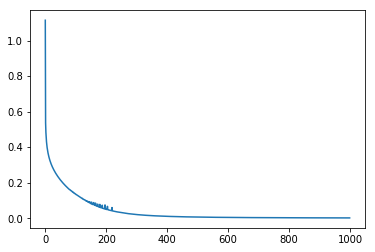

In [17]:
plt.plot(costs)

### Neural Network object 
#### NeuralNetwork(input_size, output_size, No of hidden layers, No of neurons per layer ,  activation function = "sigmoid")
 * For best results use NeuralNetwork(input_size, output_size, No of hidden layers = 2, No of neurons per layer = 500 ,  activation function = "tanh")

In [22]:
NNtanh = NeuralNetwork(X_train.shape[1] , 10, 2, 500, activation = "tanh")

### Fitting the model
#### NN.fit(Feature set, output class, epoch = 10, Learning Rate = 0.01, cost_check = False, batch = False, batch_size = -1,savefile = False)
* For best results use NN.fit(Feature set, output class, epoch = 1000, Learning Rate = 0.01, cost_check=True, batch = True, batch_size = 500, savefile=True)

In [19]:
costs = NNtanh.fit(X_train, y_train_enc, 1000, 0.005, cost_check=True, batch = True, batch_size = 500)

epoch:  0 iteration:  0
epoch:  0 iteration:  1
epoch:  0 iteration:  2
epoch:  0 iteration:  3
epoch:  0 iteration:  4
epoch:  0 iteration:  5
epoch:  0 iteration:  6
epoch:  0 iteration:  7
epoch:  0 iteration:  8
epoch:  0 iteration:  9
epoch:  0 iteration:  10
epoch:  0 iteration:  11
epoch:  0 iteration:  12
epoch:  0 iteration:  13
epoch:  0 iteration:  14
epoch:  0 iteration:  15
epoch:  0 iteration:  16
epoch:  0 iteration:  17
epoch:  0 iteration:  18
epoch:  0 iteration:  19
epoch:  0 iteration:  20
epoch:  0 iteration:  21
epoch:  0 iteration:  22
epoch:  0 iteration:  23
epoch:  0 iteration:  24
epoch:  0 iteration:  25
epoch:  0 iteration:  26
epoch:  0 iteration:  27
epoch:  0 iteration:  28
epoch:  0 iteration:  29
epoch:  0 iteration:  30
epoch:  0 iteration:  31
epoch:  0 iteration:  32
epoch:  0 iteration:  33
epoch:  0 iteration:  34
epoch:  0 iteration:  35
epoch:  0 iteration:  36
epoch:  0 iteration:  37
epoch:  0 iteration:  38
epoch:  0 iteration:  39
epoch:  0 

epoch:  3 iteration:  41
epoch:  3 iteration:  42
epoch:  3 iteration:  43
epoch:  3 iteration:  44
epoch:  3 iteration:  45
epoch:  3 iteration:  46
epoch:  3 iteration:  47
epoch:  3 iteration:  48
epoch:  3 iteration:  49
epoch:  3 iteration:  50
epoch:  3 iteration:  51
epoch:  3 iteration:  52
epoch:  3 iteration:  53
epoch:  3 iteration:  54
epoch:  3 iteration:  55
epoch:  3 iteration:  56
epoch:  3 iteration:  57
epoch:  3 iteration:  58
epoch:  3 iteration:  59
epoch:  3 iteration:  60
epoch:  3 iteration:  61
epoch:  3 iteration:  62
epoch:  3 iteration:  63
epoch:  3 iteration:  64
epoch:  3 iteration:  65
epoch:  3 iteration:  66
epoch:  3 iteration:  67
epoch:  3 iteration:  68
epoch:  3 iteration:  69
epoch:  3 iteration:  70
epoch:  3 iteration:  71
epoch:  3 iteration:  72
epoch:  3 iteration:  73
epoch:  3 iteration:  74
epoch:  3 iteration:  75
epoch:  3 iteration:  76
epoch:  3 iteration:  77
epoch:  3 iteration:  78
epoch:  3 iteration:  79
epoch:  3 iteration:  80


epoch:  6 iteration:  89
epoch:  6 iteration:  90
epoch:  6 iteration:  91
epoch:  6 iteration:  92
epoch:  6 iteration:  93
epoch:  6 iteration:  94
epoch:  6 iteration:  95
cost[ 6 ]:  0.5688013349296367
epoch:  7 iteration:  0
epoch:  7 iteration:  1
epoch:  7 iteration:  2
epoch:  7 iteration:  3
epoch:  7 iteration:  4
epoch:  7 iteration:  5
epoch:  7 iteration:  6
epoch:  7 iteration:  7
epoch:  7 iteration:  8
epoch:  7 iteration:  9
epoch:  7 iteration:  10
epoch:  7 iteration:  11
epoch:  7 iteration:  12
epoch:  7 iteration:  13
epoch:  7 iteration:  14
epoch:  7 iteration:  15
epoch:  7 iteration:  16
epoch:  7 iteration:  17
epoch:  7 iteration:  18
epoch:  7 iteration:  19
epoch:  7 iteration:  20
epoch:  7 iteration:  21
epoch:  7 iteration:  22
epoch:  7 iteration:  23
epoch:  7 iteration:  24
epoch:  7 iteration:  25
epoch:  7 iteration:  26
epoch:  7 iteration:  27
epoch:  7 iteration:  28
epoch:  7 iteration:  29
epoch:  7 iteration:  30
epoch:  7 iteration:  31
epoc

epoch:  10 iteration:  38
epoch:  10 iteration:  39
epoch:  10 iteration:  40
epoch:  10 iteration:  41
epoch:  10 iteration:  42
epoch:  10 iteration:  43
epoch:  10 iteration:  44
epoch:  10 iteration:  45
epoch:  10 iteration:  46
epoch:  10 iteration:  47
epoch:  10 iteration:  48
epoch:  10 iteration:  49
epoch:  10 iteration:  50
epoch:  10 iteration:  51
epoch:  10 iteration:  52
epoch:  10 iteration:  53
epoch:  10 iteration:  54
epoch:  10 iteration:  55
epoch:  10 iteration:  56
epoch:  10 iteration:  57
epoch:  10 iteration:  58
epoch:  10 iteration:  59
epoch:  10 iteration:  60
epoch:  10 iteration:  61
epoch:  10 iteration:  62
epoch:  10 iteration:  63
epoch:  10 iteration:  64
epoch:  10 iteration:  65
epoch:  10 iteration:  66
epoch:  10 iteration:  67
epoch:  10 iteration:  68
epoch:  10 iteration:  69
epoch:  10 iteration:  70
epoch:  10 iteration:  71
epoch:  10 iteration:  72
epoch:  10 iteration:  73
epoch:  10 iteration:  74
epoch:  10 iteration:  75
epoch:  10 i

epoch:  13 iteration:  73
epoch:  13 iteration:  74
epoch:  13 iteration:  75
epoch:  13 iteration:  76
epoch:  13 iteration:  77
epoch:  13 iteration:  78
epoch:  13 iteration:  79
epoch:  13 iteration:  80
epoch:  13 iteration:  81
epoch:  13 iteration:  82
epoch:  13 iteration:  83
epoch:  13 iteration:  84
epoch:  13 iteration:  85
epoch:  13 iteration:  86
epoch:  13 iteration:  87
epoch:  13 iteration:  88
epoch:  13 iteration:  89
epoch:  13 iteration:  90
epoch:  13 iteration:  91
epoch:  13 iteration:  92
epoch:  13 iteration:  93
epoch:  13 iteration:  94
epoch:  13 iteration:  95
cost[ 13 ]:  0.4544518617259451
epoch:  14 iteration:  0
epoch:  14 iteration:  1
epoch:  14 iteration:  2
epoch:  14 iteration:  3
epoch:  14 iteration:  4
epoch:  14 iteration:  5
epoch:  14 iteration:  6
epoch:  14 iteration:  7
epoch:  14 iteration:  8
epoch:  14 iteration:  9
epoch:  14 iteration:  10
epoch:  14 iteration:  11
epoch:  14 iteration:  12
epoch:  14 iteration:  13
epoch:  14 itera

epoch:  17 iteration:  2
epoch:  17 iteration:  3
epoch:  17 iteration:  4
epoch:  17 iteration:  5
epoch:  17 iteration:  6
epoch:  17 iteration:  7
epoch:  17 iteration:  8
epoch:  17 iteration:  9
epoch:  17 iteration:  10
epoch:  17 iteration:  11
epoch:  17 iteration:  12
epoch:  17 iteration:  13
epoch:  17 iteration:  14
epoch:  17 iteration:  15
epoch:  17 iteration:  16
epoch:  17 iteration:  17
epoch:  17 iteration:  18
epoch:  17 iteration:  19
epoch:  17 iteration:  20
epoch:  17 iteration:  21
epoch:  17 iteration:  22
epoch:  17 iteration:  23
epoch:  17 iteration:  24
epoch:  17 iteration:  25
epoch:  17 iteration:  26
epoch:  17 iteration:  27
epoch:  17 iteration:  28
epoch:  17 iteration:  29
epoch:  17 iteration:  30
epoch:  17 iteration:  31
epoch:  17 iteration:  32
epoch:  17 iteration:  33
epoch:  17 iteration:  34
epoch:  17 iteration:  35
epoch:  17 iteration:  36
epoch:  17 iteration:  37
epoch:  17 iteration:  38
epoch:  17 iteration:  39
epoch:  17 iteration

epoch:  20 iteration:  31
epoch:  20 iteration:  32
epoch:  20 iteration:  33
epoch:  20 iteration:  34
epoch:  20 iteration:  35
epoch:  20 iteration:  36
epoch:  20 iteration:  37
epoch:  20 iteration:  38
epoch:  20 iteration:  39
epoch:  20 iteration:  40
epoch:  20 iteration:  41
epoch:  20 iteration:  42
epoch:  20 iteration:  43
epoch:  20 iteration:  44
epoch:  20 iteration:  45
epoch:  20 iteration:  46
epoch:  20 iteration:  47
epoch:  20 iteration:  48
epoch:  20 iteration:  49
epoch:  20 iteration:  50
epoch:  20 iteration:  51
epoch:  20 iteration:  52
epoch:  20 iteration:  53
epoch:  20 iteration:  54
epoch:  20 iteration:  55
epoch:  20 iteration:  56
epoch:  20 iteration:  57
epoch:  20 iteration:  58
epoch:  20 iteration:  59
epoch:  20 iteration:  60
epoch:  20 iteration:  61
epoch:  20 iteration:  62
epoch:  20 iteration:  63
epoch:  20 iteration:  64
epoch:  20 iteration:  65
epoch:  20 iteration:  66
epoch:  20 iteration:  67
epoch:  20 iteration:  68
epoch:  20 i

epoch:  23 iteration:  60
epoch:  23 iteration:  61
epoch:  23 iteration:  62
epoch:  23 iteration:  63
epoch:  23 iteration:  64
epoch:  23 iteration:  65
epoch:  23 iteration:  66
epoch:  23 iteration:  67
epoch:  23 iteration:  68
epoch:  23 iteration:  69
epoch:  23 iteration:  70
epoch:  23 iteration:  71
epoch:  23 iteration:  72
epoch:  23 iteration:  73
epoch:  23 iteration:  74
epoch:  23 iteration:  75
epoch:  23 iteration:  76
epoch:  23 iteration:  77
epoch:  23 iteration:  78
epoch:  23 iteration:  79
epoch:  23 iteration:  80
epoch:  23 iteration:  81
epoch:  23 iteration:  82
epoch:  23 iteration:  83
epoch:  23 iteration:  84
epoch:  23 iteration:  85
epoch:  23 iteration:  86
epoch:  23 iteration:  87
epoch:  23 iteration:  88
epoch:  23 iteration:  89
epoch:  23 iteration:  90
epoch:  23 iteration:  91
epoch:  23 iteration:  92
epoch:  23 iteration:  93
epoch:  23 iteration:  94
epoch:  23 iteration:  95
cost[ 23 ]:  0.3956226184484194
epoch:  24 iteration:  0
epoch: 

epoch:  26 iteration:  88
epoch:  26 iteration:  89
epoch:  26 iteration:  90
epoch:  26 iteration:  91
epoch:  26 iteration:  92
epoch:  26 iteration:  93
epoch:  26 iteration:  94
epoch:  26 iteration:  95
cost[ 26 ]:  0.38490705273400444
epoch:  27 iteration:  0
epoch:  27 iteration:  1
epoch:  27 iteration:  2
epoch:  27 iteration:  3
epoch:  27 iteration:  4
epoch:  27 iteration:  5
epoch:  27 iteration:  6
epoch:  27 iteration:  7
epoch:  27 iteration:  8
epoch:  27 iteration:  9
epoch:  27 iteration:  10
epoch:  27 iteration:  11
epoch:  27 iteration:  12
epoch:  27 iteration:  13
epoch:  27 iteration:  14
epoch:  27 iteration:  15
epoch:  27 iteration:  16
epoch:  27 iteration:  17
epoch:  27 iteration:  18
epoch:  27 iteration:  19
epoch:  27 iteration:  20
epoch:  27 iteration:  21
epoch:  27 iteration:  22
epoch:  27 iteration:  23
epoch:  27 iteration:  24
epoch:  27 iteration:  25
epoch:  27 iteration:  26
epoch:  27 iteration:  27
epoch:  27 iteration:  28
epoch:  27 iter

epoch:  30 iteration:  18
epoch:  30 iteration:  19
epoch:  30 iteration:  20
epoch:  30 iteration:  21
epoch:  30 iteration:  22
epoch:  30 iteration:  23
epoch:  30 iteration:  24
epoch:  30 iteration:  25
epoch:  30 iteration:  26
epoch:  30 iteration:  27
epoch:  30 iteration:  28
epoch:  30 iteration:  29
epoch:  30 iteration:  30
epoch:  30 iteration:  31
epoch:  30 iteration:  32
epoch:  30 iteration:  33
epoch:  30 iteration:  34
epoch:  30 iteration:  35
epoch:  30 iteration:  36
epoch:  30 iteration:  37
epoch:  30 iteration:  38
epoch:  30 iteration:  39
epoch:  30 iteration:  40
epoch:  30 iteration:  41
epoch:  30 iteration:  42
epoch:  30 iteration:  43
epoch:  30 iteration:  44
epoch:  30 iteration:  45
epoch:  30 iteration:  46
epoch:  30 iteration:  47
epoch:  30 iteration:  48
epoch:  30 iteration:  49
epoch:  30 iteration:  50
epoch:  30 iteration:  51
epoch:  30 iteration:  52
epoch:  30 iteration:  53
epoch:  30 iteration:  54
epoch:  30 iteration:  55
epoch:  30 i

epoch:  33 iteration:  45
epoch:  33 iteration:  46
epoch:  33 iteration:  47
epoch:  33 iteration:  48
epoch:  33 iteration:  49
epoch:  33 iteration:  50
epoch:  33 iteration:  51
epoch:  33 iteration:  52
epoch:  33 iteration:  53
epoch:  33 iteration:  54
epoch:  33 iteration:  55
epoch:  33 iteration:  56
epoch:  33 iteration:  57
epoch:  33 iteration:  58
epoch:  33 iteration:  59
epoch:  33 iteration:  60
epoch:  33 iteration:  61
epoch:  33 iteration:  62
epoch:  33 iteration:  63
epoch:  33 iteration:  64
epoch:  33 iteration:  65
epoch:  33 iteration:  66
epoch:  33 iteration:  67
epoch:  33 iteration:  68
epoch:  33 iteration:  69
epoch:  33 iteration:  70
epoch:  33 iteration:  71
epoch:  33 iteration:  72
epoch:  33 iteration:  73
epoch:  33 iteration:  74
epoch:  33 iteration:  75
epoch:  33 iteration:  76
epoch:  33 iteration:  77
epoch:  33 iteration:  78
epoch:  33 iteration:  79
epoch:  33 iteration:  80
epoch:  33 iteration:  81
epoch:  33 iteration:  82
epoch:  33 i

epoch:  36 iteration:  76
epoch:  36 iteration:  77
epoch:  36 iteration:  78
epoch:  36 iteration:  79
epoch:  36 iteration:  80
epoch:  36 iteration:  81
epoch:  36 iteration:  82
epoch:  36 iteration:  83
epoch:  36 iteration:  84
epoch:  36 iteration:  85
epoch:  36 iteration:  86
epoch:  36 iteration:  87
epoch:  36 iteration:  88
epoch:  36 iteration:  89
epoch:  36 iteration:  90
epoch:  36 iteration:  91
epoch:  36 iteration:  92
epoch:  36 iteration:  93
epoch:  36 iteration:  94
epoch:  36 iteration:  95
cost[ 36 ]:  0.3617467753122865
epoch:  37 iteration:  0
epoch:  37 iteration:  1
epoch:  37 iteration:  2
epoch:  37 iteration:  3
epoch:  37 iteration:  4
epoch:  37 iteration:  5
epoch:  37 iteration:  6
epoch:  37 iteration:  7
epoch:  37 iteration:  8
epoch:  37 iteration:  9
epoch:  37 iteration:  10
epoch:  37 iteration:  11
epoch:  37 iteration:  12
epoch:  37 iteration:  13
epoch:  37 iteration:  14
epoch:  37 iteration:  15
epoch:  37 iteration:  16
epoch:  37 itera

epoch:  40 iteration:  11
epoch:  40 iteration:  12
epoch:  40 iteration:  13
epoch:  40 iteration:  14
epoch:  40 iteration:  15
epoch:  40 iteration:  16
epoch:  40 iteration:  17
epoch:  40 iteration:  18
epoch:  40 iteration:  19
epoch:  40 iteration:  20
epoch:  40 iteration:  21
epoch:  40 iteration:  22
epoch:  40 iteration:  23
epoch:  40 iteration:  24
epoch:  40 iteration:  25
epoch:  40 iteration:  26
epoch:  40 iteration:  27
epoch:  40 iteration:  28
epoch:  40 iteration:  29
epoch:  40 iteration:  30
epoch:  40 iteration:  31
epoch:  40 iteration:  32
epoch:  40 iteration:  33
epoch:  40 iteration:  34
epoch:  40 iteration:  35
epoch:  40 iteration:  36
epoch:  40 iteration:  37
epoch:  40 iteration:  38
epoch:  40 iteration:  39
epoch:  40 iteration:  40
epoch:  40 iteration:  41
epoch:  40 iteration:  42
epoch:  40 iteration:  43
epoch:  40 iteration:  44
epoch:  40 iteration:  45
epoch:  40 iteration:  46
epoch:  40 iteration:  47
epoch:  40 iteration:  48
epoch:  40 i

epoch:  43 iteration:  44
epoch:  43 iteration:  45
epoch:  43 iteration:  46
epoch:  43 iteration:  47
epoch:  43 iteration:  48
epoch:  43 iteration:  49
epoch:  43 iteration:  50
epoch:  43 iteration:  51
epoch:  43 iteration:  52
epoch:  43 iteration:  53
epoch:  43 iteration:  54
epoch:  43 iteration:  55
epoch:  43 iteration:  56
epoch:  43 iteration:  57
epoch:  43 iteration:  58
epoch:  43 iteration:  59
epoch:  43 iteration:  60
epoch:  43 iteration:  61
epoch:  43 iteration:  62
epoch:  43 iteration:  63
epoch:  43 iteration:  64
epoch:  43 iteration:  65
epoch:  43 iteration:  66
epoch:  43 iteration:  67
epoch:  43 iteration:  68
epoch:  43 iteration:  69
epoch:  43 iteration:  70
epoch:  43 iteration:  71
epoch:  43 iteration:  72
epoch:  43 iteration:  73
epoch:  43 iteration:  74
epoch:  43 iteration:  75
epoch:  43 iteration:  76
epoch:  43 iteration:  77
epoch:  43 iteration:  78
epoch:  43 iteration:  79
epoch:  43 iteration:  80
epoch:  43 iteration:  81
epoch:  43 i

epoch:  46 iteration:  70
epoch:  46 iteration:  71
epoch:  46 iteration:  72
epoch:  46 iteration:  73
epoch:  46 iteration:  74
epoch:  46 iteration:  75
epoch:  46 iteration:  76
epoch:  46 iteration:  77
epoch:  46 iteration:  78
epoch:  46 iteration:  79
epoch:  46 iteration:  80
epoch:  46 iteration:  81
epoch:  46 iteration:  82
epoch:  46 iteration:  83
epoch:  46 iteration:  84
epoch:  46 iteration:  85
epoch:  46 iteration:  86
epoch:  46 iteration:  87
epoch:  46 iteration:  88
epoch:  46 iteration:  89
epoch:  46 iteration:  90
epoch:  46 iteration:  91
epoch:  46 iteration:  92
epoch:  46 iteration:  93
epoch:  46 iteration:  94
epoch:  46 iteration:  95
cost[ 46 ]:  0.34448767276401593
epoch:  47 iteration:  0
epoch:  47 iteration:  1
epoch:  47 iteration:  2
epoch:  47 iteration:  3
epoch:  47 iteration:  4
epoch:  47 iteration:  5
epoch:  47 iteration:  6
epoch:  47 iteration:  7
epoch:  47 iteration:  8
epoch:  47 iteration:  9
epoch:  47 iteration:  10
epoch:  47 iter

epoch:  50 iteration:  7
epoch:  50 iteration:  8
epoch:  50 iteration:  9
epoch:  50 iteration:  10
epoch:  50 iteration:  11
epoch:  50 iteration:  12
epoch:  50 iteration:  13
epoch:  50 iteration:  14
epoch:  50 iteration:  15
epoch:  50 iteration:  16
epoch:  50 iteration:  17
epoch:  50 iteration:  18
epoch:  50 iteration:  19
epoch:  50 iteration:  20
epoch:  50 iteration:  21
epoch:  50 iteration:  22
epoch:  50 iteration:  23
epoch:  50 iteration:  24
epoch:  50 iteration:  25
epoch:  50 iteration:  26
epoch:  50 iteration:  27
epoch:  50 iteration:  28
epoch:  50 iteration:  29
epoch:  50 iteration:  30
epoch:  50 iteration:  31
epoch:  50 iteration:  32
epoch:  50 iteration:  33
epoch:  50 iteration:  34
epoch:  50 iteration:  35
epoch:  50 iteration:  36
epoch:  50 iteration:  37
epoch:  50 iteration:  38
epoch:  50 iteration:  39
epoch:  50 iteration:  40
epoch:  50 iteration:  41
epoch:  50 iteration:  42
epoch:  50 iteration:  43
epoch:  50 iteration:  44
epoch:  50 iter

epoch:  53 iteration:  38
epoch:  53 iteration:  39
epoch:  53 iteration:  40
epoch:  53 iteration:  41
epoch:  53 iteration:  42
epoch:  53 iteration:  43
epoch:  53 iteration:  44
epoch:  53 iteration:  45
epoch:  53 iteration:  46
epoch:  53 iteration:  47
epoch:  53 iteration:  48
epoch:  53 iteration:  49
epoch:  53 iteration:  50
epoch:  53 iteration:  51
epoch:  53 iteration:  52
epoch:  53 iteration:  53
epoch:  53 iteration:  54
epoch:  53 iteration:  55
epoch:  53 iteration:  56
epoch:  53 iteration:  57
epoch:  53 iteration:  58
epoch:  53 iteration:  59
epoch:  53 iteration:  60
epoch:  53 iteration:  61
epoch:  53 iteration:  62
epoch:  53 iteration:  63
epoch:  53 iteration:  64
epoch:  53 iteration:  65
epoch:  53 iteration:  66
epoch:  53 iteration:  67
epoch:  53 iteration:  68
epoch:  53 iteration:  69
epoch:  53 iteration:  70
epoch:  53 iteration:  71
epoch:  53 iteration:  72
epoch:  53 iteration:  73
epoch:  53 iteration:  74
epoch:  53 iteration:  75
epoch:  53 i

epoch:  56 iteration:  64
epoch:  56 iteration:  65
epoch:  56 iteration:  66
epoch:  56 iteration:  67
epoch:  56 iteration:  68
epoch:  56 iteration:  69
epoch:  56 iteration:  70
epoch:  56 iteration:  71
epoch:  56 iteration:  72
epoch:  56 iteration:  73
epoch:  56 iteration:  74
epoch:  56 iteration:  75
epoch:  56 iteration:  76
epoch:  56 iteration:  77
epoch:  56 iteration:  78
epoch:  56 iteration:  79
epoch:  56 iteration:  80
epoch:  56 iteration:  81
epoch:  56 iteration:  82
epoch:  56 iteration:  83
epoch:  56 iteration:  84
epoch:  56 iteration:  85
epoch:  56 iteration:  86
epoch:  56 iteration:  87
epoch:  56 iteration:  88
epoch:  56 iteration:  89
epoch:  56 iteration:  90
epoch:  56 iteration:  91
epoch:  56 iteration:  92
epoch:  56 iteration:  93
epoch:  56 iteration:  94
epoch:  56 iteration:  95
cost[ 56 ]:  0.3330709823212952
epoch:  57 iteration:  0
epoch:  57 iteration:  1
epoch:  57 iteration:  2
epoch:  57 iteration:  3
epoch:  57 iteration:  4
epoch:  57 

epoch:  59 iteration:  92
epoch:  59 iteration:  93
epoch:  59 iteration:  94
epoch:  59 iteration:  95
cost[ 59 ]:  0.3277804495372898
epoch:  60 iteration:  0
epoch:  60 iteration:  1
epoch:  60 iteration:  2
epoch:  60 iteration:  3
epoch:  60 iteration:  4
epoch:  60 iteration:  5
epoch:  60 iteration:  6
epoch:  60 iteration:  7
epoch:  60 iteration:  8
epoch:  60 iteration:  9
epoch:  60 iteration:  10
epoch:  60 iteration:  11
epoch:  60 iteration:  12
epoch:  60 iteration:  13
epoch:  60 iteration:  14
epoch:  60 iteration:  15
epoch:  60 iteration:  16
epoch:  60 iteration:  17
epoch:  60 iteration:  18
epoch:  60 iteration:  19
epoch:  60 iteration:  20
epoch:  60 iteration:  21
epoch:  60 iteration:  22
epoch:  60 iteration:  23
epoch:  60 iteration:  24
epoch:  60 iteration:  25
epoch:  60 iteration:  26
epoch:  60 iteration:  27
epoch:  60 iteration:  28
epoch:  60 iteration:  29
epoch:  60 iteration:  30
epoch:  60 iteration:  31
epoch:  60 iteration:  32
epoch:  60 itera

epoch:  63 iteration:  25
epoch:  63 iteration:  26
epoch:  63 iteration:  27
epoch:  63 iteration:  28
epoch:  63 iteration:  29
epoch:  63 iteration:  30
epoch:  63 iteration:  31
epoch:  63 iteration:  32
epoch:  63 iteration:  33
epoch:  63 iteration:  34
epoch:  63 iteration:  35
epoch:  63 iteration:  36
epoch:  63 iteration:  37
epoch:  63 iteration:  38
epoch:  63 iteration:  39
epoch:  63 iteration:  40
epoch:  63 iteration:  41
epoch:  63 iteration:  42
epoch:  63 iteration:  43
epoch:  63 iteration:  44
epoch:  63 iteration:  45
epoch:  63 iteration:  46
epoch:  63 iteration:  47
epoch:  63 iteration:  48
epoch:  63 iteration:  49
epoch:  63 iteration:  50
epoch:  63 iteration:  51
epoch:  63 iteration:  52
epoch:  63 iteration:  53
epoch:  63 iteration:  54
epoch:  63 iteration:  55
epoch:  63 iteration:  56
epoch:  63 iteration:  57
epoch:  63 iteration:  58
epoch:  63 iteration:  59
epoch:  63 iteration:  60
epoch:  63 iteration:  61
epoch:  63 iteration:  62
epoch:  63 i

epoch:  66 iteration:  58
epoch:  66 iteration:  59
epoch:  66 iteration:  60
epoch:  66 iteration:  61
epoch:  66 iteration:  62
epoch:  66 iteration:  63
epoch:  66 iteration:  64
epoch:  66 iteration:  65
epoch:  66 iteration:  66
epoch:  66 iteration:  67
epoch:  66 iteration:  68
epoch:  66 iteration:  69
epoch:  66 iteration:  70
epoch:  66 iteration:  71
epoch:  66 iteration:  72
epoch:  66 iteration:  73
epoch:  66 iteration:  74
epoch:  66 iteration:  75
epoch:  66 iteration:  76
epoch:  66 iteration:  77
epoch:  66 iteration:  78
epoch:  66 iteration:  79
epoch:  66 iteration:  80
epoch:  66 iteration:  81
epoch:  66 iteration:  82
epoch:  66 iteration:  83
epoch:  66 iteration:  84
epoch:  66 iteration:  85
epoch:  66 iteration:  86
epoch:  66 iteration:  87
epoch:  66 iteration:  88
epoch:  66 iteration:  89
epoch:  66 iteration:  90
epoch:  66 iteration:  91
epoch:  66 iteration:  92
epoch:  66 iteration:  93
epoch:  66 iteration:  94
epoch:  66 iteration:  95
cost[ 66 ]: 

epoch:  69 iteration:  91
epoch:  69 iteration:  92
epoch:  69 iteration:  93
epoch:  69 iteration:  94
epoch:  69 iteration:  95
cost[ 69 ]:  0.32751127020608645
epoch:  70 iteration:  0
epoch:  70 iteration:  1
epoch:  70 iteration:  2
epoch:  70 iteration:  3
epoch:  70 iteration:  4
epoch:  70 iteration:  5
epoch:  70 iteration:  6
epoch:  70 iteration:  7
epoch:  70 iteration:  8
epoch:  70 iteration:  9
epoch:  70 iteration:  10
epoch:  70 iteration:  11
epoch:  70 iteration:  12
epoch:  70 iteration:  13
epoch:  70 iteration:  14
epoch:  70 iteration:  15
epoch:  70 iteration:  16
epoch:  70 iteration:  17
epoch:  70 iteration:  18
epoch:  70 iteration:  19
epoch:  70 iteration:  20
epoch:  70 iteration:  21
epoch:  70 iteration:  22
epoch:  70 iteration:  23
epoch:  70 iteration:  24
epoch:  70 iteration:  25
epoch:  70 iteration:  26
epoch:  70 iteration:  27
epoch:  70 iteration:  28
epoch:  70 iteration:  29
epoch:  70 iteration:  30
epoch:  70 iteration:  31
epoch:  70 iter

epoch:  73 iteration:  25
epoch:  73 iteration:  26
epoch:  73 iteration:  27
epoch:  73 iteration:  28
epoch:  73 iteration:  29
epoch:  73 iteration:  30
epoch:  73 iteration:  31
epoch:  73 iteration:  32
epoch:  73 iteration:  33
epoch:  73 iteration:  34
epoch:  73 iteration:  35
epoch:  73 iteration:  36
epoch:  73 iteration:  37
epoch:  73 iteration:  38
epoch:  73 iteration:  39
epoch:  73 iteration:  40
epoch:  73 iteration:  41
epoch:  73 iteration:  42
epoch:  73 iteration:  43
epoch:  73 iteration:  44
epoch:  73 iteration:  45
epoch:  73 iteration:  46
epoch:  73 iteration:  47
epoch:  73 iteration:  48
epoch:  73 iteration:  49
epoch:  73 iteration:  50
epoch:  73 iteration:  51
epoch:  73 iteration:  52
epoch:  73 iteration:  53
epoch:  73 iteration:  54
epoch:  73 iteration:  55
epoch:  73 iteration:  56
epoch:  73 iteration:  57
epoch:  73 iteration:  58
epoch:  73 iteration:  59
epoch:  73 iteration:  60
epoch:  73 iteration:  61
epoch:  73 iteration:  62
epoch:  73 i

epoch:  76 iteration:  55
epoch:  76 iteration:  56
epoch:  76 iteration:  57
epoch:  76 iteration:  58
epoch:  76 iteration:  59
epoch:  76 iteration:  60
epoch:  76 iteration:  61
epoch:  76 iteration:  62
epoch:  76 iteration:  63
epoch:  76 iteration:  64
epoch:  76 iteration:  65
epoch:  76 iteration:  66
epoch:  76 iteration:  67
epoch:  76 iteration:  68
epoch:  76 iteration:  69
epoch:  76 iteration:  70
epoch:  76 iteration:  71
epoch:  76 iteration:  72
epoch:  76 iteration:  73
epoch:  76 iteration:  74
epoch:  76 iteration:  75
epoch:  76 iteration:  76
epoch:  76 iteration:  77
epoch:  76 iteration:  78
epoch:  76 iteration:  79
epoch:  76 iteration:  80
epoch:  76 iteration:  81
epoch:  76 iteration:  82
epoch:  76 iteration:  83
epoch:  76 iteration:  84
epoch:  76 iteration:  85
epoch:  76 iteration:  86
epoch:  76 iteration:  87
epoch:  76 iteration:  88
epoch:  76 iteration:  89
epoch:  76 iteration:  90
epoch:  76 iteration:  91
epoch:  76 iteration:  92
epoch:  76 i

epoch:  79 iteration:  87
epoch:  79 iteration:  88
epoch:  79 iteration:  89
epoch:  79 iteration:  90
epoch:  79 iteration:  91
epoch:  79 iteration:  92
epoch:  79 iteration:  93
epoch:  79 iteration:  94
epoch:  79 iteration:  95
cost[ 79 ]:  0.32003961412466564
epoch:  80 iteration:  0
epoch:  80 iteration:  1
epoch:  80 iteration:  2
epoch:  80 iteration:  3
epoch:  80 iteration:  4
epoch:  80 iteration:  5
epoch:  80 iteration:  6
epoch:  80 iteration:  7
epoch:  80 iteration:  8
epoch:  80 iteration:  9
epoch:  80 iteration:  10
epoch:  80 iteration:  11
epoch:  80 iteration:  12
epoch:  80 iteration:  13
epoch:  80 iteration:  14
epoch:  80 iteration:  15
epoch:  80 iteration:  16
epoch:  80 iteration:  17
epoch:  80 iteration:  18
epoch:  80 iteration:  19
epoch:  80 iteration:  20
epoch:  80 iteration:  21
epoch:  80 iteration:  22
epoch:  80 iteration:  23
epoch:  80 iteration:  24
epoch:  80 iteration:  25
epoch:  80 iteration:  26
epoch:  80 iteration:  27
epoch:  80 iter

epoch:  83 iteration:  27
epoch:  83 iteration:  28
epoch:  83 iteration:  29
epoch:  83 iteration:  30
epoch:  83 iteration:  31
epoch:  83 iteration:  32
epoch:  83 iteration:  33
epoch:  83 iteration:  34
epoch:  83 iteration:  35
epoch:  83 iteration:  36
epoch:  83 iteration:  37
epoch:  83 iteration:  38
epoch:  83 iteration:  39
epoch:  83 iteration:  40
epoch:  83 iteration:  41
epoch:  83 iteration:  42
epoch:  83 iteration:  43
epoch:  83 iteration:  44
epoch:  83 iteration:  45
epoch:  83 iteration:  46
epoch:  83 iteration:  47
epoch:  83 iteration:  48
epoch:  83 iteration:  49
epoch:  83 iteration:  50
epoch:  83 iteration:  51
epoch:  83 iteration:  52
epoch:  83 iteration:  53
epoch:  83 iteration:  54
epoch:  83 iteration:  55
epoch:  83 iteration:  56
epoch:  83 iteration:  57
epoch:  83 iteration:  58
epoch:  83 iteration:  59
epoch:  83 iteration:  60
epoch:  83 iteration:  61
epoch:  83 iteration:  62
epoch:  83 iteration:  63
epoch:  83 iteration:  64
epoch:  83 i

epoch:  86 iteration:  59
epoch:  86 iteration:  60
epoch:  86 iteration:  61
epoch:  86 iteration:  62
epoch:  86 iteration:  63
epoch:  86 iteration:  64
epoch:  86 iteration:  65
epoch:  86 iteration:  66
epoch:  86 iteration:  67
epoch:  86 iteration:  68
epoch:  86 iteration:  69
epoch:  86 iteration:  70
epoch:  86 iteration:  71
epoch:  86 iteration:  72
epoch:  86 iteration:  73
epoch:  86 iteration:  74
epoch:  86 iteration:  75
epoch:  86 iteration:  76
epoch:  86 iteration:  77
epoch:  86 iteration:  78
epoch:  86 iteration:  79
epoch:  86 iteration:  80
epoch:  86 iteration:  81
epoch:  86 iteration:  82
epoch:  86 iteration:  83
epoch:  86 iteration:  84
epoch:  86 iteration:  85
epoch:  86 iteration:  86
epoch:  86 iteration:  87
epoch:  86 iteration:  88
epoch:  86 iteration:  89
epoch:  86 iteration:  90
epoch:  86 iteration:  91
epoch:  86 iteration:  92
epoch:  86 iteration:  93
epoch:  86 iteration:  94
epoch:  86 iteration:  95
cost[ 86 ]:  0.3150353411446689
epoch:

epoch:  89 iteration:  89
epoch:  89 iteration:  90
epoch:  89 iteration:  91
epoch:  89 iteration:  92
epoch:  89 iteration:  93
epoch:  89 iteration:  94
epoch:  89 iteration:  95
cost[ 89 ]:  0.3173922913442476
epoch:  90 iteration:  0
epoch:  90 iteration:  1
epoch:  90 iteration:  2
epoch:  90 iteration:  3
epoch:  90 iteration:  4
epoch:  90 iteration:  5
epoch:  90 iteration:  6
epoch:  90 iteration:  7
epoch:  90 iteration:  8
epoch:  90 iteration:  9
epoch:  90 iteration:  10
epoch:  90 iteration:  11
epoch:  90 iteration:  12
epoch:  90 iteration:  13
epoch:  90 iteration:  14
epoch:  90 iteration:  15
epoch:  90 iteration:  16
epoch:  90 iteration:  17
epoch:  90 iteration:  18
epoch:  90 iteration:  19
epoch:  90 iteration:  20
epoch:  90 iteration:  21
epoch:  90 iteration:  22
epoch:  90 iteration:  23
epoch:  90 iteration:  24
epoch:  90 iteration:  25
epoch:  90 iteration:  26
epoch:  90 iteration:  27
epoch:  90 iteration:  28
epoch:  90 iteration:  29
epoch:  90 itera

epoch:  93 iteration:  17
epoch:  93 iteration:  18
epoch:  93 iteration:  19
epoch:  93 iteration:  20
epoch:  93 iteration:  21
epoch:  93 iteration:  22
epoch:  93 iteration:  23
epoch:  93 iteration:  24
epoch:  93 iteration:  25
epoch:  93 iteration:  26
epoch:  93 iteration:  27
epoch:  93 iteration:  28
epoch:  93 iteration:  29
epoch:  93 iteration:  30
epoch:  93 iteration:  31
epoch:  93 iteration:  32
epoch:  93 iteration:  33
epoch:  93 iteration:  34
epoch:  93 iteration:  35
epoch:  93 iteration:  36
epoch:  93 iteration:  37
epoch:  93 iteration:  38
epoch:  93 iteration:  39
epoch:  93 iteration:  40
epoch:  93 iteration:  41
epoch:  93 iteration:  42
epoch:  93 iteration:  43
epoch:  93 iteration:  44
epoch:  93 iteration:  45
epoch:  93 iteration:  46
epoch:  93 iteration:  47
epoch:  93 iteration:  48
epoch:  93 iteration:  49
epoch:  93 iteration:  50
epoch:  93 iteration:  51
epoch:  93 iteration:  52
epoch:  93 iteration:  53
epoch:  93 iteration:  54
epoch:  93 i

epoch:  96 iteration:  43
epoch:  96 iteration:  44
epoch:  96 iteration:  45
epoch:  96 iteration:  46
epoch:  96 iteration:  47
epoch:  96 iteration:  48
epoch:  96 iteration:  49
epoch:  96 iteration:  50
epoch:  96 iteration:  51
epoch:  96 iteration:  52
epoch:  96 iteration:  53
epoch:  96 iteration:  54
epoch:  96 iteration:  55
epoch:  96 iteration:  56
epoch:  96 iteration:  57
epoch:  96 iteration:  58
epoch:  96 iteration:  59
epoch:  96 iteration:  60
epoch:  96 iteration:  61
epoch:  96 iteration:  62
epoch:  96 iteration:  63
epoch:  96 iteration:  64
epoch:  96 iteration:  65
epoch:  96 iteration:  66
epoch:  96 iteration:  67
epoch:  96 iteration:  68
epoch:  96 iteration:  69
epoch:  96 iteration:  70
epoch:  96 iteration:  71
epoch:  96 iteration:  72
epoch:  96 iteration:  73
epoch:  96 iteration:  74
epoch:  96 iteration:  75
epoch:  96 iteration:  76
epoch:  96 iteration:  77
epoch:  96 iteration:  78
epoch:  96 iteration:  79
epoch:  96 iteration:  80
epoch:  96 i

epoch:  99 iteration:  77
epoch:  99 iteration:  78
epoch:  99 iteration:  79
epoch:  99 iteration:  80
epoch:  99 iteration:  81
epoch:  99 iteration:  82
epoch:  99 iteration:  83
epoch:  99 iteration:  84
epoch:  99 iteration:  85
epoch:  99 iteration:  86
epoch:  99 iteration:  87
epoch:  99 iteration:  88
epoch:  99 iteration:  89
epoch:  99 iteration:  90
epoch:  99 iteration:  91
epoch:  99 iteration:  92
epoch:  99 iteration:  93
epoch:  99 iteration:  94
epoch:  99 iteration:  95
cost[ 99 ]:  0.3164866108491585
epoch:  100 iteration:  0
epoch:  100 iteration:  1
epoch:  100 iteration:  2
epoch:  100 iteration:  3
epoch:  100 iteration:  4
epoch:  100 iteration:  5
epoch:  100 iteration:  6
epoch:  100 iteration:  7
epoch:  100 iteration:  8
epoch:  100 iteration:  9
epoch:  100 iteration:  10
epoch:  100 iteration:  11
epoch:  100 iteration:  12
epoch:  100 iteration:  13
epoch:  100 iteration:  14
epoch:  100 iteration:  15
epoch:  100 iteration:  16
epoch:  100 iteration:  1

epoch:  102 iteration:  94
epoch:  102 iteration:  95
cost[ 102 ]:  0.3204356595293814
epoch:  103 iteration:  0
epoch:  103 iteration:  1
epoch:  103 iteration:  2
epoch:  103 iteration:  3
epoch:  103 iteration:  4
epoch:  103 iteration:  5
epoch:  103 iteration:  6
epoch:  103 iteration:  7
epoch:  103 iteration:  8
epoch:  103 iteration:  9
epoch:  103 iteration:  10
epoch:  103 iteration:  11
epoch:  103 iteration:  12
epoch:  103 iteration:  13
epoch:  103 iteration:  14
epoch:  103 iteration:  15
epoch:  103 iteration:  16
epoch:  103 iteration:  17
epoch:  103 iteration:  18
epoch:  103 iteration:  19
epoch:  103 iteration:  20
epoch:  103 iteration:  21
epoch:  103 iteration:  22
epoch:  103 iteration:  23
epoch:  103 iteration:  24
epoch:  103 iteration:  25
epoch:  103 iteration:  26
epoch:  103 iteration:  27
epoch:  103 iteration:  28
epoch:  103 iteration:  29
epoch:  103 iteration:  30
epoch:  103 iteration:  31
epoch:  103 iteration:  32
epoch:  103 iteration:  33
epoch

epoch:  106 iteration:  12
epoch:  106 iteration:  13
epoch:  106 iteration:  14
epoch:  106 iteration:  15
epoch:  106 iteration:  16
epoch:  106 iteration:  17
epoch:  106 iteration:  18
epoch:  106 iteration:  19
epoch:  106 iteration:  20
epoch:  106 iteration:  21
epoch:  106 iteration:  22
epoch:  106 iteration:  23
epoch:  106 iteration:  24
epoch:  106 iteration:  25
epoch:  106 iteration:  26
epoch:  106 iteration:  27
epoch:  106 iteration:  28
epoch:  106 iteration:  29
epoch:  106 iteration:  30
epoch:  106 iteration:  31
epoch:  106 iteration:  32
epoch:  106 iteration:  33
epoch:  106 iteration:  34
epoch:  106 iteration:  35
epoch:  106 iteration:  36
epoch:  106 iteration:  37
epoch:  106 iteration:  38
epoch:  106 iteration:  39
epoch:  106 iteration:  40
epoch:  106 iteration:  41
epoch:  106 iteration:  42
epoch:  106 iteration:  43
epoch:  106 iteration:  44
epoch:  106 iteration:  45
epoch:  106 iteration:  46
epoch:  106 iteration:  47
epoch:  106 iteration:  48
e

epoch:  109 iteration:  28
epoch:  109 iteration:  29
epoch:  109 iteration:  30
epoch:  109 iteration:  31
epoch:  109 iteration:  32
epoch:  109 iteration:  33
epoch:  109 iteration:  34
epoch:  109 iteration:  35
epoch:  109 iteration:  36
epoch:  109 iteration:  37
epoch:  109 iteration:  38
epoch:  109 iteration:  39
epoch:  109 iteration:  40
epoch:  109 iteration:  41
epoch:  109 iteration:  42
epoch:  109 iteration:  43
epoch:  109 iteration:  44
epoch:  109 iteration:  45
epoch:  109 iteration:  46
epoch:  109 iteration:  47
epoch:  109 iteration:  48
epoch:  109 iteration:  49
epoch:  109 iteration:  50
epoch:  109 iteration:  51
epoch:  109 iteration:  52
epoch:  109 iteration:  53
epoch:  109 iteration:  54
epoch:  109 iteration:  55
epoch:  109 iteration:  56
epoch:  109 iteration:  57
epoch:  109 iteration:  58
epoch:  109 iteration:  59
epoch:  109 iteration:  60
epoch:  109 iteration:  61
epoch:  109 iteration:  62
epoch:  109 iteration:  63
epoch:  109 iteration:  64
e

epoch:  112 iteration:  52
epoch:  112 iteration:  53
epoch:  112 iteration:  54
epoch:  112 iteration:  55
epoch:  112 iteration:  56
epoch:  112 iteration:  57
epoch:  112 iteration:  58
epoch:  112 iteration:  59
epoch:  112 iteration:  60
epoch:  112 iteration:  61
epoch:  112 iteration:  62
epoch:  112 iteration:  63
epoch:  112 iteration:  64
epoch:  112 iteration:  65
epoch:  112 iteration:  66
epoch:  112 iteration:  67
epoch:  112 iteration:  68
epoch:  112 iteration:  69
epoch:  112 iteration:  70
epoch:  112 iteration:  71
epoch:  112 iteration:  72
epoch:  112 iteration:  73
epoch:  112 iteration:  74
epoch:  112 iteration:  75
epoch:  112 iteration:  76
epoch:  112 iteration:  77
epoch:  112 iteration:  78
epoch:  112 iteration:  79
epoch:  112 iteration:  80
epoch:  112 iteration:  81
epoch:  112 iteration:  82
epoch:  112 iteration:  83
epoch:  112 iteration:  84
epoch:  112 iteration:  85
epoch:  112 iteration:  86
epoch:  112 iteration:  87
epoch:  112 iteration:  88
e

epoch:  115 iteration:  68
epoch:  115 iteration:  69
epoch:  115 iteration:  70
epoch:  115 iteration:  71
epoch:  115 iteration:  72
epoch:  115 iteration:  73
epoch:  115 iteration:  74
epoch:  115 iteration:  75
epoch:  115 iteration:  76
epoch:  115 iteration:  77
epoch:  115 iteration:  78
epoch:  115 iteration:  79
epoch:  115 iteration:  80
epoch:  115 iteration:  81
epoch:  115 iteration:  82
epoch:  115 iteration:  83
epoch:  115 iteration:  84
epoch:  115 iteration:  85
epoch:  115 iteration:  86
epoch:  115 iteration:  87
epoch:  115 iteration:  88
epoch:  115 iteration:  89
epoch:  115 iteration:  90
epoch:  115 iteration:  91
epoch:  115 iteration:  92
epoch:  115 iteration:  93
epoch:  115 iteration:  94
epoch:  115 iteration:  95
cost[ 115 ]:  0.3221890842983651
epoch:  116 iteration:  0
epoch:  116 iteration:  1
epoch:  116 iteration:  2
epoch:  116 iteration:  3
epoch:  116 iteration:  4
epoch:  116 iteration:  5
epoch:  116 iteration:  6
epoch:  116 iteration:  7
epo

epoch:  118 iteration:  84
epoch:  118 iteration:  85
epoch:  118 iteration:  86
epoch:  118 iteration:  87
epoch:  118 iteration:  88
epoch:  118 iteration:  89
epoch:  118 iteration:  90
epoch:  118 iteration:  91
epoch:  118 iteration:  92
epoch:  118 iteration:  93
epoch:  118 iteration:  94
epoch:  118 iteration:  95
cost[ 118 ]:  0.31637243869712955
epoch:  119 iteration:  0
epoch:  119 iteration:  1
epoch:  119 iteration:  2
epoch:  119 iteration:  3
epoch:  119 iteration:  4
epoch:  119 iteration:  5
epoch:  119 iteration:  6
epoch:  119 iteration:  7
epoch:  119 iteration:  8
epoch:  119 iteration:  9
epoch:  119 iteration:  10
epoch:  119 iteration:  11
epoch:  119 iteration:  12
epoch:  119 iteration:  13
epoch:  119 iteration:  14
epoch:  119 iteration:  15
epoch:  119 iteration:  16
epoch:  119 iteration:  17
epoch:  119 iteration:  18
epoch:  119 iteration:  19
epoch:  119 iteration:  20
epoch:  119 iteration:  21
epoch:  119 iteration:  22
epoch:  119 iteration:  23
epoc

epoch:  122 iteration:  1
epoch:  122 iteration:  2
epoch:  122 iteration:  3
epoch:  122 iteration:  4
epoch:  122 iteration:  5
epoch:  122 iteration:  6
epoch:  122 iteration:  7
epoch:  122 iteration:  8
epoch:  122 iteration:  9
epoch:  122 iteration:  10
epoch:  122 iteration:  11
epoch:  122 iteration:  12
epoch:  122 iteration:  13
epoch:  122 iteration:  14
epoch:  122 iteration:  15
epoch:  122 iteration:  16
epoch:  122 iteration:  17
epoch:  122 iteration:  18
epoch:  122 iteration:  19
epoch:  122 iteration:  20
epoch:  122 iteration:  21
epoch:  122 iteration:  22
epoch:  122 iteration:  23
epoch:  122 iteration:  24
epoch:  122 iteration:  25
epoch:  122 iteration:  26
epoch:  122 iteration:  27
epoch:  122 iteration:  28
epoch:  122 iteration:  29
epoch:  122 iteration:  30
epoch:  122 iteration:  31
epoch:  122 iteration:  32
epoch:  122 iteration:  33
epoch:  122 iteration:  34
epoch:  122 iteration:  35
epoch:  122 iteration:  36
epoch:  122 iteration:  37
epoch:  12

epoch:  125 iteration:  20
epoch:  125 iteration:  21
epoch:  125 iteration:  22
epoch:  125 iteration:  23
epoch:  125 iteration:  24
epoch:  125 iteration:  25
epoch:  125 iteration:  26
epoch:  125 iteration:  27
epoch:  125 iteration:  28
epoch:  125 iteration:  29
epoch:  125 iteration:  30
epoch:  125 iteration:  31
epoch:  125 iteration:  32
epoch:  125 iteration:  33
epoch:  125 iteration:  34
epoch:  125 iteration:  35
epoch:  125 iteration:  36
epoch:  125 iteration:  37
epoch:  125 iteration:  38
epoch:  125 iteration:  39
epoch:  125 iteration:  40
epoch:  125 iteration:  41
epoch:  125 iteration:  42
epoch:  125 iteration:  43
epoch:  125 iteration:  44
epoch:  125 iteration:  45
epoch:  125 iteration:  46
epoch:  125 iteration:  47
epoch:  125 iteration:  48
epoch:  125 iteration:  49
epoch:  125 iteration:  50
epoch:  125 iteration:  51
epoch:  125 iteration:  52
epoch:  125 iteration:  53
epoch:  125 iteration:  54
epoch:  125 iteration:  55
epoch:  125 iteration:  56
e

epoch:  128 iteration:  37
epoch:  128 iteration:  38
epoch:  128 iteration:  39
epoch:  128 iteration:  40
epoch:  128 iteration:  41
epoch:  128 iteration:  42
epoch:  128 iteration:  43
epoch:  128 iteration:  44
epoch:  128 iteration:  45
epoch:  128 iteration:  46
epoch:  128 iteration:  47
epoch:  128 iteration:  48
epoch:  128 iteration:  49
epoch:  128 iteration:  50
epoch:  128 iteration:  51
epoch:  128 iteration:  52
epoch:  128 iteration:  53
epoch:  128 iteration:  54
epoch:  128 iteration:  55
epoch:  128 iteration:  56
epoch:  128 iteration:  57
epoch:  128 iteration:  58
epoch:  128 iteration:  59
epoch:  128 iteration:  60
epoch:  128 iteration:  61
epoch:  128 iteration:  62
epoch:  128 iteration:  63
epoch:  128 iteration:  64
epoch:  128 iteration:  65
epoch:  128 iteration:  66
epoch:  128 iteration:  67
epoch:  128 iteration:  68
epoch:  128 iteration:  69
epoch:  128 iteration:  70
epoch:  128 iteration:  71
epoch:  128 iteration:  72
epoch:  128 iteration:  73
e

epoch:  131 iteration:  56
epoch:  131 iteration:  57
epoch:  131 iteration:  58
epoch:  131 iteration:  59
epoch:  131 iteration:  60
epoch:  131 iteration:  61
epoch:  131 iteration:  62
epoch:  131 iteration:  63
epoch:  131 iteration:  64
epoch:  131 iteration:  65
epoch:  131 iteration:  66
epoch:  131 iteration:  67
epoch:  131 iteration:  68
epoch:  131 iteration:  69
epoch:  131 iteration:  70
epoch:  131 iteration:  71
epoch:  131 iteration:  72
epoch:  131 iteration:  73
epoch:  131 iteration:  74
epoch:  131 iteration:  75
epoch:  131 iteration:  76
epoch:  131 iteration:  77
epoch:  131 iteration:  78
epoch:  131 iteration:  79
epoch:  131 iteration:  80
epoch:  131 iteration:  81
epoch:  131 iteration:  82
epoch:  131 iteration:  83
epoch:  131 iteration:  84
epoch:  131 iteration:  85
epoch:  131 iteration:  86
epoch:  131 iteration:  87
epoch:  131 iteration:  88
epoch:  131 iteration:  89
epoch:  131 iteration:  90
epoch:  131 iteration:  91
epoch:  131 iteration:  92
e

epoch:  134 iteration:  71
epoch:  134 iteration:  72
epoch:  134 iteration:  73
epoch:  134 iteration:  74
epoch:  134 iteration:  75
epoch:  134 iteration:  76
epoch:  134 iteration:  77
epoch:  134 iteration:  78
epoch:  134 iteration:  79
epoch:  134 iteration:  80
epoch:  134 iteration:  81
epoch:  134 iteration:  82
epoch:  134 iteration:  83
epoch:  134 iteration:  84
epoch:  134 iteration:  85
epoch:  134 iteration:  86
epoch:  134 iteration:  87
epoch:  134 iteration:  88
epoch:  134 iteration:  89
epoch:  134 iteration:  90
epoch:  134 iteration:  91
epoch:  134 iteration:  92
epoch:  134 iteration:  93
epoch:  134 iteration:  94
epoch:  134 iteration:  95
cost[ 134 ]:  0.3163887050795431
epoch:  135 iteration:  0
epoch:  135 iteration:  1
epoch:  135 iteration:  2
epoch:  135 iteration:  3
epoch:  135 iteration:  4
epoch:  135 iteration:  5
epoch:  135 iteration:  6
epoch:  135 iteration:  7
epoch:  135 iteration:  8
epoch:  135 iteration:  9
epoch:  135 iteration:  10
epoch

epoch:  137 iteration:  91
epoch:  137 iteration:  92
epoch:  137 iteration:  93
epoch:  137 iteration:  94
epoch:  137 iteration:  95
cost[ 137 ]:  0.32198348235754537
epoch:  138 iteration:  0
epoch:  138 iteration:  1
epoch:  138 iteration:  2
epoch:  138 iteration:  3
epoch:  138 iteration:  4
epoch:  138 iteration:  5
epoch:  138 iteration:  6
epoch:  138 iteration:  7
epoch:  138 iteration:  8
epoch:  138 iteration:  9
epoch:  138 iteration:  10
epoch:  138 iteration:  11
epoch:  138 iteration:  12
epoch:  138 iteration:  13
epoch:  138 iteration:  14
epoch:  138 iteration:  15
epoch:  138 iteration:  16
epoch:  138 iteration:  17
epoch:  138 iteration:  18
epoch:  138 iteration:  19
epoch:  138 iteration:  20
epoch:  138 iteration:  21
epoch:  138 iteration:  22
epoch:  138 iteration:  23
epoch:  138 iteration:  24
epoch:  138 iteration:  25
epoch:  138 iteration:  26
epoch:  138 iteration:  27
epoch:  138 iteration:  28
epoch:  138 iteration:  29
epoch:  138 iteration:  30
epoc

epoch:  141 iteration:  17
epoch:  141 iteration:  18
epoch:  141 iteration:  19
epoch:  141 iteration:  20
epoch:  141 iteration:  21
epoch:  141 iteration:  22
epoch:  141 iteration:  23
epoch:  141 iteration:  24
epoch:  141 iteration:  25
epoch:  141 iteration:  26
epoch:  141 iteration:  27
epoch:  141 iteration:  28
epoch:  141 iteration:  29
epoch:  141 iteration:  30
epoch:  141 iteration:  31
epoch:  141 iteration:  32
epoch:  141 iteration:  33
epoch:  141 iteration:  34
epoch:  141 iteration:  35
epoch:  141 iteration:  36
epoch:  141 iteration:  37
epoch:  141 iteration:  38
epoch:  141 iteration:  39
epoch:  141 iteration:  40
epoch:  141 iteration:  41
epoch:  141 iteration:  42
epoch:  141 iteration:  43
epoch:  141 iteration:  44
epoch:  141 iteration:  45
epoch:  141 iteration:  46
epoch:  141 iteration:  47
epoch:  141 iteration:  48
epoch:  141 iteration:  49
epoch:  141 iteration:  50
epoch:  141 iteration:  51
epoch:  141 iteration:  52
epoch:  141 iteration:  53
e

epoch:  144 iteration:  35
epoch:  144 iteration:  36
epoch:  144 iteration:  37
epoch:  144 iteration:  38
epoch:  144 iteration:  39
epoch:  144 iteration:  40
epoch:  144 iteration:  41
epoch:  144 iteration:  42
epoch:  144 iteration:  43
epoch:  144 iteration:  44
epoch:  144 iteration:  45
epoch:  144 iteration:  46
epoch:  144 iteration:  47
epoch:  144 iteration:  48
epoch:  144 iteration:  49
epoch:  144 iteration:  50
epoch:  144 iteration:  51
epoch:  144 iteration:  52
epoch:  144 iteration:  53
epoch:  144 iteration:  54
epoch:  144 iteration:  55
epoch:  144 iteration:  56
epoch:  144 iteration:  57
epoch:  144 iteration:  58
epoch:  144 iteration:  59
epoch:  144 iteration:  60
epoch:  144 iteration:  61
epoch:  144 iteration:  62
epoch:  144 iteration:  63
epoch:  144 iteration:  64
epoch:  144 iteration:  65
epoch:  144 iteration:  66
epoch:  144 iteration:  67
epoch:  144 iteration:  68
epoch:  144 iteration:  69
epoch:  144 iteration:  70
epoch:  144 iteration:  71
e

epoch:  147 iteration:  54
epoch:  147 iteration:  55
epoch:  147 iteration:  56
epoch:  147 iteration:  57
epoch:  147 iteration:  58
epoch:  147 iteration:  59
epoch:  147 iteration:  60
epoch:  147 iteration:  61
epoch:  147 iteration:  62
epoch:  147 iteration:  63
epoch:  147 iteration:  64
epoch:  147 iteration:  65
epoch:  147 iteration:  66
epoch:  147 iteration:  67
epoch:  147 iteration:  68
epoch:  147 iteration:  69
epoch:  147 iteration:  70
epoch:  147 iteration:  71
epoch:  147 iteration:  72
epoch:  147 iteration:  73
epoch:  147 iteration:  74
epoch:  147 iteration:  75
epoch:  147 iteration:  76
epoch:  147 iteration:  77
epoch:  147 iteration:  78
epoch:  147 iteration:  79
epoch:  147 iteration:  80
epoch:  147 iteration:  81
epoch:  147 iteration:  82
epoch:  147 iteration:  83
epoch:  147 iteration:  84
epoch:  147 iteration:  85
epoch:  147 iteration:  86
epoch:  147 iteration:  87
epoch:  147 iteration:  88
epoch:  147 iteration:  89
epoch:  147 iteration:  90
e

epoch:  150 iteration:  71
epoch:  150 iteration:  72
epoch:  150 iteration:  73
epoch:  150 iteration:  74
epoch:  150 iteration:  75
epoch:  150 iteration:  76
epoch:  150 iteration:  77
epoch:  150 iteration:  78
epoch:  150 iteration:  79
epoch:  150 iteration:  80
epoch:  150 iteration:  81
epoch:  150 iteration:  82
epoch:  150 iteration:  83
epoch:  150 iteration:  84
epoch:  150 iteration:  85
epoch:  150 iteration:  86
epoch:  150 iteration:  87
epoch:  150 iteration:  88
epoch:  150 iteration:  89
epoch:  150 iteration:  90
epoch:  150 iteration:  91
epoch:  150 iteration:  92
epoch:  150 iteration:  93
epoch:  150 iteration:  94
epoch:  150 iteration:  95
cost[ 150 ]:  0.3219748979180394
epoch:  151 iteration:  0
epoch:  151 iteration:  1
epoch:  151 iteration:  2
epoch:  151 iteration:  3
epoch:  151 iteration:  4
epoch:  151 iteration:  5
epoch:  151 iteration:  6
epoch:  151 iteration:  7
epoch:  151 iteration:  8
epoch:  151 iteration:  9
epoch:  151 iteration:  10
epoch

epoch:  153 iteration:  92
epoch:  153 iteration:  93
epoch:  153 iteration:  94
epoch:  153 iteration:  95
cost[ 153 ]:  0.31578521606806503
epoch:  154 iteration:  0
epoch:  154 iteration:  1
epoch:  154 iteration:  2
epoch:  154 iteration:  3
epoch:  154 iteration:  4
epoch:  154 iteration:  5
epoch:  154 iteration:  6
epoch:  154 iteration:  7
epoch:  154 iteration:  8
epoch:  154 iteration:  9
epoch:  154 iteration:  10
epoch:  154 iteration:  11
epoch:  154 iteration:  12
epoch:  154 iteration:  13
epoch:  154 iteration:  14
epoch:  154 iteration:  15
epoch:  154 iteration:  16
epoch:  154 iteration:  17
epoch:  154 iteration:  18
epoch:  154 iteration:  19
epoch:  154 iteration:  20
epoch:  154 iteration:  21
epoch:  154 iteration:  22
epoch:  154 iteration:  23
epoch:  154 iteration:  24
epoch:  154 iteration:  25
epoch:  154 iteration:  26
epoch:  154 iteration:  27
epoch:  154 iteration:  28
epoch:  154 iteration:  29
epoch:  154 iteration:  30
epoch:  154 iteration:  31
epoc

epoch:  157 iteration:  14
epoch:  157 iteration:  15
epoch:  157 iteration:  16
epoch:  157 iteration:  17
epoch:  157 iteration:  18
epoch:  157 iteration:  19
epoch:  157 iteration:  20
epoch:  157 iteration:  21
epoch:  157 iteration:  22
epoch:  157 iteration:  23
epoch:  157 iteration:  24
epoch:  157 iteration:  25
epoch:  157 iteration:  26
epoch:  157 iteration:  27
epoch:  157 iteration:  28
epoch:  157 iteration:  29
epoch:  157 iteration:  30
epoch:  157 iteration:  31
epoch:  157 iteration:  32
epoch:  157 iteration:  33
epoch:  157 iteration:  34
epoch:  157 iteration:  35
epoch:  157 iteration:  36
epoch:  157 iteration:  37
epoch:  157 iteration:  38
epoch:  157 iteration:  39
epoch:  157 iteration:  40
epoch:  157 iteration:  41
epoch:  157 iteration:  42
epoch:  157 iteration:  43
epoch:  157 iteration:  44
epoch:  157 iteration:  45
epoch:  157 iteration:  46
epoch:  157 iteration:  47
epoch:  157 iteration:  48
epoch:  157 iteration:  49
epoch:  157 iteration:  50
e

epoch:  160 iteration:  38
epoch:  160 iteration:  39
epoch:  160 iteration:  40
epoch:  160 iteration:  41
epoch:  160 iteration:  42
epoch:  160 iteration:  43
epoch:  160 iteration:  44
epoch:  160 iteration:  45
epoch:  160 iteration:  46
epoch:  160 iteration:  47
epoch:  160 iteration:  48
epoch:  160 iteration:  49
epoch:  160 iteration:  50
epoch:  160 iteration:  51
epoch:  160 iteration:  52
epoch:  160 iteration:  53
epoch:  160 iteration:  54
epoch:  160 iteration:  55
epoch:  160 iteration:  56
epoch:  160 iteration:  57
epoch:  160 iteration:  58
epoch:  160 iteration:  59
epoch:  160 iteration:  60
epoch:  160 iteration:  61
epoch:  160 iteration:  62
epoch:  160 iteration:  63
epoch:  160 iteration:  64
epoch:  160 iteration:  65
epoch:  160 iteration:  66
epoch:  160 iteration:  67
epoch:  160 iteration:  68
epoch:  160 iteration:  69
epoch:  160 iteration:  70
epoch:  160 iteration:  71
epoch:  160 iteration:  72
epoch:  160 iteration:  73
epoch:  160 iteration:  74
e

epoch:  163 iteration:  58
epoch:  163 iteration:  59
epoch:  163 iteration:  60
epoch:  163 iteration:  61
epoch:  163 iteration:  62
epoch:  163 iteration:  63
epoch:  163 iteration:  64
epoch:  163 iteration:  65
epoch:  163 iteration:  66
epoch:  163 iteration:  67
epoch:  163 iteration:  68
epoch:  163 iteration:  69
epoch:  163 iteration:  70
epoch:  163 iteration:  71
epoch:  163 iteration:  72
epoch:  163 iteration:  73
epoch:  163 iteration:  74
epoch:  163 iteration:  75
epoch:  163 iteration:  76
epoch:  163 iteration:  77
epoch:  163 iteration:  78
epoch:  163 iteration:  79
epoch:  163 iteration:  80
epoch:  163 iteration:  81
epoch:  163 iteration:  82
epoch:  163 iteration:  83
epoch:  163 iteration:  84
epoch:  163 iteration:  85
epoch:  163 iteration:  86
epoch:  163 iteration:  87
epoch:  163 iteration:  88
epoch:  163 iteration:  89
epoch:  163 iteration:  90
epoch:  163 iteration:  91
epoch:  163 iteration:  92
epoch:  163 iteration:  93
epoch:  163 iteration:  94
e

epoch:  166 iteration:  76
epoch:  166 iteration:  77
epoch:  166 iteration:  78
epoch:  166 iteration:  79
epoch:  166 iteration:  80
epoch:  166 iteration:  81
epoch:  166 iteration:  82
epoch:  166 iteration:  83
epoch:  166 iteration:  84
epoch:  166 iteration:  85
epoch:  166 iteration:  86
epoch:  166 iteration:  87
epoch:  166 iteration:  88
epoch:  166 iteration:  89
epoch:  166 iteration:  90
epoch:  166 iteration:  91
epoch:  166 iteration:  92
epoch:  166 iteration:  93
epoch:  166 iteration:  94
epoch:  166 iteration:  95
cost[ 166 ]:  0.3204175336028917
epoch:  167 iteration:  0
epoch:  167 iteration:  1
epoch:  167 iteration:  2
epoch:  167 iteration:  3
epoch:  167 iteration:  4
epoch:  167 iteration:  5
epoch:  167 iteration:  6
epoch:  167 iteration:  7
epoch:  167 iteration:  8
epoch:  167 iteration:  9
epoch:  167 iteration:  10
epoch:  167 iteration:  11
epoch:  167 iteration:  12
epoch:  167 iteration:  13
epoch:  167 iteration:  14
epoch:  167 iteration:  15
epoch

cost[ 169 ]:  0.32512602395166085
epoch:  170 iteration:  0
epoch:  170 iteration:  1
epoch:  170 iteration:  2
epoch:  170 iteration:  3
epoch:  170 iteration:  4
epoch:  170 iteration:  5
epoch:  170 iteration:  6
epoch:  170 iteration:  7
epoch:  170 iteration:  8
epoch:  170 iteration:  9
epoch:  170 iteration:  10
epoch:  170 iteration:  11
epoch:  170 iteration:  12
epoch:  170 iteration:  13
epoch:  170 iteration:  14
epoch:  170 iteration:  15
epoch:  170 iteration:  16
epoch:  170 iteration:  17
epoch:  170 iteration:  18
epoch:  170 iteration:  19
epoch:  170 iteration:  20
epoch:  170 iteration:  21
epoch:  170 iteration:  22
epoch:  170 iteration:  23
epoch:  170 iteration:  24
epoch:  170 iteration:  25
epoch:  170 iteration:  26
epoch:  170 iteration:  27
epoch:  170 iteration:  28
epoch:  170 iteration:  29
epoch:  170 iteration:  30
epoch:  170 iteration:  31
epoch:  170 iteration:  32
epoch:  170 iteration:  33
epoch:  170 iteration:  34
epoch:  170 iteration:  35
epoc

epoch:  173 iteration:  19
epoch:  173 iteration:  20
epoch:  173 iteration:  21
epoch:  173 iteration:  22
epoch:  173 iteration:  23
epoch:  173 iteration:  24
epoch:  173 iteration:  25
epoch:  173 iteration:  26
epoch:  173 iteration:  27
epoch:  173 iteration:  28
epoch:  173 iteration:  29
epoch:  173 iteration:  30
epoch:  173 iteration:  31
epoch:  173 iteration:  32
epoch:  173 iteration:  33
epoch:  173 iteration:  34
epoch:  173 iteration:  35
epoch:  173 iteration:  36
epoch:  173 iteration:  37
epoch:  173 iteration:  38
epoch:  173 iteration:  39
epoch:  173 iteration:  40
epoch:  173 iteration:  41
epoch:  173 iteration:  42
epoch:  173 iteration:  43
epoch:  173 iteration:  44
epoch:  173 iteration:  45
epoch:  173 iteration:  46
epoch:  173 iteration:  47
epoch:  173 iteration:  48
epoch:  173 iteration:  49
epoch:  173 iteration:  50
epoch:  173 iteration:  51
epoch:  173 iteration:  52
epoch:  173 iteration:  53
epoch:  173 iteration:  54
epoch:  173 iteration:  55
e

epoch:  176 iteration:  34
epoch:  176 iteration:  35
epoch:  176 iteration:  36
epoch:  176 iteration:  37
epoch:  176 iteration:  38
epoch:  176 iteration:  39
epoch:  176 iteration:  40
epoch:  176 iteration:  41
epoch:  176 iteration:  42
epoch:  176 iteration:  43
epoch:  176 iteration:  44
epoch:  176 iteration:  45
epoch:  176 iteration:  46
epoch:  176 iteration:  47
epoch:  176 iteration:  48
epoch:  176 iteration:  49
epoch:  176 iteration:  50
epoch:  176 iteration:  51
epoch:  176 iteration:  52
epoch:  176 iteration:  53
epoch:  176 iteration:  54
epoch:  176 iteration:  55
epoch:  176 iteration:  56
epoch:  176 iteration:  57
epoch:  176 iteration:  58
epoch:  176 iteration:  59
epoch:  176 iteration:  60
epoch:  176 iteration:  61
epoch:  176 iteration:  62
epoch:  176 iteration:  63
epoch:  176 iteration:  64
epoch:  176 iteration:  65
epoch:  176 iteration:  66
epoch:  176 iteration:  67
epoch:  176 iteration:  68
epoch:  176 iteration:  69
epoch:  176 iteration:  70
e

epoch:  179 iteration:  52
epoch:  179 iteration:  53
epoch:  179 iteration:  54
epoch:  179 iteration:  55
epoch:  179 iteration:  56
epoch:  179 iteration:  57
epoch:  179 iteration:  58
epoch:  179 iteration:  59
epoch:  179 iteration:  60
epoch:  179 iteration:  61
epoch:  179 iteration:  62
epoch:  179 iteration:  63
epoch:  179 iteration:  64
epoch:  179 iteration:  65
epoch:  179 iteration:  66
epoch:  179 iteration:  67
epoch:  179 iteration:  68
epoch:  179 iteration:  69
epoch:  179 iteration:  70
epoch:  179 iteration:  71
epoch:  179 iteration:  72
epoch:  179 iteration:  73
epoch:  179 iteration:  74
epoch:  179 iteration:  75
epoch:  179 iteration:  76
epoch:  179 iteration:  77
epoch:  179 iteration:  78
epoch:  179 iteration:  79
epoch:  179 iteration:  80
epoch:  179 iteration:  81
epoch:  179 iteration:  82
epoch:  179 iteration:  83
epoch:  179 iteration:  84
epoch:  179 iteration:  85
epoch:  179 iteration:  86
epoch:  179 iteration:  87
epoch:  179 iteration:  88
e

epoch:  182 iteration:  71
epoch:  182 iteration:  72
epoch:  182 iteration:  73
epoch:  182 iteration:  74
epoch:  182 iteration:  75
epoch:  182 iteration:  76
epoch:  182 iteration:  77
epoch:  182 iteration:  78
epoch:  182 iteration:  79
epoch:  182 iteration:  80
epoch:  182 iteration:  81
epoch:  182 iteration:  82
epoch:  182 iteration:  83
epoch:  182 iteration:  84
epoch:  182 iteration:  85
epoch:  182 iteration:  86
epoch:  182 iteration:  87
epoch:  182 iteration:  88
epoch:  182 iteration:  89
epoch:  182 iteration:  90
epoch:  182 iteration:  91
epoch:  182 iteration:  92
epoch:  182 iteration:  93
epoch:  182 iteration:  94
epoch:  182 iteration:  95
cost[ 182 ]:  0.31856747661574275
epoch:  183 iteration:  0
epoch:  183 iteration:  1
epoch:  183 iteration:  2
epoch:  183 iteration:  3
epoch:  183 iteration:  4
epoch:  183 iteration:  5
epoch:  183 iteration:  6
epoch:  183 iteration:  7
epoch:  183 iteration:  8
epoch:  183 iteration:  9
epoch:  183 iteration:  10
epoc

epoch:  185 iteration:  89
epoch:  185 iteration:  90
epoch:  185 iteration:  91
epoch:  185 iteration:  92
epoch:  185 iteration:  93
epoch:  185 iteration:  94
epoch:  185 iteration:  95
cost[ 185 ]:  0.32000110739182713
epoch:  186 iteration:  0
epoch:  186 iteration:  1
epoch:  186 iteration:  2
epoch:  186 iteration:  3
epoch:  186 iteration:  4
epoch:  186 iteration:  5
epoch:  186 iteration:  6
epoch:  186 iteration:  7
epoch:  186 iteration:  8
epoch:  186 iteration:  9
epoch:  186 iteration:  10
epoch:  186 iteration:  11
epoch:  186 iteration:  12
epoch:  186 iteration:  13
epoch:  186 iteration:  14
epoch:  186 iteration:  15
epoch:  186 iteration:  16
epoch:  186 iteration:  17
epoch:  186 iteration:  18
epoch:  186 iteration:  19
epoch:  186 iteration:  20
epoch:  186 iteration:  21
epoch:  186 iteration:  22
epoch:  186 iteration:  23
epoch:  186 iteration:  24
epoch:  186 iteration:  25
epoch:  186 iteration:  26
epoch:  186 iteration:  27
epoch:  186 iteration:  28
epoc

epoch:  189 iteration:  12
epoch:  189 iteration:  13
epoch:  189 iteration:  14
epoch:  189 iteration:  15
epoch:  189 iteration:  16
epoch:  189 iteration:  17
epoch:  189 iteration:  18
epoch:  189 iteration:  19
epoch:  189 iteration:  20
epoch:  189 iteration:  21
epoch:  189 iteration:  22
epoch:  189 iteration:  23
epoch:  189 iteration:  24
epoch:  189 iteration:  25
epoch:  189 iteration:  26
epoch:  189 iteration:  27
epoch:  189 iteration:  28
epoch:  189 iteration:  29
epoch:  189 iteration:  30
epoch:  189 iteration:  31
epoch:  189 iteration:  32
epoch:  189 iteration:  33
epoch:  189 iteration:  34
epoch:  189 iteration:  35
epoch:  189 iteration:  36
epoch:  189 iteration:  37
epoch:  189 iteration:  38
epoch:  189 iteration:  39
epoch:  189 iteration:  40
epoch:  189 iteration:  41
epoch:  189 iteration:  42
epoch:  189 iteration:  43
epoch:  189 iteration:  44
epoch:  189 iteration:  45
epoch:  189 iteration:  46
epoch:  189 iteration:  47
epoch:  189 iteration:  48
e

epoch:  192 iteration:  29
epoch:  192 iteration:  30
epoch:  192 iteration:  31
epoch:  192 iteration:  32
epoch:  192 iteration:  33
epoch:  192 iteration:  34
epoch:  192 iteration:  35
epoch:  192 iteration:  36
epoch:  192 iteration:  37
epoch:  192 iteration:  38
epoch:  192 iteration:  39
epoch:  192 iteration:  40
epoch:  192 iteration:  41
epoch:  192 iteration:  42
epoch:  192 iteration:  43
epoch:  192 iteration:  44
epoch:  192 iteration:  45
epoch:  192 iteration:  46
epoch:  192 iteration:  47
epoch:  192 iteration:  48
epoch:  192 iteration:  49
epoch:  192 iteration:  50
epoch:  192 iteration:  51
epoch:  192 iteration:  52
epoch:  192 iteration:  53
epoch:  192 iteration:  54
epoch:  192 iteration:  55
epoch:  192 iteration:  56
epoch:  192 iteration:  57
epoch:  192 iteration:  58
epoch:  192 iteration:  59
epoch:  192 iteration:  60
epoch:  192 iteration:  61
epoch:  192 iteration:  62
epoch:  192 iteration:  63
epoch:  192 iteration:  64
epoch:  192 iteration:  65
e

epoch:  195 iteration:  47
epoch:  195 iteration:  48
epoch:  195 iteration:  49
epoch:  195 iteration:  50
epoch:  195 iteration:  51
epoch:  195 iteration:  52
epoch:  195 iteration:  53
epoch:  195 iteration:  54
epoch:  195 iteration:  55
epoch:  195 iteration:  56
epoch:  195 iteration:  57
epoch:  195 iteration:  58
epoch:  195 iteration:  59
epoch:  195 iteration:  60
epoch:  195 iteration:  61
epoch:  195 iteration:  62
epoch:  195 iteration:  63
epoch:  195 iteration:  64
epoch:  195 iteration:  65
epoch:  195 iteration:  66
epoch:  195 iteration:  67
epoch:  195 iteration:  68
epoch:  195 iteration:  69
epoch:  195 iteration:  70
epoch:  195 iteration:  71
epoch:  195 iteration:  72
epoch:  195 iteration:  73
epoch:  195 iteration:  74
epoch:  195 iteration:  75
epoch:  195 iteration:  76
epoch:  195 iteration:  77
epoch:  195 iteration:  78
epoch:  195 iteration:  79
epoch:  195 iteration:  80
epoch:  195 iteration:  81
epoch:  195 iteration:  82
epoch:  195 iteration:  83
e

epoch:  198 iteration:  64
epoch:  198 iteration:  65
epoch:  198 iteration:  66
epoch:  198 iteration:  67
epoch:  198 iteration:  68
epoch:  198 iteration:  69
epoch:  198 iteration:  70
epoch:  198 iteration:  71
epoch:  198 iteration:  72
epoch:  198 iteration:  73
epoch:  198 iteration:  74
epoch:  198 iteration:  75
epoch:  198 iteration:  76
epoch:  198 iteration:  77
epoch:  198 iteration:  78
epoch:  198 iteration:  79
epoch:  198 iteration:  80
epoch:  198 iteration:  81
epoch:  198 iteration:  82
epoch:  198 iteration:  83
epoch:  198 iteration:  84
epoch:  198 iteration:  85
epoch:  198 iteration:  86
epoch:  198 iteration:  87
epoch:  198 iteration:  88
epoch:  198 iteration:  89
epoch:  198 iteration:  90
epoch:  198 iteration:  91
epoch:  198 iteration:  92
epoch:  198 iteration:  93
epoch:  198 iteration:  94
epoch:  198 iteration:  95
cost[ 198 ]:  0.32500524851389323
epoch:  199 iteration:  0
epoch:  199 iteration:  1
epoch:  199 iteration:  2
epoch:  199 iteration:  

epoch:  201 iteration:  84
epoch:  201 iteration:  85
epoch:  201 iteration:  86
epoch:  201 iteration:  87
epoch:  201 iteration:  88
epoch:  201 iteration:  89
epoch:  201 iteration:  90
epoch:  201 iteration:  91
epoch:  201 iteration:  92
epoch:  201 iteration:  93
epoch:  201 iteration:  94
epoch:  201 iteration:  95
cost[ 201 ]:  0.32571396560157134
epoch:  202 iteration:  0
epoch:  202 iteration:  1
epoch:  202 iteration:  2
epoch:  202 iteration:  3
epoch:  202 iteration:  4
epoch:  202 iteration:  5
epoch:  202 iteration:  6
epoch:  202 iteration:  7
epoch:  202 iteration:  8
epoch:  202 iteration:  9
epoch:  202 iteration:  10
epoch:  202 iteration:  11
epoch:  202 iteration:  12
epoch:  202 iteration:  13
epoch:  202 iteration:  14
epoch:  202 iteration:  15
epoch:  202 iteration:  16
epoch:  202 iteration:  17
epoch:  202 iteration:  18
epoch:  202 iteration:  19
epoch:  202 iteration:  20
epoch:  202 iteration:  21
epoch:  202 iteration:  22
epoch:  202 iteration:  23
epoc

epoch:  205 iteration:  8
epoch:  205 iteration:  9
epoch:  205 iteration:  10
epoch:  205 iteration:  11
epoch:  205 iteration:  12
epoch:  205 iteration:  13
epoch:  205 iteration:  14
epoch:  205 iteration:  15
epoch:  205 iteration:  16
epoch:  205 iteration:  17
epoch:  205 iteration:  18
epoch:  205 iteration:  19
epoch:  205 iteration:  20
epoch:  205 iteration:  21
epoch:  205 iteration:  22
epoch:  205 iteration:  23
epoch:  205 iteration:  24
epoch:  205 iteration:  25
epoch:  205 iteration:  26
epoch:  205 iteration:  27
epoch:  205 iteration:  28
epoch:  205 iteration:  29
epoch:  205 iteration:  30
epoch:  205 iteration:  31
epoch:  205 iteration:  32
epoch:  205 iteration:  33
epoch:  205 iteration:  34
epoch:  205 iteration:  35
epoch:  205 iteration:  36
epoch:  205 iteration:  37
epoch:  205 iteration:  38
epoch:  205 iteration:  39
epoch:  205 iteration:  40
epoch:  205 iteration:  41
epoch:  205 iteration:  42
epoch:  205 iteration:  43
epoch:  205 iteration:  44
epo

epoch:  208 iteration:  28
epoch:  208 iteration:  29
epoch:  208 iteration:  30
epoch:  208 iteration:  31
epoch:  208 iteration:  32
epoch:  208 iteration:  33
epoch:  208 iteration:  34
epoch:  208 iteration:  35
epoch:  208 iteration:  36
epoch:  208 iteration:  37
epoch:  208 iteration:  38
epoch:  208 iteration:  39
epoch:  208 iteration:  40
epoch:  208 iteration:  41
epoch:  208 iteration:  42
epoch:  208 iteration:  43
epoch:  208 iteration:  44
epoch:  208 iteration:  45
epoch:  208 iteration:  46
epoch:  208 iteration:  47
epoch:  208 iteration:  48
epoch:  208 iteration:  49
epoch:  208 iteration:  50
epoch:  208 iteration:  51
epoch:  208 iteration:  52
epoch:  208 iteration:  53
epoch:  208 iteration:  54
epoch:  208 iteration:  55
epoch:  208 iteration:  56
epoch:  208 iteration:  57
epoch:  208 iteration:  58
epoch:  208 iteration:  59
epoch:  208 iteration:  60
epoch:  208 iteration:  61
epoch:  208 iteration:  62
epoch:  208 iteration:  63
epoch:  208 iteration:  64
e

epoch:  211 iteration:  49
epoch:  211 iteration:  50
epoch:  211 iteration:  51
epoch:  211 iteration:  52
epoch:  211 iteration:  53
epoch:  211 iteration:  54
epoch:  211 iteration:  55
epoch:  211 iteration:  56
epoch:  211 iteration:  57
epoch:  211 iteration:  58
epoch:  211 iteration:  59
epoch:  211 iteration:  60
epoch:  211 iteration:  61
epoch:  211 iteration:  62
epoch:  211 iteration:  63
epoch:  211 iteration:  64
epoch:  211 iteration:  65
epoch:  211 iteration:  66
epoch:  211 iteration:  67
epoch:  211 iteration:  68
epoch:  211 iteration:  69
epoch:  211 iteration:  70
epoch:  211 iteration:  71
epoch:  211 iteration:  72
epoch:  211 iteration:  73
epoch:  211 iteration:  74
epoch:  211 iteration:  75
epoch:  211 iteration:  76
epoch:  211 iteration:  77
epoch:  211 iteration:  78
epoch:  211 iteration:  79
epoch:  211 iteration:  80
epoch:  211 iteration:  81
epoch:  211 iteration:  82
epoch:  211 iteration:  83
epoch:  211 iteration:  84
epoch:  211 iteration:  85
e

epoch:  214 iteration:  70
epoch:  214 iteration:  71
epoch:  214 iteration:  72
epoch:  214 iteration:  73
epoch:  214 iteration:  74
epoch:  214 iteration:  75
epoch:  214 iteration:  76
epoch:  214 iteration:  77
epoch:  214 iteration:  78
epoch:  214 iteration:  79
epoch:  214 iteration:  80
epoch:  214 iteration:  81
epoch:  214 iteration:  82
epoch:  214 iteration:  83
epoch:  214 iteration:  84
epoch:  214 iteration:  85
epoch:  214 iteration:  86
epoch:  214 iteration:  87
epoch:  214 iteration:  88
epoch:  214 iteration:  89
epoch:  214 iteration:  90
epoch:  214 iteration:  91
epoch:  214 iteration:  92
epoch:  214 iteration:  93
epoch:  214 iteration:  94
epoch:  214 iteration:  95
cost[ 214 ]:  0.3315296443143709
epoch:  215 iteration:  0
epoch:  215 iteration:  1
epoch:  215 iteration:  2
epoch:  215 iteration:  3
epoch:  215 iteration:  4
epoch:  215 iteration:  5
epoch:  215 iteration:  6
epoch:  215 iteration:  7
epoch:  215 iteration:  8
epoch:  215 iteration:  9
epoch

epoch:  217 iteration:  83
epoch:  217 iteration:  84
epoch:  217 iteration:  85
epoch:  217 iteration:  86
epoch:  217 iteration:  87
epoch:  217 iteration:  88
epoch:  217 iteration:  89
epoch:  217 iteration:  90
epoch:  217 iteration:  91
epoch:  217 iteration:  92
epoch:  217 iteration:  93
epoch:  217 iteration:  94
epoch:  217 iteration:  95
cost[ 217 ]:  0.33810352480603423
epoch:  218 iteration:  0
epoch:  218 iteration:  1
epoch:  218 iteration:  2
epoch:  218 iteration:  3
epoch:  218 iteration:  4
epoch:  218 iteration:  5
epoch:  218 iteration:  6
epoch:  218 iteration:  7
epoch:  218 iteration:  8
epoch:  218 iteration:  9
epoch:  218 iteration:  10
epoch:  218 iteration:  11
epoch:  218 iteration:  12
epoch:  218 iteration:  13
epoch:  218 iteration:  14
epoch:  218 iteration:  15
epoch:  218 iteration:  16
epoch:  218 iteration:  17
epoch:  218 iteration:  18
epoch:  218 iteration:  19
epoch:  218 iteration:  20
epoch:  218 iteration:  21
epoch:  218 iteration:  22
epoc

epoch:  221 iteration:  7
epoch:  221 iteration:  8
epoch:  221 iteration:  9
epoch:  221 iteration:  10
epoch:  221 iteration:  11
epoch:  221 iteration:  12
epoch:  221 iteration:  13
epoch:  221 iteration:  14
epoch:  221 iteration:  15
epoch:  221 iteration:  16
epoch:  221 iteration:  17
epoch:  221 iteration:  18
epoch:  221 iteration:  19
epoch:  221 iteration:  20
epoch:  221 iteration:  21
epoch:  221 iteration:  22
epoch:  221 iteration:  23
epoch:  221 iteration:  24
epoch:  221 iteration:  25
epoch:  221 iteration:  26
epoch:  221 iteration:  27
epoch:  221 iteration:  28
epoch:  221 iteration:  29
epoch:  221 iteration:  30
epoch:  221 iteration:  31
epoch:  221 iteration:  32
epoch:  221 iteration:  33
epoch:  221 iteration:  34
epoch:  221 iteration:  35
epoch:  221 iteration:  36
epoch:  221 iteration:  37
epoch:  221 iteration:  38
epoch:  221 iteration:  39
epoch:  221 iteration:  40
epoch:  221 iteration:  41
epoch:  221 iteration:  42
epoch:  221 iteration:  43
epoc

epoch:  224 iteration:  20
epoch:  224 iteration:  21
epoch:  224 iteration:  22
epoch:  224 iteration:  23
epoch:  224 iteration:  24
epoch:  224 iteration:  25
epoch:  224 iteration:  26
epoch:  224 iteration:  27
epoch:  224 iteration:  28
epoch:  224 iteration:  29
epoch:  224 iteration:  30
epoch:  224 iteration:  31
epoch:  224 iteration:  32
epoch:  224 iteration:  33
epoch:  224 iteration:  34
epoch:  224 iteration:  35
epoch:  224 iteration:  36
epoch:  224 iteration:  37
epoch:  224 iteration:  38
epoch:  224 iteration:  39
epoch:  224 iteration:  40
epoch:  224 iteration:  41
epoch:  224 iteration:  42
epoch:  224 iteration:  43
epoch:  224 iteration:  44
epoch:  224 iteration:  45
epoch:  224 iteration:  46
epoch:  224 iteration:  47
epoch:  224 iteration:  48
epoch:  224 iteration:  49
epoch:  224 iteration:  50
epoch:  224 iteration:  51
epoch:  224 iteration:  52
epoch:  224 iteration:  53
epoch:  224 iteration:  54
epoch:  224 iteration:  55
epoch:  224 iteration:  56
e

epoch:  227 iteration:  38
epoch:  227 iteration:  39
epoch:  227 iteration:  40
epoch:  227 iteration:  41
epoch:  227 iteration:  42
epoch:  227 iteration:  43
epoch:  227 iteration:  44
epoch:  227 iteration:  45
epoch:  227 iteration:  46
epoch:  227 iteration:  47
epoch:  227 iteration:  48
epoch:  227 iteration:  49
epoch:  227 iteration:  50
epoch:  227 iteration:  51
epoch:  227 iteration:  52
epoch:  227 iteration:  53
epoch:  227 iteration:  54
epoch:  227 iteration:  55
epoch:  227 iteration:  56
epoch:  227 iteration:  57
epoch:  227 iteration:  58
epoch:  227 iteration:  59
epoch:  227 iteration:  60
epoch:  227 iteration:  61
epoch:  227 iteration:  62
epoch:  227 iteration:  63
epoch:  227 iteration:  64
epoch:  227 iteration:  65
epoch:  227 iteration:  66
epoch:  227 iteration:  67
epoch:  227 iteration:  68
epoch:  227 iteration:  69
epoch:  227 iteration:  70
epoch:  227 iteration:  71
epoch:  227 iteration:  72
epoch:  227 iteration:  73
epoch:  227 iteration:  74
e

epoch:  230 iteration:  54
epoch:  230 iteration:  55
epoch:  230 iteration:  56
epoch:  230 iteration:  57
epoch:  230 iteration:  58
epoch:  230 iteration:  59
epoch:  230 iteration:  60
epoch:  230 iteration:  61
epoch:  230 iteration:  62
epoch:  230 iteration:  63
epoch:  230 iteration:  64
epoch:  230 iteration:  65
epoch:  230 iteration:  66
epoch:  230 iteration:  67
epoch:  230 iteration:  68
epoch:  230 iteration:  69
epoch:  230 iteration:  70
epoch:  230 iteration:  71
epoch:  230 iteration:  72
epoch:  230 iteration:  73
epoch:  230 iteration:  74
epoch:  230 iteration:  75
epoch:  230 iteration:  76
epoch:  230 iteration:  77
epoch:  230 iteration:  78
epoch:  230 iteration:  79
epoch:  230 iteration:  80
epoch:  230 iteration:  81
epoch:  230 iteration:  82
epoch:  230 iteration:  83
epoch:  230 iteration:  84
epoch:  230 iteration:  85
epoch:  230 iteration:  86
epoch:  230 iteration:  87
epoch:  230 iteration:  88
epoch:  230 iteration:  89
epoch:  230 iteration:  90
e

epoch:  233 iteration:  75
epoch:  233 iteration:  76
epoch:  233 iteration:  77
epoch:  233 iteration:  78
epoch:  233 iteration:  79
epoch:  233 iteration:  80
epoch:  233 iteration:  81
epoch:  233 iteration:  82
epoch:  233 iteration:  83
epoch:  233 iteration:  84
epoch:  233 iteration:  85
epoch:  233 iteration:  86
epoch:  233 iteration:  87
epoch:  233 iteration:  88
epoch:  233 iteration:  89
epoch:  233 iteration:  90
epoch:  233 iteration:  91
epoch:  233 iteration:  92
epoch:  233 iteration:  93
epoch:  233 iteration:  94
epoch:  233 iteration:  95
cost[ 233 ]:  0.340143062061702
epoch:  234 iteration:  0
epoch:  234 iteration:  1
epoch:  234 iteration:  2
epoch:  234 iteration:  3
epoch:  234 iteration:  4
epoch:  234 iteration:  5
epoch:  234 iteration:  6
epoch:  234 iteration:  7
epoch:  234 iteration:  8
epoch:  234 iteration:  9
epoch:  234 iteration:  10
epoch:  234 iteration:  11
epoch:  234 iteration:  12
epoch:  234 iteration:  13
epoch:  234 iteration:  14
epoch:

cost[ 236 ]:  0.339584730794029
epoch:  237 iteration:  0
epoch:  237 iteration:  1
epoch:  237 iteration:  2
epoch:  237 iteration:  3
epoch:  237 iteration:  4
epoch:  237 iteration:  5
epoch:  237 iteration:  6
epoch:  237 iteration:  7
epoch:  237 iteration:  8
epoch:  237 iteration:  9
epoch:  237 iteration:  10
epoch:  237 iteration:  11
epoch:  237 iteration:  12
epoch:  237 iteration:  13
epoch:  237 iteration:  14
epoch:  237 iteration:  15
epoch:  237 iteration:  16
epoch:  237 iteration:  17
epoch:  237 iteration:  18
epoch:  237 iteration:  19
epoch:  237 iteration:  20
epoch:  237 iteration:  21
epoch:  237 iteration:  22
epoch:  237 iteration:  23
epoch:  237 iteration:  24
epoch:  237 iteration:  25
epoch:  237 iteration:  26
epoch:  237 iteration:  27
epoch:  237 iteration:  28
epoch:  237 iteration:  29
epoch:  237 iteration:  30
epoch:  237 iteration:  31
epoch:  237 iteration:  32
epoch:  237 iteration:  33
epoch:  237 iteration:  34
epoch:  237 iteration:  35
epoch:

epoch:  240 iteration:  23
epoch:  240 iteration:  24
epoch:  240 iteration:  25
epoch:  240 iteration:  26
epoch:  240 iteration:  27
epoch:  240 iteration:  28
epoch:  240 iteration:  29
epoch:  240 iteration:  30
epoch:  240 iteration:  31
epoch:  240 iteration:  32
epoch:  240 iteration:  33
epoch:  240 iteration:  34
epoch:  240 iteration:  35
epoch:  240 iteration:  36
epoch:  240 iteration:  37
epoch:  240 iteration:  38
epoch:  240 iteration:  39
epoch:  240 iteration:  40
epoch:  240 iteration:  41
epoch:  240 iteration:  42
epoch:  240 iteration:  43
epoch:  240 iteration:  44
epoch:  240 iteration:  45
epoch:  240 iteration:  46
epoch:  240 iteration:  47
epoch:  240 iteration:  48
epoch:  240 iteration:  49
epoch:  240 iteration:  50
epoch:  240 iteration:  51
epoch:  240 iteration:  52
epoch:  240 iteration:  53
epoch:  240 iteration:  54
epoch:  240 iteration:  55
epoch:  240 iteration:  56
epoch:  240 iteration:  57
epoch:  240 iteration:  58
epoch:  240 iteration:  59
e

epoch:  243 iteration:  47
epoch:  243 iteration:  48
epoch:  243 iteration:  49
epoch:  243 iteration:  50
epoch:  243 iteration:  51
epoch:  243 iteration:  52
epoch:  243 iteration:  53
epoch:  243 iteration:  54
epoch:  243 iteration:  55
epoch:  243 iteration:  56
epoch:  243 iteration:  57
epoch:  243 iteration:  58
epoch:  243 iteration:  59
epoch:  243 iteration:  60
epoch:  243 iteration:  61
epoch:  243 iteration:  62
epoch:  243 iteration:  63
epoch:  243 iteration:  64
epoch:  243 iteration:  65
epoch:  243 iteration:  66
epoch:  243 iteration:  67
epoch:  243 iteration:  68
epoch:  243 iteration:  69
epoch:  243 iteration:  70
epoch:  243 iteration:  71
epoch:  243 iteration:  72
epoch:  243 iteration:  73
epoch:  243 iteration:  74
epoch:  243 iteration:  75
epoch:  243 iteration:  76
epoch:  243 iteration:  77
epoch:  243 iteration:  78
epoch:  243 iteration:  79
epoch:  243 iteration:  80
epoch:  243 iteration:  81
epoch:  243 iteration:  82
epoch:  243 iteration:  83
e

epoch:  246 iteration:  61
epoch:  246 iteration:  62
epoch:  246 iteration:  63
epoch:  246 iteration:  64
epoch:  246 iteration:  65
epoch:  246 iteration:  66
epoch:  246 iteration:  67
epoch:  246 iteration:  68
epoch:  246 iteration:  69
epoch:  246 iteration:  70
epoch:  246 iteration:  71
epoch:  246 iteration:  72
epoch:  246 iteration:  73
epoch:  246 iteration:  74
epoch:  246 iteration:  75
epoch:  246 iteration:  76
epoch:  246 iteration:  77
epoch:  246 iteration:  78
epoch:  246 iteration:  79
epoch:  246 iteration:  80
epoch:  246 iteration:  81
epoch:  246 iteration:  82
epoch:  246 iteration:  83
epoch:  246 iteration:  84
epoch:  246 iteration:  85
epoch:  246 iteration:  86
epoch:  246 iteration:  87
epoch:  246 iteration:  88
epoch:  246 iteration:  89
epoch:  246 iteration:  90
epoch:  246 iteration:  91
epoch:  246 iteration:  92
epoch:  246 iteration:  93
epoch:  246 iteration:  94
epoch:  246 iteration:  95
cost[ 246 ]:  0.3348736023935846
epoch:  247 iteration:

epoch:  249 iteration:  82
epoch:  249 iteration:  83
epoch:  249 iteration:  84
epoch:  249 iteration:  85
epoch:  249 iteration:  86
epoch:  249 iteration:  87
epoch:  249 iteration:  88
epoch:  249 iteration:  89
epoch:  249 iteration:  90
epoch:  249 iteration:  91
epoch:  249 iteration:  92
epoch:  249 iteration:  93
epoch:  249 iteration:  94
epoch:  249 iteration:  95
cost[ 249 ]:  0.33834873639912244
epoch:  250 iteration:  0
epoch:  250 iteration:  1
epoch:  250 iteration:  2
epoch:  250 iteration:  3
epoch:  250 iteration:  4
epoch:  250 iteration:  5
epoch:  250 iteration:  6
epoch:  250 iteration:  7
epoch:  250 iteration:  8
epoch:  250 iteration:  9
epoch:  250 iteration:  10
epoch:  250 iteration:  11
epoch:  250 iteration:  12
epoch:  250 iteration:  13
epoch:  250 iteration:  14
epoch:  250 iteration:  15
epoch:  250 iteration:  16
epoch:  250 iteration:  17
epoch:  250 iteration:  18
epoch:  250 iteration:  19
epoch:  250 iteration:  20
epoch:  250 iteration:  21
epoc

cost[ 252 ]:  0.32893339142200456
epoch:  253 iteration:  0
epoch:  253 iteration:  1
epoch:  253 iteration:  2
epoch:  253 iteration:  3
epoch:  253 iteration:  4
epoch:  253 iteration:  5
epoch:  253 iteration:  6
epoch:  253 iteration:  7
epoch:  253 iteration:  8
epoch:  253 iteration:  9
epoch:  253 iteration:  10
epoch:  253 iteration:  11
epoch:  253 iteration:  12
epoch:  253 iteration:  13
epoch:  253 iteration:  14
epoch:  253 iteration:  15
epoch:  253 iteration:  16
epoch:  253 iteration:  17
epoch:  253 iteration:  18
epoch:  253 iteration:  19
epoch:  253 iteration:  20
epoch:  253 iteration:  21
epoch:  253 iteration:  22
epoch:  253 iteration:  23
epoch:  253 iteration:  24
epoch:  253 iteration:  25
epoch:  253 iteration:  26
epoch:  253 iteration:  27
epoch:  253 iteration:  28
epoch:  253 iteration:  29
epoch:  253 iteration:  30
epoch:  253 iteration:  31
epoch:  253 iteration:  32
epoch:  253 iteration:  33
epoch:  253 iteration:  34
epoch:  253 iteration:  35
epoc

epoch:  256 iteration:  20
epoch:  256 iteration:  21
epoch:  256 iteration:  22
epoch:  256 iteration:  23
epoch:  256 iteration:  24
epoch:  256 iteration:  25
epoch:  256 iteration:  26
epoch:  256 iteration:  27
epoch:  256 iteration:  28
epoch:  256 iteration:  29
epoch:  256 iteration:  30
epoch:  256 iteration:  31
epoch:  256 iteration:  32
epoch:  256 iteration:  33
epoch:  256 iteration:  34
epoch:  256 iteration:  35
epoch:  256 iteration:  36
epoch:  256 iteration:  37
epoch:  256 iteration:  38
epoch:  256 iteration:  39
epoch:  256 iteration:  40
epoch:  256 iteration:  41
epoch:  256 iteration:  42
epoch:  256 iteration:  43
epoch:  256 iteration:  44
epoch:  256 iteration:  45
epoch:  256 iteration:  46
epoch:  256 iteration:  47
epoch:  256 iteration:  48
epoch:  256 iteration:  49
epoch:  256 iteration:  50
epoch:  256 iteration:  51
epoch:  256 iteration:  52
epoch:  256 iteration:  53
epoch:  256 iteration:  54
epoch:  256 iteration:  55
epoch:  256 iteration:  56
e

epoch:  259 iteration:  41
epoch:  259 iteration:  42
epoch:  259 iteration:  43
epoch:  259 iteration:  44
epoch:  259 iteration:  45
epoch:  259 iteration:  46
epoch:  259 iteration:  47
epoch:  259 iteration:  48
epoch:  259 iteration:  49
epoch:  259 iteration:  50
epoch:  259 iteration:  51
epoch:  259 iteration:  52
epoch:  259 iteration:  53
epoch:  259 iteration:  54
epoch:  259 iteration:  55
epoch:  259 iteration:  56
epoch:  259 iteration:  57
epoch:  259 iteration:  58
epoch:  259 iteration:  59
epoch:  259 iteration:  60
epoch:  259 iteration:  61
epoch:  259 iteration:  62
epoch:  259 iteration:  63
epoch:  259 iteration:  64
epoch:  259 iteration:  65
epoch:  259 iteration:  66
epoch:  259 iteration:  67
epoch:  259 iteration:  68
epoch:  259 iteration:  69
epoch:  259 iteration:  70
epoch:  259 iteration:  71
epoch:  259 iteration:  72
epoch:  259 iteration:  73
epoch:  259 iteration:  74
epoch:  259 iteration:  75
epoch:  259 iteration:  76
epoch:  259 iteration:  77
e

epoch:  262 iteration:  54
epoch:  262 iteration:  55
epoch:  262 iteration:  56
epoch:  262 iteration:  57
epoch:  262 iteration:  58
epoch:  262 iteration:  59
epoch:  262 iteration:  60
epoch:  262 iteration:  61
epoch:  262 iteration:  62
epoch:  262 iteration:  63
epoch:  262 iteration:  64
epoch:  262 iteration:  65
epoch:  262 iteration:  66
epoch:  262 iteration:  67
epoch:  262 iteration:  68
epoch:  262 iteration:  69
epoch:  262 iteration:  70
epoch:  262 iteration:  71
epoch:  262 iteration:  72
epoch:  262 iteration:  73
epoch:  262 iteration:  74
epoch:  262 iteration:  75
epoch:  262 iteration:  76
epoch:  262 iteration:  77
epoch:  262 iteration:  78
epoch:  262 iteration:  79
epoch:  262 iteration:  80
epoch:  262 iteration:  81
epoch:  262 iteration:  82
epoch:  262 iteration:  83
epoch:  262 iteration:  84
epoch:  262 iteration:  85
epoch:  262 iteration:  86
epoch:  262 iteration:  87
epoch:  262 iteration:  88
epoch:  262 iteration:  89
epoch:  262 iteration:  90
e

epoch:  265 iteration:  76
epoch:  265 iteration:  77
epoch:  265 iteration:  78
epoch:  265 iteration:  79
epoch:  265 iteration:  80
epoch:  265 iteration:  81
epoch:  265 iteration:  82
epoch:  265 iteration:  83
epoch:  265 iteration:  84
epoch:  265 iteration:  85
epoch:  265 iteration:  86
epoch:  265 iteration:  87
epoch:  265 iteration:  88
epoch:  265 iteration:  89
epoch:  265 iteration:  90
epoch:  265 iteration:  91
epoch:  265 iteration:  92
epoch:  265 iteration:  93
epoch:  265 iteration:  94
epoch:  265 iteration:  95
cost[ 265 ]:  0.3415220551073297
epoch:  266 iteration:  0
epoch:  266 iteration:  1
epoch:  266 iteration:  2
epoch:  266 iteration:  3
epoch:  266 iteration:  4
epoch:  266 iteration:  5
epoch:  266 iteration:  6
epoch:  266 iteration:  7
epoch:  266 iteration:  8
epoch:  266 iteration:  9
epoch:  266 iteration:  10
epoch:  266 iteration:  11
epoch:  266 iteration:  12
epoch:  266 iteration:  13
epoch:  266 iteration:  14
epoch:  266 iteration:  15
epoch

epoch:  269 iteration:  4
epoch:  269 iteration:  5
epoch:  269 iteration:  6
epoch:  269 iteration:  7
epoch:  269 iteration:  8
epoch:  269 iteration:  9
epoch:  269 iteration:  10
epoch:  269 iteration:  11
epoch:  269 iteration:  12
epoch:  269 iteration:  13
epoch:  269 iteration:  14
epoch:  269 iteration:  15
epoch:  269 iteration:  16
epoch:  269 iteration:  17
epoch:  269 iteration:  18
epoch:  269 iteration:  19
epoch:  269 iteration:  20
epoch:  269 iteration:  21
epoch:  269 iteration:  22
epoch:  269 iteration:  23
epoch:  269 iteration:  24
epoch:  269 iteration:  25
epoch:  269 iteration:  26
epoch:  269 iteration:  27
epoch:  269 iteration:  28
epoch:  269 iteration:  29
epoch:  269 iteration:  30
epoch:  269 iteration:  31
epoch:  269 iteration:  32
epoch:  269 iteration:  33
epoch:  269 iteration:  34
epoch:  269 iteration:  35
epoch:  269 iteration:  36
epoch:  269 iteration:  37
epoch:  269 iteration:  38
epoch:  269 iteration:  39
epoch:  269 iteration:  40
epoch: 

epoch:  272 iteration:  26
epoch:  272 iteration:  27
epoch:  272 iteration:  28
epoch:  272 iteration:  29
epoch:  272 iteration:  30
epoch:  272 iteration:  31
epoch:  272 iteration:  32
epoch:  272 iteration:  33
epoch:  272 iteration:  34
epoch:  272 iteration:  35
epoch:  272 iteration:  36
epoch:  272 iteration:  37
epoch:  272 iteration:  38
epoch:  272 iteration:  39
epoch:  272 iteration:  40
epoch:  272 iteration:  41
epoch:  272 iteration:  42
epoch:  272 iteration:  43
epoch:  272 iteration:  44
epoch:  272 iteration:  45
epoch:  272 iteration:  46
epoch:  272 iteration:  47
epoch:  272 iteration:  48
epoch:  272 iteration:  49
epoch:  272 iteration:  50
epoch:  272 iteration:  51
epoch:  272 iteration:  52
epoch:  272 iteration:  53
epoch:  272 iteration:  54
epoch:  272 iteration:  55
epoch:  272 iteration:  56
epoch:  272 iteration:  57
epoch:  272 iteration:  58
epoch:  272 iteration:  59
epoch:  272 iteration:  60
epoch:  272 iteration:  61
epoch:  272 iteration:  62
e

epoch:  275 iteration:  50
epoch:  275 iteration:  51
epoch:  275 iteration:  52
epoch:  275 iteration:  53
epoch:  275 iteration:  54
epoch:  275 iteration:  55
epoch:  275 iteration:  56
epoch:  275 iteration:  57
epoch:  275 iteration:  58
epoch:  275 iteration:  59
epoch:  275 iteration:  60
epoch:  275 iteration:  61
epoch:  275 iteration:  62
epoch:  275 iteration:  63
epoch:  275 iteration:  64
epoch:  275 iteration:  65
epoch:  275 iteration:  66
epoch:  275 iteration:  67
epoch:  275 iteration:  68
epoch:  275 iteration:  69
epoch:  275 iteration:  70
epoch:  275 iteration:  71
epoch:  275 iteration:  72
epoch:  275 iteration:  73
epoch:  275 iteration:  74
epoch:  275 iteration:  75
epoch:  275 iteration:  76
epoch:  275 iteration:  77
epoch:  275 iteration:  78
epoch:  275 iteration:  79
epoch:  275 iteration:  80
epoch:  275 iteration:  81
epoch:  275 iteration:  82
epoch:  275 iteration:  83
epoch:  275 iteration:  84
epoch:  275 iteration:  85
epoch:  275 iteration:  86
e

epoch:  278 iteration:  69
epoch:  278 iteration:  70
epoch:  278 iteration:  71
epoch:  278 iteration:  72
epoch:  278 iteration:  73
epoch:  278 iteration:  74
epoch:  278 iteration:  75
epoch:  278 iteration:  76
epoch:  278 iteration:  77
epoch:  278 iteration:  78
epoch:  278 iteration:  79
epoch:  278 iteration:  80
epoch:  278 iteration:  81
epoch:  278 iteration:  82
epoch:  278 iteration:  83
epoch:  278 iteration:  84
epoch:  278 iteration:  85
epoch:  278 iteration:  86
epoch:  278 iteration:  87
epoch:  278 iteration:  88
epoch:  278 iteration:  89
epoch:  278 iteration:  90
epoch:  278 iteration:  91
epoch:  278 iteration:  92
epoch:  278 iteration:  93
epoch:  278 iteration:  94
epoch:  278 iteration:  95
cost[ 278 ]:  0.33176331034664275
epoch:  279 iteration:  0
epoch:  279 iteration:  1
epoch:  279 iteration:  2
epoch:  279 iteration:  3
epoch:  279 iteration:  4
epoch:  279 iteration:  5
epoch:  279 iteration:  6
epoch:  279 iteration:  7
epoch:  279 iteration:  8
epo

epoch:  281 iteration:  89
epoch:  281 iteration:  90
epoch:  281 iteration:  91
epoch:  281 iteration:  92
epoch:  281 iteration:  93
epoch:  281 iteration:  94
epoch:  281 iteration:  95
cost[ 281 ]:  0.3406419247914847
epoch:  282 iteration:  0
epoch:  282 iteration:  1
epoch:  282 iteration:  2
epoch:  282 iteration:  3
epoch:  282 iteration:  4
epoch:  282 iteration:  5
epoch:  282 iteration:  6
epoch:  282 iteration:  7
epoch:  282 iteration:  8
epoch:  282 iteration:  9
epoch:  282 iteration:  10
epoch:  282 iteration:  11
epoch:  282 iteration:  12
epoch:  282 iteration:  13
epoch:  282 iteration:  14
epoch:  282 iteration:  15
epoch:  282 iteration:  16
epoch:  282 iteration:  17
epoch:  282 iteration:  18
epoch:  282 iteration:  19
epoch:  282 iteration:  20
epoch:  282 iteration:  21
epoch:  282 iteration:  22
epoch:  282 iteration:  23
epoch:  282 iteration:  24
epoch:  282 iteration:  25
epoch:  282 iteration:  26
epoch:  282 iteration:  27
epoch:  282 iteration:  28
epoch

epoch:  285 iteration:  16
epoch:  285 iteration:  17
epoch:  285 iteration:  18
epoch:  285 iteration:  19
epoch:  285 iteration:  20
epoch:  285 iteration:  21
epoch:  285 iteration:  22
epoch:  285 iteration:  23
epoch:  285 iteration:  24
epoch:  285 iteration:  25
epoch:  285 iteration:  26
epoch:  285 iteration:  27
epoch:  285 iteration:  28
epoch:  285 iteration:  29
epoch:  285 iteration:  30
epoch:  285 iteration:  31
epoch:  285 iteration:  32
epoch:  285 iteration:  33
epoch:  285 iteration:  34
epoch:  285 iteration:  35
epoch:  285 iteration:  36
epoch:  285 iteration:  37
epoch:  285 iteration:  38
epoch:  285 iteration:  39
epoch:  285 iteration:  40
epoch:  285 iteration:  41
epoch:  285 iteration:  42
epoch:  285 iteration:  43
epoch:  285 iteration:  44
epoch:  285 iteration:  45
epoch:  285 iteration:  46
epoch:  285 iteration:  47
epoch:  285 iteration:  48
epoch:  285 iteration:  49
epoch:  285 iteration:  50
epoch:  285 iteration:  51
epoch:  285 iteration:  52
e

epoch:  288 iteration:  38
epoch:  288 iteration:  39
epoch:  288 iteration:  40
epoch:  288 iteration:  41
epoch:  288 iteration:  42
epoch:  288 iteration:  43
epoch:  288 iteration:  44
epoch:  288 iteration:  45
epoch:  288 iteration:  46
epoch:  288 iteration:  47
epoch:  288 iteration:  48
epoch:  288 iteration:  49
epoch:  288 iteration:  50
epoch:  288 iteration:  51
epoch:  288 iteration:  52
epoch:  288 iteration:  53
epoch:  288 iteration:  54
epoch:  288 iteration:  55
epoch:  288 iteration:  56
epoch:  288 iteration:  57
epoch:  288 iteration:  58
epoch:  288 iteration:  59
epoch:  288 iteration:  60
epoch:  288 iteration:  61
epoch:  288 iteration:  62
epoch:  288 iteration:  63
epoch:  288 iteration:  64
epoch:  288 iteration:  65
epoch:  288 iteration:  66
epoch:  288 iteration:  67
epoch:  288 iteration:  68
epoch:  288 iteration:  69
epoch:  288 iteration:  70
epoch:  288 iteration:  71
epoch:  288 iteration:  72
epoch:  288 iteration:  73
epoch:  288 iteration:  74
e

epoch:  291 iteration:  62
epoch:  291 iteration:  63
epoch:  291 iteration:  64
epoch:  291 iteration:  65
epoch:  291 iteration:  66
epoch:  291 iteration:  67
epoch:  291 iteration:  68
epoch:  291 iteration:  69
epoch:  291 iteration:  70
epoch:  291 iteration:  71
epoch:  291 iteration:  72
epoch:  291 iteration:  73
epoch:  291 iteration:  74
epoch:  291 iteration:  75
epoch:  291 iteration:  76
epoch:  291 iteration:  77
epoch:  291 iteration:  78
epoch:  291 iteration:  79
epoch:  291 iteration:  80
epoch:  291 iteration:  81
epoch:  291 iteration:  82
epoch:  291 iteration:  83
epoch:  291 iteration:  84
epoch:  291 iteration:  85
epoch:  291 iteration:  86
epoch:  291 iteration:  87
epoch:  291 iteration:  88
epoch:  291 iteration:  89
epoch:  291 iteration:  90
epoch:  291 iteration:  91
epoch:  291 iteration:  92
epoch:  291 iteration:  93
epoch:  291 iteration:  94
epoch:  291 iteration:  95
cost[ 291 ]:  0.3294901847694209
epoch:  292 iteration:  0
epoch:  292 iteration: 

epoch:  294 iteration:  85
epoch:  294 iteration:  86
epoch:  294 iteration:  87
epoch:  294 iteration:  88
epoch:  294 iteration:  89
epoch:  294 iteration:  90
epoch:  294 iteration:  91
epoch:  294 iteration:  92
epoch:  294 iteration:  93
epoch:  294 iteration:  94
epoch:  294 iteration:  95
cost[ 294 ]:  0.32943378611514706
epoch:  295 iteration:  0
epoch:  295 iteration:  1
epoch:  295 iteration:  2
epoch:  295 iteration:  3
epoch:  295 iteration:  4
epoch:  295 iteration:  5
epoch:  295 iteration:  6
epoch:  295 iteration:  7
epoch:  295 iteration:  8
epoch:  295 iteration:  9
epoch:  295 iteration:  10
epoch:  295 iteration:  11
epoch:  295 iteration:  12
epoch:  295 iteration:  13
epoch:  295 iteration:  14
epoch:  295 iteration:  15
epoch:  295 iteration:  16
epoch:  295 iteration:  17
epoch:  295 iteration:  18
epoch:  295 iteration:  19
epoch:  295 iteration:  20
epoch:  295 iteration:  21
epoch:  295 iteration:  22
epoch:  295 iteration:  23
epoch:  295 iteration:  24
epoc

epoch:  298 iteration:  11
epoch:  298 iteration:  12
epoch:  298 iteration:  13
epoch:  298 iteration:  14
epoch:  298 iteration:  15
epoch:  298 iteration:  16
epoch:  298 iteration:  17
epoch:  298 iteration:  18
epoch:  298 iteration:  19
epoch:  298 iteration:  20
epoch:  298 iteration:  21
epoch:  298 iteration:  22
epoch:  298 iteration:  23
epoch:  298 iteration:  24
epoch:  298 iteration:  25
epoch:  298 iteration:  26
epoch:  298 iteration:  27
epoch:  298 iteration:  28
epoch:  298 iteration:  29
epoch:  298 iteration:  30
epoch:  298 iteration:  31
epoch:  298 iteration:  32
epoch:  298 iteration:  33
epoch:  298 iteration:  34
epoch:  298 iteration:  35
epoch:  298 iteration:  36
epoch:  298 iteration:  37
epoch:  298 iteration:  38
epoch:  298 iteration:  39
epoch:  298 iteration:  40
epoch:  298 iteration:  41
epoch:  298 iteration:  42
epoch:  298 iteration:  43
epoch:  298 iteration:  44
epoch:  298 iteration:  45
epoch:  298 iteration:  46
epoch:  298 iteration:  47
e

epoch:  301 iteration:  28
epoch:  301 iteration:  29
epoch:  301 iteration:  30
epoch:  301 iteration:  31
epoch:  301 iteration:  32
epoch:  301 iteration:  33
epoch:  301 iteration:  34
epoch:  301 iteration:  35
epoch:  301 iteration:  36
epoch:  301 iteration:  37
epoch:  301 iteration:  38
epoch:  301 iteration:  39
epoch:  301 iteration:  40
epoch:  301 iteration:  41
epoch:  301 iteration:  42
epoch:  301 iteration:  43
epoch:  301 iteration:  44
epoch:  301 iteration:  45
epoch:  301 iteration:  46
epoch:  301 iteration:  47
epoch:  301 iteration:  48
epoch:  301 iteration:  49
epoch:  301 iteration:  50
epoch:  301 iteration:  51
epoch:  301 iteration:  52
epoch:  301 iteration:  53
epoch:  301 iteration:  54
epoch:  301 iteration:  55
epoch:  301 iteration:  56
epoch:  301 iteration:  57
epoch:  301 iteration:  58
epoch:  301 iteration:  59
epoch:  301 iteration:  60
epoch:  301 iteration:  61
epoch:  301 iteration:  62
epoch:  301 iteration:  63
epoch:  301 iteration:  64
e

epoch:  304 iteration:  52
epoch:  304 iteration:  53
epoch:  304 iteration:  54
epoch:  304 iteration:  55
epoch:  304 iteration:  56
epoch:  304 iteration:  57
epoch:  304 iteration:  58
epoch:  304 iteration:  59
epoch:  304 iteration:  60
epoch:  304 iteration:  61
epoch:  304 iteration:  62
epoch:  304 iteration:  63
epoch:  304 iteration:  64
epoch:  304 iteration:  65
epoch:  304 iteration:  66
epoch:  304 iteration:  67
epoch:  304 iteration:  68
epoch:  304 iteration:  69
epoch:  304 iteration:  70
epoch:  304 iteration:  71
epoch:  304 iteration:  72
epoch:  304 iteration:  73
epoch:  304 iteration:  74
epoch:  304 iteration:  75
epoch:  304 iteration:  76
epoch:  304 iteration:  77
epoch:  304 iteration:  78
epoch:  304 iteration:  79
epoch:  304 iteration:  80
epoch:  304 iteration:  81
epoch:  304 iteration:  82
epoch:  304 iteration:  83
epoch:  304 iteration:  84
epoch:  304 iteration:  85
epoch:  304 iteration:  86
epoch:  304 iteration:  87
epoch:  304 iteration:  88
e

epoch:  307 iteration:  72
epoch:  307 iteration:  73
epoch:  307 iteration:  74
epoch:  307 iteration:  75
epoch:  307 iteration:  76
epoch:  307 iteration:  77
epoch:  307 iteration:  78
epoch:  307 iteration:  79
epoch:  307 iteration:  80
epoch:  307 iteration:  81
epoch:  307 iteration:  82
epoch:  307 iteration:  83
epoch:  307 iteration:  84
epoch:  307 iteration:  85
epoch:  307 iteration:  86
epoch:  307 iteration:  87
epoch:  307 iteration:  88
epoch:  307 iteration:  89
epoch:  307 iteration:  90
epoch:  307 iteration:  91
epoch:  307 iteration:  92
epoch:  307 iteration:  93
epoch:  307 iteration:  94
epoch:  307 iteration:  95
cost[ 307 ]:  0.3330132302715506
epoch:  308 iteration:  0
epoch:  308 iteration:  1
epoch:  308 iteration:  2
epoch:  308 iteration:  3
epoch:  308 iteration:  4
epoch:  308 iteration:  5
epoch:  308 iteration:  6
epoch:  308 iteration:  7
epoch:  308 iteration:  8
epoch:  308 iteration:  9
epoch:  308 iteration:  10
epoch:  308 iteration:  11
epoch

epoch:  310 iteration:  90
epoch:  310 iteration:  91
epoch:  310 iteration:  92
epoch:  310 iteration:  93
epoch:  310 iteration:  94
epoch:  310 iteration:  95
cost[ 310 ]:  0.32606003989492105
epoch:  311 iteration:  0
epoch:  311 iteration:  1
epoch:  311 iteration:  2
epoch:  311 iteration:  3
epoch:  311 iteration:  4
epoch:  311 iteration:  5
epoch:  311 iteration:  6
epoch:  311 iteration:  7
epoch:  311 iteration:  8
epoch:  311 iteration:  9
epoch:  311 iteration:  10
epoch:  311 iteration:  11
epoch:  311 iteration:  12
epoch:  311 iteration:  13
epoch:  311 iteration:  14
epoch:  311 iteration:  15
epoch:  311 iteration:  16
epoch:  311 iteration:  17
epoch:  311 iteration:  18
epoch:  311 iteration:  19
epoch:  311 iteration:  20
epoch:  311 iteration:  21
epoch:  311 iteration:  22
epoch:  311 iteration:  23
epoch:  311 iteration:  24
epoch:  311 iteration:  25
epoch:  311 iteration:  26
epoch:  311 iteration:  27
epoch:  311 iteration:  28
epoch:  311 iteration:  29
epoc

epoch:  314 iteration:  13
epoch:  314 iteration:  14
epoch:  314 iteration:  15
epoch:  314 iteration:  16
epoch:  314 iteration:  17
epoch:  314 iteration:  18
epoch:  314 iteration:  19
epoch:  314 iteration:  20
epoch:  314 iteration:  21
epoch:  314 iteration:  22
epoch:  314 iteration:  23
epoch:  314 iteration:  24
epoch:  314 iteration:  25
epoch:  314 iteration:  26
epoch:  314 iteration:  27
epoch:  314 iteration:  28
epoch:  314 iteration:  29
epoch:  314 iteration:  30
epoch:  314 iteration:  31
epoch:  314 iteration:  32
epoch:  314 iteration:  33
epoch:  314 iteration:  34
epoch:  314 iteration:  35
epoch:  314 iteration:  36
epoch:  314 iteration:  37
epoch:  314 iteration:  38
epoch:  314 iteration:  39
epoch:  314 iteration:  40
epoch:  314 iteration:  41
epoch:  314 iteration:  42
epoch:  314 iteration:  43
epoch:  314 iteration:  44
epoch:  314 iteration:  45
epoch:  314 iteration:  46
epoch:  314 iteration:  47
epoch:  314 iteration:  48
epoch:  314 iteration:  49
e

epoch:  317 iteration:  32
epoch:  317 iteration:  33
epoch:  317 iteration:  34
epoch:  317 iteration:  35
epoch:  317 iteration:  36
epoch:  317 iteration:  37
epoch:  317 iteration:  38
epoch:  317 iteration:  39
epoch:  317 iteration:  40
epoch:  317 iteration:  41
epoch:  317 iteration:  42
epoch:  317 iteration:  43
epoch:  317 iteration:  44
epoch:  317 iteration:  45
epoch:  317 iteration:  46
epoch:  317 iteration:  47
epoch:  317 iteration:  48
epoch:  317 iteration:  49
epoch:  317 iteration:  50
epoch:  317 iteration:  51
epoch:  317 iteration:  52
epoch:  317 iteration:  53
epoch:  317 iteration:  54
epoch:  317 iteration:  55
epoch:  317 iteration:  56
epoch:  317 iteration:  57
epoch:  317 iteration:  58
epoch:  317 iteration:  59
epoch:  317 iteration:  60
epoch:  317 iteration:  61
epoch:  317 iteration:  62
epoch:  317 iteration:  63
epoch:  317 iteration:  64
epoch:  317 iteration:  65
epoch:  317 iteration:  66
epoch:  317 iteration:  67
epoch:  317 iteration:  68
e

epoch:  320 iteration:  51
epoch:  320 iteration:  52
epoch:  320 iteration:  53
epoch:  320 iteration:  54
epoch:  320 iteration:  55
epoch:  320 iteration:  56
epoch:  320 iteration:  57
epoch:  320 iteration:  58
epoch:  320 iteration:  59
epoch:  320 iteration:  60
epoch:  320 iteration:  61
epoch:  320 iteration:  62
epoch:  320 iteration:  63
epoch:  320 iteration:  64
epoch:  320 iteration:  65
epoch:  320 iteration:  66
epoch:  320 iteration:  67
epoch:  320 iteration:  68
epoch:  320 iteration:  69
epoch:  320 iteration:  70
epoch:  320 iteration:  71
epoch:  320 iteration:  72
epoch:  320 iteration:  73
epoch:  320 iteration:  74
epoch:  320 iteration:  75
epoch:  320 iteration:  76
epoch:  320 iteration:  77
epoch:  320 iteration:  78
epoch:  320 iteration:  79
epoch:  320 iteration:  80
epoch:  320 iteration:  81
epoch:  320 iteration:  82
epoch:  320 iteration:  83
epoch:  320 iteration:  84
epoch:  320 iteration:  85
epoch:  320 iteration:  86
epoch:  320 iteration:  87
e

epoch:  323 iteration:  71
epoch:  323 iteration:  72
epoch:  323 iteration:  73
epoch:  323 iteration:  74
epoch:  323 iteration:  75
epoch:  323 iteration:  76
epoch:  323 iteration:  77
epoch:  323 iteration:  78
epoch:  323 iteration:  79
epoch:  323 iteration:  80
epoch:  323 iteration:  81
epoch:  323 iteration:  82
epoch:  323 iteration:  83
epoch:  323 iteration:  84
epoch:  323 iteration:  85
epoch:  323 iteration:  86
epoch:  323 iteration:  87
epoch:  323 iteration:  88
epoch:  323 iteration:  89
epoch:  323 iteration:  90
epoch:  323 iteration:  91
epoch:  323 iteration:  92
epoch:  323 iteration:  93
epoch:  323 iteration:  94
epoch:  323 iteration:  95
cost[ 323 ]:  0.3314954155198431
epoch:  324 iteration:  0
epoch:  324 iteration:  1
epoch:  324 iteration:  2
epoch:  324 iteration:  3
epoch:  324 iteration:  4
epoch:  324 iteration:  5
epoch:  324 iteration:  6
epoch:  324 iteration:  7
epoch:  324 iteration:  8
epoch:  324 iteration:  9
epoch:  324 iteration:  10
epoch

epoch:  326 iteration:  90
epoch:  326 iteration:  91
epoch:  326 iteration:  92
epoch:  326 iteration:  93
epoch:  326 iteration:  94
epoch:  326 iteration:  95
cost[ 326 ]:  0.3288611862309613
epoch:  327 iteration:  0
epoch:  327 iteration:  1
epoch:  327 iteration:  2
epoch:  327 iteration:  3
epoch:  327 iteration:  4
epoch:  327 iteration:  5
epoch:  327 iteration:  6
epoch:  327 iteration:  7
epoch:  327 iteration:  8
epoch:  327 iteration:  9
epoch:  327 iteration:  10
epoch:  327 iteration:  11
epoch:  327 iteration:  12
epoch:  327 iteration:  13
epoch:  327 iteration:  14
epoch:  327 iteration:  15
epoch:  327 iteration:  16
epoch:  327 iteration:  17
epoch:  327 iteration:  18
epoch:  327 iteration:  19
epoch:  327 iteration:  20
epoch:  327 iteration:  21
epoch:  327 iteration:  22
epoch:  327 iteration:  23
epoch:  327 iteration:  24
epoch:  327 iteration:  25
epoch:  327 iteration:  26
epoch:  327 iteration:  27
epoch:  327 iteration:  28
epoch:  327 iteration:  29
epoch

epoch:  330 iteration:  6
epoch:  330 iteration:  7
epoch:  330 iteration:  8
epoch:  330 iteration:  9
epoch:  330 iteration:  10
epoch:  330 iteration:  11
epoch:  330 iteration:  12
epoch:  330 iteration:  13
epoch:  330 iteration:  14
epoch:  330 iteration:  15
epoch:  330 iteration:  16
epoch:  330 iteration:  17
epoch:  330 iteration:  18
epoch:  330 iteration:  19
epoch:  330 iteration:  20
epoch:  330 iteration:  21
epoch:  330 iteration:  22
epoch:  330 iteration:  23
epoch:  330 iteration:  24
epoch:  330 iteration:  25
epoch:  330 iteration:  26
epoch:  330 iteration:  27
epoch:  330 iteration:  28
epoch:  330 iteration:  29
epoch:  330 iteration:  30
epoch:  330 iteration:  31
epoch:  330 iteration:  32
epoch:  330 iteration:  33
epoch:  330 iteration:  34
epoch:  330 iteration:  35
epoch:  330 iteration:  36
epoch:  330 iteration:  37
epoch:  330 iteration:  38
epoch:  330 iteration:  39
epoch:  330 iteration:  40
epoch:  330 iteration:  41
epoch:  330 iteration:  42
epoch

epoch:  333 iteration:  25
epoch:  333 iteration:  26
epoch:  333 iteration:  27
epoch:  333 iteration:  28
epoch:  333 iteration:  29
epoch:  333 iteration:  30
epoch:  333 iteration:  31
epoch:  333 iteration:  32
epoch:  333 iteration:  33
epoch:  333 iteration:  34
epoch:  333 iteration:  35
epoch:  333 iteration:  36
epoch:  333 iteration:  37
epoch:  333 iteration:  38
epoch:  333 iteration:  39
epoch:  333 iteration:  40
epoch:  333 iteration:  41
epoch:  333 iteration:  42
epoch:  333 iteration:  43
epoch:  333 iteration:  44
epoch:  333 iteration:  45
epoch:  333 iteration:  46
epoch:  333 iteration:  47
epoch:  333 iteration:  48
epoch:  333 iteration:  49
epoch:  333 iteration:  50
epoch:  333 iteration:  51
epoch:  333 iteration:  52
epoch:  333 iteration:  53
epoch:  333 iteration:  54
epoch:  333 iteration:  55
epoch:  333 iteration:  56
epoch:  333 iteration:  57
epoch:  333 iteration:  58
epoch:  333 iteration:  59
epoch:  333 iteration:  60
epoch:  333 iteration:  61
e

epoch:  336 iteration:  48
epoch:  336 iteration:  49
epoch:  336 iteration:  50
epoch:  336 iteration:  51
epoch:  336 iteration:  52
epoch:  336 iteration:  53
epoch:  336 iteration:  54
epoch:  336 iteration:  55
epoch:  336 iteration:  56
epoch:  336 iteration:  57
epoch:  336 iteration:  58
epoch:  336 iteration:  59
epoch:  336 iteration:  60
epoch:  336 iteration:  61
epoch:  336 iteration:  62
epoch:  336 iteration:  63
epoch:  336 iteration:  64
epoch:  336 iteration:  65
epoch:  336 iteration:  66
epoch:  336 iteration:  67
epoch:  336 iteration:  68
epoch:  336 iteration:  69
epoch:  336 iteration:  70
epoch:  336 iteration:  71
epoch:  336 iteration:  72
epoch:  336 iteration:  73
epoch:  336 iteration:  74
epoch:  336 iteration:  75
epoch:  336 iteration:  76
epoch:  336 iteration:  77
epoch:  336 iteration:  78
epoch:  336 iteration:  79
epoch:  336 iteration:  80
epoch:  336 iteration:  81
epoch:  336 iteration:  82
epoch:  336 iteration:  83
epoch:  336 iteration:  84
e

epoch:  339 iteration:  73
epoch:  339 iteration:  74
epoch:  339 iteration:  75
epoch:  339 iteration:  76
epoch:  339 iteration:  77
epoch:  339 iteration:  78
epoch:  339 iteration:  79
epoch:  339 iteration:  80
epoch:  339 iteration:  81
epoch:  339 iteration:  82
epoch:  339 iteration:  83
epoch:  339 iteration:  84
epoch:  339 iteration:  85
epoch:  339 iteration:  86
epoch:  339 iteration:  87
epoch:  339 iteration:  88
epoch:  339 iteration:  89
epoch:  339 iteration:  90
epoch:  339 iteration:  91
epoch:  339 iteration:  92
epoch:  339 iteration:  93
epoch:  339 iteration:  94
epoch:  339 iteration:  95
cost[ 339 ]:  0.3258235689890844
epoch:  340 iteration:  0
epoch:  340 iteration:  1
epoch:  340 iteration:  2
epoch:  340 iteration:  3
epoch:  340 iteration:  4
epoch:  340 iteration:  5
epoch:  340 iteration:  6
epoch:  340 iteration:  7
epoch:  340 iteration:  8
epoch:  340 iteration:  9
epoch:  340 iteration:  10
epoch:  340 iteration:  11
epoch:  340 iteration:  12
epoch

epoch:  342 iteration:  94
epoch:  342 iteration:  95
cost[ 342 ]:  0.31899242041577697
epoch:  343 iteration:  0
epoch:  343 iteration:  1
epoch:  343 iteration:  2
epoch:  343 iteration:  3
epoch:  343 iteration:  4
epoch:  343 iteration:  5
epoch:  343 iteration:  6
epoch:  343 iteration:  7
epoch:  343 iteration:  8
epoch:  343 iteration:  9
epoch:  343 iteration:  10
epoch:  343 iteration:  11
epoch:  343 iteration:  12
epoch:  343 iteration:  13
epoch:  343 iteration:  14
epoch:  343 iteration:  15
epoch:  343 iteration:  16
epoch:  343 iteration:  17
epoch:  343 iteration:  18
epoch:  343 iteration:  19
epoch:  343 iteration:  20
epoch:  343 iteration:  21
epoch:  343 iteration:  22
epoch:  343 iteration:  23
epoch:  343 iteration:  24
epoch:  343 iteration:  25
epoch:  343 iteration:  26
epoch:  343 iteration:  27
epoch:  343 iteration:  28
epoch:  343 iteration:  29
epoch:  343 iteration:  30
epoch:  343 iteration:  31
epoch:  343 iteration:  32
epoch:  343 iteration:  33
epoc

epoch:  346 iteration:  21
epoch:  346 iteration:  22
epoch:  346 iteration:  23
epoch:  346 iteration:  24
epoch:  346 iteration:  25
epoch:  346 iteration:  26
epoch:  346 iteration:  27
epoch:  346 iteration:  28
epoch:  346 iteration:  29
epoch:  346 iteration:  30
epoch:  346 iteration:  31
epoch:  346 iteration:  32
epoch:  346 iteration:  33
epoch:  346 iteration:  34
epoch:  346 iteration:  35
epoch:  346 iteration:  36
epoch:  346 iteration:  37
epoch:  346 iteration:  38
epoch:  346 iteration:  39
epoch:  346 iteration:  40
epoch:  346 iteration:  41
epoch:  346 iteration:  42
epoch:  346 iteration:  43
epoch:  346 iteration:  44
epoch:  346 iteration:  45
epoch:  346 iteration:  46
epoch:  346 iteration:  47
epoch:  346 iteration:  48
epoch:  346 iteration:  49
epoch:  346 iteration:  50
epoch:  346 iteration:  51
epoch:  346 iteration:  52
epoch:  346 iteration:  53
epoch:  346 iteration:  54
epoch:  346 iteration:  55
epoch:  346 iteration:  56
epoch:  346 iteration:  57
e

epoch:  349 iteration:  46
epoch:  349 iteration:  47
epoch:  349 iteration:  48
epoch:  349 iteration:  49
epoch:  349 iteration:  50
epoch:  349 iteration:  51
epoch:  349 iteration:  52
epoch:  349 iteration:  53
epoch:  349 iteration:  54
epoch:  349 iteration:  55
epoch:  349 iteration:  56
epoch:  349 iteration:  57
epoch:  349 iteration:  58
epoch:  349 iteration:  59
epoch:  349 iteration:  60
epoch:  349 iteration:  61
epoch:  349 iteration:  62
epoch:  349 iteration:  63
epoch:  349 iteration:  64
epoch:  349 iteration:  65
epoch:  349 iteration:  66
epoch:  349 iteration:  67
epoch:  349 iteration:  68
epoch:  349 iteration:  69
epoch:  349 iteration:  70
epoch:  349 iteration:  71
epoch:  349 iteration:  72
epoch:  349 iteration:  73
epoch:  349 iteration:  74
epoch:  349 iteration:  75
epoch:  349 iteration:  76
epoch:  349 iteration:  77
epoch:  349 iteration:  78
epoch:  349 iteration:  79
epoch:  349 iteration:  80
epoch:  349 iteration:  81
epoch:  349 iteration:  82
e

epoch:  352 iteration:  68
epoch:  352 iteration:  69
epoch:  352 iteration:  70
epoch:  352 iteration:  71
epoch:  352 iteration:  72
epoch:  352 iteration:  73
epoch:  352 iteration:  74
epoch:  352 iteration:  75
epoch:  352 iteration:  76
epoch:  352 iteration:  77
epoch:  352 iteration:  78
epoch:  352 iteration:  79
epoch:  352 iteration:  80
epoch:  352 iteration:  81
epoch:  352 iteration:  82
epoch:  352 iteration:  83
epoch:  352 iteration:  84
epoch:  352 iteration:  85
epoch:  352 iteration:  86
epoch:  352 iteration:  87
epoch:  352 iteration:  88
epoch:  352 iteration:  89
epoch:  352 iteration:  90
epoch:  352 iteration:  91
epoch:  352 iteration:  92
epoch:  352 iteration:  93
epoch:  352 iteration:  94
epoch:  352 iteration:  95
cost[ 352 ]:  0.32948277440092805
epoch:  353 iteration:  0
epoch:  353 iteration:  1
epoch:  353 iteration:  2
epoch:  353 iteration:  3
epoch:  353 iteration:  4
epoch:  353 iteration:  5
epoch:  353 iteration:  6
epoch:  353 iteration:  7
ep

epoch:  355 iteration:  93
epoch:  355 iteration:  94
epoch:  355 iteration:  95
cost[ 355 ]:  0.31239437702231915
epoch:  356 iteration:  0
epoch:  356 iteration:  1
epoch:  356 iteration:  2
epoch:  356 iteration:  3
epoch:  356 iteration:  4
epoch:  356 iteration:  5
epoch:  356 iteration:  6
epoch:  356 iteration:  7
epoch:  356 iteration:  8
epoch:  356 iteration:  9
epoch:  356 iteration:  10
epoch:  356 iteration:  11
epoch:  356 iteration:  12
epoch:  356 iteration:  13
epoch:  356 iteration:  14
epoch:  356 iteration:  15
epoch:  356 iteration:  16
epoch:  356 iteration:  17
epoch:  356 iteration:  18
epoch:  356 iteration:  19
epoch:  356 iteration:  20
epoch:  356 iteration:  21
epoch:  356 iteration:  22
epoch:  356 iteration:  23
epoch:  356 iteration:  24
epoch:  356 iteration:  25
epoch:  356 iteration:  26
epoch:  356 iteration:  27
epoch:  356 iteration:  28
epoch:  356 iteration:  29
epoch:  356 iteration:  30
epoch:  356 iteration:  31
epoch:  356 iteration:  32
epoc

epoch:  359 iteration:  18
epoch:  359 iteration:  19
epoch:  359 iteration:  20
epoch:  359 iteration:  21
epoch:  359 iteration:  22
epoch:  359 iteration:  23
epoch:  359 iteration:  24
epoch:  359 iteration:  25
epoch:  359 iteration:  26
epoch:  359 iteration:  27
epoch:  359 iteration:  28
epoch:  359 iteration:  29
epoch:  359 iteration:  30
epoch:  359 iteration:  31
epoch:  359 iteration:  32
epoch:  359 iteration:  33
epoch:  359 iteration:  34
epoch:  359 iteration:  35
epoch:  359 iteration:  36
epoch:  359 iteration:  37
epoch:  359 iteration:  38
epoch:  359 iteration:  39
epoch:  359 iteration:  40
epoch:  359 iteration:  41
epoch:  359 iteration:  42
epoch:  359 iteration:  43
epoch:  359 iteration:  44
epoch:  359 iteration:  45
epoch:  359 iteration:  46
epoch:  359 iteration:  47
epoch:  359 iteration:  48
epoch:  359 iteration:  49
epoch:  359 iteration:  50
epoch:  359 iteration:  51
epoch:  359 iteration:  52
epoch:  359 iteration:  53
epoch:  359 iteration:  54
e

epoch:  362 iteration:  42
epoch:  362 iteration:  43
epoch:  362 iteration:  44
epoch:  362 iteration:  45
epoch:  362 iteration:  46
epoch:  362 iteration:  47
epoch:  362 iteration:  48
epoch:  362 iteration:  49
epoch:  362 iteration:  50
epoch:  362 iteration:  51
epoch:  362 iteration:  52
epoch:  362 iteration:  53
epoch:  362 iteration:  54
epoch:  362 iteration:  55
epoch:  362 iteration:  56
epoch:  362 iteration:  57
epoch:  362 iteration:  58
epoch:  362 iteration:  59
epoch:  362 iteration:  60
epoch:  362 iteration:  61
epoch:  362 iteration:  62
epoch:  362 iteration:  63
epoch:  362 iteration:  64
epoch:  362 iteration:  65
epoch:  362 iteration:  66
epoch:  362 iteration:  67
epoch:  362 iteration:  68
epoch:  362 iteration:  69
epoch:  362 iteration:  70
epoch:  362 iteration:  71
epoch:  362 iteration:  72
epoch:  362 iteration:  73
epoch:  362 iteration:  74
epoch:  362 iteration:  75
epoch:  362 iteration:  76
epoch:  362 iteration:  77
epoch:  362 iteration:  78
e

epoch:  365 iteration:  62
epoch:  365 iteration:  63
epoch:  365 iteration:  64
epoch:  365 iteration:  65
epoch:  365 iteration:  66
epoch:  365 iteration:  67
epoch:  365 iteration:  68
epoch:  365 iteration:  69
epoch:  365 iteration:  70
epoch:  365 iteration:  71
epoch:  365 iteration:  72
epoch:  365 iteration:  73
epoch:  365 iteration:  74
epoch:  365 iteration:  75
epoch:  365 iteration:  76
epoch:  365 iteration:  77
epoch:  365 iteration:  78
epoch:  365 iteration:  79
epoch:  365 iteration:  80
epoch:  365 iteration:  81
epoch:  365 iteration:  82
epoch:  365 iteration:  83
epoch:  365 iteration:  84
epoch:  365 iteration:  85
epoch:  365 iteration:  86
epoch:  365 iteration:  87
epoch:  365 iteration:  88
epoch:  365 iteration:  89
epoch:  365 iteration:  90
epoch:  365 iteration:  91
epoch:  365 iteration:  92
epoch:  365 iteration:  93
epoch:  365 iteration:  94
epoch:  365 iteration:  95
cost[ 365 ]:  0.3170937099341452
epoch:  366 iteration:  0
epoch:  366 iteration: 

epoch:  368 iteration:  79
epoch:  368 iteration:  80
epoch:  368 iteration:  81
epoch:  368 iteration:  82
epoch:  368 iteration:  83
epoch:  368 iteration:  84
epoch:  368 iteration:  85
epoch:  368 iteration:  86
epoch:  368 iteration:  87
epoch:  368 iteration:  88
epoch:  368 iteration:  89
epoch:  368 iteration:  90
epoch:  368 iteration:  91
epoch:  368 iteration:  92
epoch:  368 iteration:  93
epoch:  368 iteration:  94
epoch:  368 iteration:  95
cost[ 368 ]:  0.3231183224986649
epoch:  369 iteration:  0
epoch:  369 iteration:  1
epoch:  369 iteration:  2
epoch:  369 iteration:  3
epoch:  369 iteration:  4
epoch:  369 iteration:  5
epoch:  369 iteration:  6
epoch:  369 iteration:  7
epoch:  369 iteration:  8
epoch:  369 iteration:  9
epoch:  369 iteration:  10
epoch:  369 iteration:  11
epoch:  369 iteration:  12
epoch:  369 iteration:  13
epoch:  369 iteration:  14
epoch:  369 iteration:  15
epoch:  369 iteration:  16
epoch:  369 iteration:  17
epoch:  369 iteration:  18
epoch

epoch:  372 iteration:  2
epoch:  372 iteration:  3
epoch:  372 iteration:  4
epoch:  372 iteration:  5
epoch:  372 iteration:  6
epoch:  372 iteration:  7
epoch:  372 iteration:  8
epoch:  372 iteration:  9
epoch:  372 iteration:  10
epoch:  372 iteration:  11
epoch:  372 iteration:  12
epoch:  372 iteration:  13
epoch:  372 iteration:  14
epoch:  372 iteration:  15
epoch:  372 iteration:  16
epoch:  372 iteration:  17
epoch:  372 iteration:  18
epoch:  372 iteration:  19
epoch:  372 iteration:  20
epoch:  372 iteration:  21
epoch:  372 iteration:  22
epoch:  372 iteration:  23
epoch:  372 iteration:  24
epoch:  372 iteration:  25
epoch:  372 iteration:  26
epoch:  372 iteration:  27
epoch:  372 iteration:  28
epoch:  372 iteration:  29
epoch:  372 iteration:  30
epoch:  372 iteration:  31
epoch:  372 iteration:  32
epoch:  372 iteration:  33
epoch:  372 iteration:  34
epoch:  372 iteration:  35
epoch:  372 iteration:  36
epoch:  372 iteration:  37
epoch:  372 iteration:  38
epoch:  3

epoch:  375 iteration:  18
epoch:  375 iteration:  19
epoch:  375 iteration:  20
epoch:  375 iteration:  21
epoch:  375 iteration:  22
epoch:  375 iteration:  23
epoch:  375 iteration:  24
epoch:  375 iteration:  25
epoch:  375 iteration:  26
epoch:  375 iteration:  27
epoch:  375 iteration:  28
epoch:  375 iteration:  29
epoch:  375 iteration:  30
epoch:  375 iteration:  31
epoch:  375 iteration:  32
epoch:  375 iteration:  33
epoch:  375 iteration:  34
epoch:  375 iteration:  35
epoch:  375 iteration:  36
epoch:  375 iteration:  37
epoch:  375 iteration:  38
epoch:  375 iteration:  39
epoch:  375 iteration:  40
epoch:  375 iteration:  41
epoch:  375 iteration:  42
epoch:  375 iteration:  43
epoch:  375 iteration:  44
epoch:  375 iteration:  45
epoch:  375 iteration:  46
epoch:  375 iteration:  47
epoch:  375 iteration:  48
epoch:  375 iteration:  49
epoch:  375 iteration:  50
epoch:  375 iteration:  51
epoch:  375 iteration:  52
epoch:  375 iteration:  53
epoch:  375 iteration:  54
e

epoch:  378 iteration:  40
epoch:  378 iteration:  41
epoch:  378 iteration:  42
epoch:  378 iteration:  43
epoch:  378 iteration:  44
epoch:  378 iteration:  45
epoch:  378 iteration:  46
epoch:  378 iteration:  47
epoch:  378 iteration:  48
epoch:  378 iteration:  49
epoch:  378 iteration:  50
epoch:  378 iteration:  51
epoch:  378 iteration:  52
epoch:  378 iteration:  53
epoch:  378 iteration:  54
epoch:  378 iteration:  55
epoch:  378 iteration:  56
epoch:  378 iteration:  57
epoch:  378 iteration:  58
epoch:  378 iteration:  59
epoch:  378 iteration:  60
epoch:  378 iteration:  61
epoch:  378 iteration:  62
epoch:  378 iteration:  63
epoch:  378 iteration:  64
epoch:  378 iteration:  65
epoch:  378 iteration:  66
epoch:  378 iteration:  67
epoch:  378 iteration:  68
epoch:  378 iteration:  69
epoch:  378 iteration:  70
epoch:  378 iteration:  71
epoch:  378 iteration:  72
epoch:  378 iteration:  73
epoch:  378 iteration:  74
epoch:  378 iteration:  75
epoch:  378 iteration:  76
e

epoch:  381 iteration:  56
epoch:  381 iteration:  57
epoch:  381 iteration:  58
epoch:  381 iteration:  59
epoch:  381 iteration:  60
epoch:  381 iteration:  61
epoch:  381 iteration:  62
epoch:  381 iteration:  63
epoch:  381 iteration:  64
epoch:  381 iteration:  65
epoch:  381 iteration:  66
epoch:  381 iteration:  67
epoch:  381 iteration:  68
epoch:  381 iteration:  69
epoch:  381 iteration:  70
epoch:  381 iteration:  71
epoch:  381 iteration:  72
epoch:  381 iteration:  73
epoch:  381 iteration:  74
epoch:  381 iteration:  75
epoch:  381 iteration:  76
epoch:  381 iteration:  77
epoch:  381 iteration:  78
epoch:  381 iteration:  79
epoch:  381 iteration:  80
epoch:  381 iteration:  81
epoch:  381 iteration:  82
epoch:  381 iteration:  83
epoch:  381 iteration:  84
epoch:  381 iteration:  85
epoch:  381 iteration:  86
epoch:  381 iteration:  87
epoch:  381 iteration:  88
epoch:  381 iteration:  89
epoch:  381 iteration:  90
epoch:  381 iteration:  91
epoch:  381 iteration:  92
e

epoch:  384 iteration:  76
epoch:  384 iteration:  77
epoch:  384 iteration:  78
epoch:  384 iteration:  79
epoch:  384 iteration:  80
epoch:  384 iteration:  81
epoch:  384 iteration:  82
epoch:  384 iteration:  83
epoch:  384 iteration:  84
epoch:  384 iteration:  85
epoch:  384 iteration:  86
epoch:  384 iteration:  87
epoch:  384 iteration:  88
epoch:  384 iteration:  89
epoch:  384 iteration:  90
epoch:  384 iteration:  91
epoch:  384 iteration:  92
epoch:  384 iteration:  93
epoch:  384 iteration:  94
epoch:  384 iteration:  95
cost[ 384 ]:  0.31227118768605405
epoch:  385 iteration:  0
epoch:  385 iteration:  1
epoch:  385 iteration:  2
epoch:  385 iteration:  3
epoch:  385 iteration:  4
epoch:  385 iteration:  5
epoch:  385 iteration:  6
epoch:  385 iteration:  7
epoch:  385 iteration:  8
epoch:  385 iteration:  9
epoch:  385 iteration:  10
epoch:  385 iteration:  11
epoch:  385 iteration:  12
epoch:  385 iteration:  13
epoch:  385 iteration:  14
epoch:  385 iteration:  15
epoc

epoch:  388 iteration:  2
epoch:  388 iteration:  3
epoch:  388 iteration:  4
epoch:  388 iteration:  5
epoch:  388 iteration:  6
epoch:  388 iteration:  7
epoch:  388 iteration:  8
epoch:  388 iteration:  9
epoch:  388 iteration:  10
epoch:  388 iteration:  11
epoch:  388 iteration:  12
epoch:  388 iteration:  13
epoch:  388 iteration:  14
epoch:  388 iteration:  15
epoch:  388 iteration:  16
epoch:  388 iteration:  17
epoch:  388 iteration:  18
epoch:  388 iteration:  19
epoch:  388 iteration:  20
epoch:  388 iteration:  21
epoch:  388 iteration:  22
epoch:  388 iteration:  23
epoch:  388 iteration:  24
epoch:  388 iteration:  25
epoch:  388 iteration:  26
epoch:  388 iteration:  27
epoch:  388 iteration:  28
epoch:  388 iteration:  29
epoch:  388 iteration:  30
epoch:  388 iteration:  31
epoch:  388 iteration:  32
epoch:  388 iteration:  33
epoch:  388 iteration:  34
epoch:  388 iteration:  35
epoch:  388 iteration:  36
epoch:  388 iteration:  37
epoch:  388 iteration:  38
epoch:  3

epoch:  391 iteration:  23
epoch:  391 iteration:  24
epoch:  391 iteration:  25
epoch:  391 iteration:  26
epoch:  391 iteration:  27
epoch:  391 iteration:  28
epoch:  391 iteration:  29
epoch:  391 iteration:  30
epoch:  391 iteration:  31
epoch:  391 iteration:  32
epoch:  391 iteration:  33
epoch:  391 iteration:  34
epoch:  391 iteration:  35
epoch:  391 iteration:  36
epoch:  391 iteration:  37
epoch:  391 iteration:  38
epoch:  391 iteration:  39
epoch:  391 iteration:  40
epoch:  391 iteration:  41
epoch:  391 iteration:  42
epoch:  391 iteration:  43
epoch:  391 iteration:  44
epoch:  391 iteration:  45
epoch:  391 iteration:  46
epoch:  391 iteration:  47
epoch:  391 iteration:  48
epoch:  391 iteration:  49
epoch:  391 iteration:  50
epoch:  391 iteration:  51
epoch:  391 iteration:  52
epoch:  391 iteration:  53
epoch:  391 iteration:  54
epoch:  391 iteration:  55
epoch:  391 iteration:  56
epoch:  391 iteration:  57
epoch:  391 iteration:  58
epoch:  391 iteration:  59
e

epoch:  394 iteration:  44
epoch:  394 iteration:  45
epoch:  394 iteration:  46
epoch:  394 iteration:  47
epoch:  394 iteration:  48
epoch:  394 iteration:  49
epoch:  394 iteration:  50
epoch:  394 iteration:  51
epoch:  394 iteration:  52
epoch:  394 iteration:  53
epoch:  394 iteration:  54
epoch:  394 iteration:  55
epoch:  394 iteration:  56
epoch:  394 iteration:  57
epoch:  394 iteration:  58
epoch:  394 iteration:  59
epoch:  394 iteration:  60
epoch:  394 iteration:  61
epoch:  394 iteration:  62
epoch:  394 iteration:  63
epoch:  394 iteration:  64
epoch:  394 iteration:  65
epoch:  394 iteration:  66
epoch:  394 iteration:  67
epoch:  394 iteration:  68
epoch:  394 iteration:  69
epoch:  394 iteration:  70
epoch:  394 iteration:  71
epoch:  394 iteration:  72
epoch:  394 iteration:  73
epoch:  394 iteration:  74
epoch:  394 iteration:  75
epoch:  394 iteration:  76
epoch:  394 iteration:  77
epoch:  394 iteration:  78
epoch:  394 iteration:  79
epoch:  394 iteration:  80
e

epoch:  397 iteration:  64
epoch:  397 iteration:  65
epoch:  397 iteration:  66
epoch:  397 iteration:  67
epoch:  397 iteration:  68
epoch:  397 iteration:  69
epoch:  397 iteration:  70
epoch:  397 iteration:  71
epoch:  397 iteration:  72
epoch:  397 iteration:  73
epoch:  397 iteration:  74
epoch:  397 iteration:  75
epoch:  397 iteration:  76
epoch:  397 iteration:  77
epoch:  397 iteration:  78
epoch:  397 iteration:  79
epoch:  397 iteration:  80
epoch:  397 iteration:  81
epoch:  397 iteration:  82
epoch:  397 iteration:  83
epoch:  397 iteration:  84
epoch:  397 iteration:  85
epoch:  397 iteration:  86
epoch:  397 iteration:  87
epoch:  397 iteration:  88
epoch:  397 iteration:  89
epoch:  397 iteration:  90
epoch:  397 iteration:  91
epoch:  397 iteration:  92
epoch:  397 iteration:  93
epoch:  397 iteration:  94
epoch:  397 iteration:  95
cost[ 397 ]:  0.30694388584713544
epoch:  398 iteration:  0
epoch:  398 iteration:  1
epoch:  398 iteration:  2
epoch:  398 iteration:  

epoch:  400 iteration:  88
epoch:  400 iteration:  89
epoch:  400 iteration:  90
epoch:  400 iteration:  91
epoch:  400 iteration:  92
epoch:  400 iteration:  93
epoch:  400 iteration:  94
epoch:  400 iteration:  95
cost[ 400 ]:  0.31583438161452604
epoch:  401 iteration:  0
epoch:  401 iteration:  1
epoch:  401 iteration:  2
epoch:  401 iteration:  3
epoch:  401 iteration:  4
epoch:  401 iteration:  5
epoch:  401 iteration:  6
epoch:  401 iteration:  7
epoch:  401 iteration:  8
epoch:  401 iteration:  9
epoch:  401 iteration:  10
epoch:  401 iteration:  11
epoch:  401 iteration:  12
epoch:  401 iteration:  13
epoch:  401 iteration:  14
epoch:  401 iteration:  15
epoch:  401 iteration:  16
epoch:  401 iteration:  17
epoch:  401 iteration:  18
epoch:  401 iteration:  19
epoch:  401 iteration:  20
epoch:  401 iteration:  21
epoch:  401 iteration:  22
epoch:  401 iteration:  23
epoch:  401 iteration:  24
epoch:  401 iteration:  25
epoch:  401 iteration:  26
epoch:  401 iteration:  27
epoc

epoch:  404 iteration:  14
epoch:  404 iteration:  15
epoch:  404 iteration:  16
epoch:  404 iteration:  17
epoch:  404 iteration:  18
epoch:  404 iteration:  19
epoch:  404 iteration:  20
epoch:  404 iteration:  21
epoch:  404 iteration:  22
epoch:  404 iteration:  23
epoch:  404 iteration:  24
epoch:  404 iteration:  25
epoch:  404 iteration:  26
epoch:  404 iteration:  27
epoch:  404 iteration:  28
epoch:  404 iteration:  29
epoch:  404 iteration:  30
epoch:  404 iteration:  31
epoch:  404 iteration:  32
epoch:  404 iteration:  33
epoch:  404 iteration:  34
epoch:  404 iteration:  35
epoch:  404 iteration:  36
epoch:  404 iteration:  37
epoch:  404 iteration:  38
epoch:  404 iteration:  39
epoch:  404 iteration:  40
epoch:  404 iteration:  41
epoch:  404 iteration:  42
epoch:  404 iteration:  43
epoch:  404 iteration:  44
epoch:  404 iteration:  45
epoch:  404 iteration:  46
epoch:  404 iteration:  47
epoch:  404 iteration:  48
epoch:  404 iteration:  49
epoch:  404 iteration:  50
e

epoch:  407 iteration:  34
epoch:  407 iteration:  35
epoch:  407 iteration:  36
epoch:  407 iteration:  37
epoch:  407 iteration:  38
epoch:  407 iteration:  39
epoch:  407 iteration:  40
epoch:  407 iteration:  41
epoch:  407 iteration:  42
epoch:  407 iteration:  43
epoch:  407 iteration:  44
epoch:  407 iteration:  45
epoch:  407 iteration:  46
epoch:  407 iteration:  47
epoch:  407 iteration:  48
epoch:  407 iteration:  49
epoch:  407 iteration:  50
epoch:  407 iteration:  51
epoch:  407 iteration:  52
epoch:  407 iteration:  53
epoch:  407 iteration:  54
epoch:  407 iteration:  55
epoch:  407 iteration:  56
epoch:  407 iteration:  57
epoch:  407 iteration:  58
epoch:  407 iteration:  59
epoch:  407 iteration:  60
epoch:  407 iteration:  61
epoch:  407 iteration:  62
epoch:  407 iteration:  63
epoch:  407 iteration:  64
epoch:  407 iteration:  65
epoch:  407 iteration:  66
epoch:  407 iteration:  67
epoch:  407 iteration:  68
epoch:  407 iteration:  69
epoch:  407 iteration:  70
e

epoch:  410 iteration:  47
epoch:  410 iteration:  48
epoch:  410 iteration:  49
epoch:  410 iteration:  50
epoch:  410 iteration:  51
epoch:  410 iteration:  52
epoch:  410 iteration:  53
epoch:  410 iteration:  54
epoch:  410 iteration:  55
epoch:  410 iteration:  56
epoch:  410 iteration:  57
epoch:  410 iteration:  58
epoch:  410 iteration:  59
epoch:  410 iteration:  60
epoch:  410 iteration:  61
epoch:  410 iteration:  62
epoch:  410 iteration:  63
epoch:  410 iteration:  64
epoch:  410 iteration:  65
epoch:  410 iteration:  66
epoch:  410 iteration:  67
epoch:  410 iteration:  68
epoch:  410 iteration:  69
epoch:  410 iteration:  70
epoch:  410 iteration:  71
epoch:  410 iteration:  72
epoch:  410 iteration:  73
epoch:  410 iteration:  74
epoch:  410 iteration:  75
epoch:  410 iteration:  76
epoch:  410 iteration:  77
epoch:  410 iteration:  78
epoch:  410 iteration:  79
epoch:  410 iteration:  80
epoch:  410 iteration:  81
epoch:  410 iteration:  82
epoch:  410 iteration:  83
e

epoch:  413 iteration:  70
epoch:  413 iteration:  71
epoch:  413 iteration:  72
epoch:  413 iteration:  73
epoch:  413 iteration:  74
epoch:  413 iteration:  75
epoch:  413 iteration:  76
epoch:  413 iteration:  77
epoch:  413 iteration:  78
epoch:  413 iteration:  79
epoch:  413 iteration:  80
epoch:  413 iteration:  81
epoch:  413 iteration:  82
epoch:  413 iteration:  83
epoch:  413 iteration:  84
epoch:  413 iteration:  85
epoch:  413 iteration:  86
epoch:  413 iteration:  87
epoch:  413 iteration:  88
epoch:  413 iteration:  89
epoch:  413 iteration:  90
epoch:  413 iteration:  91
epoch:  413 iteration:  92
epoch:  413 iteration:  93
epoch:  413 iteration:  94
epoch:  413 iteration:  95
cost[ 413 ]:  0.31088394726867696
epoch:  414 iteration:  0
epoch:  414 iteration:  1
epoch:  414 iteration:  2
epoch:  414 iteration:  3
epoch:  414 iteration:  4
epoch:  414 iteration:  5
epoch:  414 iteration:  6
epoch:  414 iteration:  7
epoch:  414 iteration:  8
epoch:  414 iteration:  9
epoc

epoch:  416 iteration:  83
epoch:  416 iteration:  84
epoch:  416 iteration:  85
epoch:  416 iteration:  86
epoch:  416 iteration:  87
epoch:  416 iteration:  88
epoch:  416 iteration:  89
epoch:  416 iteration:  90
epoch:  416 iteration:  91
epoch:  416 iteration:  92
epoch:  416 iteration:  93
epoch:  416 iteration:  94
epoch:  416 iteration:  95
cost[ 416 ]:  0.3053730909715083
epoch:  417 iteration:  0
epoch:  417 iteration:  1
epoch:  417 iteration:  2
epoch:  417 iteration:  3
epoch:  417 iteration:  4
epoch:  417 iteration:  5
epoch:  417 iteration:  6
epoch:  417 iteration:  7
epoch:  417 iteration:  8
epoch:  417 iteration:  9
epoch:  417 iteration:  10
epoch:  417 iteration:  11
epoch:  417 iteration:  12
epoch:  417 iteration:  13
epoch:  417 iteration:  14
epoch:  417 iteration:  15
epoch:  417 iteration:  16
epoch:  417 iteration:  17
epoch:  417 iteration:  18
epoch:  417 iteration:  19
epoch:  417 iteration:  20
epoch:  417 iteration:  21
epoch:  417 iteration:  22
epoch

epoch:  420 iteration:  7
epoch:  420 iteration:  8
epoch:  420 iteration:  9
epoch:  420 iteration:  10
epoch:  420 iteration:  11
epoch:  420 iteration:  12
epoch:  420 iteration:  13
epoch:  420 iteration:  14
epoch:  420 iteration:  15
epoch:  420 iteration:  16
epoch:  420 iteration:  17
epoch:  420 iteration:  18
epoch:  420 iteration:  19
epoch:  420 iteration:  20
epoch:  420 iteration:  21
epoch:  420 iteration:  22
epoch:  420 iteration:  23
epoch:  420 iteration:  24
epoch:  420 iteration:  25
epoch:  420 iteration:  26
epoch:  420 iteration:  27
epoch:  420 iteration:  28
epoch:  420 iteration:  29
epoch:  420 iteration:  30
epoch:  420 iteration:  31
epoch:  420 iteration:  32
epoch:  420 iteration:  33
epoch:  420 iteration:  34
epoch:  420 iteration:  35
epoch:  420 iteration:  36
epoch:  420 iteration:  37
epoch:  420 iteration:  38
epoch:  420 iteration:  39
epoch:  420 iteration:  40
epoch:  420 iteration:  41
epoch:  420 iteration:  42
epoch:  420 iteration:  43
epoc

epoch:  423 iteration:  31
epoch:  423 iteration:  32
epoch:  423 iteration:  33
epoch:  423 iteration:  34
epoch:  423 iteration:  35
epoch:  423 iteration:  36
epoch:  423 iteration:  37
epoch:  423 iteration:  38
epoch:  423 iteration:  39
epoch:  423 iteration:  40
epoch:  423 iteration:  41
epoch:  423 iteration:  42
epoch:  423 iteration:  43
epoch:  423 iteration:  44
epoch:  423 iteration:  45
epoch:  423 iteration:  46
epoch:  423 iteration:  47
epoch:  423 iteration:  48
epoch:  423 iteration:  49
epoch:  423 iteration:  50
epoch:  423 iteration:  51
epoch:  423 iteration:  52
epoch:  423 iteration:  53
epoch:  423 iteration:  54
epoch:  423 iteration:  55
epoch:  423 iteration:  56
epoch:  423 iteration:  57
epoch:  423 iteration:  58
epoch:  423 iteration:  59
epoch:  423 iteration:  60
epoch:  423 iteration:  61
epoch:  423 iteration:  62
epoch:  423 iteration:  63
epoch:  423 iteration:  64
epoch:  423 iteration:  65
epoch:  423 iteration:  66
epoch:  423 iteration:  67
e

epoch:  426 iteration:  54
epoch:  426 iteration:  55
epoch:  426 iteration:  56
epoch:  426 iteration:  57
epoch:  426 iteration:  58
epoch:  426 iteration:  59
epoch:  426 iteration:  60
epoch:  426 iteration:  61
epoch:  426 iteration:  62
epoch:  426 iteration:  63
epoch:  426 iteration:  64
epoch:  426 iteration:  65
epoch:  426 iteration:  66
epoch:  426 iteration:  67
epoch:  426 iteration:  68
epoch:  426 iteration:  69
epoch:  426 iteration:  70
epoch:  426 iteration:  71
epoch:  426 iteration:  72
epoch:  426 iteration:  73
epoch:  426 iteration:  74
epoch:  426 iteration:  75
epoch:  426 iteration:  76
epoch:  426 iteration:  77
epoch:  426 iteration:  78
epoch:  426 iteration:  79
epoch:  426 iteration:  80
epoch:  426 iteration:  81
epoch:  426 iteration:  82
epoch:  426 iteration:  83
epoch:  426 iteration:  84
epoch:  426 iteration:  85
epoch:  426 iteration:  86
epoch:  426 iteration:  87
epoch:  426 iteration:  88
epoch:  426 iteration:  89
epoch:  426 iteration:  90
e

epoch:  429 iteration:  78
epoch:  429 iteration:  79
epoch:  429 iteration:  80
epoch:  429 iteration:  81
epoch:  429 iteration:  82
epoch:  429 iteration:  83
epoch:  429 iteration:  84
epoch:  429 iteration:  85
epoch:  429 iteration:  86
epoch:  429 iteration:  87
epoch:  429 iteration:  88
epoch:  429 iteration:  89
epoch:  429 iteration:  90
epoch:  429 iteration:  91
epoch:  429 iteration:  92
epoch:  429 iteration:  93
epoch:  429 iteration:  94
epoch:  429 iteration:  95
cost[ 429 ]:  0.3218089535191519
epoch:  430 iteration:  0
epoch:  430 iteration:  1
epoch:  430 iteration:  2
epoch:  430 iteration:  3
epoch:  430 iteration:  4
epoch:  430 iteration:  5
epoch:  430 iteration:  6
epoch:  430 iteration:  7
epoch:  430 iteration:  8
epoch:  430 iteration:  9
epoch:  430 iteration:  10
epoch:  430 iteration:  11
epoch:  430 iteration:  12
epoch:  430 iteration:  13
epoch:  430 iteration:  14
epoch:  430 iteration:  15
epoch:  430 iteration:  16
epoch:  430 iteration:  17
epoch

epoch:  433 iteration:  5
epoch:  433 iteration:  6
epoch:  433 iteration:  7
epoch:  433 iteration:  8
epoch:  433 iteration:  9
epoch:  433 iteration:  10
epoch:  433 iteration:  11
epoch:  433 iteration:  12
epoch:  433 iteration:  13
epoch:  433 iteration:  14
epoch:  433 iteration:  15
epoch:  433 iteration:  16
epoch:  433 iteration:  17
epoch:  433 iteration:  18
epoch:  433 iteration:  19
epoch:  433 iteration:  20
epoch:  433 iteration:  21
epoch:  433 iteration:  22
epoch:  433 iteration:  23
epoch:  433 iteration:  24
epoch:  433 iteration:  25
epoch:  433 iteration:  26
epoch:  433 iteration:  27
epoch:  433 iteration:  28
epoch:  433 iteration:  29
epoch:  433 iteration:  30
epoch:  433 iteration:  31
epoch:  433 iteration:  32
epoch:  433 iteration:  33
epoch:  433 iteration:  34
epoch:  433 iteration:  35
epoch:  433 iteration:  36
epoch:  433 iteration:  37
epoch:  433 iteration:  38
epoch:  433 iteration:  39
epoch:  433 iteration:  40
epoch:  433 iteration:  41
epoch:

epoch:  436 iteration:  27
epoch:  436 iteration:  28
epoch:  436 iteration:  29
epoch:  436 iteration:  30
epoch:  436 iteration:  31
epoch:  436 iteration:  32
epoch:  436 iteration:  33
epoch:  436 iteration:  34
epoch:  436 iteration:  35
epoch:  436 iteration:  36
epoch:  436 iteration:  37
epoch:  436 iteration:  38
epoch:  436 iteration:  39
epoch:  436 iteration:  40
epoch:  436 iteration:  41
epoch:  436 iteration:  42
epoch:  436 iteration:  43
epoch:  436 iteration:  44
epoch:  436 iteration:  45
epoch:  436 iteration:  46
epoch:  436 iteration:  47
epoch:  436 iteration:  48
epoch:  436 iteration:  49
epoch:  436 iteration:  50
epoch:  436 iteration:  51
epoch:  436 iteration:  52
epoch:  436 iteration:  53
epoch:  436 iteration:  54
epoch:  436 iteration:  55
epoch:  436 iteration:  56
epoch:  436 iteration:  57
epoch:  436 iteration:  58
epoch:  436 iteration:  59
epoch:  436 iteration:  60
epoch:  436 iteration:  61
epoch:  436 iteration:  62
epoch:  436 iteration:  63
e

epoch:  439 iteration:  52
epoch:  439 iteration:  53
epoch:  439 iteration:  54
epoch:  439 iteration:  55
epoch:  439 iteration:  56
epoch:  439 iteration:  57
epoch:  439 iteration:  58
epoch:  439 iteration:  59
epoch:  439 iteration:  60
epoch:  439 iteration:  61
epoch:  439 iteration:  62
epoch:  439 iteration:  63
epoch:  439 iteration:  64
epoch:  439 iteration:  65
epoch:  439 iteration:  66
epoch:  439 iteration:  67
epoch:  439 iteration:  68
epoch:  439 iteration:  69
epoch:  439 iteration:  70
epoch:  439 iteration:  71
epoch:  439 iteration:  72
epoch:  439 iteration:  73
epoch:  439 iteration:  74
epoch:  439 iteration:  75
epoch:  439 iteration:  76
epoch:  439 iteration:  77
epoch:  439 iteration:  78
epoch:  439 iteration:  79
epoch:  439 iteration:  80
epoch:  439 iteration:  81
epoch:  439 iteration:  82
epoch:  439 iteration:  83
epoch:  439 iteration:  84
epoch:  439 iteration:  85
epoch:  439 iteration:  86
epoch:  439 iteration:  87
epoch:  439 iteration:  88
e

epoch:  442 iteration:  77
epoch:  442 iteration:  78
epoch:  442 iteration:  79
epoch:  442 iteration:  80
epoch:  442 iteration:  81
epoch:  442 iteration:  82
epoch:  442 iteration:  83
epoch:  442 iteration:  84
epoch:  442 iteration:  85
epoch:  442 iteration:  86
epoch:  442 iteration:  87
epoch:  442 iteration:  88
epoch:  442 iteration:  89
epoch:  442 iteration:  90
epoch:  442 iteration:  91
epoch:  442 iteration:  92
epoch:  442 iteration:  93
epoch:  442 iteration:  94
epoch:  442 iteration:  95
cost[ 442 ]:  0.3142315456571423
epoch:  443 iteration:  0
epoch:  443 iteration:  1
epoch:  443 iteration:  2
epoch:  443 iteration:  3
epoch:  443 iteration:  4
epoch:  443 iteration:  5
epoch:  443 iteration:  6
epoch:  443 iteration:  7
epoch:  443 iteration:  8
epoch:  443 iteration:  9
epoch:  443 iteration:  10
epoch:  443 iteration:  11
epoch:  443 iteration:  12
epoch:  443 iteration:  13
epoch:  443 iteration:  14
epoch:  443 iteration:  15
epoch:  443 iteration:  16
epoch

epoch:  446 iteration:  0
epoch:  446 iteration:  1
epoch:  446 iteration:  2
epoch:  446 iteration:  3
epoch:  446 iteration:  4
epoch:  446 iteration:  5
epoch:  446 iteration:  6
epoch:  446 iteration:  7
epoch:  446 iteration:  8
epoch:  446 iteration:  9
epoch:  446 iteration:  10
epoch:  446 iteration:  11
epoch:  446 iteration:  12
epoch:  446 iteration:  13
epoch:  446 iteration:  14
epoch:  446 iteration:  15
epoch:  446 iteration:  16
epoch:  446 iteration:  17
epoch:  446 iteration:  18
epoch:  446 iteration:  19
epoch:  446 iteration:  20
epoch:  446 iteration:  21
epoch:  446 iteration:  22
epoch:  446 iteration:  23
epoch:  446 iteration:  24
epoch:  446 iteration:  25
epoch:  446 iteration:  26
epoch:  446 iteration:  27
epoch:  446 iteration:  28
epoch:  446 iteration:  29
epoch:  446 iteration:  30
epoch:  446 iteration:  31
epoch:  446 iteration:  32
epoch:  446 iteration:  33
epoch:  446 iteration:  34
epoch:  446 iteration:  35
epoch:  446 iteration:  36
epoch:  446

epoch:  449 iteration:  26
epoch:  449 iteration:  27
epoch:  449 iteration:  28
epoch:  449 iteration:  29
epoch:  449 iteration:  30
epoch:  449 iteration:  31
epoch:  449 iteration:  32
epoch:  449 iteration:  33
epoch:  449 iteration:  34
epoch:  449 iteration:  35
epoch:  449 iteration:  36
epoch:  449 iteration:  37
epoch:  449 iteration:  38
epoch:  449 iteration:  39
epoch:  449 iteration:  40
epoch:  449 iteration:  41
epoch:  449 iteration:  42
epoch:  449 iteration:  43
epoch:  449 iteration:  44
epoch:  449 iteration:  45
epoch:  449 iteration:  46
epoch:  449 iteration:  47
epoch:  449 iteration:  48
epoch:  449 iteration:  49
epoch:  449 iteration:  50
epoch:  449 iteration:  51
epoch:  449 iteration:  52
epoch:  449 iteration:  53
epoch:  449 iteration:  54
epoch:  449 iteration:  55
epoch:  449 iteration:  56
epoch:  449 iteration:  57
epoch:  449 iteration:  58
epoch:  449 iteration:  59
epoch:  449 iteration:  60
epoch:  449 iteration:  61
epoch:  449 iteration:  62
e

epoch:  452 iteration:  51
epoch:  452 iteration:  52
epoch:  452 iteration:  53
epoch:  452 iteration:  54
epoch:  452 iteration:  55
epoch:  452 iteration:  56
epoch:  452 iteration:  57
epoch:  452 iteration:  58
epoch:  452 iteration:  59
epoch:  452 iteration:  60
epoch:  452 iteration:  61
epoch:  452 iteration:  62
epoch:  452 iteration:  63
epoch:  452 iteration:  64
epoch:  452 iteration:  65
epoch:  452 iteration:  66
epoch:  452 iteration:  67
epoch:  452 iteration:  68
epoch:  452 iteration:  69
epoch:  452 iteration:  70
epoch:  452 iteration:  71
epoch:  452 iteration:  72
epoch:  452 iteration:  73
epoch:  452 iteration:  74
epoch:  452 iteration:  75
epoch:  452 iteration:  76
epoch:  452 iteration:  77
epoch:  452 iteration:  78
epoch:  452 iteration:  79
epoch:  452 iteration:  80
epoch:  452 iteration:  81
epoch:  452 iteration:  82
epoch:  452 iteration:  83
epoch:  452 iteration:  84
epoch:  452 iteration:  85
epoch:  452 iteration:  86
epoch:  452 iteration:  87
e

epoch:  455 iteration:  76
epoch:  455 iteration:  77
epoch:  455 iteration:  78
epoch:  455 iteration:  79
epoch:  455 iteration:  80
epoch:  455 iteration:  81
epoch:  455 iteration:  82
epoch:  455 iteration:  83
epoch:  455 iteration:  84
epoch:  455 iteration:  85
epoch:  455 iteration:  86
epoch:  455 iteration:  87
epoch:  455 iteration:  88
epoch:  455 iteration:  89
epoch:  455 iteration:  90
epoch:  455 iteration:  91
epoch:  455 iteration:  92
epoch:  455 iteration:  93
epoch:  455 iteration:  94
epoch:  455 iteration:  95
cost[ 455 ]:  0.3145182680894919
epoch:  456 iteration:  0
epoch:  456 iteration:  1
epoch:  456 iteration:  2
epoch:  456 iteration:  3
epoch:  456 iteration:  4
epoch:  456 iteration:  5
epoch:  456 iteration:  6
epoch:  456 iteration:  7
epoch:  456 iteration:  8
epoch:  456 iteration:  9
epoch:  456 iteration:  10
epoch:  456 iteration:  11
epoch:  456 iteration:  12
epoch:  456 iteration:  13
epoch:  456 iteration:  14
epoch:  456 iteration:  15
epoch

cost[ 458 ]:  0.3074369439194862
epoch:  459 iteration:  0
epoch:  459 iteration:  1
epoch:  459 iteration:  2
epoch:  459 iteration:  3
epoch:  459 iteration:  4
epoch:  459 iteration:  5
epoch:  459 iteration:  6
epoch:  459 iteration:  7
epoch:  459 iteration:  8
epoch:  459 iteration:  9
epoch:  459 iteration:  10
epoch:  459 iteration:  11
epoch:  459 iteration:  12
epoch:  459 iteration:  13
epoch:  459 iteration:  14
epoch:  459 iteration:  15
epoch:  459 iteration:  16
epoch:  459 iteration:  17
epoch:  459 iteration:  18
epoch:  459 iteration:  19
epoch:  459 iteration:  20
epoch:  459 iteration:  21
epoch:  459 iteration:  22
epoch:  459 iteration:  23
epoch:  459 iteration:  24
epoch:  459 iteration:  25
epoch:  459 iteration:  26
epoch:  459 iteration:  27
epoch:  459 iteration:  28
epoch:  459 iteration:  29
epoch:  459 iteration:  30
epoch:  459 iteration:  31
epoch:  459 iteration:  32
epoch:  459 iteration:  33
epoch:  459 iteration:  34
epoch:  459 iteration:  35
epoch

epoch:  462 iteration:  24
epoch:  462 iteration:  25
epoch:  462 iteration:  26
epoch:  462 iteration:  27
epoch:  462 iteration:  28
epoch:  462 iteration:  29
epoch:  462 iteration:  30
epoch:  462 iteration:  31
epoch:  462 iteration:  32
epoch:  462 iteration:  33
epoch:  462 iteration:  34
epoch:  462 iteration:  35
epoch:  462 iteration:  36
epoch:  462 iteration:  37
epoch:  462 iteration:  38
epoch:  462 iteration:  39
epoch:  462 iteration:  40
epoch:  462 iteration:  41
epoch:  462 iteration:  42
epoch:  462 iteration:  43
epoch:  462 iteration:  44
epoch:  462 iteration:  45
epoch:  462 iteration:  46
epoch:  462 iteration:  47
epoch:  462 iteration:  48
epoch:  462 iteration:  49
epoch:  462 iteration:  50
epoch:  462 iteration:  51
epoch:  462 iteration:  52
epoch:  462 iteration:  53
epoch:  462 iteration:  54
epoch:  462 iteration:  55
epoch:  462 iteration:  56
epoch:  462 iteration:  57
epoch:  462 iteration:  58
epoch:  462 iteration:  59
epoch:  462 iteration:  60
e

epoch:  465 iteration:  41
epoch:  465 iteration:  42
epoch:  465 iteration:  43
epoch:  465 iteration:  44
epoch:  465 iteration:  45
epoch:  465 iteration:  46
epoch:  465 iteration:  47
epoch:  465 iteration:  48
epoch:  465 iteration:  49
epoch:  465 iteration:  50
epoch:  465 iteration:  51
epoch:  465 iteration:  52
epoch:  465 iteration:  53
epoch:  465 iteration:  54
epoch:  465 iteration:  55
epoch:  465 iteration:  56
epoch:  465 iteration:  57
epoch:  465 iteration:  58
epoch:  465 iteration:  59
epoch:  465 iteration:  60
epoch:  465 iteration:  61
epoch:  465 iteration:  62
epoch:  465 iteration:  63
epoch:  465 iteration:  64
epoch:  465 iteration:  65
epoch:  465 iteration:  66
epoch:  465 iteration:  67
epoch:  465 iteration:  68
epoch:  465 iteration:  69
epoch:  465 iteration:  70
epoch:  465 iteration:  71
epoch:  465 iteration:  72
epoch:  465 iteration:  73
epoch:  465 iteration:  74
epoch:  465 iteration:  75
epoch:  465 iteration:  76
epoch:  465 iteration:  77
e

epoch:  468 iteration:  55
epoch:  468 iteration:  56
epoch:  468 iteration:  57
epoch:  468 iteration:  58
epoch:  468 iteration:  59
epoch:  468 iteration:  60
epoch:  468 iteration:  61
epoch:  468 iteration:  62
epoch:  468 iteration:  63
epoch:  468 iteration:  64
epoch:  468 iteration:  65
epoch:  468 iteration:  66
epoch:  468 iteration:  67
epoch:  468 iteration:  68
epoch:  468 iteration:  69
epoch:  468 iteration:  70
epoch:  468 iteration:  71
epoch:  468 iteration:  72
epoch:  468 iteration:  73
epoch:  468 iteration:  74
epoch:  468 iteration:  75
epoch:  468 iteration:  76
epoch:  468 iteration:  77
epoch:  468 iteration:  78
epoch:  468 iteration:  79
epoch:  468 iteration:  80
epoch:  468 iteration:  81
epoch:  468 iteration:  82
epoch:  468 iteration:  83
epoch:  468 iteration:  84
epoch:  468 iteration:  85
epoch:  468 iteration:  86
epoch:  468 iteration:  87
epoch:  468 iteration:  88
epoch:  468 iteration:  89
epoch:  468 iteration:  90
epoch:  468 iteration:  91
e

epoch:  471 iteration:  79
epoch:  471 iteration:  80
epoch:  471 iteration:  81
epoch:  471 iteration:  82
epoch:  471 iteration:  83
epoch:  471 iteration:  84
epoch:  471 iteration:  85
epoch:  471 iteration:  86
epoch:  471 iteration:  87
epoch:  471 iteration:  88
epoch:  471 iteration:  89
epoch:  471 iteration:  90
epoch:  471 iteration:  91
epoch:  471 iteration:  92
epoch:  471 iteration:  93
epoch:  471 iteration:  94
epoch:  471 iteration:  95
cost[ 471 ]:  0.31623531129739363
epoch:  472 iteration:  0
epoch:  472 iteration:  1
epoch:  472 iteration:  2
epoch:  472 iteration:  3
epoch:  472 iteration:  4
epoch:  472 iteration:  5
epoch:  472 iteration:  6
epoch:  472 iteration:  7
epoch:  472 iteration:  8
epoch:  472 iteration:  9
epoch:  472 iteration:  10
epoch:  472 iteration:  11
epoch:  472 iteration:  12
epoch:  472 iteration:  13
epoch:  472 iteration:  14
epoch:  472 iteration:  15
epoch:  472 iteration:  16
epoch:  472 iteration:  17
epoch:  472 iteration:  18
epoc

epoch:  475 iteration:  4
epoch:  475 iteration:  5
epoch:  475 iteration:  6
epoch:  475 iteration:  7
epoch:  475 iteration:  8
epoch:  475 iteration:  9
epoch:  475 iteration:  10
epoch:  475 iteration:  11
epoch:  475 iteration:  12
epoch:  475 iteration:  13
epoch:  475 iteration:  14
epoch:  475 iteration:  15
epoch:  475 iteration:  16
epoch:  475 iteration:  17
epoch:  475 iteration:  18
epoch:  475 iteration:  19
epoch:  475 iteration:  20
epoch:  475 iteration:  21
epoch:  475 iteration:  22
epoch:  475 iteration:  23
epoch:  475 iteration:  24
epoch:  475 iteration:  25
epoch:  475 iteration:  26
epoch:  475 iteration:  27
epoch:  475 iteration:  28
epoch:  475 iteration:  29
epoch:  475 iteration:  30
epoch:  475 iteration:  31
epoch:  475 iteration:  32
epoch:  475 iteration:  33
epoch:  475 iteration:  34
epoch:  475 iteration:  35
epoch:  475 iteration:  36
epoch:  475 iteration:  37
epoch:  475 iteration:  38
epoch:  475 iteration:  39
epoch:  475 iteration:  40
epoch: 

epoch:  478 iteration:  26
epoch:  478 iteration:  27
epoch:  478 iteration:  28
epoch:  478 iteration:  29
epoch:  478 iteration:  30
epoch:  478 iteration:  31
epoch:  478 iteration:  32
epoch:  478 iteration:  33
epoch:  478 iteration:  34
epoch:  478 iteration:  35
epoch:  478 iteration:  36
epoch:  478 iteration:  37
epoch:  478 iteration:  38
epoch:  478 iteration:  39
epoch:  478 iteration:  40
epoch:  478 iteration:  41
epoch:  478 iteration:  42
epoch:  478 iteration:  43
epoch:  478 iteration:  44
epoch:  478 iteration:  45
epoch:  478 iteration:  46
epoch:  478 iteration:  47
epoch:  478 iteration:  48
epoch:  478 iteration:  49
epoch:  478 iteration:  50
epoch:  478 iteration:  51
epoch:  478 iteration:  52
epoch:  478 iteration:  53
epoch:  478 iteration:  54
epoch:  478 iteration:  55
epoch:  478 iteration:  56
epoch:  478 iteration:  57
epoch:  478 iteration:  58
epoch:  478 iteration:  59
epoch:  478 iteration:  60
epoch:  478 iteration:  61
epoch:  478 iteration:  62
e

epoch:  481 iteration:  39
epoch:  481 iteration:  40
epoch:  481 iteration:  41
epoch:  481 iteration:  42
epoch:  481 iteration:  43
epoch:  481 iteration:  44
epoch:  481 iteration:  45
epoch:  481 iteration:  46
epoch:  481 iteration:  47
epoch:  481 iteration:  48
epoch:  481 iteration:  49
epoch:  481 iteration:  50
epoch:  481 iteration:  51
epoch:  481 iteration:  52
epoch:  481 iteration:  53
epoch:  481 iteration:  54
epoch:  481 iteration:  55
epoch:  481 iteration:  56
epoch:  481 iteration:  57
epoch:  481 iteration:  58
epoch:  481 iteration:  59
epoch:  481 iteration:  60
epoch:  481 iteration:  61
epoch:  481 iteration:  62
epoch:  481 iteration:  63
epoch:  481 iteration:  64
epoch:  481 iteration:  65
epoch:  481 iteration:  66
epoch:  481 iteration:  67
epoch:  481 iteration:  68
epoch:  481 iteration:  69
epoch:  481 iteration:  70
epoch:  481 iteration:  71
epoch:  481 iteration:  72
epoch:  481 iteration:  73
epoch:  481 iteration:  74
epoch:  481 iteration:  75
e

epoch:  484 iteration:  61
epoch:  484 iteration:  62
epoch:  484 iteration:  63
epoch:  484 iteration:  64
epoch:  484 iteration:  65
epoch:  484 iteration:  66
epoch:  484 iteration:  67
epoch:  484 iteration:  68
epoch:  484 iteration:  69
epoch:  484 iteration:  70
epoch:  484 iteration:  71
epoch:  484 iteration:  72
epoch:  484 iteration:  73
epoch:  484 iteration:  74
epoch:  484 iteration:  75
epoch:  484 iteration:  76
epoch:  484 iteration:  77
epoch:  484 iteration:  78
epoch:  484 iteration:  79
epoch:  484 iteration:  80
epoch:  484 iteration:  81
epoch:  484 iteration:  82
epoch:  484 iteration:  83
epoch:  484 iteration:  84
epoch:  484 iteration:  85
epoch:  484 iteration:  86
epoch:  484 iteration:  87
epoch:  484 iteration:  88
epoch:  484 iteration:  89
epoch:  484 iteration:  90
epoch:  484 iteration:  91
epoch:  484 iteration:  92
epoch:  484 iteration:  93
epoch:  484 iteration:  94
epoch:  484 iteration:  95
cost[ 484 ]:  0.3177596868223668
epoch:  485 iteration:

epoch:  487 iteration:  86
epoch:  487 iteration:  87
epoch:  487 iteration:  88
epoch:  487 iteration:  89
epoch:  487 iteration:  90
epoch:  487 iteration:  91
epoch:  487 iteration:  92
epoch:  487 iteration:  93
epoch:  487 iteration:  94
epoch:  487 iteration:  95
cost[ 487 ]:  0.31435880269762895
epoch:  488 iteration:  0
epoch:  488 iteration:  1
epoch:  488 iteration:  2
epoch:  488 iteration:  3
epoch:  488 iteration:  4
epoch:  488 iteration:  5
epoch:  488 iteration:  6
epoch:  488 iteration:  7
epoch:  488 iteration:  8
epoch:  488 iteration:  9
epoch:  488 iteration:  10
epoch:  488 iteration:  11
epoch:  488 iteration:  12
epoch:  488 iteration:  13
epoch:  488 iteration:  14
epoch:  488 iteration:  15
epoch:  488 iteration:  16
epoch:  488 iteration:  17
epoch:  488 iteration:  18
epoch:  488 iteration:  19
epoch:  488 iteration:  20
epoch:  488 iteration:  21
epoch:  488 iteration:  22
epoch:  488 iteration:  23
epoch:  488 iteration:  24
epoch:  488 iteration:  25
epoc

epoch:  491 iteration:  12
epoch:  491 iteration:  13
epoch:  491 iteration:  14
epoch:  491 iteration:  15
epoch:  491 iteration:  16
epoch:  491 iteration:  17
epoch:  491 iteration:  18
epoch:  491 iteration:  19
epoch:  491 iteration:  20
epoch:  491 iteration:  21
epoch:  491 iteration:  22
epoch:  491 iteration:  23
epoch:  491 iteration:  24
epoch:  491 iteration:  25
epoch:  491 iteration:  26
epoch:  491 iteration:  27
epoch:  491 iteration:  28
epoch:  491 iteration:  29
epoch:  491 iteration:  30
epoch:  491 iteration:  31
epoch:  491 iteration:  32
epoch:  491 iteration:  33
epoch:  491 iteration:  34
epoch:  491 iteration:  35
epoch:  491 iteration:  36
epoch:  491 iteration:  37
epoch:  491 iteration:  38
epoch:  491 iteration:  39
epoch:  491 iteration:  40
epoch:  491 iteration:  41
epoch:  491 iteration:  42
epoch:  491 iteration:  43
epoch:  491 iteration:  44
epoch:  491 iteration:  45
epoch:  491 iteration:  46
epoch:  491 iteration:  47
epoch:  491 iteration:  48
e

epoch:  494 iteration:  30
epoch:  494 iteration:  31
epoch:  494 iteration:  32
epoch:  494 iteration:  33
epoch:  494 iteration:  34
epoch:  494 iteration:  35
epoch:  494 iteration:  36
epoch:  494 iteration:  37
epoch:  494 iteration:  38
epoch:  494 iteration:  39
epoch:  494 iteration:  40
epoch:  494 iteration:  41
epoch:  494 iteration:  42
epoch:  494 iteration:  43
epoch:  494 iteration:  44
epoch:  494 iteration:  45
epoch:  494 iteration:  46
epoch:  494 iteration:  47
epoch:  494 iteration:  48
epoch:  494 iteration:  49
epoch:  494 iteration:  50
epoch:  494 iteration:  51
epoch:  494 iteration:  52
epoch:  494 iteration:  53
epoch:  494 iteration:  54
epoch:  494 iteration:  55
epoch:  494 iteration:  56
epoch:  494 iteration:  57
epoch:  494 iteration:  58
epoch:  494 iteration:  59
epoch:  494 iteration:  60
epoch:  494 iteration:  61
epoch:  494 iteration:  62
epoch:  494 iteration:  63
epoch:  494 iteration:  64
epoch:  494 iteration:  65
epoch:  494 iteration:  66
e

epoch:  497 iteration:  52
epoch:  497 iteration:  53
epoch:  497 iteration:  54
epoch:  497 iteration:  55
epoch:  497 iteration:  56
epoch:  497 iteration:  57
epoch:  497 iteration:  58
epoch:  497 iteration:  59
epoch:  497 iteration:  60
epoch:  497 iteration:  61
epoch:  497 iteration:  62
epoch:  497 iteration:  63
epoch:  497 iteration:  64
epoch:  497 iteration:  65
epoch:  497 iteration:  66
epoch:  497 iteration:  67
epoch:  497 iteration:  68
epoch:  497 iteration:  69
epoch:  497 iteration:  70
epoch:  497 iteration:  71
epoch:  497 iteration:  72
epoch:  497 iteration:  73
epoch:  497 iteration:  74
epoch:  497 iteration:  75
epoch:  497 iteration:  76
epoch:  497 iteration:  77
epoch:  497 iteration:  78
epoch:  497 iteration:  79
epoch:  497 iteration:  80
epoch:  497 iteration:  81
epoch:  497 iteration:  82
epoch:  497 iteration:  83
epoch:  497 iteration:  84
epoch:  497 iteration:  85
epoch:  497 iteration:  86
epoch:  497 iteration:  87
epoch:  497 iteration:  88
e

epoch:  500 iteration:  73
epoch:  500 iteration:  74
epoch:  500 iteration:  75
epoch:  500 iteration:  76
epoch:  500 iteration:  77
epoch:  500 iteration:  78
epoch:  500 iteration:  79
epoch:  500 iteration:  80
epoch:  500 iteration:  81
epoch:  500 iteration:  82
epoch:  500 iteration:  83
epoch:  500 iteration:  84
epoch:  500 iteration:  85
epoch:  500 iteration:  86
epoch:  500 iteration:  87
epoch:  500 iteration:  88
epoch:  500 iteration:  89
epoch:  500 iteration:  90
epoch:  500 iteration:  91
epoch:  500 iteration:  92
epoch:  500 iteration:  93
epoch:  500 iteration:  94
epoch:  500 iteration:  95
cost[ 500 ]:  0.3333378979099921
epoch:  501 iteration:  0
epoch:  501 iteration:  1
epoch:  501 iteration:  2
epoch:  501 iteration:  3
epoch:  501 iteration:  4
epoch:  501 iteration:  5
epoch:  501 iteration:  6
epoch:  501 iteration:  7
epoch:  501 iteration:  8
epoch:  501 iteration:  9
epoch:  501 iteration:  10
epoch:  501 iteration:  11
epoch:  501 iteration:  12
epoch

epoch:  503 iteration:  94
epoch:  503 iteration:  95
cost[ 503 ]:  0.31851218036211265
epoch:  504 iteration:  0
epoch:  504 iteration:  1
epoch:  504 iteration:  2
epoch:  504 iteration:  3
epoch:  504 iteration:  4
epoch:  504 iteration:  5
epoch:  504 iteration:  6
epoch:  504 iteration:  7
epoch:  504 iteration:  8
epoch:  504 iteration:  9
epoch:  504 iteration:  10
epoch:  504 iteration:  11
epoch:  504 iteration:  12
epoch:  504 iteration:  13
epoch:  504 iteration:  14
epoch:  504 iteration:  15
epoch:  504 iteration:  16
epoch:  504 iteration:  17
epoch:  504 iteration:  18
epoch:  504 iteration:  19
epoch:  504 iteration:  20
epoch:  504 iteration:  21
epoch:  504 iteration:  22
epoch:  504 iteration:  23
epoch:  504 iteration:  24
epoch:  504 iteration:  25
epoch:  504 iteration:  26
epoch:  504 iteration:  27
epoch:  504 iteration:  28
epoch:  504 iteration:  29
epoch:  504 iteration:  30
epoch:  504 iteration:  31
epoch:  504 iteration:  32
epoch:  504 iteration:  33
epoc

epoch:  507 iteration:  22
epoch:  507 iteration:  23
epoch:  507 iteration:  24
epoch:  507 iteration:  25
epoch:  507 iteration:  26
epoch:  507 iteration:  27
epoch:  507 iteration:  28
epoch:  507 iteration:  29
epoch:  507 iteration:  30
epoch:  507 iteration:  31
epoch:  507 iteration:  32
epoch:  507 iteration:  33
epoch:  507 iteration:  34
epoch:  507 iteration:  35
epoch:  507 iteration:  36
epoch:  507 iteration:  37
epoch:  507 iteration:  38
epoch:  507 iteration:  39
epoch:  507 iteration:  40
epoch:  507 iteration:  41
epoch:  507 iteration:  42
epoch:  507 iteration:  43
epoch:  507 iteration:  44
epoch:  507 iteration:  45
epoch:  507 iteration:  46
epoch:  507 iteration:  47
epoch:  507 iteration:  48
epoch:  507 iteration:  49
epoch:  507 iteration:  50
epoch:  507 iteration:  51
epoch:  507 iteration:  52
epoch:  507 iteration:  53
epoch:  507 iteration:  54
epoch:  507 iteration:  55
epoch:  507 iteration:  56
epoch:  507 iteration:  57
epoch:  507 iteration:  58
e

epoch:  510 iteration:  45
epoch:  510 iteration:  46
epoch:  510 iteration:  47
epoch:  510 iteration:  48
epoch:  510 iteration:  49
epoch:  510 iteration:  50
epoch:  510 iteration:  51
epoch:  510 iteration:  52
epoch:  510 iteration:  53
epoch:  510 iteration:  54
epoch:  510 iteration:  55
epoch:  510 iteration:  56
epoch:  510 iteration:  57
epoch:  510 iteration:  58
epoch:  510 iteration:  59
epoch:  510 iteration:  60
epoch:  510 iteration:  61
epoch:  510 iteration:  62
epoch:  510 iteration:  63
epoch:  510 iteration:  64
epoch:  510 iteration:  65
epoch:  510 iteration:  66
epoch:  510 iteration:  67
epoch:  510 iteration:  68
epoch:  510 iteration:  69
epoch:  510 iteration:  70
epoch:  510 iteration:  71
epoch:  510 iteration:  72
epoch:  510 iteration:  73
epoch:  510 iteration:  74
epoch:  510 iteration:  75
epoch:  510 iteration:  76
epoch:  510 iteration:  77
epoch:  510 iteration:  78
epoch:  510 iteration:  79
epoch:  510 iteration:  80
epoch:  510 iteration:  81
e

epoch:  513 iteration:  63
epoch:  513 iteration:  64
epoch:  513 iteration:  65
epoch:  513 iteration:  66
epoch:  513 iteration:  67
epoch:  513 iteration:  68
epoch:  513 iteration:  69
epoch:  513 iteration:  70
epoch:  513 iteration:  71
epoch:  513 iteration:  72
epoch:  513 iteration:  73
epoch:  513 iteration:  74
epoch:  513 iteration:  75
epoch:  513 iteration:  76
epoch:  513 iteration:  77
epoch:  513 iteration:  78
epoch:  513 iteration:  79
epoch:  513 iteration:  80
epoch:  513 iteration:  81
epoch:  513 iteration:  82
epoch:  513 iteration:  83
epoch:  513 iteration:  84
epoch:  513 iteration:  85
epoch:  513 iteration:  86
epoch:  513 iteration:  87
epoch:  513 iteration:  88
epoch:  513 iteration:  89
epoch:  513 iteration:  90
epoch:  513 iteration:  91
epoch:  513 iteration:  92
epoch:  513 iteration:  93
epoch:  513 iteration:  94
epoch:  513 iteration:  95
cost[ 513 ]:  0.3290810023680059
epoch:  514 iteration:  0
epoch:  514 iteration:  1
epoch:  514 iteration:  

epoch:  516 iteration:  87
epoch:  516 iteration:  88
epoch:  516 iteration:  89
epoch:  516 iteration:  90
epoch:  516 iteration:  91
epoch:  516 iteration:  92
epoch:  516 iteration:  93
epoch:  516 iteration:  94
epoch:  516 iteration:  95
cost[ 516 ]:  0.3214613494170511
epoch:  517 iteration:  0
epoch:  517 iteration:  1
epoch:  517 iteration:  2
epoch:  517 iteration:  3
epoch:  517 iteration:  4
epoch:  517 iteration:  5
epoch:  517 iteration:  6
epoch:  517 iteration:  7
epoch:  517 iteration:  8
epoch:  517 iteration:  9
epoch:  517 iteration:  10
epoch:  517 iteration:  11
epoch:  517 iteration:  12
epoch:  517 iteration:  13
epoch:  517 iteration:  14
epoch:  517 iteration:  15
epoch:  517 iteration:  16
epoch:  517 iteration:  17
epoch:  517 iteration:  18
epoch:  517 iteration:  19
epoch:  517 iteration:  20
epoch:  517 iteration:  21
epoch:  517 iteration:  22
epoch:  517 iteration:  23
epoch:  517 iteration:  24
epoch:  517 iteration:  25
epoch:  517 iteration:  26
epoch

epoch:  520 iteration:  15
epoch:  520 iteration:  16
epoch:  520 iteration:  17
epoch:  520 iteration:  18
epoch:  520 iteration:  19
epoch:  520 iteration:  20
epoch:  520 iteration:  21
epoch:  520 iteration:  22
epoch:  520 iteration:  23
epoch:  520 iteration:  24
epoch:  520 iteration:  25
epoch:  520 iteration:  26
epoch:  520 iteration:  27
epoch:  520 iteration:  28
epoch:  520 iteration:  29
epoch:  520 iteration:  30
epoch:  520 iteration:  31
epoch:  520 iteration:  32
epoch:  520 iteration:  33
epoch:  520 iteration:  34
epoch:  520 iteration:  35
epoch:  520 iteration:  36
epoch:  520 iteration:  37
epoch:  520 iteration:  38
epoch:  520 iteration:  39
epoch:  520 iteration:  40
epoch:  520 iteration:  41
epoch:  520 iteration:  42
epoch:  520 iteration:  43
epoch:  520 iteration:  44
epoch:  520 iteration:  45
epoch:  520 iteration:  46
epoch:  520 iteration:  47
epoch:  520 iteration:  48
epoch:  520 iteration:  49
epoch:  520 iteration:  50
epoch:  520 iteration:  51
e

epoch:  523 iteration:  35
epoch:  523 iteration:  36
epoch:  523 iteration:  37
epoch:  523 iteration:  38
epoch:  523 iteration:  39
epoch:  523 iteration:  40
epoch:  523 iteration:  41
epoch:  523 iteration:  42
epoch:  523 iteration:  43
epoch:  523 iteration:  44
epoch:  523 iteration:  45
epoch:  523 iteration:  46
epoch:  523 iteration:  47
epoch:  523 iteration:  48
epoch:  523 iteration:  49
epoch:  523 iteration:  50
epoch:  523 iteration:  51
epoch:  523 iteration:  52
epoch:  523 iteration:  53
epoch:  523 iteration:  54
epoch:  523 iteration:  55
epoch:  523 iteration:  56
epoch:  523 iteration:  57
epoch:  523 iteration:  58
epoch:  523 iteration:  59
epoch:  523 iteration:  60
epoch:  523 iteration:  61
epoch:  523 iteration:  62
epoch:  523 iteration:  63
epoch:  523 iteration:  64
epoch:  523 iteration:  65
epoch:  523 iteration:  66
epoch:  523 iteration:  67
epoch:  523 iteration:  68
epoch:  523 iteration:  69
epoch:  523 iteration:  70
epoch:  523 iteration:  71
e

epoch:  526 iteration:  49
epoch:  526 iteration:  50
epoch:  526 iteration:  51
epoch:  526 iteration:  52
epoch:  526 iteration:  53
epoch:  526 iteration:  54
epoch:  526 iteration:  55
epoch:  526 iteration:  56
epoch:  526 iteration:  57
epoch:  526 iteration:  58
epoch:  526 iteration:  59
epoch:  526 iteration:  60
epoch:  526 iteration:  61
epoch:  526 iteration:  62
epoch:  526 iteration:  63
epoch:  526 iteration:  64
epoch:  526 iteration:  65
epoch:  526 iteration:  66
epoch:  526 iteration:  67
epoch:  526 iteration:  68
epoch:  526 iteration:  69
epoch:  526 iteration:  70
epoch:  526 iteration:  71
epoch:  526 iteration:  72
epoch:  526 iteration:  73
epoch:  526 iteration:  74
epoch:  526 iteration:  75
epoch:  526 iteration:  76
epoch:  526 iteration:  77
epoch:  526 iteration:  78
epoch:  526 iteration:  79
epoch:  526 iteration:  80
epoch:  526 iteration:  81
epoch:  526 iteration:  82
epoch:  526 iteration:  83
epoch:  526 iteration:  84
epoch:  526 iteration:  85
e

epoch:  529 iteration:  71
epoch:  529 iteration:  72
epoch:  529 iteration:  73
epoch:  529 iteration:  74
epoch:  529 iteration:  75
epoch:  529 iteration:  76
epoch:  529 iteration:  77
epoch:  529 iteration:  78
epoch:  529 iteration:  79
epoch:  529 iteration:  80
epoch:  529 iteration:  81
epoch:  529 iteration:  82
epoch:  529 iteration:  83
epoch:  529 iteration:  84
epoch:  529 iteration:  85
epoch:  529 iteration:  86
epoch:  529 iteration:  87
epoch:  529 iteration:  88
epoch:  529 iteration:  89
epoch:  529 iteration:  90
epoch:  529 iteration:  91
epoch:  529 iteration:  92
epoch:  529 iteration:  93
epoch:  529 iteration:  94
epoch:  529 iteration:  95
cost[ 529 ]:  0.33859592317455817
epoch:  530 iteration:  0
epoch:  530 iteration:  1
epoch:  530 iteration:  2
epoch:  530 iteration:  3
epoch:  530 iteration:  4
epoch:  530 iteration:  5
epoch:  530 iteration:  6
epoch:  530 iteration:  7
epoch:  530 iteration:  8
epoch:  530 iteration:  9
epoch:  530 iteration:  10
epoc

cost[ 532 ]:  0.3330540023021796
epoch:  533 iteration:  0
epoch:  533 iteration:  1
epoch:  533 iteration:  2
epoch:  533 iteration:  3
epoch:  533 iteration:  4
epoch:  533 iteration:  5
epoch:  533 iteration:  6
epoch:  533 iteration:  7
epoch:  533 iteration:  8
epoch:  533 iteration:  9
epoch:  533 iteration:  10
epoch:  533 iteration:  11
epoch:  533 iteration:  12
epoch:  533 iteration:  13
epoch:  533 iteration:  14
epoch:  533 iteration:  15
epoch:  533 iteration:  16
epoch:  533 iteration:  17
epoch:  533 iteration:  18
epoch:  533 iteration:  19
epoch:  533 iteration:  20
epoch:  533 iteration:  21
epoch:  533 iteration:  22
epoch:  533 iteration:  23
epoch:  533 iteration:  24
epoch:  533 iteration:  25
epoch:  533 iteration:  26
epoch:  533 iteration:  27
epoch:  533 iteration:  28
epoch:  533 iteration:  29
epoch:  533 iteration:  30
epoch:  533 iteration:  31
epoch:  533 iteration:  32
epoch:  533 iteration:  33
epoch:  533 iteration:  34
epoch:  533 iteration:  35
epoch

epoch:  536 iteration:  21
epoch:  536 iteration:  22
epoch:  536 iteration:  23
epoch:  536 iteration:  24
epoch:  536 iteration:  25
epoch:  536 iteration:  26
epoch:  536 iteration:  27
epoch:  536 iteration:  28
epoch:  536 iteration:  29
epoch:  536 iteration:  30
epoch:  536 iteration:  31
epoch:  536 iteration:  32
epoch:  536 iteration:  33
epoch:  536 iteration:  34
epoch:  536 iteration:  35
epoch:  536 iteration:  36
epoch:  536 iteration:  37
epoch:  536 iteration:  38
epoch:  536 iteration:  39
epoch:  536 iteration:  40
epoch:  536 iteration:  41
epoch:  536 iteration:  42
epoch:  536 iteration:  43
epoch:  536 iteration:  44
epoch:  536 iteration:  45
epoch:  536 iteration:  46
epoch:  536 iteration:  47
epoch:  536 iteration:  48
epoch:  536 iteration:  49
epoch:  536 iteration:  50
epoch:  536 iteration:  51
epoch:  536 iteration:  52
epoch:  536 iteration:  53
epoch:  536 iteration:  54
epoch:  536 iteration:  55
epoch:  536 iteration:  56
epoch:  536 iteration:  57
e

epoch:  539 iteration:  42
epoch:  539 iteration:  43
epoch:  539 iteration:  44
epoch:  539 iteration:  45
epoch:  539 iteration:  46
epoch:  539 iteration:  47
epoch:  539 iteration:  48
epoch:  539 iteration:  49
epoch:  539 iteration:  50
epoch:  539 iteration:  51
epoch:  539 iteration:  52
epoch:  539 iteration:  53
epoch:  539 iteration:  54
epoch:  539 iteration:  55
epoch:  539 iteration:  56
epoch:  539 iteration:  57
epoch:  539 iteration:  58
epoch:  539 iteration:  59
epoch:  539 iteration:  60
epoch:  539 iteration:  61
epoch:  539 iteration:  62
epoch:  539 iteration:  63
epoch:  539 iteration:  64
epoch:  539 iteration:  65
epoch:  539 iteration:  66
epoch:  539 iteration:  67
epoch:  539 iteration:  68
epoch:  539 iteration:  69
epoch:  539 iteration:  70
epoch:  539 iteration:  71
epoch:  539 iteration:  72
epoch:  539 iteration:  73
epoch:  539 iteration:  74
epoch:  539 iteration:  75
epoch:  539 iteration:  76
epoch:  539 iteration:  77
epoch:  539 iteration:  78
e

epoch:  542 iteration:  62
epoch:  542 iteration:  63
epoch:  542 iteration:  64
epoch:  542 iteration:  65
epoch:  542 iteration:  66
epoch:  542 iteration:  67
epoch:  542 iteration:  68
epoch:  542 iteration:  69
epoch:  542 iteration:  70
epoch:  542 iteration:  71
epoch:  542 iteration:  72
epoch:  542 iteration:  73
epoch:  542 iteration:  74
epoch:  542 iteration:  75
epoch:  542 iteration:  76
epoch:  542 iteration:  77
epoch:  542 iteration:  78
epoch:  542 iteration:  79
epoch:  542 iteration:  80
epoch:  542 iteration:  81
epoch:  542 iteration:  82
epoch:  542 iteration:  83
epoch:  542 iteration:  84
epoch:  542 iteration:  85
epoch:  542 iteration:  86
epoch:  542 iteration:  87
epoch:  542 iteration:  88
epoch:  542 iteration:  89
epoch:  542 iteration:  90
epoch:  542 iteration:  91
epoch:  542 iteration:  92
epoch:  542 iteration:  93
epoch:  542 iteration:  94
epoch:  542 iteration:  95
cost[ 542 ]:  0.3189692639373664
epoch:  543 iteration:  0
epoch:  543 iteration: 

epoch:  545 iteration:  83
epoch:  545 iteration:  84
epoch:  545 iteration:  85
epoch:  545 iteration:  86
epoch:  545 iteration:  87
epoch:  545 iteration:  88
epoch:  545 iteration:  89
epoch:  545 iteration:  90
epoch:  545 iteration:  91
epoch:  545 iteration:  92
epoch:  545 iteration:  93
epoch:  545 iteration:  94
epoch:  545 iteration:  95
cost[ 545 ]:  0.3210595216345525
epoch:  546 iteration:  0
epoch:  546 iteration:  1
epoch:  546 iteration:  2
epoch:  546 iteration:  3
epoch:  546 iteration:  4
epoch:  546 iteration:  5
epoch:  546 iteration:  6
epoch:  546 iteration:  7
epoch:  546 iteration:  8
epoch:  546 iteration:  9
epoch:  546 iteration:  10
epoch:  546 iteration:  11
epoch:  546 iteration:  12
epoch:  546 iteration:  13
epoch:  546 iteration:  14
epoch:  546 iteration:  15
epoch:  546 iteration:  16
epoch:  546 iteration:  17
epoch:  546 iteration:  18
epoch:  546 iteration:  19
epoch:  546 iteration:  20
epoch:  546 iteration:  21
epoch:  546 iteration:  22
epoch

epoch:  549 iteration:  9
epoch:  549 iteration:  10
epoch:  549 iteration:  11
epoch:  549 iteration:  12
epoch:  549 iteration:  13
epoch:  549 iteration:  14
epoch:  549 iteration:  15
epoch:  549 iteration:  16
epoch:  549 iteration:  17
epoch:  549 iteration:  18
epoch:  549 iteration:  19
epoch:  549 iteration:  20
epoch:  549 iteration:  21
epoch:  549 iteration:  22
epoch:  549 iteration:  23
epoch:  549 iteration:  24
epoch:  549 iteration:  25
epoch:  549 iteration:  26
epoch:  549 iteration:  27
epoch:  549 iteration:  28
epoch:  549 iteration:  29
epoch:  549 iteration:  30
epoch:  549 iteration:  31
epoch:  549 iteration:  32
epoch:  549 iteration:  33
epoch:  549 iteration:  34
epoch:  549 iteration:  35
epoch:  549 iteration:  36
epoch:  549 iteration:  37
epoch:  549 iteration:  38
epoch:  549 iteration:  39
epoch:  549 iteration:  40
epoch:  549 iteration:  41
epoch:  549 iteration:  42
epoch:  549 iteration:  43
epoch:  549 iteration:  44
epoch:  549 iteration:  45
ep

epoch:  552 iteration:  32
epoch:  552 iteration:  33
epoch:  552 iteration:  34
epoch:  552 iteration:  35
epoch:  552 iteration:  36
epoch:  552 iteration:  37
epoch:  552 iteration:  38
epoch:  552 iteration:  39
epoch:  552 iteration:  40
epoch:  552 iteration:  41
epoch:  552 iteration:  42
epoch:  552 iteration:  43
epoch:  552 iteration:  44
epoch:  552 iteration:  45
epoch:  552 iteration:  46
epoch:  552 iteration:  47
epoch:  552 iteration:  48
epoch:  552 iteration:  49
epoch:  552 iteration:  50
epoch:  552 iteration:  51
epoch:  552 iteration:  52
epoch:  552 iteration:  53
epoch:  552 iteration:  54
epoch:  552 iteration:  55
epoch:  552 iteration:  56
epoch:  552 iteration:  57
epoch:  552 iteration:  58
epoch:  552 iteration:  59
epoch:  552 iteration:  60
epoch:  552 iteration:  61
epoch:  552 iteration:  62
epoch:  552 iteration:  63
epoch:  552 iteration:  64
epoch:  552 iteration:  65
epoch:  552 iteration:  66
epoch:  552 iteration:  67
epoch:  552 iteration:  68
e

epoch:  555 iteration:  57
epoch:  555 iteration:  58
epoch:  555 iteration:  59
epoch:  555 iteration:  60
epoch:  555 iteration:  61
epoch:  555 iteration:  62
epoch:  555 iteration:  63
epoch:  555 iteration:  64
epoch:  555 iteration:  65
epoch:  555 iteration:  66
epoch:  555 iteration:  67
epoch:  555 iteration:  68
epoch:  555 iteration:  69
epoch:  555 iteration:  70
epoch:  555 iteration:  71
epoch:  555 iteration:  72
epoch:  555 iteration:  73
epoch:  555 iteration:  74
epoch:  555 iteration:  75
epoch:  555 iteration:  76
epoch:  555 iteration:  77
epoch:  555 iteration:  78
epoch:  555 iteration:  79
epoch:  555 iteration:  80
epoch:  555 iteration:  81
epoch:  555 iteration:  82
epoch:  555 iteration:  83
epoch:  555 iteration:  84
epoch:  555 iteration:  85
epoch:  555 iteration:  86
epoch:  555 iteration:  87
epoch:  555 iteration:  88
epoch:  555 iteration:  89
epoch:  555 iteration:  90
epoch:  555 iteration:  91
epoch:  555 iteration:  92
epoch:  555 iteration:  93
e

epoch:  558 iteration:  70
epoch:  558 iteration:  71
epoch:  558 iteration:  72
epoch:  558 iteration:  73
epoch:  558 iteration:  74
epoch:  558 iteration:  75
epoch:  558 iteration:  76
epoch:  558 iteration:  77
epoch:  558 iteration:  78
epoch:  558 iteration:  79
epoch:  558 iteration:  80
epoch:  558 iteration:  81
epoch:  558 iteration:  82
epoch:  558 iteration:  83
epoch:  558 iteration:  84
epoch:  558 iteration:  85
epoch:  558 iteration:  86
epoch:  558 iteration:  87
epoch:  558 iteration:  88
epoch:  558 iteration:  89
epoch:  558 iteration:  90
epoch:  558 iteration:  91
epoch:  558 iteration:  92
epoch:  558 iteration:  93
epoch:  558 iteration:  94
epoch:  558 iteration:  95
cost[ 558 ]:  0.3174729828806532
epoch:  559 iteration:  0
epoch:  559 iteration:  1
epoch:  559 iteration:  2
epoch:  559 iteration:  3
epoch:  559 iteration:  4
epoch:  559 iteration:  5
epoch:  559 iteration:  6
epoch:  559 iteration:  7
epoch:  559 iteration:  8
epoch:  559 iteration:  9
epoch

epoch:  561 iteration:  94
epoch:  561 iteration:  95
cost[ 561 ]:  0.31006551451496434
epoch:  562 iteration:  0
epoch:  562 iteration:  1
epoch:  562 iteration:  2
epoch:  562 iteration:  3
epoch:  562 iteration:  4
epoch:  562 iteration:  5
epoch:  562 iteration:  6
epoch:  562 iteration:  7
epoch:  562 iteration:  8
epoch:  562 iteration:  9
epoch:  562 iteration:  10
epoch:  562 iteration:  11
epoch:  562 iteration:  12
epoch:  562 iteration:  13
epoch:  562 iteration:  14
epoch:  562 iteration:  15
epoch:  562 iteration:  16
epoch:  562 iteration:  17
epoch:  562 iteration:  18
epoch:  562 iteration:  19
epoch:  562 iteration:  20
epoch:  562 iteration:  21
epoch:  562 iteration:  22
epoch:  562 iteration:  23
epoch:  562 iteration:  24
epoch:  562 iteration:  25
epoch:  562 iteration:  26
epoch:  562 iteration:  27
epoch:  562 iteration:  28
epoch:  562 iteration:  29
epoch:  562 iteration:  30
epoch:  562 iteration:  31
epoch:  562 iteration:  32
epoch:  562 iteration:  33
epoc

epoch:  565 iteration:  18
epoch:  565 iteration:  19
epoch:  565 iteration:  20
epoch:  565 iteration:  21
epoch:  565 iteration:  22
epoch:  565 iteration:  23
epoch:  565 iteration:  24
epoch:  565 iteration:  25
epoch:  565 iteration:  26
epoch:  565 iteration:  27
epoch:  565 iteration:  28
epoch:  565 iteration:  29
epoch:  565 iteration:  30
epoch:  565 iteration:  31
epoch:  565 iteration:  32
epoch:  565 iteration:  33
epoch:  565 iteration:  34
epoch:  565 iteration:  35
epoch:  565 iteration:  36
epoch:  565 iteration:  37
epoch:  565 iteration:  38
epoch:  565 iteration:  39
epoch:  565 iteration:  40
epoch:  565 iteration:  41
epoch:  565 iteration:  42
epoch:  565 iteration:  43
epoch:  565 iteration:  44
epoch:  565 iteration:  45
epoch:  565 iteration:  46
epoch:  565 iteration:  47
epoch:  565 iteration:  48
epoch:  565 iteration:  49
epoch:  565 iteration:  50
epoch:  565 iteration:  51
epoch:  565 iteration:  52
epoch:  565 iteration:  53
epoch:  565 iteration:  54
e

epoch:  568 iteration:  43
epoch:  568 iteration:  44
epoch:  568 iteration:  45
epoch:  568 iteration:  46
epoch:  568 iteration:  47
epoch:  568 iteration:  48
epoch:  568 iteration:  49
epoch:  568 iteration:  50
epoch:  568 iteration:  51
epoch:  568 iteration:  52
epoch:  568 iteration:  53
epoch:  568 iteration:  54
epoch:  568 iteration:  55
epoch:  568 iteration:  56
epoch:  568 iteration:  57
epoch:  568 iteration:  58
epoch:  568 iteration:  59
epoch:  568 iteration:  60
epoch:  568 iteration:  61
epoch:  568 iteration:  62
epoch:  568 iteration:  63
epoch:  568 iteration:  64
epoch:  568 iteration:  65
epoch:  568 iteration:  66
epoch:  568 iteration:  67
epoch:  568 iteration:  68
epoch:  568 iteration:  69
epoch:  568 iteration:  70
epoch:  568 iteration:  71
epoch:  568 iteration:  72
epoch:  568 iteration:  73
epoch:  568 iteration:  74
epoch:  568 iteration:  75
epoch:  568 iteration:  76
epoch:  568 iteration:  77
epoch:  568 iteration:  78
epoch:  568 iteration:  79
e

epoch:  571 iteration:  64
epoch:  571 iteration:  65
epoch:  571 iteration:  66
epoch:  571 iteration:  67
epoch:  571 iteration:  68
epoch:  571 iteration:  69
epoch:  571 iteration:  70
epoch:  571 iteration:  71
epoch:  571 iteration:  72
epoch:  571 iteration:  73
epoch:  571 iteration:  74
epoch:  571 iteration:  75
epoch:  571 iteration:  76
epoch:  571 iteration:  77
epoch:  571 iteration:  78
epoch:  571 iteration:  79
epoch:  571 iteration:  80
epoch:  571 iteration:  81
epoch:  571 iteration:  82
epoch:  571 iteration:  83
epoch:  571 iteration:  84
epoch:  571 iteration:  85
epoch:  571 iteration:  86
epoch:  571 iteration:  87
epoch:  571 iteration:  88
epoch:  571 iteration:  89
epoch:  571 iteration:  90
epoch:  571 iteration:  91
epoch:  571 iteration:  92
epoch:  571 iteration:  93
epoch:  571 iteration:  94
epoch:  571 iteration:  95
cost[ 571 ]:  0.32519833840648893
epoch:  572 iteration:  0
epoch:  572 iteration:  1
epoch:  572 iteration:  2
epoch:  572 iteration:  

epoch:  574 iteration:  87
epoch:  574 iteration:  88
epoch:  574 iteration:  89
epoch:  574 iteration:  90
epoch:  574 iteration:  91
epoch:  574 iteration:  92
epoch:  574 iteration:  93
epoch:  574 iteration:  94
epoch:  574 iteration:  95
cost[ 574 ]:  0.3171537355475146
epoch:  575 iteration:  0
epoch:  575 iteration:  1
epoch:  575 iteration:  2
epoch:  575 iteration:  3
epoch:  575 iteration:  4
epoch:  575 iteration:  5
epoch:  575 iteration:  6
epoch:  575 iteration:  7
epoch:  575 iteration:  8
epoch:  575 iteration:  9
epoch:  575 iteration:  10
epoch:  575 iteration:  11
epoch:  575 iteration:  12
epoch:  575 iteration:  13
epoch:  575 iteration:  14
epoch:  575 iteration:  15
epoch:  575 iteration:  16
epoch:  575 iteration:  17
epoch:  575 iteration:  18
epoch:  575 iteration:  19
epoch:  575 iteration:  20
epoch:  575 iteration:  21
epoch:  575 iteration:  22
epoch:  575 iteration:  23
epoch:  575 iteration:  24
epoch:  575 iteration:  25
epoch:  575 iteration:  26
epoch

epoch:  578 iteration:  7
epoch:  578 iteration:  8
epoch:  578 iteration:  9
epoch:  578 iteration:  10
epoch:  578 iteration:  11
epoch:  578 iteration:  12
epoch:  578 iteration:  13
epoch:  578 iteration:  14
epoch:  578 iteration:  15
epoch:  578 iteration:  16
epoch:  578 iteration:  17
epoch:  578 iteration:  18
epoch:  578 iteration:  19
epoch:  578 iteration:  20
epoch:  578 iteration:  21
epoch:  578 iteration:  22
epoch:  578 iteration:  23
epoch:  578 iteration:  24
epoch:  578 iteration:  25
epoch:  578 iteration:  26
epoch:  578 iteration:  27
epoch:  578 iteration:  28
epoch:  578 iteration:  29
epoch:  578 iteration:  30
epoch:  578 iteration:  31
epoch:  578 iteration:  32
epoch:  578 iteration:  33
epoch:  578 iteration:  34
epoch:  578 iteration:  35
epoch:  578 iteration:  36
epoch:  578 iteration:  37
epoch:  578 iteration:  38
epoch:  578 iteration:  39
epoch:  578 iteration:  40
epoch:  578 iteration:  41
epoch:  578 iteration:  42
epoch:  578 iteration:  43
epoc

epoch:  581 iteration:  30
epoch:  581 iteration:  31
epoch:  581 iteration:  32
epoch:  581 iteration:  33
epoch:  581 iteration:  34
epoch:  581 iteration:  35
epoch:  581 iteration:  36
epoch:  581 iteration:  37
epoch:  581 iteration:  38
epoch:  581 iteration:  39
epoch:  581 iteration:  40
epoch:  581 iteration:  41
epoch:  581 iteration:  42
epoch:  581 iteration:  43
epoch:  581 iteration:  44
epoch:  581 iteration:  45
epoch:  581 iteration:  46
epoch:  581 iteration:  47
epoch:  581 iteration:  48
epoch:  581 iteration:  49
epoch:  581 iteration:  50
epoch:  581 iteration:  51
epoch:  581 iteration:  52
epoch:  581 iteration:  53
epoch:  581 iteration:  54
epoch:  581 iteration:  55
epoch:  581 iteration:  56
epoch:  581 iteration:  57
epoch:  581 iteration:  58
epoch:  581 iteration:  59
epoch:  581 iteration:  60
epoch:  581 iteration:  61
epoch:  581 iteration:  62
epoch:  581 iteration:  63
epoch:  581 iteration:  64
epoch:  581 iteration:  65
epoch:  581 iteration:  66
e

epoch:  584 iteration:  45
epoch:  584 iteration:  46
epoch:  584 iteration:  47
epoch:  584 iteration:  48
epoch:  584 iteration:  49
epoch:  584 iteration:  50
epoch:  584 iteration:  51
epoch:  584 iteration:  52
epoch:  584 iteration:  53
epoch:  584 iteration:  54
epoch:  584 iteration:  55
epoch:  584 iteration:  56
epoch:  584 iteration:  57
epoch:  584 iteration:  58
epoch:  584 iteration:  59
epoch:  584 iteration:  60
epoch:  584 iteration:  61
epoch:  584 iteration:  62
epoch:  584 iteration:  63
epoch:  584 iteration:  64
epoch:  584 iteration:  65
epoch:  584 iteration:  66
epoch:  584 iteration:  67
epoch:  584 iteration:  68
epoch:  584 iteration:  69
epoch:  584 iteration:  70
epoch:  584 iteration:  71
epoch:  584 iteration:  72
epoch:  584 iteration:  73
epoch:  584 iteration:  74
epoch:  584 iteration:  75
epoch:  584 iteration:  76
epoch:  584 iteration:  77
epoch:  584 iteration:  78
epoch:  584 iteration:  79
epoch:  584 iteration:  80
epoch:  584 iteration:  81
e

epoch:  587 iteration:  69
epoch:  587 iteration:  70
epoch:  587 iteration:  71
epoch:  587 iteration:  72
epoch:  587 iteration:  73
epoch:  587 iteration:  74
epoch:  587 iteration:  75
epoch:  587 iteration:  76
epoch:  587 iteration:  77
epoch:  587 iteration:  78
epoch:  587 iteration:  79
epoch:  587 iteration:  80
epoch:  587 iteration:  81
epoch:  587 iteration:  82
epoch:  587 iteration:  83
epoch:  587 iteration:  84
epoch:  587 iteration:  85
epoch:  587 iteration:  86
epoch:  587 iteration:  87
epoch:  587 iteration:  88
epoch:  587 iteration:  89
epoch:  587 iteration:  90
epoch:  587 iteration:  91
epoch:  587 iteration:  92
epoch:  587 iteration:  93
epoch:  587 iteration:  94
epoch:  587 iteration:  95
cost[ 587 ]:  0.3162215867230561
epoch:  588 iteration:  0
epoch:  588 iteration:  1
epoch:  588 iteration:  2
epoch:  588 iteration:  3
epoch:  588 iteration:  4
epoch:  588 iteration:  5
epoch:  588 iteration:  6
epoch:  588 iteration:  7
epoch:  588 iteration:  8
epoc

epoch:  590 iteration:  94
epoch:  590 iteration:  95
cost[ 590 ]:  0.32146169274525244
epoch:  591 iteration:  0
epoch:  591 iteration:  1
epoch:  591 iteration:  2
epoch:  591 iteration:  3
epoch:  591 iteration:  4
epoch:  591 iteration:  5
epoch:  591 iteration:  6
epoch:  591 iteration:  7
epoch:  591 iteration:  8
epoch:  591 iteration:  9
epoch:  591 iteration:  10
epoch:  591 iteration:  11
epoch:  591 iteration:  12
epoch:  591 iteration:  13
epoch:  591 iteration:  14
epoch:  591 iteration:  15
epoch:  591 iteration:  16
epoch:  591 iteration:  17
epoch:  591 iteration:  18
epoch:  591 iteration:  19
epoch:  591 iteration:  20
epoch:  591 iteration:  21
epoch:  591 iteration:  22
epoch:  591 iteration:  23
epoch:  591 iteration:  24
epoch:  591 iteration:  25
epoch:  591 iteration:  26
epoch:  591 iteration:  27
epoch:  591 iteration:  28
epoch:  591 iteration:  29
epoch:  591 iteration:  30
epoch:  591 iteration:  31
epoch:  591 iteration:  32
epoch:  591 iteration:  33
epoc

epoch:  594 iteration:  22
epoch:  594 iteration:  23
epoch:  594 iteration:  24
epoch:  594 iteration:  25
epoch:  594 iteration:  26
epoch:  594 iteration:  27
epoch:  594 iteration:  28
epoch:  594 iteration:  29
epoch:  594 iteration:  30
epoch:  594 iteration:  31
epoch:  594 iteration:  32
epoch:  594 iteration:  33
epoch:  594 iteration:  34
epoch:  594 iteration:  35
epoch:  594 iteration:  36
epoch:  594 iteration:  37
epoch:  594 iteration:  38
epoch:  594 iteration:  39
epoch:  594 iteration:  40
epoch:  594 iteration:  41
epoch:  594 iteration:  42
epoch:  594 iteration:  43
epoch:  594 iteration:  44
epoch:  594 iteration:  45
epoch:  594 iteration:  46
epoch:  594 iteration:  47
epoch:  594 iteration:  48
epoch:  594 iteration:  49
epoch:  594 iteration:  50
epoch:  594 iteration:  51
epoch:  594 iteration:  52
epoch:  594 iteration:  53
epoch:  594 iteration:  54
epoch:  594 iteration:  55
epoch:  594 iteration:  56
epoch:  594 iteration:  57
epoch:  594 iteration:  58
e

epoch:  597 iteration:  38
epoch:  597 iteration:  39
epoch:  597 iteration:  40
epoch:  597 iteration:  41
epoch:  597 iteration:  42
epoch:  597 iteration:  43
epoch:  597 iteration:  44
epoch:  597 iteration:  45
epoch:  597 iteration:  46
epoch:  597 iteration:  47
epoch:  597 iteration:  48
epoch:  597 iteration:  49
epoch:  597 iteration:  50
epoch:  597 iteration:  51
epoch:  597 iteration:  52
epoch:  597 iteration:  53
epoch:  597 iteration:  54
epoch:  597 iteration:  55
epoch:  597 iteration:  56
epoch:  597 iteration:  57
epoch:  597 iteration:  58
epoch:  597 iteration:  59
epoch:  597 iteration:  60
epoch:  597 iteration:  61
epoch:  597 iteration:  62
epoch:  597 iteration:  63
epoch:  597 iteration:  64
epoch:  597 iteration:  65
epoch:  597 iteration:  66
epoch:  597 iteration:  67
epoch:  597 iteration:  68
epoch:  597 iteration:  69
epoch:  597 iteration:  70
epoch:  597 iteration:  71
epoch:  597 iteration:  72
epoch:  597 iteration:  73
epoch:  597 iteration:  74
e

epoch:  600 iteration:  59
epoch:  600 iteration:  60
epoch:  600 iteration:  61
epoch:  600 iteration:  62
epoch:  600 iteration:  63
epoch:  600 iteration:  64
epoch:  600 iteration:  65
epoch:  600 iteration:  66
epoch:  600 iteration:  67
epoch:  600 iteration:  68
epoch:  600 iteration:  69
epoch:  600 iteration:  70
epoch:  600 iteration:  71
epoch:  600 iteration:  72
epoch:  600 iteration:  73
epoch:  600 iteration:  74
epoch:  600 iteration:  75
epoch:  600 iteration:  76
epoch:  600 iteration:  77
epoch:  600 iteration:  78
epoch:  600 iteration:  79
epoch:  600 iteration:  80
epoch:  600 iteration:  81
epoch:  600 iteration:  82
epoch:  600 iteration:  83
epoch:  600 iteration:  84
epoch:  600 iteration:  85
epoch:  600 iteration:  86
epoch:  600 iteration:  87
epoch:  600 iteration:  88
epoch:  600 iteration:  89
epoch:  600 iteration:  90
epoch:  600 iteration:  91
epoch:  600 iteration:  92
epoch:  600 iteration:  93
epoch:  600 iteration:  94
epoch:  600 iteration:  95
c

epoch:  603 iteration:  81
epoch:  603 iteration:  82
epoch:  603 iteration:  83
epoch:  603 iteration:  84
epoch:  603 iteration:  85
epoch:  603 iteration:  86
epoch:  603 iteration:  87
epoch:  603 iteration:  88
epoch:  603 iteration:  89
epoch:  603 iteration:  90
epoch:  603 iteration:  91
epoch:  603 iteration:  92
epoch:  603 iteration:  93
epoch:  603 iteration:  94
epoch:  603 iteration:  95
cost[ 603 ]:  0.31696565239034435
epoch:  604 iteration:  0
epoch:  604 iteration:  1
epoch:  604 iteration:  2
epoch:  604 iteration:  3
epoch:  604 iteration:  4
epoch:  604 iteration:  5
epoch:  604 iteration:  6
epoch:  604 iteration:  7
epoch:  604 iteration:  8
epoch:  604 iteration:  9
epoch:  604 iteration:  10
epoch:  604 iteration:  11
epoch:  604 iteration:  12
epoch:  604 iteration:  13
epoch:  604 iteration:  14
epoch:  604 iteration:  15
epoch:  604 iteration:  16
epoch:  604 iteration:  17
epoch:  604 iteration:  18
epoch:  604 iteration:  19
epoch:  604 iteration:  20
epoc

epoch:  607 iteration:  6
epoch:  607 iteration:  7
epoch:  607 iteration:  8
epoch:  607 iteration:  9
epoch:  607 iteration:  10
epoch:  607 iteration:  11
epoch:  607 iteration:  12
epoch:  607 iteration:  13
epoch:  607 iteration:  14
epoch:  607 iteration:  15
epoch:  607 iteration:  16
epoch:  607 iteration:  17
epoch:  607 iteration:  18
epoch:  607 iteration:  19
epoch:  607 iteration:  20
epoch:  607 iteration:  21
epoch:  607 iteration:  22
epoch:  607 iteration:  23
epoch:  607 iteration:  24
epoch:  607 iteration:  25
epoch:  607 iteration:  26
epoch:  607 iteration:  27
epoch:  607 iteration:  28
epoch:  607 iteration:  29
epoch:  607 iteration:  30
epoch:  607 iteration:  31
epoch:  607 iteration:  32
epoch:  607 iteration:  33
epoch:  607 iteration:  34
epoch:  607 iteration:  35
epoch:  607 iteration:  36
epoch:  607 iteration:  37
epoch:  607 iteration:  38
epoch:  607 iteration:  39
epoch:  607 iteration:  40
epoch:  607 iteration:  41
epoch:  607 iteration:  42
epoch

epoch:  610 iteration:  26
epoch:  610 iteration:  27
epoch:  610 iteration:  28
epoch:  610 iteration:  29
epoch:  610 iteration:  30
epoch:  610 iteration:  31
epoch:  610 iteration:  32
epoch:  610 iteration:  33
epoch:  610 iteration:  34
epoch:  610 iteration:  35
epoch:  610 iteration:  36
epoch:  610 iteration:  37
epoch:  610 iteration:  38
epoch:  610 iteration:  39
epoch:  610 iteration:  40
epoch:  610 iteration:  41
epoch:  610 iteration:  42
epoch:  610 iteration:  43
epoch:  610 iteration:  44
epoch:  610 iteration:  45
epoch:  610 iteration:  46
epoch:  610 iteration:  47
epoch:  610 iteration:  48
epoch:  610 iteration:  49
epoch:  610 iteration:  50
epoch:  610 iteration:  51
epoch:  610 iteration:  52
epoch:  610 iteration:  53
epoch:  610 iteration:  54
epoch:  610 iteration:  55
epoch:  610 iteration:  56
epoch:  610 iteration:  57
epoch:  610 iteration:  58
epoch:  610 iteration:  59
epoch:  610 iteration:  60
epoch:  610 iteration:  61
epoch:  610 iteration:  62
e

epoch:  613 iteration:  47
epoch:  613 iteration:  48
epoch:  613 iteration:  49
epoch:  613 iteration:  50
epoch:  613 iteration:  51
epoch:  613 iteration:  52
epoch:  613 iteration:  53
epoch:  613 iteration:  54
epoch:  613 iteration:  55
epoch:  613 iteration:  56
epoch:  613 iteration:  57
epoch:  613 iteration:  58
epoch:  613 iteration:  59
epoch:  613 iteration:  60
epoch:  613 iteration:  61
epoch:  613 iteration:  62
epoch:  613 iteration:  63
epoch:  613 iteration:  64
epoch:  613 iteration:  65
epoch:  613 iteration:  66
epoch:  613 iteration:  67
epoch:  613 iteration:  68
epoch:  613 iteration:  69
epoch:  613 iteration:  70
epoch:  613 iteration:  71
epoch:  613 iteration:  72
epoch:  613 iteration:  73
epoch:  613 iteration:  74
epoch:  613 iteration:  75
epoch:  613 iteration:  76
epoch:  613 iteration:  77
epoch:  613 iteration:  78
epoch:  613 iteration:  79
epoch:  613 iteration:  80
epoch:  613 iteration:  81
epoch:  613 iteration:  82
epoch:  613 iteration:  83
e

epoch:  616 iteration:  61
epoch:  616 iteration:  62
epoch:  616 iteration:  63
epoch:  616 iteration:  64
epoch:  616 iteration:  65
epoch:  616 iteration:  66
epoch:  616 iteration:  67
epoch:  616 iteration:  68
epoch:  616 iteration:  69
epoch:  616 iteration:  70
epoch:  616 iteration:  71
epoch:  616 iteration:  72
epoch:  616 iteration:  73
epoch:  616 iteration:  74
epoch:  616 iteration:  75
epoch:  616 iteration:  76
epoch:  616 iteration:  77
epoch:  616 iteration:  78
epoch:  616 iteration:  79
epoch:  616 iteration:  80
epoch:  616 iteration:  81
epoch:  616 iteration:  82
epoch:  616 iteration:  83
epoch:  616 iteration:  84
epoch:  616 iteration:  85
epoch:  616 iteration:  86
epoch:  616 iteration:  87
epoch:  616 iteration:  88
epoch:  616 iteration:  89
epoch:  616 iteration:  90
epoch:  616 iteration:  91
epoch:  616 iteration:  92
epoch:  616 iteration:  93
epoch:  616 iteration:  94
epoch:  616 iteration:  95
cost[ 616 ]:  0.31506994585563247
epoch:  617 iteration

epoch:  619 iteration:  83
epoch:  619 iteration:  84
epoch:  619 iteration:  85
epoch:  619 iteration:  86
epoch:  619 iteration:  87
epoch:  619 iteration:  88
epoch:  619 iteration:  89
epoch:  619 iteration:  90
epoch:  619 iteration:  91
epoch:  619 iteration:  92
epoch:  619 iteration:  93
epoch:  619 iteration:  94
epoch:  619 iteration:  95
cost[ 619 ]:  0.30431586465015875
epoch:  620 iteration:  0
epoch:  620 iteration:  1
epoch:  620 iteration:  2
epoch:  620 iteration:  3
epoch:  620 iteration:  4
epoch:  620 iteration:  5
epoch:  620 iteration:  6
epoch:  620 iteration:  7
epoch:  620 iteration:  8
epoch:  620 iteration:  9
epoch:  620 iteration:  10
epoch:  620 iteration:  11
epoch:  620 iteration:  12
epoch:  620 iteration:  13
epoch:  620 iteration:  14
epoch:  620 iteration:  15
epoch:  620 iteration:  16
epoch:  620 iteration:  17
epoch:  620 iteration:  18
epoch:  620 iteration:  19
epoch:  620 iteration:  20
epoch:  620 iteration:  21
epoch:  620 iteration:  22
epoc

epoch:  623 iteration:  8
epoch:  623 iteration:  9
epoch:  623 iteration:  10
epoch:  623 iteration:  11
epoch:  623 iteration:  12
epoch:  623 iteration:  13
epoch:  623 iteration:  14
epoch:  623 iteration:  15
epoch:  623 iteration:  16
epoch:  623 iteration:  17
epoch:  623 iteration:  18
epoch:  623 iteration:  19
epoch:  623 iteration:  20
epoch:  623 iteration:  21
epoch:  623 iteration:  22
epoch:  623 iteration:  23
epoch:  623 iteration:  24
epoch:  623 iteration:  25
epoch:  623 iteration:  26
epoch:  623 iteration:  27
epoch:  623 iteration:  28
epoch:  623 iteration:  29
epoch:  623 iteration:  30
epoch:  623 iteration:  31
epoch:  623 iteration:  32
epoch:  623 iteration:  33
epoch:  623 iteration:  34
epoch:  623 iteration:  35
epoch:  623 iteration:  36
epoch:  623 iteration:  37
epoch:  623 iteration:  38
epoch:  623 iteration:  39
epoch:  623 iteration:  40
epoch:  623 iteration:  41
epoch:  623 iteration:  42
epoch:  623 iteration:  43
epoch:  623 iteration:  44
epo

epoch:  626 iteration:  28
epoch:  626 iteration:  29
epoch:  626 iteration:  30
epoch:  626 iteration:  31
epoch:  626 iteration:  32
epoch:  626 iteration:  33
epoch:  626 iteration:  34
epoch:  626 iteration:  35
epoch:  626 iteration:  36
epoch:  626 iteration:  37
epoch:  626 iteration:  38
epoch:  626 iteration:  39
epoch:  626 iteration:  40
epoch:  626 iteration:  41
epoch:  626 iteration:  42
epoch:  626 iteration:  43
epoch:  626 iteration:  44
epoch:  626 iteration:  45
epoch:  626 iteration:  46
epoch:  626 iteration:  47
epoch:  626 iteration:  48
epoch:  626 iteration:  49
epoch:  626 iteration:  50
epoch:  626 iteration:  51
epoch:  626 iteration:  52
epoch:  626 iteration:  53
epoch:  626 iteration:  54
epoch:  626 iteration:  55
epoch:  626 iteration:  56
epoch:  626 iteration:  57
epoch:  626 iteration:  58
epoch:  626 iteration:  59
epoch:  626 iteration:  60
epoch:  626 iteration:  61
epoch:  626 iteration:  62
epoch:  626 iteration:  63
epoch:  626 iteration:  64
e

epoch:  629 iteration:  41
epoch:  629 iteration:  42
epoch:  629 iteration:  43
epoch:  629 iteration:  44
epoch:  629 iteration:  45
epoch:  629 iteration:  46
epoch:  629 iteration:  47
epoch:  629 iteration:  48
epoch:  629 iteration:  49
epoch:  629 iteration:  50
epoch:  629 iteration:  51
epoch:  629 iteration:  52
epoch:  629 iteration:  53
epoch:  629 iteration:  54
epoch:  629 iteration:  55
epoch:  629 iteration:  56
epoch:  629 iteration:  57
epoch:  629 iteration:  58
epoch:  629 iteration:  59
epoch:  629 iteration:  60
epoch:  629 iteration:  61
epoch:  629 iteration:  62
epoch:  629 iteration:  63
epoch:  629 iteration:  64
epoch:  629 iteration:  65
epoch:  629 iteration:  66
epoch:  629 iteration:  67
epoch:  629 iteration:  68
epoch:  629 iteration:  69
epoch:  629 iteration:  70
epoch:  629 iteration:  71
epoch:  629 iteration:  72
epoch:  629 iteration:  73
epoch:  629 iteration:  74
epoch:  629 iteration:  75
epoch:  629 iteration:  76
epoch:  629 iteration:  77
e

epoch:  632 iteration:  62
epoch:  632 iteration:  63
epoch:  632 iteration:  64
epoch:  632 iteration:  65
epoch:  632 iteration:  66
epoch:  632 iteration:  67
epoch:  632 iteration:  68
epoch:  632 iteration:  69
epoch:  632 iteration:  70
epoch:  632 iteration:  71
epoch:  632 iteration:  72
epoch:  632 iteration:  73
epoch:  632 iteration:  74
epoch:  632 iteration:  75
epoch:  632 iteration:  76
epoch:  632 iteration:  77
epoch:  632 iteration:  78
epoch:  632 iteration:  79
epoch:  632 iteration:  80
epoch:  632 iteration:  81
epoch:  632 iteration:  82
epoch:  632 iteration:  83
epoch:  632 iteration:  84
epoch:  632 iteration:  85
epoch:  632 iteration:  86
epoch:  632 iteration:  87
epoch:  632 iteration:  88
epoch:  632 iteration:  89
epoch:  632 iteration:  90
epoch:  632 iteration:  91
epoch:  632 iteration:  92
epoch:  632 iteration:  93
epoch:  632 iteration:  94
epoch:  632 iteration:  95
cost[ 632 ]:  0.3050169024530259
epoch:  633 iteration:  0
epoch:  633 iteration: 

epoch:  635 iteration:  85
epoch:  635 iteration:  86
epoch:  635 iteration:  87
epoch:  635 iteration:  88
epoch:  635 iteration:  89
epoch:  635 iteration:  90
epoch:  635 iteration:  91
epoch:  635 iteration:  92
epoch:  635 iteration:  93
epoch:  635 iteration:  94
epoch:  635 iteration:  95
cost[ 635 ]:  0.3033841304135536
epoch:  636 iteration:  0
epoch:  636 iteration:  1
epoch:  636 iteration:  2
epoch:  636 iteration:  3
epoch:  636 iteration:  4
epoch:  636 iteration:  5
epoch:  636 iteration:  6
epoch:  636 iteration:  7
epoch:  636 iteration:  8
epoch:  636 iteration:  9
epoch:  636 iteration:  10
epoch:  636 iteration:  11
epoch:  636 iteration:  12
epoch:  636 iteration:  13
epoch:  636 iteration:  14
epoch:  636 iteration:  15
epoch:  636 iteration:  16
epoch:  636 iteration:  17
epoch:  636 iteration:  18
epoch:  636 iteration:  19
epoch:  636 iteration:  20
epoch:  636 iteration:  21
epoch:  636 iteration:  22
epoch:  636 iteration:  23
epoch:  636 iteration:  24
epoch

epoch:  639 iteration:  7
epoch:  639 iteration:  8
epoch:  639 iteration:  9
epoch:  639 iteration:  10
epoch:  639 iteration:  11
epoch:  639 iteration:  12
epoch:  639 iteration:  13
epoch:  639 iteration:  14
epoch:  639 iteration:  15
epoch:  639 iteration:  16
epoch:  639 iteration:  17
epoch:  639 iteration:  18
epoch:  639 iteration:  19
epoch:  639 iteration:  20
epoch:  639 iteration:  21
epoch:  639 iteration:  22
epoch:  639 iteration:  23
epoch:  639 iteration:  24
epoch:  639 iteration:  25
epoch:  639 iteration:  26
epoch:  639 iteration:  27
epoch:  639 iteration:  28
epoch:  639 iteration:  29
epoch:  639 iteration:  30
epoch:  639 iteration:  31
epoch:  639 iteration:  32
epoch:  639 iteration:  33
epoch:  639 iteration:  34
epoch:  639 iteration:  35
epoch:  639 iteration:  36
epoch:  639 iteration:  37
epoch:  639 iteration:  38
epoch:  639 iteration:  39
epoch:  639 iteration:  40
epoch:  639 iteration:  41
epoch:  639 iteration:  42
epoch:  639 iteration:  43
epoc

epoch:  642 iteration:  27
epoch:  642 iteration:  28
epoch:  642 iteration:  29
epoch:  642 iteration:  30
epoch:  642 iteration:  31
epoch:  642 iteration:  32
epoch:  642 iteration:  33
epoch:  642 iteration:  34
epoch:  642 iteration:  35
epoch:  642 iteration:  36
epoch:  642 iteration:  37
epoch:  642 iteration:  38
epoch:  642 iteration:  39
epoch:  642 iteration:  40
epoch:  642 iteration:  41
epoch:  642 iteration:  42
epoch:  642 iteration:  43
epoch:  642 iteration:  44
epoch:  642 iteration:  45
epoch:  642 iteration:  46
epoch:  642 iteration:  47
epoch:  642 iteration:  48
epoch:  642 iteration:  49
epoch:  642 iteration:  50
epoch:  642 iteration:  51
epoch:  642 iteration:  52
epoch:  642 iteration:  53
epoch:  642 iteration:  54
epoch:  642 iteration:  55
epoch:  642 iteration:  56
epoch:  642 iteration:  57
epoch:  642 iteration:  58
epoch:  642 iteration:  59
epoch:  642 iteration:  60
epoch:  642 iteration:  61
epoch:  642 iteration:  62
epoch:  642 iteration:  63
e

epoch:  645 iteration:  49
epoch:  645 iteration:  50
epoch:  645 iteration:  51
epoch:  645 iteration:  52
epoch:  645 iteration:  53
epoch:  645 iteration:  54
epoch:  645 iteration:  55
epoch:  645 iteration:  56
epoch:  645 iteration:  57
epoch:  645 iteration:  58
epoch:  645 iteration:  59
epoch:  645 iteration:  60
epoch:  645 iteration:  61
epoch:  645 iteration:  62
epoch:  645 iteration:  63
epoch:  645 iteration:  64
epoch:  645 iteration:  65
epoch:  645 iteration:  66
epoch:  645 iteration:  67
epoch:  645 iteration:  68
epoch:  645 iteration:  69
epoch:  645 iteration:  70
epoch:  645 iteration:  71
epoch:  645 iteration:  72
epoch:  645 iteration:  73
epoch:  645 iteration:  74
epoch:  645 iteration:  75
epoch:  645 iteration:  76
epoch:  645 iteration:  77
epoch:  645 iteration:  78
epoch:  645 iteration:  79
epoch:  645 iteration:  80
epoch:  645 iteration:  81
epoch:  645 iteration:  82
epoch:  645 iteration:  83
epoch:  645 iteration:  84
epoch:  645 iteration:  85
e

epoch:  648 iteration:  69
epoch:  648 iteration:  70
epoch:  648 iteration:  71
epoch:  648 iteration:  72
epoch:  648 iteration:  73
epoch:  648 iteration:  74
epoch:  648 iteration:  75
epoch:  648 iteration:  76
epoch:  648 iteration:  77
epoch:  648 iteration:  78
epoch:  648 iteration:  79
epoch:  648 iteration:  80
epoch:  648 iteration:  81
epoch:  648 iteration:  82
epoch:  648 iteration:  83
epoch:  648 iteration:  84
epoch:  648 iteration:  85
epoch:  648 iteration:  86
epoch:  648 iteration:  87
epoch:  648 iteration:  88
epoch:  648 iteration:  89
epoch:  648 iteration:  90
epoch:  648 iteration:  91
epoch:  648 iteration:  92
epoch:  648 iteration:  93
epoch:  648 iteration:  94
epoch:  648 iteration:  95
cost[ 648 ]:  0.30961528571005426
epoch:  649 iteration:  0
epoch:  649 iteration:  1
epoch:  649 iteration:  2
epoch:  649 iteration:  3
epoch:  649 iteration:  4
epoch:  649 iteration:  5
epoch:  649 iteration:  6
epoch:  649 iteration:  7
epoch:  649 iteration:  8
epo

epoch:  651 iteration:  90
epoch:  651 iteration:  91
epoch:  651 iteration:  92
epoch:  651 iteration:  93
epoch:  651 iteration:  94
epoch:  651 iteration:  95
cost[ 651 ]:  0.3135450679786758
epoch:  652 iteration:  0
epoch:  652 iteration:  1
epoch:  652 iteration:  2
epoch:  652 iteration:  3
epoch:  652 iteration:  4
epoch:  652 iteration:  5
epoch:  652 iteration:  6
epoch:  652 iteration:  7
epoch:  652 iteration:  8
epoch:  652 iteration:  9
epoch:  652 iteration:  10
epoch:  652 iteration:  11
epoch:  652 iteration:  12
epoch:  652 iteration:  13
epoch:  652 iteration:  14
epoch:  652 iteration:  15
epoch:  652 iteration:  16
epoch:  652 iteration:  17
epoch:  652 iteration:  18
epoch:  652 iteration:  19
epoch:  652 iteration:  20
epoch:  652 iteration:  21
epoch:  652 iteration:  22
epoch:  652 iteration:  23
epoch:  652 iteration:  24
epoch:  652 iteration:  25
epoch:  652 iteration:  26
epoch:  652 iteration:  27
epoch:  652 iteration:  28
epoch:  652 iteration:  29
epoch

epoch:  655 iteration:  15
epoch:  655 iteration:  16
epoch:  655 iteration:  17
epoch:  655 iteration:  18
epoch:  655 iteration:  19
epoch:  655 iteration:  20
epoch:  655 iteration:  21
epoch:  655 iteration:  22
epoch:  655 iteration:  23
epoch:  655 iteration:  24
epoch:  655 iteration:  25
epoch:  655 iteration:  26
epoch:  655 iteration:  27
epoch:  655 iteration:  28
epoch:  655 iteration:  29
epoch:  655 iteration:  30
epoch:  655 iteration:  31
epoch:  655 iteration:  32
epoch:  655 iteration:  33
epoch:  655 iteration:  34
epoch:  655 iteration:  35
epoch:  655 iteration:  36
epoch:  655 iteration:  37
epoch:  655 iteration:  38
epoch:  655 iteration:  39
epoch:  655 iteration:  40
epoch:  655 iteration:  41
epoch:  655 iteration:  42
epoch:  655 iteration:  43
epoch:  655 iteration:  44
epoch:  655 iteration:  45
epoch:  655 iteration:  46
epoch:  655 iteration:  47
epoch:  655 iteration:  48
epoch:  655 iteration:  49
epoch:  655 iteration:  50
epoch:  655 iteration:  51
e

epoch:  658 iteration:  37
epoch:  658 iteration:  38
epoch:  658 iteration:  39
epoch:  658 iteration:  40
epoch:  658 iteration:  41
epoch:  658 iteration:  42
epoch:  658 iteration:  43
epoch:  658 iteration:  44
epoch:  658 iteration:  45
epoch:  658 iteration:  46
epoch:  658 iteration:  47
epoch:  658 iteration:  48
epoch:  658 iteration:  49
epoch:  658 iteration:  50
epoch:  658 iteration:  51
epoch:  658 iteration:  52
epoch:  658 iteration:  53
epoch:  658 iteration:  54
epoch:  658 iteration:  55
epoch:  658 iteration:  56
epoch:  658 iteration:  57
epoch:  658 iteration:  58
epoch:  658 iteration:  59
epoch:  658 iteration:  60
epoch:  658 iteration:  61
epoch:  658 iteration:  62
epoch:  658 iteration:  63
epoch:  658 iteration:  64
epoch:  658 iteration:  65
epoch:  658 iteration:  66
epoch:  658 iteration:  67
epoch:  658 iteration:  68
epoch:  658 iteration:  69
epoch:  658 iteration:  70
epoch:  658 iteration:  71
epoch:  658 iteration:  72
epoch:  658 iteration:  73
e

epoch:  661 iteration:  61
epoch:  661 iteration:  62
epoch:  661 iteration:  63
epoch:  661 iteration:  64
epoch:  661 iteration:  65
epoch:  661 iteration:  66
epoch:  661 iteration:  67
epoch:  661 iteration:  68
epoch:  661 iteration:  69
epoch:  661 iteration:  70
epoch:  661 iteration:  71
epoch:  661 iteration:  72
epoch:  661 iteration:  73
epoch:  661 iteration:  74
epoch:  661 iteration:  75
epoch:  661 iteration:  76
epoch:  661 iteration:  77
epoch:  661 iteration:  78
epoch:  661 iteration:  79
epoch:  661 iteration:  80
epoch:  661 iteration:  81
epoch:  661 iteration:  82
epoch:  661 iteration:  83
epoch:  661 iteration:  84
epoch:  661 iteration:  85
epoch:  661 iteration:  86
epoch:  661 iteration:  87
epoch:  661 iteration:  88
epoch:  661 iteration:  89
epoch:  661 iteration:  90
epoch:  661 iteration:  91
epoch:  661 iteration:  92
epoch:  661 iteration:  93
epoch:  661 iteration:  94
epoch:  661 iteration:  95
cost[ 661 ]:  0.29799024933887885
epoch:  662 iteration

epoch:  664 iteration:  74
epoch:  664 iteration:  75
epoch:  664 iteration:  76
epoch:  664 iteration:  77
epoch:  664 iteration:  78
epoch:  664 iteration:  79
epoch:  664 iteration:  80
epoch:  664 iteration:  81
epoch:  664 iteration:  82
epoch:  664 iteration:  83
epoch:  664 iteration:  84
epoch:  664 iteration:  85
epoch:  664 iteration:  86
epoch:  664 iteration:  87
epoch:  664 iteration:  88
epoch:  664 iteration:  89
epoch:  664 iteration:  90
epoch:  664 iteration:  91
epoch:  664 iteration:  92
epoch:  664 iteration:  93
epoch:  664 iteration:  94
epoch:  664 iteration:  95
cost[ 664 ]:  0.3014059440370857
epoch:  665 iteration:  0
epoch:  665 iteration:  1
epoch:  665 iteration:  2
epoch:  665 iteration:  3
epoch:  665 iteration:  4
epoch:  665 iteration:  5
epoch:  665 iteration:  6
epoch:  665 iteration:  7
epoch:  665 iteration:  8
epoch:  665 iteration:  9
epoch:  665 iteration:  10
epoch:  665 iteration:  11
epoch:  665 iteration:  12
epoch:  665 iteration:  13
epoch

cost[ 667 ]:  0.30122295792570625
epoch:  668 iteration:  0
epoch:  668 iteration:  1
epoch:  668 iteration:  2
epoch:  668 iteration:  3
epoch:  668 iteration:  4
epoch:  668 iteration:  5
epoch:  668 iteration:  6
epoch:  668 iteration:  7
epoch:  668 iteration:  8
epoch:  668 iteration:  9
epoch:  668 iteration:  10
epoch:  668 iteration:  11
epoch:  668 iteration:  12
epoch:  668 iteration:  13
epoch:  668 iteration:  14
epoch:  668 iteration:  15
epoch:  668 iteration:  16
epoch:  668 iteration:  17
epoch:  668 iteration:  18
epoch:  668 iteration:  19
epoch:  668 iteration:  20
epoch:  668 iteration:  21
epoch:  668 iteration:  22
epoch:  668 iteration:  23
epoch:  668 iteration:  24
epoch:  668 iteration:  25
epoch:  668 iteration:  26
epoch:  668 iteration:  27
epoch:  668 iteration:  28
epoch:  668 iteration:  29
epoch:  668 iteration:  30
epoch:  668 iteration:  31
epoch:  668 iteration:  32
epoch:  668 iteration:  33
epoch:  668 iteration:  34
epoch:  668 iteration:  35
epoc

epoch:  671 iteration:  19
epoch:  671 iteration:  20
epoch:  671 iteration:  21
epoch:  671 iteration:  22
epoch:  671 iteration:  23
epoch:  671 iteration:  24
epoch:  671 iteration:  25
epoch:  671 iteration:  26
epoch:  671 iteration:  27
epoch:  671 iteration:  28
epoch:  671 iteration:  29
epoch:  671 iteration:  30
epoch:  671 iteration:  31
epoch:  671 iteration:  32
epoch:  671 iteration:  33
epoch:  671 iteration:  34
epoch:  671 iteration:  35
epoch:  671 iteration:  36
epoch:  671 iteration:  37
epoch:  671 iteration:  38
epoch:  671 iteration:  39
epoch:  671 iteration:  40
epoch:  671 iteration:  41
epoch:  671 iteration:  42
epoch:  671 iteration:  43
epoch:  671 iteration:  44
epoch:  671 iteration:  45
epoch:  671 iteration:  46
epoch:  671 iteration:  47
epoch:  671 iteration:  48
epoch:  671 iteration:  49
epoch:  671 iteration:  50
epoch:  671 iteration:  51
epoch:  671 iteration:  52
epoch:  671 iteration:  53
epoch:  671 iteration:  54
epoch:  671 iteration:  55
e

epoch:  674 iteration:  40
epoch:  674 iteration:  41
epoch:  674 iteration:  42
epoch:  674 iteration:  43
epoch:  674 iteration:  44
epoch:  674 iteration:  45
epoch:  674 iteration:  46
epoch:  674 iteration:  47
epoch:  674 iteration:  48
epoch:  674 iteration:  49
epoch:  674 iteration:  50
epoch:  674 iteration:  51
epoch:  674 iteration:  52
epoch:  674 iteration:  53
epoch:  674 iteration:  54
epoch:  674 iteration:  55
epoch:  674 iteration:  56
epoch:  674 iteration:  57
epoch:  674 iteration:  58
epoch:  674 iteration:  59
epoch:  674 iteration:  60
epoch:  674 iteration:  61
epoch:  674 iteration:  62
epoch:  674 iteration:  63
epoch:  674 iteration:  64
epoch:  674 iteration:  65
epoch:  674 iteration:  66
epoch:  674 iteration:  67
epoch:  674 iteration:  68
epoch:  674 iteration:  69
epoch:  674 iteration:  70
epoch:  674 iteration:  71
epoch:  674 iteration:  72
epoch:  674 iteration:  73
epoch:  674 iteration:  74
epoch:  674 iteration:  75
epoch:  674 iteration:  76
e

epoch:  677 iteration:  62
epoch:  677 iteration:  63
epoch:  677 iteration:  64
epoch:  677 iteration:  65
epoch:  677 iteration:  66
epoch:  677 iteration:  67
epoch:  677 iteration:  68
epoch:  677 iteration:  69
epoch:  677 iteration:  70
epoch:  677 iteration:  71
epoch:  677 iteration:  72
epoch:  677 iteration:  73
epoch:  677 iteration:  74
epoch:  677 iteration:  75
epoch:  677 iteration:  76
epoch:  677 iteration:  77
epoch:  677 iteration:  78
epoch:  677 iteration:  79
epoch:  677 iteration:  80
epoch:  677 iteration:  81
epoch:  677 iteration:  82
epoch:  677 iteration:  83
epoch:  677 iteration:  84
epoch:  677 iteration:  85
epoch:  677 iteration:  86
epoch:  677 iteration:  87
epoch:  677 iteration:  88
epoch:  677 iteration:  89
epoch:  677 iteration:  90
epoch:  677 iteration:  91
epoch:  677 iteration:  92
epoch:  677 iteration:  93
epoch:  677 iteration:  94
epoch:  677 iteration:  95
cost[ 677 ]:  0.29775779866617125
epoch:  678 iteration:  0
epoch:  678 iteration:

epoch:  680 iteration:  85
epoch:  680 iteration:  86
epoch:  680 iteration:  87
epoch:  680 iteration:  88
epoch:  680 iteration:  89
epoch:  680 iteration:  90
epoch:  680 iteration:  91
epoch:  680 iteration:  92
epoch:  680 iteration:  93
epoch:  680 iteration:  94
epoch:  680 iteration:  95
cost[ 680 ]:  0.2886440155220418
epoch:  681 iteration:  0
epoch:  681 iteration:  1
epoch:  681 iteration:  2
epoch:  681 iteration:  3
epoch:  681 iteration:  4
epoch:  681 iteration:  5
epoch:  681 iteration:  6
epoch:  681 iteration:  7
epoch:  681 iteration:  8
epoch:  681 iteration:  9
epoch:  681 iteration:  10
epoch:  681 iteration:  11
epoch:  681 iteration:  12
epoch:  681 iteration:  13
epoch:  681 iteration:  14
epoch:  681 iteration:  15
epoch:  681 iteration:  16
epoch:  681 iteration:  17
epoch:  681 iteration:  18
epoch:  681 iteration:  19
epoch:  681 iteration:  20
epoch:  681 iteration:  21
epoch:  681 iteration:  22
epoch:  681 iteration:  23
epoch:  681 iteration:  24
epoch

epoch:  684 iteration:  12
epoch:  684 iteration:  13
epoch:  684 iteration:  14
epoch:  684 iteration:  15
epoch:  684 iteration:  16
epoch:  684 iteration:  17
epoch:  684 iteration:  18
epoch:  684 iteration:  19
epoch:  684 iteration:  20
epoch:  684 iteration:  21
epoch:  684 iteration:  22
epoch:  684 iteration:  23
epoch:  684 iteration:  24
epoch:  684 iteration:  25
epoch:  684 iteration:  26
epoch:  684 iteration:  27
epoch:  684 iteration:  28
epoch:  684 iteration:  29
epoch:  684 iteration:  30
epoch:  684 iteration:  31
epoch:  684 iteration:  32
epoch:  684 iteration:  33
epoch:  684 iteration:  34
epoch:  684 iteration:  35
epoch:  684 iteration:  36
epoch:  684 iteration:  37
epoch:  684 iteration:  38
epoch:  684 iteration:  39
epoch:  684 iteration:  40
epoch:  684 iteration:  41
epoch:  684 iteration:  42
epoch:  684 iteration:  43
epoch:  684 iteration:  44
epoch:  684 iteration:  45
epoch:  684 iteration:  46
epoch:  684 iteration:  47
epoch:  684 iteration:  48
e

epoch:  687 iteration:  29
epoch:  687 iteration:  30
epoch:  687 iteration:  31
epoch:  687 iteration:  32
epoch:  687 iteration:  33
epoch:  687 iteration:  34
epoch:  687 iteration:  35
epoch:  687 iteration:  36
epoch:  687 iteration:  37
epoch:  687 iteration:  38
epoch:  687 iteration:  39
epoch:  687 iteration:  40
epoch:  687 iteration:  41
epoch:  687 iteration:  42
epoch:  687 iteration:  43
epoch:  687 iteration:  44
epoch:  687 iteration:  45
epoch:  687 iteration:  46
epoch:  687 iteration:  47
epoch:  687 iteration:  48
epoch:  687 iteration:  49
epoch:  687 iteration:  50
epoch:  687 iteration:  51
epoch:  687 iteration:  52
epoch:  687 iteration:  53
epoch:  687 iteration:  54
epoch:  687 iteration:  55
epoch:  687 iteration:  56
epoch:  687 iteration:  57
epoch:  687 iteration:  58
epoch:  687 iteration:  59
epoch:  687 iteration:  60
epoch:  687 iteration:  61
epoch:  687 iteration:  62
epoch:  687 iteration:  63
epoch:  687 iteration:  64
epoch:  687 iteration:  65
e

epoch:  690 iteration:  42
epoch:  690 iteration:  43
epoch:  690 iteration:  44
epoch:  690 iteration:  45
epoch:  690 iteration:  46
epoch:  690 iteration:  47
epoch:  690 iteration:  48
epoch:  690 iteration:  49
epoch:  690 iteration:  50
epoch:  690 iteration:  51
epoch:  690 iteration:  52
epoch:  690 iteration:  53
epoch:  690 iteration:  54
epoch:  690 iteration:  55
epoch:  690 iteration:  56
epoch:  690 iteration:  57
epoch:  690 iteration:  58
epoch:  690 iteration:  59
epoch:  690 iteration:  60
epoch:  690 iteration:  61
epoch:  690 iteration:  62
epoch:  690 iteration:  63
epoch:  690 iteration:  64
epoch:  690 iteration:  65
epoch:  690 iteration:  66
epoch:  690 iteration:  67
epoch:  690 iteration:  68
epoch:  690 iteration:  69
epoch:  690 iteration:  70
epoch:  690 iteration:  71
epoch:  690 iteration:  72
epoch:  690 iteration:  73
epoch:  690 iteration:  74
epoch:  690 iteration:  75
epoch:  690 iteration:  76
epoch:  690 iteration:  77
epoch:  690 iteration:  78
e

epoch:  693 iteration:  60
epoch:  693 iteration:  61
epoch:  693 iteration:  62
epoch:  693 iteration:  63
epoch:  693 iteration:  64
epoch:  693 iteration:  65
epoch:  693 iteration:  66
epoch:  693 iteration:  67
epoch:  693 iteration:  68
epoch:  693 iteration:  69
epoch:  693 iteration:  70
epoch:  693 iteration:  71
epoch:  693 iteration:  72
epoch:  693 iteration:  73
epoch:  693 iteration:  74
epoch:  693 iteration:  75
epoch:  693 iteration:  76
epoch:  693 iteration:  77
epoch:  693 iteration:  78
epoch:  693 iteration:  79
epoch:  693 iteration:  80
epoch:  693 iteration:  81
epoch:  693 iteration:  82
epoch:  693 iteration:  83
epoch:  693 iteration:  84
epoch:  693 iteration:  85
epoch:  693 iteration:  86
epoch:  693 iteration:  87
epoch:  693 iteration:  88
epoch:  693 iteration:  89
epoch:  693 iteration:  90
epoch:  693 iteration:  91
epoch:  693 iteration:  92
epoch:  693 iteration:  93
epoch:  693 iteration:  94
epoch:  693 iteration:  95
cost[ 693 ]:  0.286026516817

epoch:  696 iteration:  83
epoch:  696 iteration:  84
epoch:  696 iteration:  85
epoch:  696 iteration:  86
epoch:  696 iteration:  87
epoch:  696 iteration:  88
epoch:  696 iteration:  89
epoch:  696 iteration:  90
epoch:  696 iteration:  91
epoch:  696 iteration:  92
epoch:  696 iteration:  93
epoch:  696 iteration:  94
epoch:  696 iteration:  95
cost[ 696 ]:  0.2973367846797937
epoch:  697 iteration:  0
epoch:  697 iteration:  1
epoch:  697 iteration:  2
epoch:  697 iteration:  3
epoch:  697 iteration:  4
epoch:  697 iteration:  5
epoch:  697 iteration:  6
epoch:  697 iteration:  7
epoch:  697 iteration:  8
epoch:  697 iteration:  9
epoch:  697 iteration:  10
epoch:  697 iteration:  11
epoch:  697 iteration:  12
epoch:  697 iteration:  13
epoch:  697 iteration:  14
epoch:  697 iteration:  15
epoch:  697 iteration:  16
epoch:  697 iteration:  17
epoch:  697 iteration:  18
epoch:  697 iteration:  19
epoch:  697 iteration:  20
epoch:  697 iteration:  21
epoch:  697 iteration:  22
epoch

epoch:  700 iteration:  8
epoch:  700 iteration:  9
epoch:  700 iteration:  10
epoch:  700 iteration:  11
epoch:  700 iteration:  12
epoch:  700 iteration:  13
epoch:  700 iteration:  14
epoch:  700 iteration:  15
epoch:  700 iteration:  16
epoch:  700 iteration:  17
epoch:  700 iteration:  18
epoch:  700 iteration:  19
epoch:  700 iteration:  20
epoch:  700 iteration:  21
epoch:  700 iteration:  22
epoch:  700 iteration:  23
epoch:  700 iteration:  24
epoch:  700 iteration:  25
epoch:  700 iteration:  26
epoch:  700 iteration:  27
epoch:  700 iteration:  28
epoch:  700 iteration:  29
epoch:  700 iteration:  30
epoch:  700 iteration:  31
epoch:  700 iteration:  32
epoch:  700 iteration:  33
epoch:  700 iteration:  34
epoch:  700 iteration:  35
epoch:  700 iteration:  36
epoch:  700 iteration:  37
epoch:  700 iteration:  38
epoch:  700 iteration:  39
epoch:  700 iteration:  40
epoch:  700 iteration:  41
epoch:  700 iteration:  42
epoch:  700 iteration:  43
epoch:  700 iteration:  44
epo

epoch:  703 iteration:  31
epoch:  703 iteration:  32
epoch:  703 iteration:  33
epoch:  703 iteration:  34
epoch:  703 iteration:  35
epoch:  703 iteration:  36
epoch:  703 iteration:  37
epoch:  703 iteration:  38
epoch:  703 iteration:  39
epoch:  703 iteration:  40
epoch:  703 iteration:  41
epoch:  703 iteration:  42
epoch:  703 iteration:  43
epoch:  703 iteration:  44
epoch:  703 iteration:  45
epoch:  703 iteration:  46
epoch:  703 iteration:  47
epoch:  703 iteration:  48
epoch:  703 iteration:  49
epoch:  703 iteration:  50
epoch:  703 iteration:  51
epoch:  703 iteration:  52
epoch:  703 iteration:  53
epoch:  703 iteration:  54
epoch:  703 iteration:  55
epoch:  703 iteration:  56
epoch:  703 iteration:  57
epoch:  703 iteration:  58
epoch:  703 iteration:  59
epoch:  703 iteration:  60
epoch:  703 iteration:  61
epoch:  703 iteration:  62
epoch:  703 iteration:  63
epoch:  703 iteration:  64
epoch:  703 iteration:  65
epoch:  703 iteration:  66
epoch:  703 iteration:  67
e

epoch:  706 iteration:  55
epoch:  706 iteration:  56
epoch:  706 iteration:  57
epoch:  706 iteration:  58
epoch:  706 iteration:  59
epoch:  706 iteration:  60
epoch:  706 iteration:  61
epoch:  706 iteration:  62
epoch:  706 iteration:  63
epoch:  706 iteration:  64
epoch:  706 iteration:  65
epoch:  706 iteration:  66
epoch:  706 iteration:  67
epoch:  706 iteration:  68
epoch:  706 iteration:  69
epoch:  706 iteration:  70
epoch:  706 iteration:  71
epoch:  706 iteration:  72
epoch:  706 iteration:  73
epoch:  706 iteration:  74
epoch:  706 iteration:  75
epoch:  706 iteration:  76
epoch:  706 iteration:  77
epoch:  706 iteration:  78
epoch:  706 iteration:  79
epoch:  706 iteration:  80
epoch:  706 iteration:  81
epoch:  706 iteration:  82
epoch:  706 iteration:  83
epoch:  706 iteration:  84
epoch:  706 iteration:  85
epoch:  706 iteration:  86
epoch:  706 iteration:  87
epoch:  706 iteration:  88
epoch:  706 iteration:  89
epoch:  706 iteration:  90
epoch:  706 iteration:  91
e

epoch:  709 iteration:  77
epoch:  709 iteration:  78
epoch:  709 iteration:  79
epoch:  709 iteration:  80
epoch:  709 iteration:  81
epoch:  709 iteration:  82
epoch:  709 iteration:  83
epoch:  709 iteration:  84
epoch:  709 iteration:  85
epoch:  709 iteration:  86
epoch:  709 iteration:  87
epoch:  709 iteration:  88
epoch:  709 iteration:  89
epoch:  709 iteration:  90
epoch:  709 iteration:  91
epoch:  709 iteration:  92
epoch:  709 iteration:  93
epoch:  709 iteration:  94
epoch:  709 iteration:  95
cost[ 709 ]:  0.2911736141827145
epoch:  710 iteration:  0
epoch:  710 iteration:  1
epoch:  710 iteration:  2
epoch:  710 iteration:  3
epoch:  710 iteration:  4
epoch:  710 iteration:  5
epoch:  710 iteration:  6
epoch:  710 iteration:  7
epoch:  710 iteration:  8
epoch:  710 iteration:  9
epoch:  710 iteration:  10
epoch:  710 iteration:  11
epoch:  710 iteration:  12
epoch:  710 iteration:  13
epoch:  710 iteration:  14
epoch:  710 iteration:  15
epoch:  710 iteration:  16
epoch

epoch:  713 iteration:  1
epoch:  713 iteration:  2
epoch:  713 iteration:  3
epoch:  713 iteration:  4
epoch:  713 iteration:  5
epoch:  713 iteration:  6
epoch:  713 iteration:  7
epoch:  713 iteration:  8
epoch:  713 iteration:  9
epoch:  713 iteration:  10
epoch:  713 iteration:  11
epoch:  713 iteration:  12
epoch:  713 iteration:  13
epoch:  713 iteration:  14
epoch:  713 iteration:  15
epoch:  713 iteration:  16
epoch:  713 iteration:  17
epoch:  713 iteration:  18
epoch:  713 iteration:  19
epoch:  713 iteration:  20
epoch:  713 iteration:  21
epoch:  713 iteration:  22
epoch:  713 iteration:  23
epoch:  713 iteration:  24
epoch:  713 iteration:  25
epoch:  713 iteration:  26
epoch:  713 iteration:  27
epoch:  713 iteration:  28
epoch:  713 iteration:  29
epoch:  713 iteration:  30
epoch:  713 iteration:  31
epoch:  713 iteration:  32
epoch:  713 iteration:  33
epoch:  713 iteration:  34
epoch:  713 iteration:  35
epoch:  713 iteration:  36
epoch:  713 iteration:  37
epoch:  71

epoch:  716 iteration:  24
epoch:  716 iteration:  25
epoch:  716 iteration:  26
epoch:  716 iteration:  27
epoch:  716 iteration:  28
epoch:  716 iteration:  29
epoch:  716 iteration:  30
epoch:  716 iteration:  31
epoch:  716 iteration:  32
epoch:  716 iteration:  33
epoch:  716 iteration:  34
epoch:  716 iteration:  35
epoch:  716 iteration:  36
epoch:  716 iteration:  37
epoch:  716 iteration:  38
epoch:  716 iteration:  39
epoch:  716 iteration:  40
epoch:  716 iteration:  41
epoch:  716 iteration:  42
epoch:  716 iteration:  43
epoch:  716 iteration:  44
epoch:  716 iteration:  45
epoch:  716 iteration:  46
epoch:  716 iteration:  47
epoch:  716 iteration:  48
epoch:  716 iteration:  49
epoch:  716 iteration:  50
epoch:  716 iteration:  51
epoch:  716 iteration:  52
epoch:  716 iteration:  53
epoch:  716 iteration:  54
epoch:  716 iteration:  55
epoch:  716 iteration:  56
epoch:  716 iteration:  57
epoch:  716 iteration:  58
epoch:  716 iteration:  59
epoch:  716 iteration:  60
e

epoch:  719 iteration:  46
epoch:  719 iteration:  47
epoch:  719 iteration:  48
epoch:  719 iteration:  49
epoch:  719 iteration:  50
epoch:  719 iteration:  51
epoch:  719 iteration:  52
epoch:  719 iteration:  53
epoch:  719 iteration:  54
epoch:  719 iteration:  55
epoch:  719 iteration:  56
epoch:  719 iteration:  57
epoch:  719 iteration:  58
epoch:  719 iteration:  59
epoch:  719 iteration:  60
epoch:  719 iteration:  61
epoch:  719 iteration:  62
epoch:  719 iteration:  63
epoch:  719 iteration:  64
epoch:  719 iteration:  65
epoch:  719 iteration:  66
epoch:  719 iteration:  67
epoch:  719 iteration:  68
epoch:  719 iteration:  69
epoch:  719 iteration:  70
epoch:  719 iteration:  71
epoch:  719 iteration:  72
epoch:  719 iteration:  73
epoch:  719 iteration:  74
epoch:  719 iteration:  75
epoch:  719 iteration:  76
epoch:  719 iteration:  77
epoch:  719 iteration:  78
epoch:  719 iteration:  79
epoch:  719 iteration:  80
epoch:  719 iteration:  81
epoch:  719 iteration:  82
e

epoch:  722 iteration:  67
epoch:  722 iteration:  68
epoch:  722 iteration:  69
epoch:  722 iteration:  70
epoch:  722 iteration:  71
epoch:  722 iteration:  72
epoch:  722 iteration:  73
epoch:  722 iteration:  74
epoch:  722 iteration:  75
epoch:  722 iteration:  76
epoch:  722 iteration:  77
epoch:  722 iteration:  78
epoch:  722 iteration:  79
epoch:  722 iteration:  80
epoch:  722 iteration:  81
epoch:  722 iteration:  82
epoch:  722 iteration:  83
epoch:  722 iteration:  84
epoch:  722 iteration:  85
epoch:  722 iteration:  86
epoch:  722 iteration:  87
epoch:  722 iteration:  88
epoch:  722 iteration:  89
epoch:  722 iteration:  90
epoch:  722 iteration:  91
epoch:  722 iteration:  92
epoch:  722 iteration:  93
epoch:  722 iteration:  94
epoch:  722 iteration:  95
cost[ 722 ]:  0.3009231651270783
epoch:  723 iteration:  0
epoch:  723 iteration:  1
epoch:  723 iteration:  2
epoch:  723 iteration:  3
epoch:  723 iteration:  4
epoch:  723 iteration:  5
epoch:  723 iteration:  6
ep

epoch:  725 iteration:  84
epoch:  725 iteration:  85
epoch:  725 iteration:  86
epoch:  725 iteration:  87
epoch:  725 iteration:  88
epoch:  725 iteration:  89
epoch:  725 iteration:  90
epoch:  725 iteration:  91
epoch:  725 iteration:  92
epoch:  725 iteration:  93
epoch:  725 iteration:  94
epoch:  725 iteration:  95
cost[ 725 ]:  0.30127627764246284
epoch:  726 iteration:  0
epoch:  726 iteration:  1
epoch:  726 iteration:  2
epoch:  726 iteration:  3
epoch:  726 iteration:  4
epoch:  726 iteration:  5
epoch:  726 iteration:  6
epoch:  726 iteration:  7
epoch:  726 iteration:  8
epoch:  726 iteration:  9
epoch:  726 iteration:  10
epoch:  726 iteration:  11
epoch:  726 iteration:  12
epoch:  726 iteration:  13
epoch:  726 iteration:  14
epoch:  726 iteration:  15
epoch:  726 iteration:  16
epoch:  726 iteration:  17
epoch:  726 iteration:  18
epoch:  726 iteration:  19
epoch:  726 iteration:  20
epoch:  726 iteration:  21
epoch:  726 iteration:  22
epoch:  726 iteration:  23
epoc

epoch:  729 iteration:  12
epoch:  729 iteration:  13
epoch:  729 iteration:  14
epoch:  729 iteration:  15
epoch:  729 iteration:  16
epoch:  729 iteration:  17
epoch:  729 iteration:  18
epoch:  729 iteration:  19
epoch:  729 iteration:  20
epoch:  729 iteration:  21
epoch:  729 iteration:  22
epoch:  729 iteration:  23
epoch:  729 iteration:  24
epoch:  729 iteration:  25
epoch:  729 iteration:  26
epoch:  729 iteration:  27
epoch:  729 iteration:  28
epoch:  729 iteration:  29
epoch:  729 iteration:  30
epoch:  729 iteration:  31
epoch:  729 iteration:  32
epoch:  729 iteration:  33
epoch:  729 iteration:  34
epoch:  729 iteration:  35
epoch:  729 iteration:  36
epoch:  729 iteration:  37
epoch:  729 iteration:  38
epoch:  729 iteration:  39
epoch:  729 iteration:  40
epoch:  729 iteration:  41
epoch:  729 iteration:  42
epoch:  729 iteration:  43
epoch:  729 iteration:  44
epoch:  729 iteration:  45
epoch:  729 iteration:  46
epoch:  729 iteration:  47
epoch:  729 iteration:  48
e

epoch:  732 iteration:  36
epoch:  732 iteration:  37
epoch:  732 iteration:  38
epoch:  732 iteration:  39
epoch:  732 iteration:  40
epoch:  732 iteration:  41
epoch:  732 iteration:  42
epoch:  732 iteration:  43
epoch:  732 iteration:  44
epoch:  732 iteration:  45
epoch:  732 iteration:  46
epoch:  732 iteration:  47
epoch:  732 iteration:  48
epoch:  732 iteration:  49
epoch:  732 iteration:  50
epoch:  732 iteration:  51
epoch:  732 iteration:  52
epoch:  732 iteration:  53
epoch:  732 iteration:  54
epoch:  732 iteration:  55
epoch:  732 iteration:  56
epoch:  732 iteration:  57
epoch:  732 iteration:  58
epoch:  732 iteration:  59
epoch:  732 iteration:  60
epoch:  732 iteration:  61
epoch:  732 iteration:  62
epoch:  732 iteration:  63
epoch:  732 iteration:  64
epoch:  732 iteration:  65
epoch:  732 iteration:  66
epoch:  732 iteration:  67
epoch:  732 iteration:  68
epoch:  732 iteration:  69
epoch:  732 iteration:  70
epoch:  732 iteration:  71
epoch:  732 iteration:  72
e

epoch:  735 iteration:  49
epoch:  735 iteration:  50
epoch:  735 iteration:  51
epoch:  735 iteration:  52
epoch:  735 iteration:  53
epoch:  735 iteration:  54
epoch:  735 iteration:  55
epoch:  735 iteration:  56
epoch:  735 iteration:  57
epoch:  735 iteration:  58
epoch:  735 iteration:  59
epoch:  735 iteration:  60
epoch:  735 iteration:  61
epoch:  735 iteration:  62
epoch:  735 iteration:  63
epoch:  735 iteration:  64
epoch:  735 iteration:  65
epoch:  735 iteration:  66
epoch:  735 iteration:  67
epoch:  735 iteration:  68
epoch:  735 iteration:  69
epoch:  735 iteration:  70
epoch:  735 iteration:  71
epoch:  735 iteration:  72
epoch:  735 iteration:  73
epoch:  735 iteration:  74
epoch:  735 iteration:  75
epoch:  735 iteration:  76
epoch:  735 iteration:  77
epoch:  735 iteration:  78
epoch:  735 iteration:  79
epoch:  735 iteration:  80
epoch:  735 iteration:  81
epoch:  735 iteration:  82
epoch:  735 iteration:  83
epoch:  735 iteration:  84
epoch:  735 iteration:  85
e

epoch:  738 iteration:  72
epoch:  738 iteration:  73
epoch:  738 iteration:  74
epoch:  738 iteration:  75
epoch:  738 iteration:  76
epoch:  738 iteration:  77
epoch:  738 iteration:  78
epoch:  738 iteration:  79
epoch:  738 iteration:  80
epoch:  738 iteration:  81
epoch:  738 iteration:  82
epoch:  738 iteration:  83
epoch:  738 iteration:  84
epoch:  738 iteration:  85
epoch:  738 iteration:  86
epoch:  738 iteration:  87
epoch:  738 iteration:  88
epoch:  738 iteration:  89
epoch:  738 iteration:  90
epoch:  738 iteration:  91
epoch:  738 iteration:  92
epoch:  738 iteration:  93
epoch:  738 iteration:  94
epoch:  738 iteration:  95
cost[ 738 ]:  0.30860864661312787
epoch:  739 iteration:  0
epoch:  739 iteration:  1
epoch:  739 iteration:  2
epoch:  739 iteration:  3
epoch:  739 iteration:  4
epoch:  739 iteration:  5
epoch:  739 iteration:  6
epoch:  739 iteration:  7
epoch:  739 iteration:  8
epoch:  739 iteration:  9
epoch:  739 iteration:  10
epoch:  739 iteration:  11
epoc

epoch:  741 iteration:  95
cost[ 741 ]:  0.31225899673349267
epoch:  742 iteration:  0
epoch:  742 iteration:  1
epoch:  742 iteration:  2
epoch:  742 iteration:  3
epoch:  742 iteration:  4
epoch:  742 iteration:  5
epoch:  742 iteration:  6
epoch:  742 iteration:  7
epoch:  742 iteration:  8
epoch:  742 iteration:  9
epoch:  742 iteration:  10
epoch:  742 iteration:  11
epoch:  742 iteration:  12
epoch:  742 iteration:  13
epoch:  742 iteration:  14
epoch:  742 iteration:  15
epoch:  742 iteration:  16
epoch:  742 iteration:  17
epoch:  742 iteration:  18
epoch:  742 iteration:  19
epoch:  742 iteration:  20
epoch:  742 iteration:  21
epoch:  742 iteration:  22
epoch:  742 iteration:  23
epoch:  742 iteration:  24
epoch:  742 iteration:  25
epoch:  742 iteration:  26
epoch:  742 iteration:  27
epoch:  742 iteration:  28
epoch:  742 iteration:  29
epoch:  742 iteration:  30
epoch:  742 iteration:  31
epoch:  742 iteration:  32
epoch:  742 iteration:  33
epoch:  742 iteration:  34
epoc

epoch:  745 iteration:  22
epoch:  745 iteration:  23
epoch:  745 iteration:  24
epoch:  745 iteration:  25
epoch:  745 iteration:  26
epoch:  745 iteration:  27
epoch:  745 iteration:  28
epoch:  745 iteration:  29
epoch:  745 iteration:  30
epoch:  745 iteration:  31
epoch:  745 iteration:  32
epoch:  745 iteration:  33
epoch:  745 iteration:  34
epoch:  745 iteration:  35
epoch:  745 iteration:  36
epoch:  745 iteration:  37
epoch:  745 iteration:  38
epoch:  745 iteration:  39
epoch:  745 iteration:  40
epoch:  745 iteration:  41
epoch:  745 iteration:  42
epoch:  745 iteration:  43
epoch:  745 iteration:  44
epoch:  745 iteration:  45
epoch:  745 iteration:  46
epoch:  745 iteration:  47
epoch:  745 iteration:  48
epoch:  745 iteration:  49
epoch:  745 iteration:  50
epoch:  745 iteration:  51
epoch:  745 iteration:  52
epoch:  745 iteration:  53
epoch:  745 iteration:  54
epoch:  745 iteration:  55
epoch:  745 iteration:  56
epoch:  745 iteration:  57
epoch:  745 iteration:  58
e

epoch:  748 iteration:  37
epoch:  748 iteration:  38
epoch:  748 iteration:  39
epoch:  748 iteration:  40
epoch:  748 iteration:  41
epoch:  748 iteration:  42
epoch:  748 iteration:  43
epoch:  748 iteration:  44
epoch:  748 iteration:  45
epoch:  748 iteration:  46
epoch:  748 iteration:  47
epoch:  748 iteration:  48
epoch:  748 iteration:  49
epoch:  748 iteration:  50
epoch:  748 iteration:  51
epoch:  748 iteration:  52
epoch:  748 iteration:  53
epoch:  748 iteration:  54
epoch:  748 iteration:  55
epoch:  748 iteration:  56
epoch:  748 iteration:  57
epoch:  748 iteration:  58
epoch:  748 iteration:  59
epoch:  748 iteration:  60
epoch:  748 iteration:  61
epoch:  748 iteration:  62
epoch:  748 iteration:  63
epoch:  748 iteration:  64
epoch:  748 iteration:  65
epoch:  748 iteration:  66
epoch:  748 iteration:  67
epoch:  748 iteration:  68
epoch:  748 iteration:  69
epoch:  748 iteration:  70
epoch:  748 iteration:  71
epoch:  748 iteration:  72
epoch:  748 iteration:  73
e

epoch:  751 iteration:  54
epoch:  751 iteration:  55
epoch:  751 iteration:  56
epoch:  751 iteration:  57
epoch:  751 iteration:  58
epoch:  751 iteration:  59
epoch:  751 iteration:  60
epoch:  751 iteration:  61
epoch:  751 iteration:  62
epoch:  751 iteration:  63
epoch:  751 iteration:  64
epoch:  751 iteration:  65
epoch:  751 iteration:  66
epoch:  751 iteration:  67
epoch:  751 iteration:  68
epoch:  751 iteration:  69
epoch:  751 iteration:  70
epoch:  751 iteration:  71
epoch:  751 iteration:  72
epoch:  751 iteration:  73
epoch:  751 iteration:  74
epoch:  751 iteration:  75
epoch:  751 iteration:  76
epoch:  751 iteration:  77
epoch:  751 iteration:  78
epoch:  751 iteration:  79
epoch:  751 iteration:  80
epoch:  751 iteration:  81
epoch:  751 iteration:  82
epoch:  751 iteration:  83
epoch:  751 iteration:  84
epoch:  751 iteration:  85
epoch:  751 iteration:  86
epoch:  751 iteration:  87
epoch:  751 iteration:  88
epoch:  751 iteration:  89
epoch:  751 iteration:  90
e

epoch:  754 iteration:  78
epoch:  754 iteration:  79
epoch:  754 iteration:  80
epoch:  754 iteration:  81
epoch:  754 iteration:  82
epoch:  754 iteration:  83
epoch:  754 iteration:  84
epoch:  754 iteration:  85
epoch:  754 iteration:  86
epoch:  754 iteration:  87
epoch:  754 iteration:  88
epoch:  754 iteration:  89
epoch:  754 iteration:  90
epoch:  754 iteration:  91
epoch:  754 iteration:  92
epoch:  754 iteration:  93
epoch:  754 iteration:  94
epoch:  754 iteration:  95
cost[ 754 ]:  0.29312336646865367
epoch:  755 iteration:  0
epoch:  755 iteration:  1
epoch:  755 iteration:  2
epoch:  755 iteration:  3
epoch:  755 iteration:  4
epoch:  755 iteration:  5
epoch:  755 iteration:  6
epoch:  755 iteration:  7
epoch:  755 iteration:  8
epoch:  755 iteration:  9
epoch:  755 iteration:  10
epoch:  755 iteration:  11
epoch:  755 iteration:  12
epoch:  755 iteration:  13
epoch:  755 iteration:  14
epoch:  755 iteration:  15
epoch:  755 iteration:  16
epoch:  755 iteration:  17
epoc

epoch:  758 iteration:  4
epoch:  758 iteration:  5
epoch:  758 iteration:  6
epoch:  758 iteration:  7
epoch:  758 iteration:  8
epoch:  758 iteration:  9
epoch:  758 iteration:  10
epoch:  758 iteration:  11
epoch:  758 iteration:  12
epoch:  758 iteration:  13
epoch:  758 iteration:  14
epoch:  758 iteration:  15
epoch:  758 iteration:  16
epoch:  758 iteration:  17
epoch:  758 iteration:  18
epoch:  758 iteration:  19
epoch:  758 iteration:  20
epoch:  758 iteration:  21
epoch:  758 iteration:  22
epoch:  758 iteration:  23
epoch:  758 iteration:  24
epoch:  758 iteration:  25
epoch:  758 iteration:  26
epoch:  758 iteration:  27
epoch:  758 iteration:  28
epoch:  758 iteration:  29
epoch:  758 iteration:  30
epoch:  758 iteration:  31
epoch:  758 iteration:  32
epoch:  758 iteration:  33
epoch:  758 iteration:  34
epoch:  758 iteration:  35
epoch:  758 iteration:  36
epoch:  758 iteration:  37
epoch:  758 iteration:  38
epoch:  758 iteration:  39
epoch:  758 iteration:  40
epoch: 

epoch:  761 iteration:  27
epoch:  761 iteration:  28
epoch:  761 iteration:  29
epoch:  761 iteration:  30
epoch:  761 iteration:  31
epoch:  761 iteration:  32
epoch:  761 iteration:  33
epoch:  761 iteration:  34
epoch:  761 iteration:  35
epoch:  761 iteration:  36
epoch:  761 iteration:  37
epoch:  761 iteration:  38
epoch:  761 iteration:  39
epoch:  761 iteration:  40
epoch:  761 iteration:  41
epoch:  761 iteration:  42
epoch:  761 iteration:  43
epoch:  761 iteration:  44
epoch:  761 iteration:  45
epoch:  761 iteration:  46
epoch:  761 iteration:  47
epoch:  761 iteration:  48
epoch:  761 iteration:  49
epoch:  761 iteration:  50
epoch:  761 iteration:  51
epoch:  761 iteration:  52
epoch:  761 iteration:  53
epoch:  761 iteration:  54
epoch:  761 iteration:  55
epoch:  761 iteration:  56
epoch:  761 iteration:  57
epoch:  761 iteration:  58
epoch:  761 iteration:  59
epoch:  761 iteration:  60
epoch:  761 iteration:  61
epoch:  761 iteration:  62
epoch:  761 iteration:  63
e

epoch:  764 iteration:  49
epoch:  764 iteration:  50
epoch:  764 iteration:  51
epoch:  764 iteration:  52
epoch:  764 iteration:  53
epoch:  764 iteration:  54
epoch:  764 iteration:  55
epoch:  764 iteration:  56
epoch:  764 iteration:  57
epoch:  764 iteration:  58
epoch:  764 iteration:  59
epoch:  764 iteration:  60
epoch:  764 iteration:  61
epoch:  764 iteration:  62
epoch:  764 iteration:  63
epoch:  764 iteration:  64
epoch:  764 iteration:  65
epoch:  764 iteration:  66
epoch:  764 iteration:  67
epoch:  764 iteration:  68
epoch:  764 iteration:  69
epoch:  764 iteration:  70
epoch:  764 iteration:  71
epoch:  764 iteration:  72
epoch:  764 iteration:  73
epoch:  764 iteration:  74
epoch:  764 iteration:  75
epoch:  764 iteration:  76
epoch:  764 iteration:  77
epoch:  764 iteration:  78
epoch:  764 iteration:  79
epoch:  764 iteration:  80
epoch:  764 iteration:  81
epoch:  764 iteration:  82
epoch:  764 iteration:  83
epoch:  764 iteration:  84
epoch:  764 iteration:  85
e

epoch:  767 iteration:  71
epoch:  767 iteration:  72
epoch:  767 iteration:  73
epoch:  767 iteration:  74
epoch:  767 iteration:  75
epoch:  767 iteration:  76
epoch:  767 iteration:  77
epoch:  767 iteration:  78
epoch:  767 iteration:  79
epoch:  767 iteration:  80
epoch:  767 iteration:  81
epoch:  767 iteration:  82
epoch:  767 iteration:  83
epoch:  767 iteration:  84
epoch:  767 iteration:  85
epoch:  767 iteration:  86
epoch:  767 iteration:  87
epoch:  767 iteration:  88
epoch:  767 iteration:  89
epoch:  767 iteration:  90
epoch:  767 iteration:  91
epoch:  767 iteration:  92
epoch:  767 iteration:  93
epoch:  767 iteration:  94
epoch:  767 iteration:  95
cost[ 767 ]:  0.3120583640952559
epoch:  768 iteration:  0
epoch:  768 iteration:  1
epoch:  768 iteration:  2
epoch:  768 iteration:  3
epoch:  768 iteration:  4
epoch:  768 iteration:  5
epoch:  768 iteration:  6
epoch:  768 iteration:  7
epoch:  768 iteration:  8
epoch:  768 iteration:  9
epoch:  768 iteration:  10
epoch

epoch:  770 iteration:  91
epoch:  770 iteration:  92
epoch:  770 iteration:  93
epoch:  770 iteration:  94
epoch:  770 iteration:  95
cost[ 770 ]:  0.3124146291789615
epoch:  771 iteration:  0
epoch:  771 iteration:  1
epoch:  771 iteration:  2
epoch:  771 iteration:  3
epoch:  771 iteration:  4
epoch:  771 iteration:  5
epoch:  771 iteration:  6
epoch:  771 iteration:  7
epoch:  771 iteration:  8
epoch:  771 iteration:  9
epoch:  771 iteration:  10
epoch:  771 iteration:  11
epoch:  771 iteration:  12
epoch:  771 iteration:  13
epoch:  771 iteration:  14
epoch:  771 iteration:  15
epoch:  771 iteration:  16
epoch:  771 iteration:  17
epoch:  771 iteration:  18
epoch:  771 iteration:  19
epoch:  771 iteration:  20
epoch:  771 iteration:  21
epoch:  771 iteration:  22
epoch:  771 iteration:  23
epoch:  771 iteration:  24
epoch:  771 iteration:  25
epoch:  771 iteration:  26
epoch:  771 iteration:  27
epoch:  771 iteration:  28
epoch:  771 iteration:  29
epoch:  771 iteration:  30
epoch

epoch:  774 iteration:  9
epoch:  774 iteration:  10
epoch:  774 iteration:  11
epoch:  774 iteration:  12
epoch:  774 iteration:  13
epoch:  774 iteration:  14
epoch:  774 iteration:  15
epoch:  774 iteration:  16
epoch:  774 iteration:  17
epoch:  774 iteration:  18
epoch:  774 iteration:  19
epoch:  774 iteration:  20
epoch:  774 iteration:  21
epoch:  774 iteration:  22
epoch:  774 iteration:  23
epoch:  774 iteration:  24
epoch:  774 iteration:  25
epoch:  774 iteration:  26
epoch:  774 iteration:  27
epoch:  774 iteration:  28
epoch:  774 iteration:  29
epoch:  774 iteration:  30
epoch:  774 iteration:  31
epoch:  774 iteration:  32
epoch:  774 iteration:  33
epoch:  774 iteration:  34
epoch:  774 iteration:  35
epoch:  774 iteration:  36
epoch:  774 iteration:  37
epoch:  774 iteration:  38
epoch:  774 iteration:  39
epoch:  774 iteration:  40
epoch:  774 iteration:  41
epoch:  774 iteration:  42
epoch:  774 iteration:  43
epoch:  774 iteration:  44
epoch:  774 iteration:  45
ep

epoch:  777 iteration:  27
epoch:  777 iteration:  28
epoch:  777 iteration:  29
epoch:  777 iteration:  30
epoch:  777 iteration:  31
epoch:  777 iteration:  32
epoch:  777 iteration:  33
epoch:  777 iteration:  34
epoch:  777 iteration:  35
epoch:  777 iteration:  36
epoch:  777 iteration:  37
epoch:  777 iteration:  38
epoch:  777 iteration:  39
epoch:  777 iteration:  40
epoch:  777 iteration:  41
epoch:  777 iteration:  42
epoch:  777 iteration:  43
epoch:  777 iteration:  44
epoch:  777 iteration:  45
epoch:  777 iteration:  46
epoch:  777 iteration:  47
epoch:  777 iteration:  48
epoch:  777 iteration:  49
epoch:  777 iteration:  50
epoch:  777 iteration:  51
epoch:  777 iteration:  52
epoch:  777 iteration:  53
epoch:  777 iteration:  54
epoch:  777 iteration:  55
epoch:  777 iteration:  56
epoch:  777 iteration:  57
epoch:  777 iteration:  58
epoch:  777 iteration:  59
epoch:  777 iteration:  60
epoch:  777 iteration:  61
epoch:  777 iteration:  62
epoch:  777 iteration:  63
e

epoch:  780 iteration:  45
epoch:  780 iteration:  46
epoch:  780 iteration:  47
epoch:  780 iteration:  48
epoch:  780 iteration:  49
epoch:  780 iteration:  50
epoch:  780 iteration:  51
epoch:  780 iteration:  52
epoch:  780 iteration:  53
epoch:  780 iteration:  54
epoch:  780 iteration:  55
epoch:  780 iteration:  56
epoch:  780 iteration:  57
epoch:  780 iteration:  58
epoch:  780 iteration:  59
epoch:  780 iteration:  60
epoch:  780 iteration:  61
epoch:  780 iteration:  62
epoch:  780 iteration:  63
epoch:  780 iteration:  64
epoch:  780 iteration:  65
epoch:  780 iteration:  66
epoch:  780 iteration:  67
epoch:  780 iteration:  68
epoch:  780 iteration:  69
epoch:  780 iteration:  70
epoch:  780 iteration:  71
epoch:  780 iteration:  72
epoch:  780 iteration:  73
epoch:  780 iteration:  74
epoch:  780 iteration:  75
epoch:  780 iteration:  76
epoch:  780 iteration:  77
epoch:  780 iteration:  78
epoch:  780 iteration:  79
epoch:  780 iteration:  80
epoch:  780 iteration:  81
e

epoch:  783 iteration:  67
epoch:  783 iteration:  68
epoch:  783 iteration:  69
epoch:  783 iteration:  70
epoch:  783 iteration:  71
epoch:  783 iteration:  72
epoch:  783 iteration:  73
epoch:  783 iteration:  74
epoch:  783 iteration:  75
epoch:  783 iteration:  76
epoch:  783 iteration:  77
epoch:  783 iteration:  78
epoch:  783 iteration:  79
epoch:  783 iteration:  80
epoch:  783 iteration:  81
epoch:  783 iteration:  82
epoch:  783 iteration:  83
epoch:  783 iteration:  84
epoch:  783 iteration:  85
epoch:  783 iteration:  86
epoch:  783 iteration:  87
epoch:  783 iteration:  88
epoch:  783 iteration:  89
epoch:  783 iteration:  90
epoch:  783 iteration:  91
epoch:  783 iteration:  92
epoch:  783 iteration:  93
epoch:  783 iteration:  94
epoch:  783 iteration:  95
cost[ 783 ]:  0.31277254831888684
epoch:  784 iteration:  0
epoch:  784 iteration:  1
epoch:  784 iteration:  2
epoch:  784 iteration:  3
epoch:  784 iteration:  4
epoch:  784 iteration:  5
epoch:  784 iteration:  6
e

epoch:  786 iteration:  90
epoch:  786 iteration:  91
epoch:  786 iteration:  92
epoch:  786 iteration:  93
epoch:  786 iteration:  94
epoch:  786 iteration:  95
cost[ 786 ]:  0.30339319272121545
epoch:  787 iteration:  0
epoch:  787 iteration:  1
epoch:  787 iteration:  2
epoch:  787 iteration:  3
epoch:  787 iteration:  4
epoch:  787 iteration:  5
epoch:  787 iteration:  6
epoch:  787 iteration:  7
epoch:  787 iteration:  8
epoch:  787 iteration:  9
epoch:  787 iteration:  10
epoch:  787 iteration:  11
epoch:  787 iteration:  12
epoch:  787 iteration:  13
epoch:  787 iteration:  14
epoch:  787 iteration:  15
epoch:  787 iteration:  16
epoch:  787 iteration:  17
epoch:  787 iteration:  18
epoch:  787 iteration:  19
epoch:  787 iteration:  20
epoch:  787 iteration:  21
epoch:  787 iteration:  22
epoch:  787 iteration:  23
epoch:  787 iteration:  24
epoch:  787 iteration:  25
epoch:  787 iteration:  26
epoch:  787 iteration:  27
epoch:  787 iteration:  28
epoch:  787 iteration:  29
epoc

epoch:  790 iteration:  6
epoch:  790 iteration:  7
epoch:  790 iteration:  8
epoch:  790 iteration:  9
epoch:  790 iteration:  10
epoch:  790 iteration:  11
epoch:  790 iteration:  12
epoch:  790 iteration:  13
epoch:  790 iteration:  14
epoch:  790 iteration:  15
epoch:  790 iteration:  16
epoch:  790 iteration:  17
epoch:  790 iteration:  18
epoch:  790 iteration:  19
epoch:  790 iteration:  20
epoch:  790 iteration:  21
epoch:  790 iteration:  22
epoch:  790 iteration:  23
epoch:  790 iteration:  24
epoch:  790 iteration:  25
epoch:  790 iteration:  26
epoch:  790 iteration:  27
epoch:  790 iteration:  28
epoch:  790 iteration:  29
epoch:  790 iteration:  30
epoch:  790 iteration:  31
epoch:  790 iteration:  32
epoch:  790 iteration:  33
epoch:  790 iteration:  34
epoch:  790 iteration:  35
epoch:  790 iteration:  36
epoch:  790 iteration:  37
epoch:  790 iteration:  38
epoch:  790 iteration:  39
epoch:  790 iteration:  40
epoch:  790 iteration:  41
epoch:  790 iteration:  42
epoch

epoch:  793 iteration:  26
epoch:  793 iteration:  27
epoch:  793 iteration:  28
epoch:  793 iteration:  29
epoch:  793 iteration:  30
epoch:  793 iteration:  31
epoch:  793 iteration:  32
epoch:  793 iteration:  33
epoch:  793 iteration:  34
epoch:  793 iteration:  35
epoch:  793 iteration:  36
epoch:  793 iteration:  37
epoch:  793 iteration:  38
epoch:  793 iteration:  39
epoch:  793 iteration:  40
epoch:  793 iteration:  41
epoch:  793 iteration:  42
epoch:  793 iteration:  43
epoch:  793 iteration:  44
epoch:  793 iteration:  45
epoch:  793 iteration:  46
epoch:  793 iteration:  47
epoch:  793 iteration:  48
epoch:  793 iteration:  49
epoch:  793 iteration:  50
epoch:  793 iteration:  51
epoch:  793 iteration:  52
epoch:  793 iteration:  53
epoch:  793 iteration:  54
epoch:  793 iteration:  55
epoch:  793 iteration:  56
epoch:  793 iteration:  57
epoch:  793 iteration:  58
epoch:  793 iteration:  59
epoch:  793 iteration:  60
epoch:  793 iteration:  61
epoch:  793 iteration:  62
e

epoch:  796 iteration:  49
epoch:  796 iteration:  50
epoch:  796 iteration:  51
epoch:  796 iteration:  52
epoch:  796 iteration:  53
epoch:  796 iteration:  54
epoch:  796 iteration:  55
epoch:  796 iteration:  56
epoch:  796 iteration:  57
epoch:  796 iteration:  58
epoch:  796 iteration:  59
epoch:  796 iteration:  60
epoch:  796 iteration:  61
epoch:  796 iteration:  62
epoch:  796 iteration:  63
epoch:  796 iteration:  64
epoch:  796 iteration:  65
epoch:  796 iteration:  66
epoch:  796 iteration:  67
epoch:  796 iteration:  68
epoch:  796 iteration:  69
epoch:  796 iteration:  70
epoch:  796 iteration:  71
epoch:  796 iteration:  72
epoch:  796 iteration:  73
epoch:  796 iteration:  74
epoch:  796 iteration:  75
epoch:  796 iteration:  76
epoch:  796 iteration:  77
epoch:  796 iteration:  78
epoch:  796 iteration:  79
epoch:  796 iteration:  80
epoch:  796 iteration:  81
epoch:  796 iteration:  82
epoch:  796 iteration:  83
epoch:  796 iteration:  84
epoch:  796 iteration:  85
e

epoch:  799 iteration:  70
epoch:  799 iteration:  71
epoch:  799 iteration:  72
epoch:  799 iteration:  73
epoch:  799 iteration:  74
epoch:  799 iteration:  75
epoch:  799 iteration:  76
epoch:  799 iteration:  77
epoch:  799 iteration:  78
epoch:  799 iteration:  79
epoch:  799 iteration:  80
epoch:  799 iteration:  81
epoch:  799 iteration:  82
epoch:  799 iteration:  83
epoch:  799 iteration:  84
epoch:  799 iteration:  85
epoch:  799 iteration:  86
epoch:  799 iteration:  87
epoch:  799 iteration:  88
epoch:  799 iteration:  89
epoch:  799 iteration:  90
epoch:  799 iteration:  91
epoch:  799 iteration:  92
epoch:  799 iteration:  93
epoch:  799 iteration:  94
epoch:  799 iteration:  95
cost[ 799 ]:  0.2966168616025371
epoch:  800 iteration:  0
epoch:  800 iteration:  1
epoch:  800 iteration:  2
epoch:  800 iteration:  3
epoch:  800 iteration:  4
epoch:  800 iteration:  5
epoch:  800 iteration:  6
epoch:  800 iteration:  7
epoch:  800 iteration:  8
epoch:  800 iteration:  9
epoch

epoch:  802 iteration:  91
epoch:  802 iteration:  92
epoch:  802 iteration:  93
epoch:  802 iteration:  94
epoch:  802 iteration:  95
cost[ 802 ]:  0.3039071610166443
epoch:  803 iteration:  0
epoch:  803 iteration:  1
epoch:  803 iteration:  2
epoch:  803 iteration:  3
epoch:  803 iteration:  4
epoch:  803 iteration:  5
epoch:  803 iteration:  6
epoch:  803 iteration:  7
epoch:  803 iteration:  8
epoch:  803 iteration:  9
epoch:  803 iteration:  10
epoch:  803 iteration:  11
epoch:  803 iteration:  12
epoch:  803 iteration:  13
epoch:  803 iteration:  14
epoch:  803 iteration:  15
epoch:  803 iteration:  16
epoch:  803 iteration:  17
epoch:  803 iteration:  18
epoch:  803 iteration:  19
epoch:  803 iteration:  20
epoch:  803 iteration:  21
epoch:  803 iteration:  22
epoch:  803 iteration:  23
epoch:  803 iteration:  24
epoch:  803 iteration:  25
epoch:  803 iteration:  26
epoch:  803 iteration:  27
epoch:  803 iteration:  28
epoch:  803 iteration:  29
epoch:  803 iteration:  30
epoch

epoch:  806 iteration:  7
epoch:  806 iteration:  8
epoch:  806 iteration:  9
epoch:  806 iteration:  10
epoch:  806 iteration:  11
epoch:  806 iteration:  12
epoch:  806 iteration:  13
epoch:  806 iteration:  14
epoch:  806 iteration:  15
epoch:  806 iteration:  16
epoch:  806 iteration:  17
epoch:  806 iteration:  18
epoch:  806 iteration:  19
epoch:  806 iteration:  20
epoch:  806 iteration:  21
epoch:  806 iteration:  22
epoch:  806 iteration:  23
epoch:  806 iteration:  24
epoch:  806 iteration:  25
epoch:  806 iteration:  26
epoch:  806 iteration:  27
epoch:  806 iteration:  28
epoch:  806 iteration:  29
epoch:  806 iteration:  30
epoch:  806 iteration:  31
epoch:  806 iteration:  32
epoch:  806 iteration:  33
epoch:  806 iteration:  34
epoch:  806 iteration:  35
epoch:  806 iteration:  36
epoch:  806 iteration:  37
epoch:  806 iteration:  38
epoch:  806 iteration:  39
epoch:  806 iteration:  40
epoch:  806 iteration:  41
epoch:  806 iteration:  42
epoch:  806 iteration:  43
epoc

epoch:  809 iteration:  28
epoch:  809 iteration:  29
epoch:  809 iteration:  30
epoch:  809 iteration:  31
epoch:  809 iteration:  32
epoch:  809 iteration:  33
epoch:  809 iteration:  34
epoch:  809 iteration:  35
epoch:  809 iteration:  36
epoch:  809 iteration:  37
epoch:  809 iteration:  38
epoch:  809 iteration:  39
epoch:  809 iteration:  40
epoch:  809 iteration:  41
epoch:  809 iteration:  42
epoch:  809 iteration:  43
epoch:  809 iteration:  44
epoch:  809 iteration:  45
epoch:  809 iteration:  46
epoch:  809 iteration:  47
epoch:  809 iteration:  48
epoch:  809 iteration:  49
epoch:  809 iteration:  50
epoch:  809 iteration:  51
epoch:  809 iteration:  52
epoch:  809 iteration:  53
epoch:  809 iteration:  54
epoch:  809 iteration:  55
epoch:  809 iteration:  56
epoch:  809 iteration:  57
epoch:  809 iteration:  58
epoch:  809 iteration:  59
epoch:  809 iteration:  60
epoch:  809 iteration:  61
epoch:  809 iteration:  62
epoch:  809 iteration:  63
epoch:  809 iteration:  64
e

epoch:  812 iteration:  53
epoch:  812 iteration:  54
epoch:  812 iteration:  55
epoch:  812 iteration:  56
epoch:  812 iteration:  57
epoch:  812 iteration:  58
epoch:  812 iteration:  59
epoch:  812 iteration:  60
epoch:  812 iteration:  61
epoch:  812 iteration:  62
epoch:  812 iteration:  63
epoch:  812 iteration:  64
epoch:  812 iteration:  65
epoch:  812 iteration:  66
epoch:  812 iteration:  67
epoch:  812 iteration:  68
epoch:  812 iteration:  69
epoch:  812 iteration:  70
epoch:  812 iteration:  71
epoch:  812 iteration:  72
epoch:  812 iteration:  73
epoch:  812 iteration:  74
epoch:  812 iteration:  75
epoch:  812 iteration:  76
epoch:  812 iteration:  77
epoch:  812 iteration:  78
epoch:  812 iteration:  79
epoch:  812 iteration:  80
epoch:  812 iteration:  81
epoch:  812 iteration:  82
epoch:  812 iteration:  83
epoch:  812 iteration:  84
epoch:  812 iteration:  85
epoch:  812 iteration:  86
epoch:  812 iteration:  87
epoch:  812 iteration:  88
epoch:  812 iteration:  89
e

epoch:  815 iteration:  74
epoch:  815 iteration:  75
epoch:  815 iteration:  76
epoch:  815 iteration:  77
epoch:  815 iteration:  78
epoch:  815 iteration:  79
epoch:  815 iteration:  80
epoch:  815 iteration:  81
epoch:  815 iteration:  82
epoch:  815 iteration:  83
epoch:  815 iteration:  84
epoch:  815 iteration:  85
epoch:  815 iteration:  86
epoch:  815 iteration:  87
epoch:  815 iteration:  88
epoch:  815 iteration:  89
epoch:  815 iteration:  90
epoch:  815 iteration:  91
epoch:  815 iteration:  92
epoch:  815 iteration:  93
epoch:  815 iteration:  94
epoch:  815 iteration:  95
cost[ 815 ]:  0.2979280467165008
epoch:  816 iteration:  0
epoch:  816 iteration:  1
epoch:  816 iteration:  2
epoch:  816 iteration:  3
epoch:  816 iteration:  4
epoch:  816 iteration:  5
epoch:  816 iteration:  6
epoch:  816 iteration:  7
epoch:  816 iteration:  8
epoch:  816 iteration:  9
epoch:  816 iteration:  10
epoch:  816 iteration:  11
epoch:  816 iteration:  12
epoch:  816 iteration:  13
epoch

epoch:  818 iteration:  95
cost[ 818 ]:  0.3015317196797125
epoch:  819 iteration:  0
epoch:  819 iteration:  1
epoch:  819 iteration:  2
epoch:  819 iteration:  3
epoch:  819 iteration:  4
epoch:  819 iteration:  5
epoch:  819 iteration:  6
epoch:  819 iteration:  7
epoch:  819 iteration:  8
epoch:  819 iteration:  9
epoch:  819 iteration:  10
epoch:  819 iteration:  11
epoch:  819 iteration:  12
epoch:  819 iteration:  13
epoch:  819 iteration:  14
epoch:  819 iteration:  15
epoch:  819 iteration:  16
epoch:  819 iteration:  17
epoch:  819 iteration:  18
epoch:  819 iteration:  19
epoch:  819 iteration:  20
epoch:  819 iteration:  21
epoch:  819 iteration:  22
epoch:  819 iteration:  23
epoch:  819 iteration:  24
epoch:  819 iteration:  25
epoch:  819 iteration:  26
epoch:  819 iteration:  27
epoch:  819 iteration:  28
epoch:  819 iteration:  29
epoch:  819 iteration:  30
epoch:  819 iteration:  31
epoch:  819 iteration:  32
epoch:  819 iteration:  33
epoch:  819 iteration:  34
epoch

epoch:  822 iteration:  20
epoch:  822 iteration:  21
epoch:  822 iteration:  22
epoch:  822 iteration:  23
epoch:  822 iteration:  24
epoch:  822 iteration:  25
epoch:  822 iteration:  26
epoch:  822 iteration:  27
epoch:  822 iteration:  28
epoch:  822 iteration:  29
epoch:  822 iteration:  30
epoch:  822 iteration:  31
epoch:  822 iteration:  32
epoch:  822 iteration:  33
epoch:  822 iteration:  34
epoch:  822 iteration:  35
epoch:  822 iteration:  36
epoch:  822 iteration:  37
epoch:  822 iteration:  38
epoch:  822 iteration:  39
epoch:  822 iteration:  40
epoch:  822 iteration:  41
epoch:  822 iteration:  42
epoch:  822 iteration:  43
epoch:  822 iteration:  44
epoch:  822 iteration:  45
epoch:  822 iteration:  46
epoch:  822 iteration:  47
epoch:  822 iteration:  48
epoch:  822 iteration:  49
epoch:  822 iteration:  50
epoch:  822 iteration:  51
epoch:  822 iteration:  52
epoch:  822 iteration:  53
epoch:  822 iteration:  54
epoch:  822 iteration:  55
epoch:  822 iteration:  56
e

epoch:  825 iteration:  35
epoch:  825 iteration:  36
epoch:  825 iteration:  37
epoch:  825 iteration:  38
epoch:  825 iteration:  39
epoch:  825 iteration:  40
epoch:  825 iteration:  41
epoch:  825 iteration:  42
epoch:  825 iteration:  43
epoch:  825 iteration:  44
epoch:  825 iteration:  45
epoch:  825 iteration:  46
epoch:  825 iteration:  47
epoch:  825 iteration:  48
epoch:  825 iteration:  49
epoch:  825 iteration:  50
epoch:  825 iteration:  51
epoch:  825 iteration:  52
epoch:  825 iteration:  53
epoch:  825 iteration:  54
epoch:  825 iteration:  55
epoch:  825 iteration:  56
epoch:  825 iteration:  57
epoch:  825 iteration:  58
epoch:  825 iteration:  59
epoch:  825 iteration:  60
epoch:  825 iteration:  61
epoch:  825 iteration:  62
epoch:  825 iteration:  63
epoch:  825 iteration:  64
epoch:  825 iteration:  65
epoch:  825 iteration:  66
epoch:  825 iteration:  67
epoch:  825 iteration:  68
epoch:  825 iteration:  69
epoch:  825 iteration:  70
epoch:  825 iteration:  71
e

epoch:  828 iteration:  57
epoch:  828 iteration:  58
epoch:  828 iteration:  59
epoch:  828 iteration:  60
epoch:  828 iteration:  61
epoch:  828 iteration:  62
epoch:  828 iteration:  63
epoch:  828 iteration:  64
epoch:  828 iteration:  65
epoch:  828 iteration:  66
epoch:  828 iteration:  67
epoch:  828 iteration:  68
epoch:  828 iteration:  69
epoch:  828 iteration:  70
epoch:  828 iteration:  71
epoch:  828 iteration:  72
epoch:  828 iteration:  73
epoch:  828 iteration:  74
epoch:  828 iteration:  75
epoch:  828 iteration:  76
epoch:  828 iteration:  77
epoch:  828 iteration:  78
epoch:  828 iteration:  79
epoch:  828 iteration:  80
epoch:  828 iteration:  81
epoch:  828 iteration:  82
epoch:  828 iteration:  83
epoch:  828 iteration:  84
epoch:  828 iteration:  85
epoch:  828 iteration:  86
epoch:  828 iteration:  87
epoch:  828 iteration:  88
epoch:  828 iteration:  89
epoch:  828 iteration:  90
epoch:  828 iteration:  91
epoch:  828 iteration:  92
epoch:  828 iteration:  93
e

epoch:  831 iteration:  79
epoch:  831 iteration:  80
epoch:  831 iteration:  81
epoch:  831 iteration:  82
epoch:  831 iteration:  83
epoch:  831 iteration:  84
epoch:  831 iteration:  85
epoch:  831 iteration:  86
epoch:  831 iteration:  87
epoch:  831 iteration:  88
epoch:  831 iteration:  89
epoch:  831 iteration:  90
epoch:  831 iteration:  91
epoch:  831 iteration:  92
epoch:  831 iteration:  93
epoch:  831 iteration:  94
epoch:  831 iteration:  95
cost[ 831 ]:  0.29132337531567165
epoch:  832 iteration:  0
epoch:  832 iteration:  1
epoch:  832 iteration:  2
epoch:  832 iteration:  3
epoch:  832 iteration:  4
epoch:  832 iteration:  5
epoch:  832 iteration:  6
epoch:  832 iteration:  7
epoch:  832 iteration:  8
epoch:  832 iteration:  9
epoch:  832 iteration:  10
epoch:  832 iteration:  11
epoch:  832 iteration:  12
epoch:  832 iteration:  13
epoch:  832 iteration:  14
epoch:  832 iteration:  15
epoch:  832 iteration:  16
epoch:  832 iteration:  17
epoch:  832 iteration:  18
epoc

epoch:  835 iteration:  4
epoch:  835 iteration:  5
epoch:  835 iteration:  6
epoch:  835 iteration:  7
epoch:  835 iteration:  8
epoch:  835 iteration:  9
epoch:  835 iteration:  10
epoch:  835 iteration:  11
epoch:  835 iteration:  12
epoch:  835 iteration:  13
epoch:  835 iteration:  14
epoch:  835 iteration:  15
epoch:  835 iteration:  16
epoch:  835 iteration:  17
epoch:  835 iteration:  18
epoch:  835 iteration:  19
epoch:  835 iteration:  20
epoch:  835 iteration:  21
epoch:  835 iteration:  22
epoch:  835 iteration:  23
epoch:  835 iteration:  24
epoch:  835 iteration:  25
epoch:  835 iteration:  26
epoch:  835 iteration:  27
epoch:  835 iteration:  28
epoch:  835 iteration:  29
epoch:  835 iteration:  30
epoch:  835 iteration:  31
epoch:  835 iteration:  32
epoch:  835 iteration:  33
epoch:  835 iteration:  34
epoch:  835 iteration:  35
epoch:  835 iteration:  36
epoch:  835 iteration:  37
epoch:  835 iteration:  38
epoch:  835 iteration:  39
epoch:  835 iteration:  40
epoch: 

epoch:  838 iteration:  20
epoch:  838 iteration:  21
epoch:  838 iteration:  22
epoch:  838 iteration:  23
epoch:  838 iteration:  24
epoch:  838 iteration:  25
epoch:  838 iteration:  26
epoch:  838 iteration:  27
epoch:  838 iteration:  28
epoch:  838 iteration:  29
epoch:  838 iteration:  30
epoch:  838 iteration:  31
epoch:  838 iteration:  32
epoch:  838 iteration:  33
epoch:  838 iteration:  34
epoch:  838 iteration:  35
epoch:  838 iteration:  36
epoch:  838 iteration:  37
epoch:  838 iteration:  38
epoch:  838 iteration:  39
epoch:  838 iteration:  40
epoch:  838 iteration:  41
epoch:  838 iteration:  42
epoch:  838 iteration:  43
epoch:  838 iteration:  44
epoch:  838 iteration:  45
epoch:  838 iteration:  46
epoch:  838 iteration:  47
epoch:  838 iteration:  48
epoch:  838 iteration:  49
epoch:  838 iteration:  50
epoch:  838 iteration:  51
epoch:  838 iteration:  52
epoch:  838 iteration:  53
epoch:  838 iteration:  54
epoch:  838 iteration:  55
epoch:  838 iteration:  56
e

epoch:  841 iteration:  42
epoch:  841 iteration:  43
epoch:  841 iteration:  44
epoch:  841 iteration:  45
epoch:  841 iteration:  46
epoch:  841 iteration:  47
epoch:  841 iteration:  48
epoch:  841 iteration:  49
epoch:  841 iteration:  50
epoch:  841 iteration:  51
epoch:  841 iteration:  52
epoch:  841 iteration:  53
epoch:  841 iteration:  54
epoch:  841 iteration:  55
epoch:  841 iteration:  56
epoch:  841 iteration:  57
epoch:  841 iteration:  58
epoch:  841 iteration:  59
epoch:  841 iteration:  60
epoch:  841 iteration:  61
epoch:  841 iteration:  62
epoch:  841 iteration:  63
epoch:  841 iteration:  64
epoch:  841 iteration:  65
epoch:  841 iteration:  66
epoch:  841 iteration:  67
epoch:  841 iteration:  68
epoch:  841 iteration:  69
epoch:  841 iteration:  70
epoch:  841 iteration:  71
epoch:  841 iteration:  72
epoch:  841 iteration:  73
epoch:  841 iteration:  74
epoch:  841 iteration:  75
epoch:  841 iteration:  76
epoch:  841 iteration:  77
epoch:  841 iteration:  78
e

epoch:  844 iteration:  58
epoch:  844 iteration:  59
epoch:  844 iteration:  60
epoch:  844 iteration:  61
epoch:  844 iteration:  62
epoch:  844 iteration:  63
epoch:  844 iteration:  64
epoch:  844 iteration:  65
epoch:  844 iteration:  66
epoch:  844 iteration:  67
epoch:  844 iteration:  68
epoch:  844 iteration:  69
epoch:  844 iteration:  70
epoch:  844 iteration:  71
epoch:  844 iteration:  72
epoch:  844 iteration:  73
epoch:  844 iteration:  74
epoch:  844 iteration:  75
epoch:  844 iteration:  76
epoch:  844 iteration:  77
epoch:  844 iteration:  78
epoch:  844 iteration:  79
epoch:  844 iteration:  80
epoch:  844 iteration:  81
epoch:  844 iteration:  82
epoch:  844 iteration:  83
epoch:  844 iteration:  84
epoch:  844 iteration:  85
epoch:  844 iteration:  86
epoch:  844 iteration:  87
epoch:  844 iteration:  88
epoch:  844 iteration:  89
epoch:  844 iteration:  90
epoch:  844 iteration:  91
epoch:  844 iteration:  92
epoch:  844 iteration:  93
epoch:  844 iteration:  94
e

epoch:  847 iteration:  77
epoch:  847 iteration:  78
epoch:  847 iteration:  79
epoch:  847 iteration:  80
epoch:  847 iteration:  81
epoch:  847 iteration:  82
epoch:  847 iteration:  83
epoch:  847 iteration:  84
epoch:  847 iteration:  85
epoch:  847 iteration:  86
epoch:  847 iteration:  87
epoch:  847 iteration:  88
epoch:  847 iteration:  89
epoch:  847 iteration:  90
epoch:  847 iteration:  91
epoch:  847 iteration:  92
epoch:  847 iteration:  93
epoch:  847 iteration:  94
epoch:  847 iteration:  95
cost[ 847 ]:  0.3017071854171459
epoch:  848 iteration:  0
epoch:  848 iteration:  1
epoch:  848 iteration:  2
epoch:  848 iteration:  3
epoch:  848 iteration:  4
epoch:  848 iteration:  5
epoch:  848 iteration:  6
epoch:  848 iteration:  7
epoch:  848 iteration:  8
epoch:  848 iteration:  9
epoch:  848 iteration:  10
epoch:  848 iteration:  11
epoch:  848 iteration:  12
epoch:  848 iteration:  13
epoch:  848 iteration:  14
epoch:  848 iteration:  15
epoch:  848 iteration:  16
epoch

epoch:  851 iteration:  4
epoch:  851 iteration:  5
epoch:  851 iteration:  6
epoch:  851 iteration:  7
epoch:  851 iteration:  8
epoch:  851 iteration:  9
epoch:  851 iteration:  10
epoch:  851 iteration:  11
epoch:  851 iteration:  12
epoch:  851 iteration:  13
epoch:  851 iteration:  14
epoch:  851 iteration:  15
epoch:  851 iteration:  16
epoch:  851 iteration:  17
epoch:  851 iteration:  18
epoch:  851 iteration:  19
epoch:  851 iteration:  20
epoch:  851 iteration:  21
epoch:  851 iteration:  22
epoch:  851 iteration:  23
epoch:  851 iteration:  24
epoch:  851 iteration:  25
epoch:  851 iteration:  26
epoch:  851 iteration:  27
epoch:  851 iteration:  28
epoch:  851 iteration:  29
epoch:  851 iteration:  30
epoch:  851 iteration:  31
epoch:  851 iteration:  32
epoch:  851 iteration:  33
epoch:  851 iteration:  34
epoch:  851 iteration:  35
epoch:  851 iteration:  36
epoch:  851 iteration:  37
epoch:  851 iteration:  38
epoch:  851 iteration:  39
epoch:  851 iteration:  40
epoch: 

epoch:  854 iteration:  19
epoch:  854 iteration:  20
epoch:  854 iteration:  21
epoch:  854 iteration:  22
epoch:  854 iteration:  23
epoch:  854 iteration:  24
epoch:  854 iteration:  25
epoch:  854 iteration:  26
epoch:  854 iteration:  27
epoch:  854 iteration:  28
epoch:  854 iteration:  29
epoch:  854 iteration:  30
epoch:  854 iteration:  31
epoch:  854 iteration:  32
epoch:  854 iteration:  33
epoch:  854 iteration:  34
epoch:  854 iteration:  35
epoch:  854 iteration:  36
epoch:  854 iteration:  37
epoch:  854 iteration:  38
epoch:  854 iteration:  39
epoch:  854 iteration:  40
epoch:  854 iteration:  41
epoch:  854 iteration:  42
epoch:  854 iteration:  43
epoch:  854 iteration:  44
epoch:  854 iteration:  45
epoch:  854 iteration:  46
epoch:  854 iteration:  47
epoch:  854 iteration:  48
epoch:  854 iteration:  49
epoch:  854 iteration:  50
epoch:  854 iteration:  51
epoch:  854 iteration:  52
epoch:  854 iteration:  53
epoch:  854 iteration:  54
epoch:  854 iteration:  55
e

epoch:  857 iteration:  41
epoch:  857 iteration:  42
epoch:  857 iteration:  43
epoch:  857 iteration:  44
epoch:  857 iteration:  45
epoch:  857 iteration:  46
epoch:  857 iteration:  47
epoch:  857 iteration:  48
epoch:  857 iteration:  49
epoch:  857 iteration:  50
epoch:  857 iteration:  51
epoch:  857 iteration:  52
epoch:  857 iteration:  53
epoch:  857 iteration:  54
epoch:  857 iteration:  55
epoch:  857 iteration:  56
epoch:  857 iteration:  57
epoch:  857 iteration:  58
epoch:  857 iteration:  59
epoch:  857 iteration:  60
epoch:  857 iteration:  61
epoch:  857 iteration:  62
epoch:  857 iteration:  63
epoch:  857 iteration:  64
epoch:  857 iteration:  65
epoch:  857 iteration:  66
epoch:  857 iteration:  67
epoch:  857 iteration:  68
epoch:  857 iteration:  69
epoch:  857 iteration:  70
epoch:  857 iteration:  71
epoch:  857 iteration:  72
epoch:  857 iteration:  73
epoch:  857 iteration:  74
epoch:  857 iteration:  75
epoch:  857 iteration:  76
epoch:  857 iteration:  77
e

epoch:  860 iteration:  54
epoch:  860 iteration:  55
epoch:  860 iteration:  56
epoch:  860 iteration:  57
epoch:  860 iteration:  58
epoch:  860 iteration:  59
epoch:  860 iteration:  60
epoch:  860 iteration:  61
epoch:  860 iteration:  62
epoch:  860 iteration:  63
epoch:  860 iteration:  64
epoch:  860 iteration:  65
epoch:  860 iteration:  66
epoch:  860 iteration:  67
epoch:  860 iteration:  68
epoch:  860 iteration:  69
epoch:  860 iteration:  70
epoch:  860 iteration:  71
epoch:  860 iteration:  72
epoch:  860 iteration:  73
epoch:  860 iteration:  74
epoch:  860 iteration:  75
epoch:  860 iteration:  76
epoch:  860 iteration:  77
epoch:  860 iteration:  78
epoch:  860 iteration:  79
epoch:  860 iteration:  80
epoch:  860 iteration:  81
epoch:  860 iteration:  82
epoch:  860 iteration:  83
epoch:  860 iteration:  84
epoch:  860 iteration:  85
epoch:  860 iteration:  86
epoch:  860 iteration:  87
epoch:  860 iteration:  88
epoch:  860 iteration:  89
epoch:  860 iteration:  90
e

epoch:  863 iteration:  76
epoch:  863 iteration:  77
epoch:  863 iteration:  78
epoch:  863 iteration:  79
epoch:  863 iteration:  80
epoch:  863 iteration:  81
epoch:  863 iteration:  82
epoch:  863 iteration:  83
epoch:  863 iteration:  84
epoch:  863 iteration:  85
epoch:  863 iteration:  86
epoch:  863 iteration:  87
epoch:  863 iteration:  88
epoch:  863 iteration:  89
epoch:  863 iteration:  90
epoch:  863 iteration:  91
epoch:  863 iteration:  92
epoch:  863 iteration:  93
epoch:  863 iteration:  94
epoch:  863 iteration:  95
cost[ 863 ]:  0.2852050862149232
epoch:  864 iteration:  0
epoch:  864 iteration:  1
epoch:  864 iteration:  2
epoch:  864 iteration:  3
epoch:  864 iteration:  4
epoch:  864 iteration:  5
epoch:  864 iteration:  6
epoch:  864 iteration:  7
epoch:  864 iteration:  8
epoch:  864 iteration:  9
epoch:  864 iteration:  10
epoch:  864 iteration:  11
epoch:  864 iteration:  12
epoch:  864 iteration:  13
epoch:  864 iteration:  14
epoch:  864 iteration:  15
epoch

epoch:  867 iteration:  2
epoch:  867 iteration:  3
epoch:  867 iteration:  4
epoch:  867 iteration:  5
epoch:  867 iteration:  6
epoch:  867 iteration:  7
epoch:  867 iteration:  8
epoch:  867 iteration:  9
epoch:  867 iteration:  10
epoch:  867 iteration:  11
epoch:  867 iteration:  12
epoch:  867 iteration:  13
epoch:  867 iteration:  14
epoch:  867 iteration:  15
epoch:  867 iteration:  16
epoch:  867 iteration:  17
epoch:  867 iteration:  18
epoch:  867 iteration:  19
epoch:  867 iteration:  20
epoch:  867 iteration:  21
epoch:  867 iteration:  22
epoch:  867 iteration:  23
epoch:  867 iteration:  24
epoch:  867 iteration:  25
epoch:  867 iteration:  26
epoch:  867 iteration:  27
epoch:  867 iteration:  28
epoch:  867 iteration:  29
epoch:  867 iteration:  30
epoch:  867 iteration:  31
epoch:  867 iteration:  32
epoch:  867 iteration:  33
epoch:  867 iteration:  34
epoch:  867 iteration:  35
epoch:  867 iteration:  36
epoch:  867 iteration:  37
epoch:  867 iteration:  38
epoch:  8

epoch:  870 iteration:  24
epoch:  870 iteration:  25
epoch:  870 iteration:  26
epoch:  870 iteration:  27
epoch:  870 iteration:  28
epoch:  870 iteration:  29
epoch:  870 iteration:  30
epoch:  870 iteration:  31
epoch:  870 iteration:  32
epoch:  870 iteration:  33
epoch:  870 iteration:  34
epoch:  870 iteration:  35
epoch:  870 iteration:  36
epoch:  870 iteration:  37
epoch:  870 iteration:  38
epoch:  870 iteration:  39
epoch:  870 iteration:  40
epoch:  870 iteration:  41
epoch:  870 iteration:  42
epoch:  870 iteration:  43
epoch:  870 iteration:  44
epoch:  870 iteration:  45
epoch:  870 iteration:  46
epoch:  870 iteration:  47
epoch:  870 iteration:  48
epoch:  870 iteration:  49
epoch:  870 iteration:  50
epoch:  870 iteration:  51
epoch:  870 iteration:  52
epoch:  870 iteration:  53
epoch:  870 iteration:  54
epoch:  870 iteration:  55
epoch:  870 iteration:  56
epoch:  870 iteration:  57
epoch:  870 iteration:  58
epoch:  870 iteration:  59
epoch:  870 iteration:  60
e

epoch:  873 iteration:  46
epoch:  873 iteration:  47
epoch:  873 iteration:  48
epoch:  873 iteration:  49
epoch:  873 iteration:  50
epoch:  873 iteration:  51
epoch:  873 iteration:  52
epoch:  873 iteration:  53
epoch:  873 iteration:  54
epoch:  873 iteration:  55
epoch:  873 iteration:  56
epoch:  873 iteration:  57
epoch:  873 iteration:  58
epoch:  873 iteration:  59
epoch:  873 iteration:  60
epoch:  873 iteration:  61
epoch:  873 iteration:  62
epoch:  873 iteration:  63
epoch:  873 iteration:  64
epoch:  873 iteration:  65
epoch:  873 iteration:  66
epoch:  873 iteration:  67
epoch:  873 iteration:  68
epoch:  873 iteration:  69
epoch:  873 iteration:  70
epoch:  873 iteration:  71
epoch:  873 iteration:  72
epoch:  873 iteration:  73
epoch:  873 iteration:  74
epoch:  873 iteration:  75
epoch:  873 iteration:  76
epoch:  873 iteration:  77
epoch:  873 iteration:  78
epoch:  873 iteration:  79
epoch:  873 iteration:  80
epoch:  873 iteration:  81
epoch:  873 iteration:  82
e

epoch:  876 iteration:  65
epoch:  876 iteration:  66
epoch:  876 iteration:  67
epoch:  876 iteration:  68
epoch:  876 iteration:  69
epoch:  876 iteration:  70
epoch:  876 iteration:  71
epoch:  876 iteration:  72
epoch:  876 iteration:  73
epoch:  876 iteration:  74
epoch:  876 iteration:  75
epoch:  876 iteration:  76
epoch:  876 iteration:  77
epoch:  876 iteration:  78
epoch:  876 iteration:  79
epoch:  876 iteration:  80
epoch:  876 iteration:  81
epoch:  876 iteration:  82
epoch:  876 iteration:  83
epoch:  876 iteration:  84
epoch:  876 iteration:  85
epoch:  876 iteration:  86
epoch:  876 iteration:  87
epoch:  876 iteration:  88
epoch:  876 iteration:  89
epoch:  876 iteration:  90
epoch:  876 iteration:  91
epoch:  876 iteration:  92
epoch:  876 iteration:  93
epoch:  876 iteration:  94
epoch:  876 iteration:  95
cost[ 876 ]:  0.2941238640182349
epoch:  877 iteration:  0
epoch:  877 iteration:  1
epoch:  877 iteration:  2
epoch:  877 iteration:  3
epoch:  877 iteration:  4


epoch:  879 iteration:  87
epoch:  879 iteration:  88
epoch:  879 iteration:  89
epoch:  879 iteration:  90
epoch:  879 iteration:  91
epoch:  879 iteration:  92
epoch:  879 iteration:  93
epoch:  879 iteration:  94
epoch:  879 iteration:  95
cost[ 879 ]:  0.2977707238080498
epoch:  880 iteration:  0
epoch:  880 iteration:  1
epoch:  880 iteration:  2
epoch:  880 iteration:  3
epoch:  880 iteration:  4
epoch:  880 iteration:  5
epoch:  880 iteration:  6
epoch:  880 iteration:  7
epoch:  880 iteration:  8
epoch:  880 iteration:  9
epoch:  880 iteration:  10
epoch:  880 iteration:  11
epoch:  880 iteration:  12
epoch:  880 iteration:  13
epoch:  880 iteration:  14
epoch:  880 iteration:  15
epoch:  880 iteration:  16
epoch:  880 iteration:  17
epoch:  880 iteration:  18
epoch:  880 iteration:  19
epoch:  880 iteration:  20
epoch:  880 iteration:  21
epoch:  880 iteration:  22
epoch:  880 iteration:  23
epoch:  880 iteration:  24
epoch:  880 iteration:  25
epoch:  880 iteration:  26
epoch

epoch:  883 iteration:  13
epoch:  883 iteration:  14
epoch:  883 iteration:  15
epoch:  883 iteration:  16
epoch:  883 iteration:  17
epoch:  883 iteration:  18
epoch:  883 iteration:  19
epoch:  883 iteration:  20
epoch:  883 iteration:  21
epoch:  883 iteration:  22
epoch:  883 iteration:  23
epoch:  883 iteration:  24
epoch:  883 iteration:  25
epoch:  883 iteration:  26
epoch:  883 iteration:  27
epoch:  883 iteration:  28
epoch:  883 iteration:  29
epoch:  883 iteration:  30
epoch:  883 iteration:  31
epoch:  883 iteration:  32
epoch:  883 iteration:  33
epoch:  883 iteration:  34
epoch:  883 iteration:  35
epoch:  883 iteration:  36
epoch:  883 iteration:  37
epoch:  883 iteration:  38
epoch:  883 iteration:  39
epoch:  883 iteration:  40
epoch:  883 iteration:  41
epoch:  883 iteration:  42
epoch:  883 iteration:  43
epoch:  883 iteration:  44
epoch:  883 iteration:  45
epoch:  883 iteration:  46
epoch:  883 iteration:  47
epoch:  883 iteration:  48
epoch:  883 iteration:  49
e

epoch:  886 iteration:  37
epoch:  886 iteration:  38
epoch:  886 iteration:  39
epoch:  886 iteration:  40
epoch:  886 iteration:  41
epoch:  886 iteration:  42
epoch:  886 iteration:  43
epoch:  886 iteration:  44
epoch:  886 iteration:  45
epoch:  886 iteration:  46
epoch:  886 iteration:  47
epoch:  886 iteration:  48
epoch:  886 iteration:  49
epoch:  886 iteration:  50
epoch:  886 iteration:  51
epoch:  886 iteration:  52
epoch:  886 iteration:  53
epoch:  886 iteration:  54
epoch:  886 iteration:  55
epoch:  886 iteration:  56
epoch:  886 iteration:  57
epoch:  886 iteration:  58
epoch:  886 iteration:  59
epoch:  886 iteration:  60
epoch:  886 iteration:  61
epoch:  886 iteration:  62
epoch:  886 iteration:  63
epoch:  886 iteration:  64
epoch:  886 iteration:  65
epoch:  886 iteration:  66
epoch:  886 iteration:  67
epoch:  886 iteration:  68
epoch:  886 iteration:  69
epoch:  886 iteration:  70
epoch:  886 iteration:  71
epoch:  886 iteration:  72
epoch:  886 iteration:  73
e

epoch:  889 iteration:  60
epoch:  889 iteration:  61
epoch:  889 iteration:  62
epoch:  889 iteration:  63
epoch:  889 iteration:  64
epoch:  889 iteration:  65
epoch:  889 iteration:  66
epoch:  889 iteration:  67
epoch:  889 iteration:  68
epoch:  889 iteration:  69
epoch:  889 iteration:  70
epoch:  889 iteration:  71
epoch:  889 iteration:  72
epoch:  889 iteration:  73
epoch:  889 iteration:  74
epoch:  889 iteration:  75
epoch:  889 iteration:  76
epoch:  889 iteration:  77
epoch:  889 iteration:  78
epoch:  889 iteration:  79
epoch:  889 iteration:  80
epoch:  889 iteration:  81
epoch:  889 iteration:  82
epoch:  889 iteration:  83
epoch:  889 iteration:  84
epoch:  889 iteration:  85
epoch:  889 iteration:  86
epoch:  889 iteration:  87
epoch:  889 iteration:  88
epoch:  889 iteration:  89
epoch:  889 iteration:  90
epoch:  889 iteration:  91
epoch:  889 iteration:  92
epoch:  889 iteration:  93
epoch:  889 iteration:  94
epoch:  889 iteration:  95
cost[ 889 ]:  0.298139370569

epoch:  892 iteration:  84
epoch:  892 iteration:  85
epoch:  892 iteration:  86
epoch:  892 iteration:  87
epoch:  892 iteration:  88
epoch:  892 iteration:  89
epoch:  892 iteration:  90
epoch:  892 iteration:  91
epoch:  892 iteration:  92
epoch:  892 iteration:  93
epoch:  892 iteration:  94
epoch:  892 iteration:  95
cost[ 892 ]:  0.29091490455704916
epoch:  893 iteration:  0
epoch:  893 iteration:  1
epoch:  893 iteration:  2
epoch:  893 iteration:  3
epoch:  893 iteration:  4
epoch:  893 iteration:  5
epoch:  893 iteration:  6
epoch:  893 iteration:  7
epoch:  893 iteration:  8
epoch:  893 iteration:  9
epoch:  893 iteration:  10
epoch:  893 iteration:  11
epoch:  893 iteration:  12
epoch:  893 iteration:  13
epoch:  893 iteration:  14
epoch:  893 iteration:  15
epoch:  893 iteration:  16
epoch:  893 iteration:  17
epoch:  893 iteration:  18
epoch:  893 iteration:  19
epoch:  893 iteration:  20
epoch:  893 iteration:  21
epoch:  893 iteration:  22
epoch:  893 iteration:  23
epoc

epoch:  896 iteration:  10
epoch:  896 iteration:  11
epoch:  896 iteration:  12
epoch:  896 iteration:  13
epoch:  896 iteration:  14
epoch:  896 iteration:  15
epoch:  896 iteration:  16
epoch:  896 iteration:  17
epoch:  896 iteration:  18
epoch:  896 iteration:  19
epoch:  896 iteration:  20
epoch:  896 iteration:  21
epoch:  896 iteration:  22
epoch:  896 iteration:  23
epoch:  896 iteration:  24
epoch:  896 iteration:  25
epoch:  896 iteration:  26
epoch:  896 iteration:  27
epoch:  896 iteration:  28
epoch:  896 iteration:  29
epoch:  896 iteration:  30
epoch:  896 iteration:  31
epoch:  896 iteration:  32
epoch:  896 iteration:  33
epoch:  896 iteration:  34
epoch:  896 iteration:  35
epoch:  896 iteration:  36
epoch:  896 iteration:  37
epoch:  896 iteration:  38
epoch:  896 iteration:  39
epoch:  896 iteration:  40
epoch:  896 iteration:  41
epoch:  896 iteration:  42
epoch:  896 iteration:  43
epoch:  896 iteration:  44
epoch:  896 iteration:  45
epoch:  896 iteration:  46
e

epoch:  899 iteration:  32
epoch:  899 iteration:  33
epoch:  899 iteration:  34
epoch:  899 iteration:  35
epoch:  899 iteration:  36
epoch:  899 iteration:  37
epoch:  899 iteration:  38
epoch:  899 iteration:  39
epoch:  899 iteration:  40
epoch:  899 iteration:  41
epoch:  899 iteration:  42
epoch:  899 iteration:  43
epoch:  899 iteration:  44
epoch:  899 iteration:  45
epoch:  899 iteration:  46
epoch:  899 iteration:  47
epoch:  899 iteration:  48
epoch:  899 iteration:  49
epoch:  899 iteration:  50
epoch:  899 iteration:  51
epoch:  899 iteration:  52
epoch:  899 iteration:  53
epoch:  899 iteration:  54
epoch:  899 iteration:  55
epoch:  899 iteration:  56
epoch:  899 iteration:  57
epoch:  899 iteration:  58
epoch:  899 iteration:  59
epoch:  899 iteration:  60
epoch:  899 iteration:  61
epoch:  899 iteration:  62
epoch:  899 iteration:  63
epoch:  899 iteration:  64
epoch:  899 iteration:  65
epoch:  899 iteration:  66
epoch:  899 iteration:  67
epoch:  899 iteration:  68
e

epoch:  902 iteration:  57
epoch:  902 iteration:  58
epoch:  902 iteration:  59
epoch:  902 iteration:  60
epoch:  902 iteration:  61
epoch:  902 iteration:  62
epoch:  902 iteration:  63
epoch:  902 iteration:  64
epoch:  902 iteration:  65
epoch:  902 iteration:  66
epoch:  902 iteration:  67
epoch:  902 iteration:  68
epoch:  902 iteration:  69
epoch:  902 iteration:  70
epoch:  902 iteration:  71
epoch:  902 iteration:  72
epoch:  902 iteration:  73
epoch:  902 iteration:  74
epoch:  902 iteration:  75
epoch:  902 iteration:  76
epoch:  902 iteration:  77
epoch:  902 iteration:  78
epoch:  902 iteration:  79
epoch:  902 iteration:  80
epoch:  902 iteration:  81
epoch:  902 iteration:  82
epoch:  902 iteration:  83
epoch:  902 iteration:  84
epoch:  902 iteration:  85
epoch:  902 iteration:  86
epoch:  902 iteration:  87
epoch:  902 iteration:  88
epoch:  902 iteration:  89
epoch:  902 iteration:  90
epoch:  902 iteration:  91
epoch:  902 iteration:  92
epoch:  902 iteration:  93
e

epoch:  905 iteration:  78
epoch:  905 iteration:  79
epoch:  905 iteration:  80
epoch:  905 iteration:  81
epoch:  905 iteration:  82
epoch:  905 iteration:  83
epoch:  905 iteration:  84
epoch:  905 iteration:  85
epoch:  905 iteration:  86
epoch:  905 iteration:  87
epoch:  905 iteration:  88
epoch:  905 iteration:  89
epoch:  905 iteration:  90
epoch:  905 iteration:  91
epoch:  905 iteration:  92
epoch:  905 iteration:  93
epoch:  905 iteration:  94
epoch:  905 iteration:  95
cost[ 905 ]:  0.2856682377844482
epoch:  906 iteration:  0
epoch:  906 iteration:  1
epoch:  906 iteration:  2
epoch:  906 iteration:  3
epoch:  906 iteration:  4
epoch:  906 iteration:  5
epoch:  906 iteration:  6
epoch:  906 iteration:  7
epoch:  906 iteration:  8
epoch:  906 iteration:  9
epoch:  906 iteration:  10
epoch:  906 iteration:  11
epoch:  906 iteration:  12
epoch:  906 iteration:  13
epoch:  906 iteration:  14
epoch:  906 iteration:  15
epoch:  906 iteration:  16
epoch:  906 iteration:  17
epoch

epoch:  908 iteration:  91
epoch:  908 iteration:  92
epoch:  908 iteration:  93
epoch:  908 iteration:  94
epoch:  908 iteration:  95
cost[ 908 ]:  0.29610680061152006
epoch:  909 iteration:  0
epoch:  909 iteration:  1
epoch:  909 iteration:  2
epoch:  909 iteration:  3
epoch:  909 iteration:  4
epoch:  909 iteration:  5
epoch:  909 iteration:  6
epoch:  909 iteration:  7
epoch:  909 iteration:  8
epoch:  909 iteration:  9
epoch:  909 iteration:  10
epoch:  909 iteration:  11
epoch:  909 iteration:  12
epoch:  909 iteration:  13
epoch:  909 iteration:  14
epoch:  909 iteration:  15
epoch:  909 iteration:  16
epoch:  909 iteration:  17
epoch:  909 iteration:  18
epoch:  909 iteration:  19
epoch:  909 iteration:  20
epoch:  909 iteration:  21
epoch:  909 iteration:  22
epoch:  909 iteration:  23
epoch:  909 iteration:  24
epoch:  909 iteration:  25
epoch:  909 iteration:  26
epoch:  909 iteration:  27
epoch:  909 iteration:  28
epoch:  909 iteration:  29
epoch:  909 iteration:  30
epoc

epoch:  912 iteration:  12
epoch:  912 iteration:  13
epoch:  912 iteration:  14
epoch:  912 iteration:  15
epoch:  912 iteration:  16
epoch:  912 iteration:  17
epoch:  912 iteration:  18
epoch:  912 iteration:  19
epoch:  912 iteration:  20
epoch:  912 iteration:  21
epoch:  912 iteration:  22
epoch:  912 iteration:  23
epoch:  912 iteration:  24
epoch:  912 iteration:  25
epoch:  912 iteration:  26
epoch:  912 iteration:  27
epoch:  912 iteration:  28
epoch:  912 iteration:  29
epoch:  912 iteration:  30
epoch:  912 iteration:  31
epoch:  912 iteration:  32
epoch:  912 iteration:  33
epoch:  912 iteration:  34
epoch:  912 iteration:  35
epoch:  912 iteration:  36
epoch:  912 iteration:  37
epoch:  912 iteration:  38
epoch:  912 iteration:  39
epoch:  912 iteration:  40
epoch:  912 iteration:  41
epoch:  912 iteration:  42
epoch:  912 iteration:  43
epoch:  912 iteration:  44
epoch:  912 iteration:  45
epoch:  912 iteration:  46
epoch:  912 iteration:  47
epoch:  912 iteration:  48
e

epoch:  915 iteration:  26
epoch:  915 iteration:  27
epoch:  915 iteration:  28
epoch:  915 iteration:  29
epoch:  915 iteration:  30
epoch:  915 iteration:  31
epoch:  915 iteration:  32
epoch:  915 iteration:  33
epoch:  915 iteration:  34
epoch:  915 iteration:  35
epoch:  915 iteration:  36
epoch:  915 iteration:  37
epoch:  915 iteration:  38
epoch:  915 iteration:  39
epoch:  915 iteration:  40
epoch:  915 iteration:  41
epoch:  915 iteration:  42
epoch:  915 iteration:  43
epoch:  915 iteration:  44
epoch:  915 iteration:  45
epoch:  915 iteration:  46
epoch:  915 iteration:  47
epoch:  915 iteration:  48
epoch:  915 iteration:  49
epoch:  915 iteration:  50
epoch:  915 iteration:  51
epoch:  915 iteration:  52
epoch:  915 iteration:  53
epoch:  915 iteration:  54
epoch:  915 iteration:  55
epoch:  915 iteration:  56
epoch:  915 iteration:  57
epoch:  915 iteration:  58
epoch:  915 iteration:  59
epoch:  915 iteration:  60
epoch:  915 iteration:  61
epoch:  915 iteration:  62
e

epoch:  918 iteration:  46
epoch:  918 iteration:  47
epoch:  918 iteration:  48
epoch:  918 iteration:  49
epoch:  918 iteration:  50
epoch:  918 iteration:  51
epoch:  918 iteration:  52
epoch:  918 iteration:  53
epoch:  918 iteration:  54
epoch:  918 iteration:  55
epoch:  918 iteration:  56
epoch:  918 iteration:  57
epoch:  918 iteration:  58
epoch:  918 iteration:  59
epoch:  918 iteration:  60
epoch:  918 iteration:  61
epoch:  918 iteration:  62
epoch:  918 iteration:  63
epoch:  918 iteration:  64
epoch:  918 iteration:  65
epoch:  918 iteration:  66
epoch:  918 iteration:  67
epoch:  918 iteration:  68
epoch:  918 iteration:  69
epoch:  918 iteration:  70
epoch:  918 iteration:  71
epoch:  918 iteration:  72
epoch:  918 iteration:  73
epoch:  918 iteration:  74
epoch:  918 iteration:  75
epoch:  918 iteration:  76
epoch:  918 iteration:  77
epoch:  918 iteration:  78
epoch:  918 iteration:  79
epoch:  918 iteration:  80
epoch:  918 iteration:  81
epoch:  918 iteration:  82
e

epoch:  921 iteration:  61
epoch:  921 iteration:  62
epoch:  921 iteration:  63
epoch:  921 iteration:  64
epoch:  921 iteration:  65
epoch:  921 iteration:  66
epoch:  921 iteration:  67
epoch:  921 iteration:  68
epoch:  921 iteration:  69
epoch:  921 iteration:  70
epoch:  921 iteration:  71
epoch:  921 iteration:  72
epoch:  921 iteration:  73
epoch:  921 iteration:  74
epoch:  921 iteration:  75
epoch:  921 iteration:  76
epoch:  921 iteration:  77
epoch:  921 iteration:  78
epoch:  921 iteration:  79
epoch:  921 iteration:  80
epoch:  921 iteration:  81
epoch:  921 iteration:  82
epoch:  921 iteration:  83
epoch:  921 iteration:  84
epoch:  921 iteration:  85
epoch:  921 iteration:  86
epoch:  921 iteration:  87
epoch:  921 iteration:  88
epoch:  921 iteration:  89
epoch:  921 iteration:  90
epoch:  921 iteration:  91
epoch:  921 iteration:  92
epoch:  921 iteration:  93
epoch:  921 iteration:  94
epoch:  921 iteration:  95
cost[ 921 ]:  0.28686977400927016
epoch:  922 iteration

epoch:  924 iteration:  81
epoch:  924 iteration:  82
epoch:  924 iteration:  83
epoch:  924 iteration:  84
epoch:  924 iteration:  85
epoch:  924 iteration:  86
epoch:  924 iteration:  87
epoch:  924 iteration:  88
epoch:  924 iteration:  89
epoch:  924 iteration:  90
epoch:  924 iteration:  91
epoch:  924 iteration:  92
epoch:  924 iteration:  93
epoch:  924 iteration:  94
epoch:  924 iteration:  95
cost[ 924 ]:  0.2905610627648759
epoch:  925 iteration:  0
epoch:  925 iteration:  1
epoch:  925 iteration:  2
epoch:  925 iteration:  3
epoch:  925 iteration:  4
epoch:  925 iteration:  5
epoch:  925 iteration:  6
epoch:  925 iteration:  7
epoch:  925 iteration:  8
epoch:  925 iteration:  9
epoch:  925 iteration:  10
epoch:  925 iteration:  11
epoch:  925 iteration:  12
epoch:  925 iteration:  13
epoch:  925 iteration:  14
epoch:  925 iteration:  15
epoch:  925 iteration:  16
epoch:  925 iteration:  17
epoch:  925 iteration:  18
epoch:  925 iteration:  19
epoch:  925 iteration:  20
epoch

epoch:  928 iteration:  4
epoch:  928 iteration:  5
epoch:  928 iteration:  6
epoch:  928 iteration:  7
epoch:  928 iteration:  8
epoch:  928 iteration:  9
epoch:  928 iteration:  10
epoch:  928 iteration:  11
epoch:  928 iteration:  12
epoch:  928 iteration:  13
epoch:  928 iteration:  14
epoch:  928 iteration:  15
epoch:  928 iteration:  16
epoch:  928 iteration:  17
epoch:  928 iteration:  18
epoch:  928 iteration:  19
epoch:  928 iteration:  20
epoch:  928 iteration:  21
epoch:  928 iteration:  22
epoch:  928 iteration:  23
epoch:  928 iteration:  24
epoch:  928 iteration:  25
epoch:  928 iteration:  26
epoch:  928 iteration:  27
epoch:  928 iteration:  28
epoch:  928 iteration:  29
epoch:  928 iteration:  30
epoch:  928 iteration:  31
epoch:  928 iteration:  32
epoch:  928 iteration:  33
epoch:  928 iteration:  34
epoch:  928 iteration:  35
epoch:  928 iteration:  36
epoch:  928 iteration:  37
epoch:  928 iteration:  38
epoch:  928 iteration:  39
epoch:  928 iteration:  40
epoch: 

epoch:  931 iteration:  29
epoch:  931 iteration:  30
epoch:  931 iteration:  31
epoch:  931 iteration:  32
epoch:  931 iteration:  33
epoch:  931 iteration:  34
epoch:  931 iteration:  35
epoch:  931 iteration:  36
epoch:  931 iteration:  37
epoch:  931 iteration:  38
epoch:  931 iteration:  39
epoch:  931 iteration:  40
epoch:  931 iteration:  41
epoch:  931 iteration:  42
epoch:  931 iteration:  43
epoch:  931 iteration:  44
epoch:  931 iteration:  45
epoch:  931 iteration:  46
epoch:  931 iteration:  47
epoch:  931 iteration:  48
epoch:  931 iteration:  49
epoch:  931 iteration:  50
epoch:  931 iteration:  51
epoch:  931 iteration:  52
epoch:  931 iteration:  53
epoch:  931 iteration:  54
epoch:  931 iteration:  55
epoch:  931 iteration:  56
epoch:  931 iteration:  57
epoch:  931 iteration:  58
epoch:  931 iteration:  59
epoch:  931 iteration:  60
epoch:  931 iteration:  61
epoch:  931 iteration:  62
epoch:  931 iteration:  63
epoch:  931 iteration:  64
epoch:  931 iteration:  65
e

epoch:  934 iteration:  51
epoch:  934 iteration:  52
epoch:  934 iteration:  53
epoch:  934 iteration:  54
epoch:  934 iteration:  55
epoch:  934 iteration:  56
epoch:  934 iteration:  57
epoch:  934 iteration:  58
epoch:  934 iteration:  59
epoch:  934 iteration:  60
epoch:  934 iteration:  61
epoch:  934 iteration:  62
epoch:  934 iteration:  63
epoch:  934 iteration:  64
epoch:  934 iteration:  65
epoch:  934 iteration:  66
epoch:  934 iteration:  67
epoch:  934 iteration:  68
epoch:  934 iteration:  69
epoch:  934 iteration:  70
epoch:  934 iteration:  71
epoch:  934 iteration:  72
epoch:  934 iteration:  73
epoch:  934 iteration:  74
epoch:  934 iteration:  75
epoch:  934 iteration:  76
epoch:  934 iteration:  77
epoch:  934 iteration:  78
epoch:  934 iteration:  79
epoch:  934 iteration:  80
epoch:  934 iteration:  81
epoch:  934 iteration:  82
epoch:  934 iteration:  83
epoch:  934 iteration:  84
epoch:  934 iteration:  85
epoch:  934 iteration:  86
epoch:  934 iteration:  87
e

epoch:  937 iteration:  73
epoch:  937 iteration:  74
epoch:  937 iteration:  75
epoch:  937 iteration:  76
epoch:  937 iteration:  77
epoch:  937 iteration:  78
epoch:  937 iteration:  79
epoch:  937 iteration:  80
epoch:  937 iteration:  81
epoch:  937 iteration:  82
epoch:  937 iteration:  83
epoch:  937 iteration:  84
epoch:  937 iteration:  85
epoch:  937 iteration:  86
epoch:  937 iteration:  87
epoch:  937 iteration:  88
epoch:  937 iteration:  89
epoch:  937 iteration:  90
epoch:  937 iteration:  91
epoch:  937 iteration:  92
epoch:  937 iteration:  93
epoch:  937 iteration:  94
epoch:  937 iteration:  95
cost[ 937 ]:  0.2812978608548162
epoch:  938 iteration:  0
epoch:  938 iteration:  1
epoch:  938 iteration:  2
epoch:  938 iteration:  3
epoch:  938 iteration:  4
epoch:  938 iteration:  5
epoch:  938 iteration:  6
epoch:  938 iteration:  7
epoch:  938 iteration:  8
epoch:  938 iteration:  9
epoch:  938 iteration:  10
epoch:  938 iteration:  11
epoch:  938 iteration:  12
epoch

epoch:  941 iteration:  0
epoch:  941 iteration:  1
epoch:  941 iteration:  2
epoch:  941 iteration:  3
epoch:  941 iteration:  4
epoch:  941 iteration:  5
epoch:  941 iteration:  6
epoch:  941 iteration:  7
epoch:  941 iteration:  8
epoch:  941 iteration:  9
epoch:  941 iteration:  10
epoch:  941 iteration:  11
epoch:  941 iteration:  12
epoch:  941 iteration:  13
epoch:  941 iteration:  14
epoch:  941 iteration:  15
epoch:  941 iteration:  16
epoch:  941 iteration:  17
epoch:  941 iteration:  18
epoch:  941 iteration:  19
epoch:  941 iteration:  20
epoch:  941 iteration:  21
epoch:  941 iteration:  22
epoch:  941 iteration:  23
epoch:  941 iteration:  24
epoch:  941 iteration:  25
epoch:  941 iteration:  26
epoch:  941 iteration:  27
epoch:  941 iteration:  28
epoch:  941 iteration:  29
epoch:  941 iteration:  30
epoch:  941 iteration:  31
epoch:  941 iteration:  32
epoch:  941 iteration:  33
epoch:  941 iteration:  34
epoch:  941 iteration:  35
epoch:  941 iteration:  36
epoch:  941

epoch:  944 iteration:  22
epoch:  944 iteration:  23
epoch:  944 iteration:  24
epoch:  944 iteration:  25
epoch:  944 iteration:  26
epoch:  944 iteration:  27
epoch:  944 iteration:  28
epoch:  944 iteration:  29
epoch:  944 iteration:  30
epoch:  944 iteration:  31
epoch:  944 iteration:  32
epoch:  944 iteration:  33
epoch:  944 iteration:  34
epoch:  944 iteration:  35
epoch:  944 iteration:  36
epoch:  944 iteration:  37
epoch:  944 iteration:  38
epoch:  944 iteration:  39
epoch:  944 iteration:  40
epoch:  944 iteration:  41
epoch:  944 iteration:  42
epoch:  944 iteration:  43
epoch:  944 iteration:  44
epoch:  944 iteration:  45
epoch:  944 iteration:  46
epoch:  944 iteration:  47
epoch:  944 iteration:  48
epoch:  944 iteration:  49
epoch:  944 iteration:  50
epoch:  944 iteration:  51
epoch:  944 iteration:  52
epoch:  944 iteration:  53
epoch:  944 iteration:  54
epoch:  944 iteration:  55
epoch:  944 iteration:  56
epoch:  944 iteration:  57
epoch:  944 iteration:  58
e

epoch:  947 iteration:  45
epoch:  947 iteration:  46
epoch:  947 iteration:  47
epoch:  947 iteration:  48
epoch:  947 iteration:  49
epoch:  947 iteration:  50
epoch:  947 iteration:  51
epoch:  947 iteration:  52
epoch:  947 iteration:  53
epoch:  947 iteration:  54
epoch:  947 iteration:  55
epoch:  947 iteration:  56
epoch:  947 iteration:  57
epoch:  947 iteration:  58
epoch:  947 iteration:  59
epoch:  947 iteration:  60
epoch:  947 iteration:  61
epoch:  947 iteration:  62
epoch:  947 iteration:  63
epoch:  947 iteration:  64
epoch:  947 iteration:  65
epoch:  947 iteration:  66
epoch:  947 iteration:  67
epoch:  947 iteration:  68
epoch:  947 iteration:  69
epoch:  947 iteration:  70
epoch:  947 iteration:  71
epoch:  947 iteration:  72
epoch:  947 iteration:  73
epoch:  947 iteration:  74
epoch:  947 iteration:  75
epoch:  947 iteration:  76
epoch:  947 iteration:  77
epoch:  947 iteration:  78
epoch:  947 iteration:  79
epoch:  947 iteration:  80
epoch:  947 iteration:  81
e

epoch:  950 iteration:  69
epoch:  950 iteration:  70
epoch:  950 iteration:  71
epoch:  950 iteration:  72
epoch:  950 iteration:  73
epoch:  950 iteration:  74
epoch:  950 iteration:  75
epoch:  950 iteration:  76
epoch:  950 iteration:  77
epoch:  950 iteration:  78
epoch:  950 iteration:  79
epoch:  950 iteration:  80
epoch:  950 iteration:  81
epoch:  950 iteration:  82
epoch:  950 iteration:  83
epoch:  950 iteration:  84
epoch:  950 iteration:  85
epoch:  950 iteration:  86
epoch:  950 iteration:  87
epoch:  950 iteration:  88
epoch:  950 iteration:  89
epoch:  950 iteration:  90
epoch:  950 iteration:  91
epoch:  950 iteration:  92
epoch:  950 iteration:  93
epoch:  950 iteration:  94
epoch:  950 iteration:  95
cost[ 950 ]:  0.2819415735437069
epoch:  951 iteration:  0
epoch:  951 iteration:  1
epoch:  951 iteration:  2
epoch:  951 iteration:  3
epoch:  951 iteration:  4
epoch:  951 iteration:  5
epoch:  951 iteration:  6
epoch:  951 iteration:  7
epoch:  951 iteration:  8
epoc

epoch:  953 iteration:  91
epoch:  953 iteration:  92
epoch:  953 iteration:  93
epoch:  953 iteration:  94
epoch:  953 iteration:  95
cost[ 953 ]:  0.3026118246370738
epoch:  954 iteration:  0
epoch:  954 iteration:  1
epoch:  954 iteration:  2
epoch:  954 iteration:  3
epoch:  954 iteration:  4
epoch:  954 iteration:  5
epoch:  954 iteration:  6
epoch:  954 iteration:  7
epoch:  954 iteration:  8
epoch:  954 iteration:  9
epoch:  954 iteration:  10
epoch:  954 iteration:  11
epoch:  954 iteration:  12
epoch:  954 iteration:  13
epoch:  954 iteration:  14
epoch:  954 iteration:  15
epoch:  954 iteration:  16
epoch:  954 iteration:  17
epoch:  954 iteration:  18
epoch:  954 iteration:  19
epoch:  954 iteration:  20
epoch:  954 iteration:  21
epoch:  954 iteration:  22
epoch:  954 iteration:  23
epoch:  954 iteration:  24
epoch:  954 iteration:  25
epoch:  954 iteration:  26
epoch:  954 iteration:  27
epoch:  954 iteration:  28
epoch:  954 iteration:  29
epoch:  954 iteration:  30
epoch

epoch:  957 iteration:  18
epoch:  957 iteration:  19
epoch:  957 iteration:  20
epoch:  957 iteration:  21
epoch:  957 iteration:  22
epoch:  957 iteration:  23
epoch:  957 iteration:  24
epoch:  957 iteration:  25
epoch:  957 iteration:  26
epoch:  957 iteration:  27
epoch:  957 iteration:  28
epoch:  957 iteration:  29
epoch:  957 iteration:  30
epoch:  957 iteration:  31
epoch:  957 iteration:  32
epoch:  957 iteration:  33
epoch:  957 iteration:  34
epoch:  957 iteration:  35
epoch:  957 iteration:  36
epoch:  957 iteration:  37
epoch:  957 iteration:  38
epoch:  957 iteration:  39
epoch:  957 iteration:  40
epoch:  957 iteration:  41
epoch:  957 iteration:  42
epoch:  957 iteration:  43
epoch:  957 iteration:  44
epoch:  957 iteration:  45
epoch:  957 iteration:  46
epoch:  957 iteration:  47
epoch:  957 iteration:  48
epoch:  957 iteration:  49
epoch:  957 iteration:  50
epoch:  957 iteration:  51
epoch:  957 iteration:  52
epoch:  957 iteration:  53
epoch:  957 iteration:  54
e

epoch:  960 iteration:  43
epoch:  960 iteration:  44
epoch:  960 iteration:  45
epoch:  960 iteration:  46
epoch:  960 iteration:  47
epoch:  960 iteration:  48
epoch:  960 iteration:  49
epoch:  960 iteration:  50
epoch:  960 iteration:  51
epoch:  960 iteration:  52
epoch:  960 iteration:  53
epoch:  960 iteration:  54
epoch:  960 iteration:  55
epoch:  960 iteration:  56
epoch:  960 iteration:  57
epoch:  960 iteration:  58
epoch:  960 iteration:  59
epoch:  960 iteration:  60
epoch:  960 iteration:  61
epoch:  960 iteration:  62
epoch:  960 iteration:  63
epoch:  960 iteration:  64
epoch:  960 iteration:  65
epoch:  960 iteration:  66
epoch:  960 iteration:  67
epoch:  960 iteration:  68
epoch:  960 iteration:  69
epoch:  960 iteration:  70
epoch:  960 iteration:  71
epoch:  960 iteration:  72
epoch:  960 iteration:  73
epoch:  960 iteration:  74
epoch:  960 iteration:  75
epoch:  960 iteration:  76
epoch:  960 iteration:  77
epoch:  960 iteration:  78
epoch:  960 iteration:  79
e

epoch:  963 iteration:  65
epoch:  963 iteration:  66
epoch:  963 iteration:  67
epoch:  963 iteration:  68
epoch:  963 iteration:  69
epoch:  963 iteration:  70
epoch:  963 iteration:  71
epoch:  963 iteration:  72
epoch:  963 iteration:  73
epoch:  963 iteration:  74
epoch:  963 iteration:  75
epoch:  963 iteration:  76
epoch:  963 iteration:  77
epoch:  963 iteration:  78
epoch:  963 iteration:  79
epoch:  963 iteration:  80
epoch:  963 iteration:  81
epoch:  963 iteration:  82
epoch:  963 iteration:  83
epoch:  963 iteration:  84
epoch:  963 iteration:  85
epoch:  963 iteration:  86
epoch:  963 iteration:  87
epoch:  963 iteration:  88
epoch:  963 iteration:  89
epoch:  963 iteration:  90
epoch:  963 iteration:  91
epoch:  963 iteration:  92
epoch:  963 iteration:  93
epoch:  963 iteration:  94
epoch:  963 iteration:  95
cost[ 963 ]:  0.28963071291300624
epoch:  964 iteration:  0
epoch:  964 iteration:  1
epoch:  964 iteration:  2
epoch:  964 iteration:  3
epoch:  964 iteration:  4

epoch:  966 iteration:  90
epoch:  966 iteration:  91
epoch:  966 iteration:  92
epoch:  966 iteration:  93
epoch:  966 iteration:  94
epoch:  966 iteration:  95
cost[ 966 ]:  0.2865205057418682
epoch:  967 iteration:  0
epoch:  967 iteration:  1
epoch:  967 iteration:  2
epoch:  967 iteration:  3
epoch:  967 iteration:  4
epoch:  967 iteration:  5
epoch:  967 iteration:  6
epoch:  967 iteration:  7
epoch:  967 iteration:  8
epoch:  967 iteration:  9
epoch:  967 iteration:  10
epoch:  967 iteration:  11
epoch:  967 iteration:  12
epoch:  967 iteration:  13
epoch:  967 iteration:  14
epoch:  967 iteration:  15
epoch:  967 iteration:  16
epoch:  967 iteration:  17
epoch:  967 iteration:  18
epoch:  967 iteration:  19
epoch:  967 iteration:  20
epoch:  967 iteration:  21
epoch:  967 iteration:  22
epoch:  967 iteration:  23
epoch:  967 iteration:  24
epoch:  967 iteration:  25
epoch:  967 iteration:  26
epoch:  967 iteration:  27
epoch:  967 iteration:  28
epoch:  967 iteration:  29
epoch

epoch:  970 iteration:  6
epoch:  970 iteration:  7
epoch:  970 iteration:  8
epoch:  970 iteration:  9
epoch:  970 iteration:  10
epoch:  970 iteration:  11
epoch:  970 iteration:  12
epoch:  970 iteration:  13
epoch:  970 iteration:  14
epoch:  970 iteration:  15
epoch:  970 iteration:  16
epoch:  970 iteration:  17
epoch:  970 iteration:  18
epoch:  970 iteration:  19
epoch:  970 iteration:  20
epoch:  970 iteration:  21
epoch:  970 iteration:  22
epoch:  970 iteration:  23
epoch:  970 iteration:  24
epoch:  970 iteration:  25
epoch:  970 iteration:  26
epoch:  970 iteration:  27
epoch:  970 iteration:  28
epoch:  970 iteration:  29
epoch:  970 iteration:  30
epoch:  970 iteration:  31
epoch:  970 iteration:  32
epoch:  970 iteration:  33
epoch:  970 iteration:  34
epoch:  970 iteration:  35
epoch:  970 iteration:  36
epoch:  970 iteration:  37
epoch:  970 iteration:  38
epoch:  970 iteration:  39
epoch:  970 iteration:  40
epoch:  970 iteration:  41
epoch:  970 iteration:  42
epoch

epoch:  973 iteration:  28
epoch:  973 iteration:  29
epoch:  973 iteration:  30
epoch:  973 iteration:  31
epoch:  973 iteration:  32
epoch:  973 iteration:  33
epoch:  973 iteration:  34
epoch:  973 iteration:  35
epoch:  973 iteration:  36
epoch:  973 iteration:  37
epoch:  973 iteration:  38
epoch:  973 iteration:  39
epoch:  973 iteration:  40
epoch:  973 iteration:  41
epoch:  973 iteration:  42
epoch:  973 iteration:  43
epoch:  973 iteration:  44
epoch:  973 iteration:  45
epoch:  973 iteration:  46
epoch:  973 iteration:  47
epoch:  973 iteration:  48
epoch:  973 iteration:  49
epoch:  973 iteration:  50
epoch:  973 iteration:  51
epoch:  973 iteration:  52
epoch:  973 iteration:  53
epoch:  973 iteration:  54
epoch:  973 iteration:  55
epoch:  973 iteration:  56
epoch:  973 iteration:  57
epoch:  973 iteration:  58
epoch:  973 iteration:  59
epoch:  973 iteration:  60
epoch:  973 iteration:  61
epoch:  973 iteration:  62
epoch:  973 iteration:  63
epoch:  973 iteration:  64
e

epoch:  976 iteration:  52
epoch:  976 iteration:  53
epoch:  976 iteration:  54
epoch:  976 iteration:  55
epoch:  976 iteration:  56
epoch:  976 iteration:  57
epoch:  976 iteration:  58
epoch:  976 iteration:  59
epoch:  976 iteration:  60
epoch:  976 iteration:  61
epoch:  976 iteration:  62
epoch:  976 iteration:  63
epoch:  976 iteration:  64
epoch:  976 iteration:  65
epoch:  976 iteration:  66
epoch:  976 iteration:  67
epoch:  976 iteration:  68
epoch:  976 iteration:  69
epoch:  976 iteration:  70
epoch:  976 iteration:  71
epoch:  976 iteration:  72
epoch:  976 iteration:  73
epoch:  976 iteration:  74
epoch:  976 iteration:  75
epoch:  976 iteration:  76
epoch:  976 iteration:  77
epoch:  976 iteration:  78
epoch:  976 iteration:  79
epoch:  976 iteration:  80
epoch:  976 iteration:  81
epoch:  976 iteration:  82
epoch:  976 iteration:  83
epoch:  976 iteration:  84
epoch:  976 iteration:  85
epoch:  976 iteration:  86
epoch:  976 iteration:  87
epoch:  976 iteration:  88
e

epoch:  979 iteration:  74
epoch:  979 iteration:  75
epoch:  979 iteration:  76
epoch:  979 iteration:  77
epoch:  979 iteration:  78
epoch:  979 iteration:  79
epoch:  979 iteration:  80
epoch:  979 iteration:  81
epoch:  979 iteration:  82
epoch:  979 iteration:  83
epoch:  979 iteration:  84
epoch:  979 iteration:  85
epoch:  979 iteration:  86
epoch:  979 iteration:  87
epoch:  979 iteration:  88
epoch:  979 iteration:  89
epoch:  979 iteration:  90
epoch:  979 iteration:  91
epoch:  979 iteration:  92
epoch:  979 iteration:  93
epoch:  979 iteration:  94
epoch:  979 iteration:  95
cost[ 979 ]:  0.29116620389578957
epoch:  980 iteration:  0
epoch:  980 iteration:  1
epoch:  980 iteration:  2
epoch:  980 iteration:  3
epoch:  980 iteration:  4
epoch:  980 iteration:  5
epoch:  980 iteration:  6
epoch:  980 iteration:  7
epoch:  980 iteration:  8
epoch:  980 iteration:  9
epoch:  980 iteration:  10
epoch:  980 iteration:  11
epoch:  980 iteration:  12
epoch:  980 iteration:  13
epoc

epoch:  983 iteration:  1
epoch:  983 iteration:  2
epoch:  983 iteration:  3
epoch:  983 iteration:  4
epoch:  983 iteration:  5
epoch:  983 iteration:  6
epoch:  983 iteration:  7
epoch:  983 iteration:  8
epoch:  983 iteration:  9
epoch:  983 iteration:  10
epoch:  983 iteration:  11
epoch:  983 iteration:  12
epoch:  983 iteration:  13
epoch:  983 iteration:  14
epoch:  983 iteration:  15
epoch:  983 iteration:  16
epoch:  983 iteration:  17
epoch:  983 iteration:  18
epoch:  983 iteration:  19
epoch:  983 iteration:  20
epoch:  983 iteration:  21
epoch:  983 iteration:  22
epoch:  983 iteration:  23
epoch:  983 iteration:  24
epoch:  983 iteration:  25
epoch:  983 iteration:  26
epoch:  983 iteration:  27
epoch:  983 iteration:  28
epoch:  983 iteration:  29
epoch:  983 iteration:  30
epoch:  983 iteration:  31
epoch:  983 iteration:  32
epoch:  983 iteration:  33
epoch:  983 iteration:  34
epoch:  983 iteration:  35
epoch:  983 iteration:  36
epoch:  983 iteration:  37
epoch:  98

epoch:  986 iteration:  23
epoch:  986 iteration:  24
epoch:  986 iteration:  25
epoch:  986 iteration:  26
epoch:  986 iteration:  27
epoch:  986 iteration:  28
epoch:  986 iteration:  29
epoch:  986 iteration:  30
epoch:  986 iteration:  31
epoch:  986 iteration:  32
epoch:  986 iteration:  33
epoch:  986 iteration:  34
epoch:  986 iteration:  35
epoch:  986 iteration:  36
epoch:  986 iteration:  37
epoch:  986 iteration:  38
epoch:  986 iteration:  39
epoch:  986 iteration:  40
epoch:  986 iteration:  41
epoch:  986 iteration:  42
epoch:  986 iteration:  43
epoch:  986 iteration:  44
epoch:  986 iteration:  45
epoch:  986 iteration:  46
epoch:  986 iteration:  47
epoch:  986 iteration:  48
epoch:  986 iteration:  49
epoch:  986 iteration:  50
epoch:  986 iteration:  51
epoch:  986 iteration:  52
epoch:  986 iteration:  53
epoch:  986 iteration:  54
epoch:  986 iteration:  55
epoch:  986 iteration:  56
epoch:  986 iteration:  57
epoch:  986 iteration:  58
epoch:  986 iteration:  59
e

epoch:  989 iteration:  44
epoch:  989 iteration:  45
epoch:  989 iteration:  46
epoch:  989 iteration:  47
epoch:  989 iteration:  48
epoch:  989 iteration:  49
epoch:  989 iteration:  50
epoch:  989 iteration:  51
epoch:  989 iteration:  52
epoch:  989 iteration:  53
epoch:  989 iteration:  54
epoch:  989 iteration:  55
epoch:  989 iteration:  56
epoch:  989 iteration:  57
epoch:  989 iteration:  58
epoch:  989 iteration:  59
epoch:  989 iteration:  60
epoch:  989 iteration:  61
epoch:  989 iteration:  62
epoch:  989 iteration:  63
epoch:  989 iteration:  64
epoch:  989 iteration:  65
epoch:  989 iteration:  66
epoch:  989 iteration:  67
epoch:  989 iteration:  68
epoch:  989 iteration:  69
epoch:  989 iteration:  70
epoch:  989 iteration:  71
epoch:  989 iteration:  72
epoch:  989 iteration:  73
epoch:  989 iteration:  74
epoch:  989 iteration:  75
epoch:  989 iteration:  76
epoch:  989 iteration:  77
epoch:  989 iteration:  78
epoch:  989 iteration:  79
epoch:  989 iteration:  80
e

epoch:  992 iteration:  58
epoch:  992 iteration:  59
epoch:  992 iteration:  60
epoch:  992 iteration:  61
epoch:  992 iteration:  62
epoch:  992 iteration:  63
epoch:  992 iteration:  64
epoch:  992 iteration:  65
epoch:  992 iteration:  66
epoch:  992 iteration:  67
epoch:  992 iteration:  68
epoch:  992 iteration:  69
epoch:  992 iteration:  70
epoch:  992 iteration:  71
epoch:  992 iteration:  72
epoch:  992 iteration:  73
epoch:  992 iteration:  74
epoch:  992 iteration:  75
epoch:  992 iteration:  76
epoch:  992 iteration:  77
epoch:  992 iteration:  78
epoch:  992 iteration:  79
epoch:  992 iteration:  80
epoch:  992 iteration:  81
epoch:  992 iteration:  82
epoch:  992 iteration:  83
epoch:  992 iteration:  84
epoch:  992 iteration:  85
epoch:  992 iteration:  86
epoch:  992 iteration:  87
epoch:  992 iteration:  88
epoch:  992 iteration:  89
epoch:  992 iteration:  90
epoch:  992 iteration:  91
epoch:  992 iteration:  92
epoch:  992 iteration:  93
epoch:  992 iteration:  94
e

epoch:  995 iteration:  80
epoch:  995 iteration:  81
epoch:  995 iteration:  82
epoch:  995 iteration:  83
epoch:  995 iteration:  84
epoch:  995 iteration:  85
epoch:  995 iteration:  86
epoch:  995 iteration:  87
epoch:  995 iteration:  88
epoch:  995 iteration:  89
epoch:  995 iteration:  90
epoch:  995 iteration:  91
epoch:  995 iteration:  92
epoch:  995 iteration:  93
epoch:  995 iteration:  94
epoch:  995 iteration:  95
cost[ 995 ]:  0.2889298907600206
epoch:  996 iteration:  0
epoch:  996 iteration:  1
epoch:  996 iteration:  2
epoch:  996 iteration:  3
epoch:  996 iteration:  4
epoch:  996 iteration:  5
epoch:  996 iteration:  6
epoch:  996 iteration:  7
epoch:  996 iteration:  8
epoch:  996 iteration:  9
epoch:  996 iteration:  10
epoch:  996 iteration:  11
epoch:  996 iteration:  12
epoch:  996 iteration:  13
epoch:  996 iteration:  14
epoch:  996 iteration:  15
epoch:  996 iteration:  16
epoch:  996 iteration:  17
epoch:  996 iteration:  18
epoch:  996 iteration:  19
epoch

epoch:  998 iteration:  95
cost[ 998 ]:  0.2782417653771387
epoch:  999 iteration:  0
epoch:  999 iteration:  1
epoch:  999 iteration:  2
epoch:  999 iteration:  3
epoch:  999 iteration:  4
epoch:  999 iteration:  5
epoch:  999 iteration:  6
epoch:  999 iteration:  7
epoch:  999 iteration:  8
epoch:  999 iteration:  9
epoch:  999 iteration:  10
epoch:  999 iteration:  11
epoch:  999 iteration:  12
epoch:  999 iteration:  13
epoch:  999 iteration:  14
epoch:  999 iteration:  15
epoch:  999 iteration:  16
epoch:  999 iteration:  17
epoch:  999 iteration:  18
epoch:  999 iteration:  19
epoch:  999 iteration:  20
epoch:  999 iteration:  21
epoch:  999 iteration:  22
epoch:  999 iteration:  23
epoch:  999 iteration:  24
epoch:  999 iteration:  25
epoch:  999 iteration:  26
epoch:  999 iteration:  27
epoch:  999 iteration:  28
epoch:  999 iteration:  29
epoch:  999 iteration:  30
epoch:  999 iteration:  31
epoch:  999 iteration:  32
epoch:  999 iteration:  33
epoch:  999 iteration:  34
epoch

### Predicting the test data

In [23]:
y_hat = NNtanh.predict(X_test,loadfile = True)
y_hat

array([8, 5, 8, ..., 6, 8, 2])

In [24]:
y_test

array([[8],
       [5],
       [8],
       ...,
       [6],
       [6],
       [2]])

### Accuracy for tanh

In [25]:
accuracy_score(y_test, y_hat)

0.8545833333333334

### Cost vs epochs

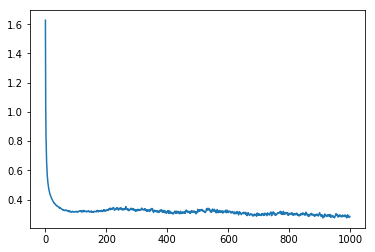

In [23]:
plt.plot(costs)

## TEST YOUR DATA HERE...


In [26]:
testDataSetPath = "./../input_data/Apparel/apparel-test.csv"

In [27]:
testDataSet = pd.read_csv(testDataSetPath)


In [28]:
y_pred= NNReLU.predict(testDataSet)
y_pred

array([0, 1, 2, ..., 4, 2, 6])

In [29]:
predDF = pd.DataFrame(data = y_pred)

In [53]:
predictedDataSetPath = "./../output_data/2018201040_prediction.csv"
predDF.to_csv(predictedDataSetPath)


In [30]:
originaltestDFPath = "./../input_data/Apparel/fashion-mnist_test.csv"

In [43]:
originaltestDataSet = pd.read_csv(originaltestDFPath)
y_testoriginal = originaltestDataSet[:9674][Class].values
y_testoriginal

array([0, 1, 2, ..., 4, 2, 2])

In [44]:
y_testoriginal.shape,y_pred.shape

((9674,), (9674,))

In [45]:
accuracy_score(y_testoriginal, y_pred)

0.8925987182137689